### MNIST data Classify

In [1]:
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data

/Users/charming/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
mnist = input_data.read_data_sets("MNIST_data/",one_hot=True)
nb_classes = 10

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


In [4]:
X = tf.placeholder(tf.float32,shape=[None,784])
Y = tf.placeholder(tf.float32,shape=[None,nb_classes])

In [5]:
W = tf.Variable(tf.random_normal([784,nb_classes]),name="weight")
b = tf.Variable(tf.random_normal([nb_classes]),name="bias")

In [6]:
hypo = tf.nn.softmax(tf.matmul(X,W) + b)

In [7]:
cost = tf.reduce_mean(-tf.reduce_sum(Y * tf.log(hypo),axis=1))

In [8]:
optimizer = tf.train.GradientDescentOptimizer(learning_rate=0.1).minimize(cost)

In [9]:
is_correct = tf.equal(tf.argmax(hypo,1),tf.argmax(Y,1))   

In [10]:
accuracy = tf.reduce_mean(tf.cast(is_correct,tf.float32))

Epoch : 1 cost :  2.682398007457906
Accuracy:  0.7525
label : [3]
Prediction : [5]


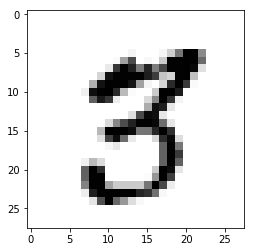

KeyboardInterrupt: 

In [171]:
training_epochs = 15
batch_size = 100

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    
    for epoch in range(training_epochs):
        avg_cost = 0
        total_batch = int(mnist.train.num_examples / batch_size)
        
        for i in range(total_batch):
            batch_xs , batch_ys = mnist.train.next_batch(batch_size)
            c,_ = sess.run([cost,optimizer], feed_dict={X: batch_xs, Y:batch_ys})
            avg_cost += c / total_batch
        print('Epoch :',epoch+1,'cost : ',avg_cost)
        print("Accuracy: ",accuracy.eval(session=sess,
      feed_dict={X: mnist.test.images, Y: mnist.test.labels}))
      
        print("label :",sess.run(tf.argmax(mnist.test.labels[r:r+1],1)))
        print("Prediction :", sess.run(tf.argmax(hypo,1),feed_dict={X:mnist.test.images[r:r+1]}))
        plt.imshow(mnist.test.images[r:r + 1].reshape(28,28),cmap='Greys',interpolation='nearest')
        plt.show()

In [11]:
import matplotlib.pyplot as plt
import random

In [12]:
r = random.randint(0,mnist.test.num_examples - 1)

In [13]:
r

2767


# MNIST 학습과정 Tensorboard로 표현하기


In [30]:
w1_hist = tf.summary.histogram("weight",W)
cost_sum = tf.summary.scalar("cost",cost)

In [31]:
summary = tf.summary.merge_all()


In [32]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())

In [33]:
writer = tf.summary.FileWriter('./logs')
writer.add_graph(sess.graph)

In [34]:
batch_size = 100
batch_xs , batch_ys = mnist.train.next_batch(batch_size)
s,_ = sess.run([summary,optimizer],feed_dict={X:batch_xs,Y:batch_ys})
writer.add_summary(s,global_step=100)

## Deep & Wide하게 NN 만들기

In [ ]:
W1 = tf.Variable(tf.random_normal([784,50]),name="weight1")
b1 = tf.Variable(tf.random_normal([50]),name='bias')
layer1 = tf.nn.softmax(tf.matmul(X,W1)+b1)

In [103]:
W2 = tf.Variable(tf.random_normal([50,40]),name="weight2")
b2 = tf.Variable(tf.random_normal([40]),name='bias2')
layer2 = tf.nn.softmax(tf.matmul(layer1,W2)+b2)

In [104]:
W3 = tf.Variable(tf.random_normal([40,30]),name="weight3")
b3 = tf.Variable(tf.random_normal([30]),name='bias3')
layer3 = tf.nn.softmax(tf.matmul(layer2,W3)+b3)

In [105]:
W4 = tf.Variable(tf.random_normal([30,nb_classes]),name="weight4")
b4 = tf.Variable(tf.random_normal([nb_classes]),name='bias4')
hypothesis = tf.nn.softmax(tf.matmul(layer3,W4)+b4)

In [106]:
cost1 = tf.reduce_mean(-tf.reduce_sum(Y *tf.log(hypothesis),axis =1))

In [107]:
optimizer1 = tf.train.GradientDescentOptimizer(learning_rate=0.1).minimize(cost1)

In [108]:
prediction1 = tf.argmax(hypothesis,1)
accuracy1 = tf.reduce_mean(tf.cast(tf.equal(prediction1, tf.argmax(Y,1)),tf.float32))

Epoch : 1 cost :  0.004616206342523748
Accuracy : 0.1012
label : [1]
Prediction : [0]


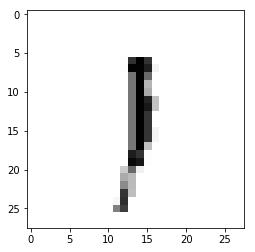

Epoch : 1 cost :  0.00924971277063543
Accuracy : 0.1014
label : [1]
Prediction : [0]


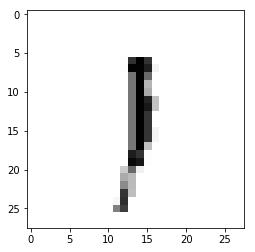

Epoch : 1 cost :  0.01389443440870805
Accuracy : 0.1012
label : [1]
Prediction : [0]


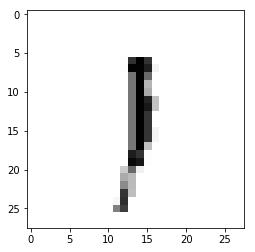

Epoch : 1 cost :  0.018669065995649856
Accuracy : 0.1011
label : [1]
Prediction : [0]


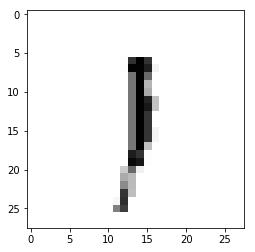

Epoch : 1 cost :  0.023476811755787242
Accuracy : 0.1011
label : [1]
Prediction : [0]


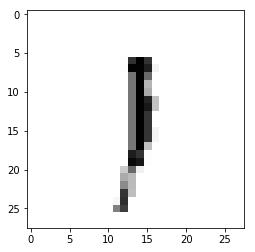

Epoch : 1 cost :  0.028080161268060858
Accuracy : 0.1005
label : [1]
Prediction : [0]


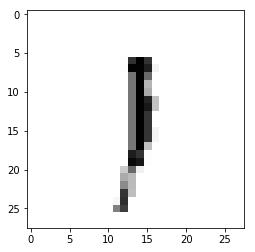

Epoch : 1 cost :  0.03302369507876309
Accuracy : 0.1008
label : [1]
Prediction : [0]


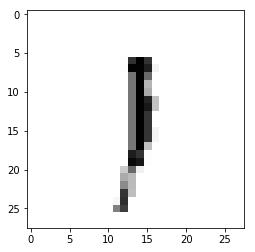

Epoch : 1 cost :  0.037896502234719014
Accuracy : 0.101
label : [1]
Prediction : [0]


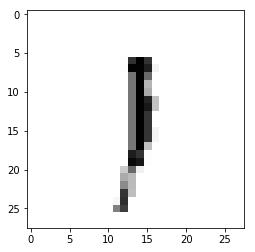

Epoch : 1 cost :  0.04271232691678133
Accuracy : 0.1011
label : [1]
Prediction : [0]


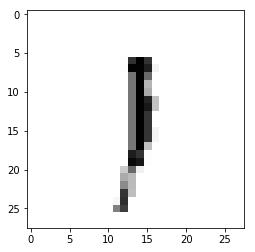

Epoch : 1 cost :  0.04754338481209494
Accuracy : 0.1012
label : [1]
Prediction : [0]


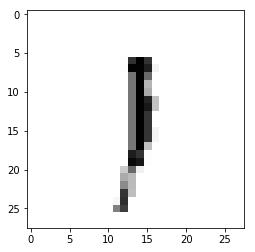

Epoch : 1 cost :  0.05203806356950239
Accuracy : 0.101
label : [1]
Prediction : [0]


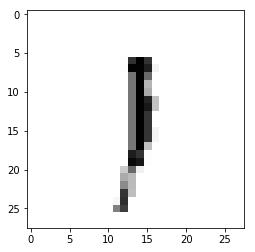

Epoch : 1 cost :  0.05693395354531028
Accuracy : 0.1003
label : [1]
Prediction : [0]


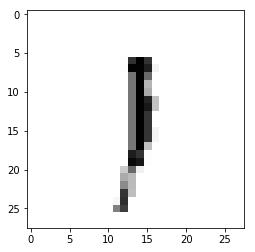

Epoch : 1 cost :  0.06167083696885542
Accuracy : 0.0999
label : [1]
Prediction : [0]


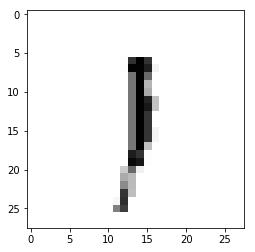

Epoch : 1 cost :  0.06632204575972123
Accuracy : 0.0997
label : [1]
Prediction : [0]


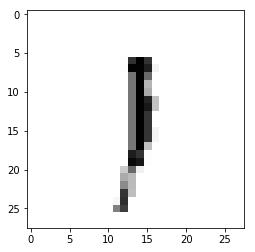

Epoch : 1 cost :  0.0708894192088734
Accuracy : 0.0999
label : [1]
Prediction : [0]


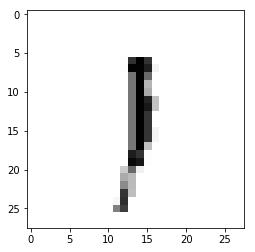

Epoch : 1 cost :  0.07554922103881835
Accuracy : 0.0994
label : [1]
Prediction : [0]


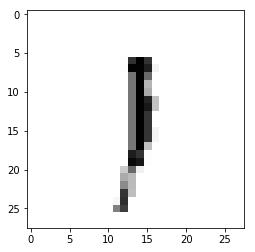

Epoch : 1 cost :  0.08024790980599142
Accuracy : 0.0999
label : [1]
Prediction : [0]


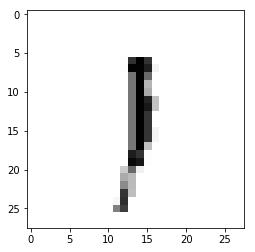

Epoch : 1 cost :  0.08441055167805063
Accuracy : 0.1
label : [1]
Prediction : [0]


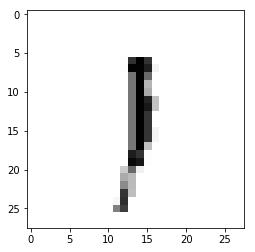

Epoch : 1 cost :  0.08894910985773258
Accuracy : 0.1
label : [1]
Prediction : [0]


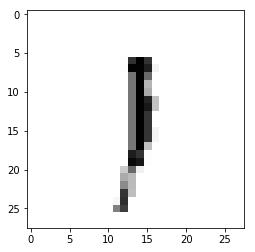

Epoch : 1 cost :  0.09368533697995271
Accuracy : 0.1001
label : [1]
Prediction : [0]


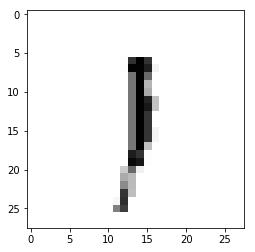

Epoch : 1 cost :  0.09851411689411509
Accuracy : 0.1001
label : [1]
Prediction : [0]


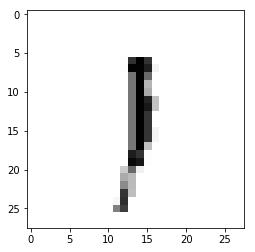

Epoch : 1 cost :  0.10311598821119827
Accuracy : 0.0922
label : [1]
Prediction : [0]


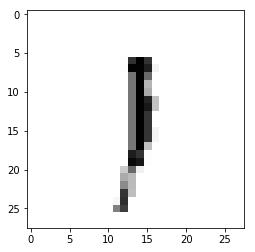

Epoch : 1 cost :  0.1077726836638017
Accuracy : 0.0923
label : [1]
Prediction : [0]


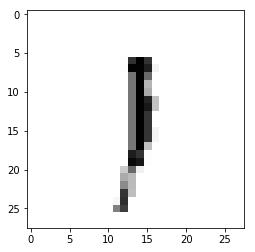

Epoch : 1 cost :  0.11251664335077458
Accuracy : 0.0969
label : [1]
Prediction : [0]


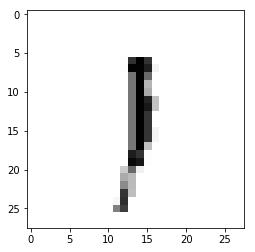

Epoch : 1 cost :  0.11694140520962801
Accuracy : 0.1001
label : [1]
Prediction : [0]


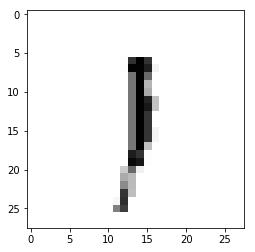

Epoch : 1 cost :  0.12171526822176845
Accuracy : 0.1
label : [1]
Prediction : [0]


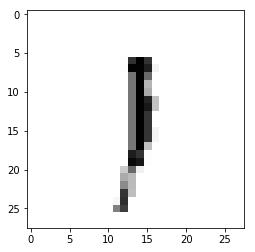

Epoch : 1 cost :  0.12641460895538328
Accuracy : 0.1
label : [1]
Prediction : [0]


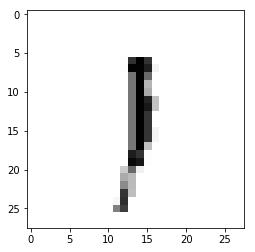

Epoch : 1 cost :  0.1308636899427934
Accuracy : 0.1
label : [1]
Prediction : [0]


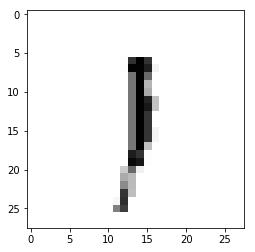

Epoch : 1 cost :  0.13548292376778343
Accuracy : 0.0923
label : [1]
Prediction : [0]


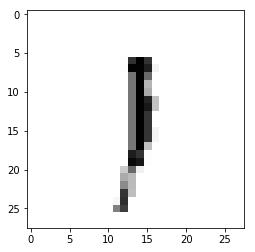

Epoch : 1 cost :  0.13988048553466798
Accuracy : 0.0925
label : [1]
Prediction : [0]


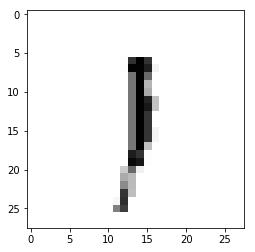

Epoch : 1 cost :  0.1444507191397927
Accuracy : 0.0918
label : [1]
Prediction : [0]


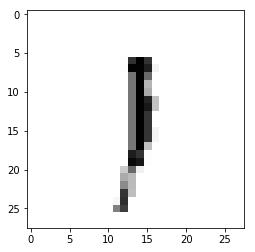

Epoch : 1 cost :  0.14908991857008502
Accuracy : 0.1
label : [1]
Prediction : [0]


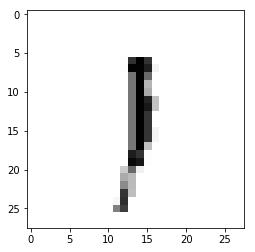

Epoch : 1 cost :  0.15365173253146086
Accuracy : 0.1
label : [1]
Prediction : [0]


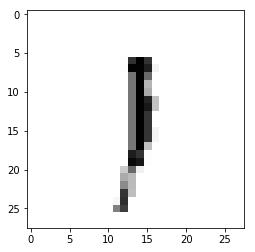

Epoch : 1 cost :  0.1580821466445923
Accuracy : 0.1
label : [1]
Prediction : [0]


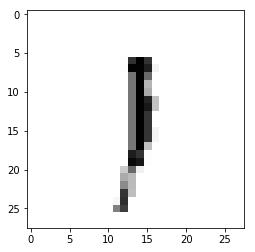

Epoch : 1 cost :  0.1626394406231967
Accuracy : 0.1001
label : [1]
Prediction : [0]


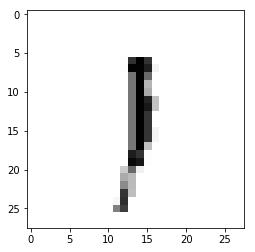

Epoch : 1 cost :  0.16705643523823133
Accuracy : 0.1001
label : [1]
Prediction : [0]


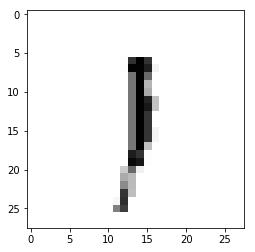

Epoch : 1 cost :  0.17136909354816784
Accuracy : 0.1001
label : [1]
Prediction : [0]


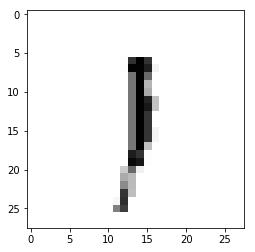

Epoch : 1 cost :  0.1759308585253629
Accuracy : 0.1
label : [1]
Prediction : [0]


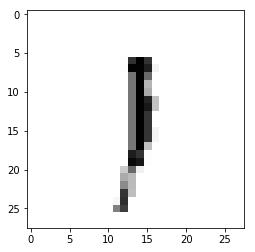

Epoch : 1 cost :  0.18025677550922742
Accuracy : 0.1001
label : [1]
Prediction : [0]


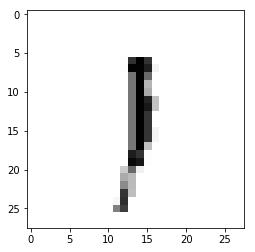

Epoch : 1 cost :  0.1846601893685081
Accuracy : 0.0998
label : [1]
Prediction : [0]


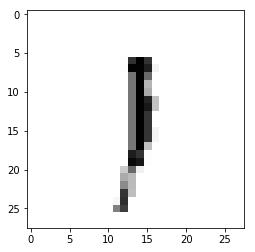

Epoch : 1 cost :  0.18893229831348768
Accuracy : 0.0997
label : [1]
Prediction : [0]


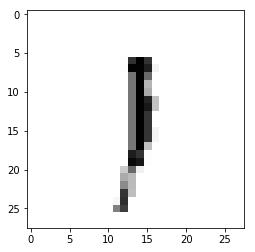

Epoch : 1 cost :  0.1932510991529985
Accuracy : 0.0998
label : [1]
Prediction : [0]


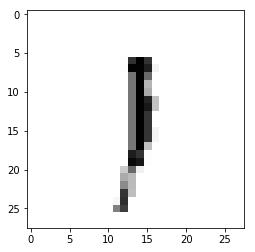

Epoch : 1 cost :  0.19776079654693607
Accuracy : 0.0999
label : [1]
Prediction : [0]


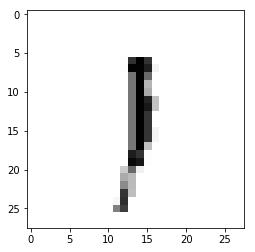

Epoch : 1 cost :  0.20201379039070827
Accuracy : 0.1
label : [1]
Prediction : [0]


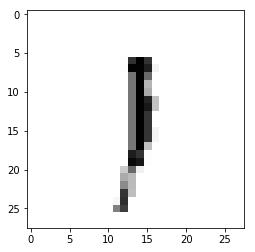

Epoch : 1 cost :  0.2065844280069525
Accuracy : 0.0995
label : [1]
Prediction : [0]


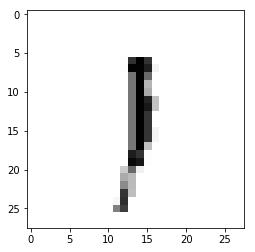

Epoch : 1 cost :  0.21115520260550763
Accuracy : 0.1
label : [1]
Prediction : [0]


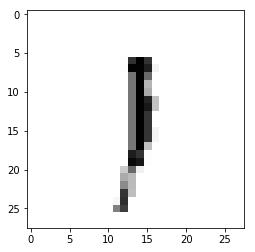

Epoch : 1 cost :  0.21558246135711673
Accuracy : 0.0998
label : [1]
Prediction : [0]


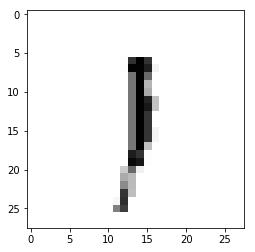

Epoch : 1 cost :  0.21995701139623472
Accuracy : 0.0935
label : [1]
Prediction : [0]


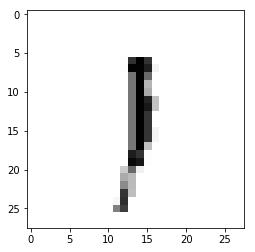

Epoch : 1 cost :  0.2242624577608976
Accuracy : 0.0922
label : [1]
Prediction : [0]


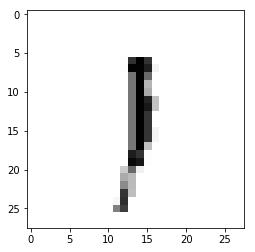

Epoch : 1 cost :  0.22846774187954993
Accuracy : 0.0907
label : [1]
Prediction : [0]


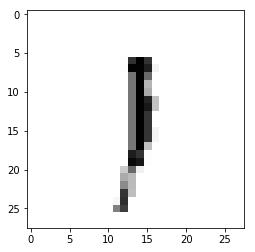

Epoch : 1 cost :  0.23281363140452996
Accuracy : 0.0911
label : [1]
Prediction : [0]


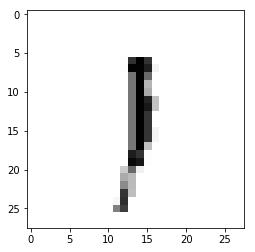

Epoch : 1 cost :  0.23728564002297145
Accuracy : 0.0999
label : [1]
Prediction : [0]


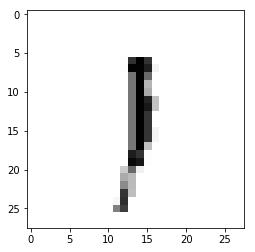

Epoch : 1 cost :  0.24153952511874116
Accuracy : 0.0928
label : [1]
Prediction : [0]


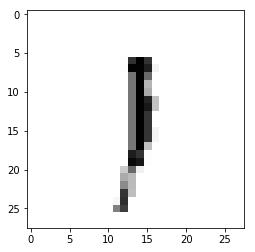

Epoch : 1 cost :  0.24589491237293595
Accuracy : 0.0999
label : [1]
Prediction : [0]


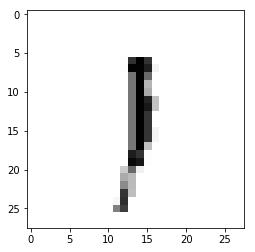

Epoch : 1 cost :  0.2502158589796587
Accuracy : 0.0996
label : [1]
Prediction : [0]


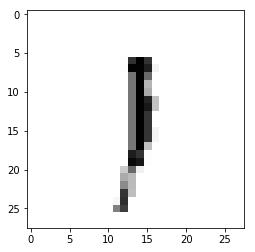

Epoch : 1 cost :  0.2544952574643222
Accuracy : 0.0997
label : [1]
Prediction : [0]


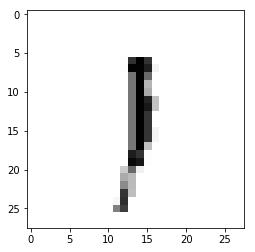

Epoch : 1 cost :  0.25889467976310043
Accuracy : 0.0998
label : [1]
Prediction : [0]


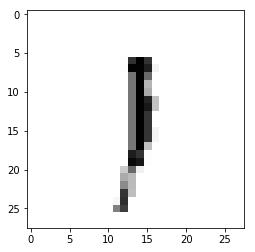

Epoch : 1 cost :  0.26321863564577974
Accuracy : 0.0999
label : [1]
Prediction : [0]


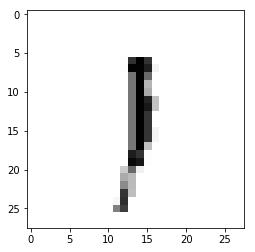

Epoch : 1 cost :  0.2674781118739735
Accuracy : 0.0997
label : [1]
Prediction : [0]


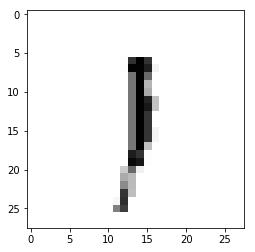

Epoch : 1 cost :  0.27195686643773864
Accuracy : 0.1
label : [1]
Prediction : [0]


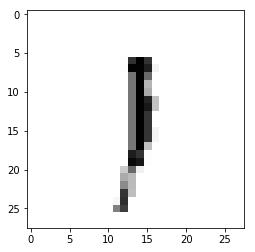

Epoch : 1 cost :  0.2763005768169057
Accuracy : 0.0997
label : [1]
Prediction : [0]


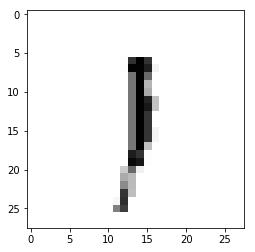

Epoch : 1 cost :  0.280642242865129
Accuracy : 0.0998
label : [1]
Prediction : [0]


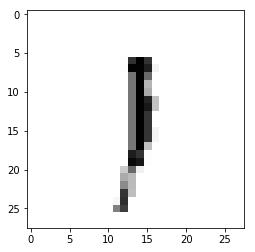

Epoch : 1 cost :  0.2850039811567827
Accuracy : 0.0998
label : [1]
Prediction : [0]


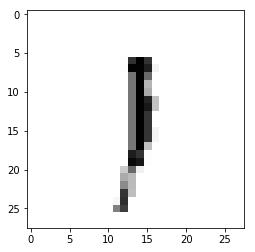

Epoch : 1 cost :  0.2892304754257203
Accuracy : 0.0999
label : [1]
Prediction : [0]


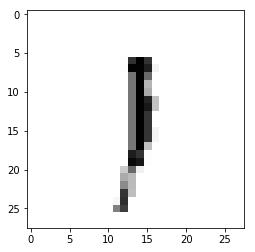

Epoch : 1 cost :  0.293540437004783
Accuracy : 0.1001
label : [1]
Prediction : [0]


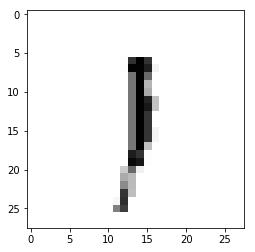

Epoch : 1 cost :  0.2977261738343673
Accuracy : 0.0924
label : [1]
Prediction : [0]


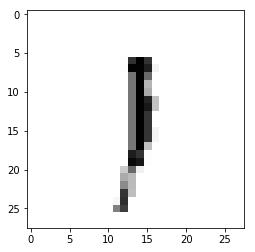

Epoch : 1 cost :  0.30200199430639096
Accuracy : 0.0922
label : [1]
Prediction : [0]


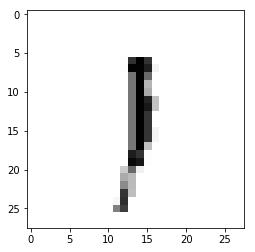

Epoch : 1 cost :  0.30637266029011123
Accuracy : 0.1001
label : [1]
Prediction : [0]


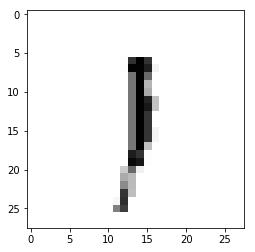

Epoch : 1 cost :  0.3108038278059526
Accuracy : 0.0999
label : [1]
Prediction : [0]


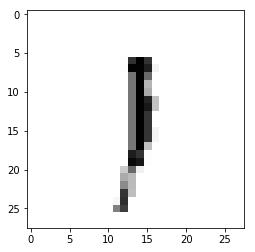

Epoch : 1 cost :  0.3152148896997625
Accuracy : 0.0944
label : [1]
Prediction : [0]


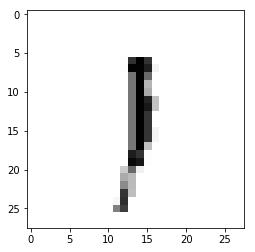

Epoch : 1 cost :  0.3195658709786155
Accuracy : 0.0922
label : [1]
Prediction : [0]


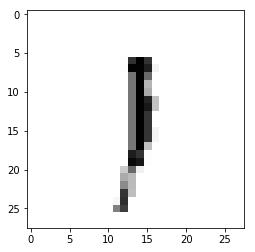

Epoch : 1 cost :  0.32381378347223455
Accuracy : 0.1001
label : [1]
Prediction : [0]


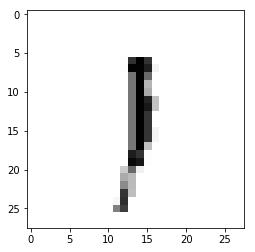

Epoch : 1 cost :  0.32815628875385633
Accuracy : 0.0998
label : [1]
Prediction : [0]


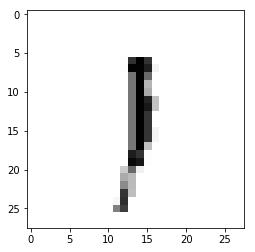

Epoch : 1 cost :  0.3324412354555997
Accuracy : 0.094
label : [1]
Prediction : [0]


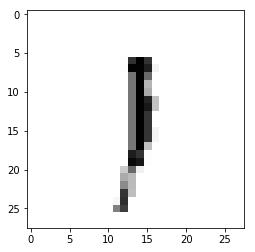

Epoch : 1 cost :  0.33669304761019625
Accuracy : 0.0999
label : [1]
Prediction : [0]


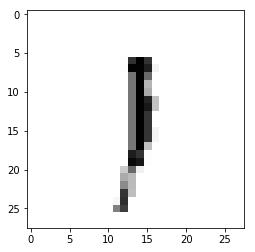

Epoch : 1 cost :  0.341042898351496
Accuracy : 0.0999
label : [1]
Prediction : [0]


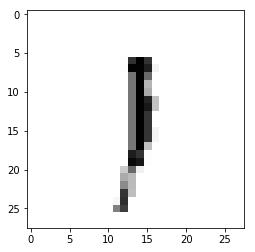

Epoch : 1 cost :  0.3453617278012363
Accuracy : 0.0996
label : [1]
Prediction : [0]


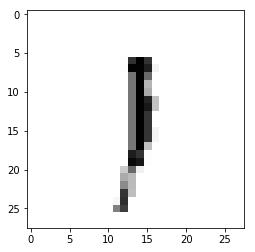

Epoch : 1 cost :  0.34971369309858846
Accuracy : 0.0998
label : [1]
Prediction : [0]


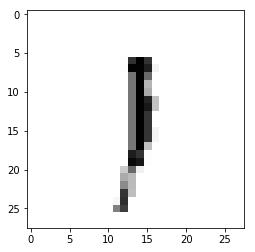

Epoch : 1 cost :  0.35415811365300964
Accuracy : 0.0997
label : [1]
Prediction : [0]


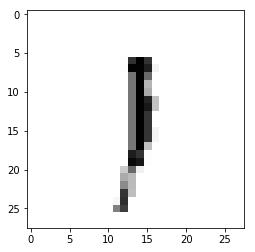

Epoch : 1 cost :  0.35839658953926784
Accuracy : 0.0998
label : [1]
Prediction : [0]


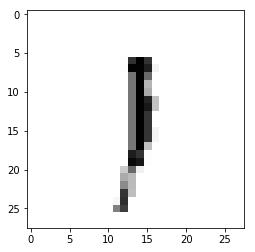

Epoch : 1 cost :  0.3626566011255438
Accuracy : 0.0998
label : [1]
Prediction : [0]


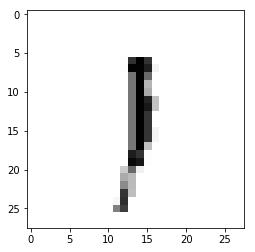

Epoch : 1 cost :  0.36703527363863864
Accuracy : 0.0999
label : [1]
Prediction : [0]


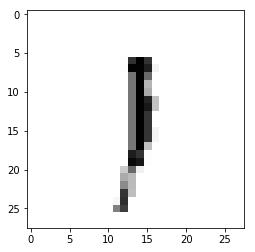

Epoch : 1 cost :  0.3713389838825573
Accuracy : 0.0999
label : [1]
Prediction : [0]


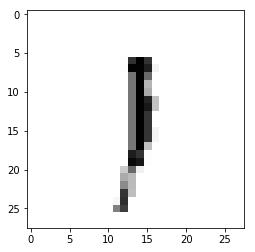

Epoch : 1 cost :  0.37574190529910007
Accuracy : 0.0997
label : [1]
Prediction : [0]


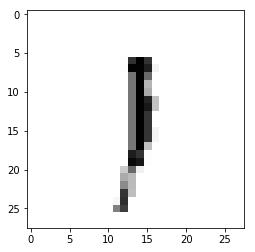

Epoch : 1 cost :  0.380041433247653
Accuracy : 0.0998
label : [1]
Prediction : [0]


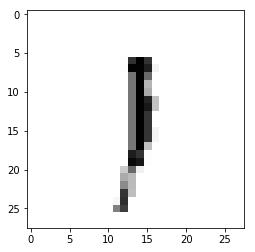

Epoch : 1 cost :  0.38423619270324716
Accuracy : 0.0938
label : [1]
Prediction : [0]


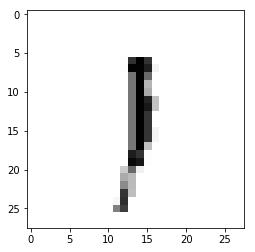

Epoch : 1 cost :  0.3885862337459218
Accuracy : 0.0923
label : [1]
Prediction : [0]


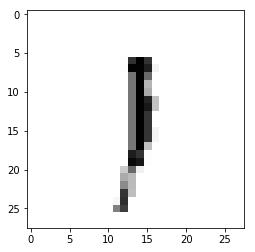

Epoch : 1 cost :  0.39281514818018143
Accuracy : 0.0939
label : [1]
Prediction : [0]


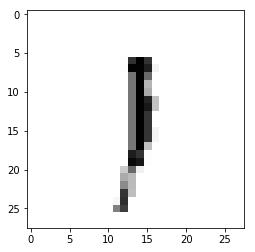

Epoch : 1 cost :  0.3971160212430088
Accuracy : 0.1
label : [1]
Prediction : [0]


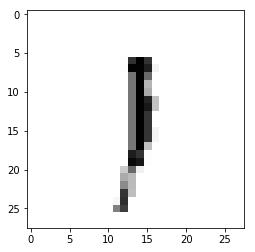

Epoch : 1 cost :  0.401370499350808
Accuracy : 0.0998
label : [1]
Prediction : [0]


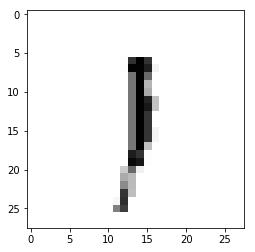

Epoch : 1 cost :  0.40569197221235803
Accuracy : 0.0997
label : [1]
Prediction : [0]


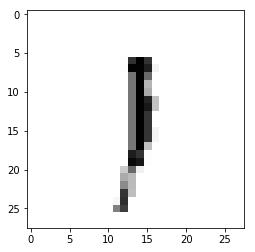

Epoch : 1 cost :  0.41012648799202667
Accuracy : 0.0998
label : [1]
Prediction : [0]


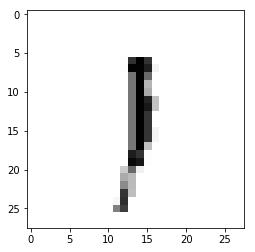

Epoch : 1 cost :  0.4144419193267823
Accuracy : 0.1001
label : [1]
Prediction : [0]


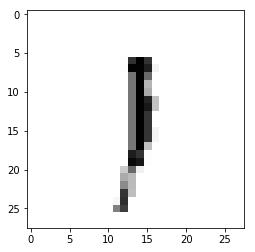

Epoch : 1 cost :  0.41875703768296685
Accuracy : 0.0998
label : [1]
Prediction : [0]


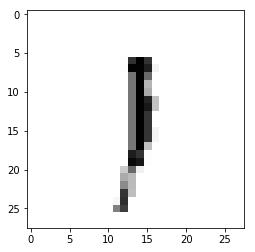

Epoch : 1 cost :  0.4229534053802491
Accuracy : 0.0944
label : [1]
Prediction : [0]


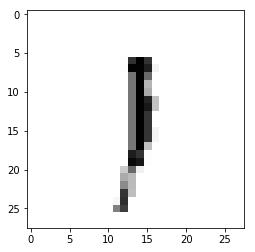

Epoch : 1 cost :  0.42720367821780125
Accuracy : 0.0922
label : [1]
Prediction : [0]


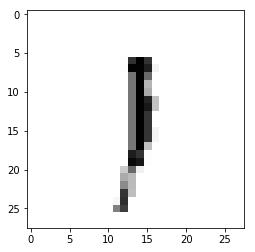

Epoch : 1 cost :  0.43135422273115687
Accuracy : 0.096
label : [1]
Prediction : [0]


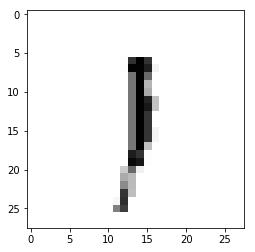

Epoch : 1 cost :  0.43564973484386105
Accuracy : 0.0922
label : [1]
Prediction : [0]


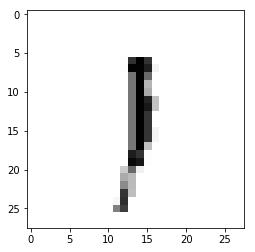

Epoch : 1 cost :  0.439842231056907
Accuracy : 0.0923
label : [1]
Prediction : [0]


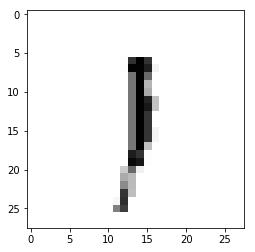

Epoch : 1 cost :  0.44407010988755663
Accuracy : 0.0919
label : [1]
Prediction : [0]


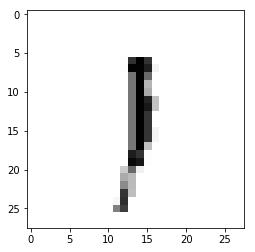

Epoch : 1 cost :  0.4482449362494729
Accuracy : 0.0895
label : [1]
Prediction : [0]


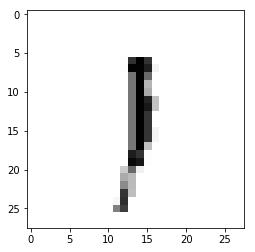

Epoch : 1 cost :  0.4524615352804011
Accuracy : 0.0923
label : [1]
Prediction : [0]


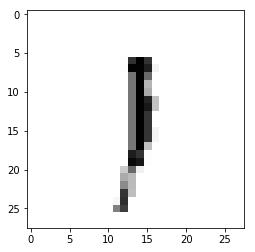

Epoch : 1 cost :  0.45682040648026906
Accuracy : 0.0922
label : [1]
Prediction : [0]


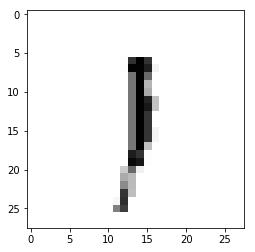

Epoch : 1 cost :  0.46108251831748276
Accuracy : 0.1
label : [1]
Prediction : [0]


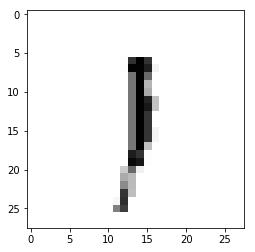

Epoch : 1 cost :  0.46528339776125827
Accuracy : 0.1
label : [1]
Prediction : [0]


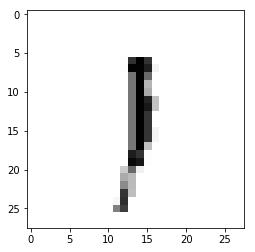

Epoch : 1 cost :  0.469502839608626
Accuracy : 0.0998
label : [1]
Prediction : [0]


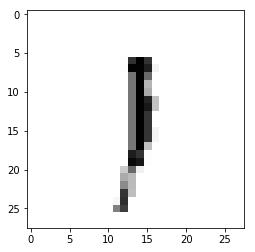

Epoch : 1 cost :  0.4737193202972413
Accuracy : 0.0997
label : [1]
Prediction : [0]


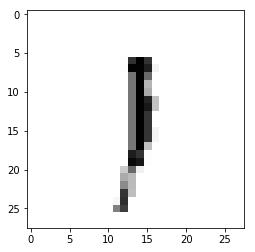

Epoch : 1 cost :  0.47793763204054407
Accuracy : 0.1001
label : [1]
Prediction : [0]


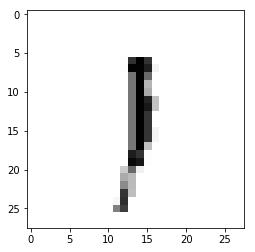

Epoch : 1 cost :  0.48220897847955885
Accuracy : 0.1002
label : [1]
Prediction : [0]


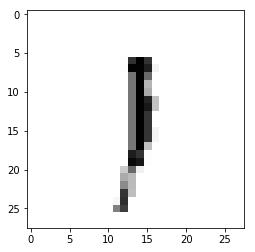

Epoch : 1 cost :  0.486469730463895
Accuracy : 0.0999
label : [1]
Prediction : [0]


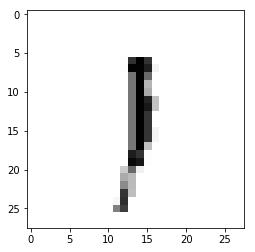

Epoch : 1 cost :  0.4906740847500889
Accuracy : 0.1009
label : [1]
Prediction : [0]


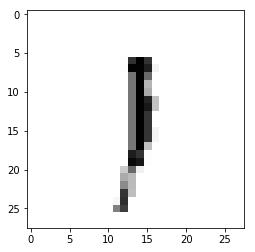

Epoch : 1 cost :  0.4949050218408759
Accuracy : 0.1005
label : [1]
Prediction : [0]


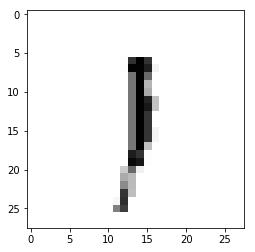

Epoch : 1 cost :  0.4992164767872205
Accuracy : 0.1001
label : [1]
Prediction : [0]


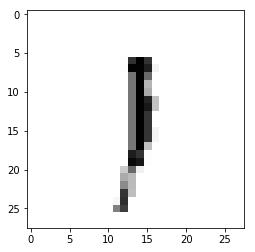

Epoch : 1 cost :  0.5034864867817274
Accuracy : 0.0998
label : [1]
Prediction : [0]


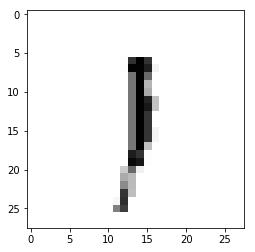

Epoch : 1 cost :  0.5077748680114748
Accuracy : 0.0999
label : [1]
Prediction : [0]


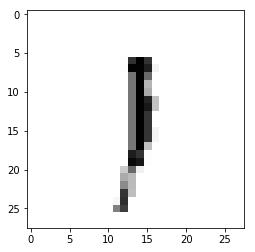

Epoch : 1 cost :  0.5120628517324276
Accuracy : 0.1005
label : [1]
Prediction : [0]


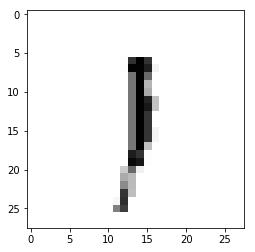

Epoch : 1 cost :  0.5162902168794113
Accuracy : 0.1002
label : [1]
Prediction : [0]


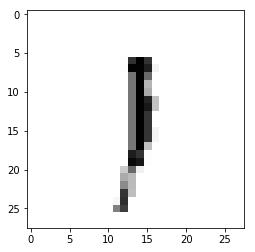

Epoch : 1 cost :  0.5206013501774183
Accuracy : 0.0999
label : [1]
Prediction : [0]


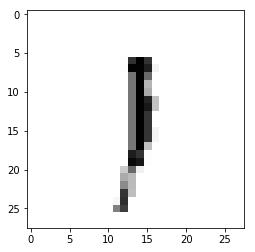

Epoch : 1 cost :  0.5248347759246828
Accuracy : 0.0998
label : [1]
Prediction : [0]


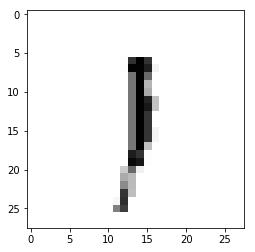

Epoch : 1 cost :  0.5290772065249357
Accuracy : 0.1
label : [1]
Prediction : [0]


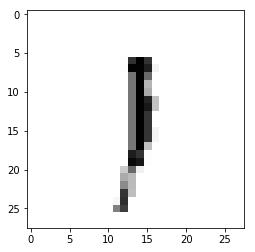

Epoch : 1 cost :  0.5333305324207653
Accuracy : 0.0998
label : [1]
Prediction : [0]


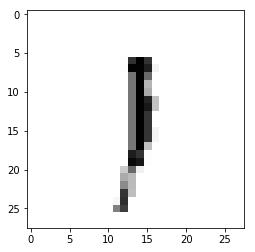

Epoch : 1 cost :  0.5375409039584074
Accuracy : 0.0996
label : [1]
Prediction : [0]


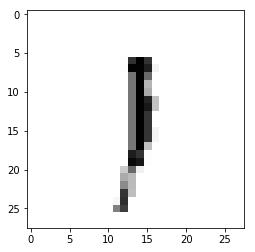

Epoch : 1 cost :  0.5418188012729992
Accuracy : 0.0999
label : [1]
Prediction : [0]


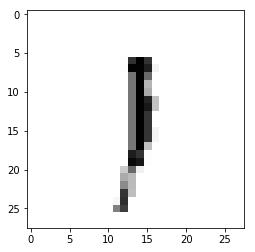

Epoch : 1 cost :  0.5460250225934116
Accuracy : 0.0927
label : [1]
Prediction : [0]


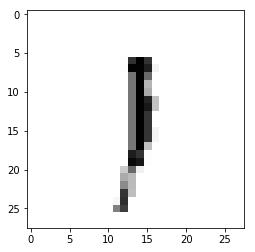

Epoch : 1 cost :  0.5502532135356557
Accuracy : 0.0827
label : [1]
Prediction : [0]


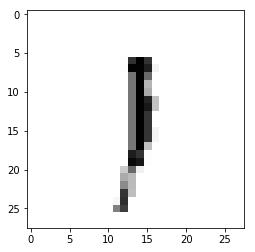

Epoch : 1 cost :  0.5544760409268467
Accuracy : 0.0797
label : [1]
Prediction : [0]


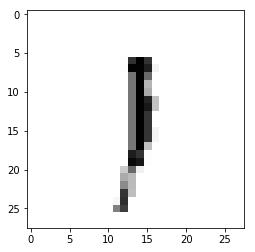

Epoch : 1 cost :  0.5587321329116822
Accuracy : 0.0922
label : [1]
Prediction : [0]


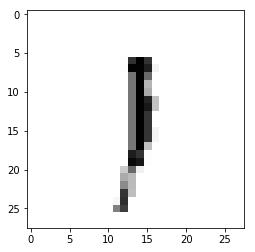

Epoch : 1 cost :  0.5629854427684438
Accuracy : 0.0921
label : [1]
Prediction : [0]


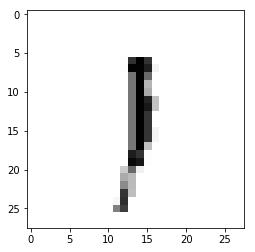

Epoch : 1 cost :  0.5672685345736417
Accuracy : 0.0999
label : [1]
Prediction : [0]


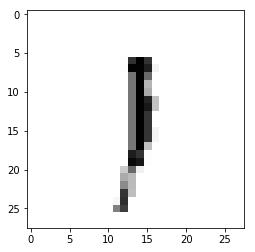

Epoch : 1 cost :  0.5714303497834639
Accuracy : 0.0999
label : [1]
Prediction : [0]


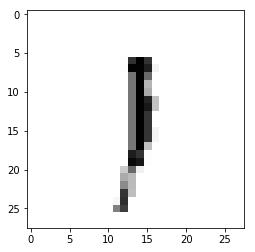

Epoch : 1 cost :  0.5757129140333695
Accuracy : 0.0997
label : [1]
Prediction : [0]


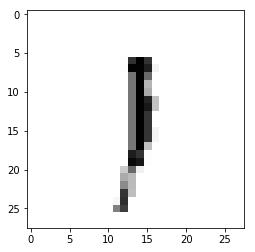

Epoch : 1 cost :  0.5799454181844538
Accuracy : 0.0938
label : [1]
Prediction : [0]


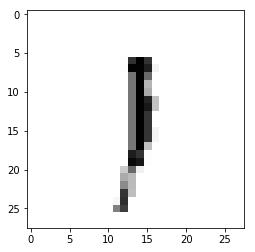

Epoch : 1 cost :  0.5841549669612538
Accuracy : 0.0789
label : [1]
Prediction : [0]


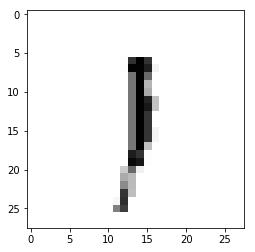

Epoch : 1 cost :  0.5883598904176192
Accuracy : 0.0817
label : [1]
Prediction : [0]


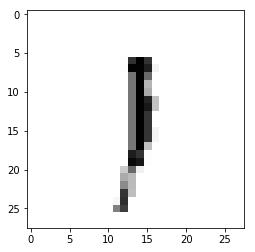

Epoch : 1 cost :  0.592645672451366
Accuracy : 0.0769
label : [1]
Prediction : [0]


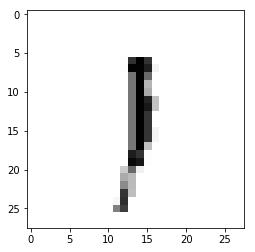

Epoch : 1 cost :  0.5968450997092506
Accuracy : 0.0736
label : [1]
Prediction : [0]


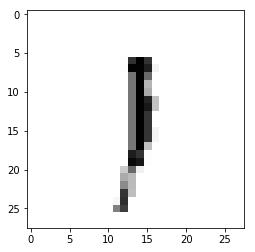

Epoch : 1 cost :  0.601011149666526
Accuracy : 0.0757
label : [1]
Prediction : [0]


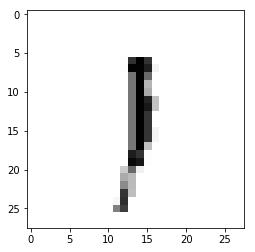

Epoch : 1 cost :  0.6052862106670032
Accuracy : 0.0813
label : [1]
Prediction : [0]


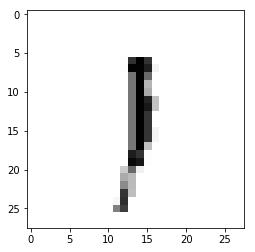

Epoch : 1 cost :  0.6095398187637328
Accuracy : 0.082
label : [1]
Prediction : [0]


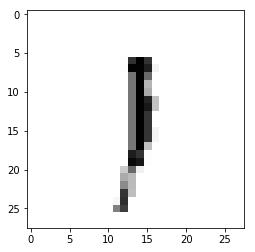

Epoch : 1 cost :  0.6137481212615965
Accuracy : 0.0793
label : [1]
Prediction : [0]


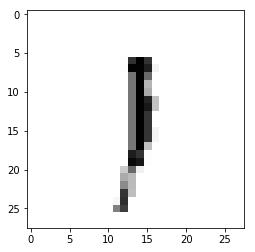

Epoch : 1 cost :  0.6178762709010729
Accuracy : 0.0797
label : [1]
Prediction : [0]


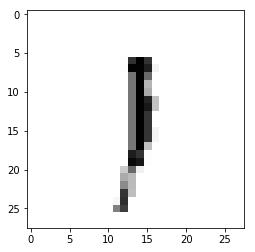

Epoch : 1 cost :  0.6220841104334048
Accuracy : 0.079
label : [1]
Prediction : [0]


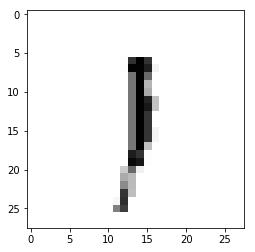

Epoch : 1 cost :  0.62628585728732
Accuracy : 0.1026
label : [1]
Prediction : [0]


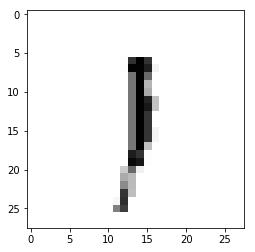

Epoch : 1 cost :  0.6305019374327224
Accuracy : 0.0781
label : [1]
Prediction : [0]


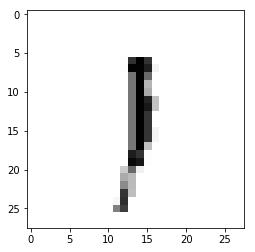

Epoch : 1 cost :  0.6346647765419698
Accuracy : 0.0784
label : [1]
Prediction : [0]


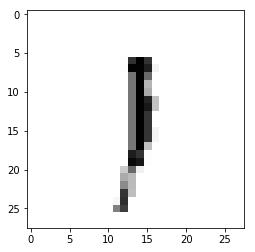

Epoch : 1 cost :  0.6388809806650334
Accuracy : 0.0761
label : [1]
Prediction : [0]


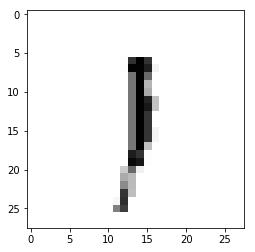

Epoch : 1 cost :  0.6430224084854125
Accuracy : 0.0765
label : [1]
Prediction : [0]


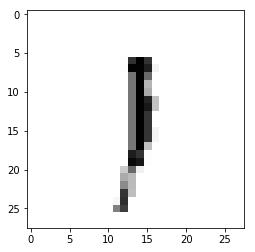

Epoch : 1 cost :  0.6473219611427999
Accuracy : 0.0765
label : [1]
Prediction : [0]


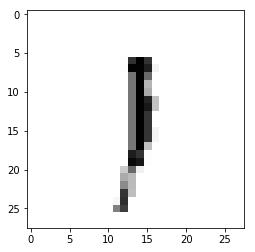

Epoch : 1 cost :  0.6514986835826526
Accuracy : 0.0761
label : [1]
Prediction : [0]


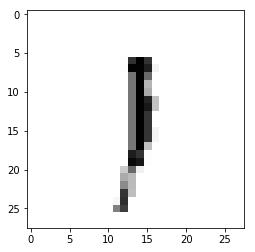

Epoch : 1 cost :  0.6557220610705288
Accuracy : 0.0764
label : [1]
Prediction : [0]


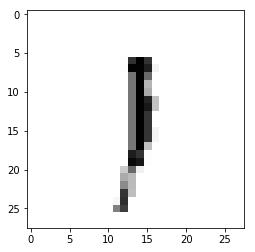

Epoch : 1 cost :  0.6599566906148736
Accuracy : 0.0757
label : [1]
Prediction : [0]


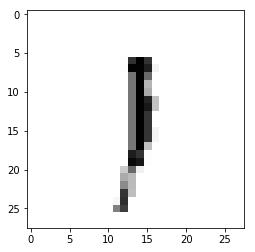

Epoch : 1 cost :  0.6641255222667346
Accuracy : 0.0767
label : [1]
Prediction : [0]


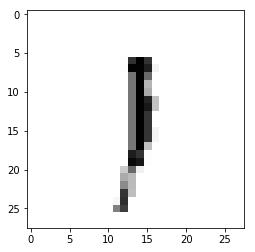

Epoch : 1 cost :  0.668422413739291
Accuracy : 0.0696
label : [1]
Prediction : [0]


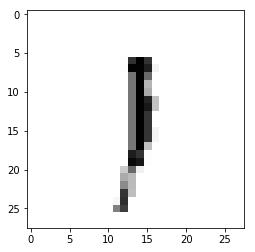

Epoch : 1 cost :  0.6727032826163551
Accuracy : 0.0695
label : [1]
Prediction : [0]


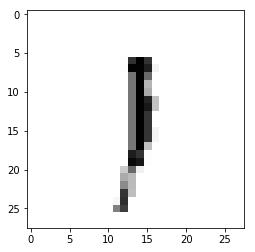

Epoch : 1 cost :  0.6769037064639004
Accuracy : 0.0695
label : [1]
Prediction : [0]


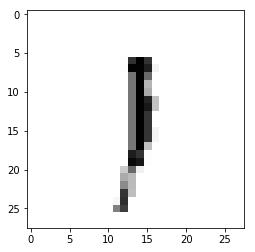

Epoch : 1 cost :  0.6810818230022083
Accuracy : 0.0754
label : [1]
Prediction : [0]


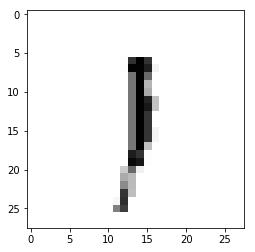

Epoch : 1 cost :  0.6853025709499012
Accuracy : 0.0691
label : [1]
Prediction : [0]


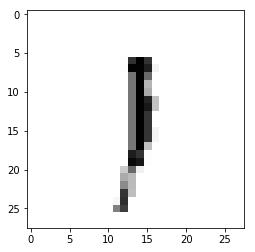

Epoch : 1 cost :  0.6895061948082664
Accuracy : 0.0694
label : [1]
Prediction : [0]


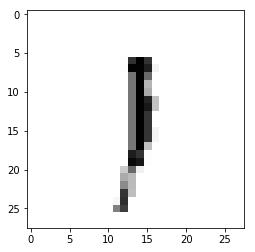

Epoch : 1 cost :  0.6937493384968151
Accuracy : 0.0756
label : [1]
Prediction : [0]


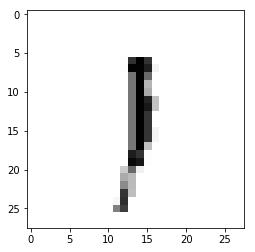

Epoch : 1 cost :  0.6979056510058317
Accuracy : 0.0771
label : [1]
Prediction : [0]


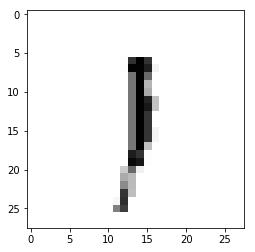

Epoch : 1 cost :  0.7020875666358255
Accuracy : 0.0765
label : [1]
Prediction : [0]


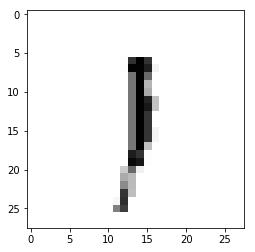

Epoch : 1 cost :  0.7063308520750566
Accuracy : 0.0767
label : [1]
Prediction : [0]


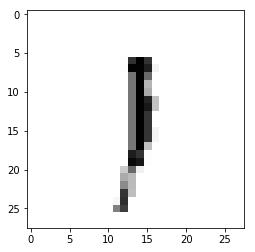

Epoch : 1 cost :  0.7105452719601718
Accuracy : 0.0778
label : [1]
Prediction : [0]


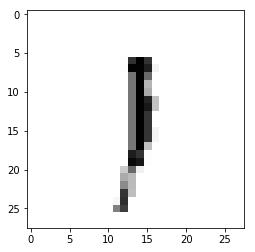

Epoch : 1 cost :  0.714808354811235
Accuracy : 0.0784
label : [1]
Prediction : [0]


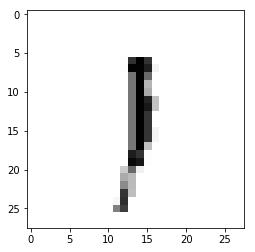

Epoch : 1 cost :  0.7190435977415606
Accuracy : 0.0781
label : [1]
Prediction : [0]


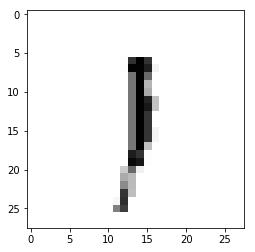

Epoch : 1 cost :  0.723233984600414
Accuracy : 0.078
label : [1]
Prediction : [0]


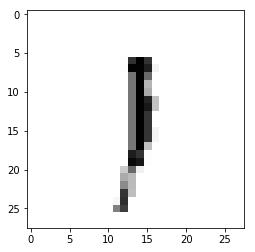

Epoch : 1 cost :  0.7274196490374479
Accuracy : 0.0777
label : [1]
Prediction : [0]


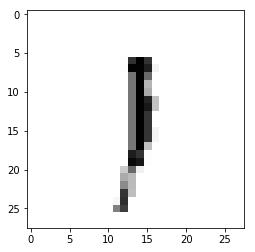

Epoch : 1 cost :  0.7315570878982545
Accuracy : 0.0795
label : [1]
Prediction : [0]


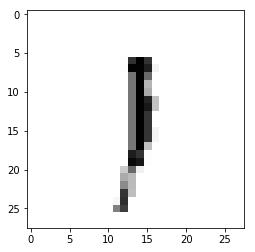

Epoch : 1 cost :  0.7357974429564044
Accuracy : 0.0778
label : [1]
Prediction : [0]


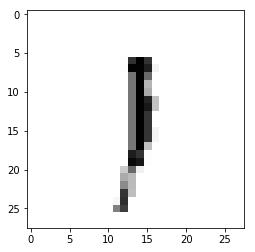

Epoch : 1 cost :  0.7399556159973145
Accuracy : 0.0773
label : [1]
Prediction : [0]


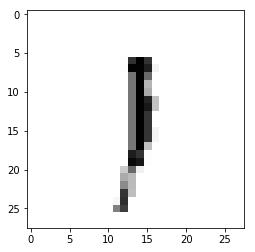

Epoch : 1 cost :  0.7441101438348944
Accuracy : 0.0774
label : [1]
Prediction : [0]


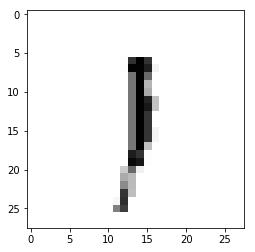

Epoch : 1 cost :  0.7483193397521973
Accuracy : 0.0776
label : [1]
Prediction : [0]


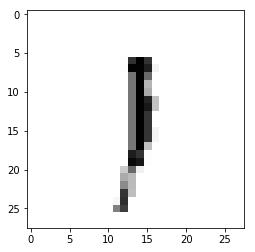

Epoch : 1 cost :  0.7525532432035967
Accuracy : 0.078
label : [1]
Prediction : [0]


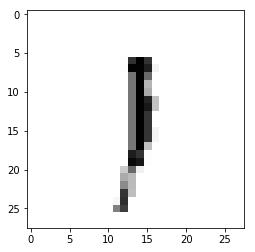

Epoch : 1 cost :  0.7568335450779309
Accuracy : 0.0778
label : [1]
Prediction : [0]


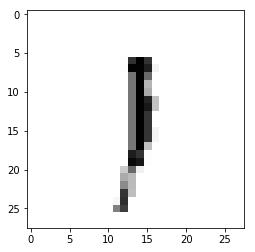

Epoch : 1 cost :  0.761031704382463
Accuracy : 0.0782
label : [1]
Prediction : [0]


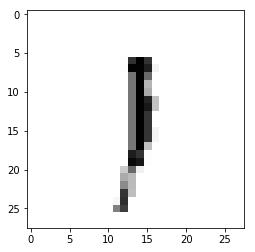

Epoch : 1 cost :  0.7653106086904353
Accuracy : 0.0792
label : [1]
Prediction : [0]


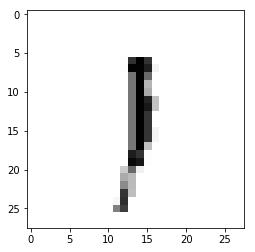

Epoch : 1 cost :  0.769501203623685
Accuracy : 0.0801
label : [1]
Prediction : [0]


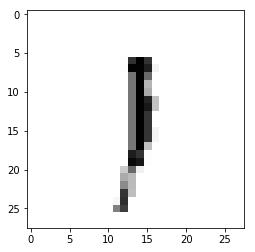

Epoch : 1 cost :  0.7736719642985951
Accuracy : 0.073
label : [1]
Prediction : [0]


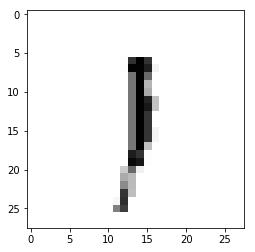

Epoch : 1 cost :  0.7778718939694491
Accuracy : 0.0795
label : [1]
Prediction : [0]


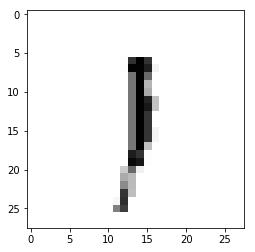

Epoch : 1 cost :  0.7820043143359098
Accuracy : 0.0802
label : [1]
Prediction : [0]


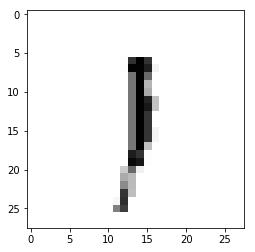

Epoch : 1 cost :  0.7862275301326405
Accuracy : 0.0799
label : [1]
Prediction : [0]


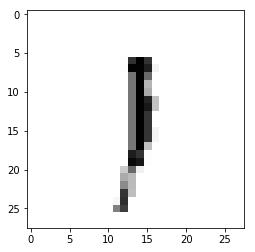

Epoch : 1 cost :  0.7903941067782315
Accuracy : 0.0787
label : [1]
Prediction : [0]


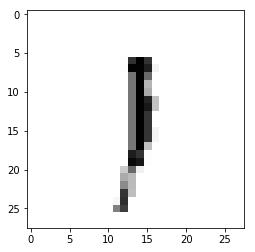

Epoch : 1 cost :  0.794589106386358
Accuracy : 0.0786
label : [1]
Prediction : [0]


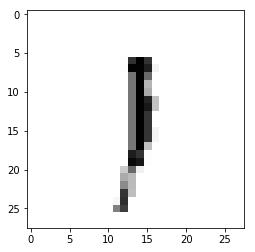

Epoch : 1 cost :  0.7987826282327825
Accuracy : 0.0779
label : [1]
Prediction : [0]


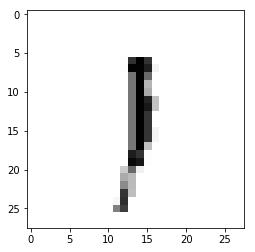

Epoch : 1 cost :  0.8030038027329878
Accuracy : 0.0784
label : [1]
Prediction : [0]


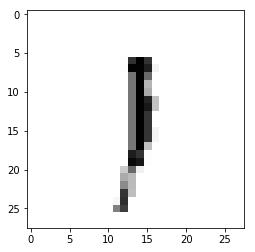

Epoch : 1 cost :  0.8071942221034656
Accuracy : 0.0796
label : [1]
Prediction : [0]


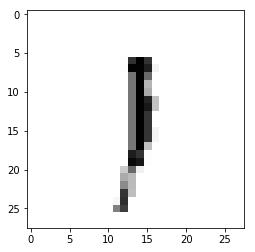

Epoch : 1 cost :  0.811390840357
Accuracy : 0.0804
label : [1]
Prediction : [0]


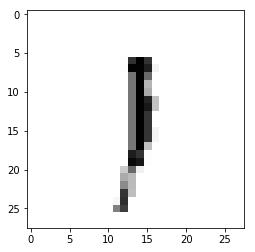

Epoch : 1 cost :  0.8155936856703323
Accuracy : 0.13
label : [1]
Prediction : [0]


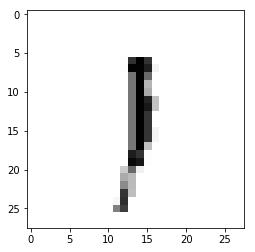

Epoch : 1 cost :  0.8197716106068003
Accuracy : 0.1319
label : [1]
Prediction : [0]


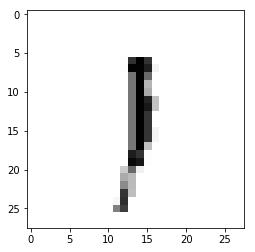

Epoch : 1 cost :  0.8239814446189185
Accuracy : 0.13
label : [1]
Prediction : [0]


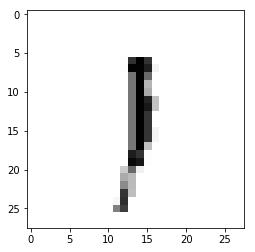

Epoch : 1 cost :  0.8281499273126774
Accuracy : 0.1306
label : [1]
Prediction : [0]


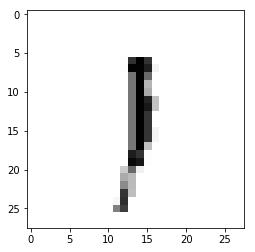

Epoch : 1 cost :  0.8323661479082973
Accuracy : 0.1316
label : [1]
Prediction : [0]


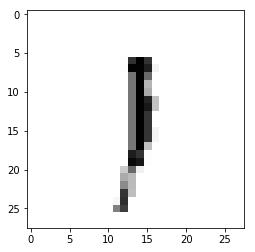

Epoch : 1 cost :  0.8365484411066227
Accuracy : 0.1307
label : [1]
Prediction : [0]


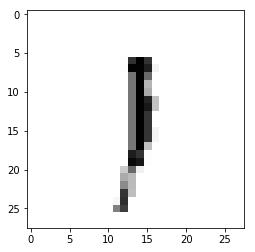

Epoch : 1 cost :  0.8407413231242785
Accuracy : 0.1308
label : [1]
Prediction : [0]


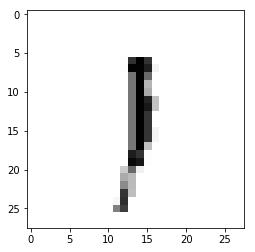

Epoch : 1 cost :  0.8449314611608331
Accuracy : 0.1307
label : [1]
Prediction : [0]


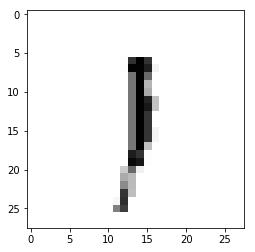

Epoch : 1 cost :  0.8491327515515413
Accuracy : 0.1294
label : [1]
Prediction : [0]


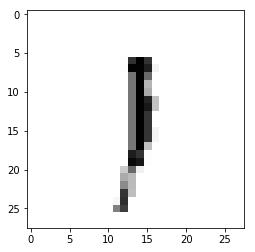

Epoch : 1 cost :  0.8533157010511918
Accuracy : 0.1321
label : [1]
Prediction : [0]


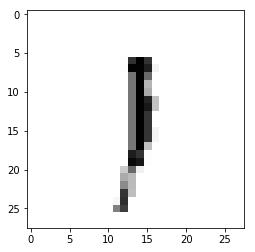

Epoch : 1 cost :  0.8575211130489002
Accuracy : 0.1313
label : [1]
Prediction : [0]


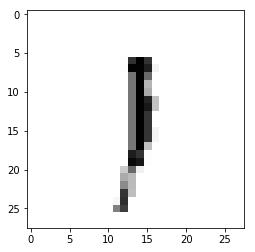

Epoch : 1 cost :  0.8617091330614957
Accuracy : 0.132
label : [1]
Prediction : [0]


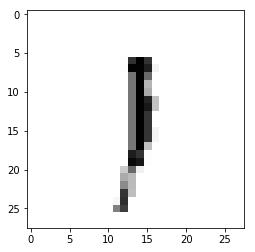

Epoch : 1 cost :  0.8658548012646762
Accuracy : 0.1346
label : [1]
Prediction : [0]


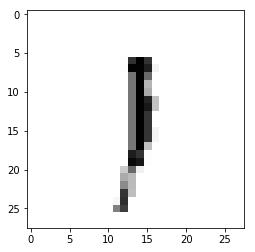

Epoch : 1 cost :  0.8700587008216164
Accuracy : 0.1363
label : [1]
Prediction : [0]


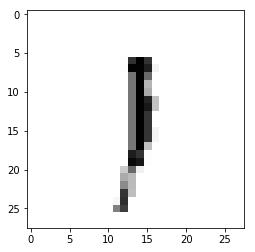

Epoch : 1 cost :  0.8742220800573175
Accuracy : 0.1357
label : [1]
Prediction : [0]


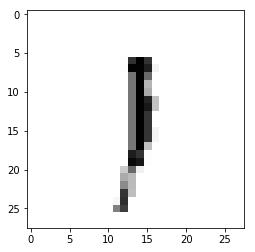

Epoch : 1 cost :  0.8784437378970059
Accuracy : 0.1346
label : [1]
Prediction : [0]


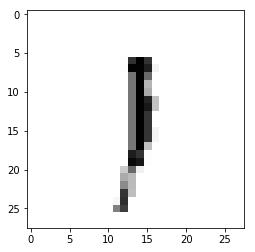

Epoch : 1 cost :  0.8825994695316661
Accuracy : 0.1351
label : [1]
Prediction : [0]


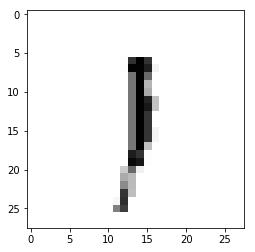

Epoch : 1 cost :  0.8867749058116566
Accuracy : 0.1355
label : [1]
Prediction : [0]


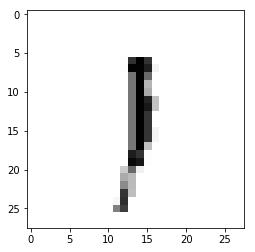

Epoch : 1 cost :  0.8909913011030718
Accuracy : 0.1364
label : [1]
Prediction : [0]


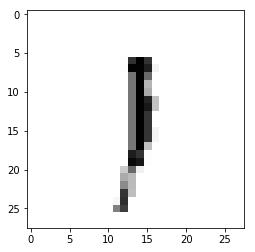

Epoch : 1 cost :  0.8951674808155408
Accuracy : 0.138
label : [1]
Prediction : [0]


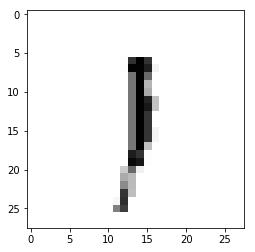

Epoch : 1 cost :  0.8993306467749856
Accuracy : 0.1357
label : [1]
Prediction : [0]


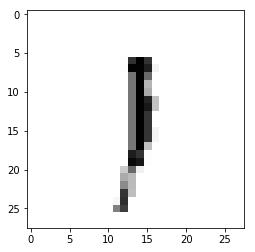

Epoch : 1 cost :  0.9035403312336315
Accuracy : 0.1355
label : [1]
Prediction : [0]


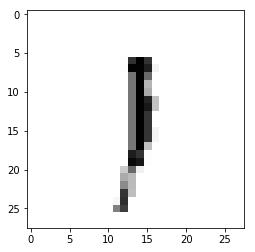

Epoch : 1 cost :  0.9077600440112028
Accuracy : 0.1359
label : [1]
Prediction : [0]


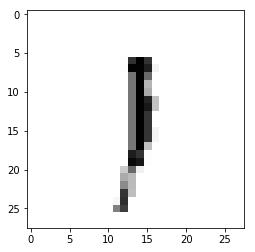

Epoch : 1 cost :  0.9119720714742487
Accuracy : 0.1357
label : [1]
Prediction : [0]


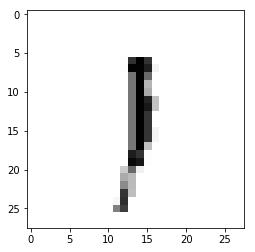

Epoch : 1 cost :  0.9161867211081766
Accuracy : 0.1388
label : [1]
Prediction : [0]


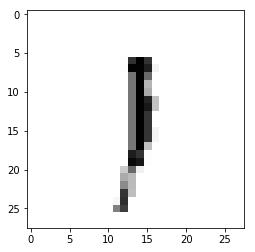

Epoch : 1 cost :  0.9203773784637452
Accuracy : 0.1377
label : [1]
Prediction : [0]


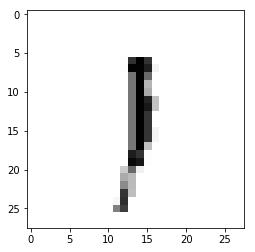

Epoch : 1 cost :  0.924546959183433
Accuracy : 0.1399
label : [1]
Prediction : [0]


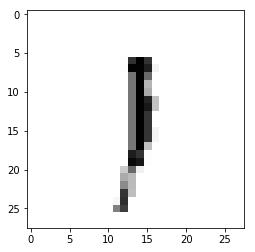

Epoch : 1 cost :  0.9287410588697955
Accuracy : 0.1407
label : [1]
Prediction : [0]


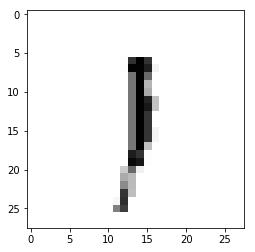

Epoch : 1 cost :  0.9329417553814976
Accuracy : 0.1399
label : [1]
Prediction : [0]


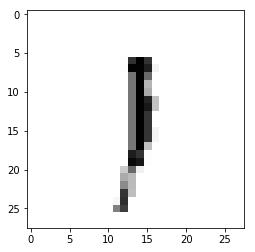

Epoch : 1 cost :  0.9371487686850809
Accuracy : 0.1368
label : [1]
Prediction : [0]


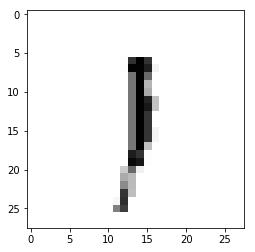

Epoch : 1 cost :  0.9413425692644988
Accuracy : 0.1377
label : [1]
Prediction : [0]


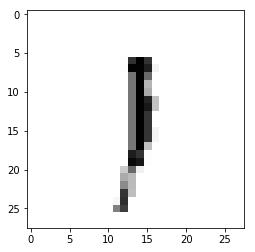

Epoch : 1 cost :  0.9455698351426559
Accuracy : 0.1389
label : [1]
Prediction : [0]


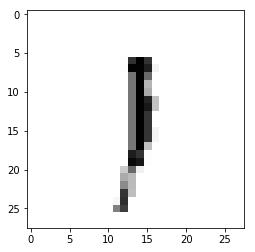

Epoch : 1 cost :  0.9497535727240823
Accuracy : 0.1398
label : [1]
Prediction : [0]


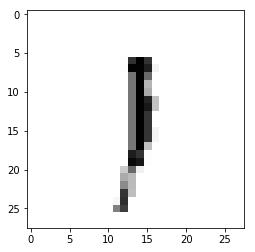

Epoch : 1 cost :  0.9539044809341432
Accuracy : 0.1357
label : [1]
Prediction : [0]


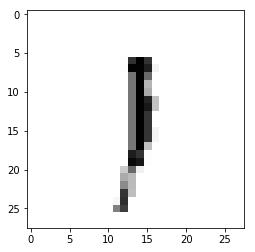

Epoch : 1 cost :  0.9580959311398594
Accuracy : 0.1397
label : [1]
Prediction : [0]


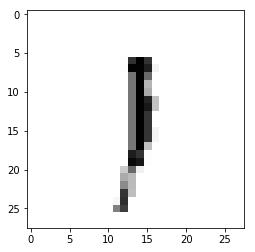

Epoch : 1 cost :  0.9623065987500278
Accuracy : 0.1376
label : [1]
Prediction : [0]


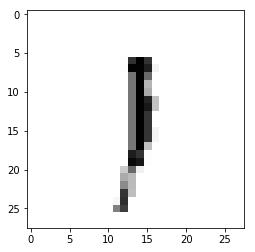

Epoch : 1 cost :  0.9664871176806363
Accuracy : 0.1348
label : [1]
Prediction : [0]


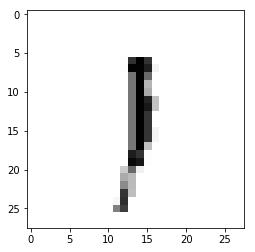

Epoch : 1 cost :  0.9706468933278865
Accuracy : 0.1355
label : [1]
Prediction : [0]


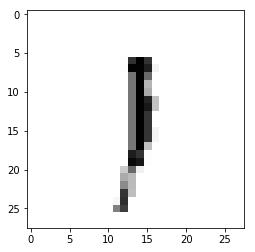

Epoch : 1 cost :  0.9748283785039729
Accuracy : 0.1335
label : [1]
Prediction : [0]


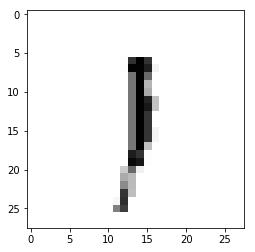

Epoch : 1 cost :  0.9790144465186379
Accuracy : 0.1315
label : [1]
Prediction : [0]


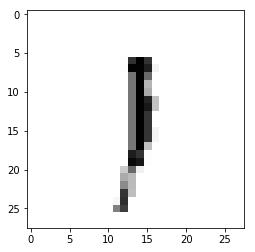

Epoch : 1 cost :  0.9831572667035189
Accuracy : 0.1317
label : [1]
Prediction : [0]


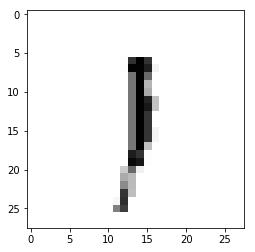

Epoch : 1 cost :  0.9873502852699972
Accuracy : 0.134
label : [1]
Prediction : [0]


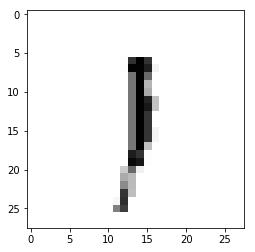

Epoch : 1 cost :  0.9915441348335958
Accuracy : 0.1317
label : [1]
Prediction : [0]


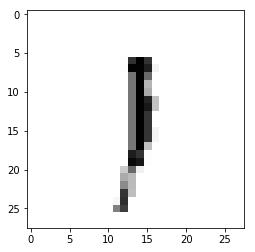

Epoch : 1 cost :  0.9957298907366664
Accuracy : 0.1259
label : [1]
Prediction : [0]


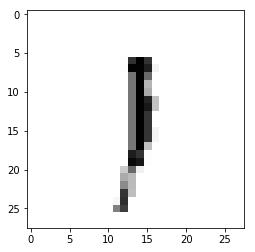

Epoch : 1 cost :  0.999909845265475
Accuracy : 0.1276
label : [1]
Prediction : [0]


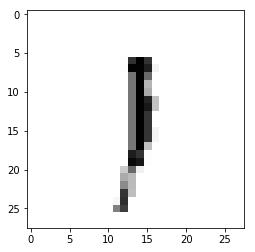

Epoch : 1 cost :  1.004101816957647
Accuracy : 0.1291
label : [1]
Prediction : [0]


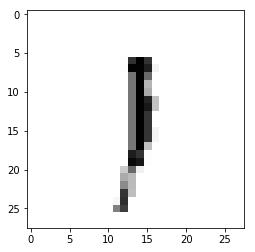

Epoch : 1 cost :  1.0082980589433148
Accuracy : 0.1338
label : [1]
Prediction : [0]


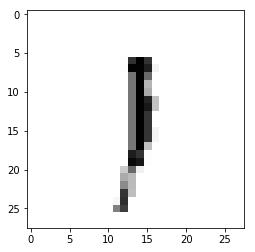

Epoch : 1 cost :  1.012445370934226
Accuracy : 0.1291
label : [1]
Prediction : [0]


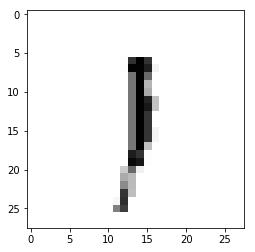

Epoch : 1 cost :  1.0166235906427554
Accuracy : 0.1269
label : [1]
Prediction : [0]


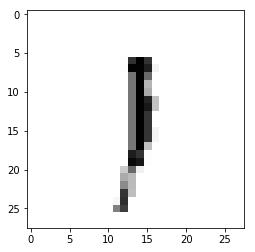

Epoch : 1 cost :  1.0208276016061955
Accuracy : 0.1264
label : [1]
Prediction : [0]


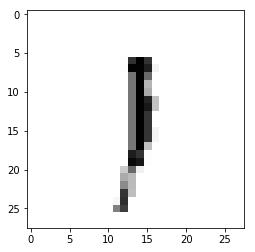

Epoch : 1 cost :  1.0250052868236192
Accuracy : 0.1263
label : [1]
Prediction : [0]


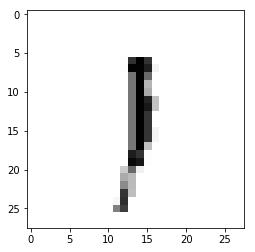

Epoch : 1 cost :  1.0292326749454843
Accuracy : 0.1264
label : [1]
Prediction : [0]


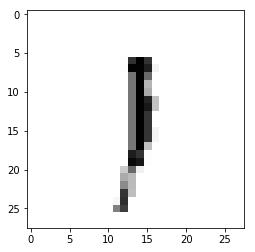

Epoch : 1 cost :  1.0334455875916913
Accuracy : 0.1255
label : [1]
Prediction : [0]


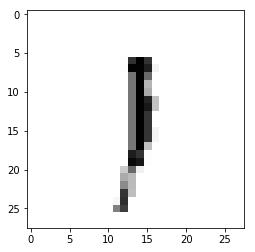

Epoch : 1 cost :  1.037624614455483
Accuracy : 0.1256
label : [1]
Prediction : [0]


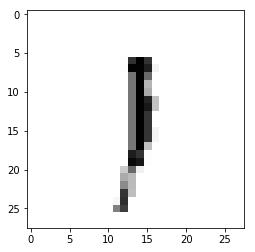

Epoch : 1 cost :  1.0417823895541103
Accuracy : 0.1252
label : [1]
Prediction : [0]


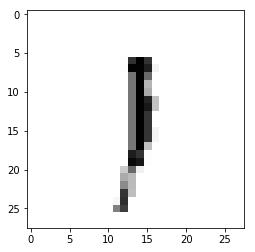

Epoch : 1 cost :  1.0459625131433659
Accuracy : 0.1253
label : [1]
Prediction : [0]


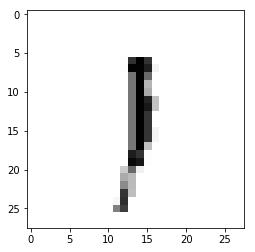

Epoch : 1 cost :  1.0501459901983086
Accuracy : 0.1256
label : [1]
Prediction : [0]


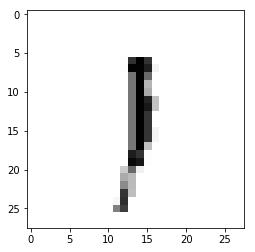

Epoch : 1 cost :  1.054330526698719
Accuracy : 0.1255
label : [1]
Prediction : [0]


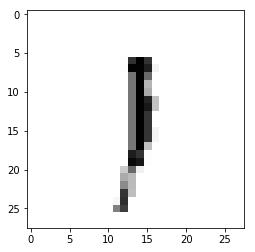

Epoch : 1 cost :  1.058492437275973
Accuracy : 0.1254
label : [1]
Prediction : [0]


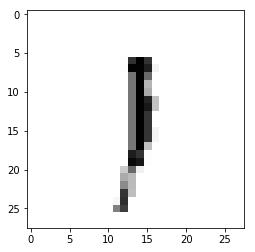

Epoch : 1 cost :  1.0626520460302178
Accuracy : 0.1249
label : [1]
Prediction : [0]


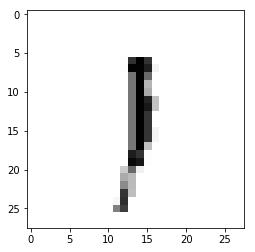

Epoch : 1 cost :  1.0668286349556662
Accuracy : 0.1237
label : [1]
Prediction : [0]


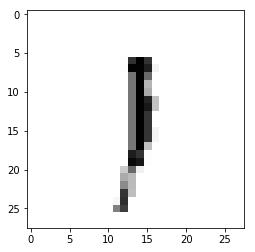

Epoch : 1 cost :  1.0710165223208339
Accuracy : 0.1243
label : [1]
Prediction : [0]


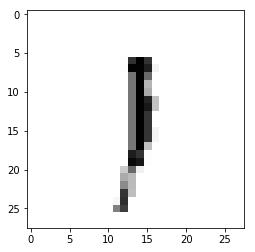

Epoch : 1 cost :  1.0752200451764191
Accuracy : 0.125
label : [1]
Prediction : [0]


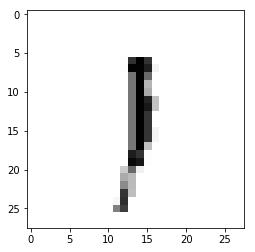

Epoch : 1 cost :  1.079382001269947
Accuracy : 0.1246
label : [1]
Prediction : [0]


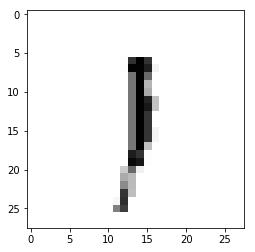

Epoch : 1 cost :  1.0835686289180406
Accuracy : 0.1249
label : [1]
Prediction : [0]


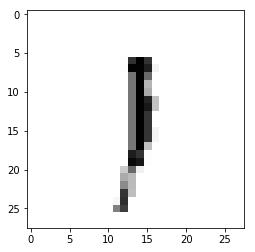

Epoch : 1 cost :  1.0877251906828445
Accuracy : 0.1243
label : [1]
Prediction : [0]


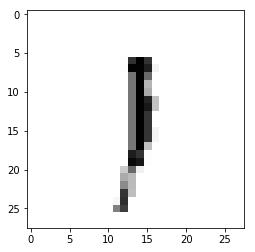

Epoch : 1 cost :  1.0918962452628393
Accuracy : 0.1239
label : [1]
Prediction : [0]


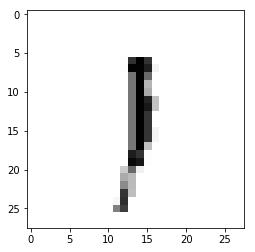

Epoch : 1 cost :  1.0960541456395927
Accuracy : 0.1236
label : [1]
Prediction : [0]


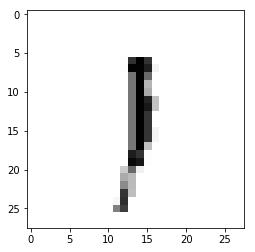

Epoch : 1 cost :  1.1002255929600107
Accuracy : 0.1254
label : [1]
Prediction : [0]


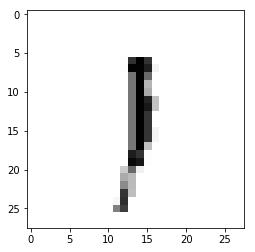

Epoch : 1 cost :  1.1044142497669565
Accuracy : 0.1251
label : [1]
Prediction : [0]


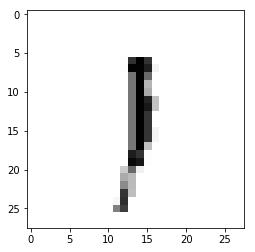

Epoch : 1 cost :  1.108618500015952
Accuracy : 0.1249
label : [1]
Prediction : [0]


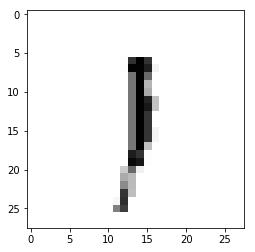

Epoch : 1 cost :  1.112788598754189
Accuracy : 0.1255
label : [1]
Prediction : [0]


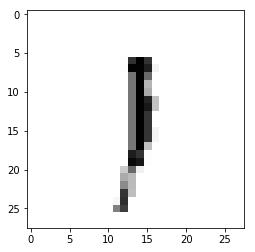

Epoch : 1 cost :  1.1169707818464798
Accuracy : 0.1254
label : [1]
Prediction : [0]


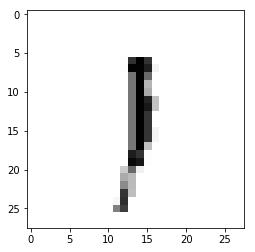

Epoch : 1 cost :  1.1211367533423682
Accuracy : 0.1251
label : [1]
Prediction : [0]


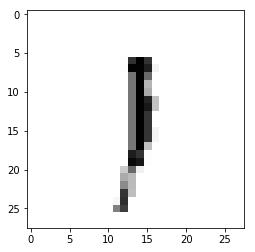

Epoch : 1 cost :  1.125326495170593
Accuracy : 0.1252
label : [1]
Prediction : [0]


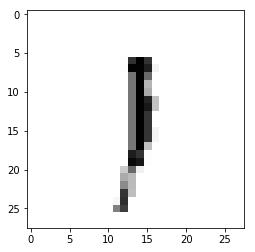

Epoch : 1 cost :  1.1295091052488844
Accuracy : 0.1248
label : [1]
Prediction : [0]


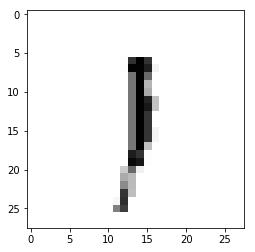

Epoch : 1 cost :  1.1337017224051733
Accuracy : 0.1216
label : [1]
Prediction : [0]


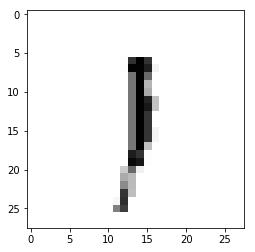

Epoch : 1 cost :  1.137909958145835
Accuracy : 0.1249
label : [1]
Prediction : [0]


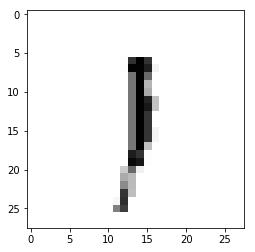

Epoch : 1 cost :  1.1420936120640146
Accuracy : 0.1246
label : [1]
Prediction : [0]


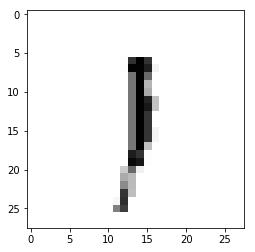

Epoch : 1 cost :  1.1462812523408368
Accuracy : 0.1248
label : [1]
Prediction : [0]


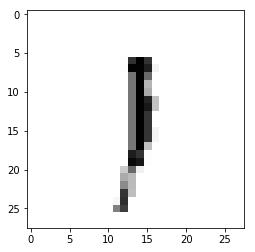

Epoch : 1 cost :  1.1504769897460936
Accuracy : 0.1262
label : [1]
Prediction : [0]


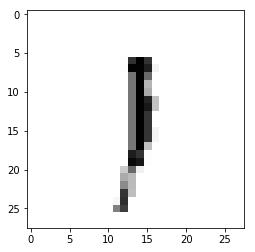

Epoch : 1 cost :  1.154667058424516
Accuracy : 0.1272
label : [1]
Prediction : [0]


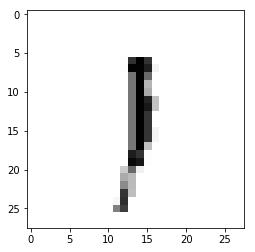

Epoch : 1 cost :  1.1588610809499567
Accuracy : 0.1307
label : [1]
Prediction : [0]


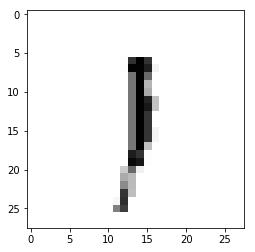

Epoch : 1 cost :  1.1630656138333406
Accuracy : 0.1331
label : [1]
Prediction : [0]


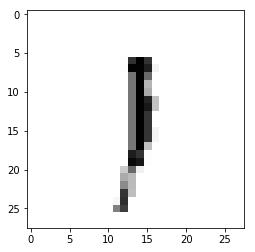

Epoch : 1 cost :  1.1672338693792168
Accuracy : 0.1273
label : [1]
Prediction : [0]


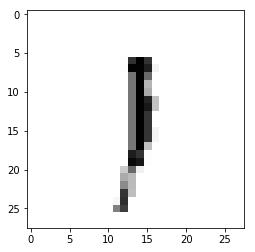

Epoch : 1 cost :  1.171382517814636
Accuracy : 0.1262
label : [1]
Prediction : [0]


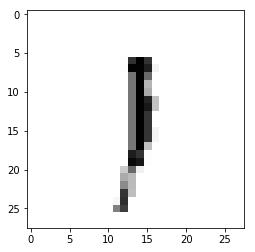

Epoch : 1 cost :  1.175579050237482
Accuracy : 0.1278
label : [1]
Prediction : [0]


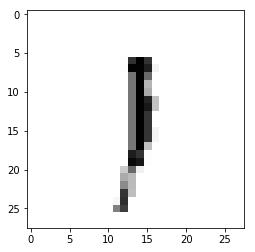

Epoch : 1 cost :  1.1797639482671562
Accuracy : 0.1254
label : [1]
Prediction : [0]


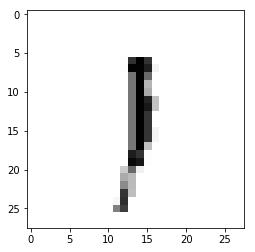

Epoch : 1 cost :  1.1839785588871348
Accuracy : 0.1247
label : [1]
Prediction : [0]


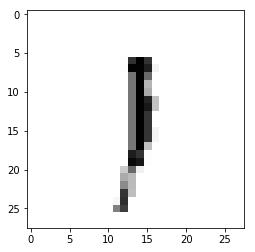

Epoch : 1 cost :  1.1881471057371658
Accuracy : 0.1251
label : [1]
Prediction : [0]


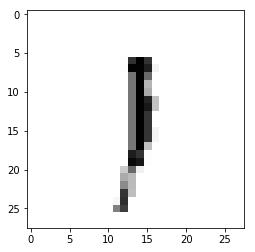

Epoch : 1 cost :  1.1923429827256633
Accuracy : 0.1241
label : [1]
Prediction : [0]


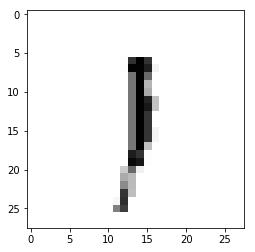

Epoch : 1 cost :  1.1965329547361891
Accuracy : 0.125
label : [1]
Prediction : [0]


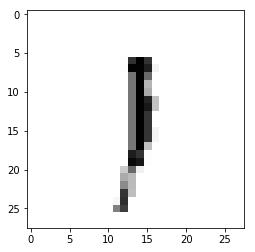

Epoch : 1 cost :  1.2007433938980099
Accuracy : 0.126
label : [1]
Prediction : [0]


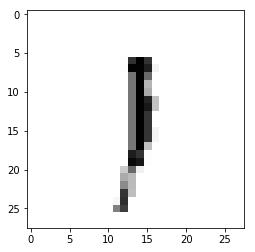

Epoch : 1 cost :  1.2049702939120202
Accuracy : 0.1271
label : [1]
Prediction : [0]


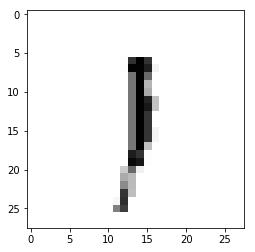

Epoch : 1 cost :  1.2091394138336178
Accuracy : 0.1258
label : [1]
Prediction : [0]


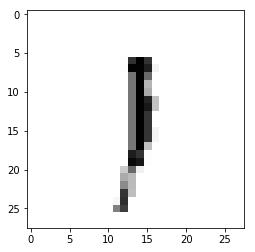

Epoch : 1 cost :  1.21332451690327
Accuracy : 0.1276
label : [1]
Prediction : [0]


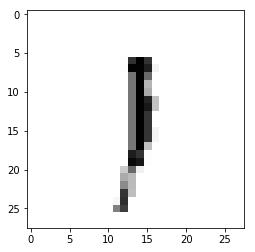

Epoch : 1 cost :  1.217518173998052
Accuracy : 0.1261
label : [1]
Prediction : [0]


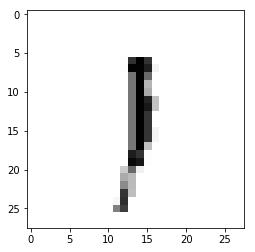

Epoch : 1 cost :  1.2216957920247855
Accuracy : 0.1253
label : [1]
Prediction : [0]


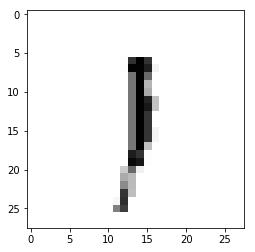

Epoch : 1 cost :  1.2258916594765399
Accuracy : 0.1255
label : [1]
Prediction : [0]


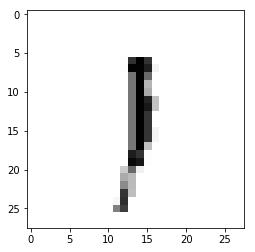

Epoch : 1 cost :  1.2300928662040014
Accuracy : 0.1258
label : [1]
Prediction : [0]


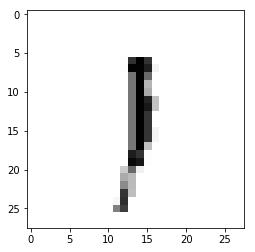

Epoch : 1 cost :  1.2342635592547326
Accuracy : 0.1242
label : [1]
Prediction : [0]


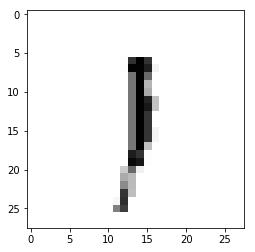

Epoch : 1 cost :  1.238448598601601
Accuracy : 0.125
label : [1]
Prediction : [0]


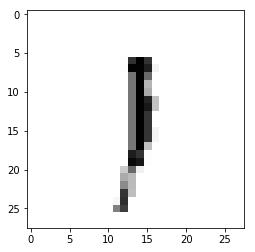

Epoch : 1 cost :  1.2425906268033111
Accuracy : 0.125
label : [1]
Prediction : [0]


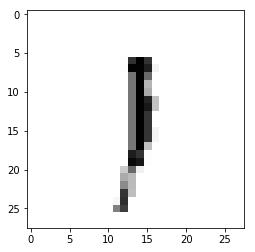

Epoch : 1 cost :  1.2467755621129812
Accuracy : 0.1258
label : [1]
Prediction : [0]


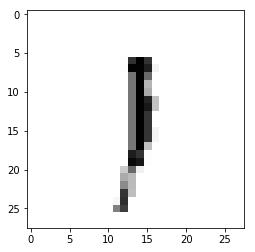

Epoch : 1 cost :  1.2509369897842404
Accuracy : 0.1242
label : [1]
Prediction : [0]


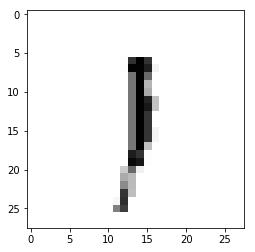

Epoch : 1 cost :  1.255125775337219
Accuracy : 0.1242
label : [1]
Prediction : [0]


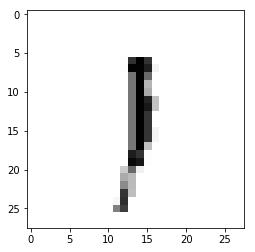

Epoch : 1 cost :  1.2592907940257676
Accuracy : 0.1241
label : [1]
Prediction : [0]


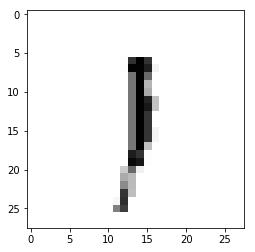

Epoch : 1 cost :  1.2634757995605466
Accuracy : 0.1237
label : [1]
Prediction : [0]


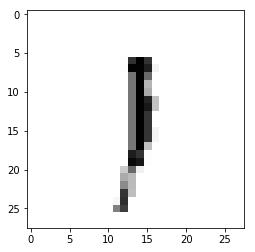

Epoch : 1 cost :  1.2676717394048513
Accuracy : 0.1237
label : [1]
Prediction : [0]


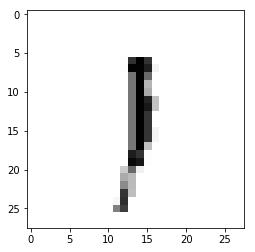

Epoch : 1 cost :  1.27185489134355
Accuracy : 0.1243
label : [1]
Prediction : [0]


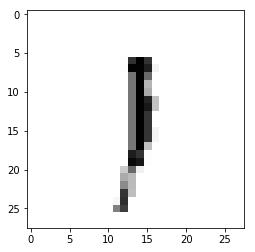

Epoch : 1 cost :  1.2760395301472054
Accuracy : 0.1244
label : [1]
Prediction : [0]


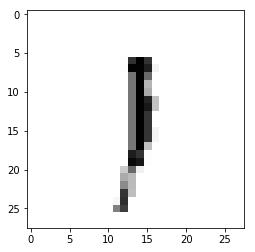

Epoch : 1 cost :  1.2802158065275708
Accuracy : 0.1247
label : [1]
Prediction : [0]


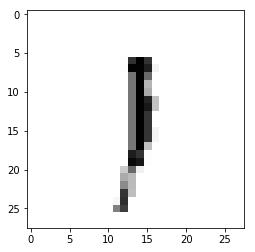

Epoch : 1 cost :  1.2844034498388113
Accuracy : 0.1239
label : [1]
Prediction : [0]


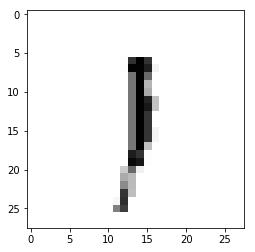

Epoch : 1 cost :  1.288593398007479
Accuracy : 0.1248
label : [1]
Prediction : [0]


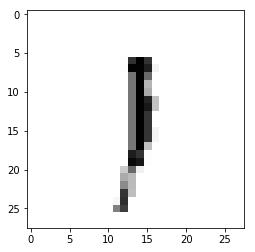

Epoch : 1 cost :  1.2927709583802651
Accuracy : 0.1258
label : [1]
Prediction : [0]


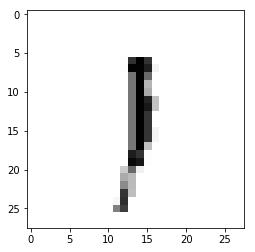

Epoch : 1 cost :  1.2969671049985012
Accuracy : 0.1251
label : [1]
Prediction : [0]


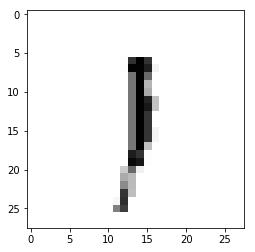

Epoch : 1 cost :  1.3011492113633583
Accuracy : 0.1244
label : [1]
Prediction : [0]


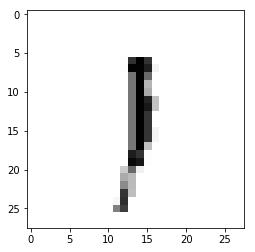

Epoch : 1 cost :  1.3053242999857115
Accuracy : 0.1244
label : [1]
Prediction : [0]


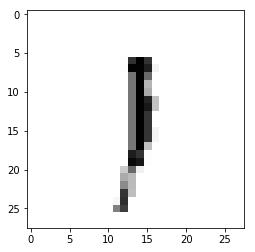

Epoch : 1 cost :  1.3094660334153603
Accuracy : 0.1226
label : [1]
Prediction : [0]


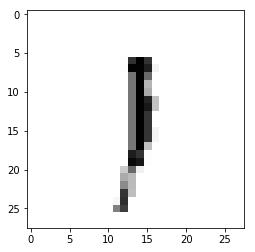

Epoch : 1 cost :  1.3136329815604464
Accuracy : 0.1217
label : [1]
Prediction : [0]


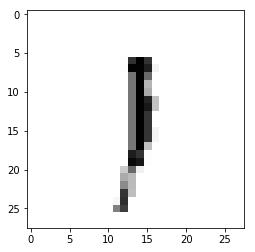

Epoch : 1 cost :  1.3178224906054403
Accuracy : 0.1218
label : [1]
Prediction : [0]


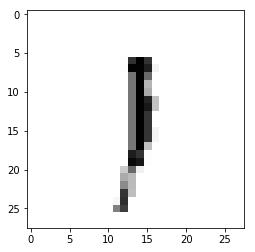

Epoch : 1 cost :  1.3220125753229308
Accuracy : 0.1234
label : [1]
Prediction : [0]


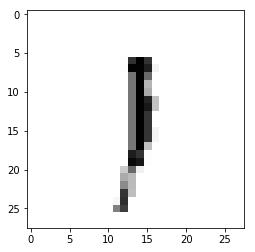

Epoch : 1 cost :  1.3262060226093633
Accuracy : 0.1242
label : [1]
Prediction : [0]


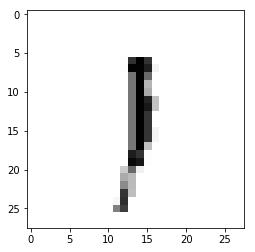

Epoch : 1 cost :  1.3303689228404645
Accuracy : 0.1246
label : [1]
Prediction : [0]


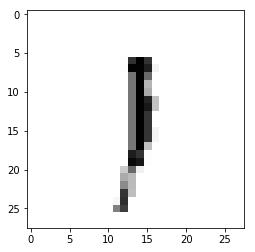

Epoch : 1 cost :  1.3345402461832212
Accuracy : 0.1246
label : [1]
Prediction : [0]


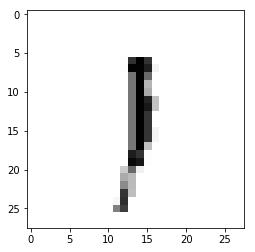

Epoch : 1 cost :  1.3387219077890562
Accuracy : 0.1246
label : [1]
Prediction : [0]


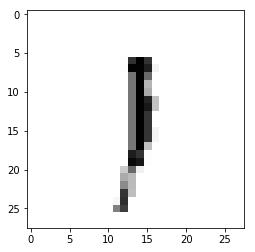

Epoch : 1 cost :  1.3429288651726454
Accuracy : 0.1267
label : [1]
Prediction : [0]


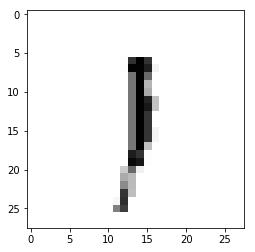

Epoch : 1 cost :  1.34710482597351
Accuracy : 0.1272
label : [1]
Prediction : [0]


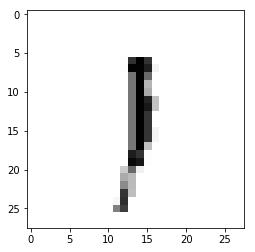

Epoch : 1 cost :  1.3512742389332155
Accuracy : 0.129
label : [1]
Prediction : [0]


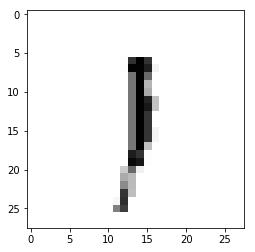

Epoch : 1 cost :  1.3554346383701663
Accuracy : 0.1286
label : [1]
Prediction : [0]


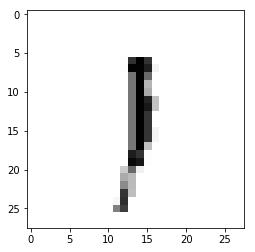

Epoch : 1 cost :  1.3596199997988605
Accuracy : 0.1296
label : [1]
Prediction : [0]


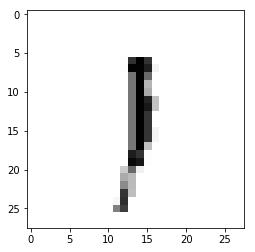

Epoch : 1 cost :  1.3638015595349389
Accuracy : 0.1302
label : [1]
Prediction : [0]


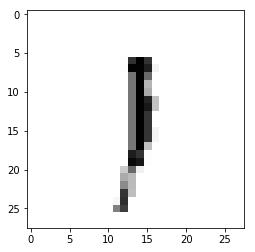

Epoch : 1 cost :  1.3679993963241568
Accuracy : 0.1295
label : [1]
Prediction : [0]


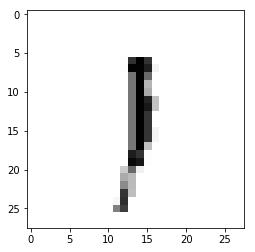

Epoch : 1 cost :  1.3721847200393666
Accuracy : 0.1304
label : [1]
Prediction : [0]


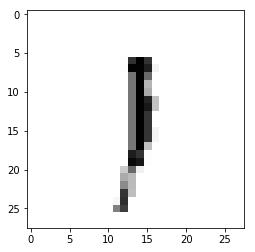

Epoch : 1 cost :  1.376342581835659
Accuracy : 0.1299
label : [1]
Prediction : [0]


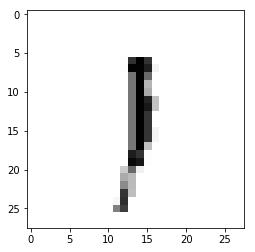

Epoch : 1 cost :  1.3805113619024092
Accuracy : 0.1294
label : [1]
Prediction : [0]


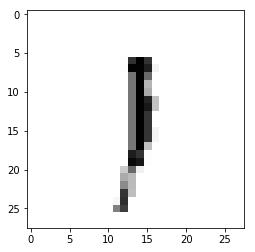

Epoch : 1 cost :  1.384683277823707
Accuracy : 0.1287
label : [1]
Prediction : [0]


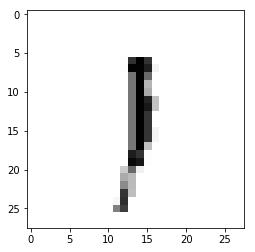

Epoch : 1 cost :  1.3888642168045031
Accuracy : 0.1295
label : [1]
Prediction : [0]


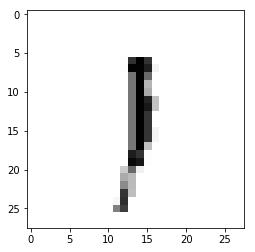

Epoch : 1 cost :  1.3930302151766678
Accuracy : 0.1277
label : [1]
Prediction : [0]


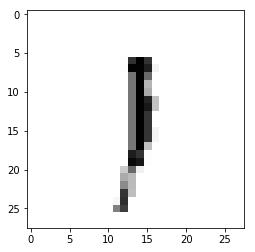

Epoch : 1 cost :  1.3972172767465754
Accuracy : 0.1254
label : [1]
Prediction : [0]


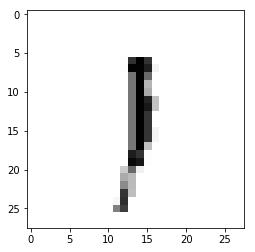

Epoch : 1 cost :  1.4013769089091896
Accuracy : 0.1252
label : [1]
Prediction : [0]


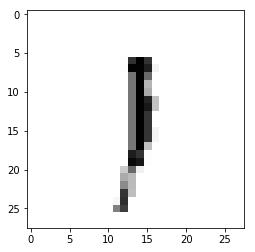

Epoch : 1 cost :  1.4055507256767956
Accuracy : 0.1262
label : [1]
Prediction : [0]


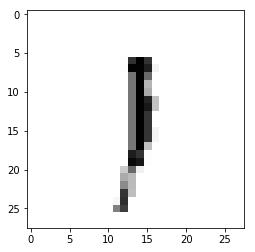

Epoch : 1 cost :  1.4096901854601762
Accuracy : 0.1278
label : [1]
Prediction : [0]


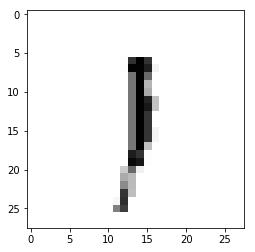

Epoch : 1 cost :  1.4138594323938531
Accuracy : 0.1279
label : [1]
Prediction : [0]


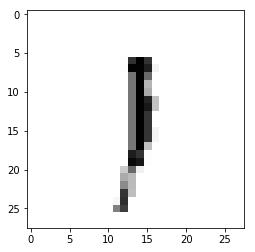

Epoch : 1 cost :  1.4180606538599176
Accuracy : 0.1255
label : [1]
Prediction : [0]


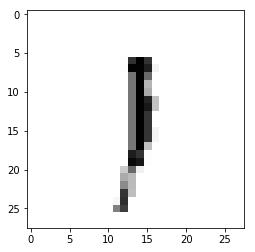

Epoch : 1 cost :  1.4222397661209094
Accuracy : 0.1246
label : [1]
Prediction : [0]


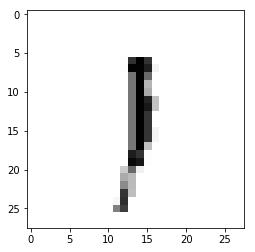

Epoch : 1 cost :  1.426398349675264
Accuracy : 0.1246
label : [1]
Prediction : [0]


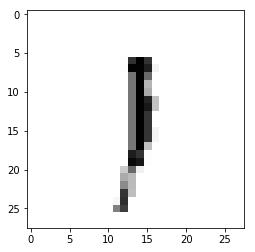

Epoch : 1 cost :  1.4305792422728092
Accuracy : 0.1251
label : [1]
Prediction : [0]


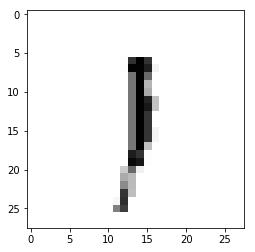

Epoch : 1 cost :  1.4347448821501285
Accuracy : 0.1272
label : [1]
Prediction : [0]


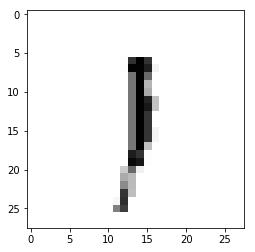

Epoch : 1 cost :  1.4389309805089765
Accuracy : 0.1266
label : [1]
Prediction : [0]


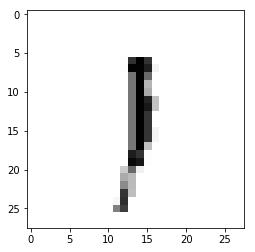

Epoch : 1 cost :  1.443113663846795
Accuracy : 0.1268
label : [1]
Prediction : [0]


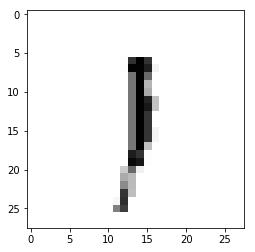

Epoch : 1 cost :  1.447296559593893
Accuracy : 0.1276
label : [1]
Prediction : [0]


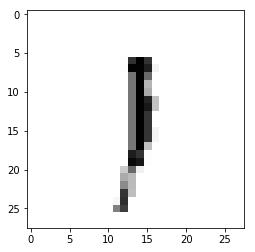

Epoch : 1 cost :  1.4514428320797994
Accuracy : 0.1265
label : [1]
Prediction : [0]


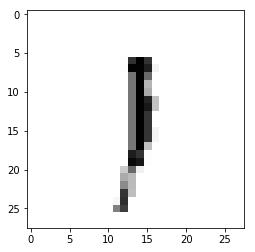

Epoch : 1 cost :  1.4556243423982087
Accuracy : 0.127
label : [1]
Prediction : [0]


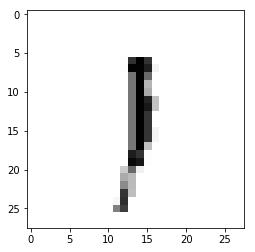

Epoch : 1 cost :  1.4597796531157048
Accuracy : 0.1251
label : [1]
Prediction : [0]


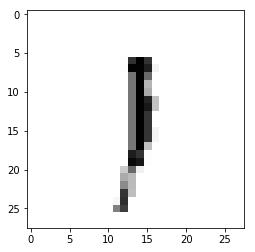

Epoch : 1 cost :  1.4639443883028884
Accuracy : 0.1263
label : [1]
Prediction : [0]


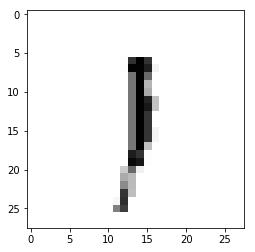

Epoch : 1 cost :  1.4681445091420942
Accuracy : 0.1267
label : [1]
Prediction : [0]


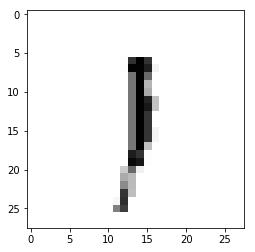

Epoch : 1 cost :  1.4723281145095812
Accuracy : 0.1279
label : [1]
Prediction : [0]


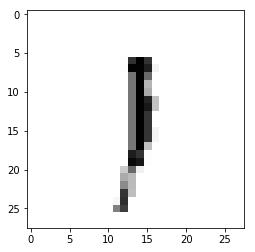

Epoch : 1 cost :  1.4765038095821021
Accuracy : 0.1281
label : [1]
Prediction : [0]


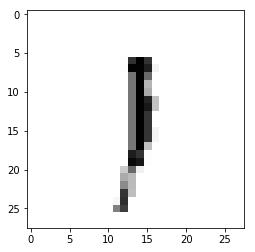

Epoch : 1 cost :  1.4806777832724818
Accuracy : 0.1278
label : [1]
Prediction : [0]


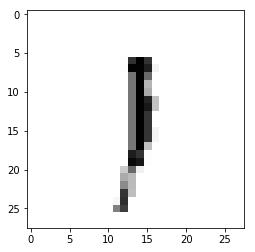

Epoch : 1 cost :  1.4848703323711034
Accuracy : 0.1301
label : [1]
Prediction : [0]


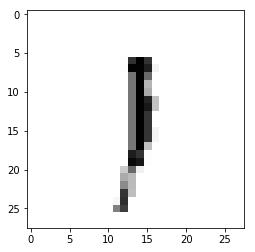

Epoch : 1 cost :  1.4890459156036362
Accuracy : 0.1292
label : [1]
Prediction : [0]


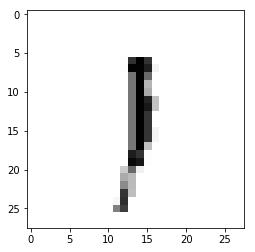

Epoch : 1 cost :  1.493248790827663
Accuracy : 0.1285
label : [1]
Prediction : [0]


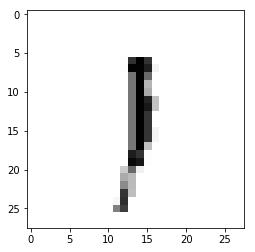

Epoch : 1 cost :  1.497438660534944
Accuracy : 0.1286
label : [1]
Prediction : [0]


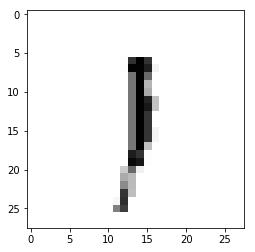

Epoch : 1 cost :  1.501639970866115
Accuracy : 0.1296
label : [1]
Prediction : [0]


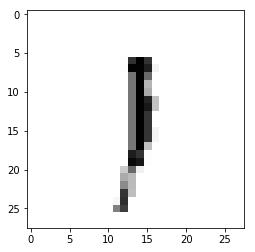

Epoch : 1 cost :  1.5058194242824192
Accuracy : 0.1287
label : [1]
Prediction : [0]


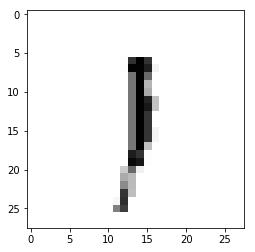

Epoch : 1 cost :  1.5100011236017385
Accuracy : 0.1298
label : [1]
Prediction : [0]


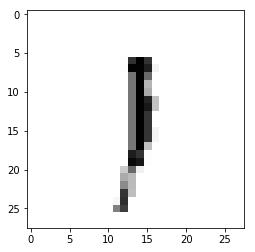

Epoch : 1 cost :  1.5141352354396458
Accuracy : 0.1295
label : [1]
Prediction : [0]


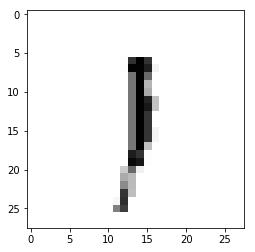

Epoch : 1 cost :  1.5183255676789702
Accuracy : 0.1294
label : [1]
Prediction : [0]


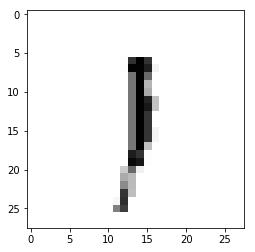

Epoch : 1 cost :  1.52248723333532
Accuracy : 0.1304
label : [1]
Prediction : [0]


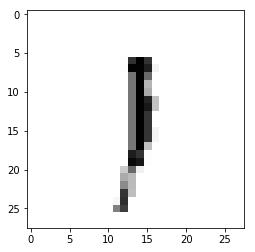

Epoch : 1 cost :  1.526681830232792
Accuracy : 0.1304
label : [1]
Prediction : [0]


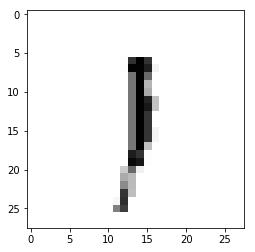

Epoch : 1 cost :  1.5308684682846054
Accuracy : 0.1305
label : [1]
Prediction : [0]


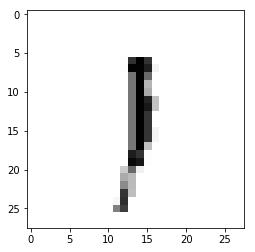

Epoch : 1 cost :  1.5350571493668974
Accuracy : 0.1311
label : [1]
Prediction : [0]


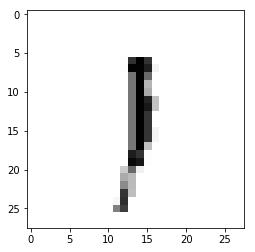

Epoch : 1 cost :  1.539228762713344
Accuracy : 0.1321
label : [1]
Prediction : [0]


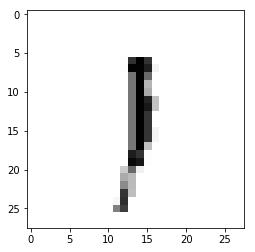

Epoch : 1 cost :  1.5433953770724194
Accuracy : 0.1329
label : [1]
Prediction : [0]


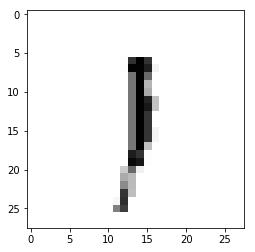

Epoch : 1 cost :  1.5475651845065015
Accuracy : 0.1324
label : [1]
Prediction : [0]


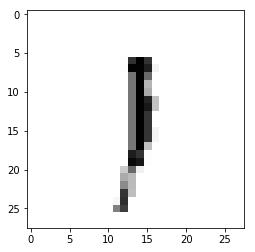

Epoch : 1 cost :  1.5517232396385872
Accuracy : 0.1319
label : [1]
Prediction : [0]


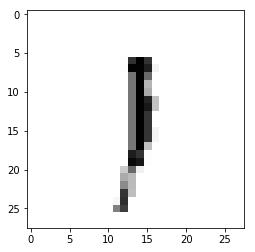

Epoch : 1 cost :  1.5559064115177486
Accuracy : 0.1295
label : [1]
Prediction : [0]


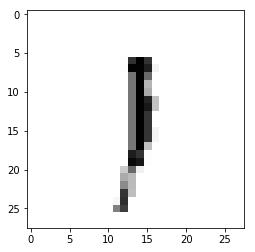

Epoch : 1 cost :  1.5600997031818722
Accuracy : 0.1294
label : [1]
Prediction : [0]


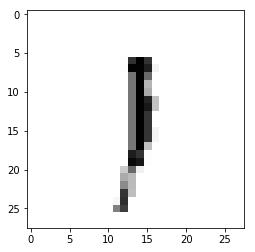

Epoch : 1 cost :  1.5642599517648856
Accuracy : 0.1299
label : [1]
Prediction : [0]


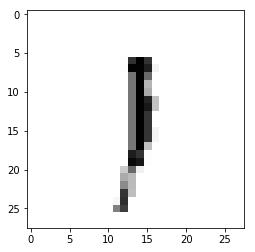

Epoch : 1 cost :  1.5684482587467528
Accuracy : 0.1275
label : [1]
Prediction : [0]


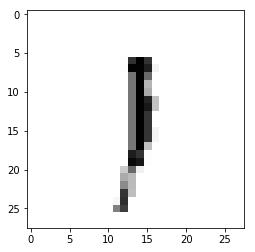

Epoch : 1 cost :  1.5726554046977637
Accuracy : 0.1302
label : [1]
Prediction : [0]


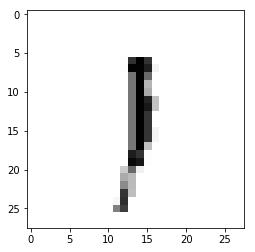

Epoch : 1 cost :  1.5768362032283423
Accuracy : 0.1315
label : [1]
Prediction : [0]


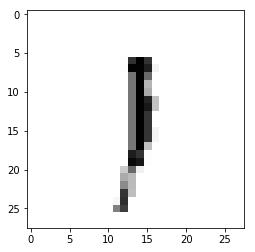

Epoch : 1 cost :  1.5809843054684711
Accuracy : 0.1309
label : [1]
Prediction : [0]


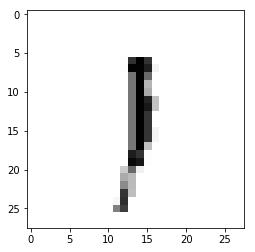

Epoch : 1 cost :  1.5851543092727647
Accuracy : 0.1296
label : [1]
Prediction : [0]


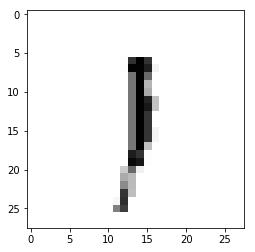

Epoch : 1 cost :  1.5893055035851205
Accuracy : 0.129
label : [1]
Prediction : [0]


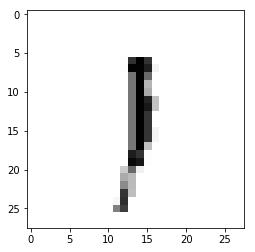

Epoch : 1 cost :  1.5934836578369127
Accuracy : 0.1255
label : [1]
Prediction : [0]


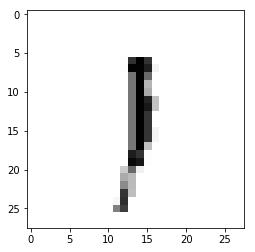

Epoch : 1 cost :  1.5976368774067258
Accuracy : 0.1293
label : [1]
Prediction : [0]


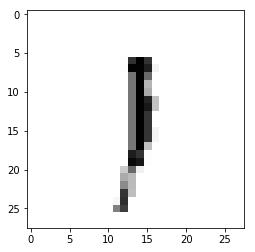

Epoch : 1 cost :  1.601804090846667
Accuracy : 0.1315
label : [1]
Prediction : [0]


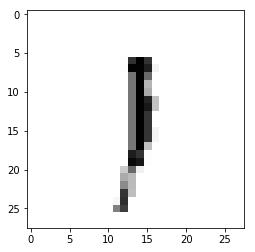

Epoch : 1 cost :  1.6059513191743315
Accuracy : 0.1301
label : [1]
Prediction : [0]


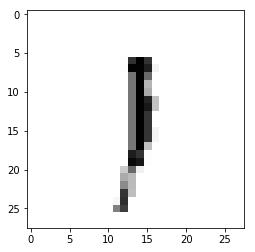

Epoch : 1 cost :  1.6101250184666012
Accuracy : 0.1298
label : [1]
Prediction : [0]


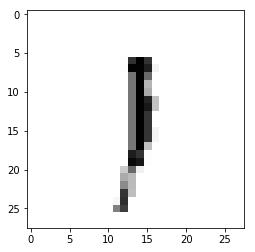

Epoch : 1 cost :  1.6143047809600815
Accuracy : 0.131
label : [1]
Prediction : [0]


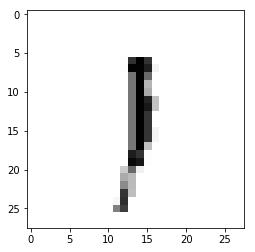

Epoch : 1 cost :  1.6184895151311685
Accuracy : 0.1318
label : [1]
Prediction : [0]


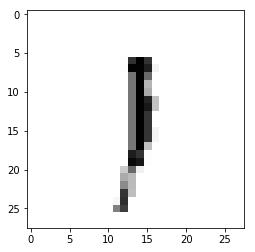

Epoch : 1 cost :  1.6226741214231994
Accuracy : 0.1323
label : [1]
Prediction : [0]


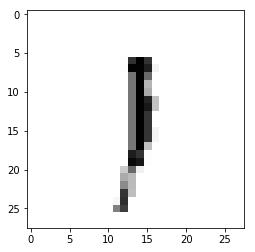

Epoch : 1 cost :  1.626845122250642
Accuracy : 0.1325
label : [1]
Prediction : [0]


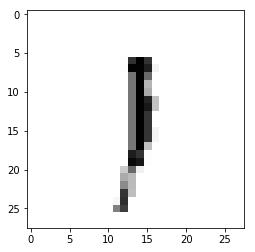

Epoch : 1 cost :  1.6310392943295549
Accuracy : 0.1341
label : [1]
Prediction : [0]


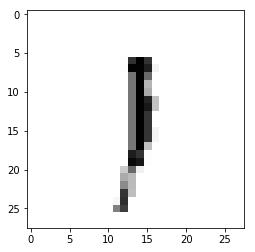

Epoch : 1 cost :  1.635222331393847
Accuracy : 0.1325
label : [1]
Prediction : [0]


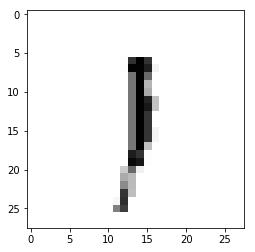

Epoch : 1 cost :  1.6393698805028725
Accuracy : 0.1333
label : [1]
Prediction : [0]


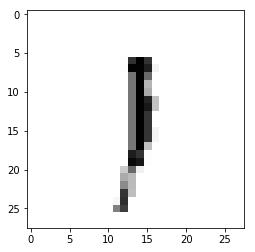

Epoch : 1 cost :  1.6435548756339315
Accuracy : 0.1341
label : [1]
Prediction : [0]


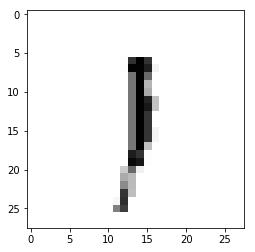

Epoch : 1 cost :  1.647736074707723
Accuracy : 0.133
label : [1]
Prediction : [0]


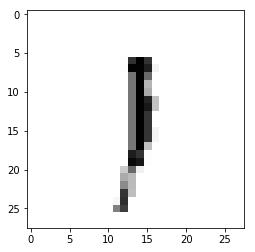

Epoch : 1 cost :  1.6518996060978264
Accuracy : 0.1336
label : [1]
Prediction : [0]


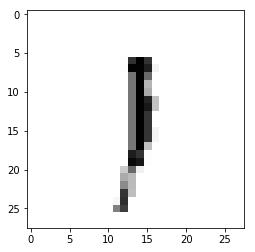

Epoch : 1 cost :  1.6560662399638764
Accuracy : 0.1332
label : [1]
Prediction : [0]


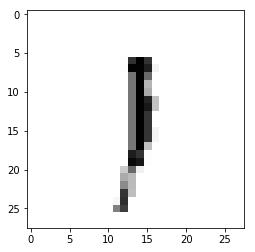

Epoch : 1 cost :  1.6602352129329316
Accuracy : 0.1322
label : [1]
Prediction : [0]


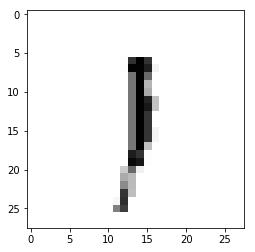

Epoch : 1 cost :  1.6644539637999083
Accuracy : 0.1304
label : [1]
Prediction : [0]


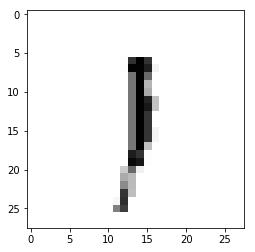

Epoch : 1 cost :  1.6686322259902935
Accuracy : 0.1279
label : [1]
Prediction : [0]


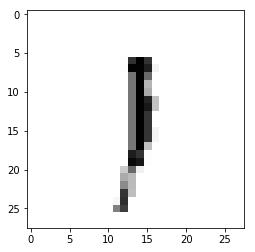

Epoch : 1 cost :  1.6728160389986886
Accuracy : 0.1284
label : [1]
Prediction : [0]


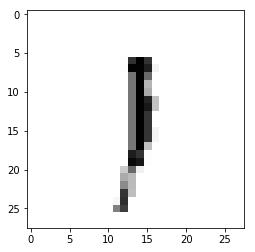

Epoch : 1 cost :  1.6769985870881494
Accuracy : 0.1304
label : [1]
Prediction : [0]


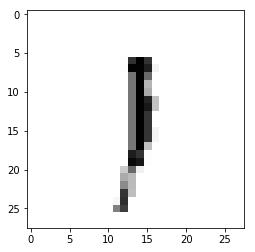

Epoch : 1 cost :  1.6811828617616114
Accuracy : 0.1277
label : [1]
Prediction : [0]


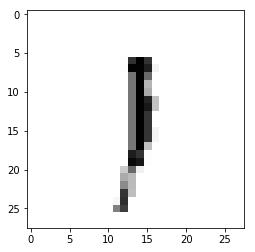

Epoch : 1 cost :  1.6853477092222715
Accuracy : 0.1255
label : [1]
Prediction : [0]


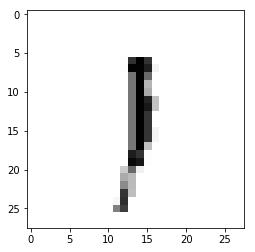

Epoch : 1 cost :  1.6895017602226932
Accuracy : 0.1259
label : [1]
Prediction : [0]


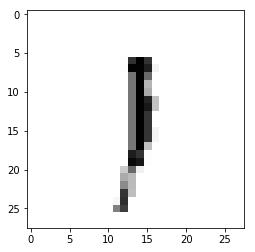

Epoch : 1 cost :  1.6936695792458254
Accuracy : 0.1291
label : [1]
Prediction : [0]


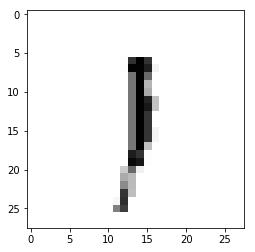

Epoch : 1 cost :  1.6978719702633924
Accuracy : 0.1293
label : [1]
Prediction : [0]


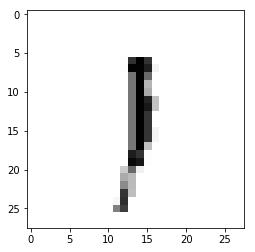

Epoch : 1 cost :  1.702044359553942
Accuracy : 0.1305
label : [1]
Prediction : [0]


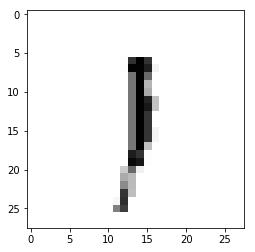

Epoch : 1 cost :  1.7062274039875358
Accuracy : 0.1294
label : [1]
Prediction : [0]


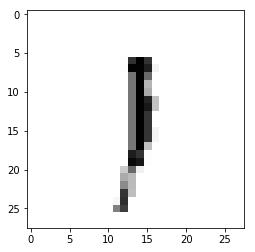

Epoch : 1 cost :  1.7103916623375612
Accuracy : 0.1258
label : [1]
Prediction : [0]


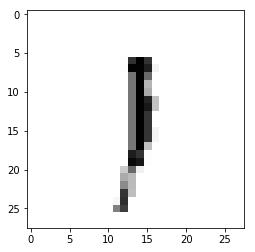

Epoch : 1 cost :  1.7145717633854238
Accuracy : 0.1249
label : [1]
Prediction : [0]


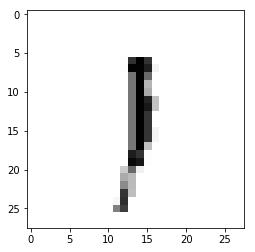

Epoch : 1 cost :  1.718791059580714
Accuracy : 0.1251
label : [1]
Prediction : [0]


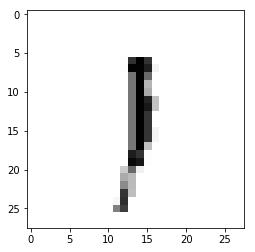

Epoch : 1 cost :  1.72296515334736
Accuracy : 0.1249
label : [1]
Prediction : [0]


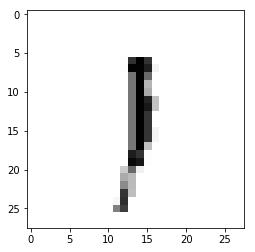

Epoch : 1 cost :  1.7271415025537642
Accuracy : 0.126
label : [1]
Prediction : [0]


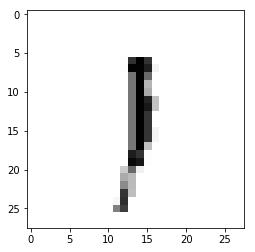

Epoch : 1 cost :  1.7313127417997858
Accuracy : 0.1253
label : [1]
Prediction : [0]


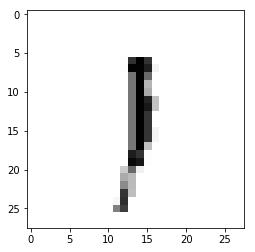

Epoch : 1 cost :  1.7355020882866576
Accuracy : 0.1257
label : [1]
Prediction : [0]


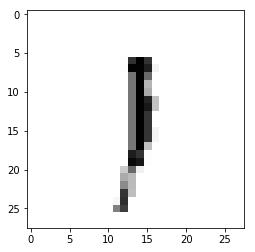

Epoch : 1 cost :  1.7396800782463744
Accuracy : 0.1281
label : [1]
Prediction : [0]


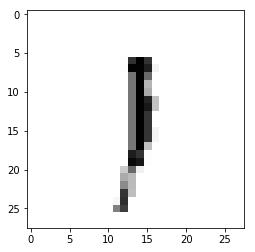

Epoch : 1 cost :  1.7438509546626675
Accuracy : 0.1284
label : [1]
Prediction : [0]


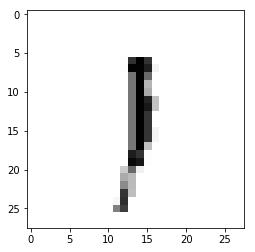

Epoch : 1 cost :  1.7480413944070967
Accuracy : 0.129
label : [1]
Prediction : [0]


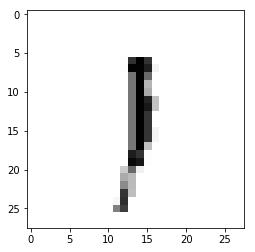

Epoch : 1 cost :  1.7522082060033604
Accuracy : 0.1294
label : [1]
Prediction : [0]


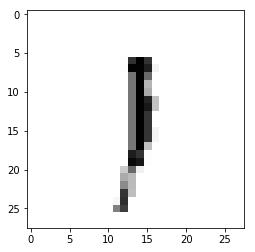

Epoch : 1 cost :  1.756405825614927
Accuracy : 0.1293
label : [1]
Prediction : [0]


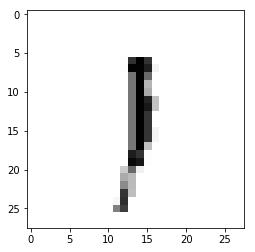

Epoch : 1 cost :  1.7605724152651678
Accuracy : 0.1289
label : [1]
Prediction : [0]


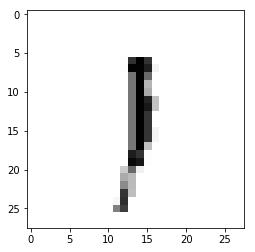

Epoch : 1 cost :  1.76476052414287
Accuracy : 0.1298
label : [1]
Prediction : [0]


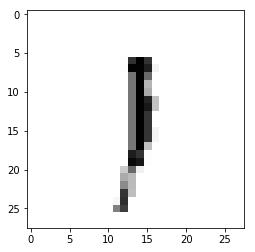

Epoch : 1 cost :  1.7689192130348879
Accuracy : 0.1269
label : [1]
Prediction : [0]


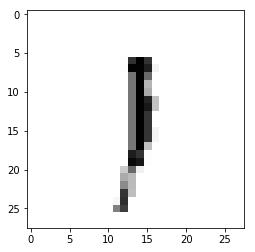

Epoch : 1 cost :  1.7730901739814044
Accuracy : 0.1279
label : [1]
Prediction : [0]


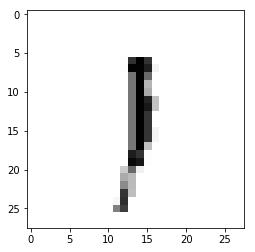

Epoch : 1 cost :  1.7772357511520365
Accuracy : 0.129
label : [1]
Prediction : [0]


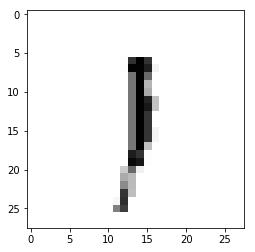

Epoch : 1 cost :  1.7814263274452882
Accuracy : 0.1308
label : [1]
Prediction : [0]


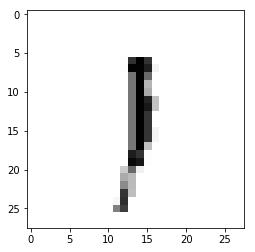

Epoch : 1 cost :  1.7855858555707043
Accuracy : 0.1318
label : [1]
Prediction : [0]


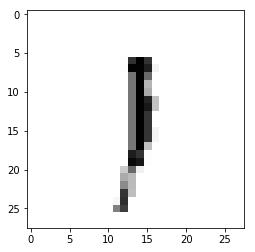

Epoch : 1 cost :  1.789763956069944
Accuracy : 0.1301
label : [1]
Prediction : [0]


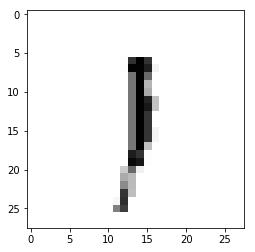

Epoch : 1 cost :  1.7939360857009865
Accuracy : 0.1301
label : [1]
Prediction : [0]


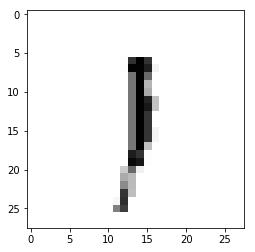

Epoch : 1 cost :  1.7980989421497668
Accuracy : 0.1329
label : [1]
Prediction : [0]


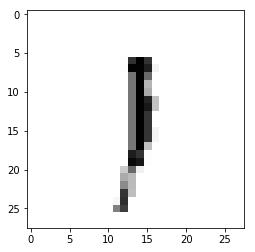

Epoch : 1 cost :  1.8022727745229525
Accuracy : 0.1312
label : [1]
Prediction : [0]


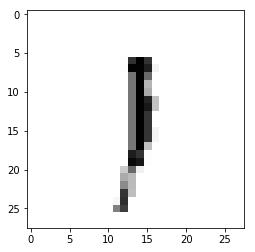

Epoch : 1 cost :  1.8064616211977849
Accuracy : 0.1328
label : [1]
Prediction : [0]


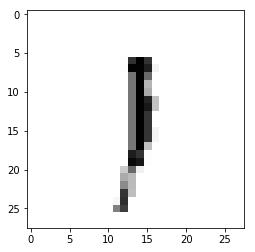

Epoch : 1 cost :  1.8106390315836103
Accuracy : 0.1317
label : [1]
Prediction : [0]


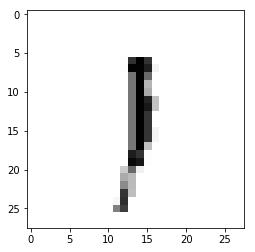

Epoch : 1 cost :  1.8148095048557604
Accuracy : 0.1305
label : [1]
Prediction : [0]


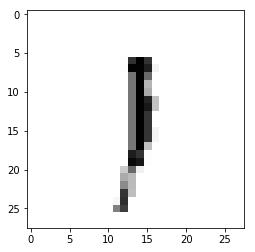

Epoch : 1 cost :  1.8189828716624843
Accuracy : 0.1304
label : [1]
Prediction : [0]


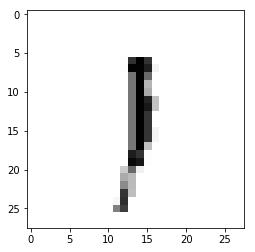

Epoch : 1 cost :  1.8231547849828522
Accuracy : 0.1302
label : [1]
Prediction : [0]


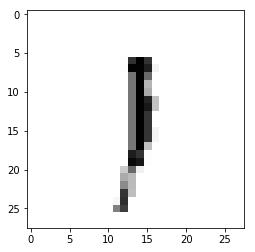

Epoch : 1 cost :  1.8273433841358506
Accuracy : 0.1305
label : [1]
Prediction : [0]


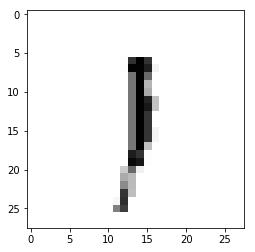

Epoch : 1 cost :  1.8315187350186408
Accuracy : 0.1295
label : [1]
Prediction : [0]


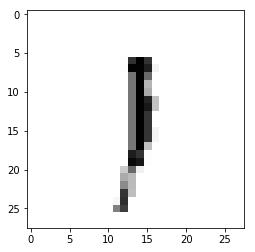

Epoch : 1 cost :  1.8357160750302375
Accuracy : 0.1291
label : [1]
Prediction : [0]


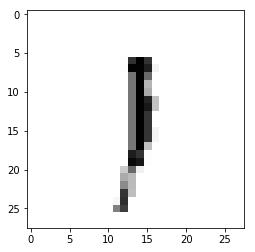

Epoch : 1 cost :  1.8399112172560232
Accuracy : 0.1296
label : [1]
Prediction : [0]


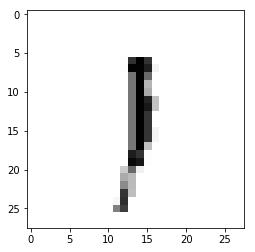

Epoch : 1 cost :  1.844101317145605
Accuracy : 0.1315
label : [1]
Prediction : [0]


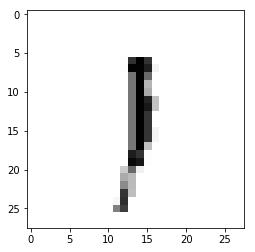

Epoch : 1 cost :  1.8482756614685032
Accuracy : 0.1331
label : [1]
Prediction : [0]


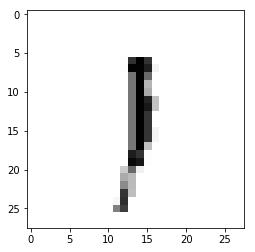

Epoch : 1 cost :  1.8524320680444863
Accuracy : 0.1316
label : [1]
Prediction : [0]


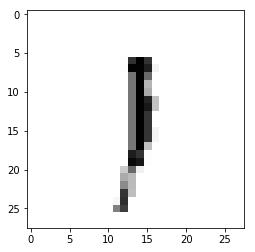

Epoch : 1 cost :  1.856610501029272
Accuracy : 0.133
label : [1]
Prediction : [0]


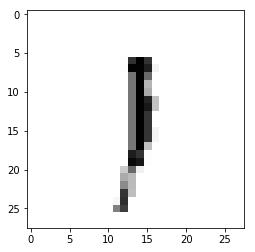

Epoch : 1 cost :  1.860760930234733
Accuracy : 0.1351
label : [1]
Prediction : [0]


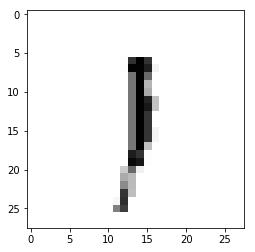

Epoch : 1 cost :  1.8649611811204363
Accuracy : 0.135
label : [1]
Prediction : [0]


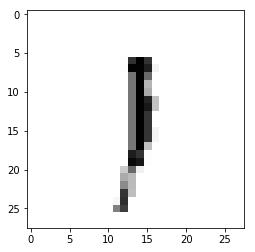

Epoch : 1 cost :  1.8691456807743392
Accuracy : 0.1192
label : [1]
Prediction : [0]


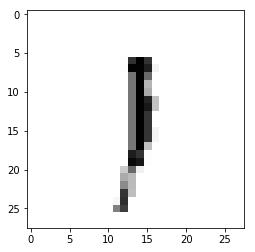

Epoch : 1 cost :  1.8733233516866483
Accuracy : 0.1345
label : [1]
Prediction : [0]


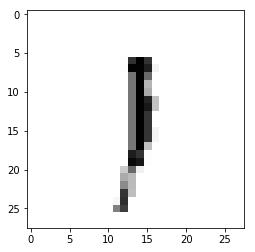

Epoch : 1 cost :  1.8775056604905536
Accuracy : 0.1349
label : [1]
Prediction : [0]


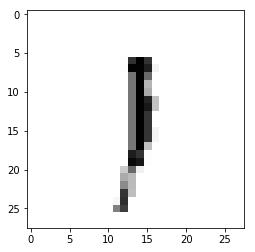

Epoch : 1 cost :  1.8816912312941092
Accuracy : 0.1363
label : [1]
Prediction : [0]


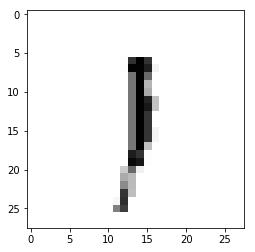

Epoch : 1 cost :  1.8858448860862012
Accuracy : 0.136
label : [1]
Prediction : [0]


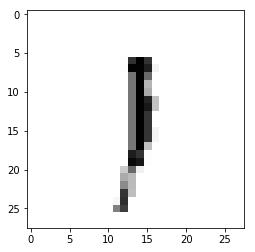

Epoch : 1 cost :  1.8900091335990186
Accuracy : 0.1349
label : [1]
Prediction : [0]


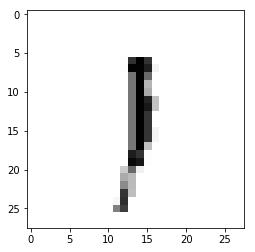

Epoch : 1 cost :  1.894192506616763
Accuracy : 0.1341
label : [1]
Prediction : [0]


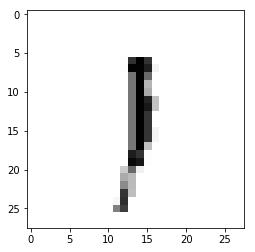

Epoch : 1 cost :  1.8983647277138422
Accuracy : 0.1326
label : [1]
Prediction : [0]


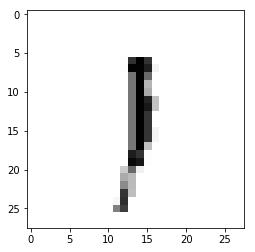

Epoch : 1 cost :  1.9025489295612654
Accuracy : 0.1314
label : [1]
Prediction : [0]


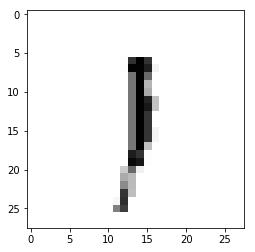

Epoch : 1 cost :  1.9067466805197948
Accuracy : 0.1319
label : [1]
Prediction : [0]


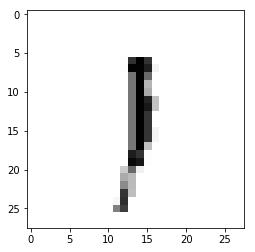

Epoch : 1 cost :  1.910916205752977
Accuracy : 0.1335
label : [1]
Prediction : [0]


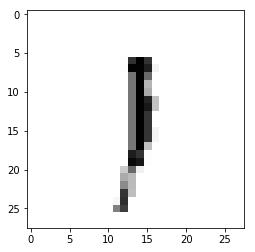

Epoch : 1 cost :  1.9150966488231285
Accuracy : 0.1338
label : [1]
Prediction : [0]


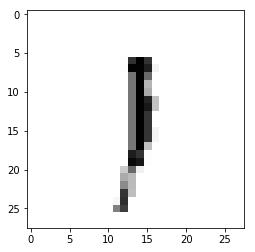

Epoch : 1 cost :  1.9192959299954473
Accuracy : 0.1331
label : [1]
Prediction : [0]


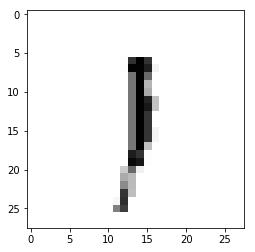

Epoch : 1 cost :  1.9234477797421514
Accuracy : 0.1324
label : [1]
Prediction : [0]


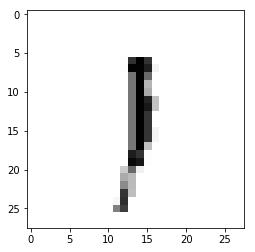

Epoch : 1 cost :  1.9276077491586832
Accuracy : 0.1332
label : [1]
Prediction : [0]


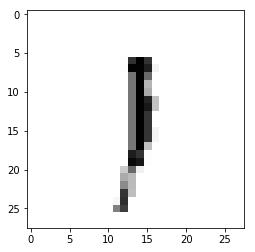

Epoch : 1 cost :  1.93178967952728
Accuracy : 0.1328
label : [1]
Prediction : [0]


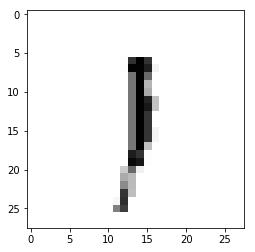

Epoch : 1 cost :  1.9359910084984493
Accuracy : 0.1324
label : [1]
Prediction : [0]


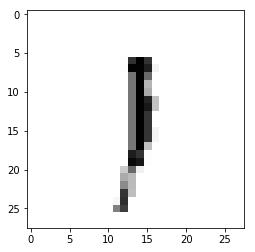

Epoch : 1 cost :  1.940154717185278
Accuracy : 0.1305
label : [1]
Prediction : [0]


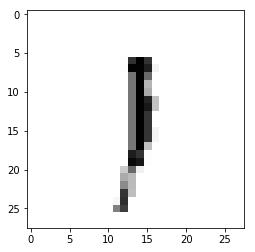

Epoch : 1 cost :  1.944308620799669
Accuracy : 0.1283
label : [1]
Prediction : [0]


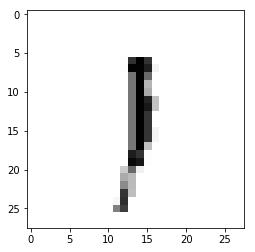

Epoch : 1 cost :  1.9485126616738033
Accuracy : 0.1319
label : [1]
Prediction : [0]


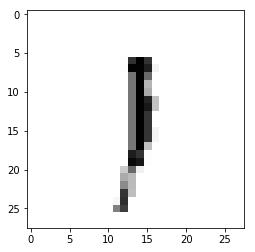

Epoch : 1 cost :  1.952705007032912
Accuracy : 0.1325
label : [1]
Prediction : [0]


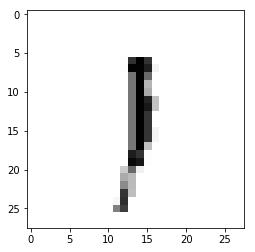

Epoch : 1 cost :  1.9568824499303619
Accuracy : 0.1338
label : [1]
Prediction : [0]


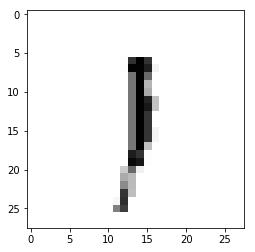

Epoch : 1 cost :  1.961040228930384
Accuracy : 0.1324
label : [1]
Prediction : [0]


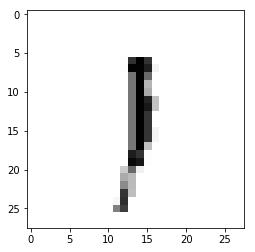

Epoch : 1 cost :  1.9652077592502915
Accuracy : 0.1307
label : [1]
Prediction : [0]


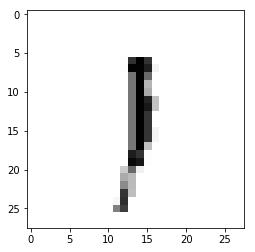

Epoch : 1 cost :  1.9693825656717447
Accuracy : 0.1334
label : [1]
Prediction : [0]


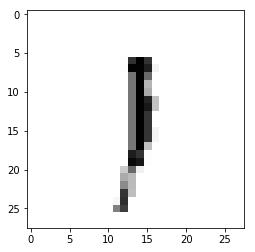

Epoch : 1 cost :  1.973551880663089
Accuracy : 0.1322
label : [1]
Prediction : [0]


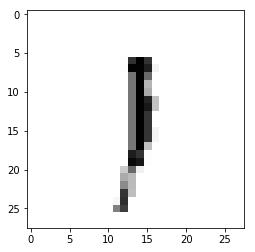

Epoch : 1 cost :  1.977739105658095
Accuracy : 0.1297
label : [1]
Prediction : [0]


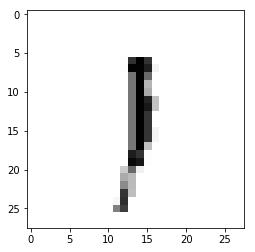

Epoch : 1 cost :  1.9819211461327266
Accuracy : 0.1283
label : [1]
Prediction : [0]


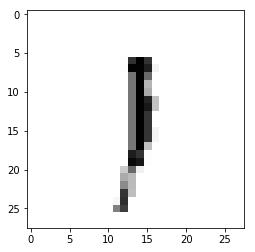

Epoch : 1 cost :  1.9860987017371412
Accuracy : 0.1246
label : [1]
Prediction : [0]


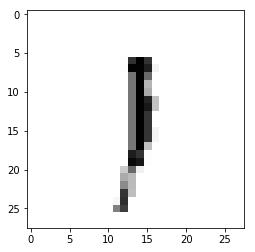

Epoch : 1 cost :  1.9902987480163548
Accuracy : 0.126
label : [1]
Prediction : [0]


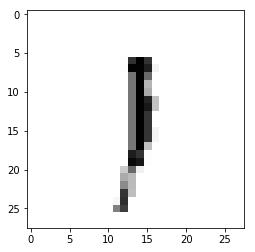

Epoch : 1 cost :  1.9944771151109149
Accuracy : 0.126
label : [1]
Prediction : [0]


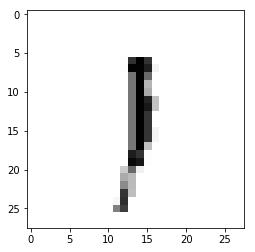

Epoch : 1 cost :  1.998652955835513
Accuracy : 0.1281
label : [1]
Prediction : [0]


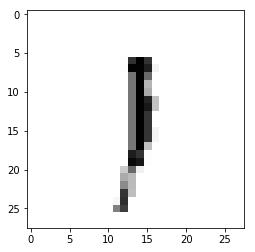

Epoch : 1 cost :  2.0027902546795904
Accuracy : 0.1249
label : [1]
Prediction : [0]


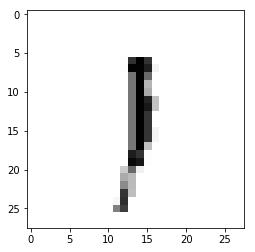

Epoch : 1 cost :  2.0069626257636304
Accuracy : 0.1278
label : [1]
Prediction : [0]


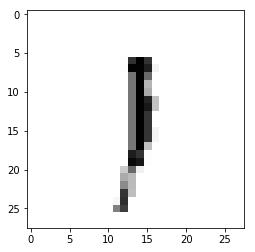

Epoch : 1 cost :  2.011153620373116
Accuracy : 0.124
label : [1]
Prediction : [0]


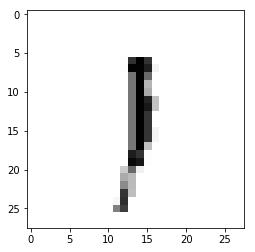

Epoch : 1 cost :  2.0153413633866717
Accuracy : 0.1248
label : [1]
Prediction : [0]


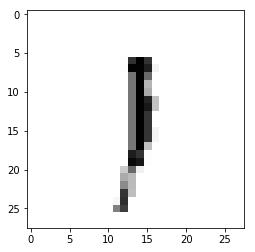

Epoch : 1 cost :  2.019517353231254
Accuracy : 0.1248
label : [1]
Prediction : [0]


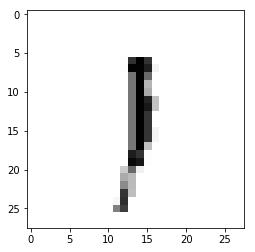

Epoch : 1 cost :  2.0236982289227545
Accuracy : 0.1281
label : [1]
Prediction : [0]


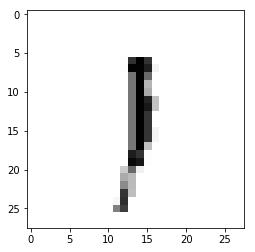

Epoch : 1 cost :  2.0278682613372774
Accuracy : 0.128
label : [1]
Prediction : [0]


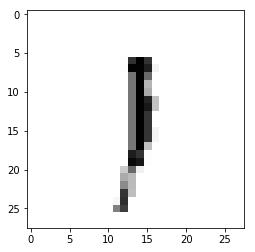

Epoch : 1 cost :  2.032022869803686
Accuracy : 0.1259
label : [1]
Prediction : [0]


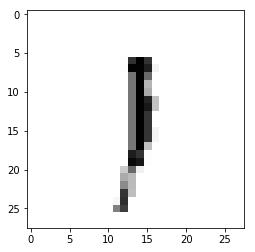

Epoch : 1 cost :  2.0361940466273887
Accuracy : 0.1272
label : [1]
Prediction : [0]


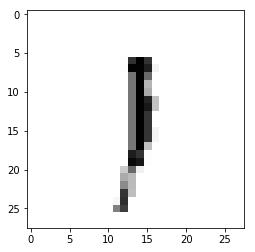

Epoch : 1 cost :  2.0403757091002004
Accuracy : 0.1291
label : [1]
Prediction : [0]


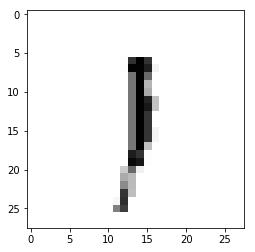

Epoch : 1 cost :  2.044561916698106
Accuracy : 0.13
label : [1]
Prediction : [0]


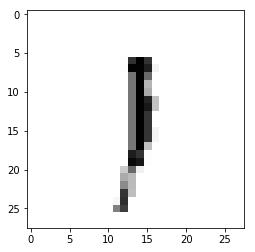

Epoch : 1 cost :  2.0487385706468033
Accuracy : 0.1296
label : [1]
Prediction : [0]


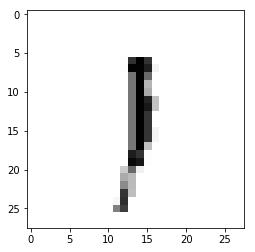

Epoch : 1 cost :  2.052906651496884
Accuracy : 0.1297
label : [1]
Prediction : [0]


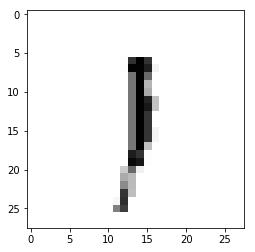

Epoch : 1 cost :  2.057094553600655
Accuracy : 0.1288
label : [1]
Prediction : [0]


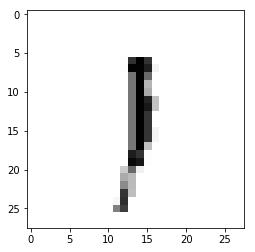

Epoch : 1 cost :  2.061263061870225
Accuracy : 0.1299
label : [1]
Prediction : [0]


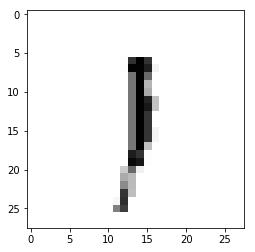

Epoch : 1 cost :  2.0654376186024024
Accuracy : 0.1276
label : [1]
Prediction : [0]


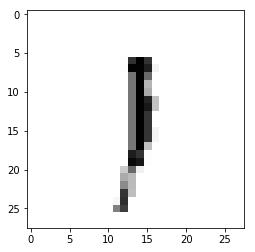

Epoch : 1 cost :  2.069614817879413
Accuracy : 0.1295
label : [1]
Prediction : [0]


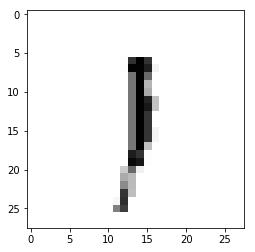

Epoch : 1 cost :  2.073792539076368
Accuracy : 0.129
label : [1]
Prediction : [0]


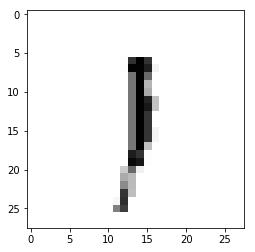

Epoch : 1 cost :  2.0779667468504437
Accuracy : 0.1267
label : [1]
Prediction : [0]


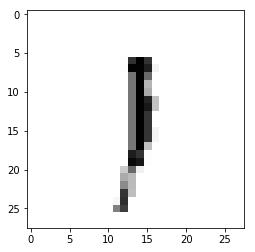

Epoch : 1 cost :  2.082137619365342
Accuracy : 0.126
label : [1]
Prediction : [0]


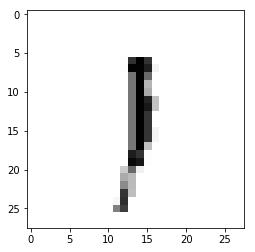

Epoch : 1 cost :  2.086299781799313
Accuracy : 0.1259
label : [1]
Prediction : [0]


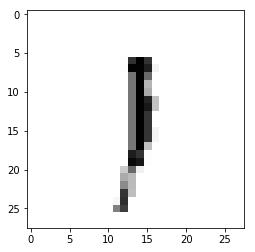

Epoch : 1 cost :  2.090470080375668
Accuracy : 0.1229
label : [1]
Prediction : [0]


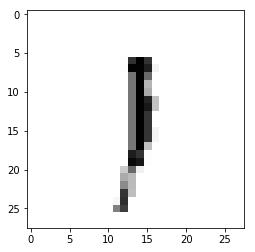

Epoch : 1 cost :  2.094654992710457
Accuracy : 0.1261
label : [1]
Prediction : [0]


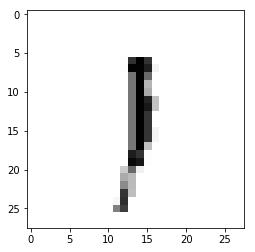

Epoch : 1 cost :  2.0988215845281397
Accuracy : 0.1263
label : [1]
Prediction : [0]


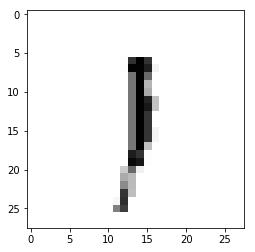

Epoch : 1 cost :  2.1030013686960363
Accuracy : 0.129
label : [1]
Prediction : [0]


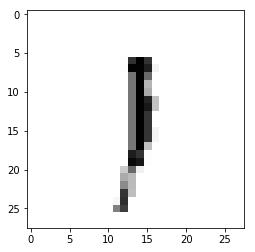

Epoch : 1 cost :  2.107157747528767
Accuracy : 0.1285
label : [1]
Prediction : [0]


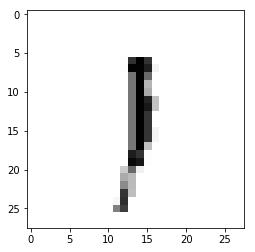

Epoch : 1 cost :  2.1113076543807954
Accuracy : 0.1261
label : [1]
Prediction : [0]


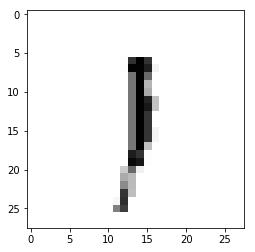

Epoch : 1 cost :  2.1154963397979705
Accuracy : 0.1299
label : [1]
Prediction : [0]


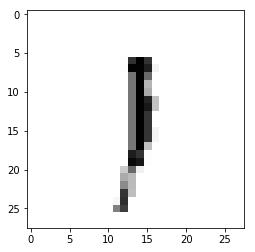

Epoch : 1 cost :  2.119687967300412
Accuracy : 0.1301
label : [1]
Prediction : [0]


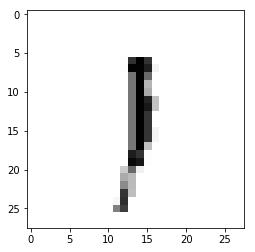

Epoch : 1 cost :  2.123875700777224
Accuracy : 0.1317
label : [1]
Prediction : [0]


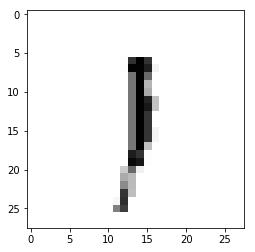

Epoch : 1 cost :  2.1280533188039574
Accuracy : 0.1294
label : [1]
Prediction : [0]


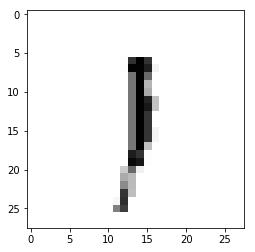

Epoch : 1 cost :  2.1322094587846205
Accuracy : 0.1282
label : [1]
Prediction : [0]


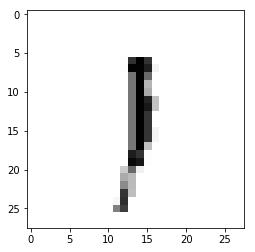

Epoch : 1 cost :  2.1363904298435528
Accuracy : 0.1299
label : [1]
Prediction : [0]


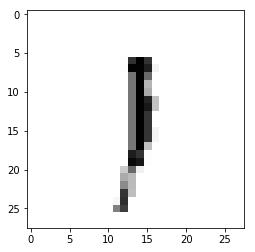

Epoch : 1 cost :  2.140593999082389
Accuracy : 0.1302
label : [1]
Prediction : [0]


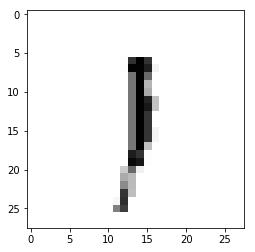

Epoch : 1 cost :  2.1447747620669246
Accuracy : 0.1301
label : [1]
Prediction : [0]


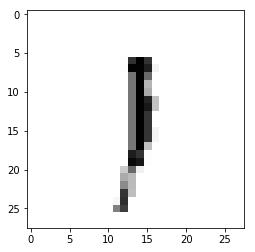

Epoch : 1 cost :  2.1489476455341654
Accuracy : 0.1307
label : [1]
Prediction : [0]


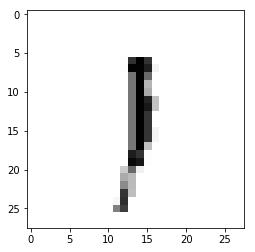

Epoch : 1 cost :  2.153117295611985
Accuracy : 0.1303
label : [1]
Prediction : [0]


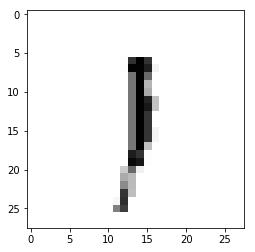

Epoch : 1 cost :  2.1572805634411867
Accuracy : 0.1306
label : [1]
Prediction : [0]


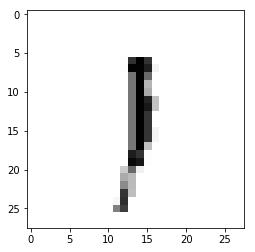

Epoch : 1 cost :  2.1614601898193326
Accuracy : 0.1312
label : [1]
Prediction : [0]


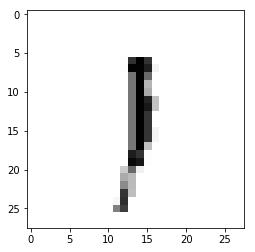

Epoch : 1 cost :  2.1656614277579536
Accuracy : 0.1299
label : [1]
Prediction : [0]


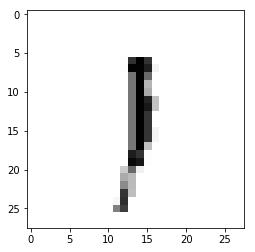

Epoch : 1 cost :  2.169810632792383
Accuracy : 0.1292
label : [1]
Prediction : [0]


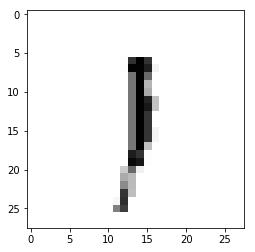

Epoch : 1 cost :  2.1739559372988584
Accuracy : 0.1302
label : [1]
Prediction : [0]


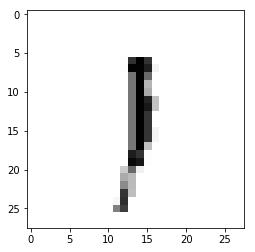

Epoch : 1 cost :  2.178158248988062
Accuracy : 0.1314
label : [1]
Prediction : [0]


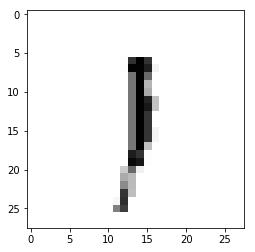

Epoch : 1 cost :  2.1823492908477755
Accuracy : 0.1309
label : [1]
Prediction : [0]


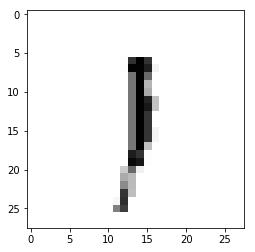

Epoch : 1 cost :  2.1865377369793952
Accuracy : 0.1308
label : [1]
Prediction : [0]


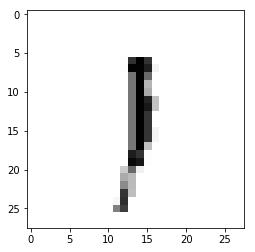

Epoch : 1 cost :  2.1907397157495647
Accuracy : 0.1311
label : [1]
Prediction : [0]


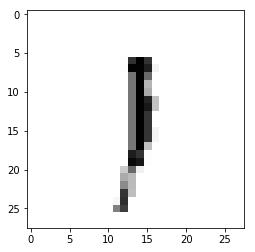

Epoch : 1 cost :  2.1949046026576626
Accuracy : 0.1319
label : [1]
Prediction : [0]


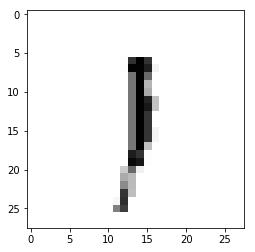

Epoch : 1 cost :  2.1990727355263426
Accuracy : 0.1318
label : [1]
Prediction : [0]


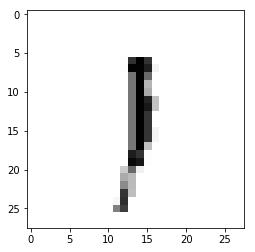

Epoch : 1 cost :  2.2032462011684046
Accuracy : 0.1318
label : [1]
Prediction : [0]


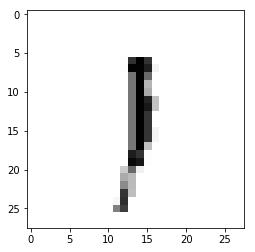

Epoch : 1 cost :  2.207421139370309
Accuracy : 0.1298
label : [1]
Prediction : [0]


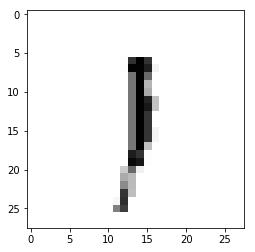

Epoch : 1 cost :  2.211568586609578
Accuracy : 0.127
label : [1]
Prediction : [0]


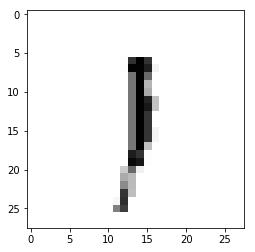

Epoch : 1 cost :  2.2157393789291357
Accuracy : 0.127
label : [1]
Prediction : [0]


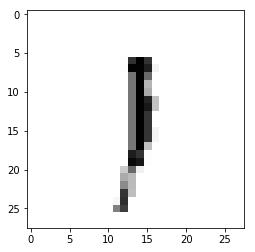

Epoch : 1 cost :  2.2199416511709016
Accuracy : 0.127
label : [1]
Prediction : [0]


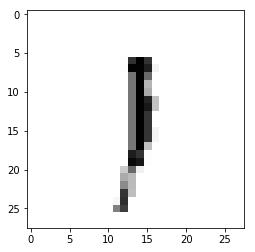

Epoch : 1 cost :  2.224111206314778
Accuracy : 0.1263
label : [1]
Prediction : [0]


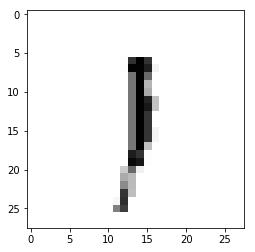

Epoch : 1 cost :  2.2282882911508706
Accuracy : 0.1291
label : [1]
Prediction : [0]


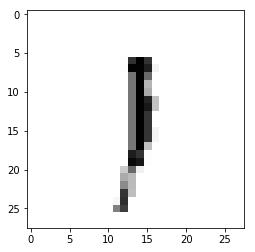

Epoch : 1 cost :  2.232452633597631
Accuracy : 0.1307
label : [1]
Prediction : [0]


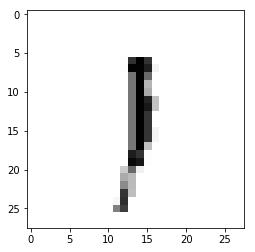

Epoch : 1 cost :  2.2366260199113297
Accuracy : 0.1306
label : [1]
Prediction : [0]


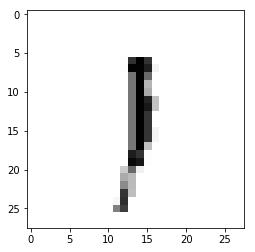

Epoch : 1 cost :  2.2407984079014143
Accuracy : 0.1297
label : [1]
Prediction : [0]


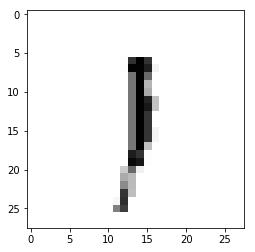

Epoch : 1 cost :  2.244969410029322
Accuracy : 0.1309
label : [1]
Prediction : [0]


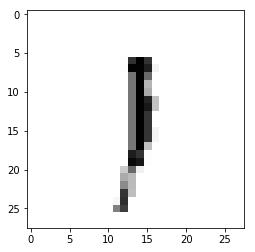

Epoch : 1 cost :  2.24916423580863
Accuracy : 0.1301
label : [1]
Prediction : [0]


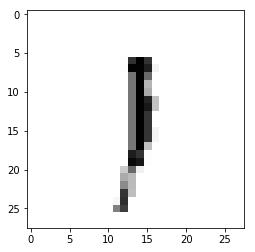

Epoch : 1 cost :  2.2533422946929904
Accuracy : 0.1308
label : [1]
Prediction : [0]


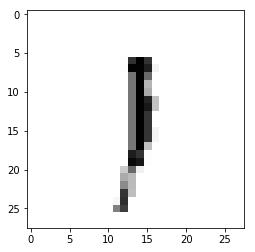

Epoch : 1 cost :  2.2575146245956392
Accuracy : 0.1294
label : [1]
Prediction : [0]


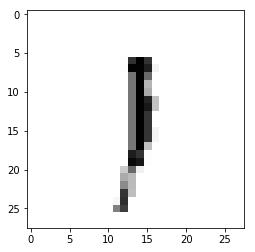

Epoch : 1 cost :  2.261700945333998
Accuracy : 0.1301
label : [1]
Prediction : [0]


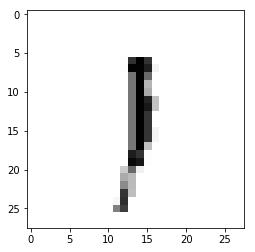

Epoch : 1 cost :  2.2658638594367257
Accuracy : 0.1296
label : [1]
Prediction : [0]


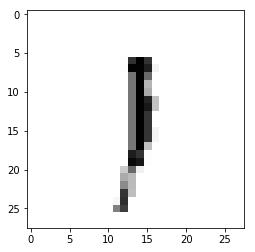

Epoch : 1 cost :  2.270051205374975
Accuracy : 0.1281
label : [1]
Prediction : [0]


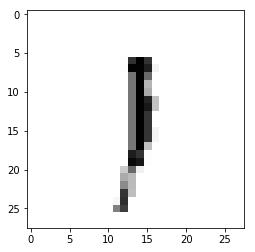

Epoch : 1 cost :  2.2741991832039545
Accuracy : 0.1275
label : [1]
Prediction : [0]


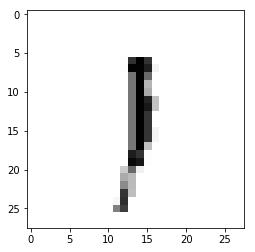

Epoch : 1 cost :  2.2783650155500905
Accuracy : 0.1258
label : [1]
Prediction : [0]


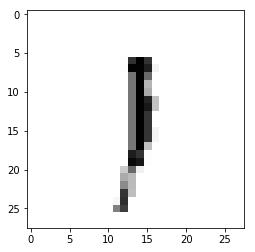

Epoch : 1 cost :  2.2825240247899807
Accuracy : 0.1242
label : [1]
Prediction : [0]


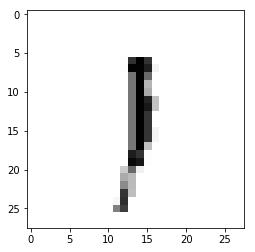

Epoch : 1 cost :  2.28670027949593
Accuracy : 0.1246
label : [1]
Prediction : [0]


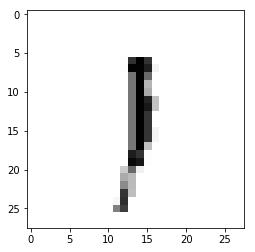

Epoch : 1 cost :  2.2908800484917355
Accuracy : 0.1242
label : [1]
Prediction : [0]


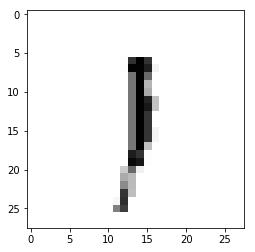

Epoch : 1 cost :  2.295075633309102
Accuracy : 0.1252
label : [1]
Prediction : [0]


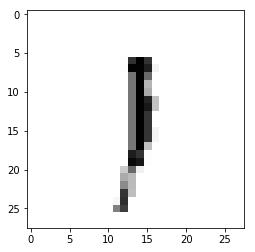

Epoch : 1 cost :  2.2992548587105466
Accuracy : 0.1243
label : [1]
Prediction : [0]


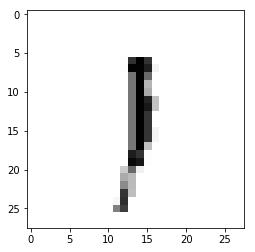

Epoch : 1 cost :  2.303424790555778
Accuracy : 0.1243
label : [1]
Prediction : [0]


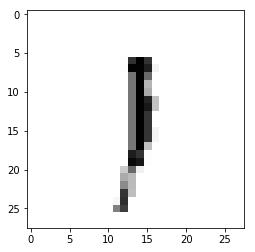

Epoch : 1 cost :  2.3075992033698314
Accuracy : 0.1232
label : [1]
Prediction : [0]


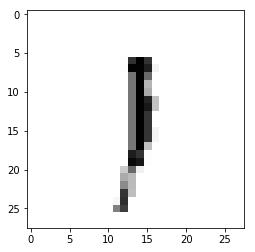

Epoch : 1 cost :  2.3117629302631695
Accuracy : 0.124
label : [1]
Prediction : [0]


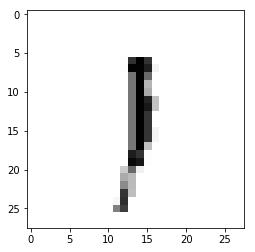

Epoch : 1 cost :  2.315943699316542
Accuracy : 0.1247
label : [1]
Prediction : [0]


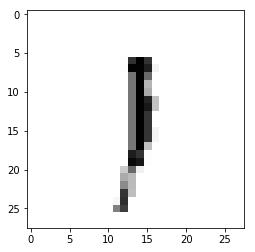

Epoch : 1 cost :  2.3201160114461694
Accuracy : 0.124
label : [1]
Prediction : [0]


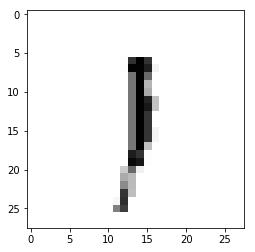

Epoch : 1 cost :  2.3242981498891626
Accuracy : 0.1228
label : [1]
Prediction : [0]


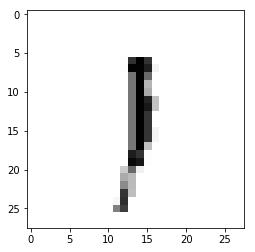

Epoch : 1 cost :  2.3284620363062047
Accuracy : 0.1239
label : [1]
Prediction : [0]


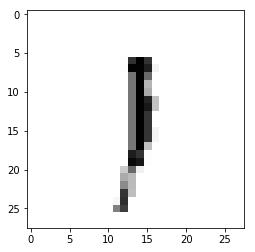

Epoch : 2 cost :  0.0041636783426458185
Accuracy : 0.1232
label : [1]
Prediction : [0]


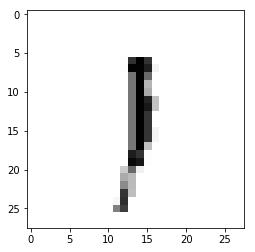

Epoch : 2 cost :  0.008320707407864657
Accuracy : 0.1231
label : [1]
Prediction : [0]


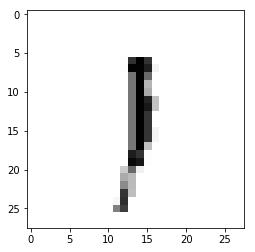

Epoch : 2 cost :  0.012493856603449042
Accuracy : 0.1234
label : [1]
Prediction : [0]


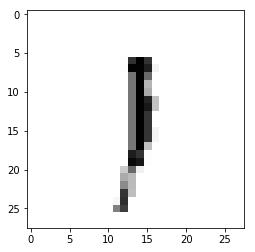

Epoch : 2 cost :  0.016688338193026456
Accuracy : 0.1237
label : [1]
Prediction : [0]


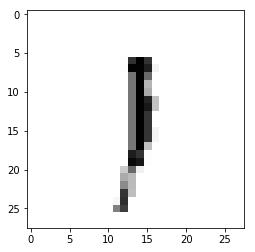

Epoch : 2 cost :  0.02086290879683061
Accuracy : 0.1252
label : [1]
Prediction : [0]


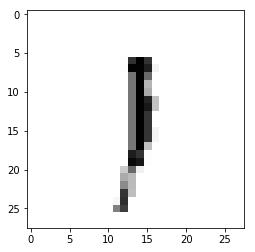

Epoch : 2 cost :  0.025029520121487705
Accuracy : 0.1255
label : [1]
Prediction : [0]


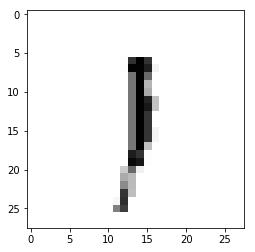

Epoch : 2 cost :  0.02920874205502597
Accuracy : 0.1259
label : [1]
Prediction : [0]


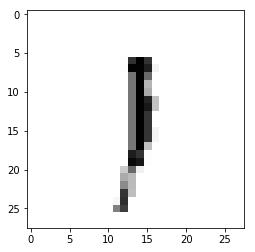

Epoch : 2 cost :  0.03339768929914995
Accuracy : 0.1262
label : [1]
Prediction : [0]


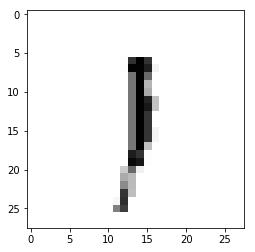

Epoch : 2 cost :  0.03754700574007901
Accuracy : 0.124
label : [1]
Prediction : [0]


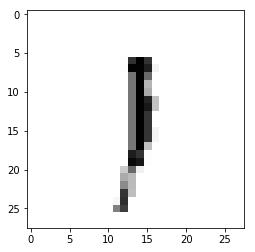

Epoch : 2 cost :  0.041711287931962444
Accuracy : 0.1229
label : [1]
Prediction : [0]


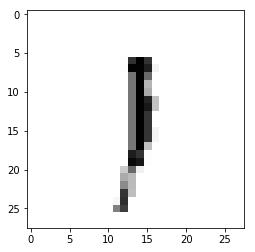

Epoch : 2 cost :  0.04589805646376176
Accuracy : 0.1228
label : [1]
Prediction : [0]


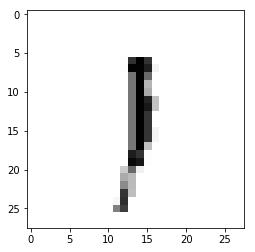

Epoch : 2 cost :  0.05009174476970325
Accuracy : 0.1244
label : [1]
Prediction : [0]


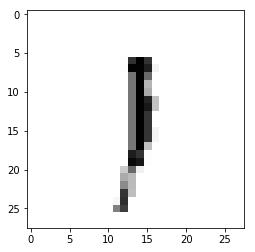

Epoch : 2 cost :  0.054255107099359684
Accuracy : 0.1229
label : [1]
Prediction : [0]


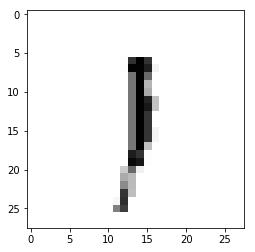

Epoch : 2 cost :  0.05845464533025568
Accuracy : 0.1233
label : [1]
Prediction : [0]


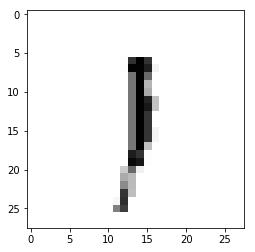

Epoch : 2 cost :  0.06263172626495361
Accuracy : 0.1227
label : [1]
Prediction : [0]


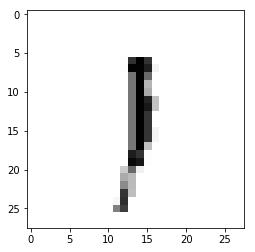

Epoch : 2 cost :  0.06680993730371648
Accuracy : 0.1232
label : [1]
Prediction : [0]


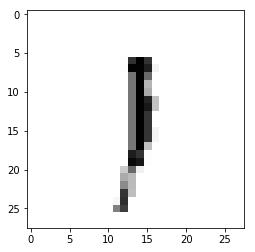

Epoch : 2 cost :  0.07099695639176802
Accuracy : 0.1234
label : [1]
Prediction : [0]


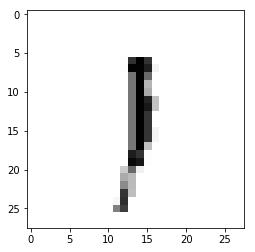

Epoch : 2 cost :  0.07516702738675204
Accuracy : 0.125
label : [1]
Prediction : [0]


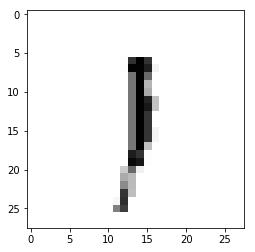

Epoch : 2 cost :  0.07933699954639782
Accuracy : 0.1244
label : [1]
Prediction : [0]


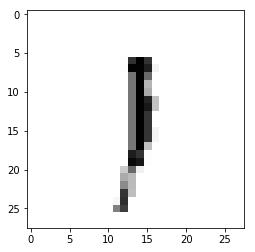

Epoch : 2 cost :  0.0835279165614735
Accuracy : 0.124
label : [1]
Prediction : [0]


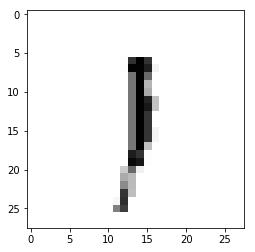

Epoch : 2 cost :  0.08770853389393199
Accuracy : 0.1236
label : [1]
Prediction : [0]


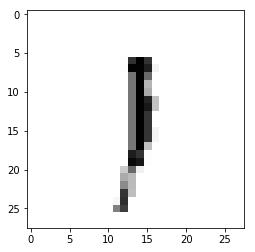

Epoch : 2 cost :  0.09186822241002862
Accuracy : 0.1242
label : [1]
Prediction : [0]


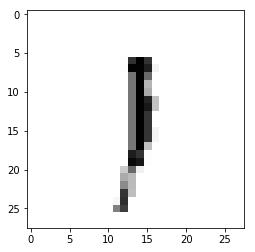

Epoch : 2 cost :  0.09603287046605889
Accuracy : 0.1245
label : [1]
Prediction : [0]


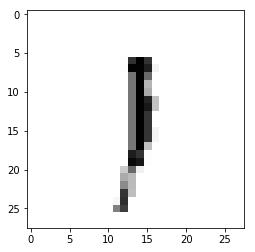

Epoch : 2 cost :  0.10020580681887539
Accuracy : 0.1249
label : [1]
Prediction : [0]


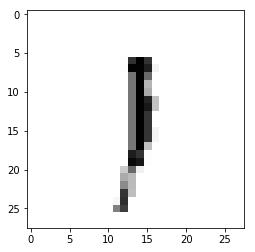

Epoch : 2 cost :  0.10438943342729047
Accuracy : 0.1248
label : [1]
Prediction : [0]


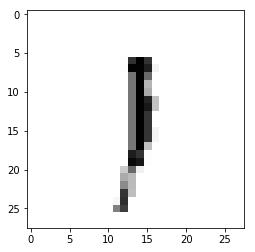

Epoch : 2 cost :  0.10854099923914128
Accuracy : 0.1257
label : [1]
Prediction : [0]


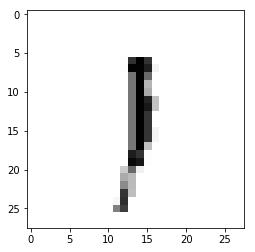

Epoch : 2 cost :  0.11270283612337978
Accuracy : 0.1258
label : [1]
Prediction : [0]


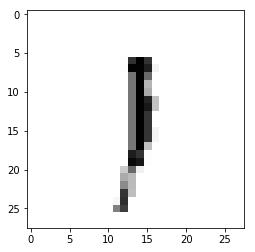

Epoch : 2 cost :  0.11688201860948041
Accuracy : 0.1261
label : [1]
Prediction : [0]


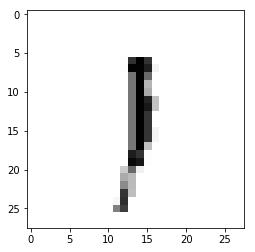

Epoch : 2 cost :  0.12106639645316383
Accuracy : 0.1271
label : [1]
Prediction : [0]


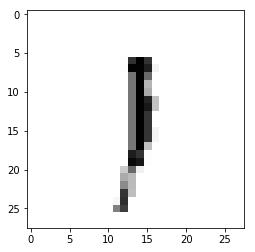

Epoch : 2 cost :  0.12525028575550426
Accuracy : 0.1279
label : [1]
Prediction : [0]


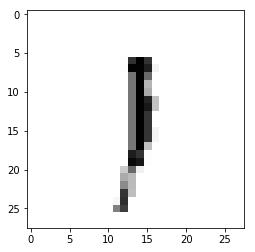

Epoch : 2 cost :  0.12940902536565607
Accuracy : 0.1267
label : [1]
Prediction : [0]


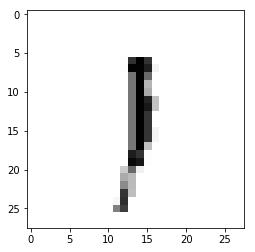

Epoch : 2 cost :  0.1335957314751365
Accuracy : 0.1272
label : [1]
Prediction : [0]


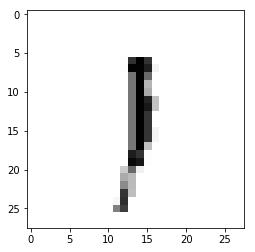

Epoch : 2 cost :  0.13774967887184839
Accuracy : 0.124
label : [1]
Prediction : [0]


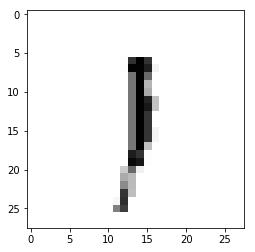

Epoch : 2 cost :  0.14191685113039887
Accuracy : 0.1235
label : [1]
Prediction : [0]


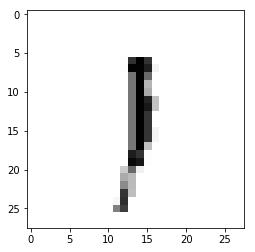

Epoch : 2 cost :  0.1460753744298762
Accuracy : 0.1253
label : [1]
Prediction : [0]


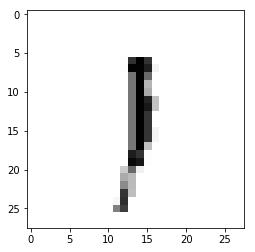

Epoch : 2 cost :  0.1502603032372215
Accuracy : 0.1259
label : [1]
Prediction : [0]


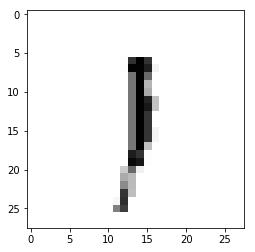

Epoch : 2 cost :  0.15444829463958745
Accuracy : 0.1256
label : [1]
Prediction : [0]


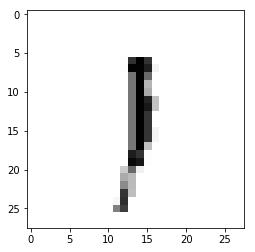

Epoch : 2 cost :  0.15864735126495366
Accuracy : 0.1254
label : [1]
Prediction : [0]


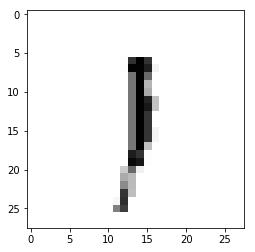

Epoch : 2 cost :  0.16281820600683045
Accuracy : 0.1231
label : [1]
Prediction : [0]


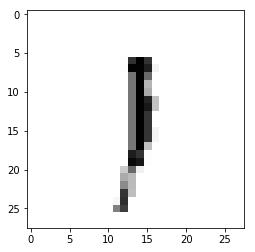

Epoch : 2 cost :  0.16697989550503822
Accuracy : 0.1229
label : [1]
Prediction : [0]


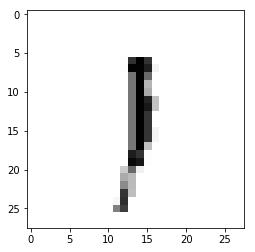

Epoch : 2 cost :  0.1711504563418302
Accuracy : 0.1229
label : [1]
Prediction : [0]


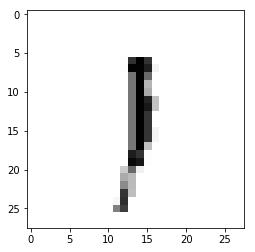

Epoch : 2 cost :  0.17534065723419193
Accuracy : 0.1233
label : [1]
Prediction : [0]


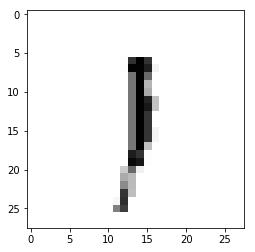

Epoch : 2 cost :  0.1795081103931774
Accuracy : 0.122
label : [1]
Prediction : [0]


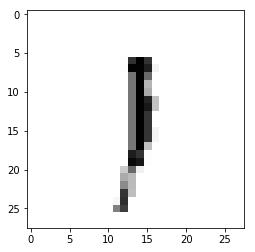

Epoch : 2 cost :  0.18370410919189456
Accuracy : 0.1223
label : [1]
Prediction : [0]


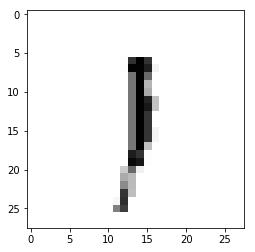

Epoch : 2 cost :  0.18789075374603276
Accuracy : 0.1214
label : [1]
Prediction : [0]


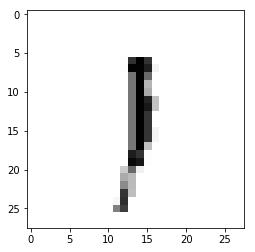

Epoch : 2 cost :  0.19205694241957236
Accuracy : 0.1201
label : [1]
Prediction : [0]


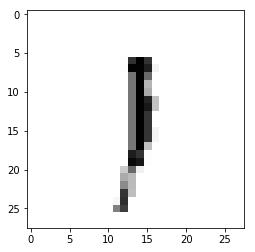

Epoch : 2 cost :  0.19624387134205215
Accuracy : 0.1197
label : [1]
Prediction : [0]


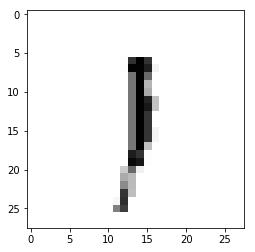

Epoch : 2 cost :  0.20041970426386058
Accuracy : 0.122
label : [1]
Prediction : [0]


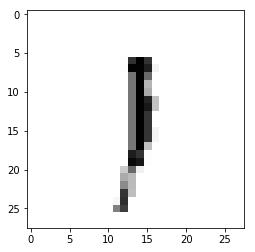

Epoch : 2 cost :  0.20459103064103565
Accuracy : 0.1227
label : [1]
Prediction : [0]


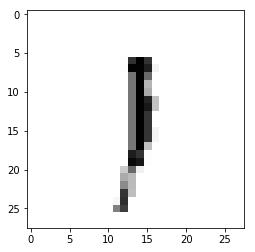

Epoch : 2 cost :  0.20874421119689945
Accuracy : 0.118
label : [1]
Prediction : [0]


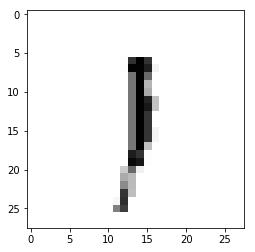

Epoch : 2 cost :  0.21292278940027415
Accuracy : 0.1188
label : [1]
Prediction : [0]


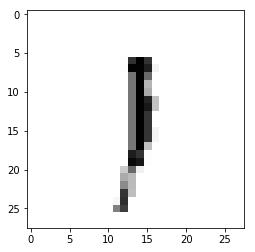

Epoch : 2 cost :  0.21710322206670593
Accuracy : 0.1198
label : [1]
Prediction : [0]


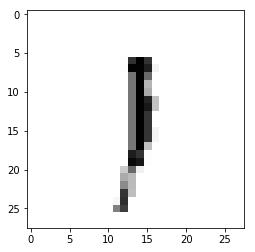

Epoch : 2 cost :  0.2212745519117876
Accuracy : 0.1209
label : [1]
Prediction : [0]


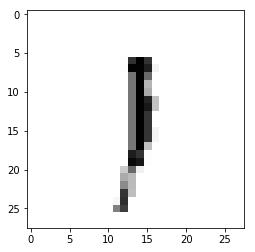

Epoch : 2 cost :  0.22543003819205548
Accuracy : 0.1153
label : [1]
Prediction : [0]


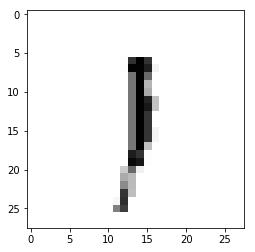

Epoch : 2 cost :  0.22962392286820849
Accuracy : 0.119
label : [1]
Prediction : [0]


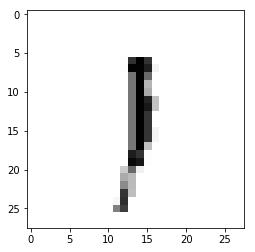

Epoch : 2 cost :  0.23382794250141495
Accuracy : 0.1195
label : [1]
Prediction : [0]


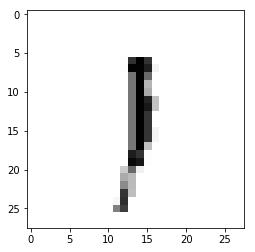

Epoch : 2 cost :  0.23800503470680934
Accuracy : 0.1208
label : [1]
Prediction : [0]


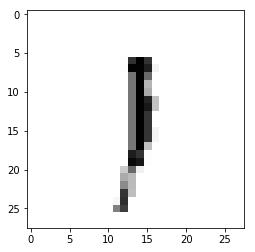

Epoch : 2 cost :  0.24216840874065057
Accuracy : 0.1196
label : [1]
Prediction : [0]


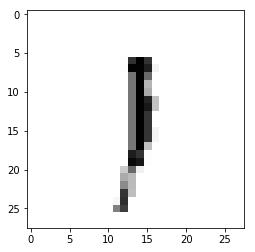

Epoch : 2 cost :  0.2463469605012374
Accuracy : 0.1195
label : [1]
Prediction : [0]


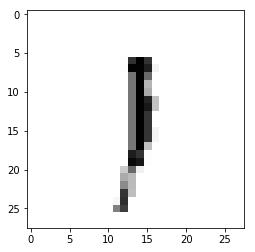

Epoch : 2 cost :  0.25054343266920615
Accuracy : 0.1193
label : [1]
Prediction : [0]


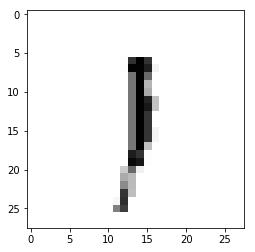

Epoch : 2 cost :  0.25472264203158296
Accuracy : 0.1209
label : [1]
Prediction : [0]


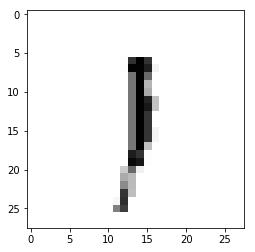

Epoch : 2 cost :  0.2589064559069547
Accuracy : 0.1209
label : [1]
Prediction : [0]


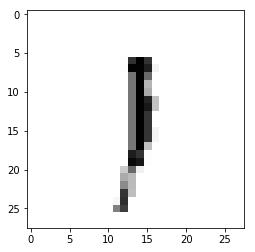

Epoch : 2 cost :  0.26306814583865085
Accuracy : 0.1202
label : [1]
Prediction : [0]


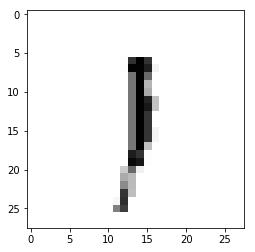

Epoch : 2 cost :  0.2672315454483033
Accuracy : 0.1197
label : [1]
Prediction : [0]


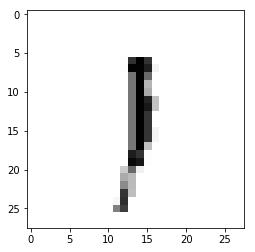

Epoch : 2 cost :  0.27143604321913295
Accuracy : 0.1218
label : [1]
Prediction : [0]


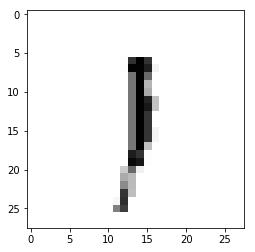

Epoch : 2 cost :  0.27562547380274
Accuracy : 0.1198
label : [1]
Prediction : [0]


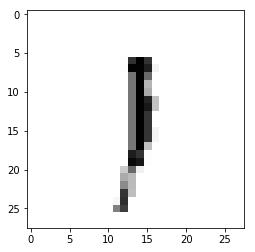

Epoch : 2 cost :  0.27980102799155504
Accuracy : 0.1196
label : [1]
Prediction : [0]


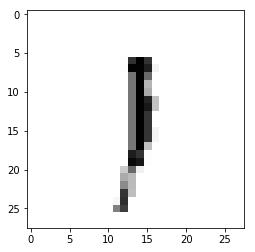

Epoch : 2 cost :  0.2839579018679533
Accuracy : 0.1212
label : [1]
Prediction : [0]


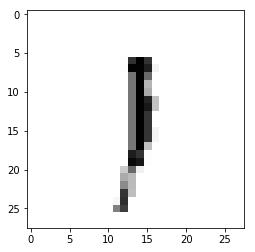

Epoch : 2 cost :  0.2881275476108898
Accuracy : 0.1152
label : [1]
Prediction : [0]


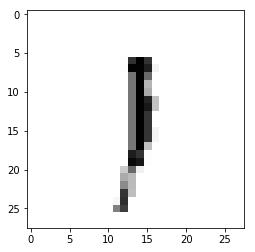

Epoch : 2 cost :  0.29230232802304357
Accuracy : 0.1207
label : [1]
Prediction : [0]


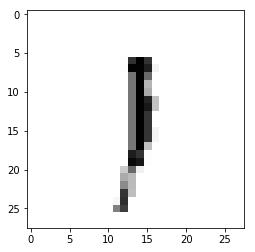

Epoch : 2 cost :  0.29645372997630726
Accuracy : 0.1194
label : [1]
Prediction : [0]


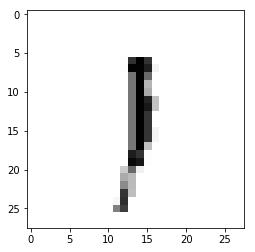

Epoch : 2 cost :  0.3006265692277388
Accuracy : 0.1196
label : [1]
Prediction : [0]


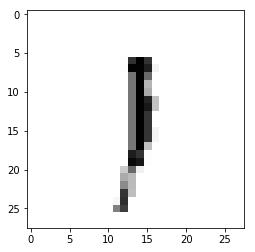

Epoch : 2 cost :  0.30481373049996113
Accuracy : 0.1195
label : [1]
Prediction : [0]


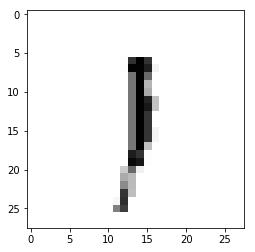

Epoch : 2 cost :  0.30896743644367564
Accuracy : 0.1154
label : [1]
Prediction : [0]


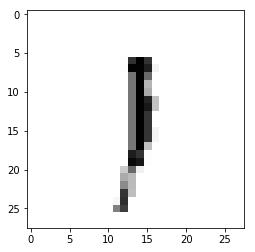

Epoch : 2 cost :  0.3131550697846846
Accuracy : 0.1211
label : [1]
Prediction : [0]


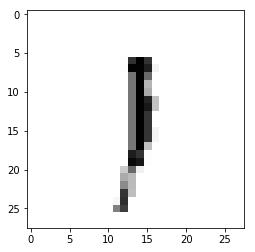

Epoch : 2 cost :  0.31733826463872733
Accuracy : 0.122
label : [1]
Prediction : [0]


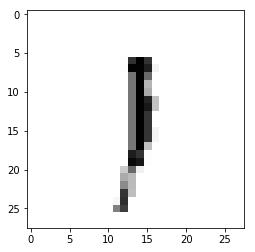

Epoch : 2 cost :  0.32151982654224737
Accuracy : 0.1218
label : [1]
Prediction : [0]


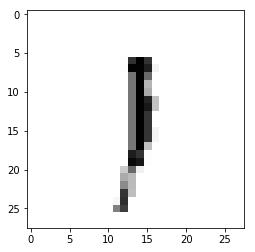

Epoch : 2 cost :  0.32569880268790496
Accuracy : 0.1196
label : [1]
Prediction : [0]


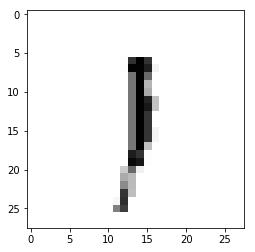

Epoch : 2 cost :  0.32988689422607415
Accuracy : 0.1223
label : [1]
Prediction : [0]


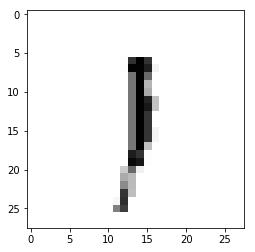

Epoch : 2 cost :  0.33406032388860524
Accuracy : 0.1245
label : [1]
Prediction : [0]


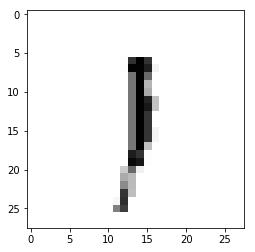

Epoch : 2 cost :  0.33823476401242336
Accuracy : 0.1255
label : [1]
Prediction : [0]


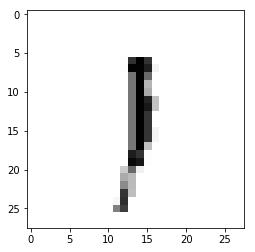

Epoch : 2 cost :  0.34240549564361566
Accuracy : 0.1245
label : [1]
Prediction : [0]


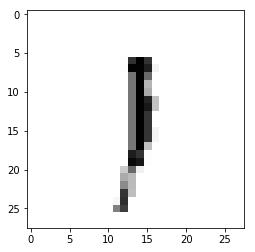

Epoch : 2 cost :  0.34656262917952096
Accuracy : 0.1238
label : [1]
Prediction : [0]


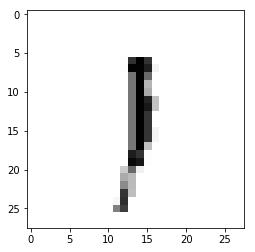

Epoch : 2 cost :  0.35074344678358593
Accuracy : 0.1235
label : [1]
Prediction : [0]


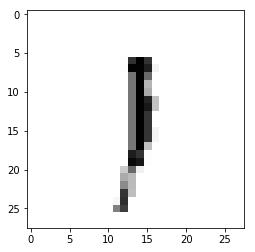

Epoch : 2 cost :  0.35491050936959
Accuracy : 0.1239
label : [1]
Prediction : [0]


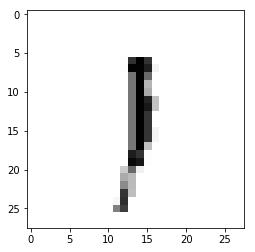

Epoch : 2 cost :  0.3590838011828335
Accuracy : 0.1231
label : [1]
Prediction : [0]


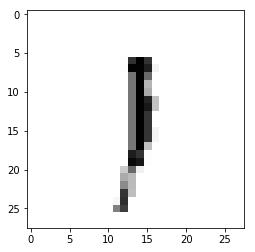

Epoch : 2 cost :  0.3632636191628195
Accuracy : 0.1228
label : [1]
Prediction : [0]


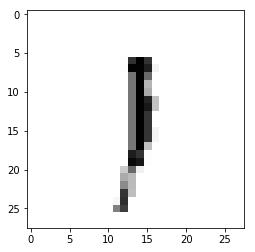

Epoch : 2 cost :  0.36741395300084884
Accuracy : 0.121
label : [1]
Prediction : [0]


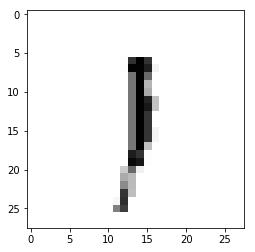

Epoch : 2 cost :  0.3715924041921441
Accuracy : 0.1241
label : [1]
Prediction : [0]


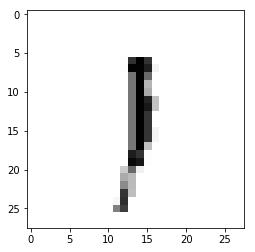

Epoch : 2 cost :  0.37576295419172795
Accuracy : 0.1276
label : [1]
Prediction : [0]


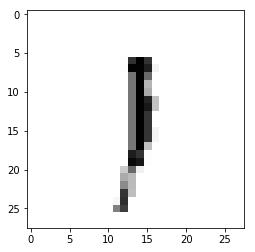

Epoch : 2 cost :  0.3799311004985461
Accuracy : 0.1269
label : [1]
Prediction : [0]


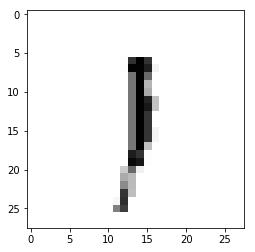

Epoch : 2 cost :  0.38412500251423215
Accuracy : 0.127
label : [1]
Prediction : [0]


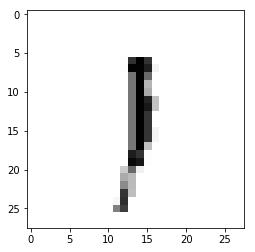

Epoch : 2 cost :  0.3882908673719925
Accuracy : 0.1275
label : [1]
Prediction : [0]


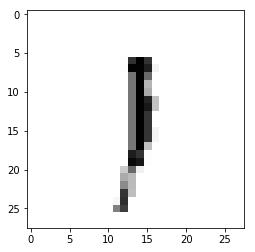

Epoch : 2 cost :  0.3924541521072386
Accuracy : 0.1265
label : [1]
Prediction : [0]


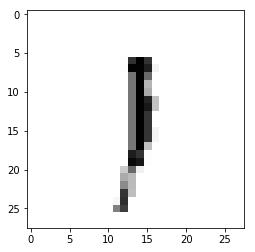

Epoch : 2 cost :  0.39660608595067787
Accuracy : 0.1231
label : [1]
Prediction : [0]


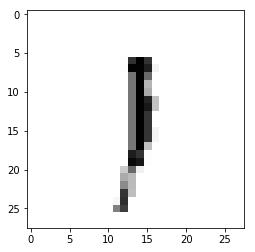

Epoch : 2 cost :  0.40079028909856607
Accuracy : 0.1257
label : [1]
Prediction : [0]


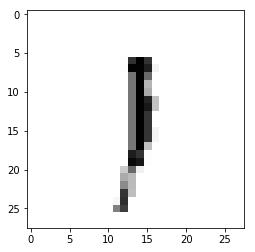

Epoch : 2 cost :  0.40495311607014034
Accuracy : 0.1257
label : [1]
Prediction : [0]


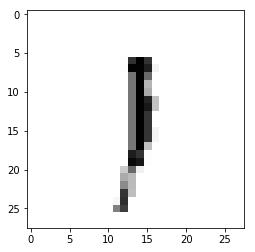

Epoch : 2 cost :  0.40912872401150774
Accuracy : 0.1247
label : [1]
Prediction : [0]


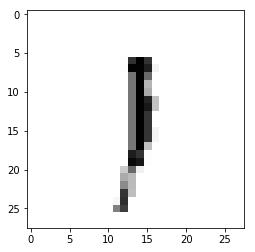

Epoch : 2 cost :  0.4132860699566926
Accuracy : 0.1248
label : [1]
Prediction : [0]


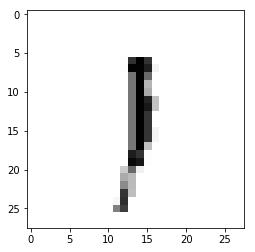

Epoch : 2 cost :  0.41748318975621984
Accuracy : 0.1248
label : [1]
Prediction : [0]


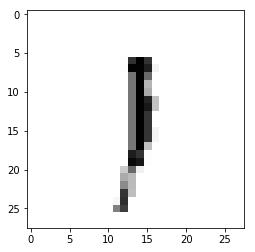

Epoch : 2 cost :  0.42166094086386924
Accuracy : 0.125
label : [1]
Prediction : [0]


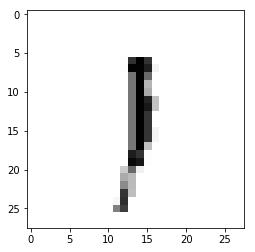

Epoch : 2 cost :  0.42584422458301874
Accuracy : 0.1257
label : [1]
Prediction : [0]


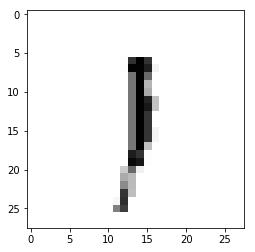

Epoch : 2 cost :  0.42999960856004177
Accuracy : 0.1245
label : [1]
Prediction : [0]


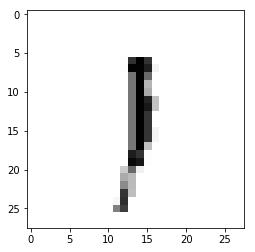

Epoch : 2 cost :  0.43414786685596796
Accuracy : 0.1251
label : [1]
Prediction : [0]


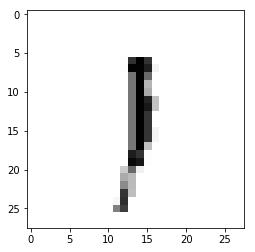

Epoch : 2 cost :  0.43831858158111553
Accuracy : 0.1236
label : [1]
Prediction : [0]


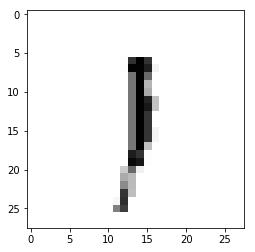

Epoch : 2 cost :  0.44248593373732115
Accuracy : 0.125
label : [1]
Prediction : [0]


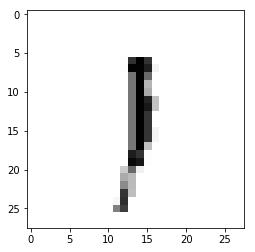

Epoch : 2 cost :  0.44665558858351256
Accuracy : 0.1235
label : [1]
Prediction : [0]


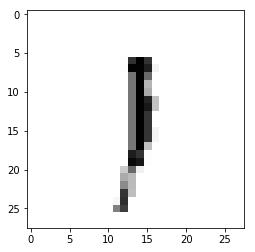

Epoch : 2 cost :  0.45083287672563016
Accuracy : 0.1229
label : [1]
Prediction : [0]


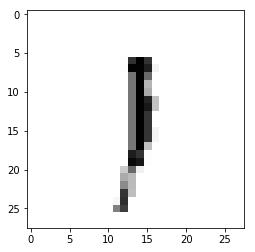

Epoch : 2 cost :  0.45501061916351304
Accuracy : 0.1241
label : [1]
Prediction : [0]


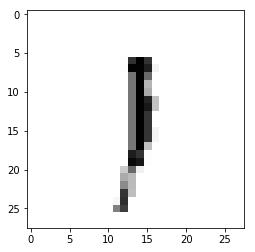

Epoch : 2 cost :  0.4591716610301623
Accuracy : 0.1244
label : [1]
Prediction : [0]


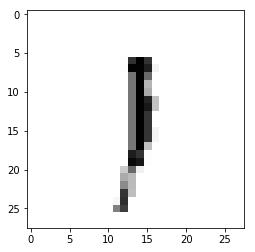

Epoch : 2 cost :  0.46334432775324025
Accuracy : 0.1232
label : [1]
Prediction : [0]


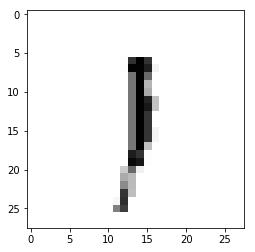

Epoch : 2 cost :  0.467521888993003
Accuracy : 0.1247
label : [1]
Prediction : [0]


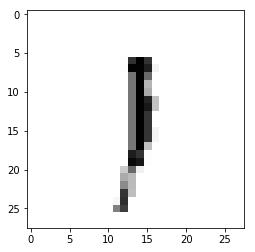

Epoch : 2 cost :  0.4716970023241909
Accuracy : 0.1249
label : [1]
Prediction : [0]


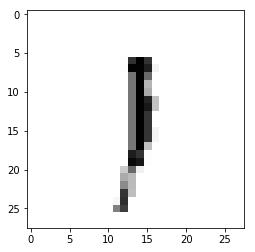

Epoch : 2 cost :  0.4758523286472666
Accuracy : 0.1254
label : [1]
Prediction : [0]


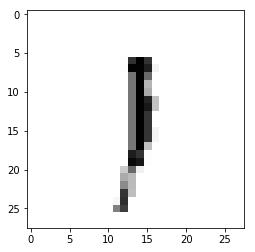

Epoch : 2 cost :  0.480026079524647
Accuracy : 0.1246
label : [1]
Prediction : [0]


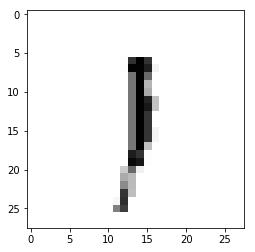

Epoch : 2 cost :  0.4842163476076992
Accuracy : 0.1251
label : [1]
Prediction : [0]


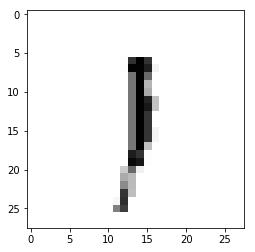

Epoch : 2 cost :  0.488368966362693
Accuracy : 0.1253
label : [1]
Prediction : [0]


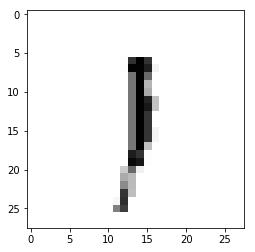

Epoch : 2 cost :  0.49254495447332197
Accuracy : 0.1257
label : [1]
Prediction : [0]


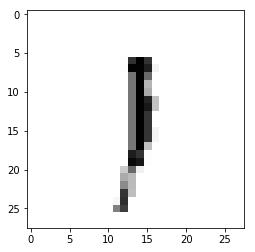

Epoch : 2 cost :  0.4967024486715142
Accuracy : 0.1254
label : [1]
Prediction : [0]


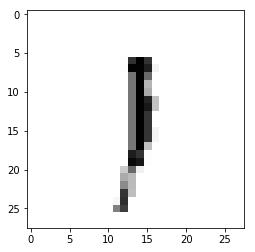

Epoch : 2 cost :  0.5008681834827768
Accuracy : 0.1253
label : [1]
Prediction : [0]


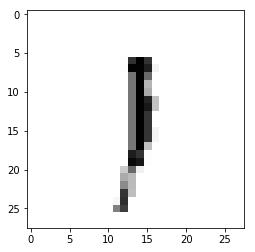

Epoch : 2 cost :  0.5050481718236748
Accuracy : 0.1273
label : [1]
Prediction : [0]


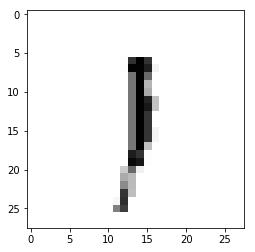

Epoch : 2 cost :  0.5091998130624943
Accuracy : 0.1264
label : [1]
Prediction : [0]


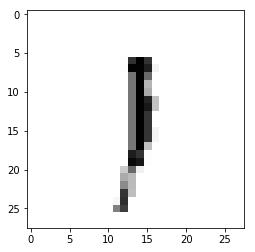

Epoch : 2 cost :  0.5133665401285343
Accuracy : 0.1284
label : [1]
Prediction : [0]


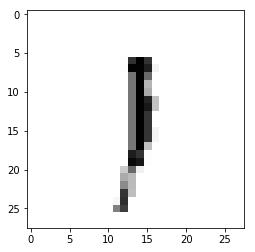

Epoch : 2 cost :  0.517560759891163
Accuracy : 0.1316
label : [1]
Prediction : [0]


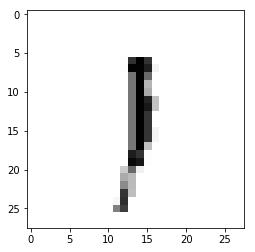

Epoch : 2 cost :  0.521726476495916
Accuracy : 0.1282
label : [1]
Prediction : [0]


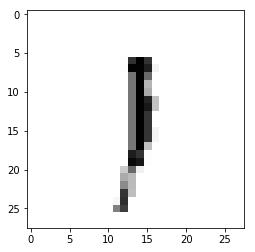

Epoch : 2 cost :  0.5258874060890889
Accuracy : 0.1282
label : [1]
Prediction : [0]


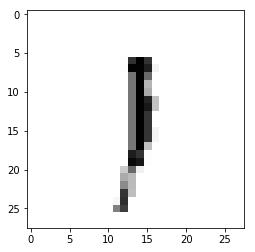

Epoch : 2 cost :  0.5300549819252706
Accuracy : 0.1273
label : [1]
Prediction : [0]


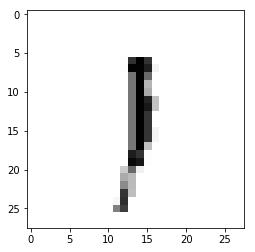

Epoch : 2 cost :  0.5342224112423981
Accuracy : 0.132
label : [1]
Prediction : [0]


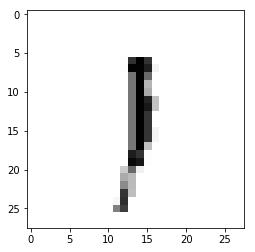

Epoch : 2 cost :  0.5384042028947308
Accuracy : 0.1337
label : [1]
Prediction : [0]


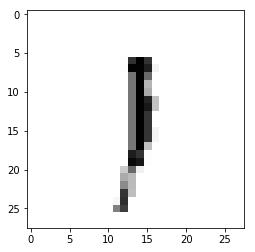

Epoch : 2 cost :  0.5425876322659577
Accuracy : 0.1376
label : [1]
Prediction : [0]


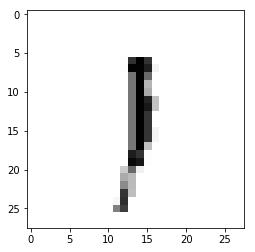

Epoch : 2 cost :  0.546786643808538
Accuracy : 0.1364
label : [1]
Prediction : [0]


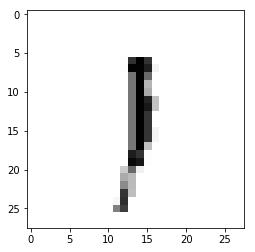

Epoch : 2 cost :  0.550958349487998
Accuracy : 0.1382
label : [1]
Prediction : [0]


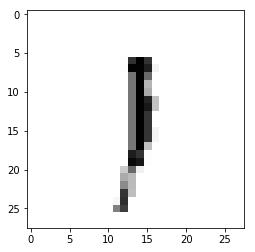

Epoch : 2 cost :  0.5551186765323983
Accuracy : 0.1388
label : [1]
Prediction : [0]


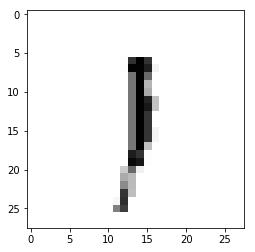

Epoch : 2 cost :  0.559294818531383
Accuracy : 0.1419
label : [1]
Prediction : [0]


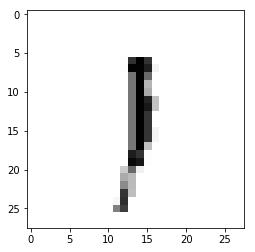

Epoch : 2 cost :  0.5634510196338999
Accuracy : 0.1404
label : [1]
Prediction : [0]


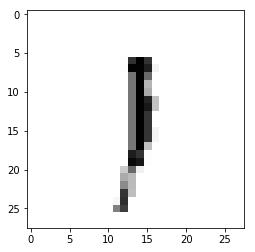

Epoch : 2 cost :  0.5676436155492608
Accuracy : 0.1395
label : [1]
Prediction : [0]


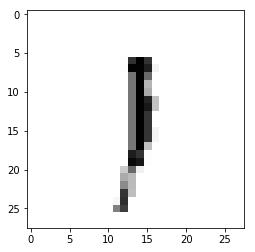

Epoch : 2 cost :  0.5718047870289195
Accuracy : 0.1421
label : [1]
Prediction : [0]


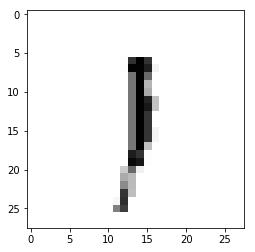

Epoch : 2 cost :  0.575985345840454
Accuracy : 0.1396
label : [1]
Prediction : [0]


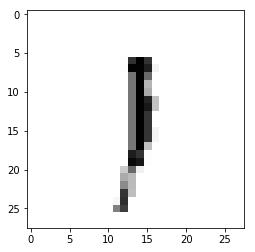

Epoch : 2 cost :  0.5801535441658713
Accuracy : 0.1402
label : [1]
Prediction : [0]


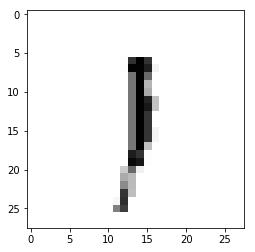

Epoch : 2 cost :  0.5843323209068991
Accuracy : 0.1393
label : [1]
Prediction : [0]


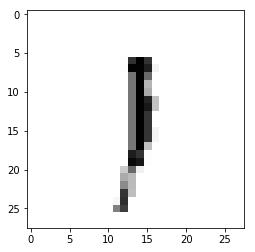

Epoch : 2 cost :  0.588498926596208
Accuracy : 0.1362
label : [1]
Prediction : [0]


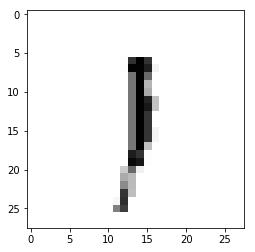

Epoch : 2 cost :  0.5926643436605279
Accuracy : 0.135
label : [1]
Prediction : [0]


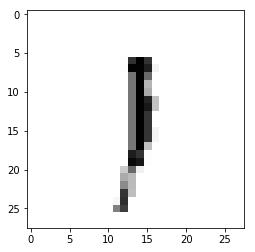

Epoch : 2 cost :  0.5968424008109352
Accuracy : 0.1316
label : [1]
Prediction : [0]


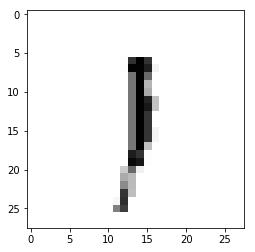

Epoch : 2 cost :  0.6009944980794732
Accuracy : 0.1281
label : [1]
Prediction : [0]


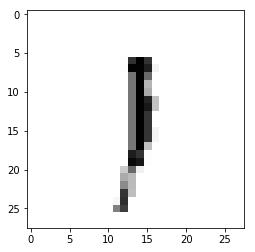

Epoch : 2 cost :  0.6051378198103471
Accuracy : 0.1277
label : [1]
Prediction : [0]


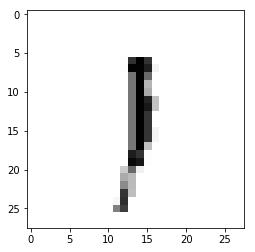

Epoch : 2 cost :  0.6093109872124411
Accuracy : 0.1271
label : [1]
Prediction : [0]


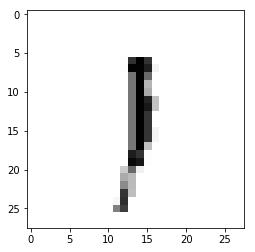

Epoch : 2 cost :  0.6134903825413097
Accuracy : 0.1303
label : [1]
Prediction : [0]


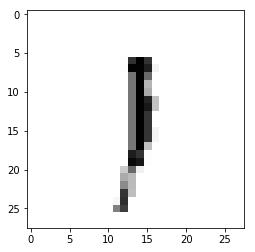

Epoch : 2 cost :  0.6176721308448098
Accuracy : 0.1279
label : [1]
Prediction : [0]


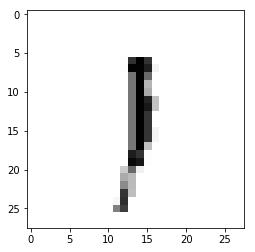

Epoch : 2 cost :  0.6218539237976074
Accuracy : 0.1283
label : [1]
Prediction : [0]


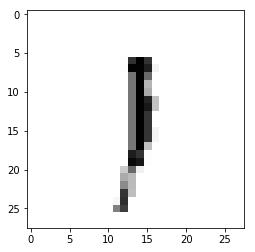

Epoch : 2 cost :  0.6260014247894287
Accuracy : 0.1287
label : [1]
Prediction : [0]


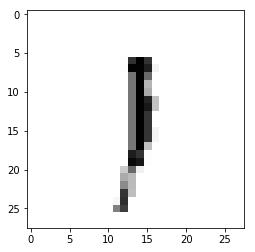

Epoch : 2 cost :  0.6301630423285743
Accuracy : 0.1281
label : [1]
Prediction : [0]


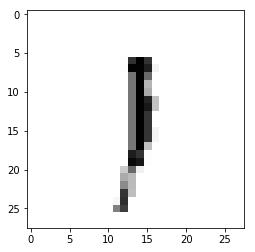

Epoch : 2 cost :  0.6343446514823219
Accuracy : 0.1277
label : [1]
Prediction : [0]


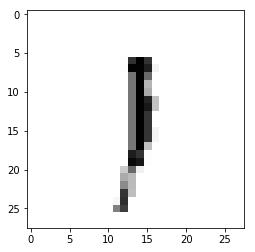

Epoch : 2 cost :  0.6385198896581475
Accuracy : 0.1281
label : [1]
Prediction : [0]


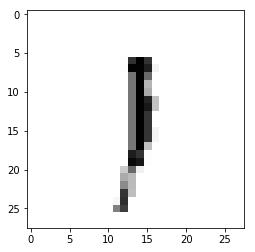

Epoch : 2 cost :  0.6426778346841985
Accuracy : 0.1276
label : [1]
Prediction : [0]


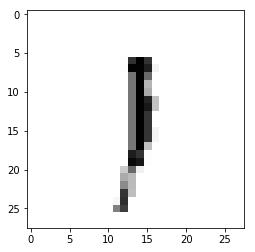

Epoch : 2 cost :  0.6468515322425148
Accuracy : 0.1272
label : [1]
Prediction : [0]


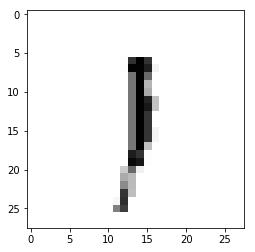

Epoch : 2 cost :  0.6510074034604159
Accuracy : 0.1279
label : [1]
Prediction : [0]


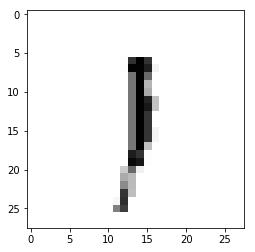

Epoch : 2 cost :  0.6551965136961503
Accuracy : 0.1276
label : [1]
Prediction : [0]


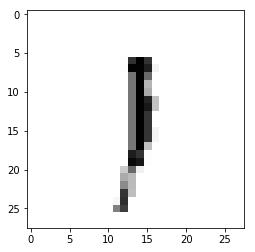

Epoch : 2 cost :  0.659375724358992
Accuracy : 0.13
label : [1]
Prediction : [0]


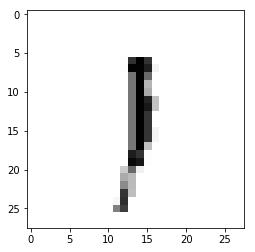

Epoch : 2 cost :  0.6635723599520595
Accuracy : 0.1297
label : [1]
Prediction : [0]


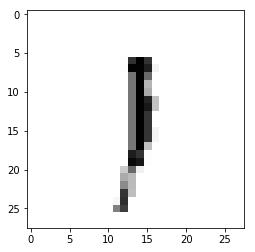

Epoch : 2 cost :  0.6677412561936811
Accuracy : 0.1311
label : [1]
Prediction : [0]


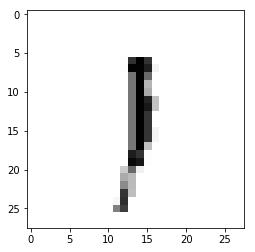

Epoch : 2 cost :  0.6719183575023303
Accuracy : 0.1305
label : [1]
Prediction : [0]


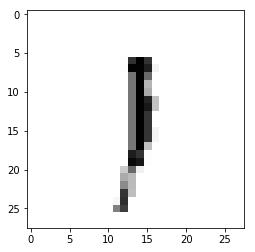

Epoch : 2 cost :  0.6761004187844015
Accuracy : 0.1311
label : [1]
Prediction : [0]


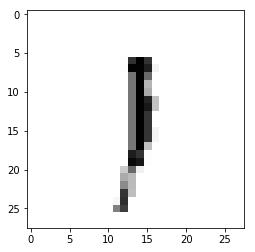

Epoch : 2 cost :  0.6802854126149956
Accuracy : 0.1285
label : [1]
Prediction : [0]


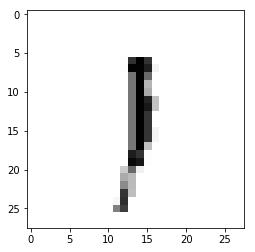

Epoch : 2 cost :  0.6844710644808681
Accuracy : 0.1298
label : [1]
Prediction : [0]


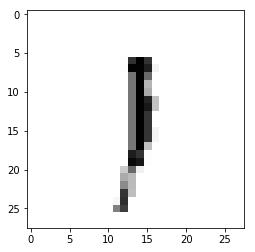

Epoch : 2 cost :  0.6886346093091097
Accuracy : 0.1306
label : [1]
Prediction : [0]


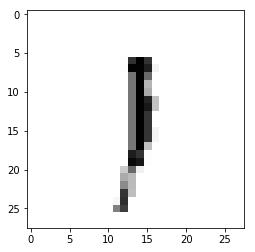

Epoch : 2 cost :  0.6928022943843494
Accuracy : 0.1311
label : [1]
Prediction : [0]


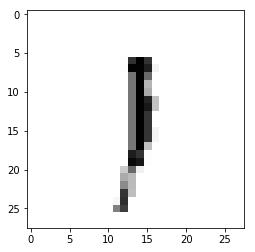

Epoch : 2 cost :  0.6969888292659412
Accuracy : 0.135
label : [1]
Prediction : [0]


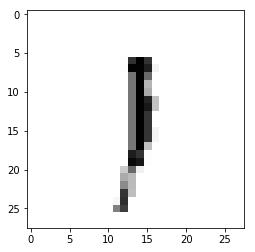

Epoch : 2 cost :  0.7011230884898791
Accuracy : 0.1334
label : [1]
Prediction : [0]


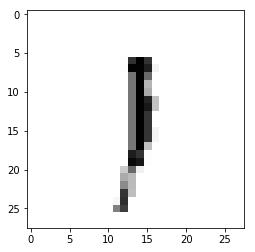

Epoch : 2 cost :  0.7052812008424237
Accuracy : 0.1315
label : [1]
Prediction : [0]


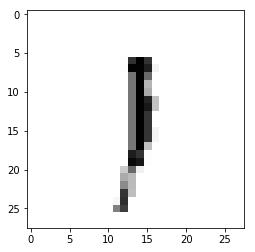

Epoch : 2 cost :  0.7094613031907514
Accuracy : 0.1336
label : [1]
Prediction : [0]


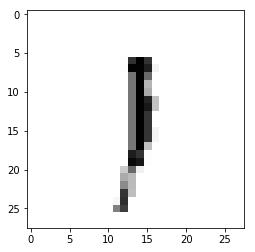

Epoch : 2 cost :  0.7136505469408901
Accuracy : 0.1313
label : [1]
Prediction : [0]


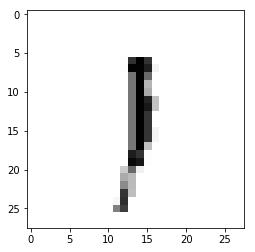

Epoch : 2 cost :  0.7178214467655528
Accuracy : 0.1298
label : [1]
Prediction : [0]


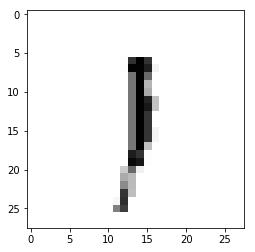

Epoch : 2 cost :  0.7219981072165749
Accuracy : 0.1288
label : [1]
Prediction : [0]


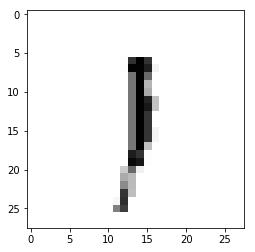

Epoch : 2 cost :  0.7261591625213623
Accuracy : 0.1306
label : [1]
Prediction : [0]


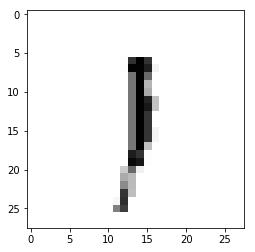

Epoch : 2 cost :  0.730342043096369
Accuracy : 0.1308
label : [1]
Prediction : [0]


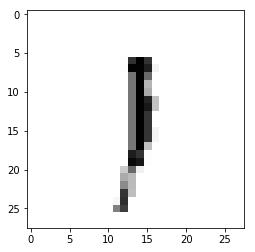

Epoch : 2 cost :  0.7345234948938543
Accuracy : 0.133
label : [1]
Prediction : [0]


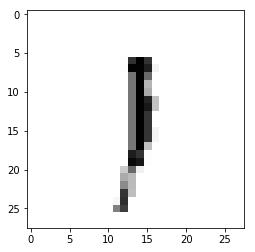

Epoch : 2 cost :  0.7386921808936379
Accuracy : 0.1318
label : [1]
Prediction : [0]


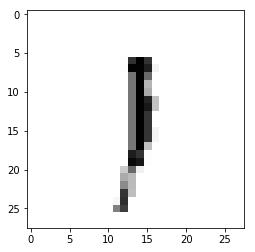

Epoch : 2 cost :  0.7428632831573486
Accuracy : 0.1306
label : [1]
Prediction : [0]


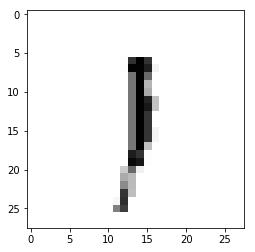

Epoch : 2 cost :  0.7470169765299016
Accuracy : 0.1311
label : [1]
Prediction : [0]


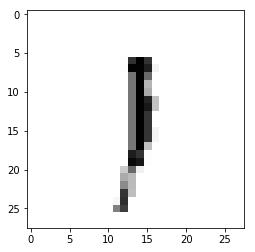

Epoch : 2 cost :  0.7511961082978682
Accuracy : 0.1296
label : [1]
Prediction : [0]


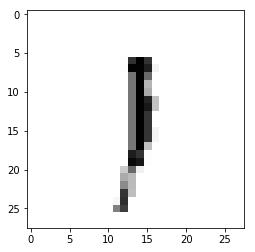

Epoch : 2 cost :  0.7553740973906083
Accuracy : 0.1312
label : [1]
Prediction : [0]


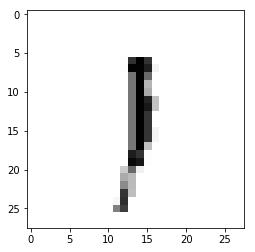

Epoch : 2 cost :  0.7595428930629383
Accuracy : 0.1326
label : [1]
Prediction : [0]


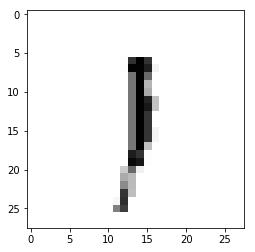

Epoch : 2 cost :  0.7637121126868508
Accuracy : 0.1345
label : [1]
Prediction : [0]


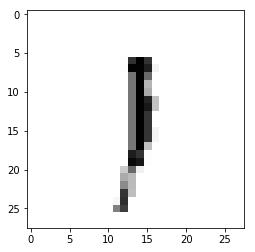

Epoch : 2 cost :  0.7678893037275835
Accuracy : 0.1339
label : [1]
Prediction : [0]


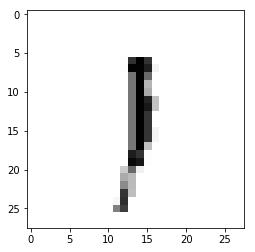

Epoch : 2 cost :  0.7720433135466143
Accuracy : 0.1344
label : [1]
Prediction : [0]


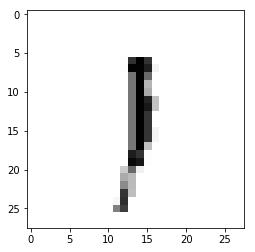

Epoch : 2 cost :  0.7762185313484886
Accuracy : 0.1342
label : [1]
Prediction : [0]


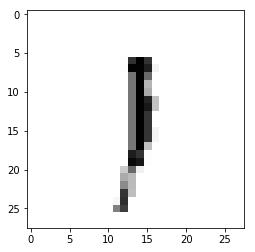

Epoch : 2 cost :  0.7804024414582686
Accuracy : 0.1325
label : [1]
Prediction : [0]


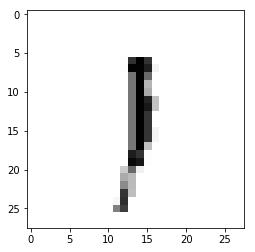

Epoch : 2 cost :  0.784579389745539
Accuracy : 0.134
label : [1]
Prediction : [0]


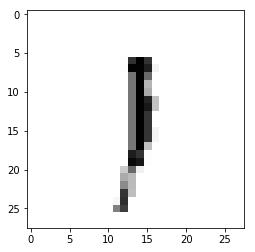

Epoch : 2 cost :  0.7887532329559327
Accuracy : 0.1343
label : [1]
Prediction : [0]


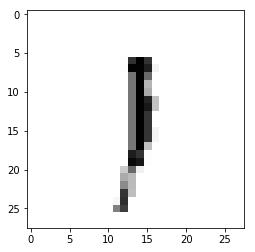

Epoch : 2 cost :  0.7929126605120573
Accuracy : 0.1328
label : [1]
Prediction : [0]


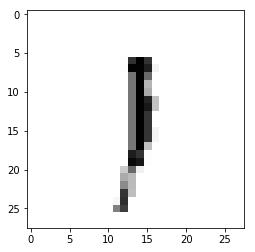

Epoch : 2 cost :  0.7970654834400525
Accuracy : 0.1313
label : [1]
Prediction : [0]


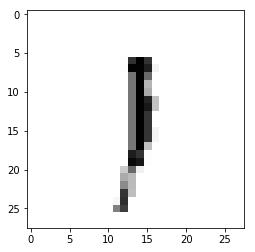

Epoch : 2 cost :  0.8012193068591031
Accuracy : 0.1292
label : [1]
Prediction : [0]


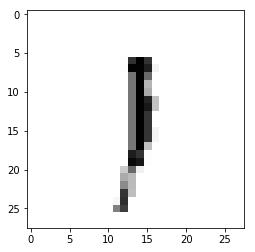

Epoch : 2 cost :  0.8053890085220338
Accuracy : 0.1296
label : [1]
Prediction : [0]


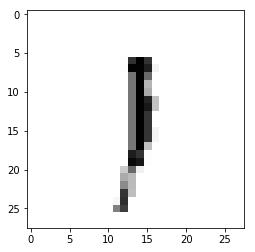

Epoch : 2 cost :  0.8095722137797964
Accuracy : 0.1282
label : [1]
Prediction : [0]


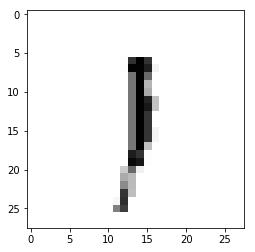

Epoch : 2 cost :  0.8137313799424606
Accuracy : 0.1296
label : [1]
Prediction : [0]


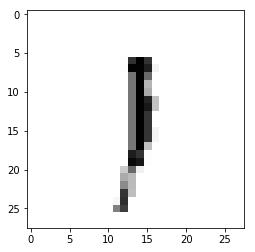

Epoch : 2 cost :  0.8179197445782749
Accuracy : 0.1308
label : [1]
Prediction : [0]


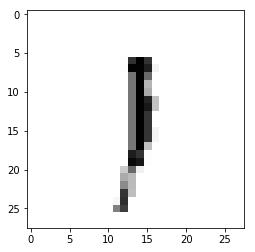

Epoch : 2 cost :  0.8220884093371306
Accuracy : 0.1316
label : [1]
Prediction : [0]


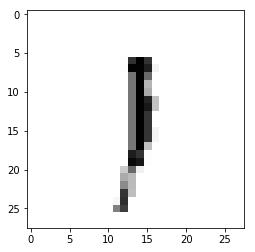

Epoch : 2 cost :  0.826276521249251
Accuracy : 0.1327
label : [1]
Prediction : [0]


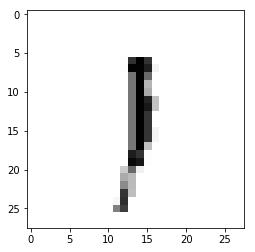

Epoch : 2 cost :  0.8304541058973833
Accuracy : 0.1342
label : [1]
Prediction : [0]


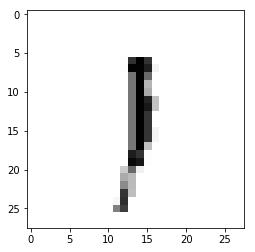

Epoch : 2 cost :  0.8346240056644787
Accuracy : 0.1339
label : [1]
Prediction : [0]


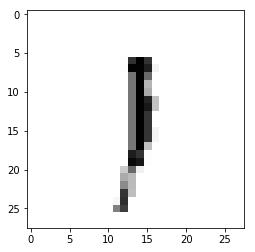

Epoch : 2 cost :  0.8387985996766525
Accuracy : 0.1339
label : [1]
Prediction : [0]


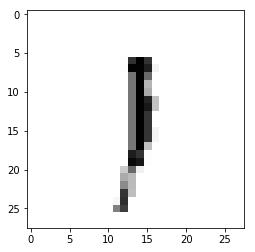

Epoch : 2 cost :  0.8429731165279043
Accuracy : 0.1336
label : [1]
Prediction : [0]


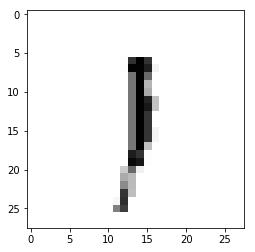

Epoch : 2 cost :  0.847119372107766
Accuracy : 0.1331
label : [1]
Prediction : [0]


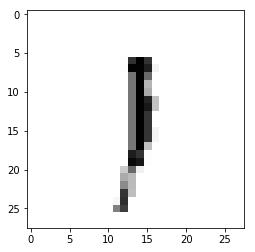

Epoch : 2 cost :  0.8512886771288786
Accuracy : 0.1328
label : [1]
Prediction : [0]


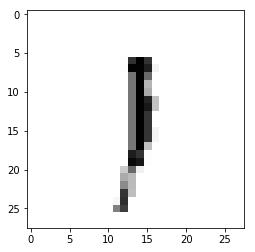

Epoch : 2 cost :  0.8554775563153354
Accuracy : 0.1359
label : [1]
Prediction : [0]


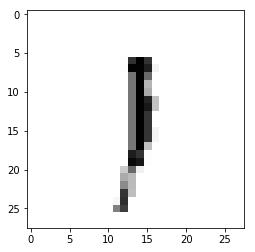

Epoch : 2 cost :  0.8596566495028409
Accuracy : 0.1371
label : [1]
Prediction : [0]


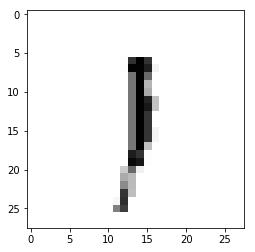

Epoch : 2 cost :  0.8638396952368996
Accuracy : 0.1422
label : [1]
Prediction : [0]


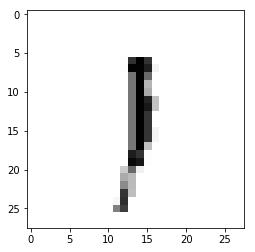

Epoch : 2 cost :  0.8680118521777066
Accuracy : 0.144
label : [1]
Prediction : [0]


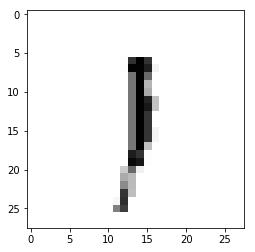

Epoch : 2 cost :  0.8721837867390025
Accuracy : 0.1466
label : [1]
Prediction : [0]


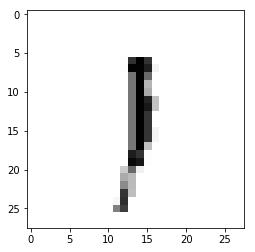

Epoch : 2 cost :  0.8763637729124589
Accuracy : 0.1517
label : [1]
Prediction : [0]


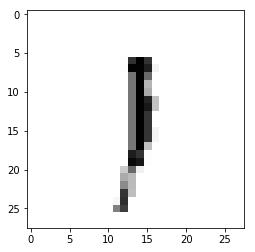

Epoch : 2 cost :  0.880503812269731
Accuracy : 0.1438
label : [1]
Prediction : [0]


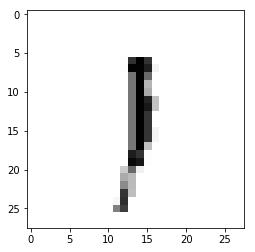

Epoch : 2 cost :  0.8846697802977128
Accuracy : 0.1391
label : [1]
Prediction : [0]


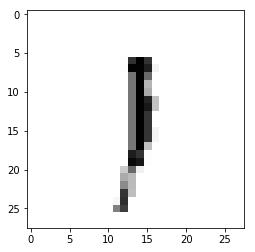

Epoch : 2 cost :  0.8888355532559481
Accuracy : 0.1373
label : [1]
Prediction : [0]


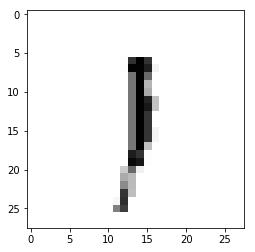

Epoch : 2 cost :  0.8930339483781293
Accuracy : 0.1385
label : [1]
Prediction : [0]


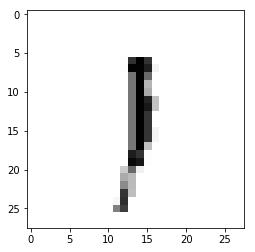

Epoch : 2 cost :  0.8972038932280106
Accuracy : 0.1373
label : [1]
Prediction : [0]


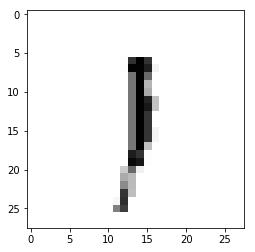

Epoch : 2 cost :  0.9013817258314653
Accuracy : 0.1387
label : [1]
Prediction : [0]


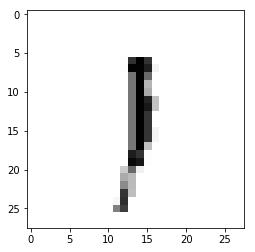

Epoch : 2 cost :  0.9055584287643432
Accuracy : 0.1395
label : [1]
Prediction : [0]


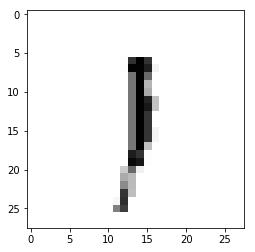

Epoch : 2 cost :  0.9097254167903553
Accuracy : 0.1403
label : [1]
Prediction : [0]


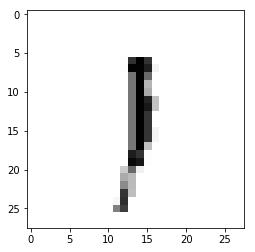

Epoch : 2 cost :  0.9138865007053723
Accuracy : 0.137
label : [1]
Prediction : [0]


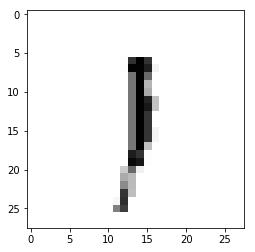

Epoch : 2 cost :  0.9180654217980125
Accuracy : 0.1399
label : [1]
Prediction : [0]


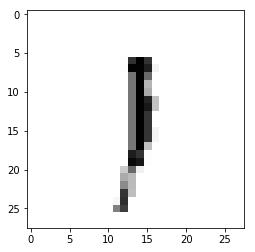

Epoch : 2 cost :  0.9222308683395386
Accuracy : 0.1413
label : [1]
Prediction : [0]


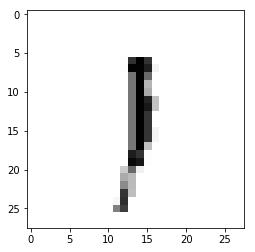

Epoch : 2 cost :  0.9264347839355469
Accuracy : 0.1425
label : [1]
Prediction : [0]


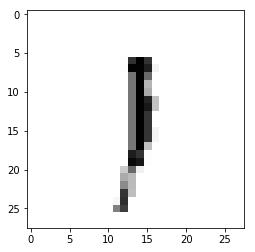

Epoch : 2 cost :  0.9305887551741167
Accuracy : 0.1428
label : [1]
Prediction : [0]


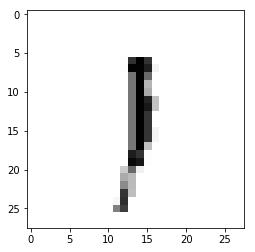

Epoch : 2 cost :  0.9347669826854359
Accuracy : 0.1426
label : [1]
Prediction : [0]


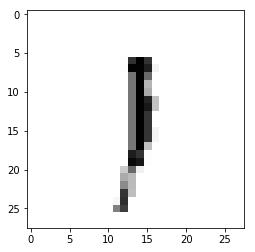

Epoch : 2 cost :  0.9389343868602406
Accuracy : 0.145
label : [1]
Prediction : [0]


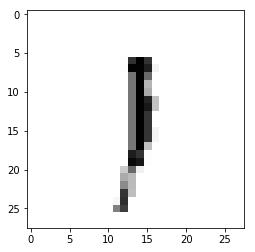

Epoch : 2 cost :  0.9431212559613315
Accuracy : 0.1459
label : [1]
Prediction : [0]


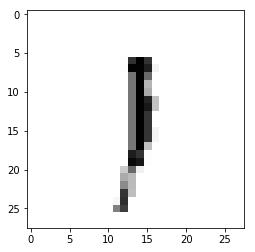

Epoch : 2 cost :  0.9472538844021884
Accuracy : 0.1443
label : [1]
Prediction : [0]


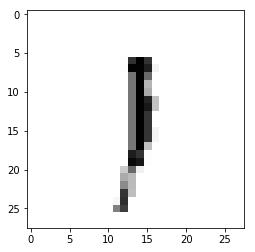

Epoch : 2 cost :  0.9514360267465765
Accuracy : 0.1394
label : [1]
Prediction : [0]


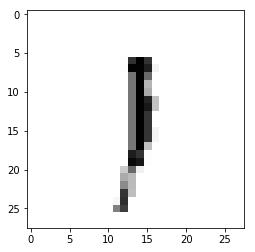

Epoch : 2 cost :  0.9556072092056274
Accuracy : 0.1374
label : [1]
Prediction : [0]


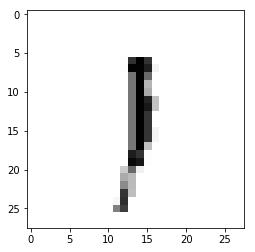

Epoch : 2 cost :  0.9597828682986171
Accuracy : 0.1364
label : [1]
Prediction : [0]


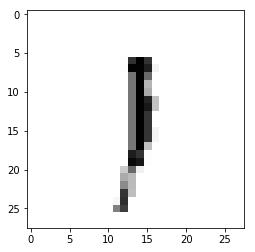

Epoch : 2 cost :  0.963959724252874
Accuracy : 0.1436
label : [1]
Prediction : [0]


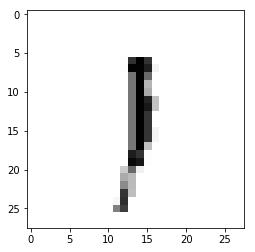

Epoch : 2 cost :  0.968133646358143
Accuracy : 0.1432
label : [1]
Prediction : [0]


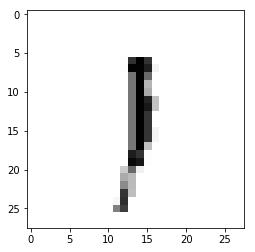

Epoch : 2 cost :  0.9723066598718815
Accuracy : 0.1455
label : [1]
Prediction : [0]


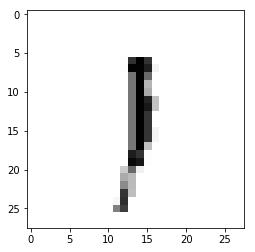

Epoch : 2 cost :  0.9764846298911353
Accuracy : 0.1441
label : [1]
Prediction : [0]


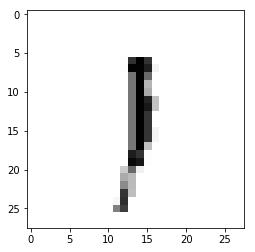

Epoch : 2 cost :  0.9806567014347422
Accuracy : 0.1431
label : [1]
Prediction : [0]


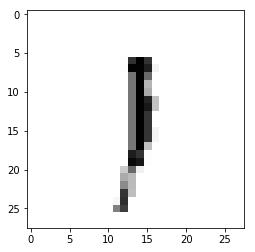

Epoch : 2 cost :  0.984832158088684
Accuracy : 0.1418
label : [1]
Prediction : [0]


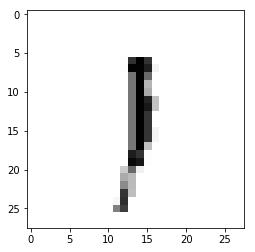

Epoch : 2 cost :  0.9889872928099197
Accuracy : 0.1426
label : [1]
Prediction : [0]


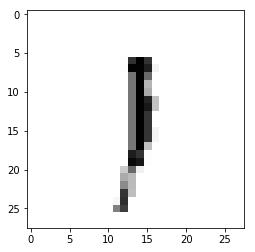

Epoch : 2 cost :  0.9931726256283845
Accuracy : 0.1449
label : [1]
Prediction : [0]


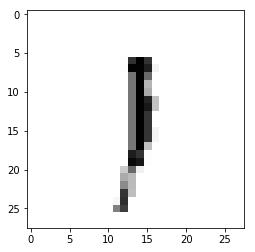

Epoch : 2 cost :  0.9973314003510907
Accuracy : 0.1457
label : [1]
Prediction : [0]


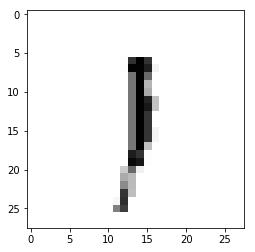

Epoch : 2 cost :  1.001490859551863
Accuracy : 0.1405
label : [1]
Prediction : [0]


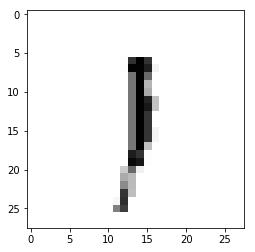

Epoch : 2 cost :  1.0056473658301612
Accuracy : 0.1377
label : [1]
Prediction : [0]


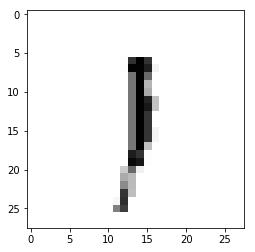

Epoch : 2 cost :  1.0098097224669023
Accuracy : 0.1403
label : [1]
Prediction : [0]


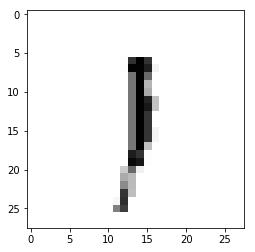

Epoch : 2 cost :  1.0139718796990134
Accuracy : 0.1381
label : [1]
Prediction : [0]


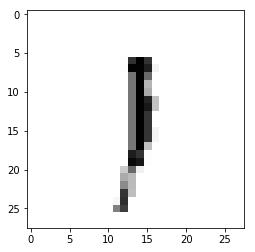

Epoch : 2 cost :  1.0181450570713388
Accuracy : 0.1494
label : [1]
Prediction : [0]


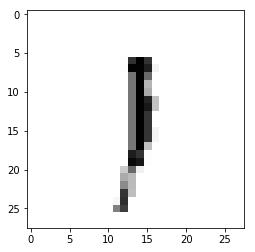

Epoch : 2 cost :  1.022304646318609
Accuracy : 0.1494
label : [1]
Prediction : [0]


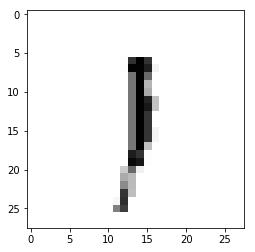

Epoch : 2 cost :  1.026474305933172
Accuracy : 0.1518
label : [1]
Prediction : [0]


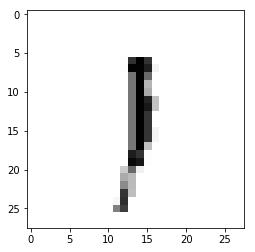

Epoch : 2 cost :  1.0306481660496105
Accuracy : 0.1695
label : [1]
Prediction : [0]


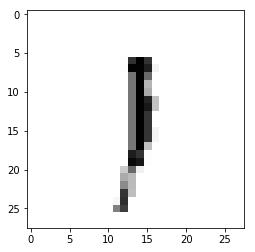

Epoch : 2 cost :  1.0348046649586071
Accuracy : 0.1498
label : [1]
Prediction : [0]


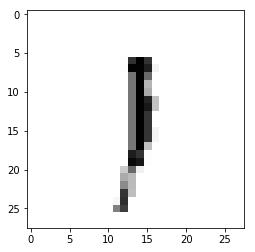

Epoch : 2 cost :  1.0389785723252731
Accuracy : 0.1575
label : [1]
Prediction : [0]


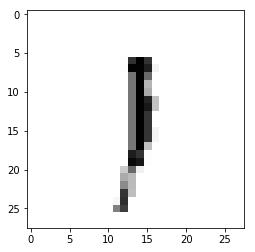

Epoch : 2 cost :  1.0431258353320036
Accuracy : 0.1482
label : [1]
Prediction : [0]


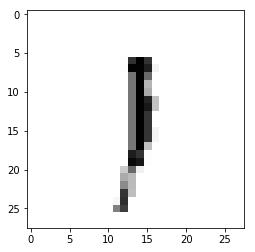

Epoch : 2 cost :  1.0472800488905474
Accuracy : 0.1523
label : [1]
Prediction : [0]


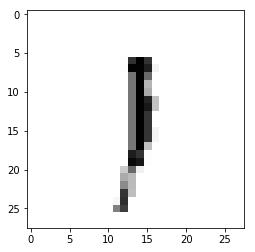

Epoch : 2 cost :  1.0514685626463458
Accuracy : 0.1736
label : [1]
Prediction : [0]


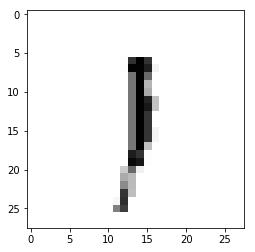

Epoch : 2 cost :  1.0556294983083554
Accuracy : 0.1609
label : [1]
Prediction : [0]


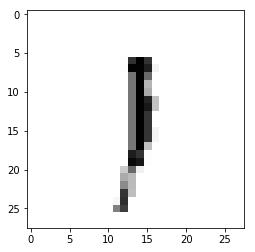

Epoch : 2 cost :  1.0597904803536158
Accuracy : 0.1609
label : [1]
Prediction : [0]


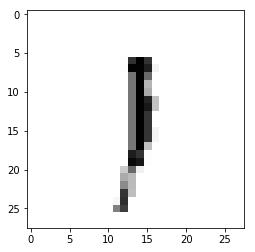

Epoch : 2 cost :  1.0639536636525937
Accuracy : 0.1668
label : [1]
Prediction : [0]


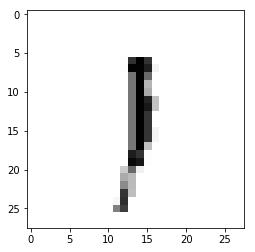

Epoch : 2 cost :  1.0681076305562802
Accuracy : 0.1524
label : [1]
Prediction : [0]


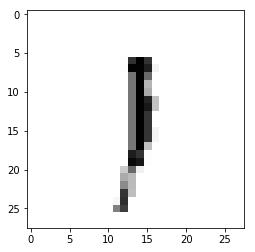

Epoch : 2 cost :  1.0722951693968341
Accuracy : 0.1525
label : [1]
Prediction : [0]


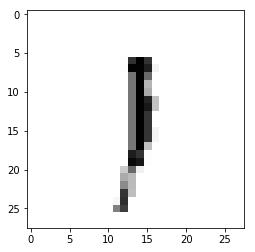

Epoch : 2 cost :  1.07645678173412
Accuracy : 0.157
label : [1]
Prediction : [0]


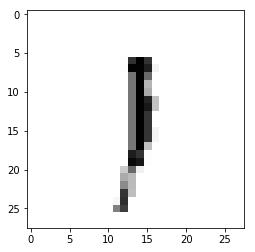

Epoch : 2 cost :  1.0806354331970216
Accuracy : 0.1755
label : [1]
Prediction : [0]


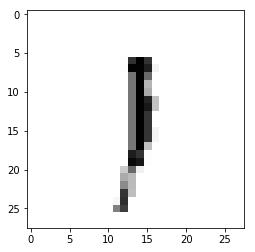

Epoch : 2 cost :  1.0848159538615836
Accuracy : 0.1679
label : [1]
Prediction : [0]


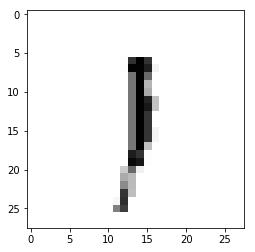

Epoch : 2 cost :  1.0889691114425661
Accuracy : 0.1534
label : [1]
Prediction : [0]


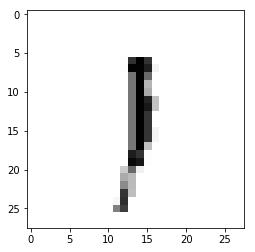

Epoch : 2 cost :  1.093125200705095
Accuracy : 0.153
label : [1]
Prediction : [0]


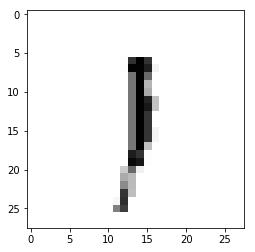

Epoch : 2 cost :  1.0972812912680887
Accuracy : 0.1464
label : [1]
Prediction : [0]


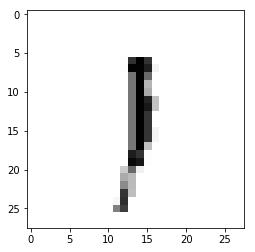

Epoch : 2 cost :  1.1014666301553901
Accuracy : 0.1398
label : [1]
Prediction : [0]


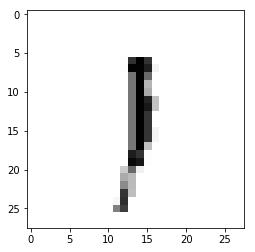

Epoch : 2 cost :  1.1056301307678225
Accuracy : 0.1409
label : [1]
Prediction : [0]


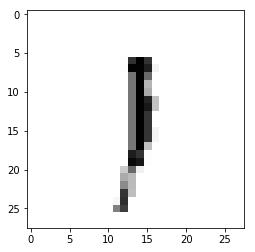

Epoch : 2 cost :  1.1098045097697866
Accuracy : 0.1405
label : [1]
Prediction : [0]


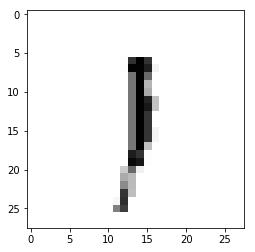

Epoch : 2 cost :  1.1139886327223345
Accuracy : 0.1417
label : [1]
Prediction : [0]


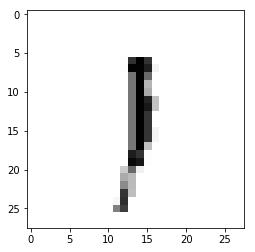

Epoch : 2 cost :  1.1181544282219626
Accuracy : 0.1408
label : [1]
Prediction : [0]


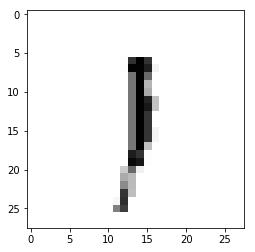

Epoch : 2 cost :  1.1223246825825084
Accuracy : 0.1394
label : [1]
Prediction : [0]


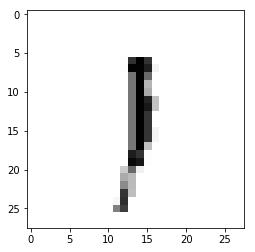

Epoch : 2 cost :  1.1265010647340254
Accuracy : 0.1397
label : [1]
Prediction : [0]


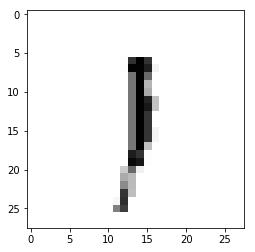

Epoch : 2 cost :  1.130664639039473
Accuracy : 0.1412
label : [1]
Prediction : [0]


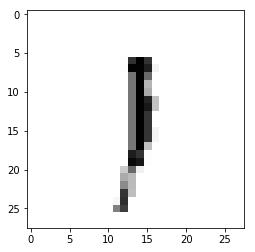

Epoch : 2 cost :  1.1348182730241254
Accuracy : 0.1408
label : [1]
Prediction : [0]


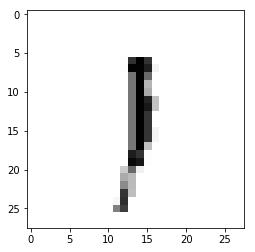

Epoch : 2 cost :  1.1389784041318025
Accuracy : 0.1399
label : [1]
Prediction : [0]


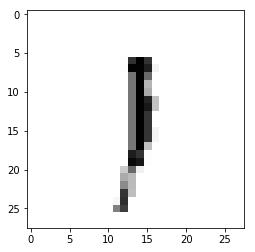

Epoch : 2 cost :  1.1431560828469014
Accuracy : 0.142
label : [1]
Prediction : [0]


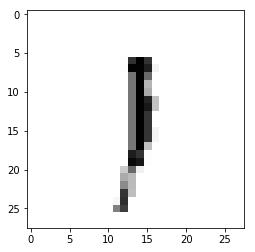

Epoch : 2 cost :  1.147307930426164
Accuracy : 0.1425
label : [1]
Prediction : [0]


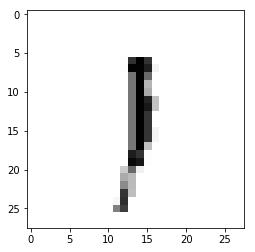

Epoch : 2 cost :  1.1514804311232132
Accuracy : 0.1428
label : [1]
Prediction : [0]


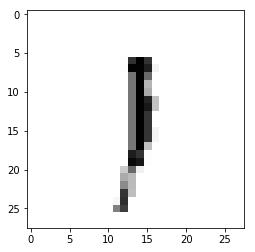

Epoch : 2 cost :  1.1556359876285898
Accuracy : 0.1409
label : [1]
Prediction : [0]


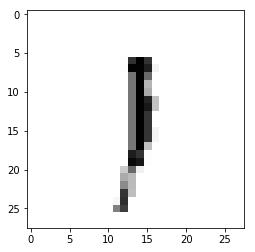

Epoch : 2 cost :  1.1598303231326015
Accuracy : 0.14
label : [1]
Prediction : [0]


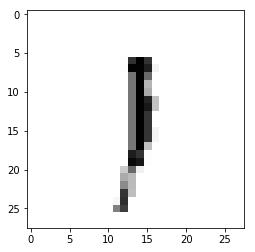

Epoch : 2 cost :  1.164006844433871
Accuracy : 0.1405
label : [1]
Prediction : [0]


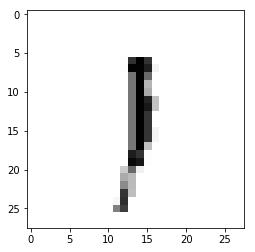

Epoch : 2 cost :  1.16818704214963
Accuracy : 0.1398
label : [1]
Prediction : [0]


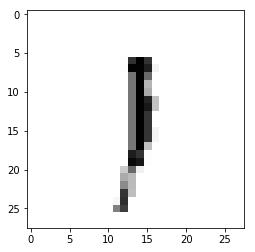

Epoch : 2 cost :  1.1723704307729543
Accuracy : 0.144
label : [1]
Prediction : [0]


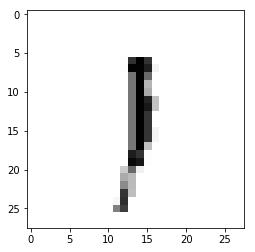

Epoch : 2 cost :  1.1765413631092414
Accuracy : 0.1409
label : [1]
Prediction : [0]


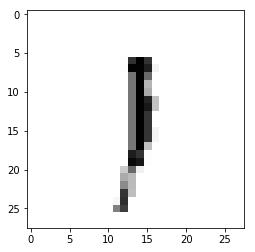

Epoch : 2 cost :  1.180720379135825
Accuracy : 0.142
label : [1]
Prediction : [0]


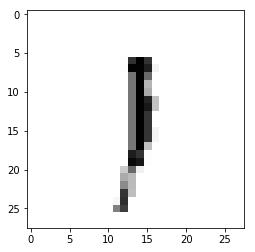

Epoch : 2 cost :  1.1848914813995357
Accuracy : 0.1432
label : [1]
Prediction : [0]


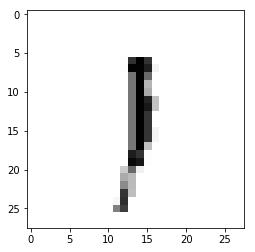

Epoch : 2 cost :  1.189068147485906
Accuracy : 0.1292
label : [1]
Prediction : [0]


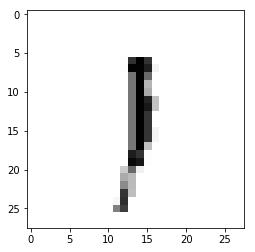

Epoch : 2 cost :  1.193230379278009
Accuracy : 0.1297
label : [1]
Prediction : [0]


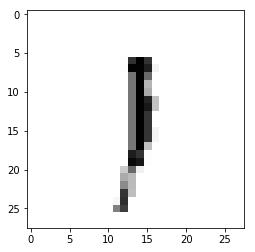

Epoch : 2 cost :  1.1974095513603897
Accuracy : 0.1294
label : [1]
Prediction : [0]


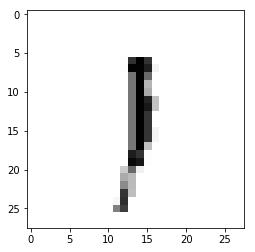

Epoch : 2 cost :  1.2015708117051551
Accuracy : 0.1312
label : [1]
Prediction : [0]


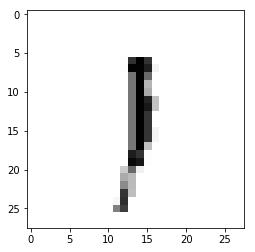

Epoch : 2 cost :  1.2057286041433155
Accuracy : 0.1458
label : [1]
Prediction : [0]


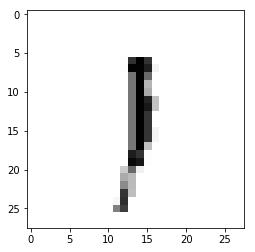

Epoch : 2 cost :  1.209894704818725
Accuracy : 0.144
label : [1]
Prediction : [0]


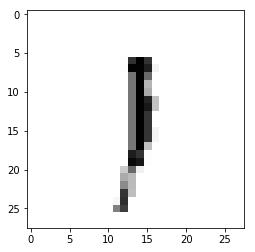

Epoch : 2 cost :  1.2140750919688825
Accuracy : 0.1534
label : [1]
Prediction : [0]


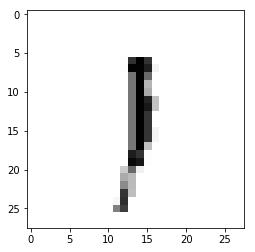

Epoch : 2 cost :  1.2182417761195783
Accuracy : 0.1515
label : [1]
Prediction : [0]


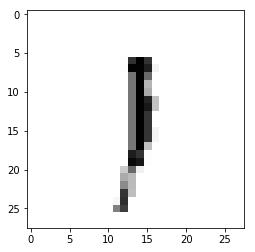

Epoch : 2 cost :  1.2224076557159418
Accuracy : 0.148
label : [1]
Prediction : [0]


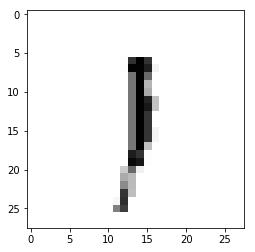

Epoch : 2 cost :  1.2265687604383984
Accuracy : 0.1462
label : [1]
Prediction : [0]


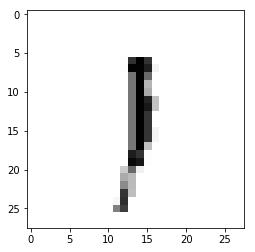

Epoch : 2 cost :  1.2307207502018316
Accuracy : 0.1468
label : [1]
Prediction : [0]


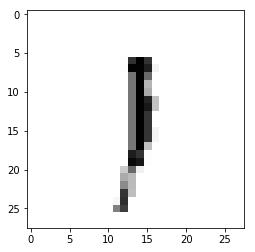

Epoch : 2 cost :  1.234882848046042
Accuracy : 0.1405
label : [1]
Prediction : [0]


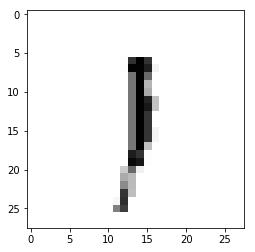

Epoch : 2 cost :  1.2390563089197326
Accuracy : 0.1493
label : [1]
Prediction : [0]


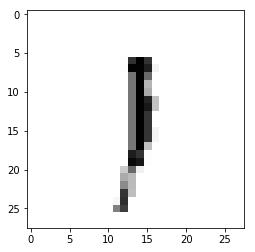

Epoch : 2 cost :  1.2432176919416942
Accuracy : 0.1517
label : [1]
Prediction : [0]


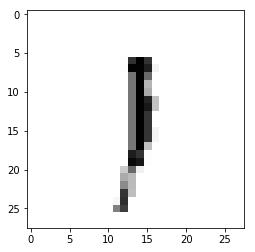

Epoch : 2 cost :  1.2473614350232205
Accuracy : 0.1622
label : [1]
Prediction : [0]


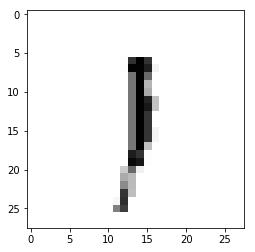

Epoch : 2 cost :  1.2515364633906965
Accuracy : 0.1432
label : [1]
Prediction : [0]


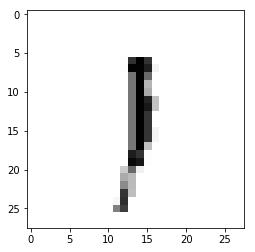

Epoch : 2 cost :  1.2556983783028335
Accuracy : 0.1465
label : [1]
Prediction : [0]


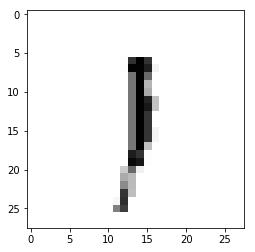

Epoch : 2 cost :  1.2598618563738728
Accuracy : 0.1465
label : [1]
Prediction : [0]


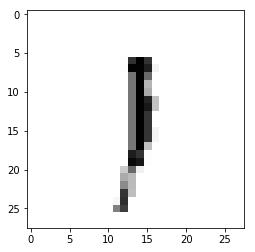

Epoch : 2 cost :  1.2640164388309818
Accuracy : 0.1356
label : [1]
Prediction : [0]


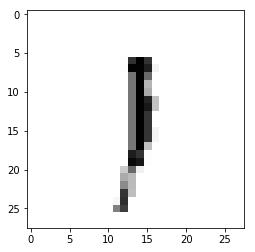

Epoch : 2 cost :  1.268196301026777
Accuracy : 0.136
label : [1]
Prediction : [0]


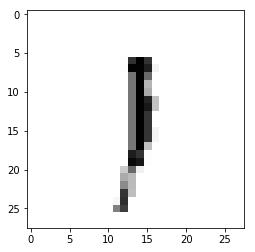

Epoch : 2 cost :  1.2723689924586894
Accuracy : 0.1452
label : [1]
Prediction : [0]


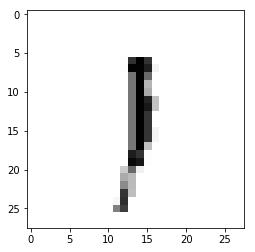

Epoch : 2 cost :  1.2765175910429511
Accuracy : 0.137
label : [1]
Prediction : [0]


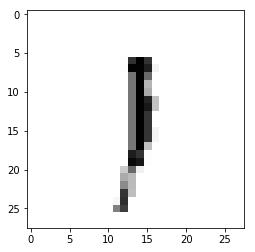

Epoch : 2 cost :  1.2806792025132603
Accuracy : 0.1464
label : [1]
Prediction : [0]


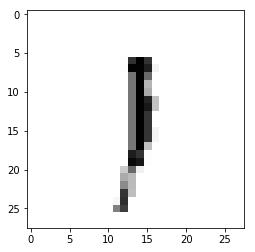

Epoch : 2 cost :  1.2848430711572811
Accuracy : 0.1547
label : [1]
Prediction : [0]


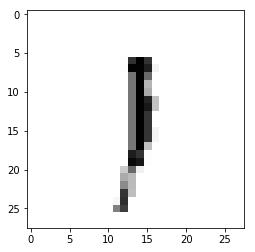

Epoch : 2 cost :  1.2889839510484167
Accuracy : 0.1382
label : [1]
Prediction : [0]


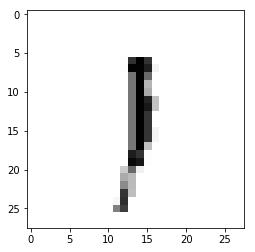

Epoch : 2 cost :  1.2931308538263486
Accuracy : 0.1374
label : [1]
Prediction : [0]


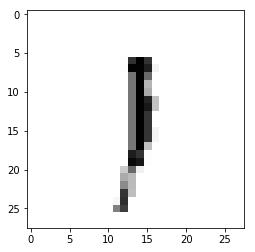

Epoch : 2 cost :  1.297312911207025
Accuracy : 0.1397
label : [1]
Prediction : [0]


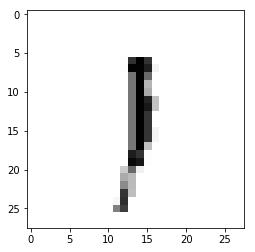

Epoch : 2 cost :  1.301474831321022
Accuracy : 0.1371
label : [1]
Prediction : [0]


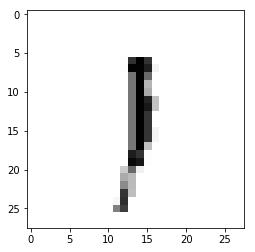

Epoch : 2 cost :  1.3056427435441444
Accuracy : 0.1415
label : [1]
Prediction : [0]


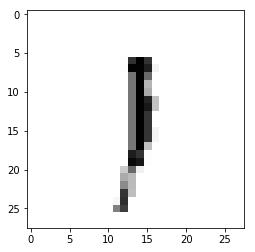

Epoch : 2 cost :  1.3097911336205217
Accuracy : 0.1394
label : [1]
Prediction : [0]


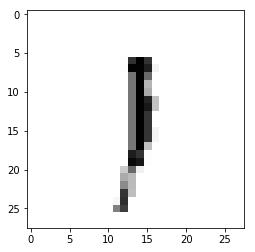

Epoch : 2 cost :  1.3139742777564303
Accuracy : 0.1299
label : [1]
Prediction : [0]


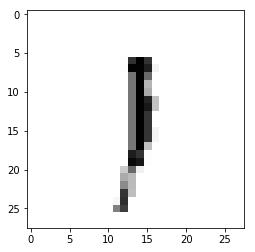

Epoch : 2 cost :  1.3181550637158475
Accuracy : 0.1288
label : [1]
Prediction : [0]


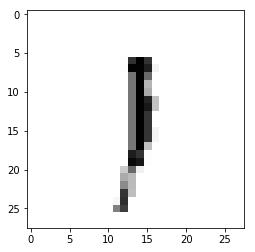

Epoch : 2 cost :  1.3223090275851157
Accuracy : 0.1288
label : [1]
Prediction : [0]


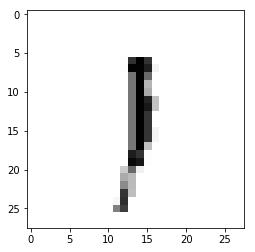

Epoch : 2 cost :  1.3264737892150873
Accuracy : 0.1299
label : [1]
Prediction : [0]


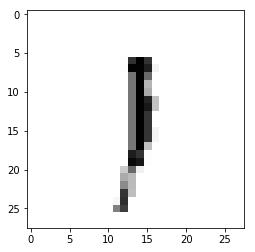

Epoch : 2 cost :  1.3306605924259527
Accuracy : 0.1327
label : [1]
Prediction : [0]


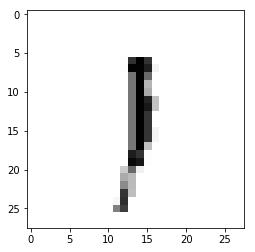

Epoch : 2 cost :  1.3348294474861833
Accuracy : 0.1322
label : [1]
Prediction : [0]


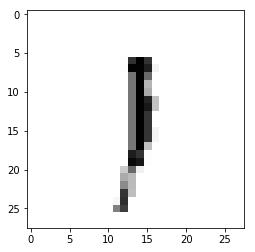

Epoch : 2 cost :  1.3389852038296781
Accuracy : 0.1311
label : [1]
Prediction : [0]


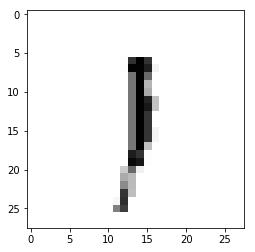

Epoch : 2 cost :  1.3431761767647479
Accuracy : 0.1276
label : [1]
Prediction : [0]


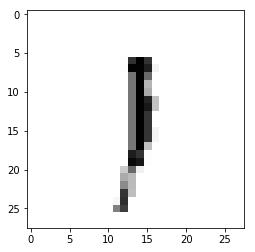

Epoch : 2 cost :  1.3473208041624585
Accuracy : 0.1331
label : [1]
Prediction : [0]


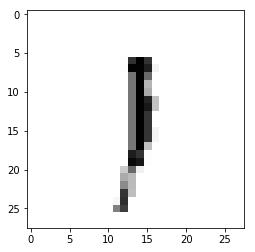

Epoch : 2 cost :  1.3514740250327366
Accuracy : 0.1319
label : [1]
Prediction : [0]


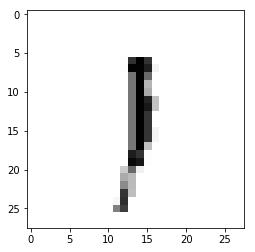

Epoch : 2 cost :  1.3556499424847686
Accuracy : 0.1362
label : [1]
Prediction : [0]


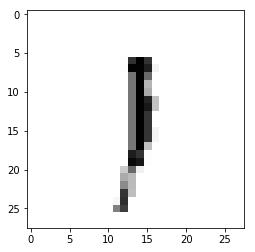

Epoch : 2 cost :  1.3598234228654338
Accuracy : 0.1354
label : [1]
Prediction : [0]


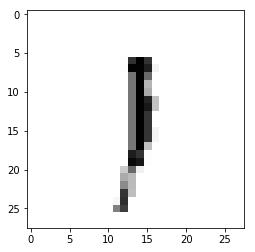

Epoch : 2 cost :  1.3639758400483561
Accuracy : 0.1323
label : [1]
Prediction : [0]


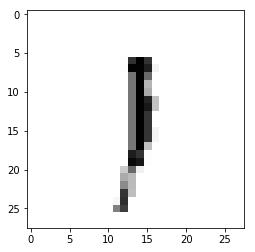

Epoch : 2 cost :  1.368156176913868
Accuracy : 0.1338
label : [1]
Prediction : [0]


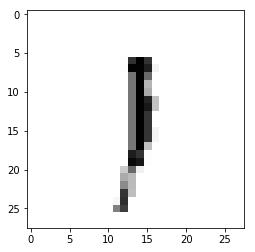

Epoch : 2 cost :  1.372323054400357
Accuracy : 0.1327
label : [1]
Prediction : [0]


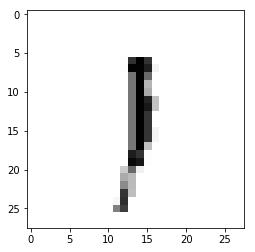

Epoch : 2 cost :  1.3764693632992828
Accuracy : 0.1336
label : [1]
Prediction : [0]


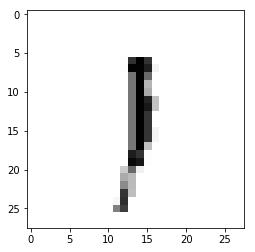

Epoch : 2 cost :  1.3806551673195575
Accuracy : 0.1352
label : [1]
Prediction : [0]


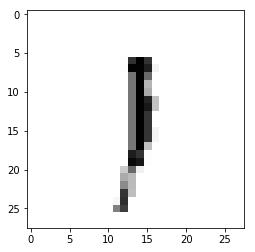

Epoch : 2 cost :  1.3848208319057114
Accuracy : 0.1361
label : [1]
Prediction : [0]


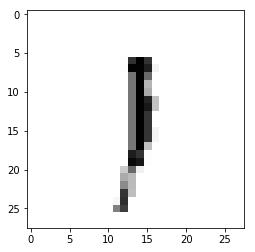

Epoch : 2 cost :  1.3889834789796305
Accuracy : 0.1344
label : [1]
Prediction : [0]


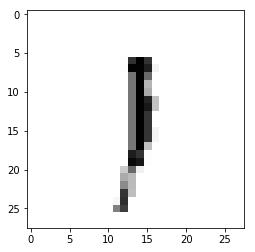

Epoch : 2 cost :  1.3931591077284375
Accuracy : 0.1341
label : [1]
Prediction : [0]


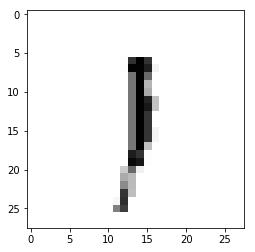

Epoch : 2 cost :  1.3973063169826156
Accuracy : 0.13
label : [1]
Prediction : [0]


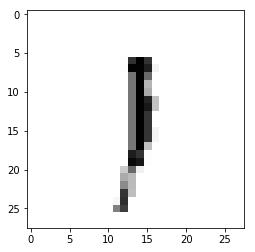

Epoch : 2 cost :  1.4014681729403404
Accuracy : 0.1351
label : [1]
Prediction : [0]


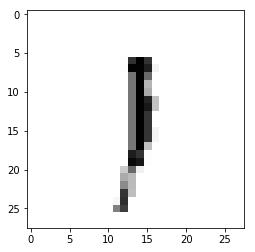

Epoch : 2 cost :  1.4056398781863122
Accuracy : 0.1313
label : [1]
Prediction : [0]


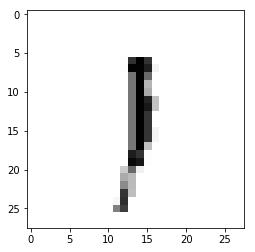

Epoch : 2 cost :  1.409793732383034
Accuracy : 0.1455
label : [1]
Prediction : [0]


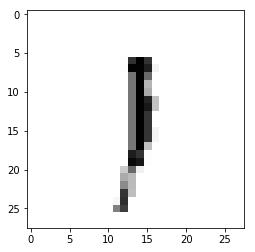

Epoch : 2 cost :  1.413962854038585
Accuracy : 0.1311
label : [1]
Prediction : [0]


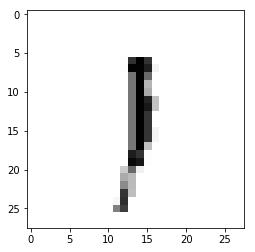

Epoch : 2 cost :  1.4181336671655824
Accuracy : 0.1435
label : [1]
Prediction : [0]


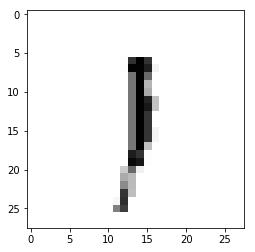

Epoch : 2 cost :  1.4223074891350482
Accuracy : 0.1449
label : [1]
Prediction : [0]


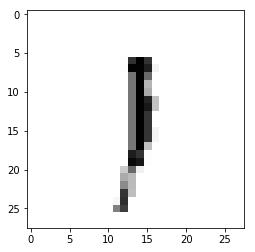

Epoch : 2 cost :  1.4264543685046105
Accuracy : 0.145
label : [1]
Prediction : [0]


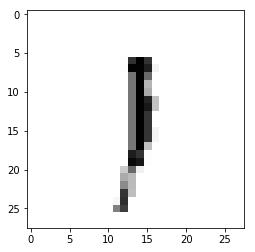

Epoch : 2 cost :  1.4306263347105541
Accuracy : 0.1426
label : [1]
Prediction : [0]


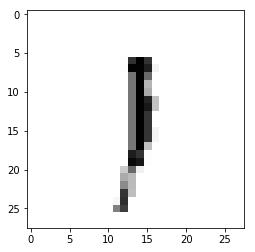

Epoch : 2 cost :  1.4347866552526296
Accuracy : 0.1444
label : [1]
Prediction : [0]


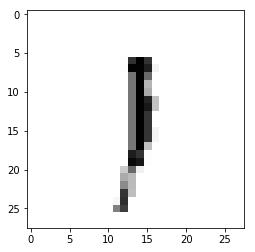

Epoch : 2 cost :  1.4389630452069364
Accuracy : 0.1317
label : [1]
Prediction : [0]


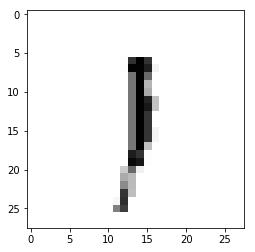

Epoch : 2 cost :  1.4431274336034596
Accuracy : 0.1354
label : [1]
Prediction : [0]


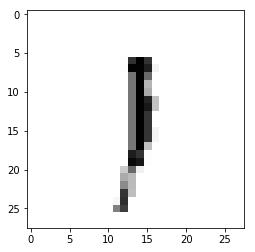

Epoch : 2 cost :  1.4472948247736146
Accuracy : 0.1357
label : [1]
Prediction : [0]


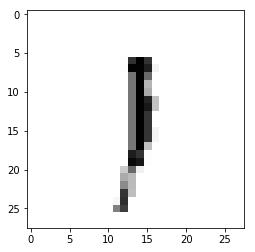

Epoch : 2 cost :  1.451450617963617
Accuracy : 0.1354
label : [1]
Prediction : [0]


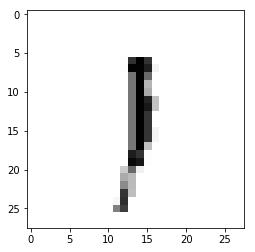

Epoch : 2 cost :  1.4556281939419828
Accuracy : 0.1354
label : [1]
Prediction : [0]


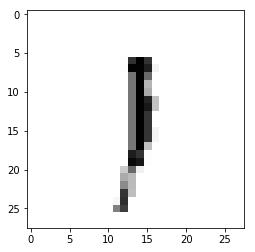

Epoch : 2 cost :  1.4597728880968956
Accuracy : 0.1424
label : [1]
Prediction : [0]


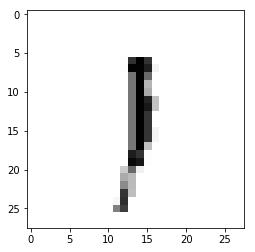

Epoch : 2 cost :  1.4639408891851247
Accuracy : 0.1442
label : [1]
Prediction : [0]


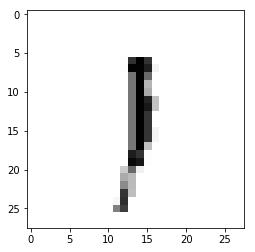

Epoch : 2 cost :  1.4681141875006931
Accuracy : 0.1441
label : [1]
Prediction : [0]


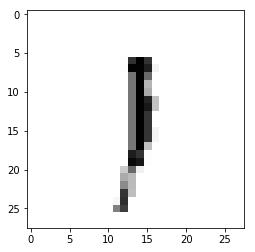

Epoch : 2 cost :  1.4722627106579862
Accuracy : 0.1429
label : [1]
Prediction : [0]


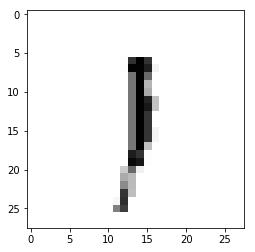

Epoch : 2 cost :  1.4764059023423624
Accuracy : 0.1386
label : [1]
Prediction : [0]


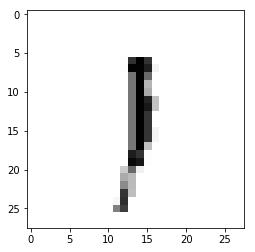

Epoch : 2 cost :  1.480550638979131
Accuracy : 0.1387
label : [1]
Prediction : [0]


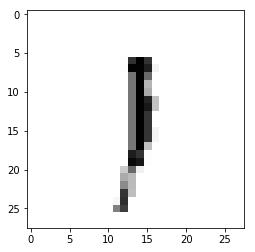

Epoch : 2 cost :  1.4847590520165177
Accuracy : 0.1399
label : [1]
Prediction : [0]


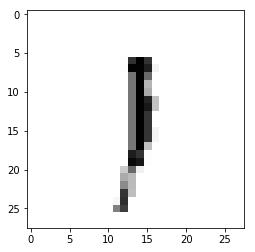

Epoch : 2 cost :  1.4889266655661837
Accuracy : 0.1423
label : [1]
Prediction : [0]


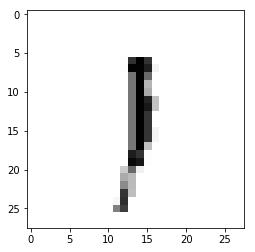

Epoch : 2 cost :  1.4931004706296047
Accuracy : 0.1406
label : [1]
Prediction : [0]


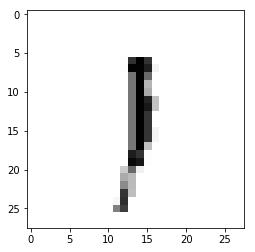

Epoch : 2 cost :  1.4972702711278736
Accuracy : 0.1402
label : [1]
Prediction : [0]


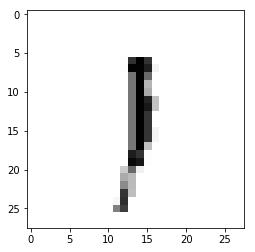

Epoch : 2 cost :  1.5014280648664988
Accuracy : 0.1421
label : [1]
Prediction : [0]


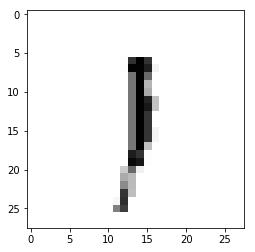

Epoch : 2 cost :  1.5056056031313803
Accuracy : 0.1416
label : [1]
Prediction : [0]


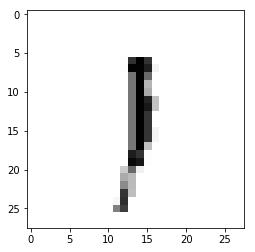

Epoch : 2 cost :  1.5097584512016984
Accuracy : 0.1407
label : [1]
Prediction : [0]


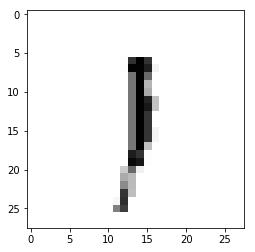

Epoch : 2 cost :  1.5139437580108637
Accuracy : 0.1409
label : [1]
Prediction : [0]


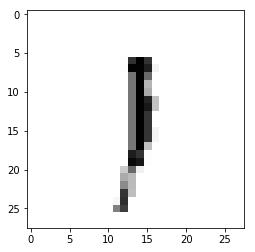

Epoch : 2 cost :  1.5181111470135769
Accuracy : 0.142
label : [1]
Prediction : [0]


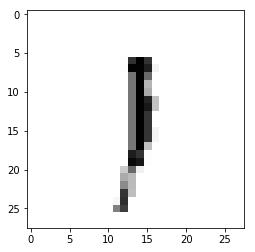

Epoch : 2 cost :  1.5223039145903148
Accuracy : 0.1439
label : [1]
Prediction : [0]


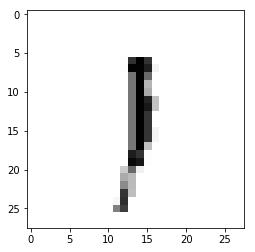

Epoch : 2 cost :  1.5264858870072793
Accuracy : 0.1446
label : [1]
Prediction : [0]


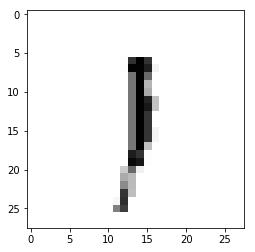

Epoch : 2 cost :  1.5306557616320517
Accuracy : 0.1437
label : [1]
Prediction : [0]


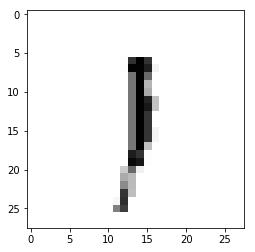

Epoch : 2 cost :  1.5348210226405745
Accuracy : 0.148
label : [1]
Prediction : [0]


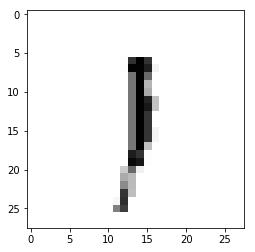

Epoch : 2 cost :  1.5389985630728977
Accuracy : 0.1465
label : [1]
Prediction : [0]


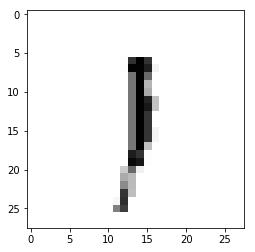

Epoch : 2 cost :  1.5431567465175278
Accuracy : 0.1458
label : [1]
Prediction : [0]


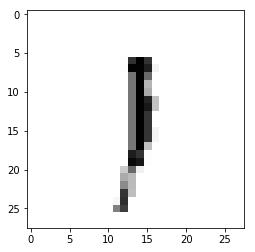

Epoch : 2 cost :  1.5473255417563694
Accuracy : 0.1463
label : [1]
Prediction : [0]


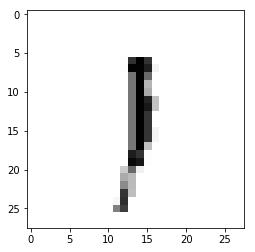

Epoch : 2 cost :  1.5514989194003013
Accuracy : 0.1457
label : [1]
Prediction : [0]


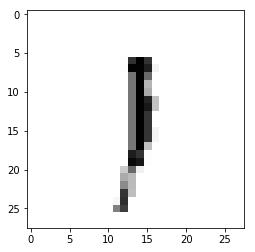

Epoch : 2 cost :  1.5556431427868924
Accuracy : 0.1445
label : [1]
Prediction : [0]


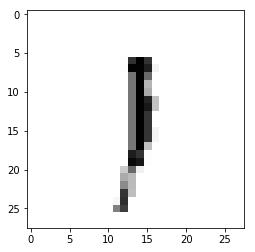

Epoch : 2 cost :  1.5598197421160607
Accuracy : 0.1459
label : [1]
Prediction : [0]


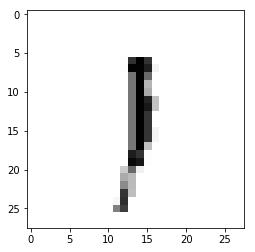

Epoch : 2 cost :  1.5639934999292542
Accuracy : 0.1446
label : [1]
Prediction : [0]


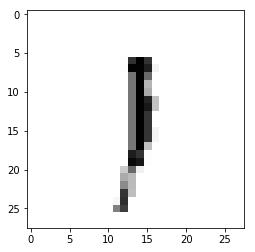

Epoch : 2 cost :  1.5681503967805337
Accuracy : 0.1409
label : [1]
Prediction : [0]


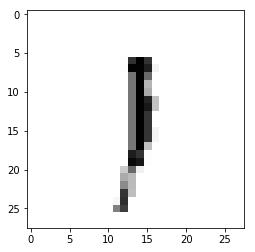

Epoch : 2 cost :  1.5723213070089161
Accuracy : 0.1381
label : [1]
Prediction : [0]


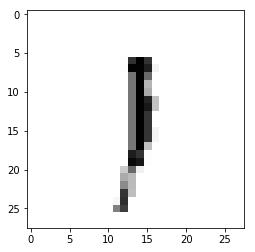

Epoch : 2 cost :  1.5765023006092413
Accuracy : 0.1433
label : [1]
Prediction : [0]


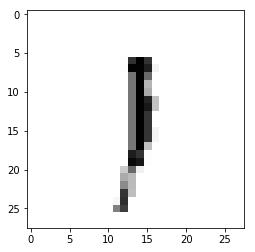

Epoch : 2 cost :  1.5806513331153171
Accuracy : 0.1434
label : [1]
Prediction : [0]


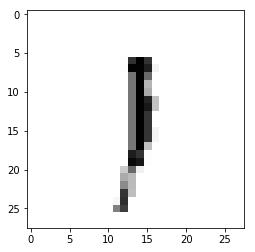

Epoch : 2 cost :  1.5848172803358593
Accuracy : 0.1427
label : [1]
Prediction : [0]


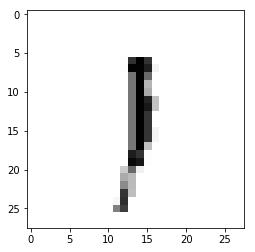

Epoch : 2 cost :  1.5889986293966114
Accuracy : 0.1423
label : [1]
Prediction : [0]


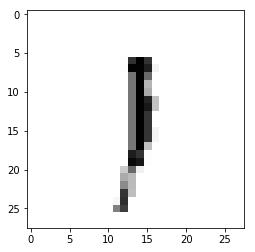

Epoch : 2 cost :  1.5931607341766352
Accuracy : 0.144
label : [1]
Prediction : [0]


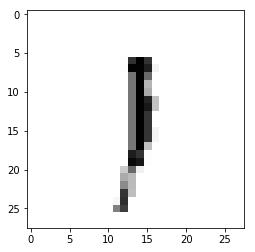

Epoch : 2 cost :  1.5973063356226136
Accuracy : 0.1431
label : [1]
Prediction : [0]


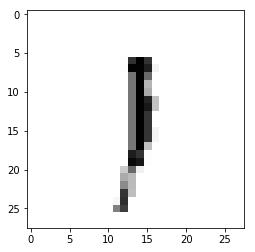

Epoch : 2 cost :  1.6014527923410584
Accuracy : 0.1406
label : [1]
Prediction : [0]


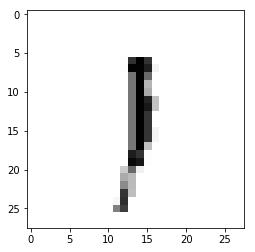

Epoch : 2 cost :  1.6056296248869457
Accuracy : 0.1436
label : [1]
Prediction : [0]


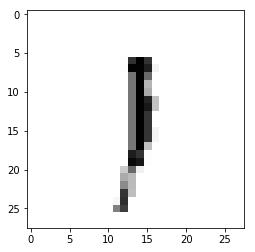

Epoch : 2 cost :  1.609792740561745
Accuracy : 0.1437
label : [1]
Prediction : [0]


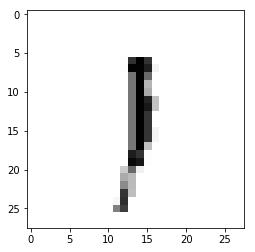

Epoch : 2 cost :  1.613967741185968
Accuracy : 0.1431
label : [1]
Prediction : [0]


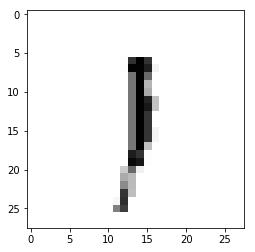

Epoch : 2 cost :  1.6181470316106619
Accuracy : 0.1442
label : [1]
Prediction : [0]


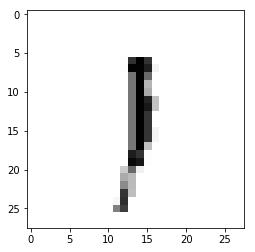

Epoch : 2 cost :  1.6222851696881377
Accuracy : 0.1445
label : [1]
Prediction : [0]


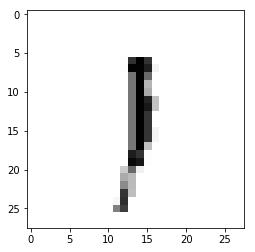

Epoch : 2 cost :  1.6264695015820587
Accuracy : 0.1447
label : [1]
Prediction : [0]


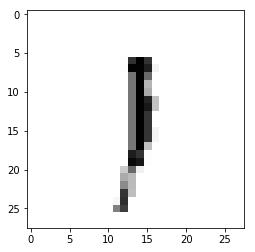

Epoch : 2 cost :  1.6305998238650232
Accuracy : 0.1441
label : [1]
Prediction : [0]


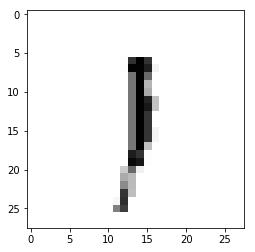

Epoch : 2 cost :  1.634771189689636
Accuracy : 0.141
label : [1]
Prediction : [0]


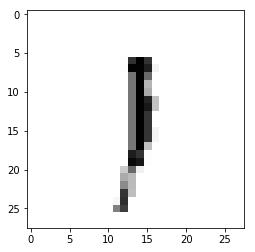

Epoch : 2 cost :  1.638963104161349
Accuracy : 0.1439
label : [1]
Prediction : [0]


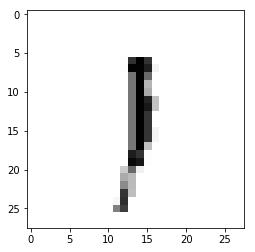

Epoch : 2 cost :  1.643137520009821
Accuracy : 0.1457
label : [1]
Prediction : [0]


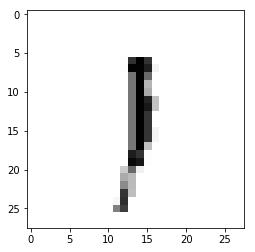

Epoch : 2 cost :  1.6472733506289394
Accuracy : 0.1449
label : [1]
Prediction : [0]


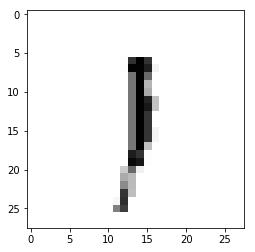

Epoch : 2 cost :  1.6514400482177733
Accuracy : 0.1447
label : [1]
Prediction : [0]


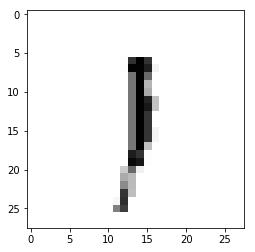

Epoch : 2 cost :  1.6556176241961391
Accuracy : 0.147
label : [1]
Prediction : [0]


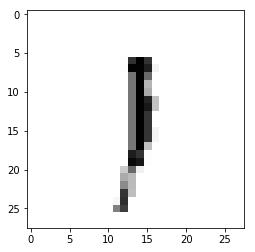

Epoch : 2 cost :  1.6597586597095835
Accuracy : 0.1454
label : [1]
Prediction : [0]


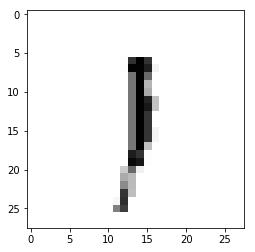

Epoch : 2 cost :  1.663967953595248
Accuracy : 0.1466
label : [1]
Prediction : [0]


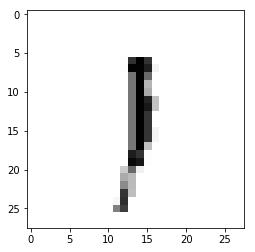

Epoch : 2 cost :  1.6681271440332586
Accuracy : 0.1447
label : [1]
Prediction : [0]


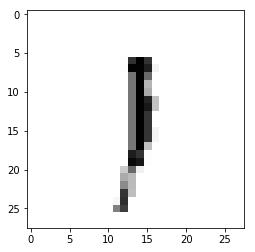

Epoch : 2 cost :  1.6723179864883422
Accuracy : 0.1465
label : [1]
Prediction : [0]


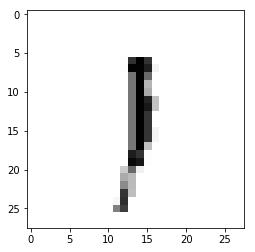

Epoch : 2 cost :  1.6764755392074584
Accuracy : 0.1437
label : [1]
Prediction : [0]


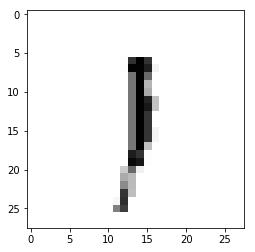

Epoch : 2 cost :  1.680648719180714
Accuracy : 0.1462
label : [1]
Prediction : [0]


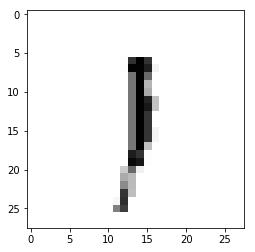

Epoch : 2 cost :  1.6848449845747515
Accuracy : 0.1471
label : [1]
Prediction : [0]


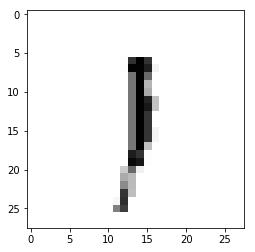

Epoch : 2 cost :  1.6889926459572533
Accuracy : 0.1441
label : [1]
Prediction : [0]


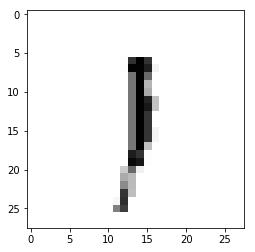

Epoch : 2 cost :  1.6931332276084208
Accuracy : 0.1402
label : [1]
Prediction : [0]


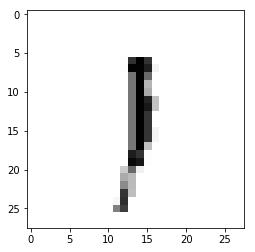

Epoch : 2 cost :  1.6973047707297586
Accuracy : 0.1403
label : [1]
Prediction : [0]


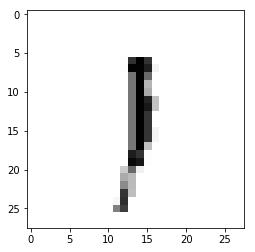

Epoch : 2 cost :  1.7014770221710205
Accuracy : 0.142
label : [1]
Prediction : [0]


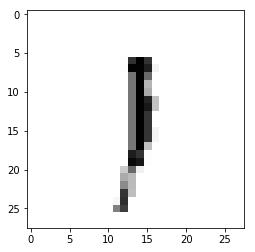

Epoch : 2 cost :  1.7056467069279064
Accuracy : 0.1435
label : [1]
Prediction : [0]


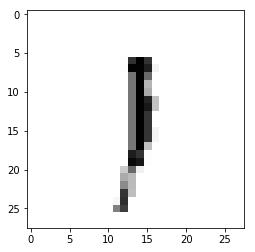

Epoch : 2 cost :  1.709835459102284
Accuracy : 0.145
label : [1]
Prediction : [0]


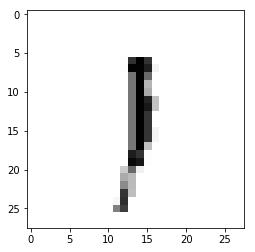

Epoch : 2 cost :  1.7139849229292436
Accuracy : 0.1412
label : [1]
Prediction : [0]


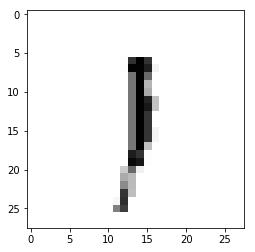

Epoch : 2 cost :  1.718150486946106
Accuracy : 0.1402
label : [1]
Prediction : [0]


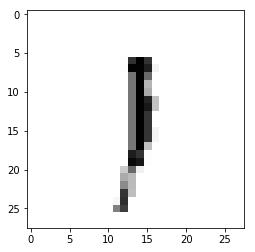

Epoch : 2 cost :  1.7223162646727128
Accuracy : 0.1405
label : [1]
Prediction : [0]


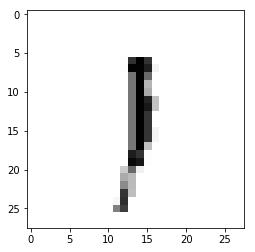

Epoch : 2 cost :  1.7264675604213366
Accuracy : 0.1424
label : [1]
Prediction : [0]


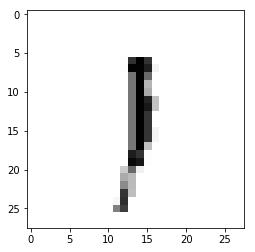

Epoch : 2 cost :  1.7306336732344192
Accuracy : 0.144
label : [1]
Prediction : [0]


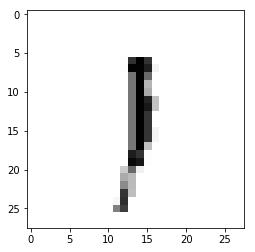

Epoch : 2 cost :  1.7347793921557337
Accuracy : 0.1449
label : [1]
Prediction : [0]


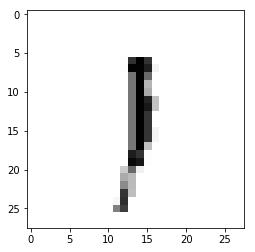

Epoch : 2 cost :  1.7389318500865587
Accuracy : 0.1434
label : [1]
Prediction : [0]


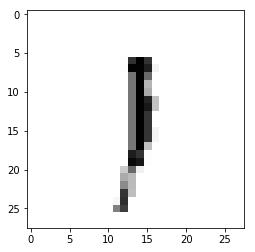

Epoch : 2 cost :  1.74308479309082
Accuracy : 0.142
label : [1]
Prediction : [0]


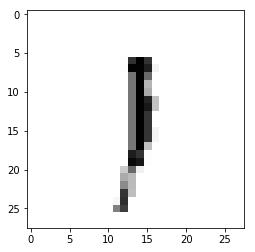

Epoch : 2 cost :  1.7472475320642642
Accuracy : 0.1385
label : [1]
Prediction : [0]


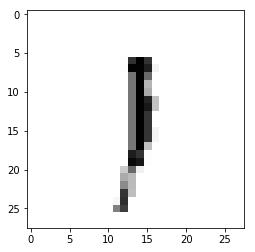

Epoch : 2 cost :  1.7513871474699538
Accuracy : 0.1365
label : [1]
Prediction : [0]


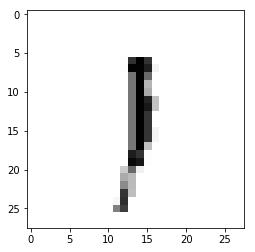

Epoch : 2 cost :  1.7555262825705786
Accuracy : 0.1321
label : [1]
Prediction : [0]


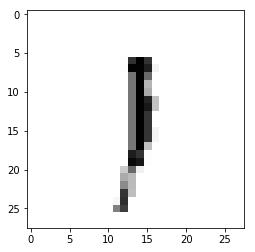

Epoch : 2 cost :  1.7596808906034989
Accuracy : 0.132
label : [1]
Prediction : [0]


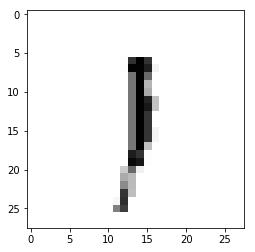

Epoch : 2 cost :  1.7638729238510131
Accuracy : 0.1344
label : [1]
Prediction : [0]


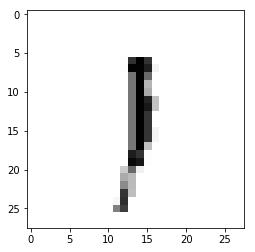

Epoch : 2 cost :  1.7680664738741787
Accuracy : 0.1336
label : [1]
Prediction : [0]


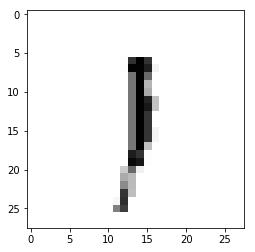

Epoch : 2 cost :  1.772229032082991
Accuracy : 0.1354
label : [1]
Prediction : [0]


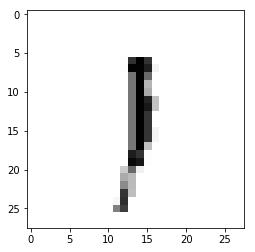

Epoch : 2 cost :  1.7763728458231143
Accuracy : 0.1292
label : [1]
Prediction : [0]


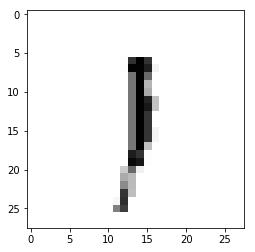

Epoch : 2 cost :  1.7805334724079476
Accuracy : 0.1289
label : [1]
Prediction : [0]


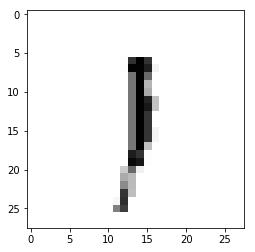

Epoch : 2 cost :  1.7846848969026041
Accuracy : 0.1296
label : [1]
Prediction : [0]


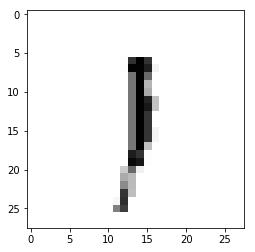

Epoch : 2 cost :  1.7888568583401763
Accuracy : 0.128
label : [1]
Prediction : [0]


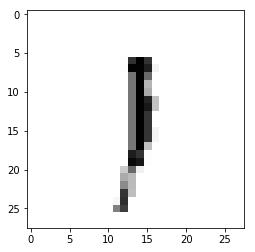

Epoch : 2 cost :  1.7930072923140088
Accuracy : 0.128
label : [1]
Prediction : [0]


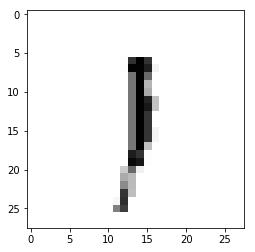

Epoch : 2 cost :  1.7971574527567078
Accuracy : 0.1319
label : [1]
Prediction : [0]


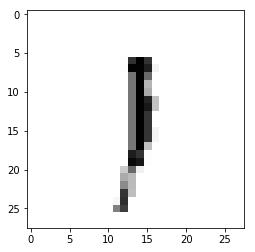

Epoch : 2 cost :  1.8013195484334767
Accuracy : 0.132
label : [1]
Prediction : [0]


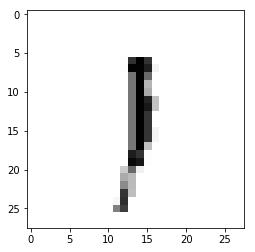

Epoch : 2 cost :  1.8054701826789157
Accuracy : 0.1293
label : [1]
Prediction : [0]


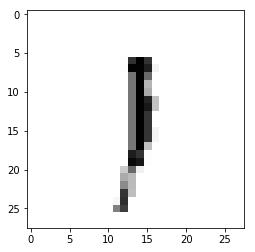

Epoch : 2 cost :  1.8096364580501203
Accuracy : 0.1301
label : [1]
Prediction : [0]


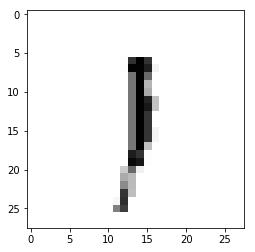

Epoch : 2 cost :  1.813790800788185
Accuracy : 0.1323
label : [1]
Prediction : [0]


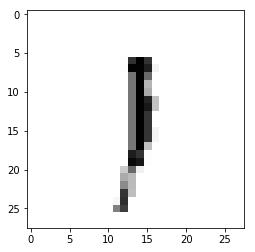

Epoch : 2 cost :  1.817945826270363
Accuracy : 0.1336
label : [1]
Prediction : [0]


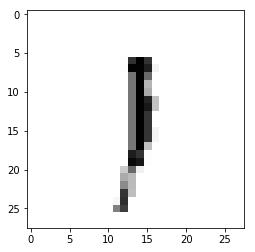

Epoch : 2 cost :  1.8220885445854875
Accuracy : 0.1342
label : [1]
Prediction : [0]


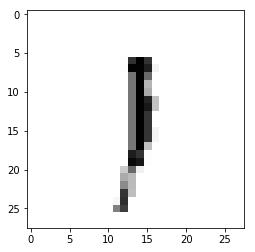

Epoch : 2 cost :  1.8262424360622054
Accuracy : 0.1359
label : [1]
Prediction : [0]


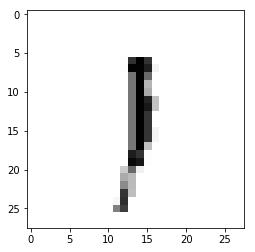

Epoch : 2 cost :  1.8304259868101636
Accuracy : 0.1356
label : [1]
Prediction : [0]


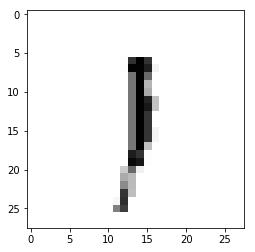

Epoch : 2 cost :  1.834571941115639
Accuracy : 0.1349
label : [1]
Prediction : [0]


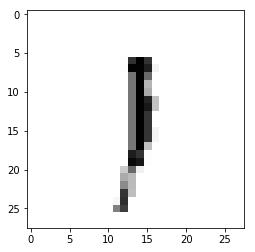

Epoch : 2 cost :  1.8387579337033353
Accuracy : 0.1361
label : [1]
Prediction : [0]


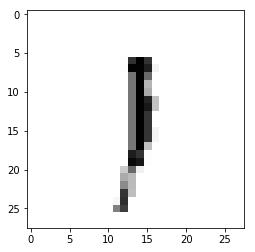

Epoch : 2 cost :  1.8429280792583114
Accuracy : 0.1359
label : [1]
Prediction : [0]


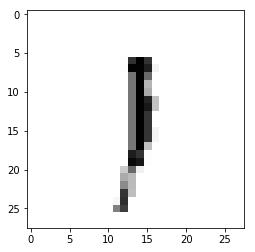

Epoch : 2 cost :  1.8470568193088872
Accuracy : 0.1342
label : [1]
Prediction : [0]


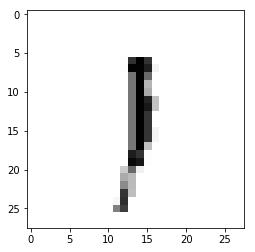

Epoch : 2 cost :  1.8512174675681368
Accuracy : 0.133
label : [1]
Prediction : [0]


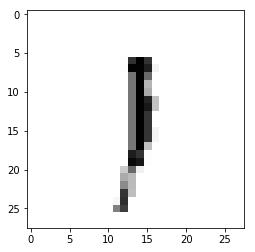

Epoch : 2 cost :  1.8553629827499383
Accuracy : 0.132
label : [1]
Prediction : [0]


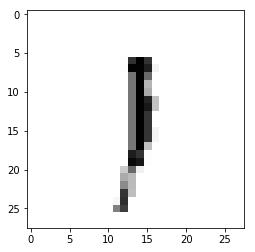

Epoch : 2 cost :  1.85952135736292
Accuracy : 0.1296
label : [1]
Prediction : [0]


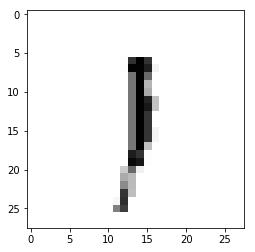

Epoch : 2 cost :  1.863676670681346
Accuracy : 0.1286
label : [1]
Prediction : [0]


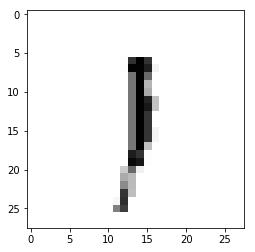

Epoch : 2 cost :  1.86786645412445
Accuracy : 0.1302
label : [1]
Prediction : [0]


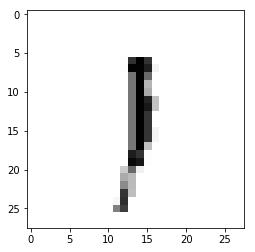

Epoch : 2 cost :  1.8720414426110001
Accuracy : 0.1322
label : [1]
Prediction : [0]


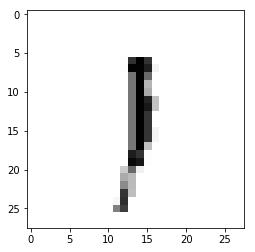

Epoch : 2 cost :  1.8761892010948868
Accuracy : 0.1328
label : [1]
Prediction : [0]


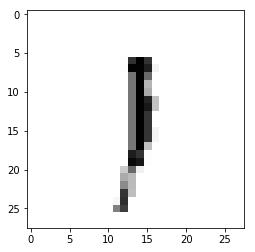

Epoch : 2 cost :  1.8803830823031333
Accuracy : 0.1334
label : [1]
Prediction : [0]


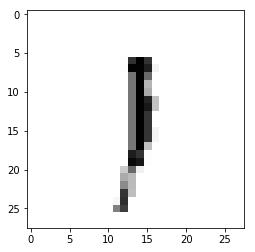

Epoch : 2 cost :  1.8845471694252702
Accuracy : 0.1295
label : [1]
Prediction : [0]


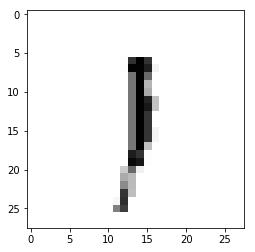

Epoch : 2 cost :  1.8887087488174432
Accuracy : 0.1279
label : [1]
Prediction : [0]


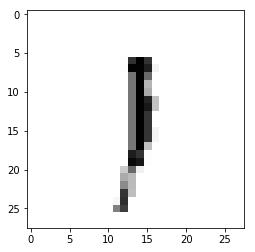

Epoch : 2 cost :  1.89286195451563
Accuracy : 0.1242
label : [1]
Prediction : [0]


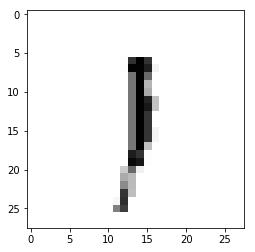

Epoch : 2 cost :  1.8970090419595886
Accuracy : 0.1203
label : [1]
Prediction : [0]


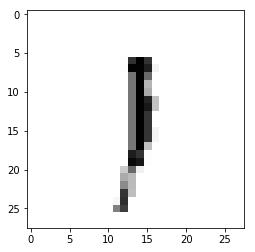

Epoch : 2 cost :  1.901200564124367
Accuracy : 0.1227
label : [1]
Prediction : [0]


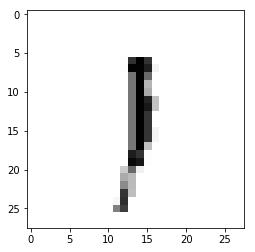

Epoch : 2 cost :  1.9053708700700236
Accuracy : 0.1237
label : [1]
Prediction : [0]


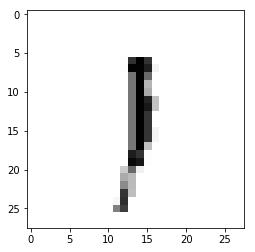

Epoch : 2 cost :  1.9095321494882753
Accuracy : 0.1229
label : [1]
Prediction : [0]


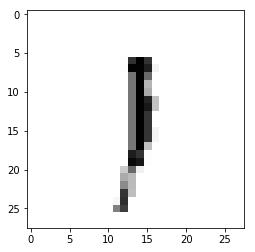

Epoch : 2 cost :  1.9136845493316648
Accuracy : 0.1213
label : [1]
Prediction : [0]


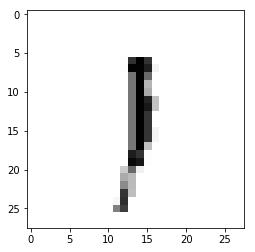

Epoch : 2 cost :  1.9178390958092426
Accuracy : 0.1142
label : [1]
Prediction : [0]


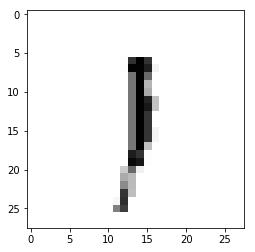

Epoch : 2 cost :  1.9220110013268208
Accuracy : 0.1138
label : [1]
Prediction : [0]


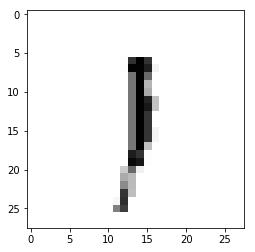

Epoch : 2 cost :  1.926160806309093
Accuracy : 0.1139
label : [1]
Prediction : [0]


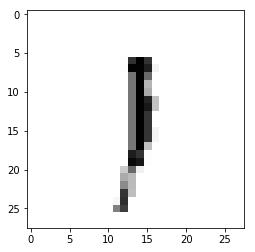

Epoch : 2 cost :  1.9303167685595424
Accuracy : 0.1141
label : [1]
Prediction : [0]


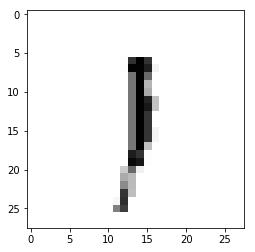

Epoch : 2 cost :  1.9344735362313008
Accuracy : 0.114
label : [1]
Prediction : [0]


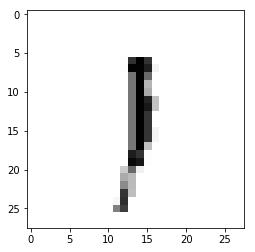

Epoch : 2 cost :  1.9386342230710114
Accuracy : 0.1136
label : [1]
Prediction : [0]


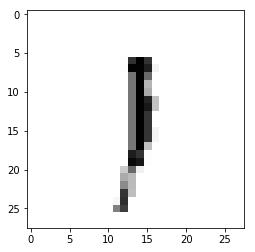

Epoch : 2 cost :  1.9428089557994495
Accuracy : 0.1141
label : [1]
Prediction : [0]


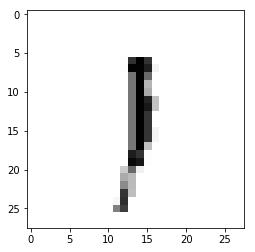

Epoch : 2 cost :  1.9469713765924626
Accuracy : 0.1139
label : [1]
Prediction : [0]


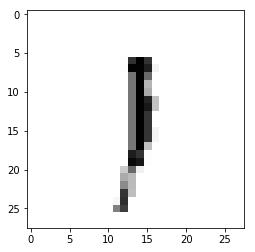

Epoch : 2 cost :  1.9511292154138737
Accuracy : 0.1136
label : [1]
Prediction : [0]


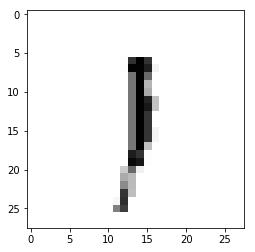

Epoch : 2 cost :  1.9552925877137617
Accuracy : 0.1138
label : [1]
Prediction : [0]


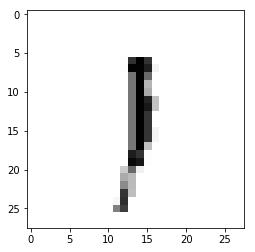

Epoch : 2 cost :  1.9594777493043378
Accuracy : 0.1139
label : [1]
Prediction : [0]


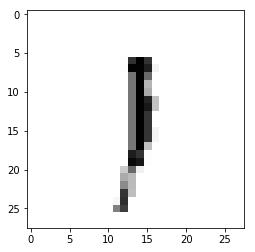

Epoch : 2 cost :  1.963661426630887
Accuracy : 0.1142
label : [1]
Prediction : [0]


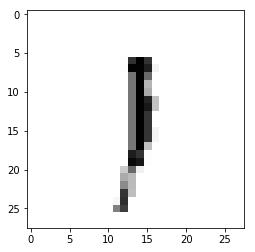

Epoch : 2 cost :  1.9678182827342638
Accuracy : 0.1135
label : [1]
Prediction : [0]


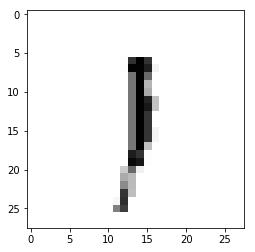

Epoch : 2 cost :  1.9719852148402819
Accuracy : 0.1135
label : [1]
Prediction : [0]


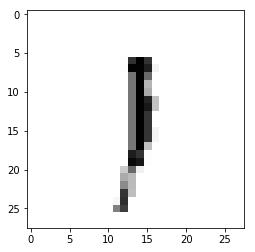

Epoch : 2 cost :  1.9761560552770439
Accuracy : 0.1135
label : [1]
Prediction : [0]


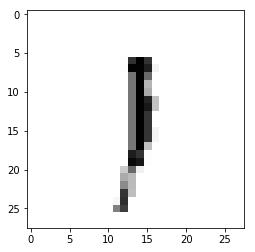

Epoch : 2 cost :  1.980296842835166
Accuracy : 0.1135
label : [1]
Prediction : [0]


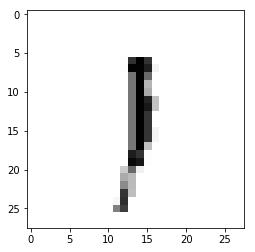

Epoch : 2 cost :  1.984470687779513
Accuracy : 0.1131
label : [1]
Prediction : [0]


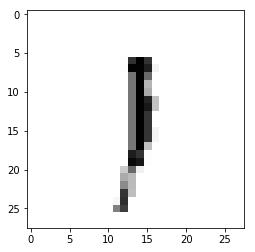

Epoch : 2 cost :  1.9886406976526432
Accuracy : 0.1131
label : [1]
Prediction : [0]


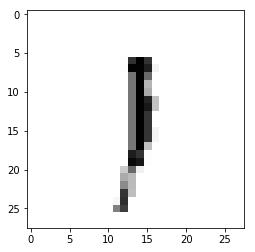

Epoch : 2 cost :  1.9927980626713144
Accuracy : 0.1131
label : [1]
Prediction : [0]


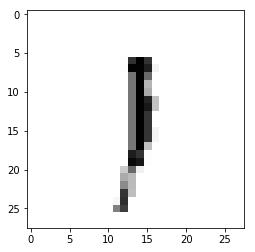

Epoch : 2 cost :  1.99697301864624
Accuracy : 0.1132
label : [1]
Prediction : [0]


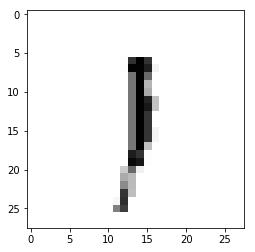

Epoch : 2 cost :  2.001131437475031
Accuracy : 0.1133
label : [1]
Prediction : [0]


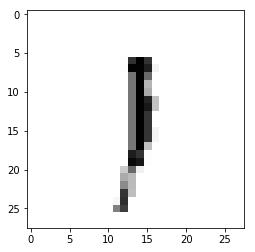

Epoch : 2 cost :  2.0052918399463997
Accuracy : 0.1132
label : [1]
Prediction : [0]


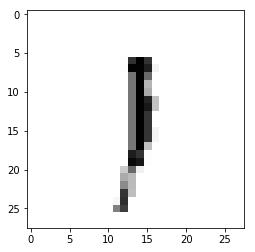

Epoch : 2 cost :  2.009436124888333
Accuracy : 0.1133
label : [1]
Prediction : [0]


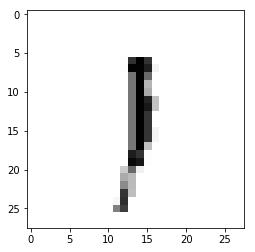

Epoch : 2 cost :  2.013630644191395
Accuracy : 0.1135
label : [1]
Prediction : [0]


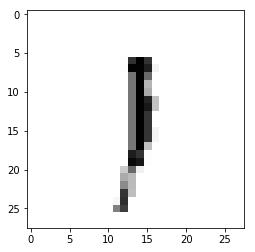

Epoch : 2 cost :  2.0177937668020074
Accuracy : 0.1135
label : [1]
Prediction : [0]


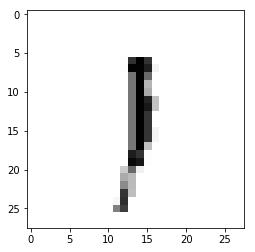

Epoch : 2 cost :  2.0219615485451436
Accuracy : 0.1137
label : [1]
Prediction : [0]


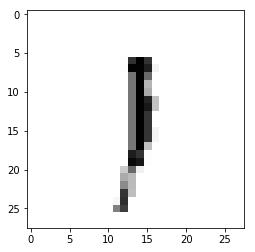

Epoch : 2 cost :  2.0261351021853358
Accuracy : 0.1139
label : [1]
Prediction : [0]


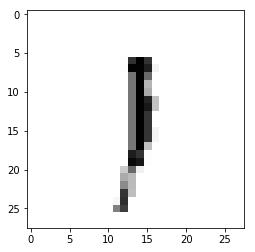

Epoch : 2 cost :  2.03030748757449
Accuracy : 0.1137
label : [1]
Prediction : [0]


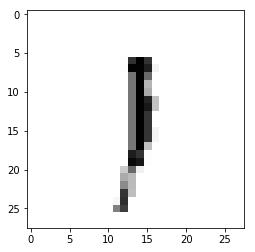

Epoch : 2 cost :  2.034485224810513
Accuracy : 0.1149
label : [1]
Prediction : [0]


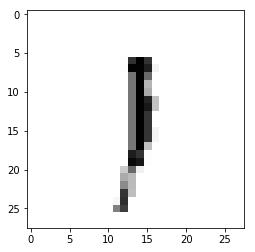

Epoch : 2 cost :  2.0386566552248864
Accuracy : 0.1177
label : [1]
Prediction : [0]


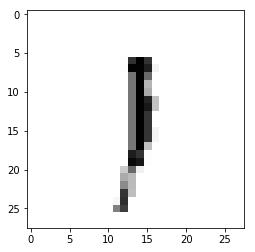

Epoch : 2 cost :  2.042828081304376
Accuracy : 0.1191
label : [1]
Prediction : [0]


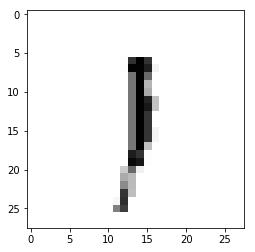

Epoch : 2 cost :  2.04700333551927
Accuracy : 0.1183
label : [1]
Prediction : [0]


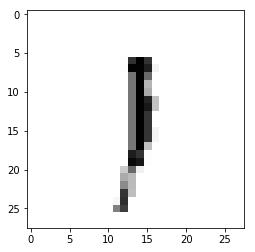

Epoch : 2 cost :  2.0511727177013044
Accuracy : 0.1215
label : [1]
Prediction : [0]


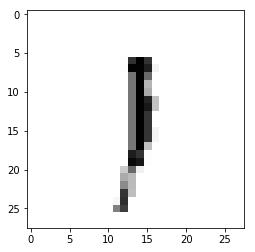

Epoch : 2 cost :  2.0553335263512347
Accuracy : 0.1253
label : [1]
Prediction : [0]


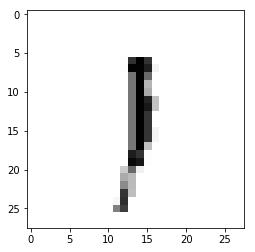

Epoch : 2 cost :  2.0594864086671305
Accuracy : 0.1243
label : [1]
Prediction : [0]


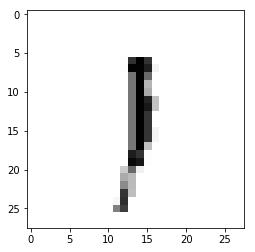

Epoch : 2 cost :  2.0636347614635118
Accuracy : 0.1196
label : [1]
Prediction : [0]


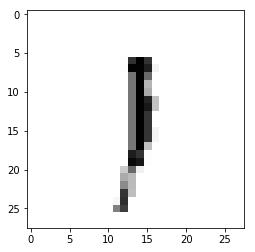

Epoch : 2 cost :  2.0677881232174955
Accuracy : 0.1184
label : [1]
Prediction : [0]


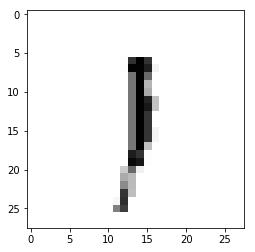

Epoch : 2 cost :  2.071952768672596
Accuracy : 0.1178
label : [1]
Prediction : [0]


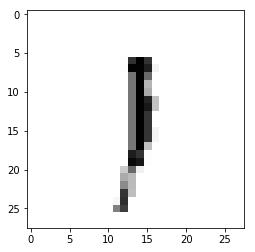

Epoch : 2 cost :  2.0761282582716505
Accuracy : 0.1194
label : [1]
Prediction : [0]


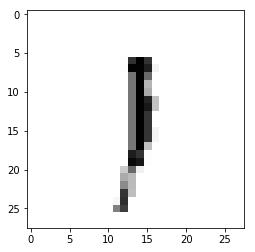

Epoch : 2 cost :  2.0803111457824706
Accuracy : 0.1194
label : [1]
Prediction : [0]


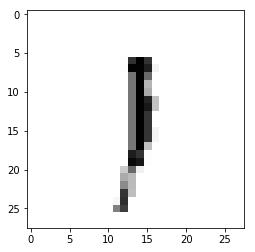

Epoch : 2 cost :  2.08448486328125
Accuracy : 0.1179
label : [1]
Prediction : [0]


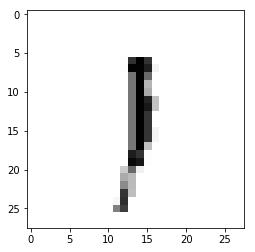

Epoch : 2 cost :  2.088656261617487
Accuracy : 0.122
label : [1]
Prediction : [0]


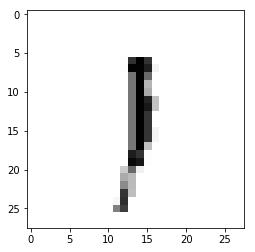

Epoch : 2 cost :  2.092799263867465
Accuracy : 0.1257
label : [1]
Prediction : [0]


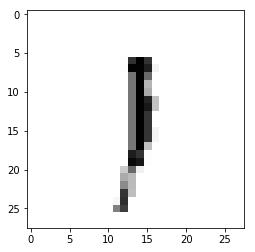

Epoch : 2 cost :  2.0969633479551835
Accuracy : 0.1304
label : [1]
Prediction : [0]


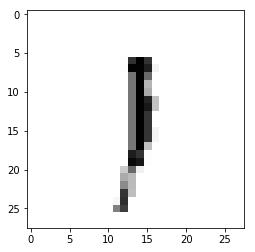

Epoch : 2 cost :  2.1011265338550915
Accuracy : 0.1308
label : [1]
Prediction : [0]


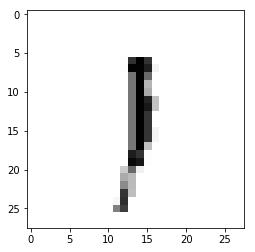

Epoch : 2 cost :  2.1052732905474576
Accuracy : 0.1262
label : [1]
Prediction : [0]


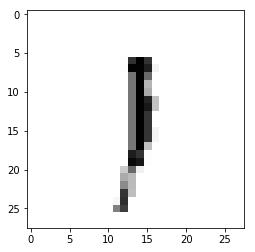

Epoch : 2 cost :  2.1094220096414737
Accuracy : 0.1255
label : [1]
Prediction : [0]


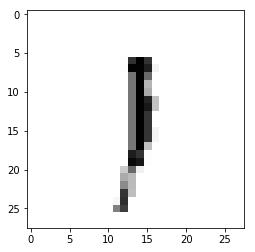

Epoch : 2 cost :  2.1135702488639136
Accuracy : 0.1229
label : [1]
Prediction : [0]


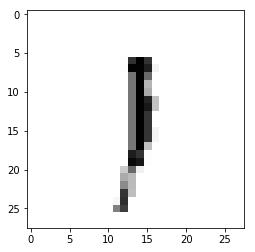

Epoch : 2 cost :  2.117720624316822
Accuracy : 0.1208
label : [1]
Prediction : [0]


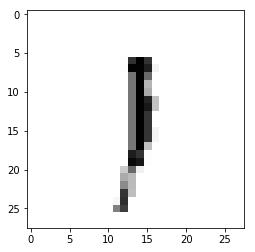

Epoch : 2 cost :  2.121849064393477
Accuracy : 0.1162
label : [1]
Prediction : [0]


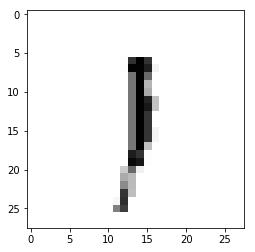

Epoch : 2 cost :  2.126005267229947
Accuracy : 0.1228
label : [1]
Prediction : [0]


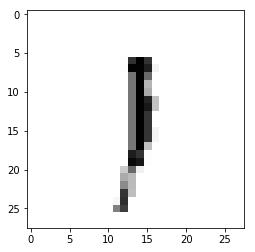

Epoch : 2 cost :  2.1301566717841407
Accuracy : 0.1191
label : [1]
Prediction : [0]


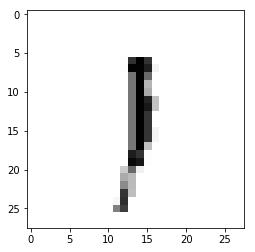

Epoch : 2 cost :  2.134319123354825
Accuracy : 0.1235
label : [1]
Prediction : [0]


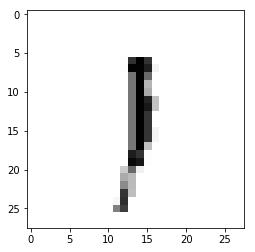

Epoch : 2 cost :  2.1384724656018346
Accuracy : 0.1246
label : [1]
Prediction : [0]


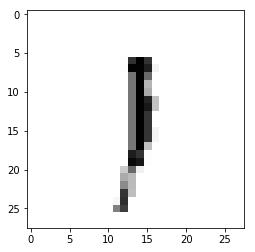

Epoch : 2 cost :  2.1426402841914785
Accuracy : 0.128
label : [1]
Prediction : [0]


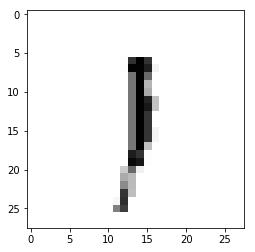

Epoch : 2 cost :  2.146793319095265
Accuracy : 0.1254
label : [1]
Prediction : [0]


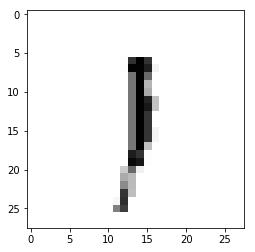

Epoch : 2 cost :  2.150959505601363
Accuracy : 0.1272
label : [1]
Prediction : [0]


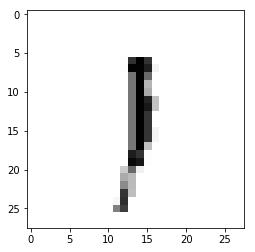

Epoch : 2 cost :  2.1551239603215997
Accuracy : 0.1277
label : [1]
Prediction : [0]


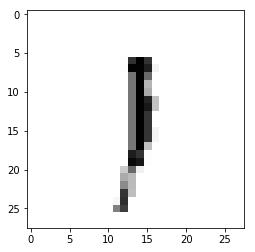

Epoch : 2 cost :  2.1592687520113856
Accuracy : 0.1288
label : [1]
Prediction : [0]


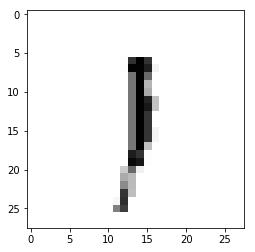

Epoch : 2 cost :  2.163435189507224
Accuracy : 0.1308
label : [1]
Prediction : [0]


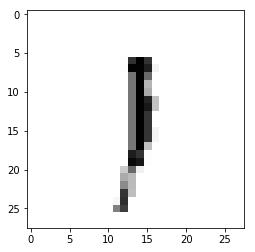

Epoch : 2 cost :  2.1676186080412427
Accuracy : 0.1313
label : [1]
Prediction : [0]


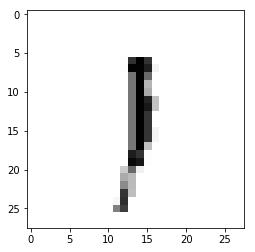

Epoch : 2 cost :  2.171772033084522
Accuracy : 0.133
label : [1]
Prediction : [0]


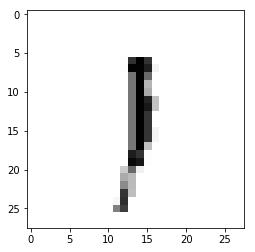

Epoch : 2 cost :  2.1759113160046657
Accuracy : 0.1311
label : [1]
Prediction : [0]


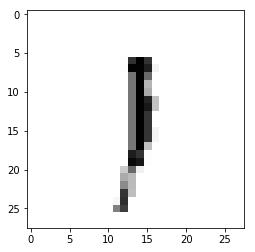

Epoch : 2 cost :  2.180084157423539
Accuracy : 0.1419
label : [1]
Prediction : [0]


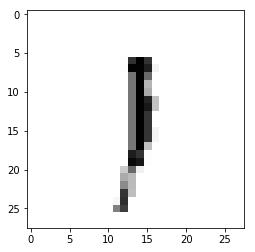

Epoch : 2 cost :  2.1842286786166096
Accuracy : 0.1396
label : [1]
Prediction : [0]


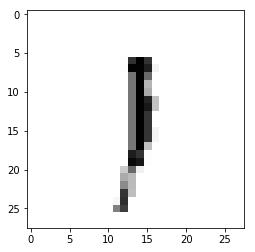

Epoch : 2 cost :  2.1884008099816055
Accuracy : 0.1314
label : [1]
Prediction : [0]


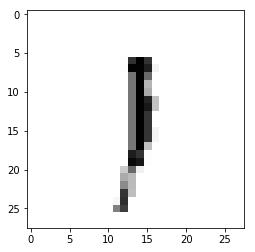

Epoch : 2 cost :  2.1925586475025516
Accuracy : 0.1291
label : [1]
Prediction : [0]


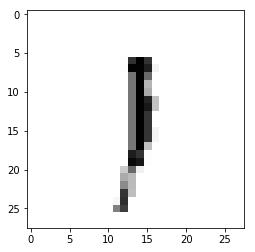

Epoch : 2 cost :  2.19671183456074
Accuracy : 0.1253
label : [1]
Prediction : [0]


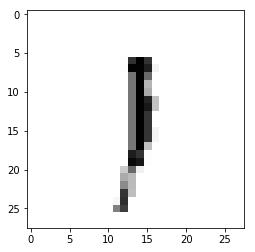

Epoch : 2 cost :  2.200887875556945
Accuracy : 0.1252
label : [1]
Prediction : [0]


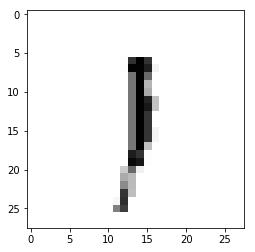

Epoch : 2 cost :  2.205064776593988
Accuracy : 0.1284
label : [1]
Prediction : [0]


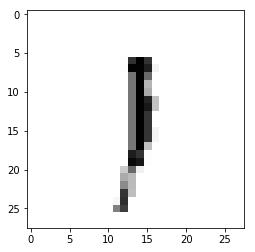

Epoch : 2 cost :  2.2092385491457844
Accuracy : 0.1368
label : [1]
Prediction : [0]


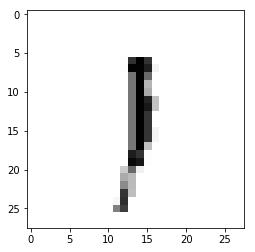

Epoch : 2 cost :  2.2133841687982723
Accuracy : 0.1442
label : [1]
Prediction : [0]


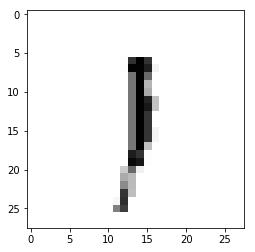

Epoch : 2 cost :  2.2175543251904566
Accuracy : 0.1472
label : [1]
Prediction : [0]


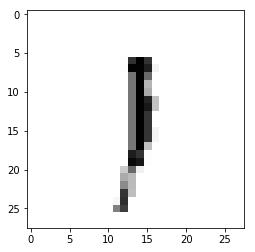

Epoch : 2 cost :  2.2217273283004753
Accuracy : 0.1423
label : [1]
Prediction : [0]


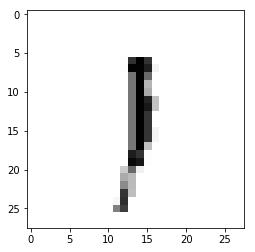

Epoch : 2 cost :  2.225879860357804
Accuracy : 0.1389
label : [1]
Prediction : [0]


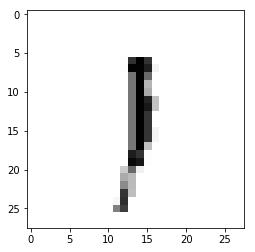

Epoch : 2 cost :  2.230014911564913
Accuracy : 0.1292
label : [1]
Prediction : [0]


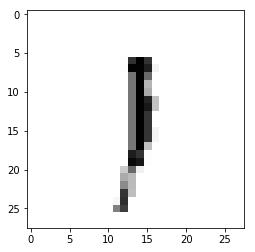

Epoch : 2 cost :  2.234183411598205
Accuracy : 0.1364
label : [1]
Prediction : [0]


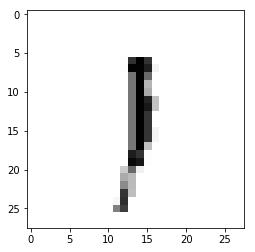

Epoch : 2 cost :  2.2383530452034686
Accuracy : 0.1288
label : [1]
Prediction : [0]


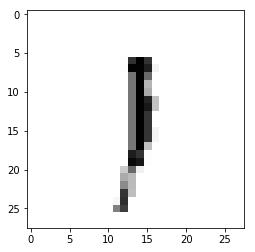

Epoch : 2 cost :  2.2424943902275776
Accuracy : 0.1272
label : [1]
Prediction : [0]


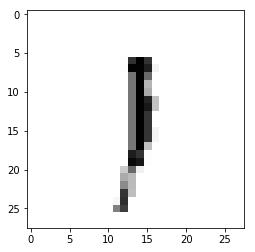

Epoch : 2 cost :  2.24664267800071
Accuracy : 0.1276
label : [1]
Prediction : [0]


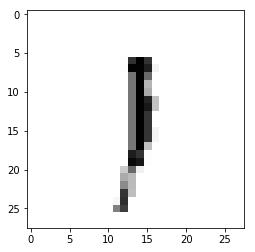

Epoch : 2 cost :  2.2508108971335665
Accuracy : 0.1284
label : [1]
Prediction : [0]


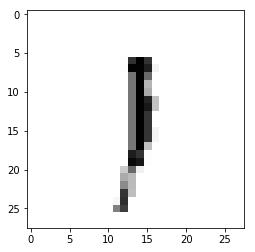

Epoch : 2 cost :  2.2549857655438506
Accuracy : 0.1294
label : [1]
Prediction : [0]


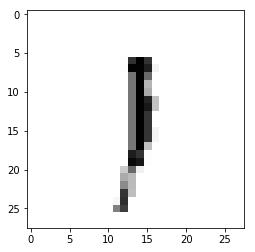

Epoch : 2 cost :  2.2591500004855063
Accuracy : 0.1282
label : [1]
Prediction : [0]


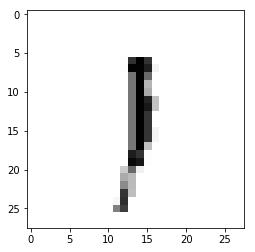

Epoch : 2 cost :  2.2632848670265884
Accuracy : 0.1273
label : [1]
Prediction : [0]


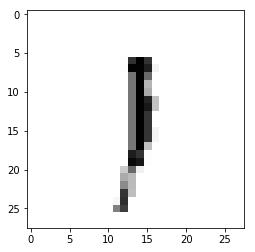

Epoch : 2 cost :  2.267472382458773
Accuracy : 0.1273
label : [1]
Prediction : [0]


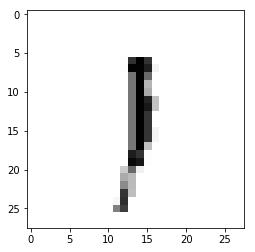

Epoch : 2 cost :  2.2716267447038123
Accuracy : 0.1264
label : [1]
Prediction : [0]


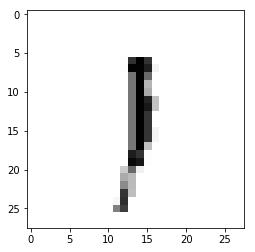

Epoch : 2 cost :  2.275770050395618
Accuracy : 0.1274
label : [1]
Prediction : [0]


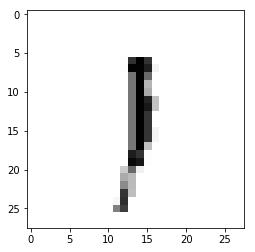

Epoch : 2 cost :  2.2799431094256306
Accuracy : 0.1299
label : [1]
Prediction : [0]


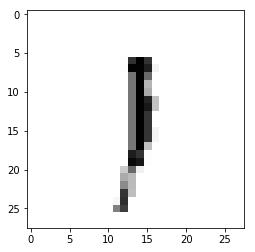

Epoch : 2 cost :  2.2840883762186217
Accuracy : 0.1294
label : [1]
Prediction : [0]


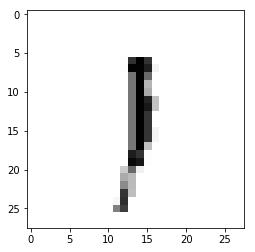

Epoch : 2 cost :  2.2882774231650607
Accuracy : 0.1322
label : [1]
Prediction : [0]


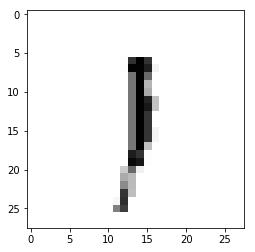

Epoch : 2 cost :  2.292449921694668
Accuracy : 0.1291
label : [1]
Prediction : [0]


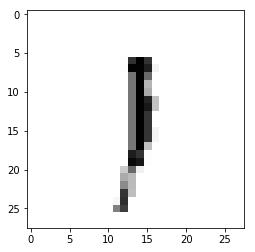

Epoch : 3 cost :  0.00419081991369074
Accuracy : 0.1341
label : [1]
Prediction : [0]


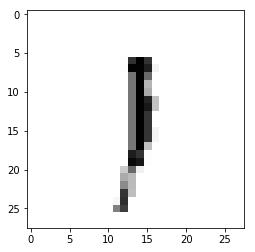

Epoch : 3 cost :  0.008372403925115412
Accuracy : 0.1347
label : [1]
Prediction : [0]


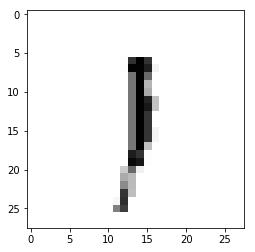

Epoch : 3 cost :  0.012526520815762606
Accuracy : 0.1326
label : [1]
Prediction : [0]


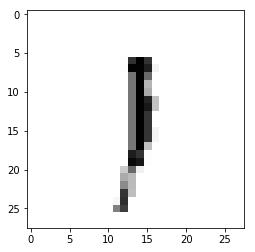

Epoch : 3 cost :  0.0166597505049272
Accuracy : 0.134
label : [1]
Prediction : [0]


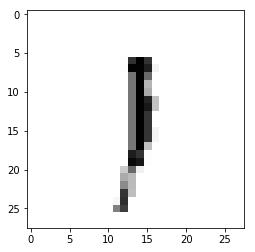

Epoch : 3 cost :  0.020839139331470836
Accuracy : 0.1343
label : [1]
Prediction : [0]


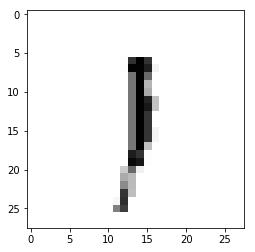

Epoch : 3 cost :  0.025008155649358578
Accuracy : 0.1346
label : [1]
Prediction : [0]


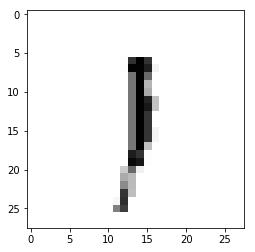

Epoch : 3 cost :  0.029166647304188123
Accuracy : 0.1347
label : [1]
Prediction : [0]


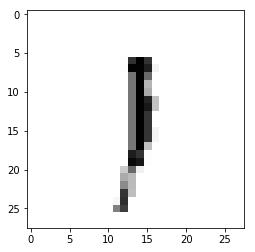

Epoch : 3 cost :  0.0333643947948109
Accuracy : 0.1383
label : [1]
Prediction : [0]


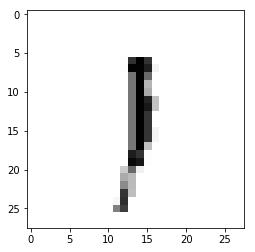

Epoch : 3 cost :  0.03753409905867143
Accuracy : 0.141
label : [1]
Prediction : [0]


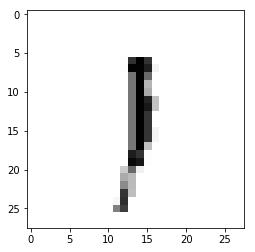

Epoch : 3 cost :  0.04169879696585915
Accuracy : 0.1399
label : [1]
Prediction : [0]


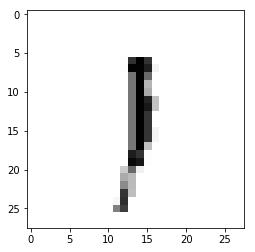

Epoch : 3 cost :  0.045861238566311927
Accuracy : 0.1422
label : [1]
Prediction : [0]


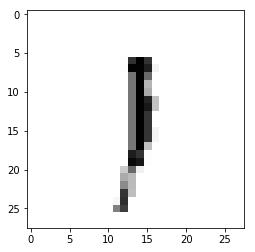

Epoch : 3 cost :  0.05000069878318093
Accuracy : 0.1378
label : [1]
Prediction : [0]


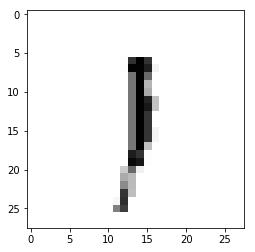

Epoch : 3 cost :  0.054177804426713425
Accuracy : 0.1392
label : [1]
Prediction : [0]


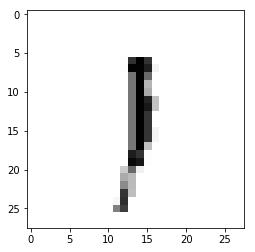

Epoch : 3 cost :  0.05834361509843306
Accuracy : 0.1388
label : [1]
Prediction : [0]


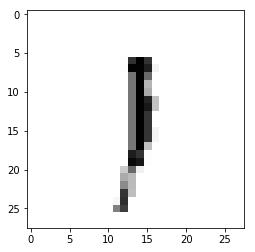

Epoch : 3 cost :  0.06252143469723788
Accuracy : 0.1398
label : [1]
Prediction : [0]


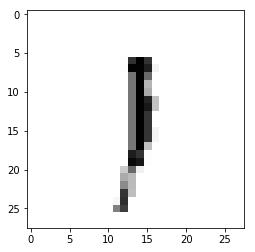

Epoch : 3 cost :  0.06670019669966264
Accuracy : 0.1423
label : [1]
Prediction : [0]


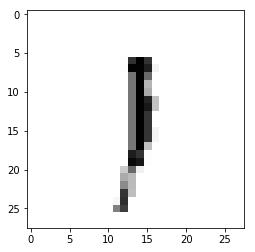

Epoch : 3 cost :  0.07087478377602316
Accuracy : 0.1435
label : [1]
Prediction : [0]


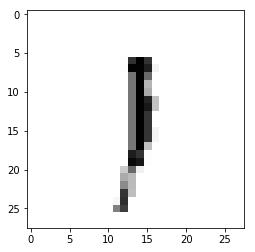

Epoch : 3 cost :  0.0750273188677701
Accuracy : 0.138
label : [1]
Prediction : [0]


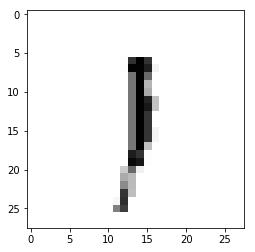

Epoch : 3 cost :  0.07917996146462179
Accuracy : 0.1368
label : [1]
Prediction : [0]


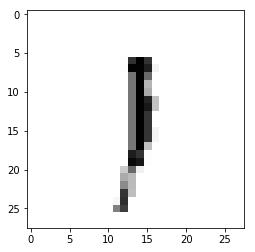

Epoch : 3 cost :  0.08336302323774857
Accuracy : 0.1401
label : [1]
Prediction : [0]


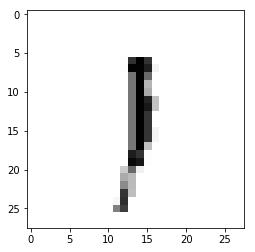

Epoch : 3 cost :  0.08752643801949239
Accuracy : 0.1364
label : [1]
Prediction : [0]


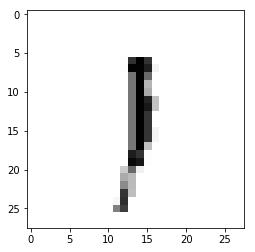

Epoch : 3 cost :  0.09167588927529073
Accuracy : 0.1309
label : [1]
Prediction : [0]


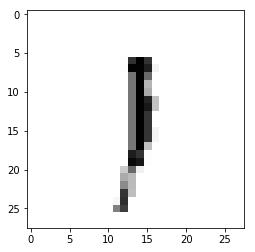

Epoch : 3 cost :  0.09583388978784732
Accuracy : 0.1311
label : [1]
Prediction : [0]


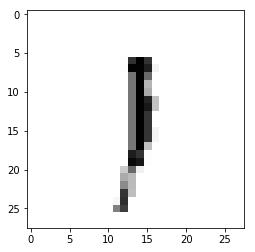

Epoch : 3 cost :  0.09999407724900676
Accuracy : 0.1306
label : [1]
Prediction : [0]


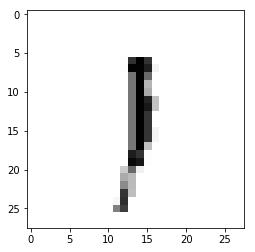

Epoch : 3 cost :  0.10416660048744893
Accuracy : 0.1303
label : [1]
Prediction : [0]


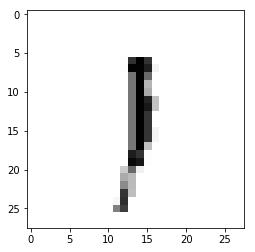

Epoch : 3 cost :  0.10832747589458117
Accuracy : 0.1299
label : [1]
Prediction : [0]


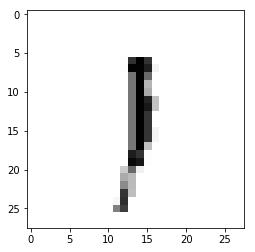

Epoch : 3 cost :  0.1124818251349709
Accuracy : 0.1301
label : [1]
Prediction : [0]


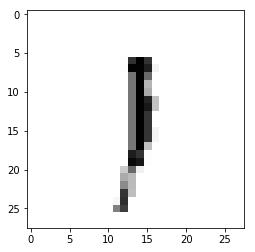

Epoch : 3 cost :  0.11663589607585557
Accuracy : 0.1277
label : [1]
Prediction : [0]


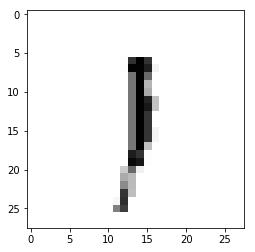

Epoch : 3 cost :  0.12080347321250219
Accuracy : 0.128
label : [1]
Prediction : [0]


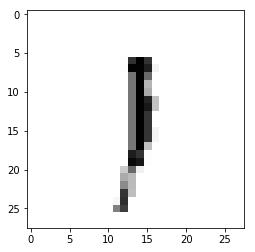

Epoch : 3 cost :  0.12496838873082938
Accuracy : 0.1287
label : [1]
Prediction : [0]


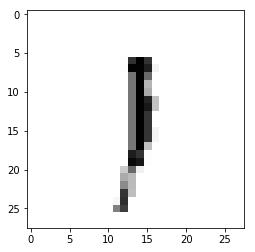

Epoch : 3 cost :  0.1291364812850952
Accuracy : 0.1304
label : [1]
Prediction : [0]


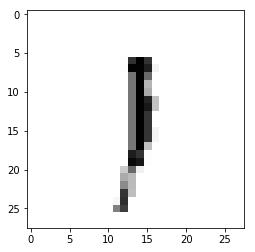

Epoch : 3 cost :  0.13329921722412108
Accuracy : 0.129
label : [1]
Prediction : [0]


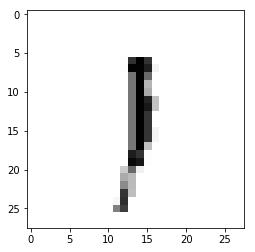

Epoch : 3 cost :  0.1374733439358798
Accuracy : 0.1319
label : [1]
Prediction : [0]


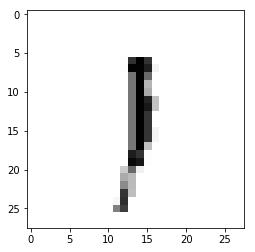

Epoch : 3 cost :  0.14163611151955344
Accuracy : 0.1314
label : [1]
Prediction : [0]


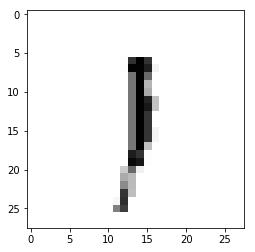

Epoch : 3 cost :  0.14577925552021373
Accuracy : 0.1307
label : [1]
Prediction : [0]


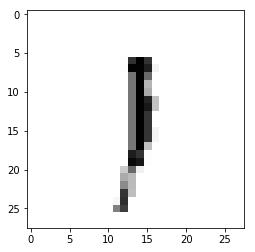

Epoch : 3 cost :  0.14992764949798584
Accuracy : 0.1287
label : [1]
Prediction : [0]


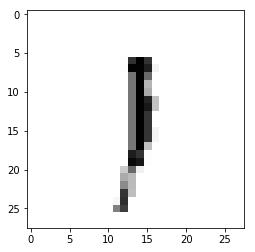

Epoch : 3 cost :  0.154089957150546
Accuracy : 0.1295
label : [1]
Prediction : [0]


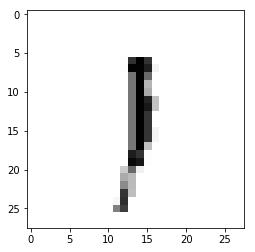

Epoch : 3 cost :  0.1582368616624312
Accuracy : 0.1305
label : [1]
Prediction : [0]


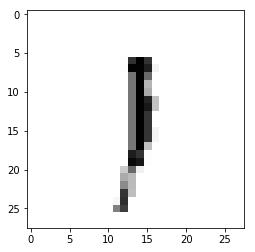

Epoch : 3 cost :  0.16240027991208164
Accuracy : 0.1298
label : [1]
Prediction : [0]


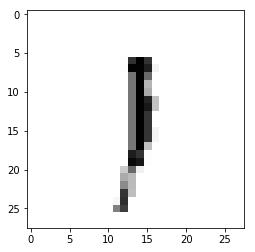

Epoch : 3 cost :  0.16658343185078014
Accuracy : 0.1301
label : [1]
Prediction : [0]


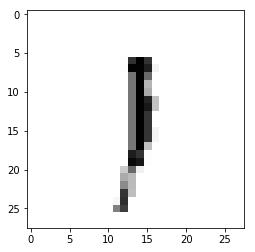

Epoch : 3 cost :  0.17074950955130838
Accuracy : 0.1328
label : [1]
Prediction : [0]


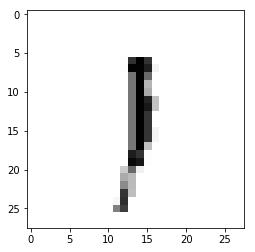

Epoch : 3 cost :  0.17490781220522794
Accuracy : 0.1313
label : [1]
Prediction : [0]


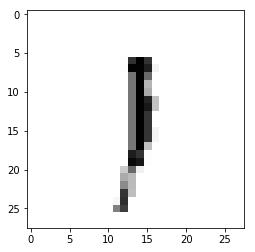

Epoch : 3 cost :  0.17907289418307218
Accuracy : 0.1315
label : [1]
Prediction : [0]


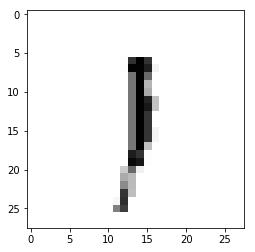

Epoch : 3 cost :  0.18323649016293614
Accuracy : 0.1318
label : [1]
Prediction : [0]


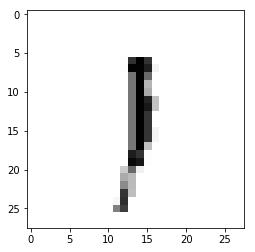

Epoch : 3 cost :  0.18738597306338226
Accuracy : 0.1299
label : [1]
Prediction : [0]


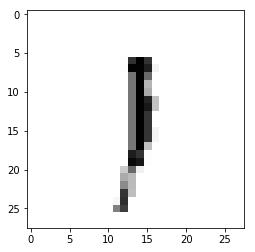

Epoch : 3 cost :  0.1915491953763095
Accuracy : 0.1297
label : [1]
Prediction : [0]


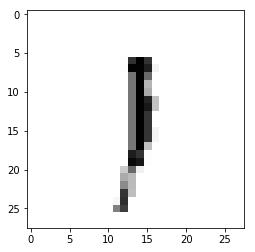

Epoch : 3 cost :  0.19569590525193648
Accuracy : 0.1287
label : [1]
Prediction : [0]


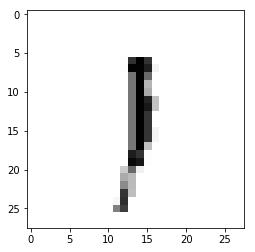

Epoch : 3 cost :  0.19985364653847434
Accuracy : 0.1305
label : [1]
Prediction : [0]


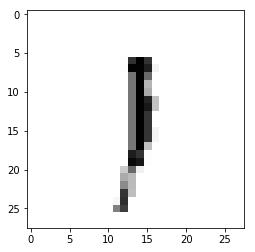

Epoch : 3 cost :  0.20400690295479515
Accuracy : 0.1311
label : [1]
Prediction : [0]


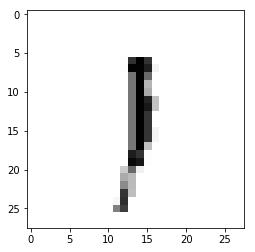

Epoch : 3 cost :  0.2081720105084506
Accuracy : 0.1306
label : [1]
Prediction : [0]


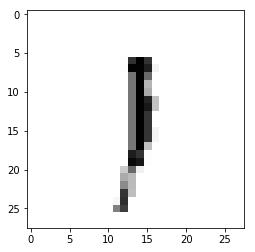

Epoch : 3 cost :  0.21233885548331521
Accuracy : 0.1314
label : [1]
Prediction : [0]


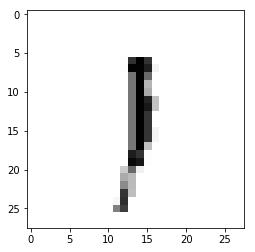

Epoch : 3 cost :  0.2165033093365756
Accuracy : 0.1302
label : [1]
Prediction : [0]


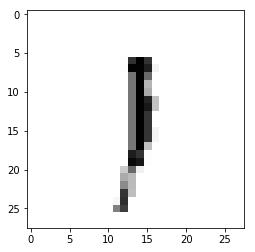

Epoch : 3 cost :  0.22066546656868677
Accuracy : 0.1301
label : [1]
Prediction : [0]


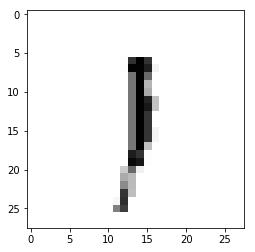

Epoch : 3 cost :  0.22482397729700265
Accuracy : 0.1285
label : [1]
Prediction : [0]


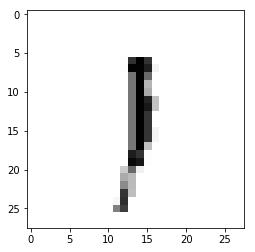

Epoch : 3 cost :  0.22895665038715712
Accuracy : 0.1253
label : [1]
Prediction : [0]


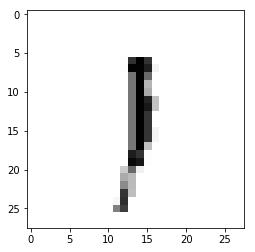

Epoch : 3 cost :  0.233126634684476
Accuracy : 0.1241
label : [1]
Prediction : [0]


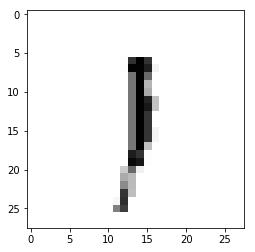

Epoch : 3 cost :  0.2372884087129073
Accuracy : 0.1243
label : [1]
Prediction : [0]


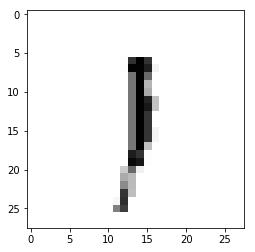

Epoch : 3 cost :  0.24143671512603762
Accuracy : 0.1274
label : [1]
Prediction : [0]


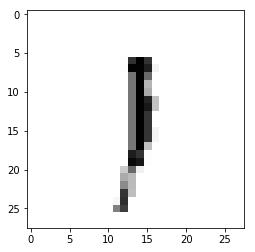

Epoch : 3 cost :  0.2456013987281106
Accuracy : 0.1286
label : [1]
Prediction : [0]


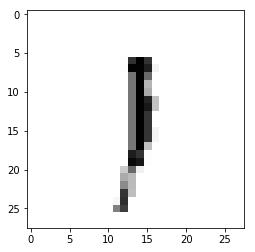

Epoch : 3 cost :  0.2497733614661477
Accuracy : 0.1283
label : [1]
Prediction : [0]


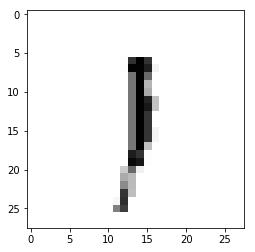

Epoch : 3 cost :  0.2539357181028887
Accuracy : 0.1301
label : [1]
Prediction : [0]


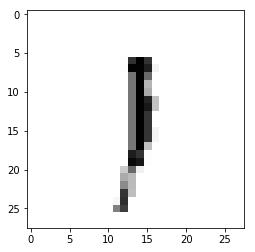

Epoch : 3 cost :  0.2580712448466908
Accuracy : 0.1277
label : [1]
Prediction : [0]


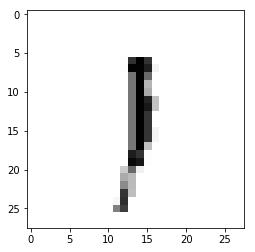

Epoch : 3 cost :  0.26224650643088604
Accuracy : 0.1322
label : [1]
Prediction : [0]


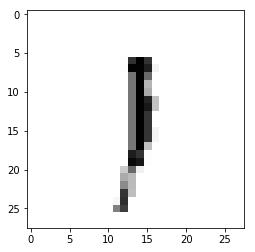

Epoch : 3 cost :  0.26641018477353184
Accuracy : 0.1324
label : [1]
Prediction : [0]


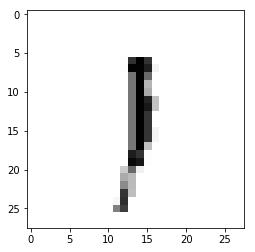

Epoch : 3 cost :  0.2705743542584506
Accuracy : 0.1336
label : [1]
Prediction : [0]


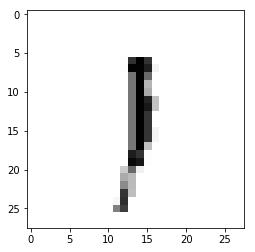

Epoch : 3 cost :  0.27472832809795034
Accuracy : 0.1348
label : [1]
Prediction : [0]


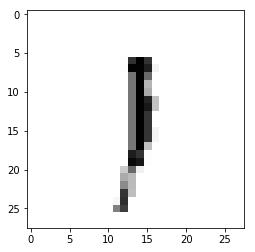

Epoch : 3 cost :  0.2788979638706554
Accuracy : 0.1351
label : [1]
Prediction : [0]


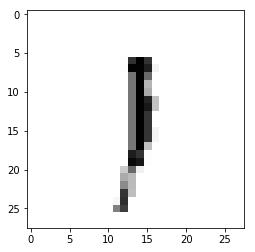

Epoch : 3 cost :  0.2830496220155196
Accuracy : 0.1333
label : [1]
Prediction : [0]


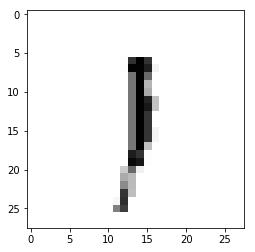

Epoch : 3 cost :  0.2872031146829779
Accuracy : 0.1413
label : [1]
Prediction : [0]


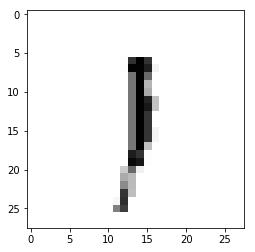

Epoch : 3 cost :  0.2913438966057518
Accuracy : 0.1371
label : [1]
Prediction : [0]


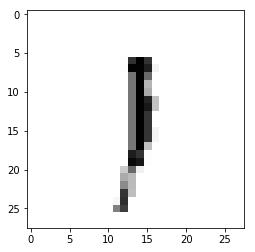

Epoch : 3 cost :  0.2954821534590288
Accuracy : 0.1372
label : [1]
Prediction : [0]


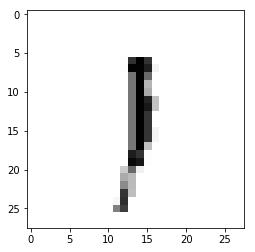

Epoch : 3 cost :  0.29961564410816544
Accuracy : 0.1359
label : [1]
Prediction : [0]


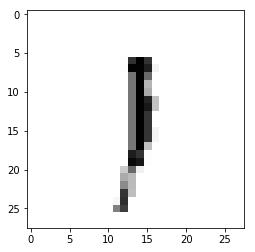

Epoch : 3 cost :  0.30374450987035584
Accuracy : 0.1341
label : [1]
Prediction : [0]


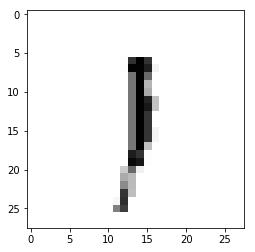

Epoch : 3 cost :  0.3078943811763417
Accuracy : 0.1321
label : [1]
Prediction : [0]


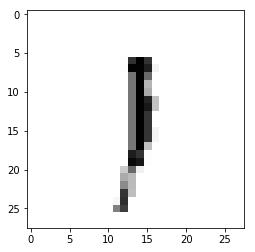

Epoch : 3 cost :  0.3120532113855536
Accuracy : 0.1319
label : [1]
Prediction : [0]


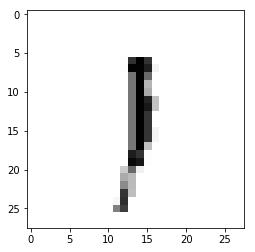

Epoch : 3 cost :  0.3161924878033725
Accuracy : 0.1315
label : [1]
Prediction : [0]


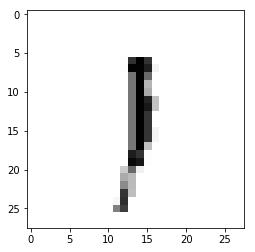

Epoch : 3 cost :  0.32037613825364547
Accuracy : 0.1315
label : [1]
Prediction : [0]


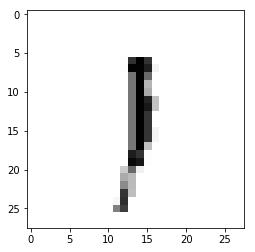

Epoch : 3 cost :  0.3245160670713945
Accuracy : 0.1303
label : [1]
Prediction : [0]


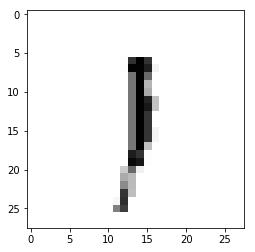

Epoch : 3 cost :  0.3286784258755771
Accuracy : 0.1292
label : [1]
Prediction : [0]


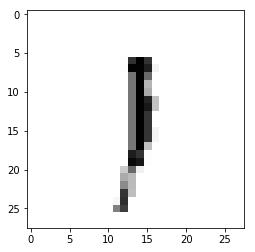

Epoch : 3 cost :  0.3328423556414518
Accuracy : 0.1283
label : [1]
Prediction : [0]


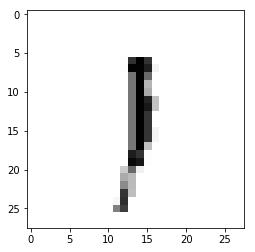

Epoch : 3 cost :  0.3369884516976097
Accuracy : 0.1291
label : [1]
Prediction : [0]


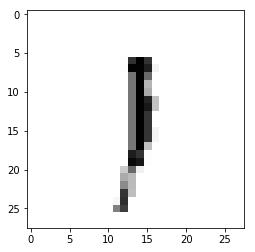

Epoch : 3 cost :  0.34113831736824735
Accuracy : 0.1287
label : [1]
Prediction : [0]


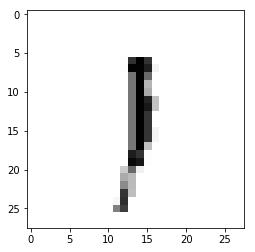

Epoch : 3 cost :  0.3452825407548385
Accuracy : 0.1288
label : [1]
Prediction : [0]


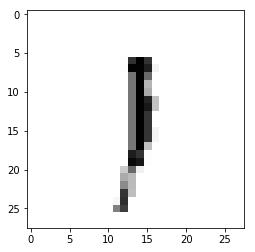

Epoch : 3 cost :  0.3494471549987794
Accuracy : 0.1294
label : [1]
Prediction : [0]


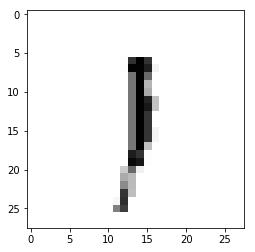

Epoch : 3 cost :  0.353599742976102
Accuracy : 0.1297
label : [1]
Prediction : [0]


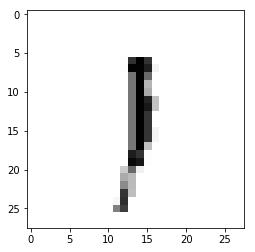

Epoch : 3 cost :  0.35776247327977967
Accuracy : 0.1305
label : [1]
Prediction : [0]


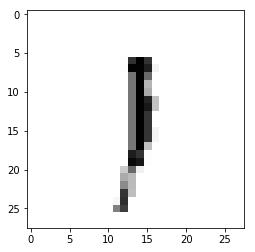

Epoch : 3 cost :  0.3619139784032649
Accuracy : 0.1309
label : [1]
Prediction : [0]


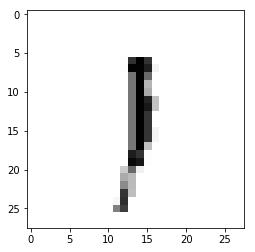

Epoch : 3 cost :  0.366063163063743
Accuracy : 0.1299
label : [1]
Prediction : [0]


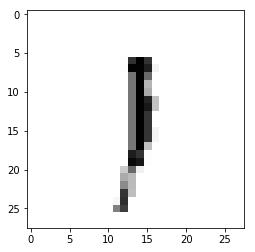

Epoch : 3 cost :  0.37021479259837764
Accuracy : 0.1315
label : [1]
Prediction : [0]


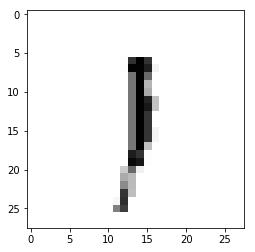

Epoch : 3 cost :  0.37437627012079416
Accuracy : 0.1358
label : [1]
Prediction : [0]


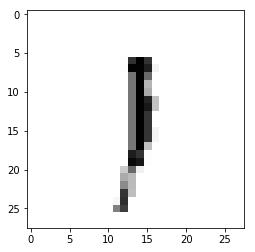

Epoch : 3 cost :  0.37851459329778503
Accuracy : 0.1329
label : [1]
Prediction : [0]


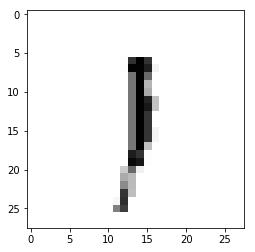

Epoch : 3 cost :  0.38266933484510945
Accuracy : 0.1314
label : [1]
Prediction : [0]


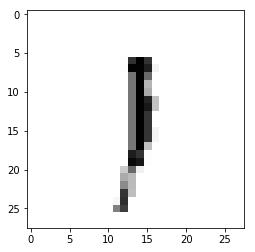

Epoch : 3 cost :  0.386826342235912
Accuracy : 0.1332
label : [1]
Prediction : [0]


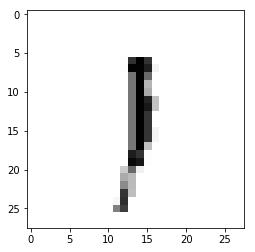

Epoch : 3 cost :  0.3909846223484386
Accuracy : 0.1338
label : [1]
Prediction : [0]


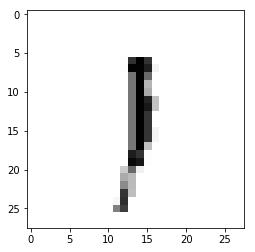

Epoch : 3 cost :  0.39514549948952415
Accuracy : 0.134
label : [1]
Prediction : [0]


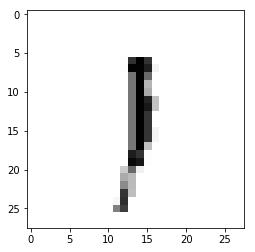

Epoch : 3 cost :  0.3993045134977861
Accuracy : 0.1339
label : [1]
Prediction : [0]


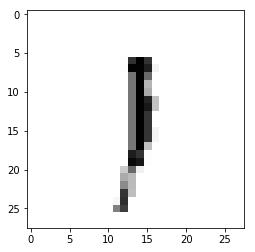

Epoch : 3 cost :  0.40344609433954415
Accuracy : 0.1324
label : [1]
Prediction : [0]


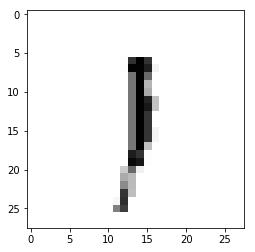

Epoch : 3 cost :  0.4075988067280163
Accuracy : 0.1304
label : [1]
Prediction : [0]


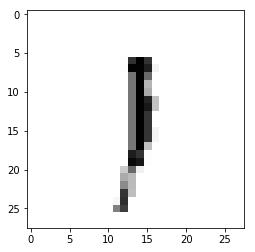

Epoch : 3 cost :  0.4117817436565053
Accuracy : 0.1292
label : [1]
Prediction : [0]


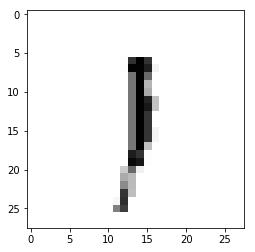

Epoch : 3 cost :  0.4159041326696223
Accuracy : 0.1247
label : [1]
Prediction : [0]


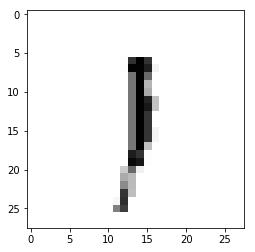

Epoch : 3 cost :  0.42008349461988975
Accuracy : 0.1177
label : [1]
Prediction : [0]


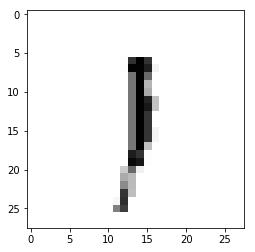

Epoch : 3 cost :  0.42424259879372345
Accuracy : 0.1171
label : [1]
Prediction : [0]


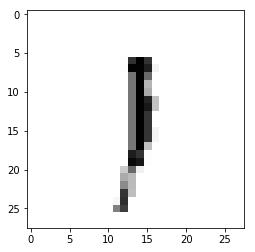

Epoch : 3 cost :  0.42841107801957573
Accuracy : 0.117
label : [1]
Prediction : [0]


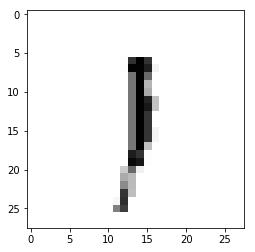

Epoch : 3 cost :  0.43256338076158013
Accuracy : 0.1174
label : [1]
Prediction : [0]


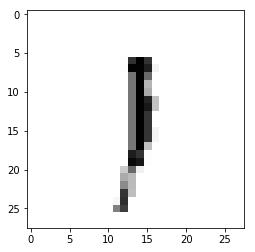

Epoch : 3 cost :  0.4367330165342852
Accuracy : 0.1166
label : [1]
Prediction : [0]


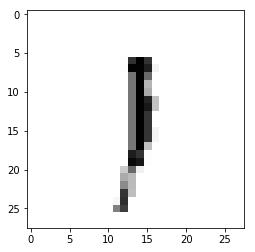

Epoch : 3 cost :  0.44086877866224816
Accuracy : 0.1166
label : [1]
Prediction : [0]


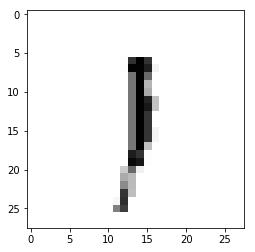

Epoch : 3 cost :  0.4450591130690142
Accuracy : 0.1176
label : [1]
Prediction : [0]


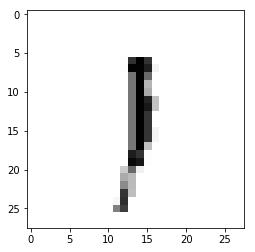

Epoch : 3 cost :  0.4492006969451905
Accuracy : 0.1264
label : [1]
Prediction : [0]


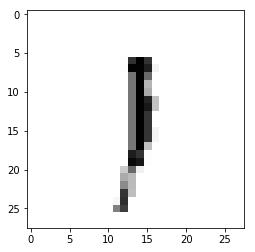

Epoch : 3 cost :  0.4533489725806497
Accuracy : 0.1269
label : [1]
Prediction : [0]


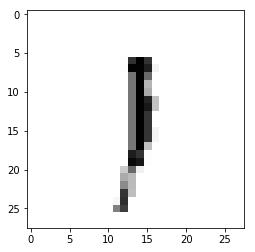

Epoch : 3 cost :  0.457505227435719
Accuracy : 0.1286
label : [1]
Prediction : [0]


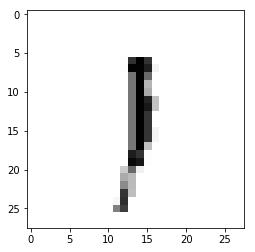

Epoch : 3 cost :  0.4616617514870384
Accuracy : 0.1286
label : [1]
Prediction : [0]


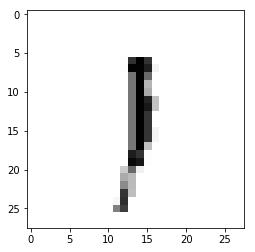

Epoch : 3 cost :  0.4658214374022051
Accuracy : 0.1311
label : [1]
Prediction : [0]


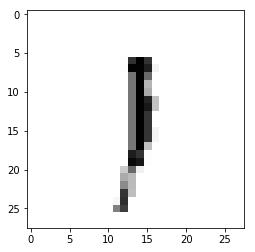

Epoch : 3 cost :  0.4699749001589689
Accuracy : 0.1304
label : [1]
Prediction : [0]


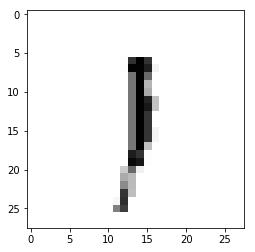

Epoch : 3 cost :  0.4741238628734243
Accuracy : 0.13
label : [1]
Prediction : [0]


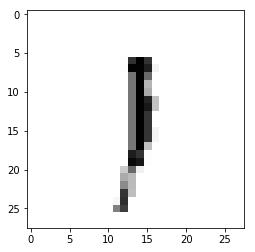

Epoch : 3 cost :  0.47829799782146115
Accuracy : 0.1296
label : [1]
Prediction : [0]


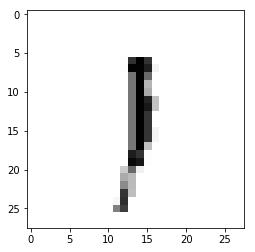

Epoch : 3 cost :  0.4824476168372415
Accuracy : 0.1306
label : [1]
Prediction : [0]


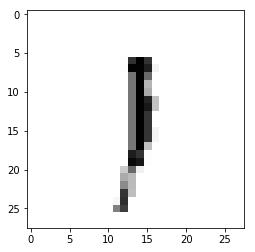

Epoch : 3 cost :  0.4866304453936491
Accuracy : 0.1311
label : [1]
Prediction : [0]


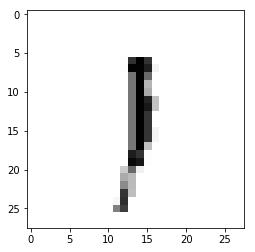

Epoch : 3 cost :  0.4908294157548385
Accuracy : 0.1337
label : [1]
Prediction : [0]


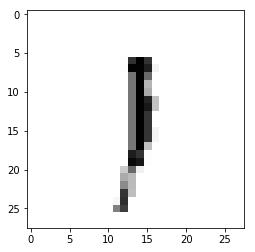

Epoch : 3 cost :  0.4950196196816185
Accuracy : 0.1436
label : [1]
Prediction : [0]


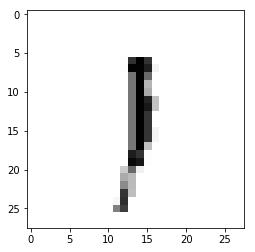

Epoch : 3 cost :  0.4991632639278066
Accuracy : 0.1347
label : [1]
Prediction : [0]


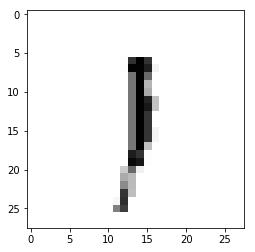

Epoch : 3 cost :  0.503331429308111
Accuracy : 0.1656
label : [1]
Prediction : [0]


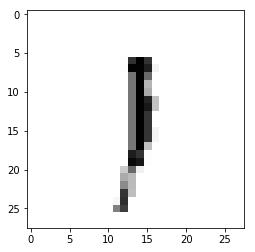

Epoch : 3 cost :  0.5074907034093683
Accuracy : 0.1431
label : [1]
Prediction : [0]


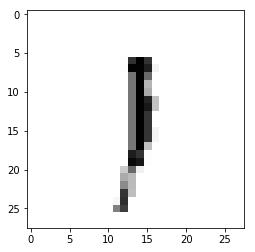

Epoch : 3 cost :  0.5116580425609242
Accuracy : 0.1372
label : [1]
Prediction : [0]


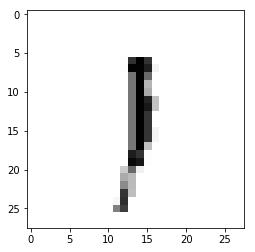

Epoch : 3 cost :  0.515786340453408
Accuracy : 0.1335
label : [1]
Prediction : [0]


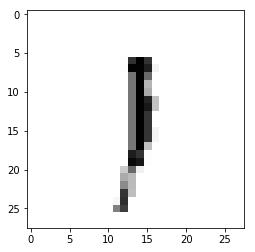

Epoch : 3 cost :  0.5199279867519032
Accuracy : 0.1337
label : [1]
Prediction : [0]


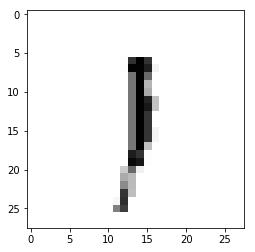

Epoch : 3 cost :  0.5240914825959639
Accuracy : 0.1475
label : [1]
Prediction : [0]


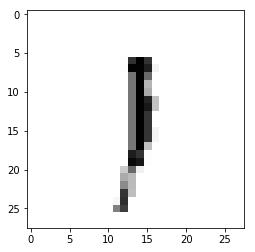

Epoch : 3 cost :  0.5282645936445757
Accuracy : 0.1729
label : [1]
Prediction : [0]


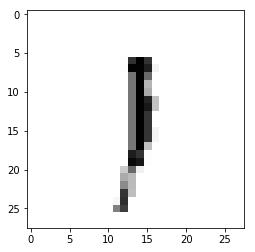

Epoch : 3 cost :  0.5324139105189931
Accuracy : 0.1465
label : [1]
Prediction : [0]


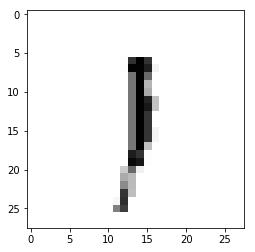

Epoch : 3 cost :  0.5365773240002719
Accuracy : 0.1466
label : [1]
Prediction : [0]


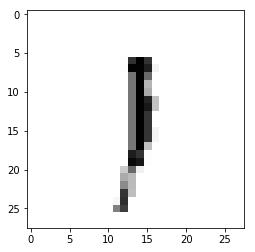

Epoch : 3 cost :  0.5407129634510387
Accuracy : 0.1375
label : [1]
Prediction : [0]


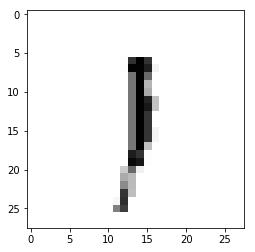

Epoch : 3 cost :  0.5448834063790061
Accuracy : 0.1378
label : [1]
Prediction : [0]


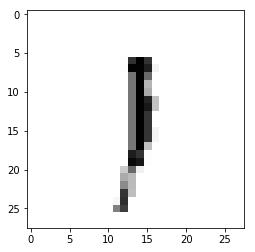

Epoch : 3 cost :  0.54902109189467
Accuracy : 0.1377
label : [1]
Prediction : [0]


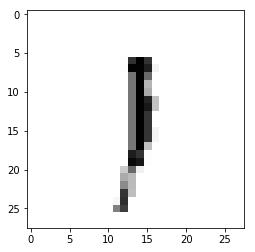

Epoch : 3 cost :  0.5531804383884776
Accuracy : 0.1375
label : [1]
Prediction : [0]


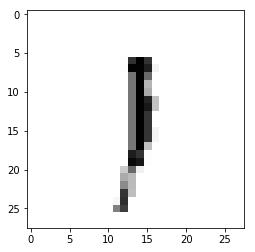

Epoch : 3 cost :  0.5573220400376753
Accuracy : 0.1372
label : [1]
Prediction : [0]


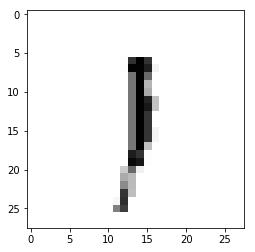

Epoch : 3 cost :  0.5614853148026899
Accuracy : 0.1374
label : [1]
Prediction : [0]


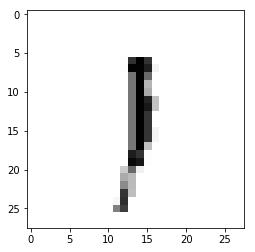

Epoch : 3 cost :  0.5656153180382468
Accuracy : 0.1371
label : [1]
Prediction : [0]


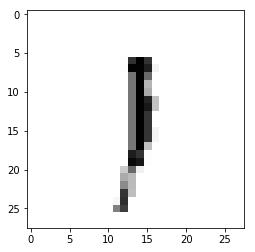

Epoch : 3 cost :  0.569776592688127
Accuracy : 0.1382
label : [1]
Prediction : [0]


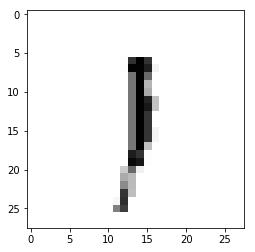

Epoch : 3 cost :  0.5739423088593916
Accuracy : 0.1391
label : [1]
Prediction : [0]


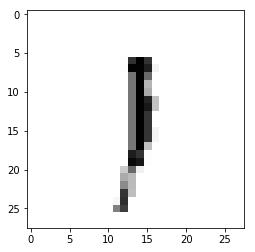

Epoch : 3 cost :  0.5781052424690939
Accuracy : 0.1383
label : [1]
Prediction : [0]


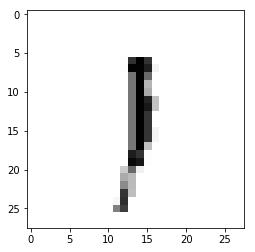

Epoch : 3 cost :  0.5822729691592129
Accuracy : 0.1392
label : [1]
Prediction : [0]


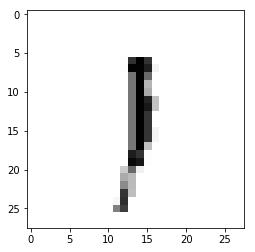

Epoch : 3 cost :  0.5864454715902154
Accuracy : 0.1397
label : [1]
Prediction : [0]


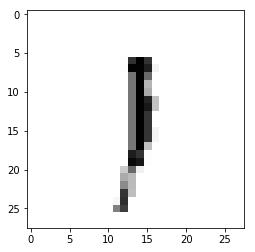

Epoch : 3 cost :  0.590618497241627
Accuracy : 0.1405
label : [1]
Prediction : [0]


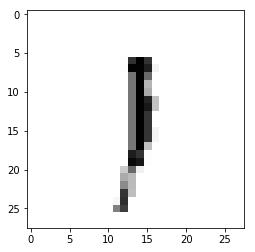

Epoch : 3 cost :  0.5947637848420575
Accuracy : 0.1398
label : [1]
Prediction : [0]


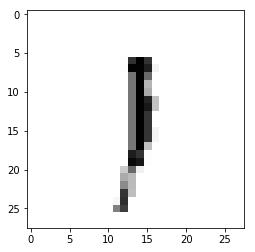

Epoch : 3 cost :  0.5988947044719347
Accuracy : 0.1417
label : [1]
Prediction : [0]


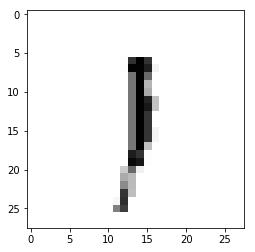

Epoch : 3 cost :  0.6030351469733496
Accuracy : 0.1429
label : [1]
Prediction : [0]


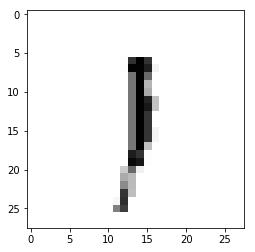

Epoch : 3 cost :  0.6072166256471111
Accuracy : 0.1494
label : [1]
Prediction : [0]


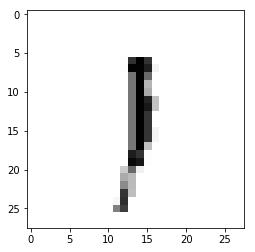

Epoch : 3 cost :  0.6114090082862158
Accuracy : 0.1566
label : [1]
Prediction : [0]


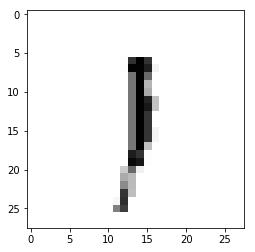

Epoch : 3 cost :  0.6155621303211557
Accuracy : 0.1441
label : [1]
Prediction : [0]


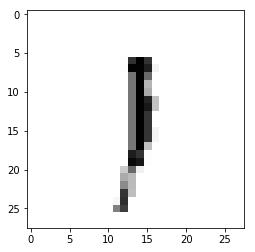

Epoch : 3 cost :  0.6196949009461834
Accuracy : 0.1444
label : [1]
Prediction : [0]


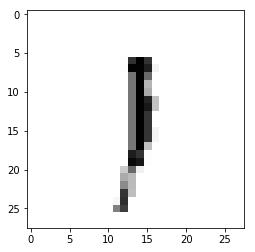

Epoch : 3 cost :  0.623826764713634
Accuracy : 0.1445
label : [1]
Prediction : [0]


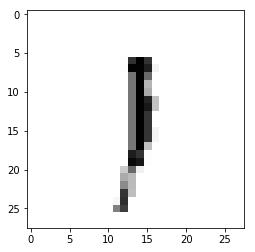

Epoch : 3 cost :  0.6279840993881224
Accuracy : 0.1406
label : [1]
Prediction : [0]


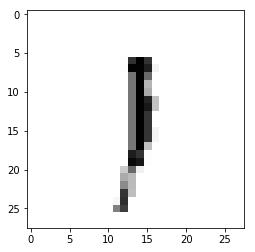

Epoch : 3 cost :  0.6321421584216029
Accuracy : 0.1399
label : [1]
Prediction : [0]


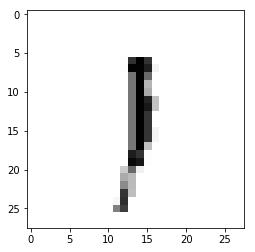

Epoch : 3 cost :  0.6362999937751075
Accuracy : 0.1388
label : [1]
Prediction : [0]


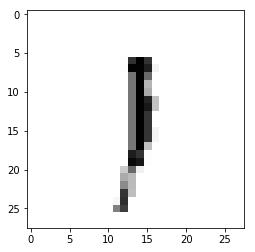

Epoch : 3 cost :  0.6404707605188542
Accuracy : 0.1402
label : [1]
Prediction : [0]


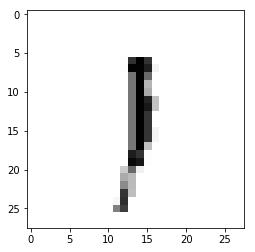

Epoch : 3 cost :  0.6446216236461292
Accuracy : 0.142
label : [1]
Prediction : [0]


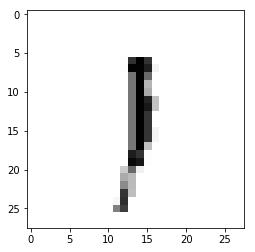

Epoch : 3 cost :  0.648753824667497
Accuracy : 0.1423
label : [1]
Prediction : [0]


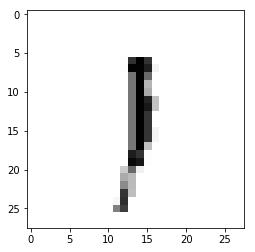

Epoch : 3 cost :  0.6529101172360505
Accuracy : 0.1437
label : [1]
Prediction : [0]


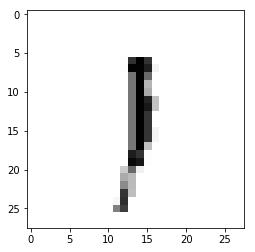

Epoch : 3 cost :  0.6570542734319512
Accuracy : 0.1493
label : [1]
Prediction : [0]


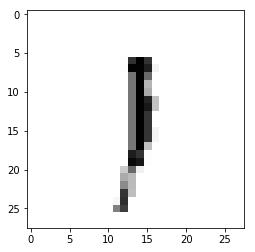

Epoch : 3 cost :  0.6612100258740511
Accuracy : 0.1484
label : [1]
Prediction : [0]


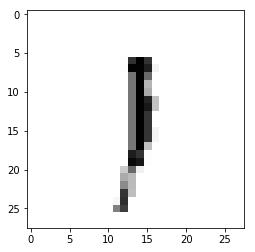

Epoch : 3 cost :  0.665396330573342
Accuracy : 0.1436
label : [1]
Prediction : [0]


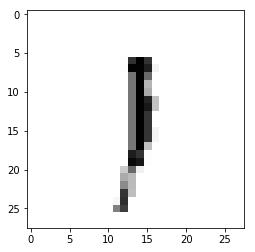

Epoch : 3 cost :  0.6695537194338711
Accuracy : 0.1382
label : [1]
Prediction : [0]


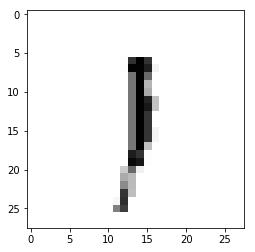

Epoch : 3 cost :  0.6737224600531837
Accuracy : 0.1381
label : [1]
Prediction : [0]


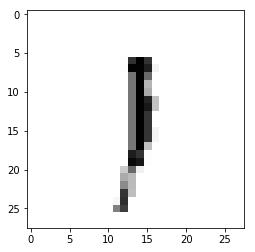

Epoch : 3 cost :  0.6778737943822686
Accuracy : 0.15
label : [1]
Prediction : [0]


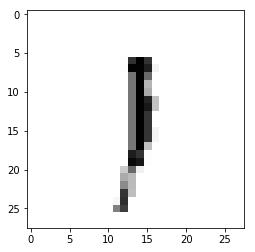

Epoch : 3 cost :  0.6820242569663306
Accuracy : 0.1382
label : [1]
Prediction : [0]


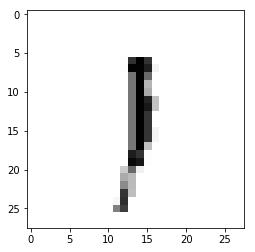

Epoch : 3 cost :  0.6861557522687043
Accuracy : 0.1352
label : [1]
Prediction : [0]


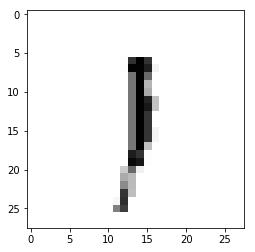

Epoch : 3 cost :  0.690306497920643
Accuracy : 0.1352
label : [1]
Prediction : [0]


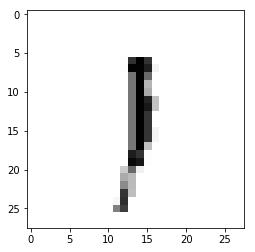

Epoch : 3 cost :  0.6944601388411087
Accuracy : 0.1344
label : [1]
Prediction : [0]


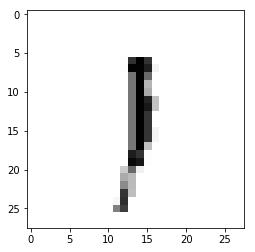

Epoch : 3 cost :  0.698612975207242
Accuracy : 0.1327
label : [1]
Prediction : [0]


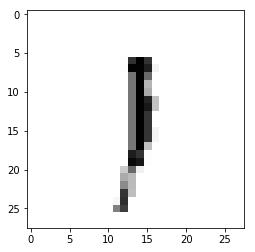

Epoch : 3 cost :  0.7027834632179952
Accuracy : 0.1332
label : [1]
Prediction : [0]


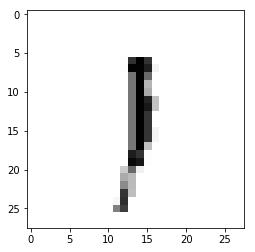

Epoch : 3 cost :  0.7069211747429586
Accuracy : 0.1327
label : [1]
Prediction : [0]


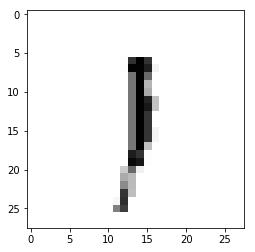

Epoch : 3 cost :  0.7110727964748034
Accuracy : 0.1336
label : [1]
Prediction : [0]


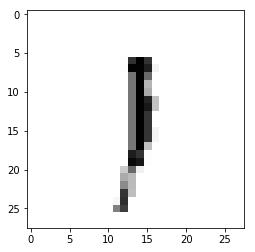

Epoch : 3 cost :  0.7152224887501107
Accuracy : 0.1337
label : [1]
Prediction : [0]


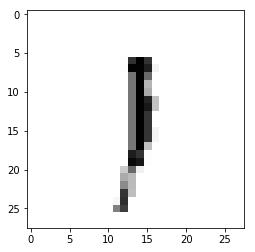

Epoch : 3 cost :  0.7194092520800501
Accuracy : 0.1633
label : [1]
Prediction : [0]


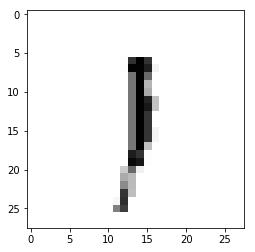

Epoch : 3 cost :  0.7235517848621713
Accuracy : 0.1609
label : [1]
Prediction : [0]


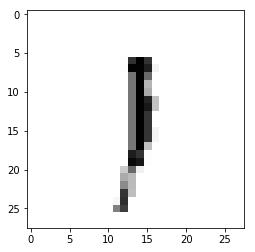

Epoch : 3 cost :  0.7276971322839908
Accuracy : 0.1417
label : [1]
Prediction : [0]


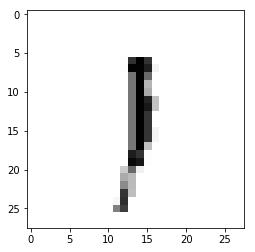

Epoch : 3 cost :  0.7318610984628848
Accuracy : 0.1356
label : [1]
Prediction : [0]


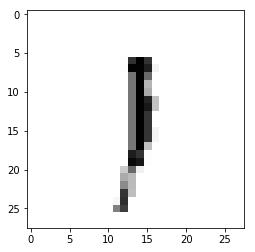

Epoch : 3 cost :  0.7360468560999087
Accuracy : 0.1655
label : [1]
Prediction : [0]


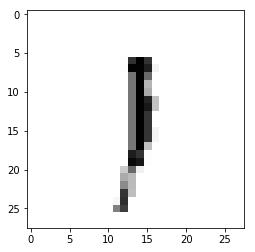

Epoch : 3 cost :  0.740184928287159
Accuracy : 0.1699
label : [1]
Prediction : [0]


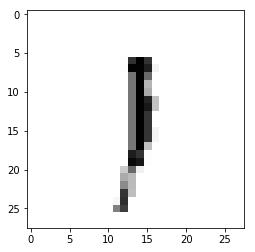

Epoch : 3 cost :  0.7443220810456707
Accuracy : 0.178
label : [1]
Prediction : [0]


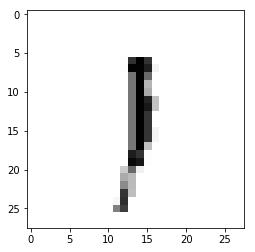

Epoch : 3 cost :  0.7484957998449149
Accuracy : 0.1792
label : [1]
Prediction : [0]


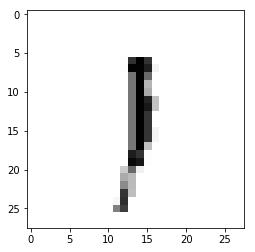

Epoch : 3 cost :  0.7526450014114376
Accuracy : 0.1825
label : [1]
Prediction : [0]


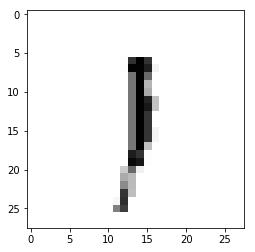

Epoch : 3 cost :  0.7567716529152606
Accuracy : 0.181
label : [1]
Prediction : [0]


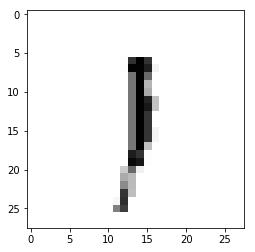

Epoch : 3 cost :  0.7609023839777163
Accuracy : 0.1749
label : [1]
Prediction : [0]


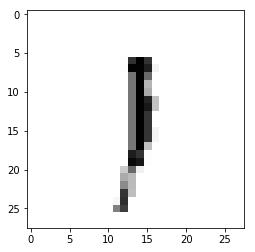

Epoch : 3 cost :  0.7650302306088531
Accuracy : 0.1648
label : [1]
Prediction : [0]


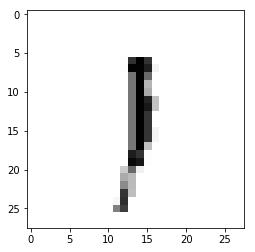

Epoch : 3 cost :  0.7691756816343824
Accuracy : 0.1476
label : [1]
Prediction : [0]


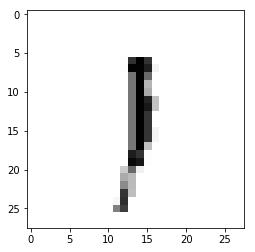

Epoch : 3 cost :  0.7733309229937463
Accuracy : 0.1622
label : [1]
Prediction : [0]


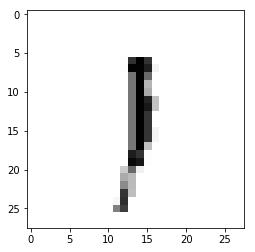

Epoch : 3 cost :  0.777492224953391
Accuracy : 0.1737
label : [1]
Prediction : [0]


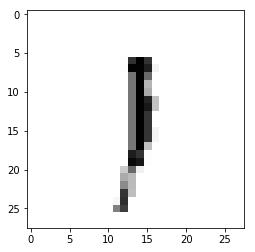

Epoch : 3 cost :  0.7816360673037439
Accuracy : 0.1594
label : [1]
Prediction : [0]


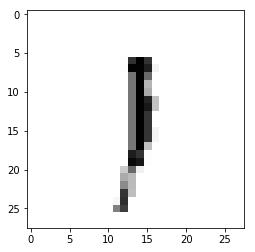

Epoch : 3 cost :  0.7857643435218115
Accuracy : 0.1487
label : [1]
Prediction : [0]


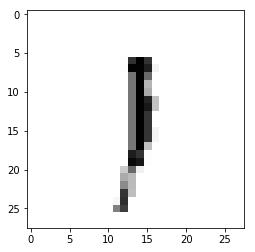

Epoch : 3 cost :  0.7899520856683901
Accuracy : 0.1709
label : [1]
Prediction : [0]


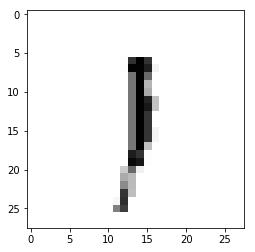

Epoch : 3 cost :  0.794096417860551
Accuracy : 0.1709
label : [1]
Prediction : [0]


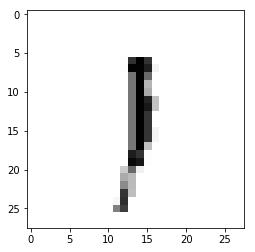

Epoch : 3 cost :  0.7982377984307025
Accuracy : 0.1559
label : [1]
Prediction : [0]


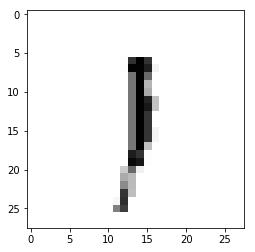

Epoch : 3 cost :  0.802410339442166
Accuracy : 0.1337
label : [1]
Prediction : [0]


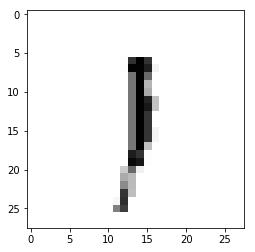

Epoch : 3 cost :  0.8065630539980797
Accuracy : 0.1335
label : [1]
Prediction : [0]


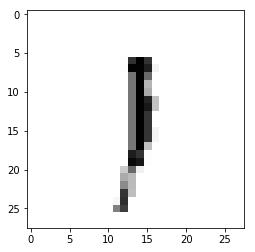

Epoch : 3 cost :  0.8107141113281245
Accuracy : 0.1476
label : [1]
Prediction : [0]


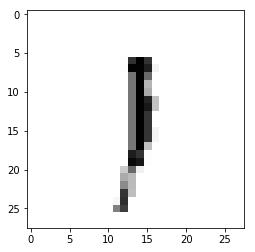

Epoch : 3 cost :  0.8148733407800843
Accuracy : 0.1414
label : [1]
Prediction : [0]


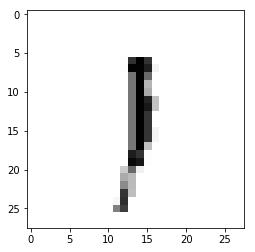

Epoch : 3 cost :  0.8190277368372132
Accuracy : 0.1645
label : [1]
Prediction : [0]


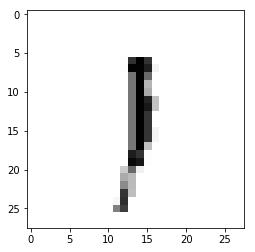

Epoch : 3 cost :  0.8231515468250616
Accuracy : 0.1574
label : [1]
Prediction : [0]


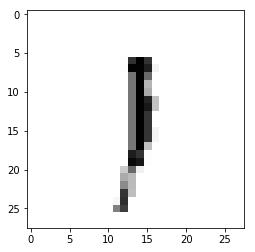

Epoch : 3 cost :  0.8273220647465094
Accuracy : 0.1696
label : [1]
Prediction : [0]


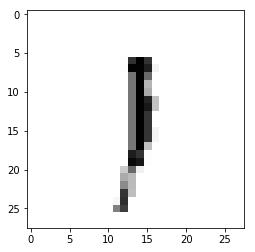

Epoch : 3 cost :  0.8314938358827065
Accuracy : 0.1723
label : [1]
Prediction : [0]


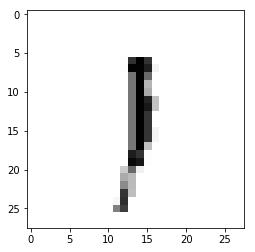

Epoch : 3 cost :  0.8356380310925565
Accuracy : 0.1463
label : [1]
Prediction : [0]


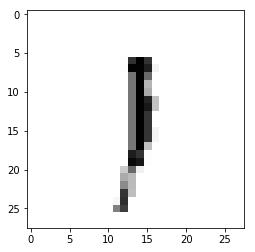

Epoch : 3 cost :  0.839800545519048
Accuracy : 0.1443
label : [1]
Prediction : [0]


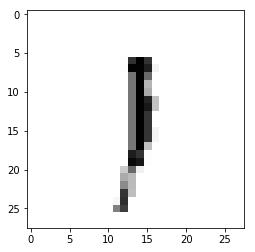

Epoch : 3 cost :  0.8439385396783997
Accuracy : 0.1386
label : [1]
Prediction : [0]


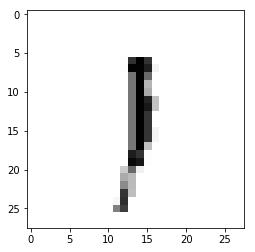

Epoch : 3 cost :  0.8480937541614875
Accuracy : 0.1441
label : [1]
Prediction : [0]


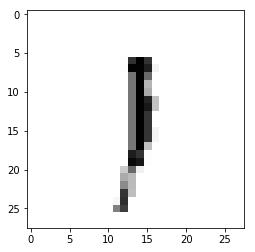

Epoch : 3 cost :  0.8522537136077877
Accuracy : 0.1483
label : [1]
Prediction : [0]


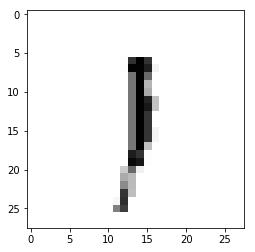

Epoch : 3 cost :  0.8564199529994614
Accuracy : 0.1506
label : [1]
Prediction : [0]


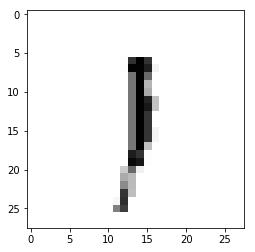

Epoch : 3 cost :  0.8605824461850249
Accuracy : 0.1578
label : [1]
Prediction : [0]


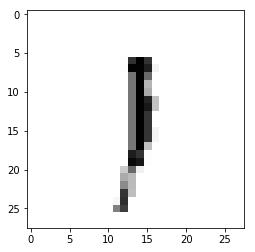

Epoch : 3 cost :  0.8647399061376394
Accuracy : 0.1486
label : [1]
Prediction : [0]


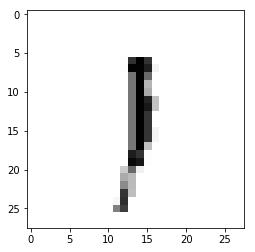

Epoch : 3 cost :  0.8688844620097763
Accuracy : 0.1598
label : [1]
Prediction : [0]


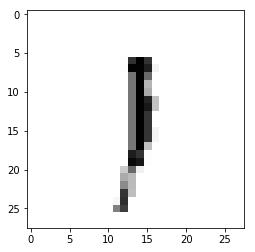

Epoch : 3 cost :  0.8730229043960567
Accuracy : 0.1566
label : [1]
Prediction : [0]


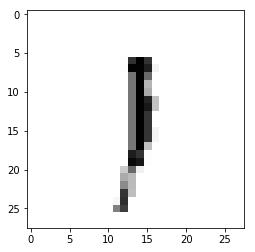

Epoch : 3 cost :  0.8771837234497066
Accuracy : 0.1523
label : [1]
Prediction : [0]


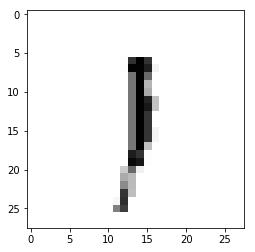

Epoch : 3 cost :  0.8813568869504058
Accuracy : 0.1524
label : [1]
Prediction : [0]


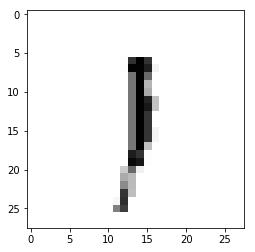

Epoch : 3 cost :  0.8855266887491396
Accuracy : 0.1507
label : [1]
Prediction : [0]


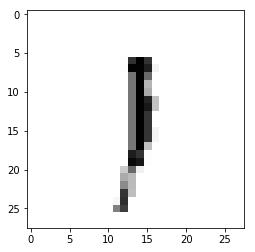

Epoch : 3 cost :  0.8896816526759751
Accuracy : 0.1485
label : [1]
Prediction : [0]


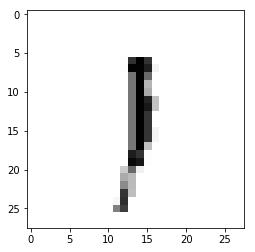

Epoch : 3 cost :  0.8937943445552475
Accuracy : 0.1524
label : [1]
Prediction : [0]


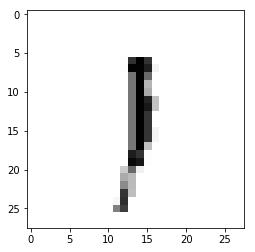

Epoch : 3 cost :  0.8979795568639578
Accuracy : 0.1644
label : [1]
Prediction : [0]


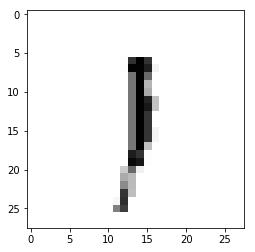

Epoch : 3 cost :  0.9021483698758208
Accuracy : 0.1668
label : [1]
Prediction : [0]


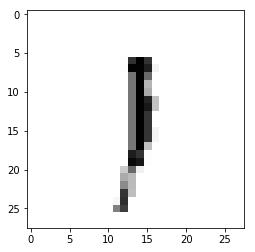

Epoch : 3 cost :  0.9062947390296239
Accuracy : 0.1593
label : [1]
Prediction : [0]


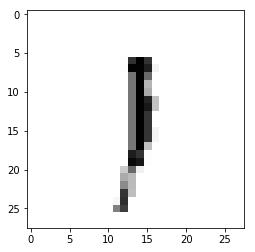

Epoch : 3 cost :  0.9104554484107273
Accuracy : 0.1556
label : [1]
Prediction : [0]


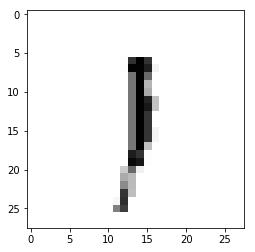

Epoch : 3 cost :  0.9145943307876583
Accuracy : 0.1557
label : [1]
Prediction : [0]


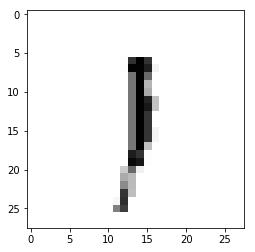

Epoch : 3 cost :  0.9187650459462942
Accuracy : 0.1609
label : [1]
Prediction : [0]


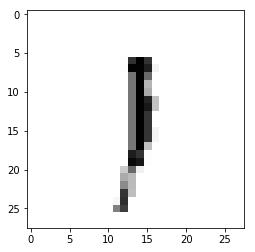

Epoch : 3 cost :  0.9229280285401773
Accuracy : 0.165
label : [1]
Prediction : [0]


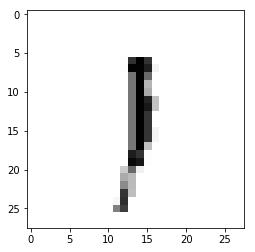

Epoch : 3 cost :  0.9271113304658365
Accuracy : 0.1646
label : [1]
Prediction : [0]


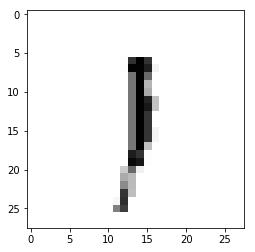

Epoch : 3 cost :  0.9312767527320164
Accuracy : 0.1662
label : [1]
Prediction : [0]


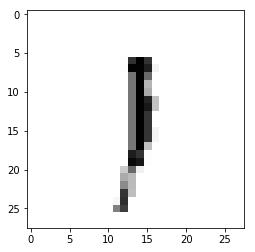

Epoch : 3 cost :  0.9354196184331716
Accuracy : 0.1702
label : [1]
Prediction : [0]


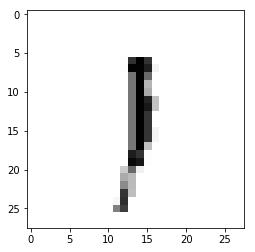

Epoch : 3 cost :  0.9395956841382108
Accuracy : 0.1709
label : [1]
Prediction : [0]


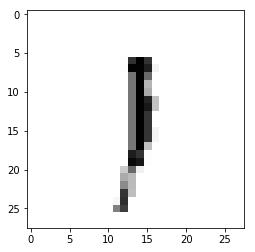

Epoch : 3 cost :  0.9437745046615595
Accuracy : 0.171
label : [1]
Prediction : [0]


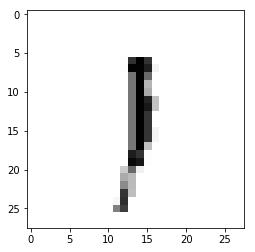

Epoch : 3 cost :  0.9479188823699946
Accuracy : 0.1655
label : [1]
Prediction : [0]


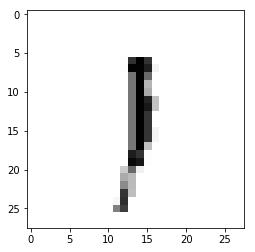

Epoch : 3 cost :  0.9520811249993059
Accuracy : 0.1649
label : [1]
Prediction : [0]


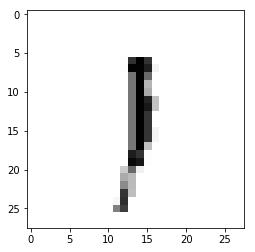

Epoch : 3 cost :  0.9562318546121765
Accuracy : 0.1656
label : [1]
Prediction : [0]


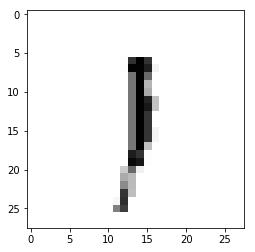

Epoch : 3 cost :  0.9603970610011702
Accuracy : 0.1647
label : [1]
Prediction : [0]


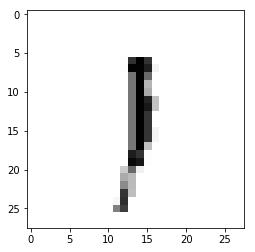

Epoch : 3 cost :  0.9645523387735534
Accuracy : 0.1672
label : [1]
Prediction : [0]


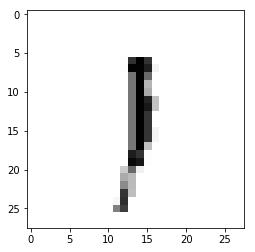

Epoch : 3 cost :  0.9686809067292641
Accuracy : 0.1638
label : [1]
Prediction : [0]


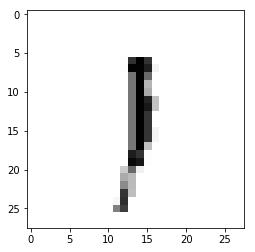

Epoch : 3 cost :  0.9728239696676075
Accuracy : 0.1635
label : [1]
Prediction : [0]


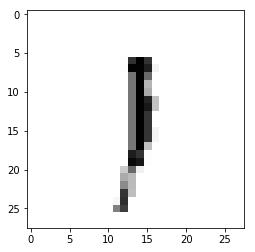

Epoch : 3 cost :  0.97695637659593
Accuracy : 0.1606
label : [1]
Prediction : [0]


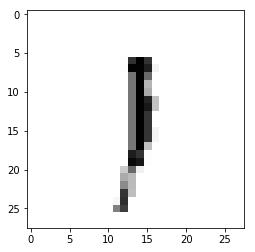

Epoch : 3 cost :  0.9811319576610212
Accuracy : 0.1644
label : [1]
Prediction : [0]


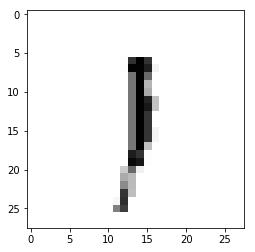

Epoch : 3 cost :  0.9852998182990328
Accuracy : 0.1732
label : [1]
Prediction : [0]


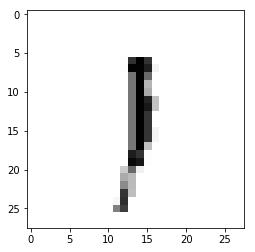

Epoch : 3 cost :  0.9894663589650928
Accuracy : 0.1758
label : [1]
Prediction : [0]


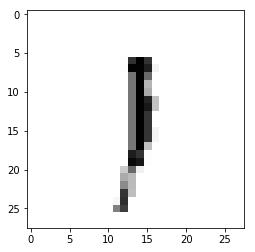

Epoch : 3 cost :  0.993616386326876
Accuracy : 0.1757
label : [1]
Prediction : [0]


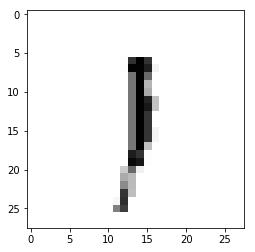

Epoch : 3 cost :  0.9977383483539922
Accuracy : 0.1919
label : [1]
Prediction : [0]


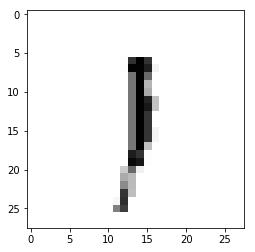

Epoch : 3 cost :  1.0018889999389642
Accuracy : 0.1953
label : [1]
Prediction : [0]


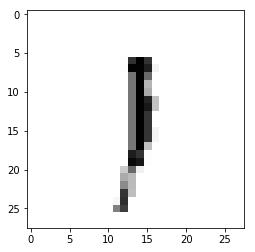

Epoch : 3 cost :  1.006057993715459
Accuracy : 0.1955
label : [1]
Prediction : [0]


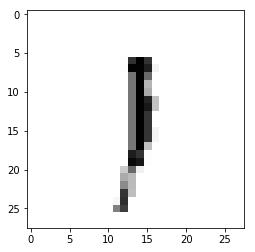

Epoch : 3 cost :  1.0102045436338938
Accuracy : 0.1955
label : [1]
Prediction : [0]


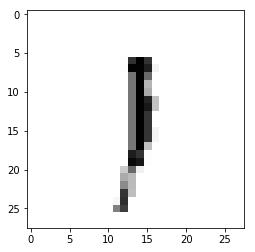

Epoch : 3 cost :  1.014385175271467
Accuracy : 0.1923
label : [1]
Prediction : [0]


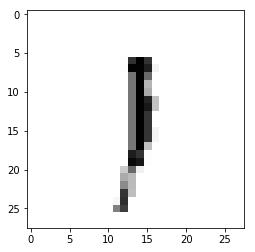

Epoch : 3 cost :  1.0185297112031408
Accuracy : 0.19
label : [1]
Prediction : [0]


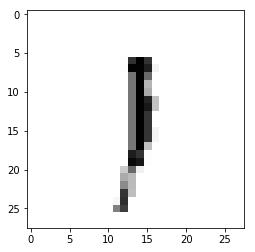

Epoch : 3 cost :  1.0226852130889885
Accuracy : 0.1896
label : [1]
Prediction : [0]


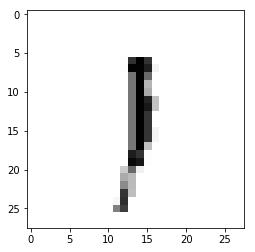

Epoch : 3 cost :  1.0268619975176718
Accuracy : 0.193
label : [1]
Prediction : [0]


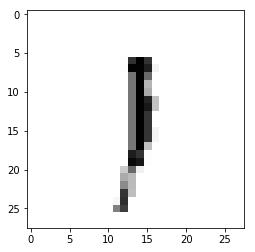

Epoch : 3 cost :  1.0310244399851012
Accuracy : 0.1942
label : [1]
Prediction : [0]


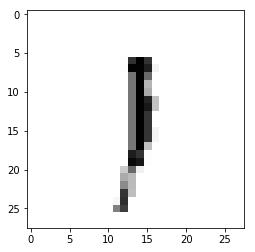

Epoch : 3 cost :  1.0351940237392072
Accuracy : 0.1766
label : [1]
Prediction : [0]


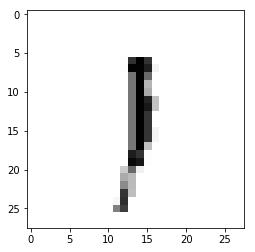

Epoch : 3 cost :  1.0393399216912003
Accuracy : 0.1785
label : [1]
Prediction : [0]


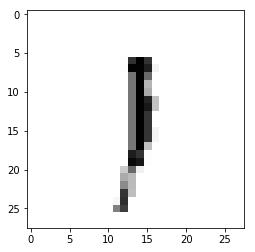

Epoch : 3 cost :  1.0434956823695782
Accuracy : 0.1711
label : [1]
Prediction : [0]


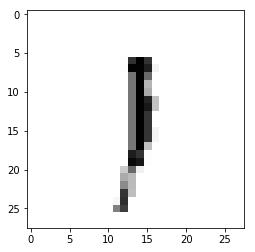

Epoch : 3 cost :  1.047649673548611
Accuracy : 0.1901
label : [1]
Prediction : [0]


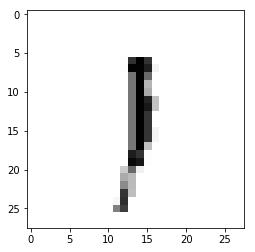

Epoch : 3 cost :  1.0518154100938268
Accuracy : 0.1878
label : [1]
Prediction : [0]


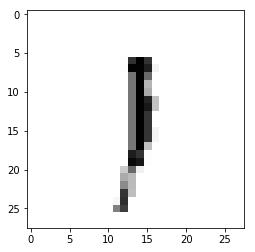

Epoch : 3 cost :  1.0559602455659338
Accuracy : 0.1729
label : [1]
Prediction : [0]


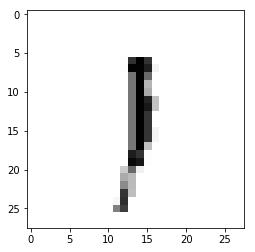

Epoch : 3 cost :  1.0601018433137366
Accuracy : 0.1717
label : [1]
Prediction : [0]


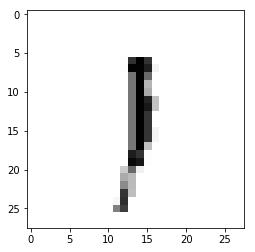

Epoch : 3 cost :  1.0642449361627744
Accuracy : 0.174
label : [1]
Prediction : [0]


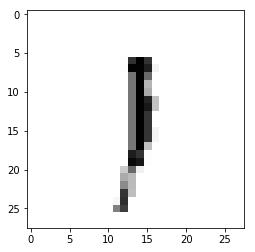

Epoch : 3 cost :  1.0683646111054845
Accuracy : 0.1914
label : [1]
Prediction : [0]


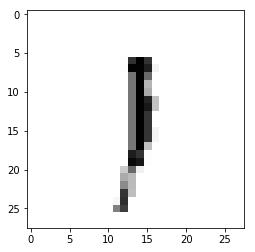

Epoch : 3 cost :  1.0725005756724957
Accuracy : 0.1877
label : [1]
Prediction : [0]


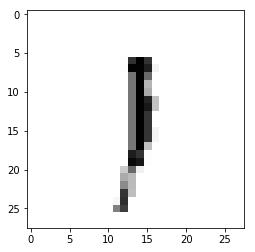

Epoch : 3 cost :  1.07667561227625
Accuracy : 0.1888
label : [1]
Prediction : [0]


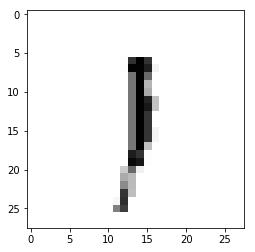

Epoch : 3 cost :  1.0808095056360412
Accuracy : 0.1911
label : [1]
Prediction : [0]


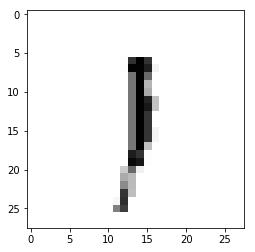

Epoch : 3 cost :  1.0849774325977666
Accuracy : 0.1694
label : [1]
Prediction : [0]


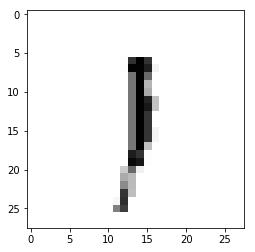

Epoch : 3 cost :  1.0891515783830117
Accuracy : 0.1719
label : [1]
Prediction : [0]


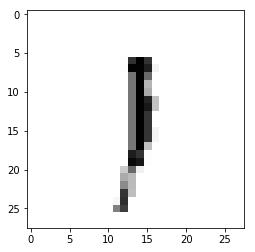

Epoch : 3 cost :  1.0932924270629878
Accuracy : 0.1658
label : [1]
Prediction : [0]


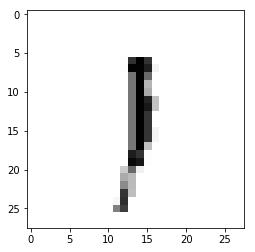

Epoch : 3 cost :  1.0974365503137757
Accuracy : 0.1685
label : [1]
Prediction : [0]


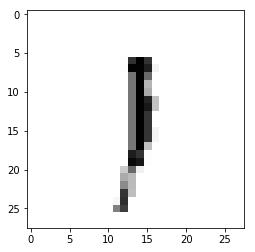

Epoch : 3 cost :  1.1016017367623065
Accuracy : 0.1704
label : [1]
Prediction : [0]


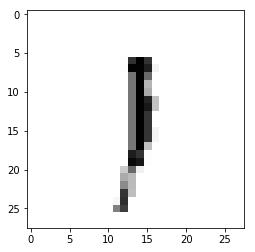

Epoch : 3 cost :  1.1057490392164746
Accuracy : 0.1735
label : [1]
Prediction : [0]


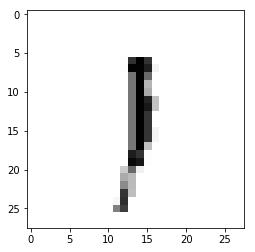

Epoch : 3 cost :  1.1098951495777472
Accuracy : 0.1757
label : [1]
Prediction : [0]


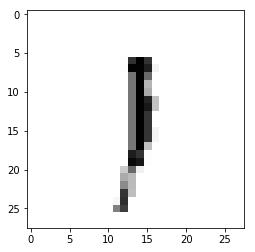

Epoch : 3 cost :  1.1140373992919916
Accuracy : 0.1798
label : [1]
Prediction : [0]


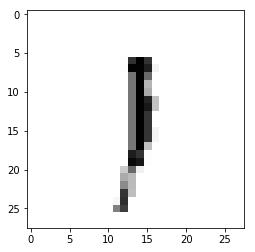

Epoch : 3 cost :  1.118188117634166
Accuracy : 0.1913
label : [1]
Prediction : [0]


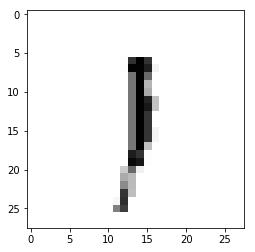

Epoch : 3 cost :  1.1223730720173224
Accuracy : 0.1759
label : [1]
Prediction : [0]


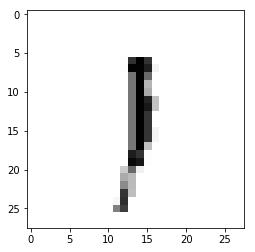

Epoch : 3 cost :  1.126529031666842
Accuracy : 0.1776
label : [1]
Prediction : [0]


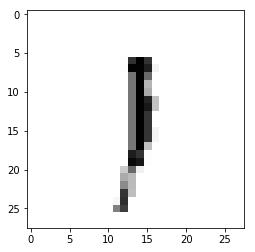

Epoch : 3 cost :  1.13067370631478
Accuracy : 0.1764
label : [1]
Prediction : [0]


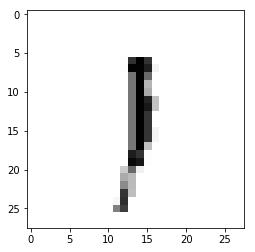

Epoch : 3 cost :  1.134818643223155
Accuracy : 0.2003
label : [1]
Prediction : [0]


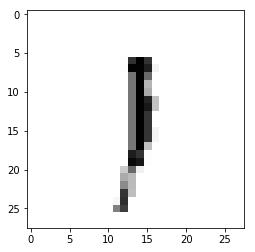

Epoch : 3 cost :  1.1389435898173934
Accuracy : 0.1993
label : [1]
Prediction : [0]


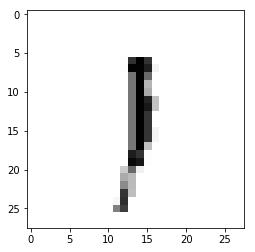

Epoch : 3 cost :  1.1431063088503746
Accuracy : 0.1982
label : [1]
Prediction : [0]


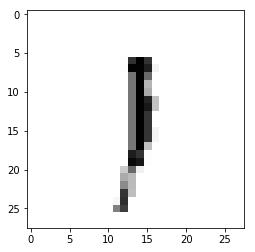

Epoch : 3 cost :  1.147237644195556
Accuracy : 0.2017
label : [1]
Prediction : [0]


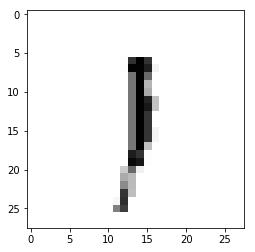

Epoch : 3 cost :  1.1513989613272921
Accuracy : 0.2017
label : [1]
Prediction : [0]


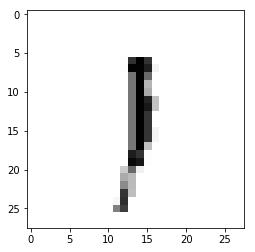

Epoch : 3 cost :  1.1555468949404624
Accuracy : 0.2035
label : [1]
Prediction : [0]


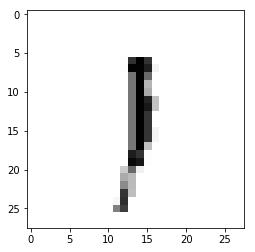

Epoch : 3 cost :  1.1597209163145579
Accuracy : 0.201
label : [1]
Prediction : [0]


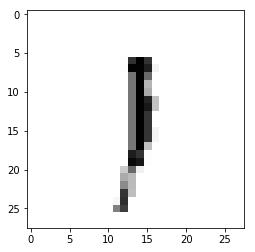

Epoch : 3 cost :  1.163885304711081
Accuracy : 0.206
label : [1]
Prediction : [0]


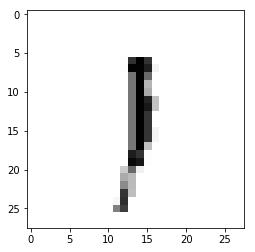

Epoch : 3 cost :  1.168024545149369
Accuracy : 0.2061
label : [1]
Prediction : [0]


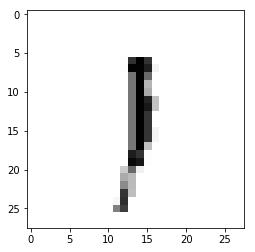

Epoch : 3 cost :  1.1721674515984268
Accuracy : 0.2051
label : [1]
Prediction : [0]


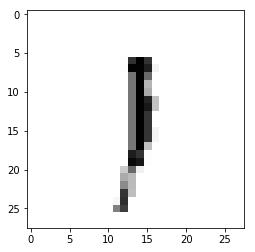

Epoch : 3 cost :  1.1763329375873905
Accuracy : 0.2034
label : [1]
Prediction : [0]


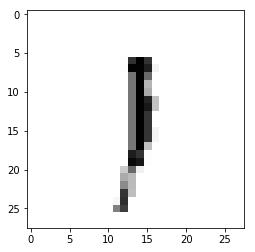

Epoch : 3 cost :  1.1805036020278923
Accuracy : 0.2022
label : [1]
Prediction : [0]


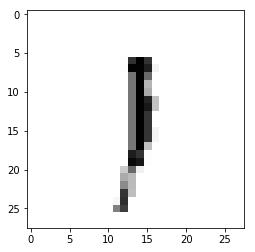

Epoch : 3 cost :  1.1846482810107137
Accuracy : 0.1838
label : [1]
Prediction : [0]


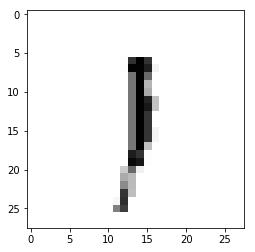

Epoch : 3 cost :  1.1888006379387588
Accuracy : 0.2045
label : [1]
Prediction : [0]


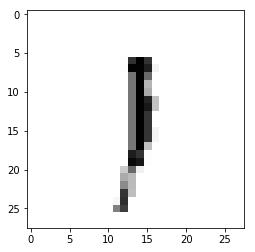

Epoch : 3 cost :  1.1929444945942265
Accuracy : 0.2027
label : [1]
Prediction : [0]


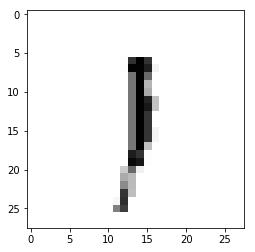

Epoch : 3 cost :  1.197112002372741
Accuracy : 0.1857
label : [1]
Prediction : [0]


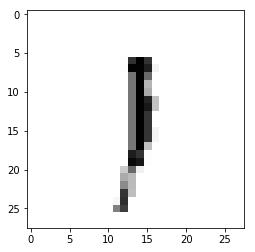

Epoch : 3 cost :  1.2012648725509638
Accuracy : 0.1804
label : [1]
Prediction : [0]


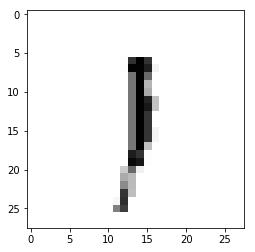

Epoch : 3 cost :  1.205395395539023
Accuracy : 0.193
label : [1]
Prediction : [0]


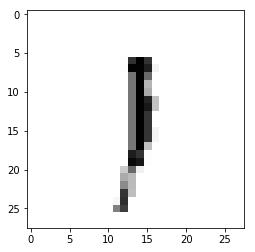

Epoch : 3 cost :  1.2095505475997919
Accuracy : 0.1803
label : [1]
Prediction : [0]


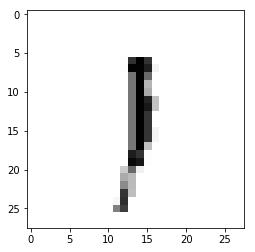

Epoch : 3 cost :  1.2136948914961376
Accuracy : 0.1793
label : [1]
Prediction : [0]


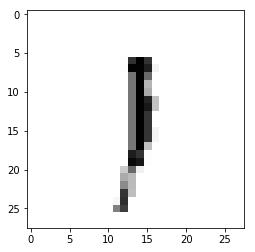

Epoch : 3 cost :  1.217811028307134
Accuracy : 0.1852
label : [1]
Prediction : [0]


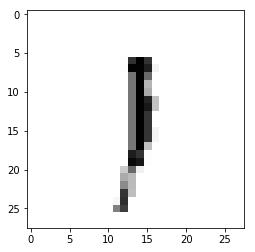

Epoch : 3 cost :  1.22197356484153
Accuracy : 0.171
label : [1]
Prediction : [0]


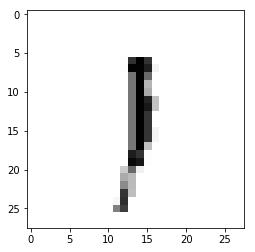

Epoch : 3 cost :  1.2261329282413824
Accuracy : 0.1693
label : [1]
Prediction : [0]


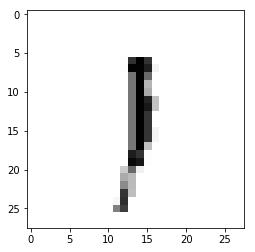

Epoch : 3 cost :  1.2302867564288047
Accuracy : 0.1694
label : [1]
Prediction : [0]


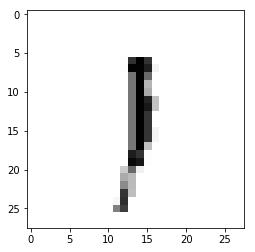

Epoch : 3 cost :  1.2344710189645935
Accuracy : 0.1695
label : [1]
Prediction : [0]


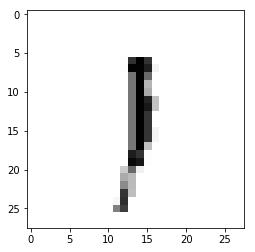

Epoch : 3 cost :  1.2386341996626415
Accuracy : 0.1715
label : [1]
Prediction : [0]


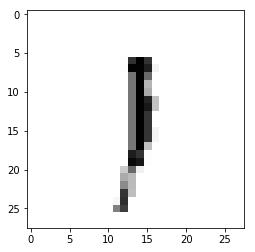

Epoch : 3 cost :  1.242787081545049
Accuracy : 0.172
label : [1]
Prediction : [0]


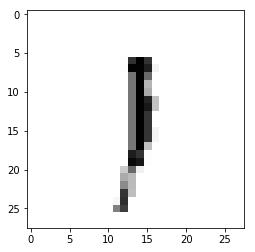

Epoch : 3 cost :  1.2469453941692001
Accuracy : 0.1735
label : [1]
Prediction : [0]


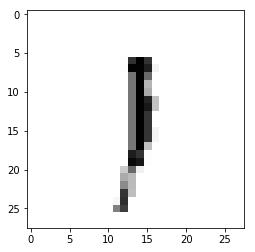

Epoch : 3 cost :  1.2511022784493182
Accuracy : 0.1723
label : [1]
Prediction : [0]


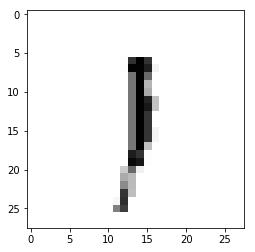

Epoch : 3 cost :  1.2552431037209246
Accuracy : 0.1711
label : [1]
Prediction : [0]


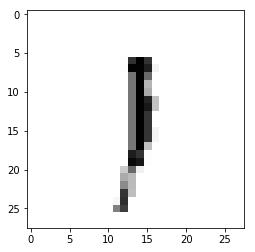

Epoch : 3 cost :  1.2594015260176221
Accuracy : 0.1709
label : [1]
Prediction : [0]


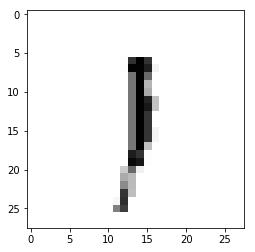

Epoch : 3 cost :  1.2635283452814272
Accuracy : 0.1708
label : [1]
Prediction : [0]


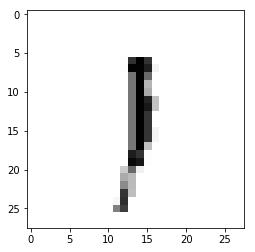

Epoch : 3 cost :  1.2676970689946951
Accuracy : 0.1709
label : [1]
Prediction : [0]


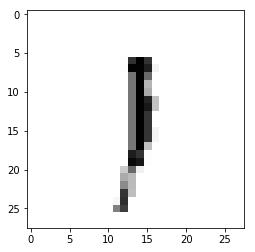

Epoch : 3 cost :  1.2718343348936598
Accuracy : 0.1709
label : [1]
Prediction : [0]


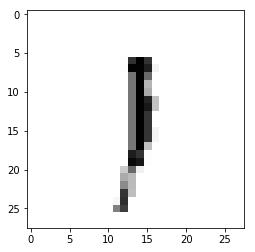

Epoch : 3 cost :  1.275989001447504
Accuracy : 0.1698
label : [1]
Prediction : [0]


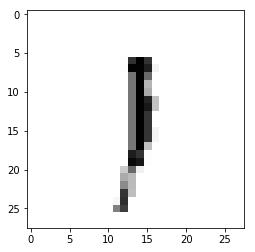

Epoch : 3 cost :  1.2801253054358739
Accuracy : 0.1696
label : [1]
Prediction : [0]


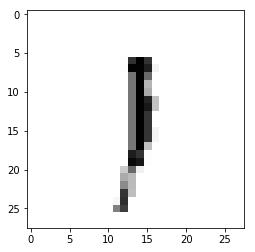

Epoch : 3 cost :  1.2842670804804017
Accuracy : 0.1699
label : [1]
Prediction : [0]


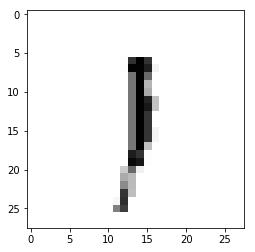

Epoch : 3 cost :  1.28843080217188
Accuracy : 0.1699
label : [1]
Prediction : [0]


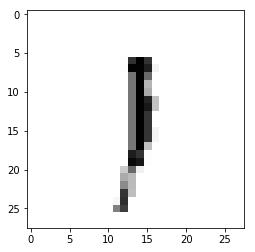

Epoch : 3 cost :  1.2925704973394214
Accuracy : 0.1599
label : [1]
Prediction : [0]


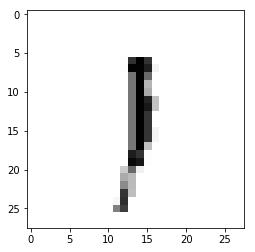

Epoch : 3 cost :  1.2967263317108149
Accuracy : 0.1638
label : [1]
Prediction : [0]


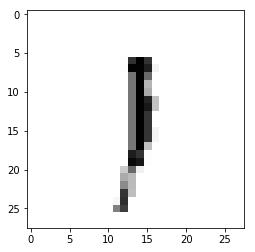

Epoch : 3 cost :  1.3008705867420538
Accuracy : 0.1632
label : [1]
Prediction : [0]


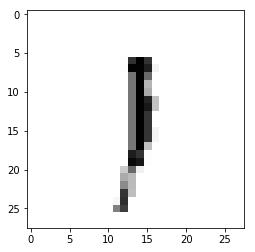

Epoch : 3 cost :  1.305010834173722
Accuracy : 0.1668
label : [1]
Prediction : [0]


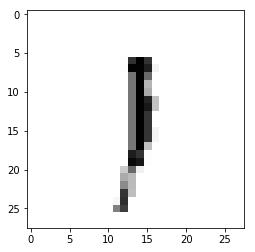

Epoch : 3 cost :  1.3091511180184099
Accuracy : 0.1675
label : [1]
Prediction : [0]


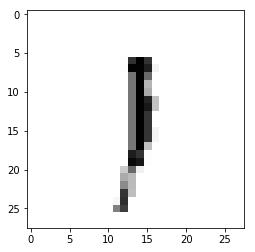

Epoch : 3 cost :  1.3132872191342435
Accuracy : 0.1654
label : [1]
Prediction : [0]


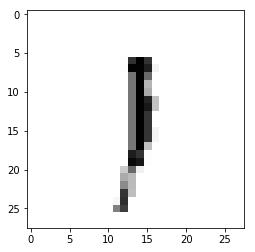

Epoch : 3 cost :  1.317446171153675
Accuracy : 0.1691
label : [1]
Prediction : [0]


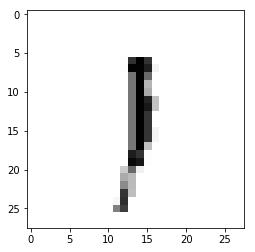

Epoch : 3 cost :  1.3215754626014011
Accuracy : 0.1669
label : [1]
Prediction : [0]


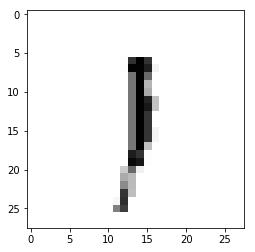

Epoch : 3 cost :  1.3257392722910095
Accuracy : 0.1695
label : [1]
Prediction : [0]


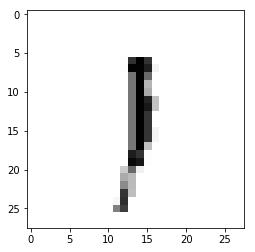

Epoch : 3 cost :  1.3298866206949402
Accuracy : 0.1683
label : [1]
Prediction : [0]


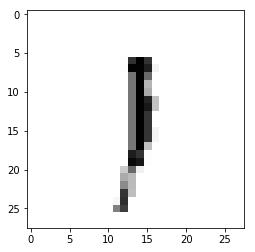

Epoch : 3 cost :  1.3340178927508262
Accuracy : 0.167
label : [1]
Prediction : [0]


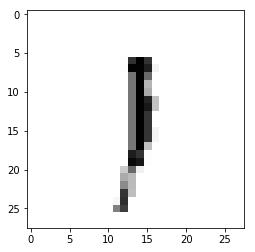

Epoch : 3 cost :  1.338145515701987
Accuracy : 0.1666
label : [1]
Prediction : [0]


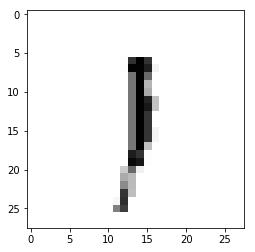

Epoch : 3 cost :  1.3423024294593113
Accuracy : 0.1666
label : [1]
Prediction : [0]


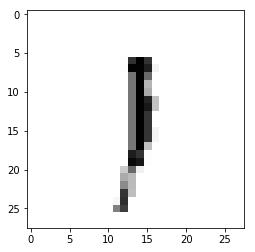

Epoch : 3 cost :  1.3464271883531047
Accuracy : 0.163
label : [1]
Prediction : [0]


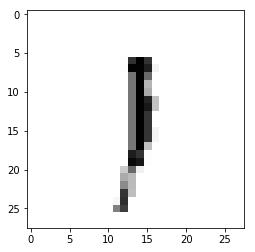

Epoch : 3 cost :  1.3505830868807702
Accuracy : 0.1675
label : [1]
Prediction : [0]


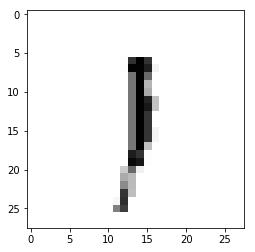

Epoch : 3 cost :  1.3547244119644162
Accuracy : 0.1686
label : [1]
Prediction : [0]


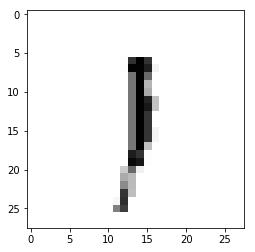

Epoch : 3 cost :  1.3588632791692556
Accuracy : 0.1724
label : [1]
Prediction : [0]


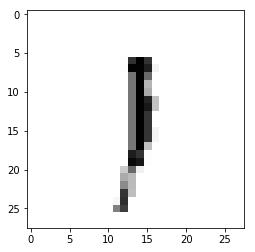

Epoch : 3 cost :  1.3630194898085157
Accuracy : 0.171
label : [1]
Prediction : [0]


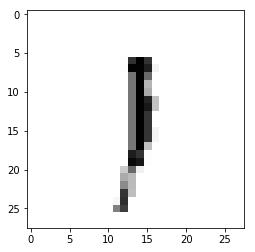

Epoch : 3 cost :  1.3671682856299656
Accuracy : 0.1696
label : [1]
Prediction : [0]


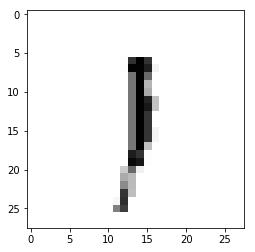

Epoch : 3 cost :  1.37130246552554
Accuracy : 0.1688
label : [1]
Prediction : [0]


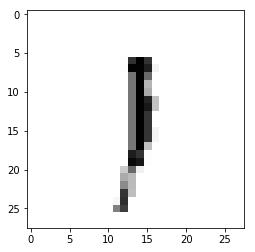

Epoch : 3 cost :  1.3754619437997986
Accuracy : 0.1685
label : [1]
Prediction : [0]


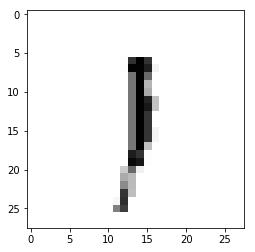

Epoch : 3 cost :  1.3796027105504811
Accuracy : 0.1656
label : [1]
Prediction : [0]


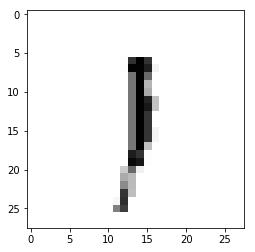

Epoch : 3 cost :  1.383748539144342
Accuracy : 0.1604
label : [1]
Prediction : [0]


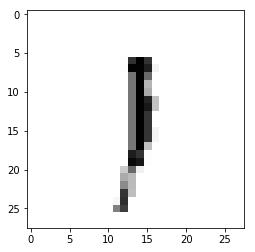

Epoch : 3 cost :  1.3879142119667742
Accuracy : 0.1551
label : [1]
Prediction : [0]


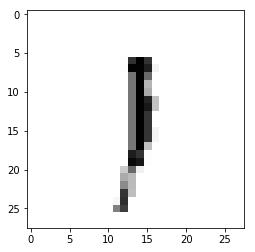

Epoch : 3 cost :  1.392081340443004
Accuracy : 0.1554
label : [1]
Prediction : [0]


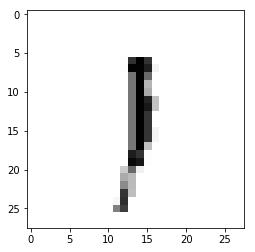

Epoch : 3 cost :  1.3962180380387736
Accuracy : 0.1539
label : [1]
Prediction : [0]


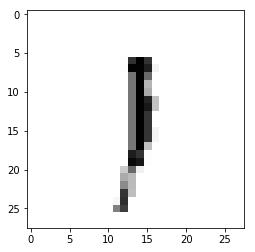

Epoch : 3 cost :  1.4003634699908167
Accuracy : 0.1549
label : [1]
Prediction : [0]


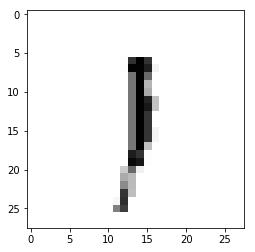

Epoch : 3 cost :  1.404514563733881
Accuracy : 0.1556
label : [1]
Prediction : [0]


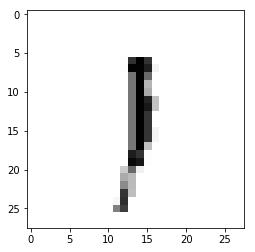

Epoch : 3 cost :  1.408701140230352
Accuracy : 0.1672
label : [1]
Prediction : [0]


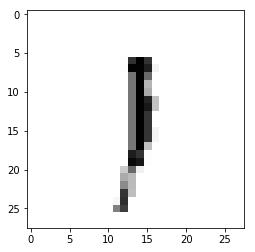

Epoch : 3 cost :  1.4128361047397957
Accuracy : 0.1557
label : [1]
Prediction : [0]


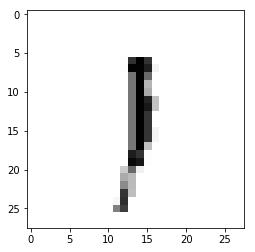

Epoch : 3 cost :  1.4169759533622044
Accuracy : 0.1555
label : [1]
Prediction : [0]


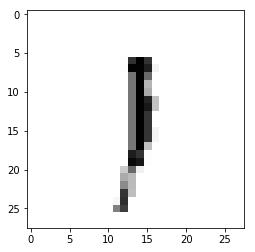

Epoch : 3 cost :  1.4211369653181591
Accuracy : 0.1553
label : [1]
Prediction : [0]


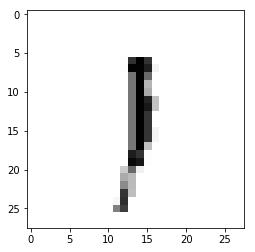

Epoch : 3 cost :  1.4252641287716947
Accuracy : 0.1547
label : [1]
Prediction : [0]


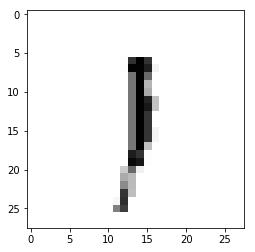

Epoch : 3 cost :  1.4293794358860357
Accuracy : 0.1491
label : [1]
Prediction : [0]


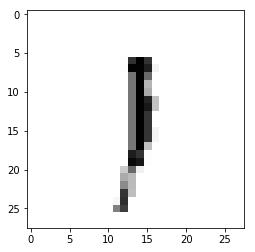

Epoch : 3 cost :  1.4335365923968222
Accuracy : 0.1487
label : [1]
Prediction : [0]


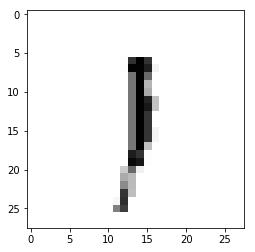

Epoch : 3 cost :  1.4376892180876293
Accuracy : 0.1503
label : [1]
Prediction : [0]


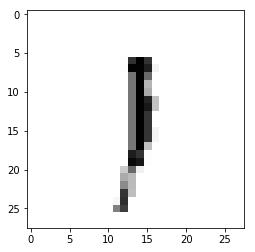

Epoch : 3 cost :  1.4418480743061406
Accuracy : 0.151
label : [1]
Prediction : [0]


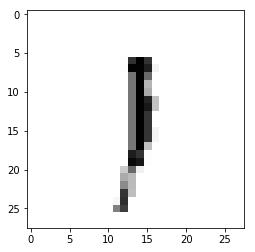

Epoch : 3 cost :  1.4459592442079017
Accuracy : 0.1469
label : [1]
Prediction : [0]


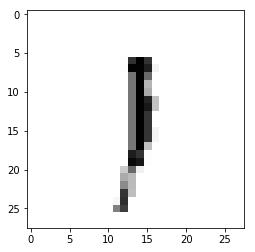

Epoch : 3 cost :  1.4501014679128466
Accuracy : 0.1442
label : [1]
Prediction : [0]


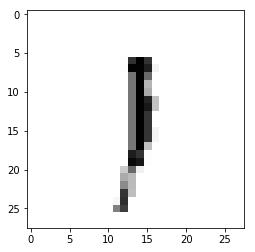

Epoch : 3 cost :  1.4542469861290663
Accuracy : 0.1441
label : [1]
Prediction : [0]


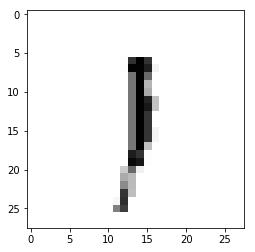

Epoch : 3 cost :  1.4583962336453515
Accuracy : 0.1469
label : [1]
Prediction : [0]


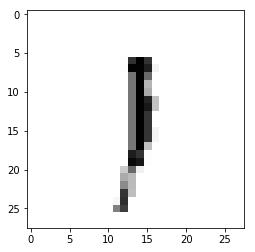

Epoch : 3 cost :  1.4625323243574653
Accuracy : 0.1479
label : [1]
Prediction : [0]


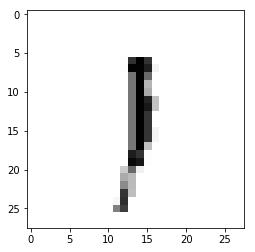

Epoch : 3 cost :  1.4666742905703447
Accuracy : 0.1494
label : [1]
Prediction : [0]


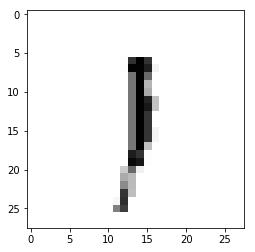

Epoch : 3 cost :  1.4708079758557395
Accuracy : 0.1473
label : [1]
Prediction : [0]


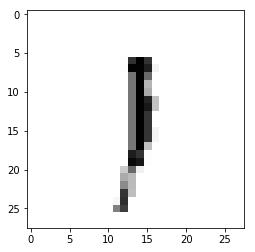

Epoch : 3 cost :  1.4749323953281739
Accuracy : 0.1496
label : [1]
Prediction : [0]


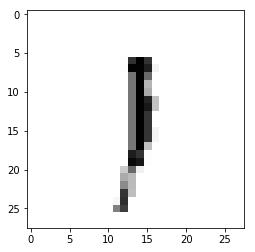

Epoch : 3 cost :  1.4790752038088701
Accuracy : 0.1518
label : [1]
Prediction : [0]


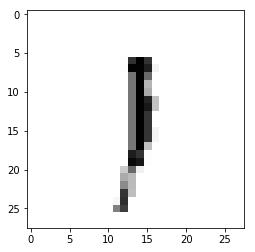

Epoch : 3 cost :  1.4831917602365656
Accuracy : 0.1513
label : [1]
Prediction : [0]


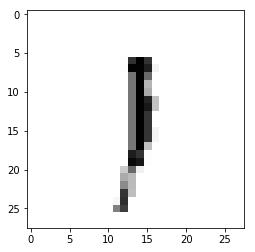

Epoch : 3 cost :  1.4873462880741455
Accuracy : 0.1489
label : [1]
Prediction : [0]


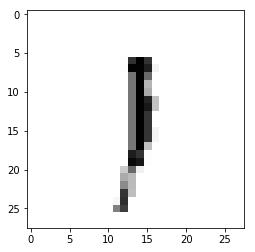

Epoch : 3 cost :  1.4915059947967517
Accuracy : 0.1625
label : [1]
Prediction : [0]


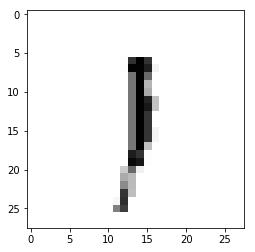

Epoch : 3 cost :  1.4956515550613392
Accuracy : 0.162
label : [1]
Prediction : [0]


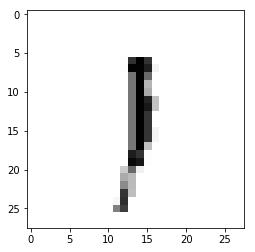

Epoch : 3 cost :  1.4997488953850475
Accuracy : 0.1452
label : [1]
Prediction : [0]


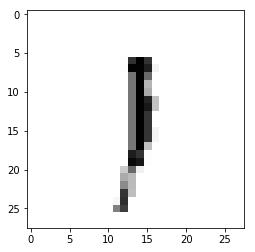

Epoch : 3 cost :  1.5039186438647172
Accuracy : 0.1455
label : [1]
Prediction : [0]


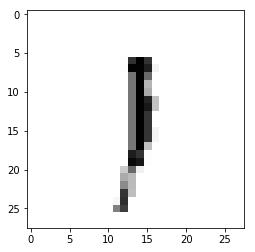

Epoch : 3 cost :  1.508066449165343
Accuracy : 0.1433
label : [1]
Prediction : [0]


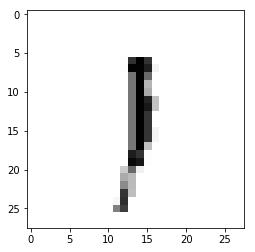

Epoch : 3 cost :  1.512243621999566
Accuracy : 0.1451
label : [1]
Prediction : [0]


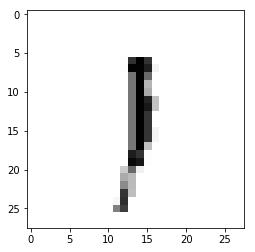

Epoch : 3 cost :  1.5163821744918813
Accuracy : 0.1493
label : [1]
Prediction : [0]


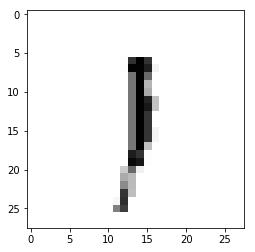

Epoch : 3 cost :  1.5205315815318705
Accuracy : 0.1493
label : [1]
Prediction : [0]


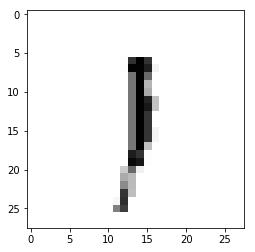

Epoch : 3 cost :  1.5246933386542572
Accuracy : 0.1537
label : [1]
Prediction : [0]


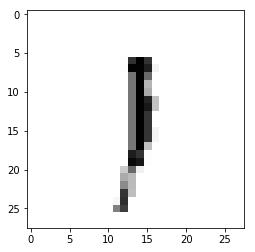

Epoch : 3 cost :  1.5288521766662588
Accuracy : 0.1558
label : [1]
Prediction : [0]


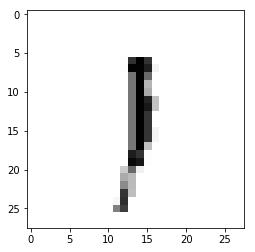

Epoch : 3 cost :  1.5330076651139684
Accuracy : 0.1563
label : [1]
Prediction : [0]


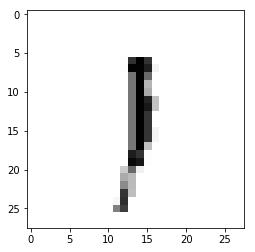

Epoch : 3 cost :  1.5371357978474
Accuracy : 0.1544
label : [1]
Prediction : [0]


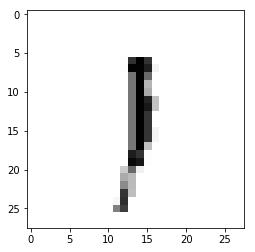

Epoch : 3 cost :  1.5413019206307141
Accuracy : 0.1541
label : [1]
Prediction : [0]


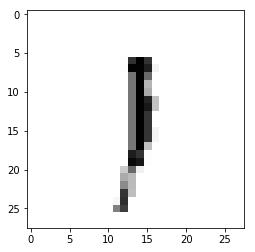

Epoch : 3 cost :  1.5454468562386243
Accuracy : 0.1562
label : [1]
Prediction : [0]


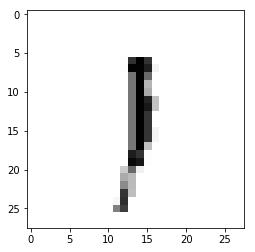

Epoch : 3 cost :  1.5495843341133801
Accuracy : 0.1574
label : [1]
Prediction : [0]


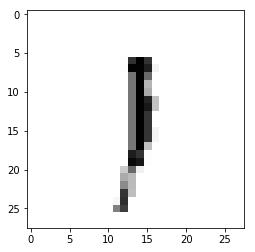

Epoch : 3 cost :  1.553721661567687
Accuracy : 0.1568
label : [1]
Prediction : [0]


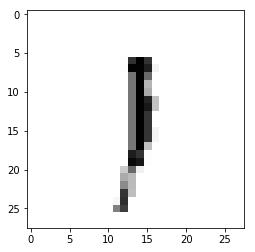

Epoch : 3 cost :  1.5578481448780397
Accuracy : 0.1565
label : [1]
Prediction : [0]


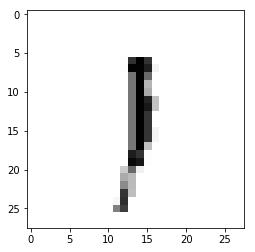

Epoch : 3 cost :  1.5619847302003331
Accuracy : 0.1583
label : [1]
Prediction : [0]


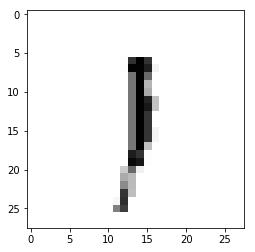

Epoch : 3 cost :  1.566138162179426
Accuracy : 0.1572
label : [1]
Prediction : [0]


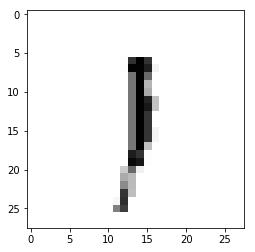

Epoch : 3 cost :  1.5703088890422465
Accuracy : 0.1539
label : [1]
Prediction : [0]


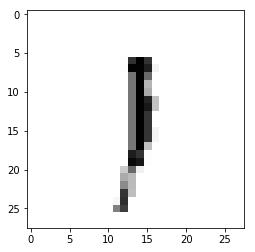

Epoch : 3 cost :  1.5744441054084075
Accuracy : 0.1555
label : [1]
Prediction : [0]


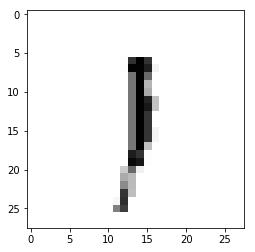

Epoch : 3 cost :  1.5786075509678226
Accuracy : 0.1578
label : [1]
Prediction : [0]


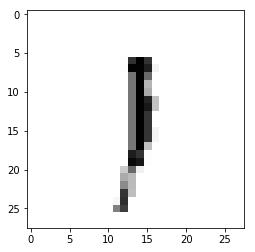

Epoch : 3 cost :  1.5827417221936304
Accuracy : 0.1555
label : [1]
Prediction : [0]


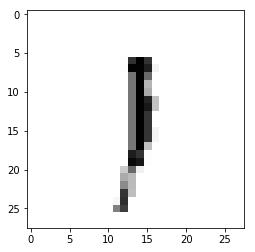

Epoch : 3 cost :  1.5868774331699709
Accuracy : 0.1574
label : [1]
Prediction : [0]


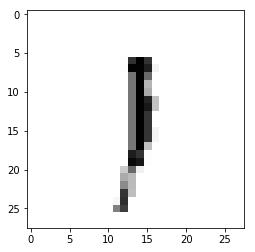

Epoch : 3 cost :  1.5910354857011266
Accuracy : 0.1775
label : [1]
Prediction : [0]


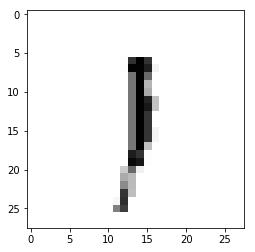

Epoch : 3 cost :  1.5951734538511788
Accuracy : 0.1855
label : [1]
Prediction : [0]


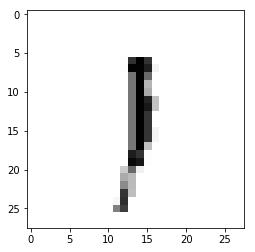

Epoch : 3 cost :  1.5993247196891083
Accuracy : 0.1833
label : [1]
Prediction : [0]


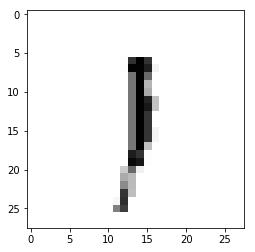

Epoch : 3 cost :  1.6034469812566576
Accuracy : 0.1857
label : [1]
Prediction : [0]


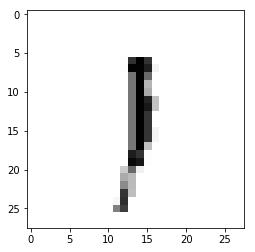

Epoch : 3 cost :  1.6075598443638188
Accuracy : 0.1914
label : [1]
Prediction : [0]


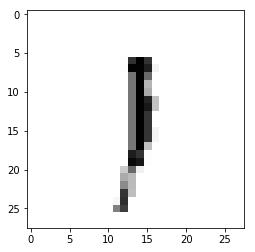

Epoch : 3 cost :  1.611721734133633
Accuracy : 0.1876
label : [1]
Prediction : [0]


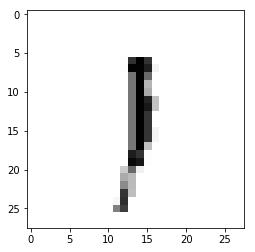

Epoch : 3 cost :  1.6158804056861176
Accuracy : 0.1961
label : [1]
Prediction : [0]


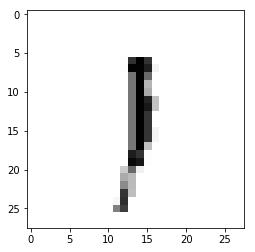

Epoch : 3 cost :  1.6200530273264095
Accuracy : 0.2036
label : [1]
Prediction : [0]


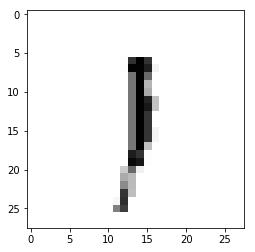

Epoch : 3 cost :  1.6242075126821336
Accuracy : 0.1995
label : [1]
Prediction : [0]


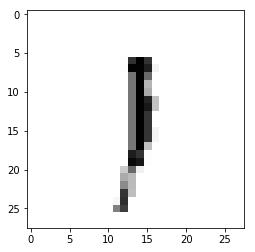

Epoch : 3 cost :  1.6283376355604684
Accuracy : 0.1989
label : [1]
Prediction : [0]


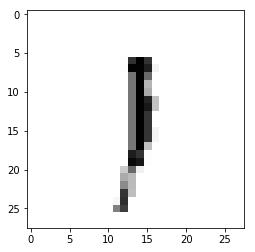

Epoch : 3 cost :  1.6324781608581536
Accuracy : 0.1992
label : [1]
Prediction : [0]


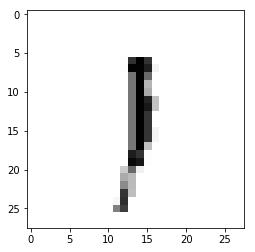

Epoch : 3 cost :  1.636615190939469
Accuracy : 0.2031
label : [1]
Prediction : [0]


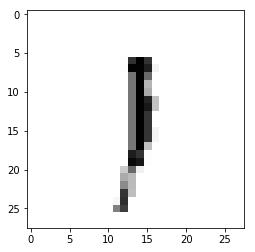

Epoch : 3 cost :  1.6407219752398396
Accuracy : 0.196
label : [1]
Prediction : [0]


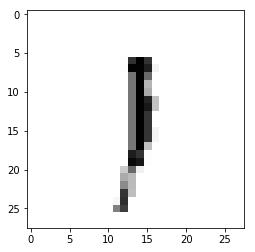

Epoch : 3 cost :  1.6448655397241758
Accuracy : 0.198
label : [1]
Prediction : [0]


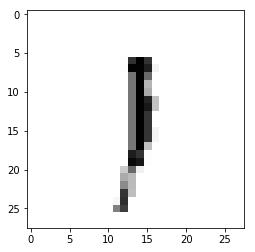

Epoch : 3 cost :  1.6489985032515084
Accuracy : 0.1867
label : [1]
Prediction : [0]


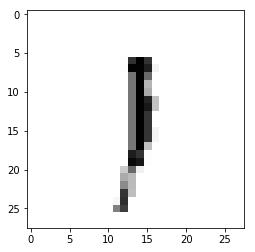

Epoch : 3 cost :  1.6531339051506728
Accuracy : 0.197
label : [1]
Prediction : [0]


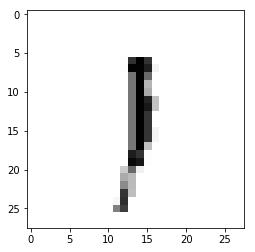

Epoch : 3 cost :  1.657259844866665
Accuracy : 0.1994
label : [1]
Prediction : [0]


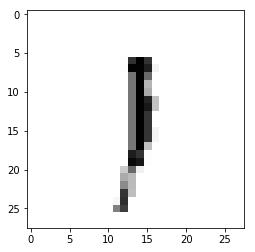

Epoch : 3 cost :  1.6614411289041684
Accuracy : 0.1969
label : [1]
Prediction : [0]


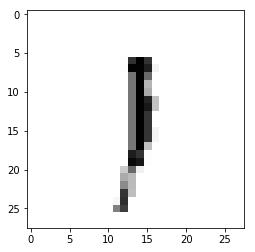

Epoch : 3 cost :  1.665558402755043
Accuracy : 0.1957
label : [1]
Prediction : [0]


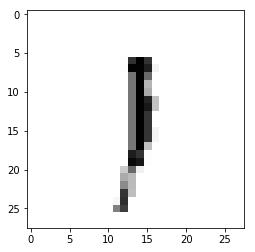

Epoch : 3 cost :  1.6697174197977231
Accuracy : 0.197
label : [1]
Prediction : [0]


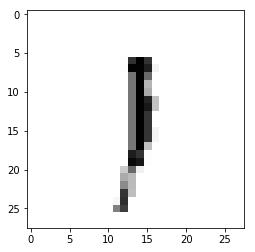

Epoch : 3 cost :  1.6738569094917983
Accuracy : 0.2017
label : [1]
Prediction : [0]


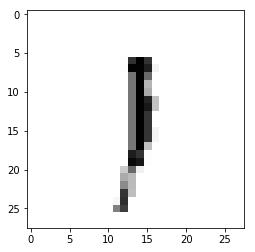

Epoch : 3 cost :  1.6780204499851565
Accuracy : 0.204
label : [1]
Prediction : [0]


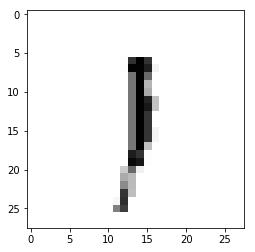

Epoch : 3 cost :  1.6821672261844973
Accuracy : 0.2057
label : [1]
Prediction : [0]


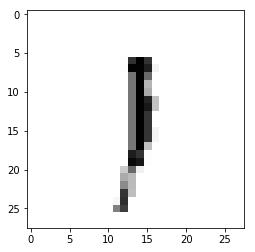

Epoch : 3 cost :  1.6862886012684206
Accuracy : 0.2043
label : [1]
Prediction : [0]


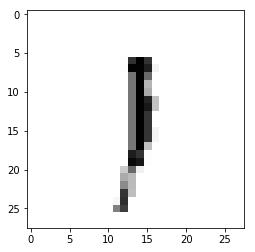

Epoch : 3 cost :  1.690444921580227
Accuracy : 0.2072
label : [1]
Prediction : [0]


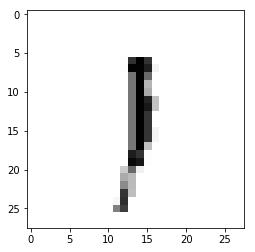

Epoch : 3 cost :  1.694618004885586
Accuracy : 0.2068
label : [1]
Prediction : [0]


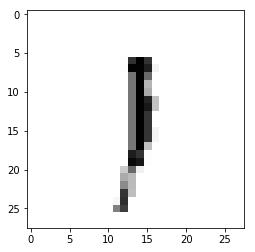

Epoch : 3 cost :  1.6987591175599523
Accuracy : 0.2045
label : [1]
Prediction : [0]


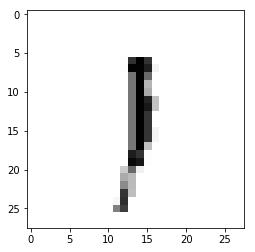

Epoch : 3 cost :  1.7029191251234566
Accuracy : 0.2056
label : [1]
Prediction : [0]


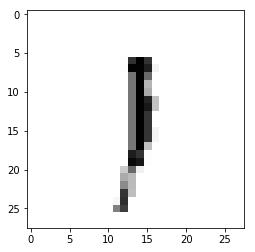

Epoch : 3 cost :  1.7070563216642891
Accuracy : 0.199
label : [1]
Prediction : [0]


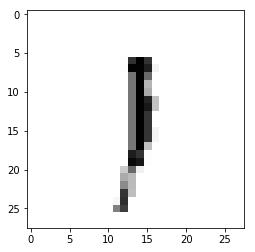

Epoch : 3 cost :  1.7112012698433607
Accuracy : 0.2041
label : [1]
Prediction : [0]


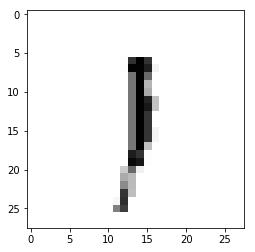

Epoch : 3 cost :  1.7153504766117433
Accuracy : 0.2044
label : [1]
Prediction : [0]


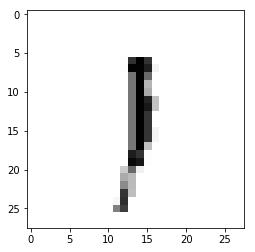

Epoch : 3 cost :  1.7195050486651324
Accuracy : 0.2084
label : [1]
Prediction : [0]


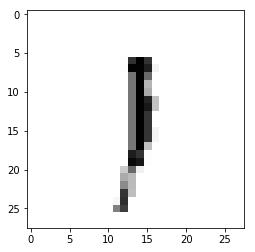

Epoch : 3 cost :  1.7236527009443794
Accuracy : 0.1855
label : [1]
Prediction : [0]


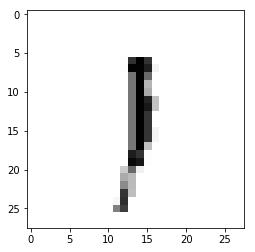

Epoch : 3 cost :  1.727824777689846
Accuracy : 0.1841
label : [1]
Prediction : [0]


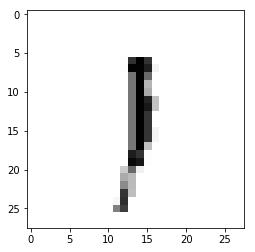

Epoch : 3 cost :  1.7319657516479483
Accuracy : 0.1831
label : [1]
Prediction : [0]


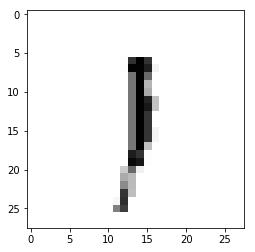

Epoch : 3 cost :  1.7361213701421556
Accuracy : 0.184
label : [1]
Prediction : [0]


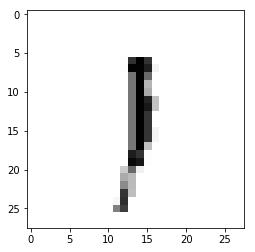

Epoch : 3 cost :  1.7402738280729806
Accuracy : 0.1808
label : [1]
Prediction : [0]


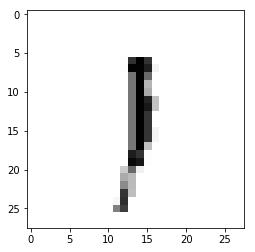

Epoch : 3 cost :  1.7443987057425752
Accuracy : 0.1817
label : [1]
Prediction : [0]


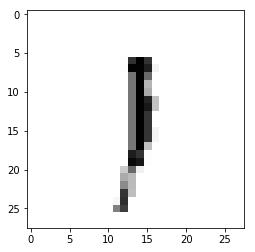

Epoch : 3 cost :  1.7485481548309318
Accuracy : 0.1847
label : [1]
Prediction : [0]


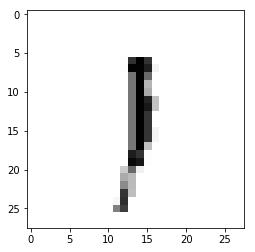

Epoch : 3 cost :  1.752679151621731
Accuracy : 0.1815
label : [1]
Prediction : [0]


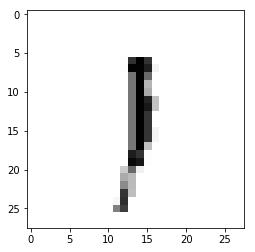

Epoch : 3 cost :  1.7567882836948734
Accuracy : 0.1727
label : [1]
Prediction : [0]


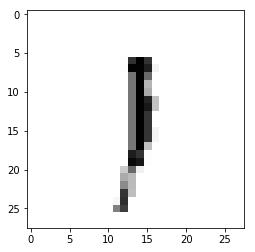

Epoch : 3 cost :  1.7609379972111088
Accuracy : 0.1797
label : [1]
Prediction : [0]


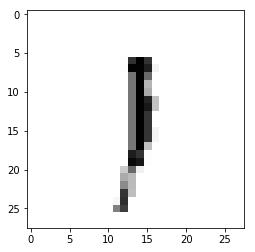

Epoch : 3 cost :  1.765086322264237
Accuracy : 0.1734
label : [1]
Prediction : [0]


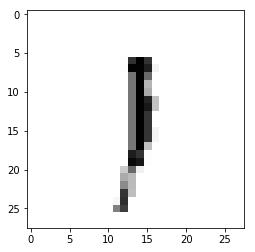

Epoch : 3 cost :  1.769231055433099
Accuracy : 0.1884
label : [1]
Prediction : [0]


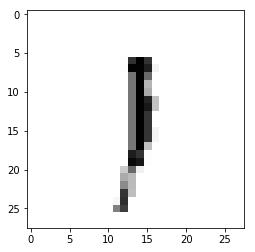

Epoch : 3 cost :  1.7734048769690764
Accuracy : 0.1933
label : [1]
Prediction : [0]


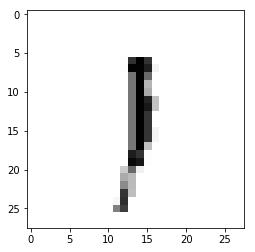

Epoch : 3 cost :  1.7775669665770089
Accuracy : 0.1972
label : [1]
Prediction : [0]


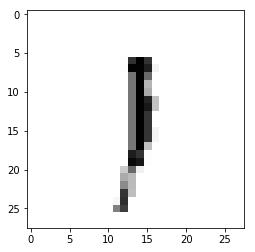

Epoch : 3 cost :  1.7816900543733067
Accuracy : 0.1856
label : [1]
Prediction : [0]


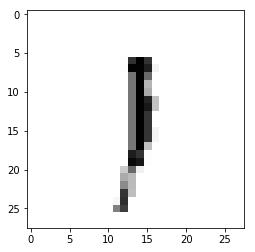

Epoch : 3 cost :  1.7858115044507104
Accuracy : 0.1833
label : [1]
Prediction : [0]


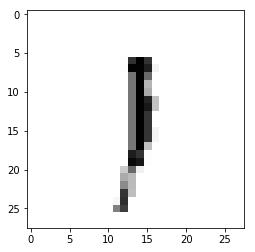

Epoch : 3 cost :  1.7899573534185227
Accuracy : 0.1963
label : [1]
Prediction : [0]


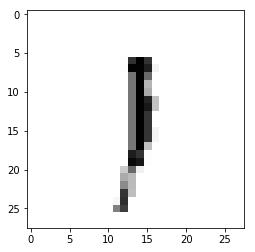

Epoch : 3 cost :  1.7941187862916417
Accuracy : 0.199
label : [1]
Prediction : [0]


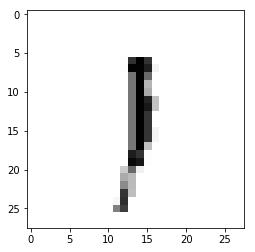

Epoch : 3 cost :  1.798271907893093
Accuracy : 0.201
label : [1]
Prediction : [0]


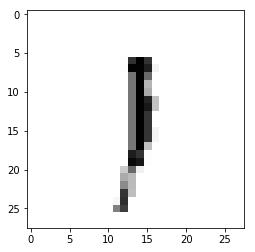

Epoch : 3 cost :  1.802404532432555
Accuracy : 0.2008
label : [1]
Prediction : [0]


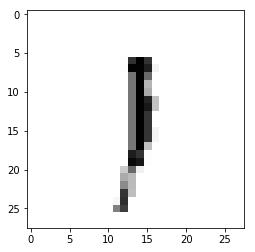

Epoch : 3 cost :  1.8065024076808571
Accuracy : 0.1927
label : [1]
Prediction : [0]


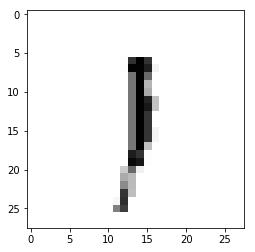

Epoch : 3 cost :  1.8106566117026577
Accuracy : 0.1997
label : [1]
Prediction : [0]


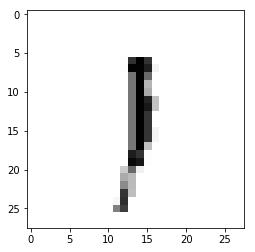

Epoch : 3 cost :  1.8148013296994283
Accuracy : 0.2048
label : [1]
Prediction : [0]


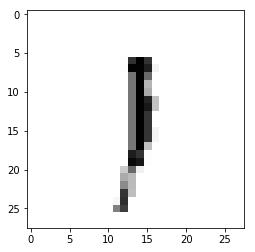

Epoch : 3 cost :  1.8189370705864634
Accuracy : 0.2016
label : [1]
Prediction : [0]


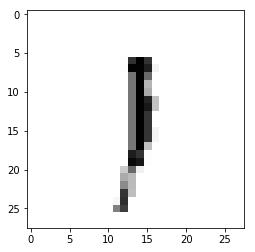

Epoch : 3 cost :  1.8230948123064896
Accuracy : 0.2028
label : [1]
Prediction : [0]


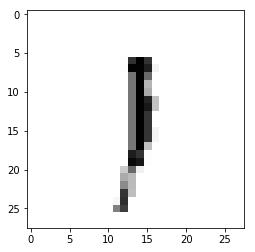

Epoch : 3 cost :  1.8272273744236327
Accuracy : 0.1994
label : [1]
Prediction : [0]


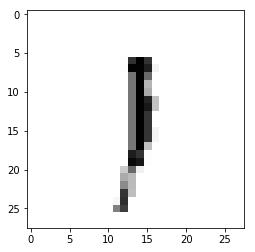

Epoch : 3 cost :  1.8313789055564174
Accuracy : 0.1931
label : [1]
Prediction : [0]


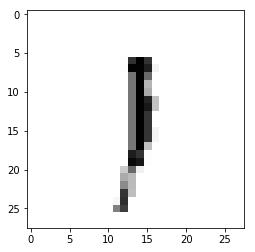

Epoch : 3 cost :  1.835535795905372
Accuracy : 0.1948
label : [1]
Prediction : [0]


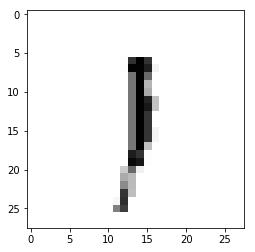

Epoch : 3 cost :  1.8396553316983297
Accuracy : 0.1954
label : [1]
Prediction : [0]


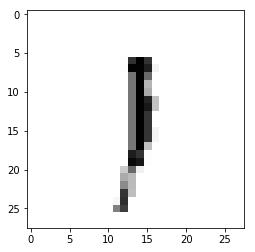

Epoch : 3 cost :  1.8438003106550724
Accuracy : 0.1935
label : [1]
Prediction : [0]


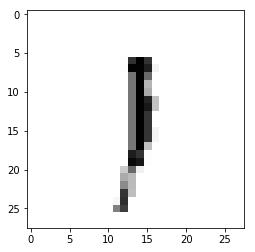

Epoch : 3 cost :  1.8479651737213123
Accuracy : 0.2004
label : [1]
Prediction : [0]


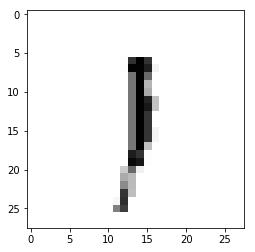

Epoch : 3 cost :  1.8521094040437167
Accuracy : 0.2041
label : [1]
Prediction : [0]


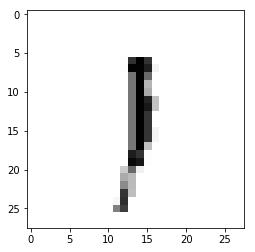

Epoch : 3 cost :  1.85625406698747
Accuracy : 0.2044
label : [1]
Prediction : [0]


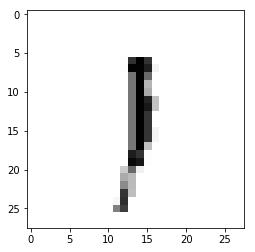

Epoch : 3 cost :  1.8603876920179876
Accuracy : 0.203
label : [1]
Prediction : [0]


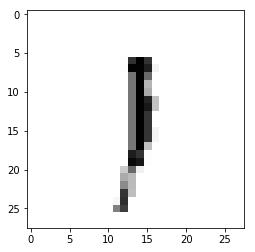

Epoch : 3 cost :  1.864510946707291
Accuracy : 0.204
label : [1]
Prediction : [0]


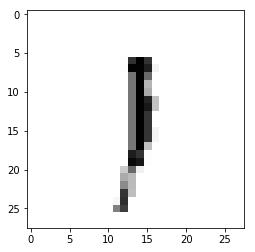

Epoch : 3 cost :  1.8686502027511585
Accuracy : 0.201
label : [1]
Prediction : [0]


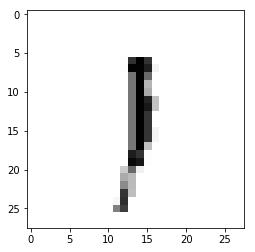

Epoch : 3 cost :  1.8728122308037485
Accuracy : 0.2042
label : [1]
Prediction : [0]


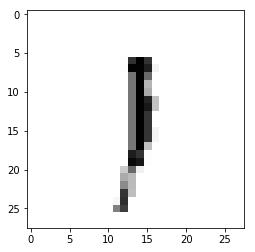

Epoch : 3 cost :  1.8769276670976105
Accuracy : 0.2004
label : [1]
Prediction : [0]


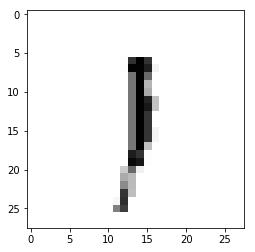

Epoch : 3 cost :  1.8810685079747966
Accuracy : 0.1962
label : [1]
Prediction : [0]


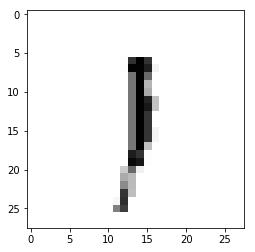

Epoch : 3 cost :  1.8852008550817303
Accuracy : 0.2022
label : [1]
Prediction : [0]


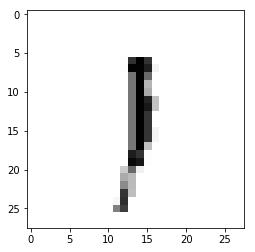

Epoch : 3 cost :  1.889359847415576
Accuracy : 0.1901
label : [1]
Prediction : [0]


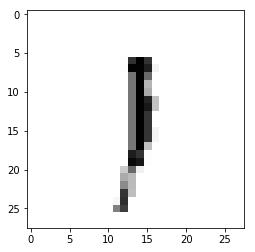

Epoch : 3 cost :  1.8935051020708937
Accuracy : 0.1816
label : [1]
Prediction : [0]


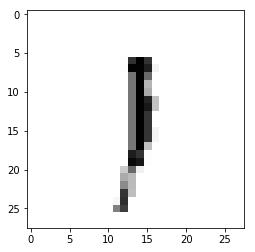

Epoch : 3 cost :  1.8976630197871802
Accuracy : 0.1798
label : [1]
Prediction : [0]


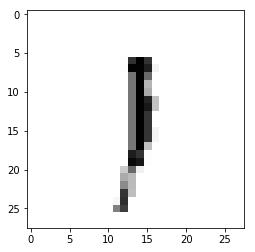

Epoch : 3 cost :  1.9017804184826925
Accuracy : 0.1752
label : [1]
Prediction : [0]


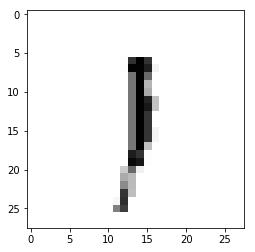

Epoch : 3 cost :  1.90593734437769
Accuracy : 0.1768
label : [1]
Prediction : [0]


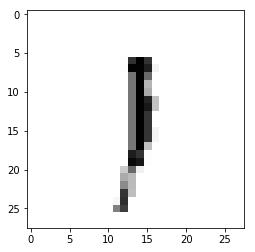

Epoch : 3 cost :  1.9100945173610329
Accuracy : 0.1789
label : [1]
Prediction : [0]


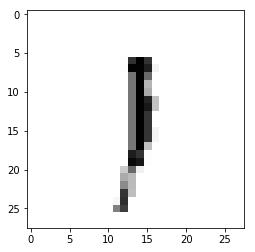

Epoch : 3 cost :  1.9142111947319713
Accuracy : 0.1785
label : [1]
Prediction : [0]


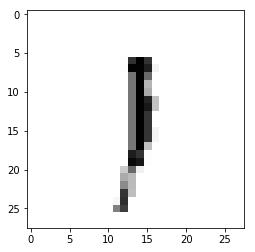

Epoch : 3 cost :  1.918392355225302
Accuracy : 0.183
label : [1]
Prediction : [0]


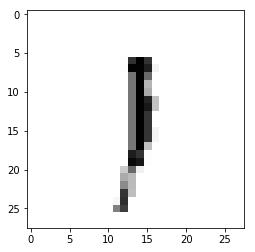

Epoch : 3 cost :  1.9225491172617122
Accuracy : 0.1917
label : [1]
Prediction : [0]


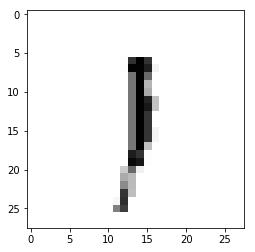

Epoch : 3 cost :  1.926724081472916
Accuracy : 0.2091
label : [1]
Prediction : [0]


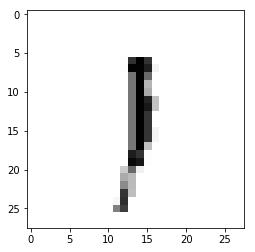

Epoch : 3 cost :  1.9308640636097292
Accuracy : 0.2099
label : [1]
Prediction : [0]


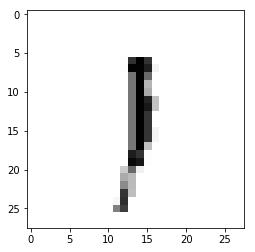

Epoch : 3 cost :  1.9349724847620173
Accuracy : 0.2025
label : [1]
Prediction : [0]


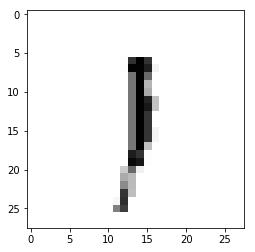

Epoch : 3 cost :  1.939130052653225
Accuracy : 0.1992
label : [1]
Prediction : [0]


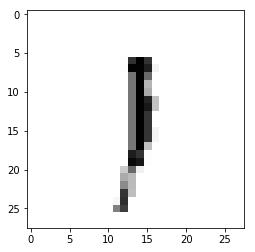

Epoch : 3 cost :  1.9432620122215953
Accuracy : 0.1964
label : [1]
Prediction : [0]


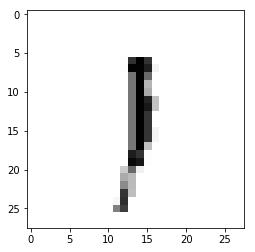

Epoch : 3 cost :  1.9474129928242065
Accuracy : 0.1947
label : [1]
Prediction : [0]


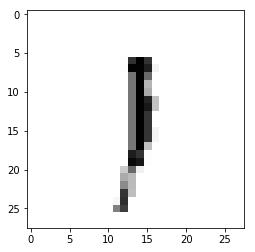

Epoch : 3 cost :  1.9515403968637628
Accuracy : 0.1949
label : [1]
Prediction : [0]


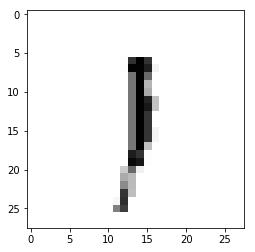

Epoch : 3 cost :  1.9557060402089887
Accuracy : 0.1959
label : [1]
Prediction : [0]


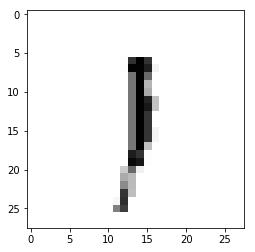

Epoch : 3 cost :  1.9598202523318193
Accuracy : 0.1685
label : [1]
Prediction : [0]


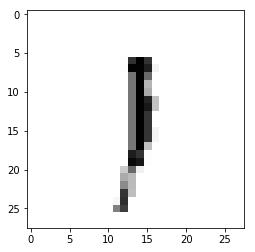

Epoch : 3 cost :  1.9639683103561392
Accuracy : 0.1725
label : [1]
Prediction : [0]


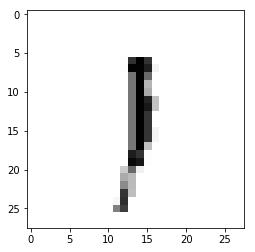

Epoch : 3 cost :  1.9681203872507258
Accuracy : 0.1813
label : [1]
Prediction : [0]


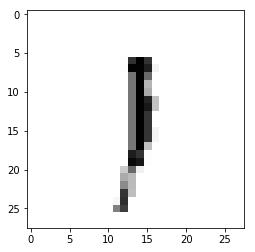

Epoch : 3 cost :  1.9722712837566019
Accuracy : 0.1909
label : [1]
Prediction : [0]


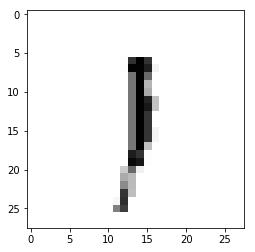

Epoch : 3 cost :  1.9764117895473123
Accuracy : 0.2084
label : [1]
Prediction : [0]


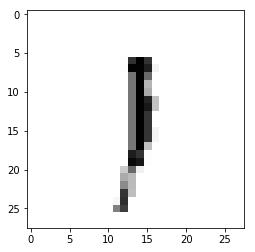

Epoch : 3 cost :  1.9805658414147107
Accuracy : 0.2073
label : [1]
Prediction : [0]


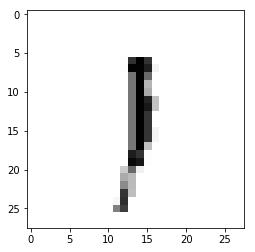

Epoch : 3 cost :  1.9846847733584307
Accuracy : 0.209
label : [1]
Prediction : [0]


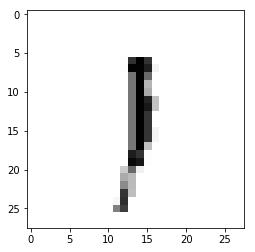

Epoch : 3 cost :  1.9888533561879929
Accuracy : 0.2089
label : [1]
Prediction : [0]


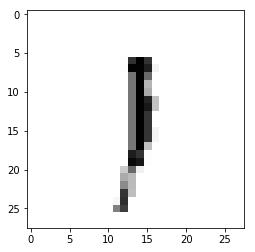

Epoch : 3 cost :  1.9929871346733776
Accuracy : 0.212
label : [1]
Prediction : [0]


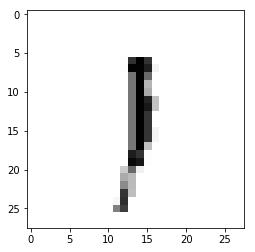

Epoch : 3 cost :  1.99715184168382
Accuracy : 0.2137
label : [1]
Prediction : [0]


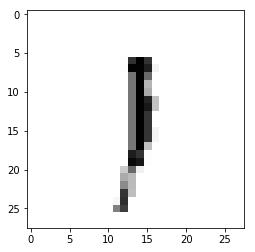

Epoch : 3 cost :  2.001302301233464
Accuracy : 0.2112
label : [1]
Prediction : [0]


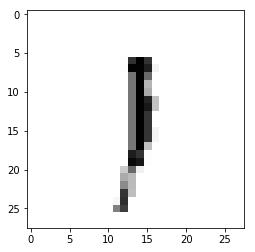

Epoch : 3 cost :  2.0054273934797795
Accuracy : 0.211
label : [1]
Prediction : [0]


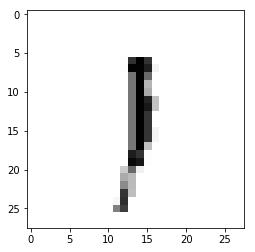

Epoch : 3 cost :  2.009536884047767
Accuracy : 0.2094
label : [1]
Prediction : [0]


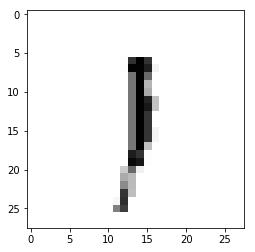

Epoch : 3 cost :  2.013680162863297
Accuracy : 0.2114
label : [1]
Prediction : [0]


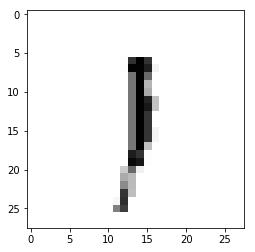

Epoch : 3 cost :  2.017829576405611
Accuracy : 0.2087
label : [1]
Prediction : [0]


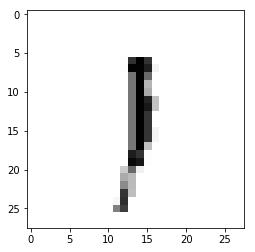

Epoch : 3 cost :  2.0219829290563403
Accuracy : 0.2086
label : [1]
Prediction : [0]


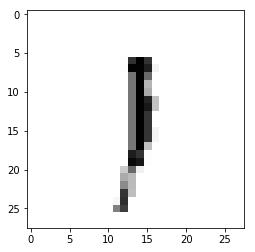

Epoch : 3 cost :  2.026082453294233
Accuracy : 0.206
label : [1]
Prediction : [0]


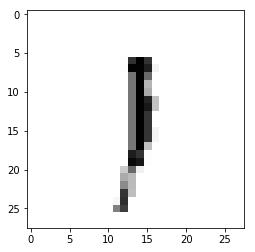

Epoch : 3 cost :  2.030204490748318
Accuracy : 0.1998
label : [1]
Prediction : [0]


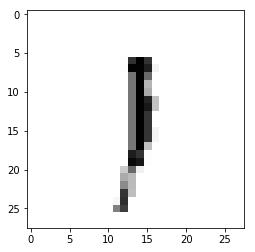

Epoch : 3 cost :  2.0343190622329703
Accuracy : 0.2033
label : [1]
Prediction : [0]


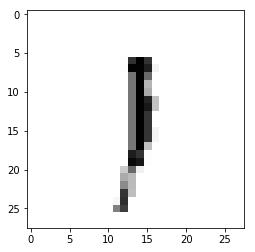

Epoch : 3 cost :  2.038472264029762
Accuracy : 0.1998
label : [1]
Prediction : [0]


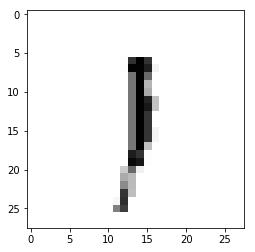

Epoch : 3 cost :  2.042622189955277
Accuracy : 0.2032
label : [1]
Prediction : [0]


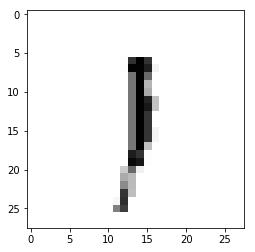

Epoch : 3 cost :  2.046776081865483
Accuracy : 0.2042
label : [1]
Prediction : [0]


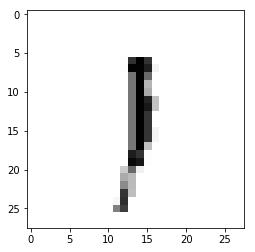

Epoch : 3 cost :  2.050914298404346
Accuracy : 0.205
label : [1]
Prediction : [0]


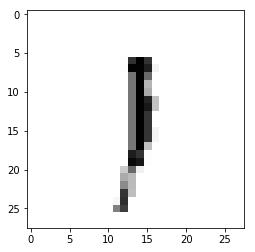

Epoch : 3 cost :  2.0550484232469026
Accuracy : 0.1889
label : [1]
Prediction : [0]


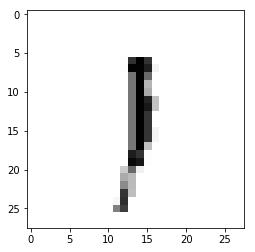

Epoch : 3 cost :  2.05918705029921
Accuracy : 0.1943
label : [1]
Prediction : [0]


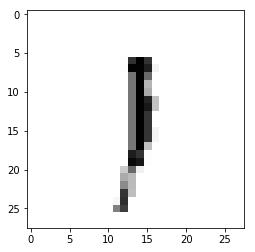

Epoch : 3 cost :  2.0633339990269044
Accuracy : 0.1875
label : [1]
Prediction : [0]


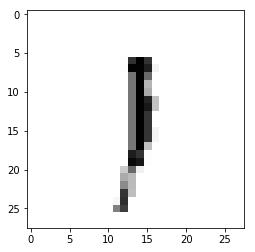

Epoch : 3 cost :  2.067461411736227
Accuracy : 0.1916
label : [1]
Prediction : [0]


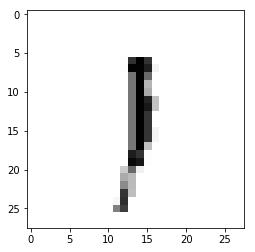

Epoch : 3 cost :  2.0715840383009465
Accuracy : 0.2028
label : [1]
Prediction : [0]


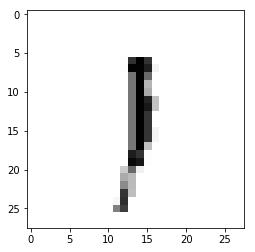

Epoch : 3 cost :  2.075680262392216
Accuracy : 0.1833
label : [1]
Prediction : [0]


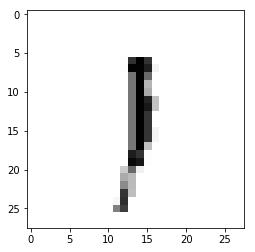

Epoch : 3 cost :  2.0798048522255623
Accuracy : 0.1744
label : [1]
Prediction : [0]


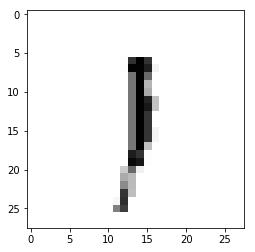

Epoch : 3 cost :  2.0839581771330384
Accuracy : 0.1781
label : [1]
Prediction : [0]


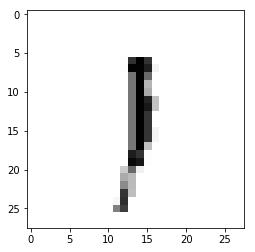

Epoch : 3 cost :  2.088096684976056
Accuracy : 0.1798
label : [1]
Prediction : [0]


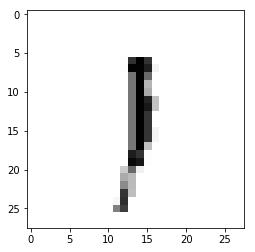

Epoch : 3 cost :  2.092217234264719
Accuracy : 0.1585
label : [1]
Prediction : [0]


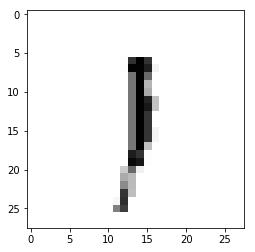

Epoch : 3 cost :  2.0963390098918553
Accuracy : 0.151
label : [1]
Prediction : [0]


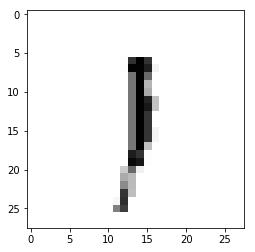

Epoch : 3 cost :  2.1004684769023534
Accuracy : 0.1496
label : [1]
Prediction : [0]


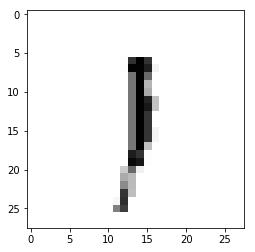

Epoch : 3 cost :  2.104615594690495
Accuracy : 0.1522
label : [1]
Prediction : [0]


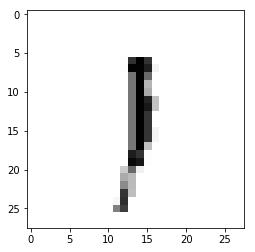

Epoch : 3 cost :  2.108778994733636
Accuracy : 0.1542
label : [1]
Prediction : [0]


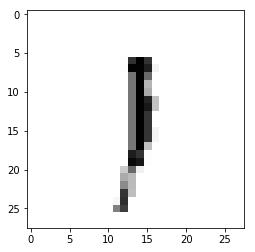

Epoch : 3 cost :  2.1129306684840796
Accuracy : 0.1573
label : [1]
Prediction : [0]


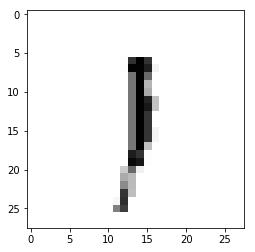

Epoch : 3 cost :  2.1170319752259674
Accuracy : 0.1529
label : [1]
Prediction : [0]


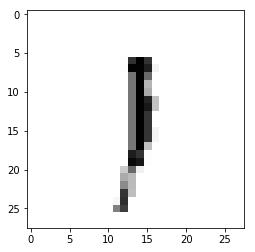

Epoch : 3 cost :  2.1211669947884286
Accuracy : 0.154
label : [1]
Prediction : [0]


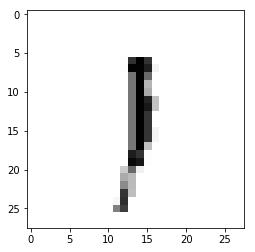

Epoch : 3 cost :  2.125294132666153
Accuracy : 0.1551
label : [1]
Prediction : [0]


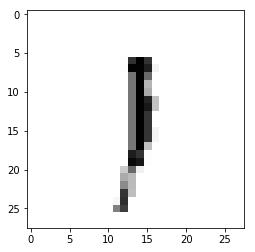

Epoch : 3 cost :  2.1294271417097597
Accuracy : 0.1596
label : [1]
Prediction : [0]


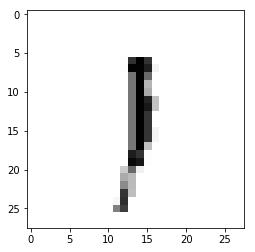

Epoch : 3 cost :  2.1335686423561775
Accuracy : 0.1555
label : [1]
Prediction : [0]


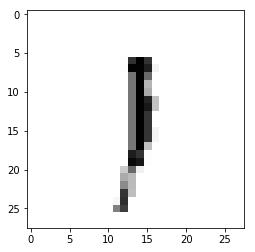

Epoch : 3 cost :  2.13771588152105
Accuracy : 0.1619
label : [1]
Prediction : [0]


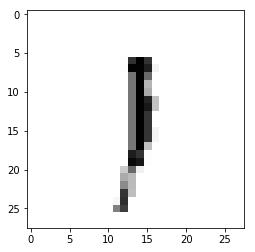

Epoch : 3 cost :  2.1418595998937415
Accuracy : 0.1646
label : [1]
Prediction : [0]


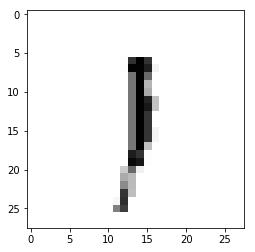

Epoch : 3 cost :  2.1460225625471616
Accuracy : 0.1658
label : [1]
Prediction : [0]


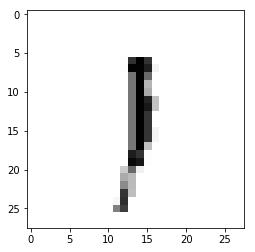

Epoch : 3 cost :  2.1501624406467768
Accuracy : 0.166
label : [1]
Prediction : [0]


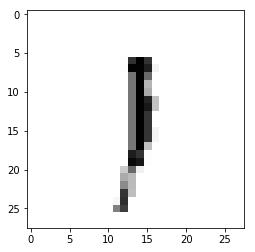

Epoch : 3 cost :  2.1543096143549123
Accuracy : 0.1685
label : [1]
Prediction : [0]


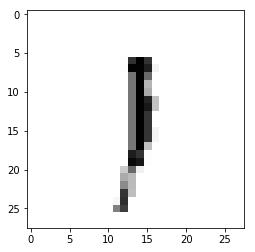

Epoch : 3 cost :  2.158447615016589
Accuracy : 0.1799
label : [1]
Prediction : [0]


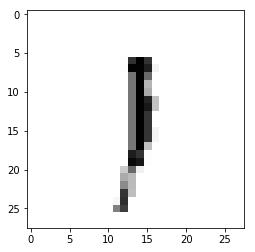

Epoch : 3 cost :  2.1625733037428407
Accuracy : 0.1851
label : [1]
Prediction : [0]


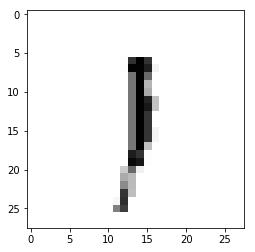

Epoch : 3 cost :  2.1666877503828554
Accuracy : 0.1812
label : [1]
Prediction : [0]


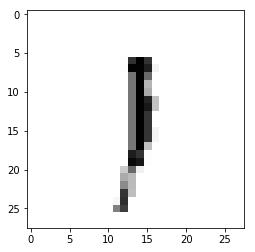

Epoch : 3 cost :  2.170800903060218
Accuracy : 0.1722
label : [1]
Prediction : [0]


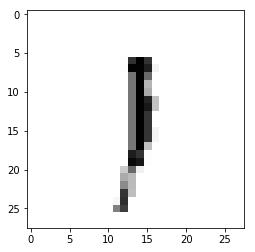

Epoch : 3 cost :  2.1749743478948407
Accuracy : 0.1728
label : [1]
Prediction : [0]


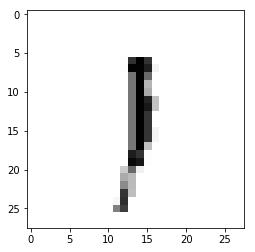

Epoch : 3 cost :  2.1791174606843415
Accuracy : 0.1722
label : [1]
Prediction : [0]


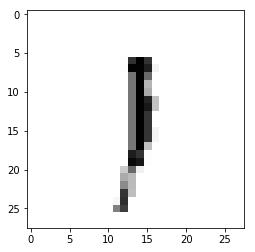

Epoch : 3 cost :  2.1832438087463366
Accuracy : 0.1725
label : [1]
Prediction : [0]


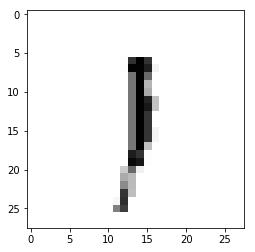

Epoch : 3 cost :  2.1873523768511673
Accuracy : 0.1677
label : [1]
Prediction : [0]


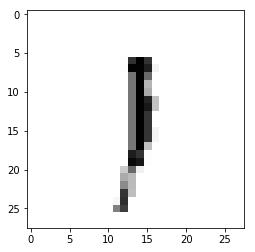

Epoch : 3 cost :  2.1914665209163307
Accuracy : 0.1711
label : [1]
Prediction : [0]


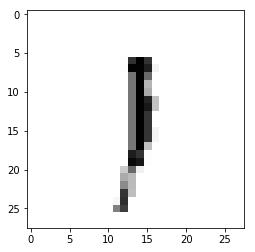

Epoch : 3 cost :  2.195614148486743
Accuracy : 0.1693
label : [1]
Prediction : [0]


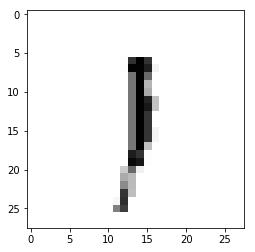

Epoch : 3 cost :  2.199751612489872
Accuracy : 0.1812
label : [1]
Prediction : [0]


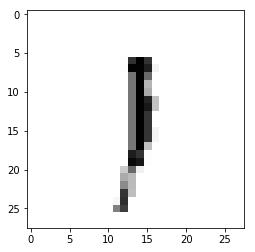

Epoch : 3 cost :  2.2039156354557368
Accuracy : 0.1852
label : [1]
Prediction : [0]


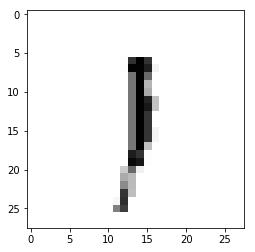

Epoch : 3 cost :  2.2080572704835353
Accuracy : 0.1914
label : [1]
Prediction : [0]


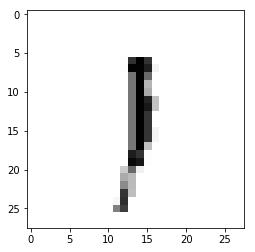

Epoch : 3 cost :  2.2121674541993555
Accuracy : 0.188
label : [1]
Prediction : [0]


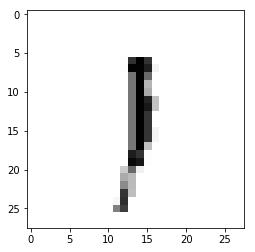

Epoch : 3 cost :  2.2162895718487805
Accuracy : 0.1899
label : [1]
Prediction : [0]


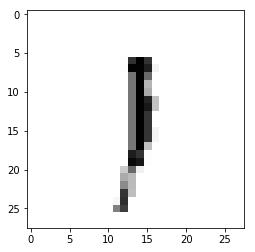

Epoch : 3 cost :  2.2204230733351253
Accuracy : 0.1898
label : [1]
Prediction : [0]


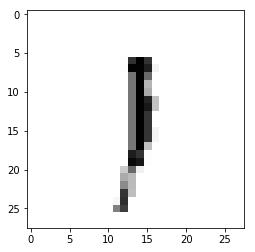

Epoch : 3 cost :  2.224564659378743
Accuracy : 0.1914
label : [1]
Prediction : [0]


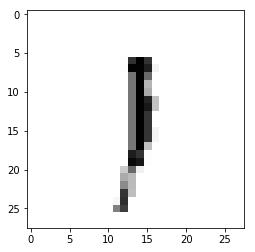

Epoch : 3 cost :  2.2287124573100674
Accuracy : 0.1919
label : [1]
Prediction : [0]


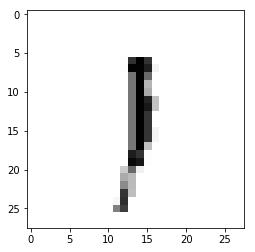

Epoch : 3 cost :  2.2328414453159655
Accuracy : 0.1942
label : [1]
Prediction : [0]


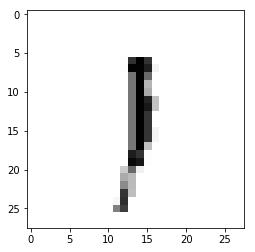

Epoch : 3 cost :  2.2369875188307304
Accuracy : 0.1946
label : [1]
Prediction : [0]


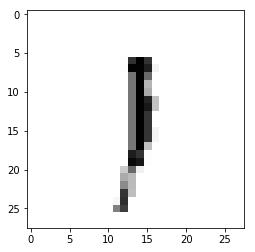

Epoch : 3 cost :  2.2411274173042965
Accuracy : 0.1938
label : [1]
Prediction : [0]


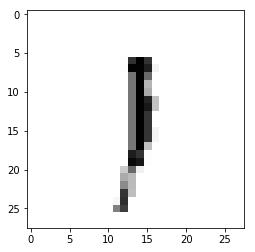

Epoch : 3 cost :  2.245265569253399
Accuracy : 0.1961
label : [1]
Prediction : [0]


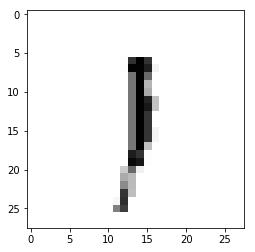

Epoch : 3 cost :  2.2494045166535788
Accuracy : 0.1954
label : [1]
Prediction : [0]


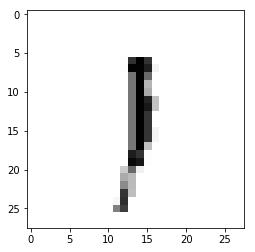

Epoch : 3 cost :  2.2535502329739634
Accuracy : 0.1934
label : [1]
Prediction : [0]


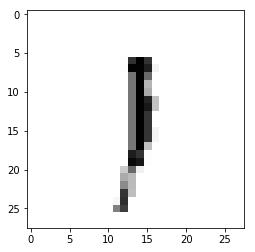

Epoch : 3 cost :  2.2576989741758844
Accuracy : 0.1929
label : [1]
Prediction : [0]


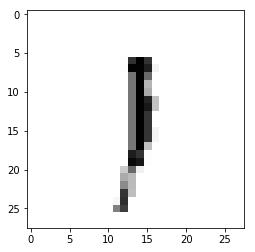

Epoch : 3 cost :  2.2618559490550627
Accuracy : 0.1941
label : [1]
Prediction : [0]


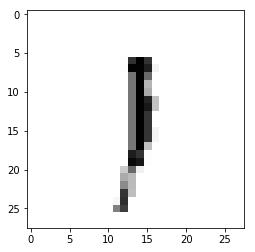

Epoch : 3 cost :  2.2659934533726065
Accuracy : 0.1937
label : [1]
Prediction : [0]


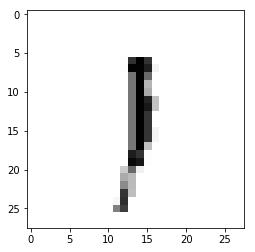

Epoch : 3 cost :  2.270103062282907
Accuracy : 0.1938
label : [1]
Prediction : [0]


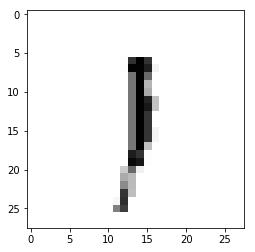

Epoch : 3 cost :  2.2742237749966687
Accuracy : 0.1947
label : [1]
Prediction : [0]


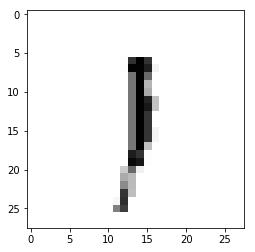

Epoch : 3 cost :  2.278367385864256
Accuracy : 0.1961
label : [1]
Prediction : [0]


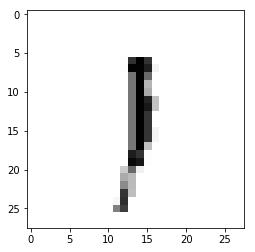

Epoch : 3 cost :  2.2824933689290807
Accuracy : 0.1966
label : [1]
Prediction : [0]


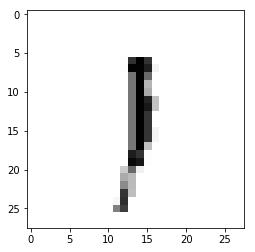

Epoch : 4 cost :  0.0041186579790982334
Accuracy : 0.1935
label : [1]
Prediction : [0]


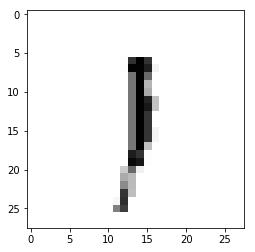

Epoch : 4 cost :  0.00824978611686013
Accuracy : 0.189
label : [1]
Prediction : [0]


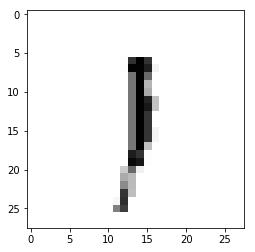

Epoch : 4 cost :  0.012359514236450195
Accuracy : 0.1884
label : [1]
Prediction : [0]


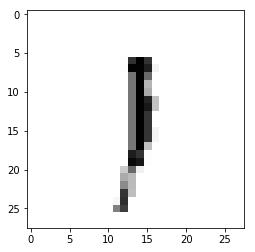

Epoch : 4 cost :  0.016517059152776545
Accuracy : 0.191
label : [1]
Prediction : [0]


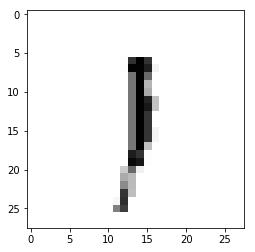

Epoch : 4 cost :  0.02065786491740834
Accuracy : 0.1907
label : [1]
Prediction : [0]


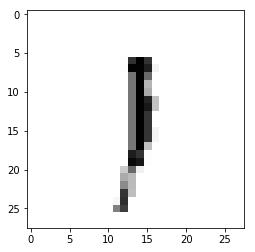

Epoch : 4 cost :  0.024797119227322667
Accuracy : 0.1939
label : [1]
Prediction : [0]


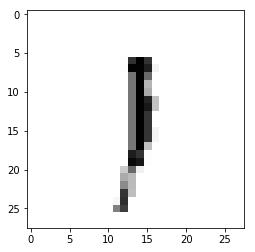

Epoch : 4 cost :  0.028927006288008258
Accuracy : 0.1942
label : [1]
Prediction : [0]


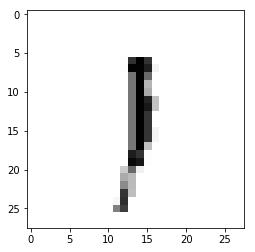

Epoch : 4 cost :  0.03307823181152344
Accuracy : 0.1936
label : [1]
Prediction : [0]


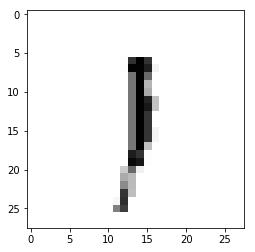

Epoch : 4 cost :  0.03720898671583696
Accuracy : 0.1949
label : [1]
Prediction : [0]


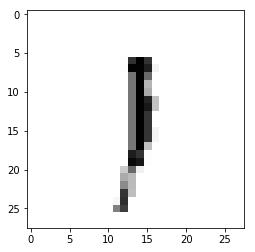

Epoch : 4 cost :  0.04135842670093883
Accuracy : 0.1947
label : [1]
Prediction : [0]


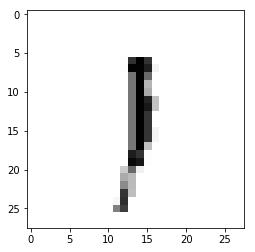

Epoch : 4 cost :  0.04547494194724343
Accuracy : 0.1935
label : [1]
Prediction : [0]


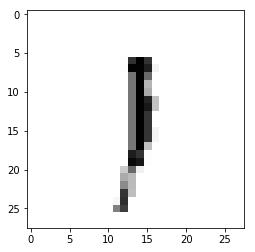

Epoch : 4 cost :  0.049609928998080165
Accuracy : 0.1936
label : [1]
Prediction : [0]


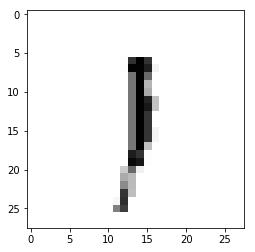

Epoch : 4 cost :  0.05372626174579967
Accuracy : 0.1913
label : [1]
Prediction : [0]


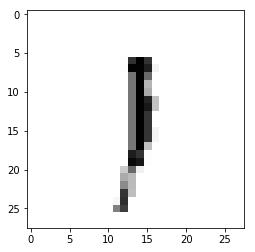

Epoch : 4 cost :  0.0578761980750344
Accuracy : 0.1952
label : [1]
Prediction : [0]


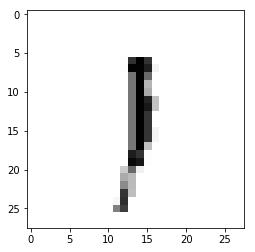

Epoch : 4 cost :  0.06201591274955055
Accuracy : 0.1968
label : [1]
Prediction : [0]


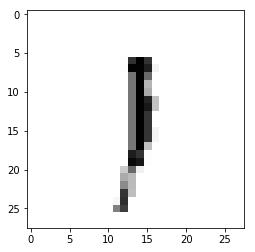

Epoch : 4 cost :  0.06614756844260475
Accuracy : 0.201
label : [1]
Prediction : [0]


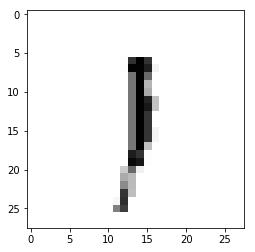

Epoch : 4 cost :  0.07026548819108441
Accuracy : 0.1964
label : [1]
Prediction : [0]


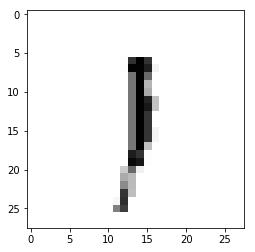

Epoch : 4 cost :  0.07441116766496136
Accuracy : 0.1924
label : [1]
Prediction : [0]


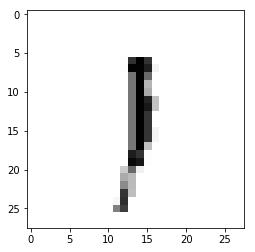

Epoch : 4 cost :  0.07853516882116143
Accuracy : 0.192
label : [1]
Prediction : [0]


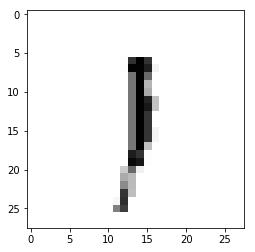

Epoch : 4 cost :  0.08265405178070068
Accuracy : 0.1898
label : [1]
Prediction : [0]


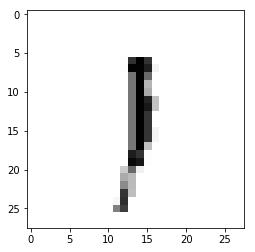

Epoch : 4 cost :  0.08678366444327613
Accuracy : 0.1916
label : [1]
Prediction : [0]


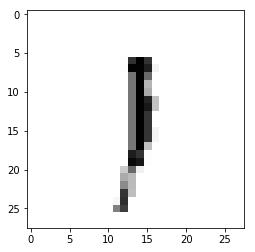

Epoch : 4 cost :  0.09093571012670343
Accuracy : 0.1893
label : [1]
Prediction : [0]


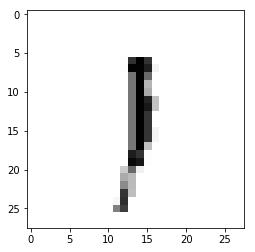

Epoch : 4 cost :  0.09506854967637494
Accuracy : 0.1891
label : [1]
Prediction : [0]


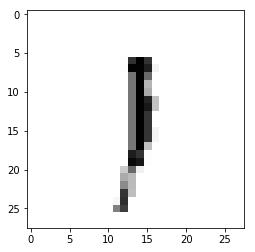

Epoch : 4 cost :  0.09918478142131458
Accuracy : 0.1923
label : [1]
Prediction : [0]


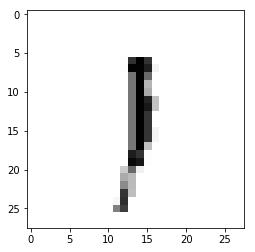

Epoch : 4 cost :  0.10331407720392399
Accuracy : 0.1883
label : [1]
Prediction : [0]


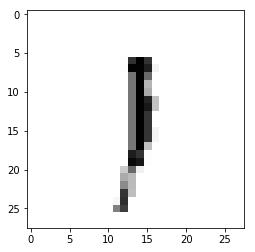

Epoch : 4 cost :  0.10740235198627818
Accuracy : 0.1909
label : [1]
Prediction : [0]


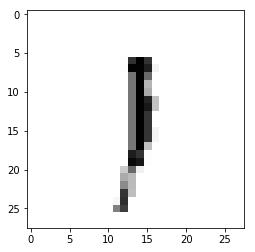

Epoch : 4 cost :  0.11150016524574972
Accuracy : 0.1888
label : [1]
Prediction : [0]


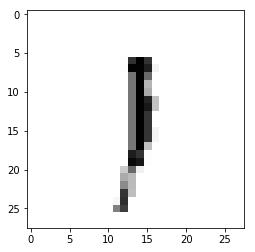

Epoch : 4 cost :  0.11565889705311168
Accuracy : 0.1881
label : [1]
Prediction : [0]


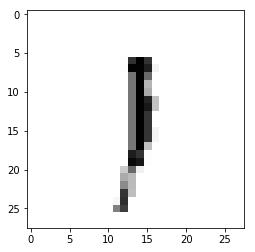

Epoch : 4 cost :  0.11979185797951437
Accuracy : 0.1888
label : [1]
Prediction : [0]


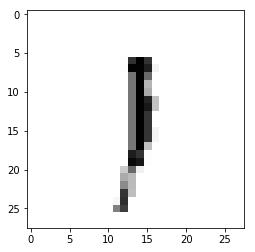

Epoch : 4 cost :  0.12392145243558016
Accuracy : 0.1917
label : [1]
Prediction : [0]


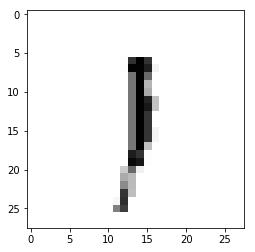

Epoch : 4 cost :  0.1280515146255493
Accuracy : 0.1911
label : [1]
Prediction : [0]


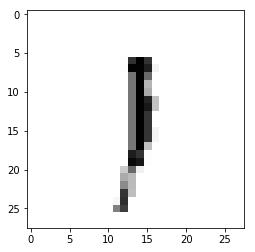

Epoch : 4 cost :  0.13216006755828857
Accuracy : 0.1837
label : [1]
Prediction : [0]


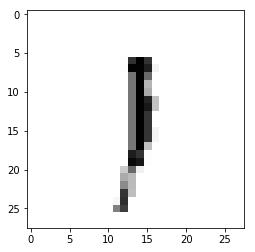

Epoch : 4 cost :  0.13631525603207675
Accuracy : 0.1873
label : [1]
Prediction : [0]


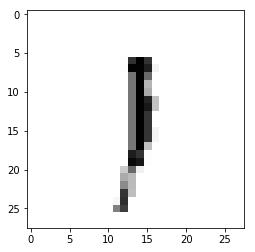

Epoch : 4 cost :  0.14041677084836093
Accuracy : 0.1909
label : [1]
Prediction : [0]


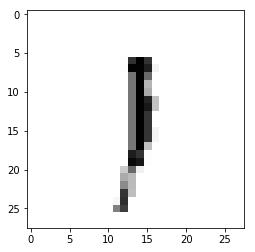

Epoch : 4 cost :  0.14455992611971769
Accuracy : 0.1922
label : [1]
Prediction : [0]


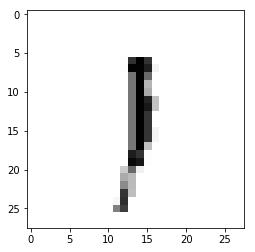

Epoch : 4 cost :  0.148710861639543
Accuracy : 0.1975
label : [1]
Prediction : [0]


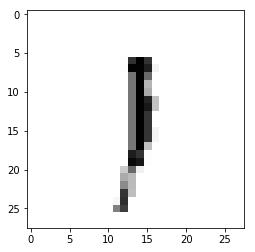

Epoch : 4 cost :  0.15286238150163128
Accuracy : 0.1946
label : [1]
Prediction : [0]


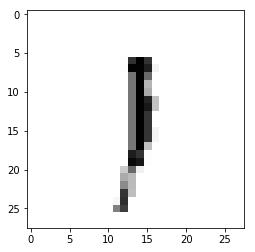

Epoch : 4 cost :  0.15699056538668543
Accuracy : 0.1921
label : [1]
Prediction : [0]


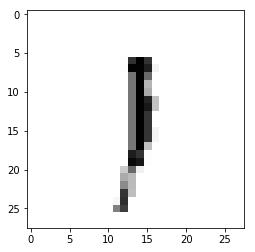

Epoch : 4 cost :  0.1611215747486461
Accuracy : 0.1931
label : [1]
Prediction : [0]


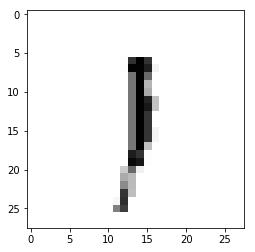

Epoch : 4 cost :  0.16522956111214376
Accuracy : 0.1901
label : [1]
Prediction : [0]


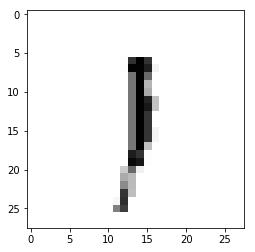

Epoch : 4 cost :  0.16934688047929242
Accuracy : 0.1888
label : [1]
Prediction : [0]


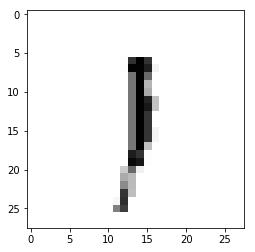

Epoch : 4 cost :  0.17345806338570333
Accuracy : 0.1904
label : [1]
Prediction : [0]


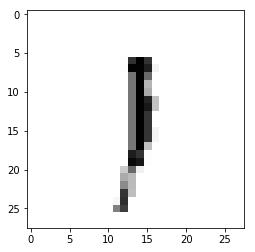

Epoch : 4 cost :  0.17761448470028962
Accuracy : 0.1935
label : [1]
Prediction : [0]


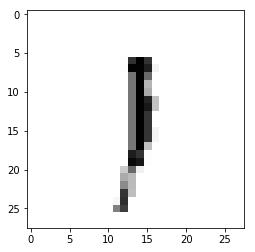

Epoch : 4 cost :  0.18176820798353713
Accuracy : 0.2169
label : [1]
Prediction : [0]


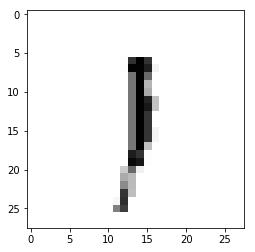

Epoch : 4 cost :  0.18592283292250197
Accuracy : 0.2193
label : [1]
Prediction : [0]


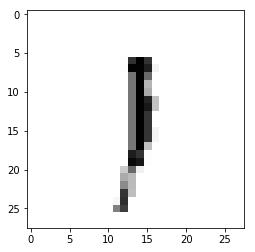

Epoch : 4 cost :  0.19007840546694665
Accuracy : 0.2203
label : [1]
Prediction : [0]


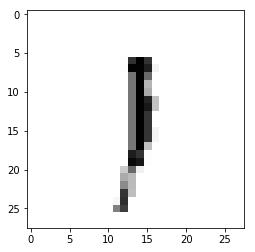

Epoch : 4 cost :  0.19422255906191735
Accuracy : 0.202
label : [1]
Prediction : [0]


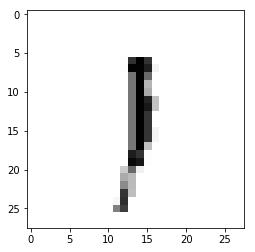

Epoch : 4 cost :  0.19836672436107283
Accuracy : 0.2055
label : [1]
Prediction : [0]


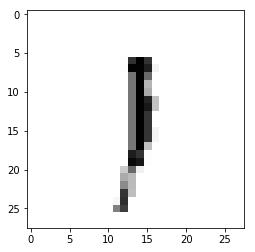

Epoch : 4 cost :  0.20249318816445086
Accuracy : 0.2027
label : [1]
Prediction : [0]


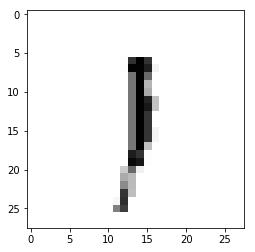

Epoch : 4 cost :  0.2066173748536543
Accuracy : 0.2035
label : [1]
Prediction : [0]


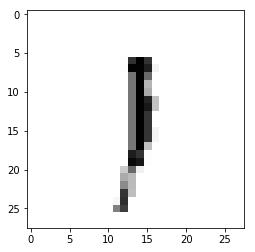

Epoch : 4 cost :  0.21075062535025854
Accuracy : 0.2199
label : [1]
Prediction : [0]


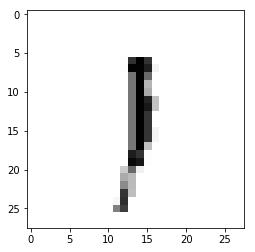

Epoch : 4 cost :  0.214896783395247
Accuracy : 0.2191
label : [1]
Prediction : [0]


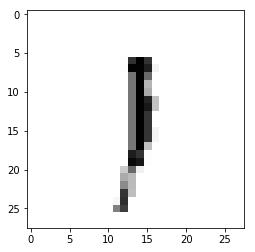

Epoch : 4 cost :  0.21902916388078167
Accuracy : 0.22
label : [1]
Prediction : [0]


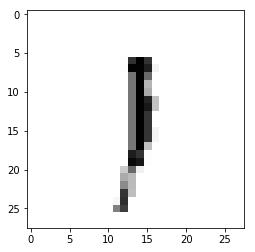

Epoch : 4 cost :  0.22317757389762183
Accuracy : 0.1988
label : [1]
Prediction : [0]


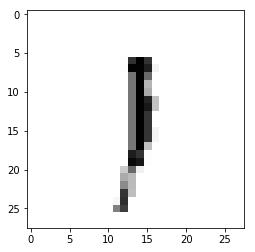

Epoch : 4 cost :  0.22730473561720413
Accuracy : 0.1915
label : [1]
Prediction : [0]


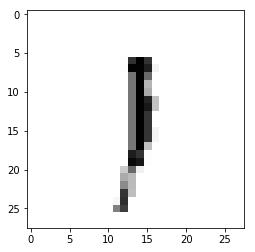

Epoch : 4 cost :  0.23142542232166635
Accuracy : 0.1938
label : [1]
Prediction : [0]


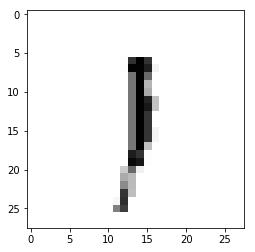

Epoch : 4 cost :  0.23554793617942116
Accuracy : 0.195
label : [1]
Prediction : [0]


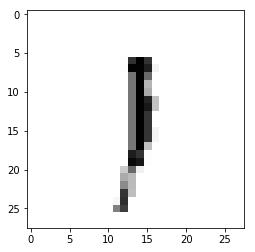

Epoch : 4 cost :  0.2396711678938432
Accuracy : 0.1997
label : [1]
Prediction : [0]


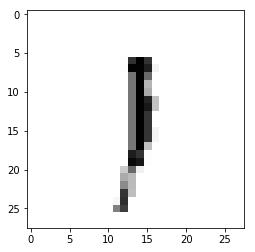

Epoch : 4 cost :  0.24380141258239746
Accuracy : 0.1927
label : [1]
Prediction : [0]


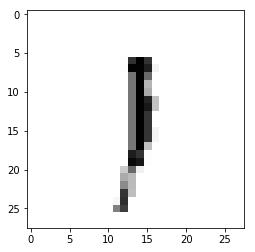

Epoch : 4 cost :  0.24793199409138073
Accuracy : 0.1898
label : [1]
Prediction : [0]


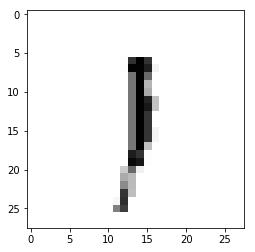

Epoch : 4 cost :  0.25206811037930577
Accuracy : 0.1875
label : [1]
Prediction : [0]


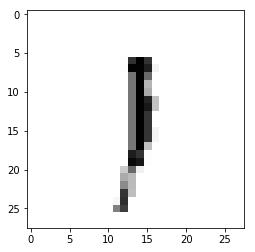

Epoch : 4 cost :  0.25618635784495963
Accuracy : 0.1871
label : [1]
Prediction : [0]


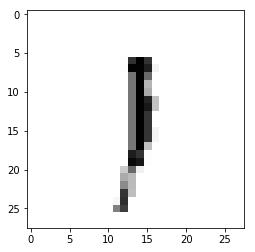

Epoch : 4 cost :  0.26031927672299476
Accuracy : 0.1867
label : [1]
Prediction : [0]


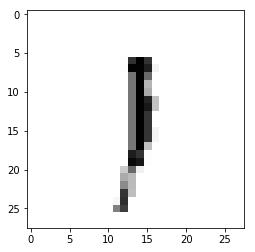

Epoch : 4 cost :  0.26447561177340423
Accuracy : 0.1868
label : [1]
Prediction : [0]


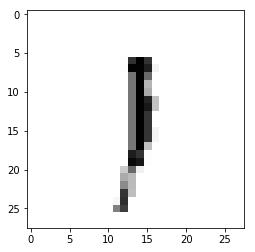

Epoch : 4 cost :  0.2686145440014926
Accuracy : 0.1858
label : [1]
Prediction : [0]


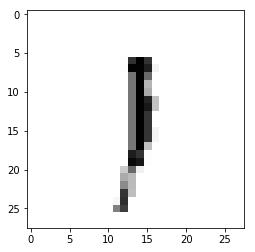

Epoch : 4 cost :  0.2727502822875977
Accuracy : 0.1848
label : [1]
Prediction : [0]


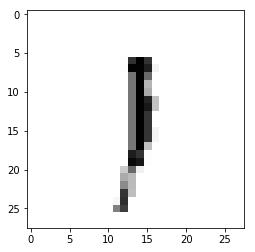

Epoch : 4 cost :  0.2768455418673429
Accuracy : 0.1875
label : [1]
Prediction : [0]


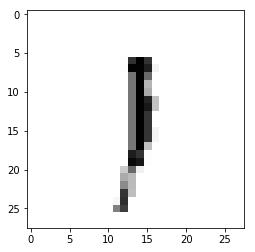

Epoch : 4 cost :  0.28096544829281894
Accuracy : 0.1881
label : [1]
Prediction : [0]


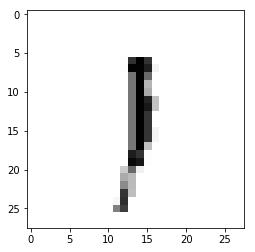

Epoch : 4 cost :  0.2851241770657626
Accuracy : 0.1879
label : [1]
Prediction : [0]


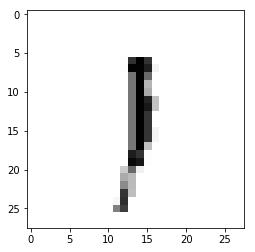

Epoch : 4 cost :  0.28927829092199153
Accuracy : 0.19
label : [1]
Prediction : [0]


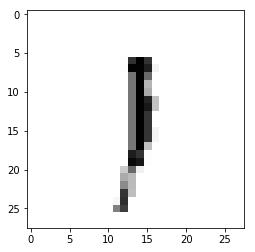

Epoch : 4 cost :  0.29341449867595326
Accuracy : 0.1924
label : [1]
Prediction : [0]


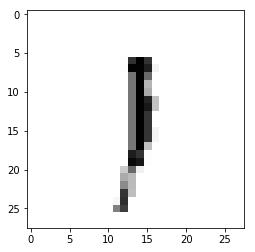

Epoch : 4 cost :  0.29754416682503443
Accuracy : 0.1941
label : [1]
Prediction : [0]


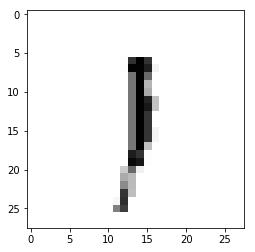

Epoch : 4 cost :  0.30171460325067695
Accuracy : 0.1929
label : [1]
Prediction : [0]


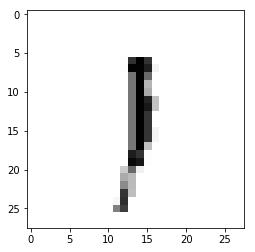

Epoch : 4 cost :  0.30584793611006306
Accuracy : 0.1904
label : [1]
Prediction : [0]


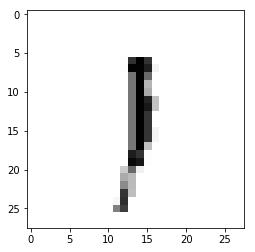

Epoch : 4 cost :  0.3099770493940874
Accuracy : 0.1887
label : [1]
Prediction : [0]


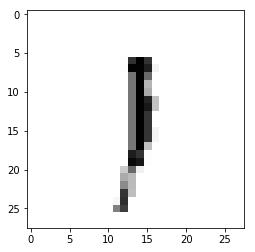

Epoch : 4 cost :  0.31410017967224124
Accuracy : 0.1858
label : [1]
Prediction : [0]


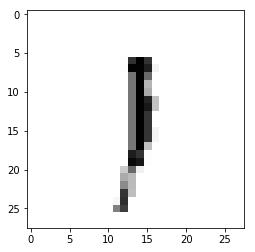

Epoch : 4 cost :  0.3182281788912687
Accuracy : 0.1853
label : [1]
Prediction : [0]


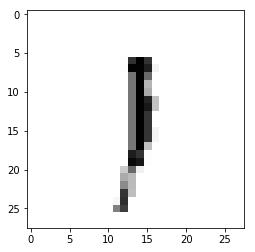

Epoch : 4 cost :  0.32238599257035694
Accuracy : 0.1883
label : [1]
Prediction : [0]


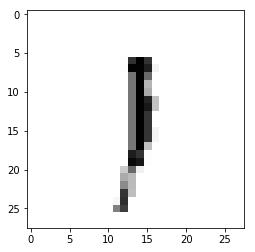

Epoch : 4 cost :  0.32652231129733006
Accuracy : 0.1895
label : [1]
Prediction : [0]


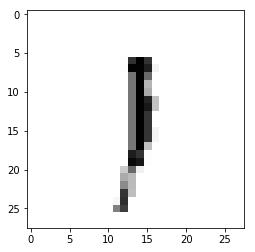

Epoch : 4 cost :  0.33064353856173434
Accuracy : 0.1872
label : [1]
Prediction : [0]


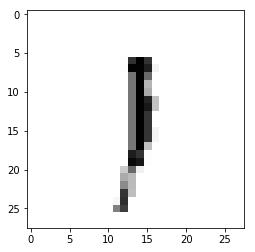

Epoch : 4 cost :  0.3348048574274237
Accuracy : 0.1908
label : [1]
Prediction : [0]


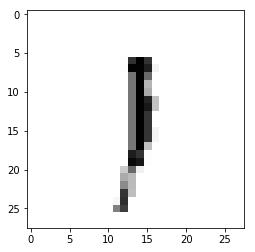

Epoch : 4 cost :  0.33892977281050257
Accuracy : 0.1825
label : [1]
Prediction : [0]


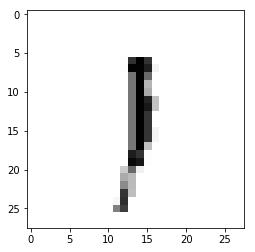

Epoch : 4 cost :  0.3430232745950873
Accuracy : 0.1847
label : [1]
Prediction : [0]


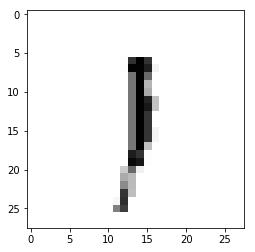

Epoch : 4 cost :  0.347174716429277
Accuracy : 0.1864
label : [1]
Prediction : [0]


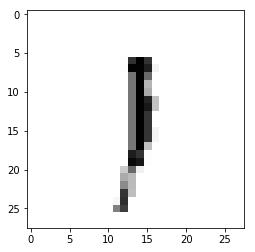

Epoch : 4 cost :  0.3513126598704946
Accuracy : 0.1868
label : [1]
Prediction : [0]


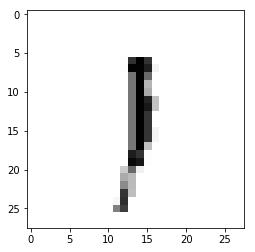

Epoch : 4 cost :  0.35543664412064996
Accuracy : 0.1897
label : [1]
Prediction : [0]


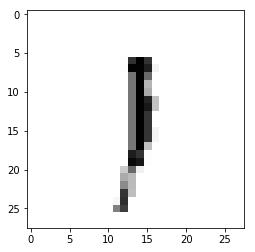

Epoch : 4 cost :  0.3595725150541827
Accuracy : 0.1928
label : [1]
Prediction : [0]


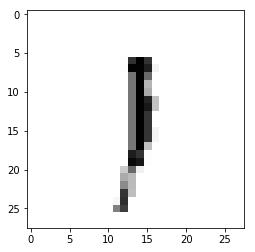

Epoch : 4 cost :  0.36372398333116024
Accuracy : 0.194
label : [1]
Prediction : [0]


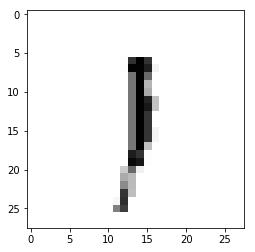

Epoch : 4 cost :  0.36785073236985655
Accuracy : 0.1967
label : [1]
Prediction : [0]


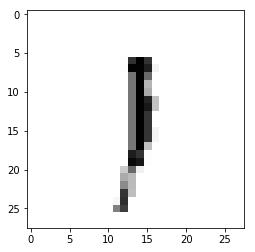

Epoch : 4 cost :  0.37197474566372973
Accuracy : 0.1984
label : [1]
Prediction : [0]


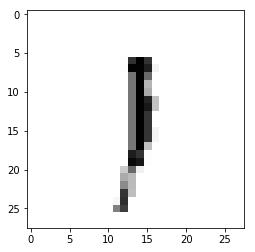

Epoch : 4 cost :  0.37609121409329516
Accuracy : 0.1968
label : [1]
Prediction : [0]


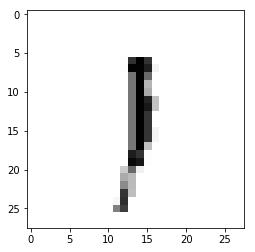

Epoch : 4 cost :  0.38021368503570574
Accuracy : 0.1963
label : [1]
Prediction : [0]


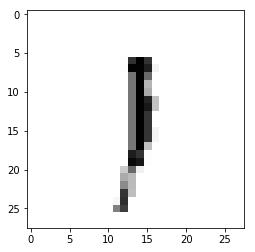

Epoch : 4 cost :  0.38430649627338775
Accuracy : 0.1958
label : [1]
Prediction : [0]


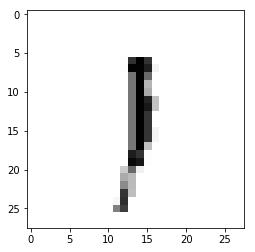

Epoch : 4 cost :  0.3884668809717354
Accuracy : 0.198
label : [1]
Prediction : [0]


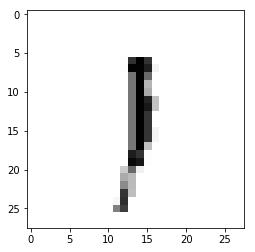

Epoch : 4 cost :  0.392615846720609
Accuracy : 0.1965
label : [1]
Prediction : [0]


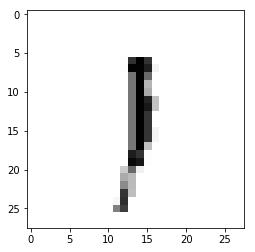

Epoch : 4 cost :  0.3967425827546555
Accuracy : 0.1958
label : [1]
Prediction : [0]


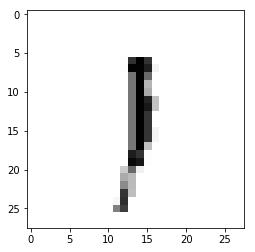

Epoch : 4 cost :  0.4008666870810771
Accuracy : 0.1967
label : [1]
Prediction : [0]


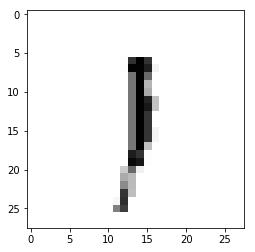

Epoch : 4 cost :  0.40501142371784576
Accuracy : 0.1965
label : [1]
Prediction : [0]


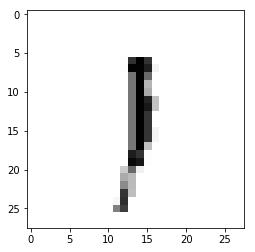

Epoch : 4 cost :  0.4091418123245241
Accuracy : 0.1959
label : [1]
Prediction : [0]


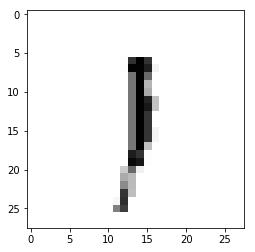

Epoch : 4 cost :  0.4132661320946435
Accuracy : 0.1959
label : [1]
Prediction : [0]


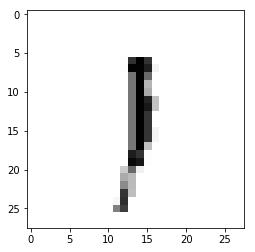

Epoch : 4 cost :  0.4174446977268568
Accuracy : 0.202
label : [1]
Prediction : [0]


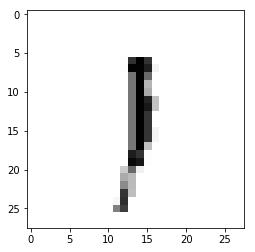

Epoch : 4 cost :  0.42156934694810366
Accuracy : 0.1999
label : [1]
Prediction : [0]


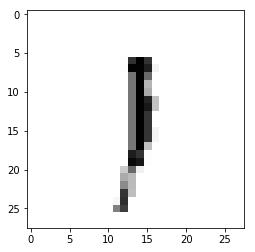

Epoch : 4 cost :  0.42569880095395196
Accuracy : 0.2027
label : [1]
Prediction : [0]


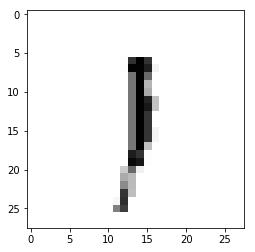

Epoch : 4 cost :  0.429822277589278
Accuracy : 0.2267
label : [1]
Prediction : [0]


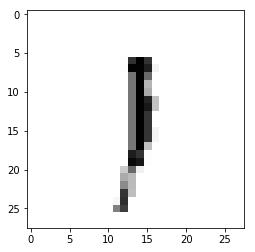

Epoch : 4 cost :  0.4339618015289309
Accuracy : 0.231
label : [1]
Prediction : [0]


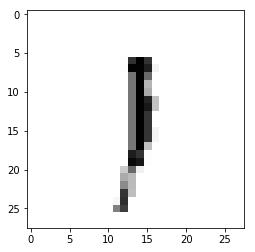

Epoch : 4 cost :  0.43807548913088734
Accuracy : 0.2297
label : [1]
Prediction : [0]


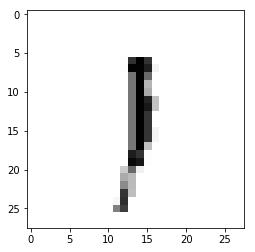

Epoch : 4 cost :  0.4422106404737995
Accuracy : 0.2285
label : [1]
Prediction : [0]


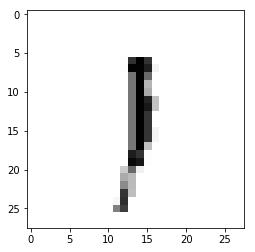

Epoch : 4 cost :  0.44635534329847876
Accuracy : 0.2215
label : [1]
Prediction : [0]


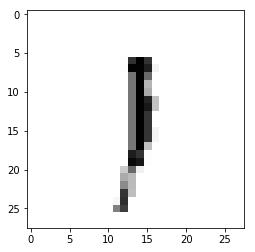

Epoch : 4 cost :  0.4504797181216155
Accuracy : 0.2268
label : [1]
Prediction : [0]


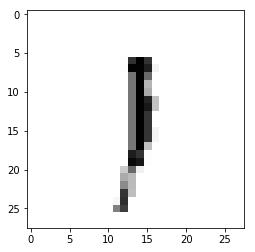

Epoch : 4 cost :  0.4545939367467709
Accuracy : 0.2285
label : [1]
Prediction : [0]


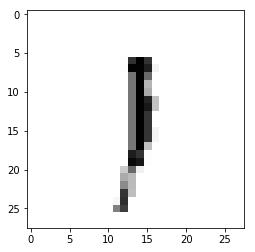

Epoch : 4 cost :  0.4587105625325985
Accuracy : 0.2248
label : [1]
Prediction : [0]


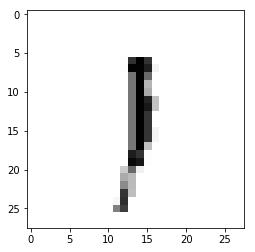

Epoch : 4 cost :  0.4628306263143368
Accuracy : 0.2037
label : [1]
Prediction : [0]


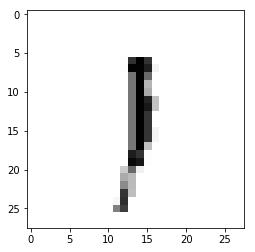

Epoch : 4 cost :  0.46694308757782005
Accuracy : 0.1996
label : [1]
Prediction : [0]


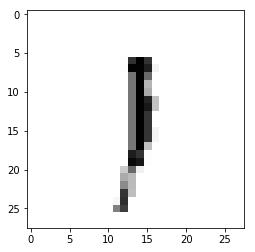

Epoch : 4 cost :  0.4710822478207677
Accuracy : 0.2184
label : [1]
Prediction : [0]


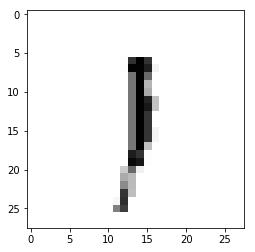

Epoch : 4 cost :  0.4752326635880906
Accuracy : 0.219
label : [1]
Prediction : [0]


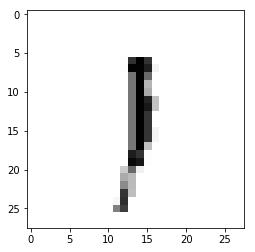

Epoch : 4 cost :  0.47936569343913704
Accuracy : 0.2184
label : [1]
Prediction : [0]


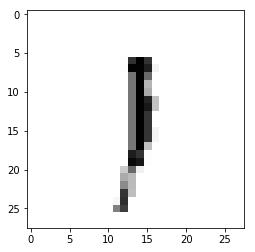

Epoch : 4 cost :  0.48347625992514887
Accuracy : 0.2135
label : [1]
Prediction : [0]


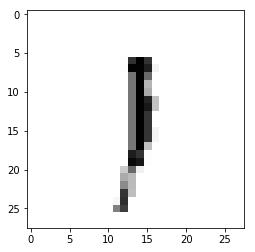

Epoch : 4 cost :  0.4875876821171155
Accuracy : 0.1989
label : [1]
Prediction : [0]


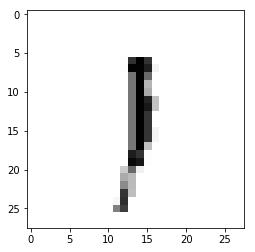

Epoch : 4 cost :  0.4917058996720749
Accuracy : 0.2174
label : [1]
Prediction : [0]


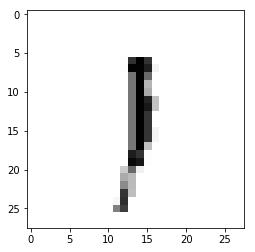

Epoch : 4 cost :  0.49584439364346605
Accuracy : 0.215
label : [1]
Prediction : [0]


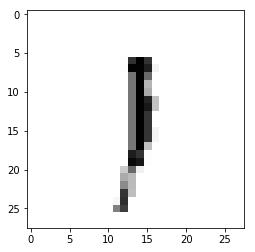

Epoch : 4 cost :  0.49993442578749236
Accuracy : 0.2192
label : [1]
Prediction : [0]


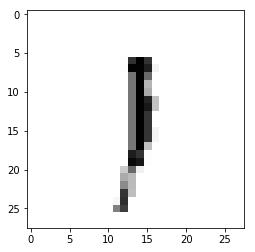

Epoch : 4 cost :  0.5040817070007325
Accuracy : 0.1977
label : [1]
Prediction : [0]


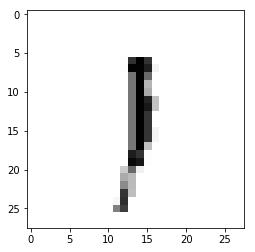

Epoch : 4 cost :  0.5081980744275181
Accuracy : 0.1991
label : [1]
Prediction : [0]


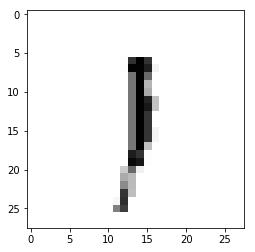

Epoch : 4 cost :  0.5123450404947455
Accuracy : 0.2032
label : [1]
Prediction : [0]


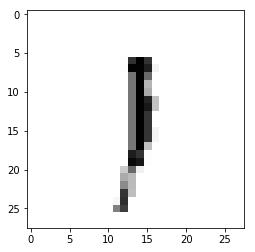

Epoch : 4 cost :  0.5164994456551293
Accuracy : 0.2078
label : [1]
Prediction : [0]


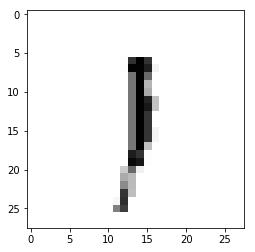

Epoch : 4 cost :  0.520621305812489
Accuracy : 0.2282
label : [1]
Prediction : [0]


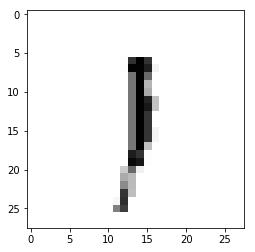

Epoch : 4 cost :  0.524773834401911
Accuracy : 0.2007
label : [1]
Prediction : [0]


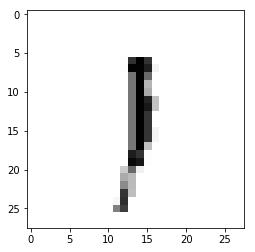

Epoch : 4 cost :  0.528903737935153
Accuracy : 0.2003
label : [1]
Prediction : [0]


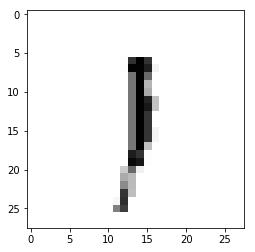

Epoch : 4 cost :  0.5330390683087436
Accuracy : 0.2078
label : [1]
Prediction : [0]


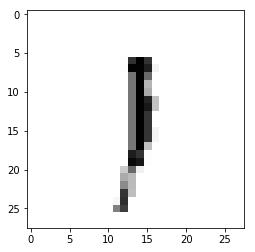

Epoch : 4 cost :  0.537140815041282
Accuracy : 0.2235
label : [1]
Prediction : [0]


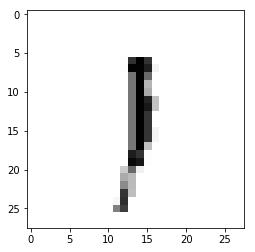

Epoch : 4 cost :  0.5412839729135687
Accuracy : 0.2241
label : [1]
Prediction : [0]


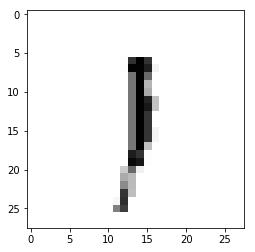

Epoch : 4 cost :  0.5454354802044955
Accuracy : 0.2289
label : [1]
Prediction : [0]


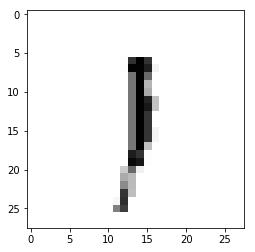

Epoch : 4 cost :  0.5495537229017777
Accuracy : 0.2293
label : [1]
Prediction : [0]


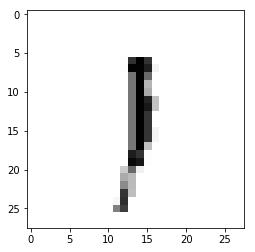

Epoch : 4 cost :  0.5536471124128861
Accuracy : 0.2301
label : [1]
Prediction : [0]


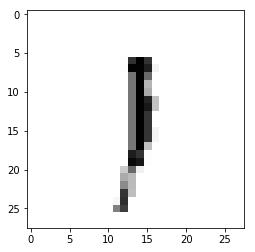

Epoch : 4 cost :  0.557751950784163
Accuracy : 0.229
label : [1]
Prediction : [0]


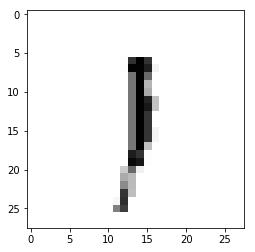

Epoch : 4 cost :  0.5618855385346845
Accuracy : 0.2318
label : [1]
Prediction : [0]


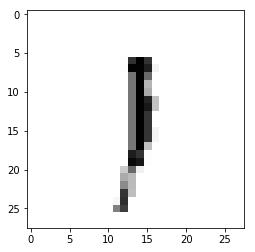

Epoch : 4 cost :  0.5660140479694712
Accuracy : 0.2293
label : [1]
Prediction : [0]


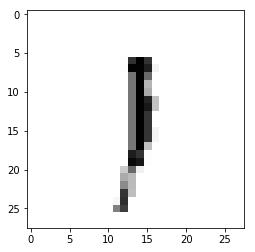

Epoch : 4 cost :  0.5701365310495549
Accuracy : 0.2304
label : [1]
Prediction : [0]


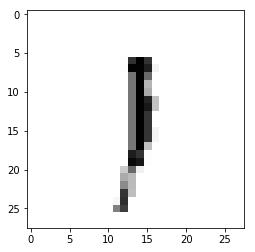

Epoch : 4 cost :  0.5742867881601506
Accuracy : 0.2305
label : [1]
Prediction : [0]


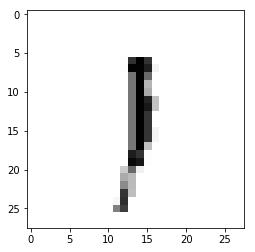

Epoch : 4 cost :  0.5783763569051568
Accuracy : 0.2305
label : [1]
Prediction : [0]


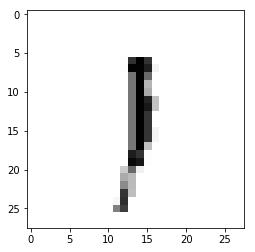

Epoch : 4 cost :  0.5825164751573041
Accuracy : 0.2318
label : [1]
Prediction : [0]


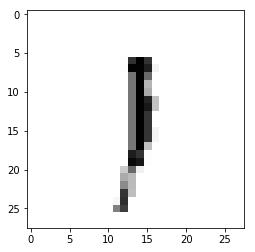

Epoch : 4 cost :  0.5866588284752584
Accuracy : 0.2338
label : [1]
Prediction : [0]


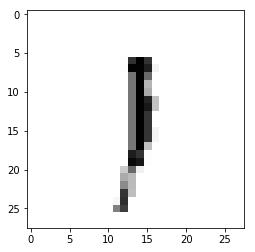

Epoch : 4 cost :  0.5908069107749244
Accuracy : 0.2337
label : [1]
Prediction : [0]


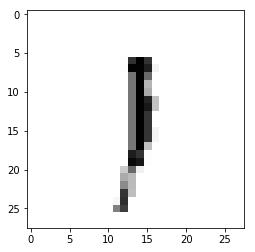

Epoch : 4 cost :  0.5949558006633411
Accuracy : 0.2335
label : [1]
Prediction : [0]


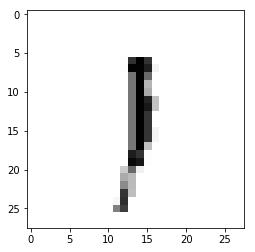

Epoch : 4 cost :  0.5990802717208862
Accuracy : 0.2367
label : [1]
Prediction : [0]


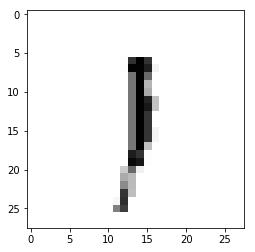

Epoch : 4 cost :  0.6031636545874856
Accuracy : 0.2365
label : [1]
Prediction : [0]


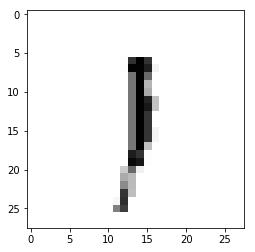

Epoch : 4 cost :  0.6072970000180331
Accuracy : 0.2365
label : [1]
Prediction : [0]


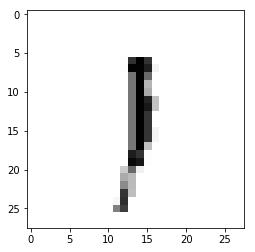

Epoch : 4 cost :  0.6114291282133623
Accuracy : 0.2373
label : [1]
Prediction : [0]


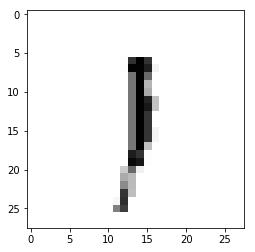

Epoch : 4 cost :  0.6155663091486151
Accuracy : 0.2375
label : [1]
Prediction : [0]


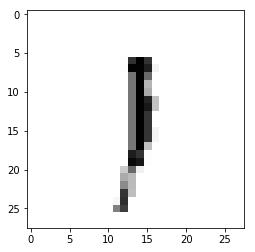

Epoch : 4 cost :  0.6197136315432462
Accuracy : 0.238
label : [1]
Prediction : [0]


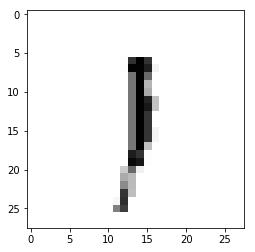

Epoch : 4 cost :  0.6238203386826949
Accuracy : 0.2361
label : [1]
Prediction : [0]


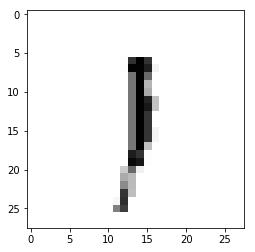

Epoch : 4 cost :  0.6279812860488893
Accuracy : 0.2361
label : [1]
Prediction : [0]


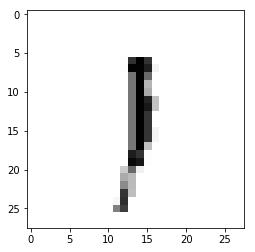

Epoch : 4 cost :  0.6321057072552768
Accuracy : 0.2356
label : [1]
Prediction : [0]


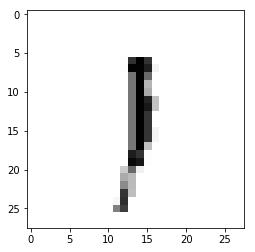

Epoch : 4 cost :  0.6362193012237549
Accuracy : 0.2351
label : [1]
Prediction : [0]


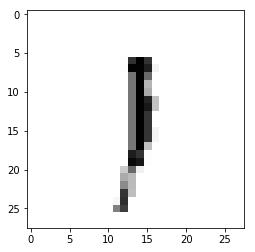

Epoch : 4 cost :  0.6403345307436856
Accuracy : 0.2336
label : [1]
Prediction : [0]


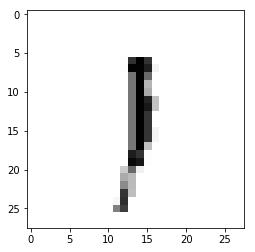

Epoch : 4 cost :  0.6444779920578003
Accuracy : 0.2242
label : [1]
Prediction : [0]


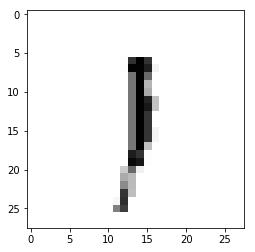

Epoch : 4 cost :  0.6486496890674938
Accuracy : 0.226
label : [1]
Prediction : [0]


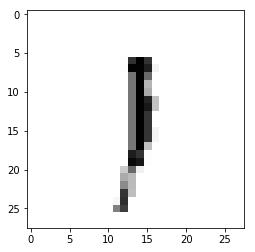

Epoch : 4 cost :  0.6527748940207742
Accuracy : 0.2133
label : [1]
Prediction : [0]


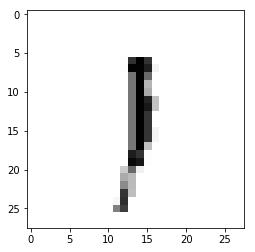

Epoch : 4 cost :  0.6569283112612637
Accuracy : 0.2315
label : [1]
Prediction : [0]


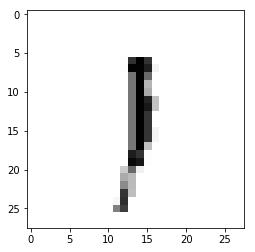

Epoch : 4 cost :  0.6610543181679465
Accuracy : 0.2341
label : [1]
Prediction : [0]


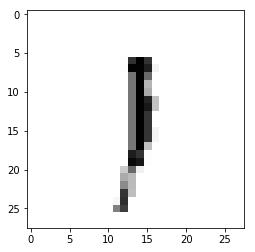

Epoch : 4 cost :  0.6651979680494827
Accuracy : 0.2357
label : [1]
Prediction : [0]


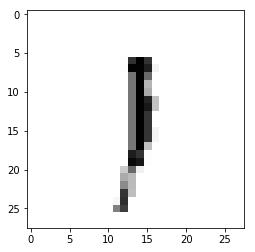

Epoch : 4 cost :  0.6693247127532957
Accuracy : 0.235
label : [1]
Prediction : [0]


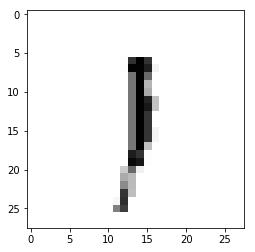

Epoch : 4 cost :  0.6734572748704388
Accuracy : 0.2357
label : [1]
Prediction : [0]


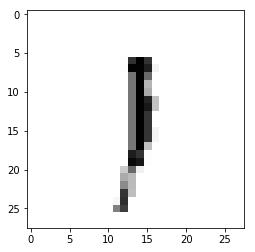

Epoch : 4 cost :  0.6775681070847943
Accuracy : 0.235
label : [1]
Prediction : [0]


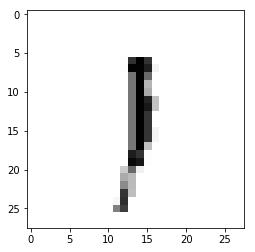

Epoch : 4 cost :  0.6816562266783279
Accuracy : 0.2348
label : [1]
Prediction : [0]


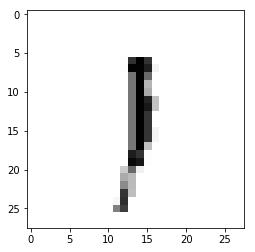

Epoch : 4 cost :  0.6857672947103326
Accuracy : 0.2339
label : [1]
Prediction : [0]


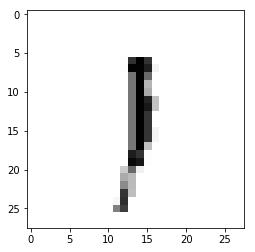

Epoch : 4 cost :  0.6899113061211325
Accuracy : 0.2328
label : [1]
Prediction : [0]


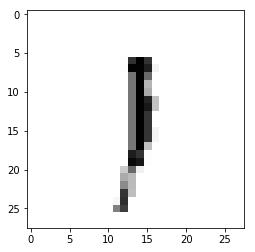

Epoch : 4 cost :  0.6940383018146861
Accuracy : 0.2341
label : [1]
Prediction : [0]


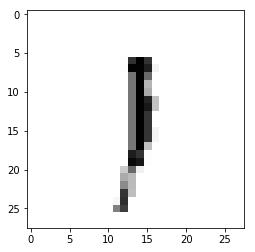

Epoch : 4 cost :  0.6981737167185003
Accuracy : 0.232
label : [1]
Prediction : [0]


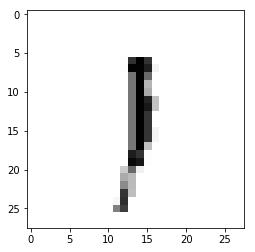

Epoch : 4 cost :  0.7023064591667868
Accuracy : 0.2321
label : [1]
Prediction : [0]


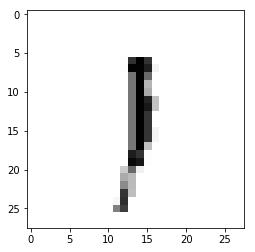

Epoch : 4 cost :  0.7064603805541991
Accuracy : 0.2332
label : [1]
Prediction : [0]


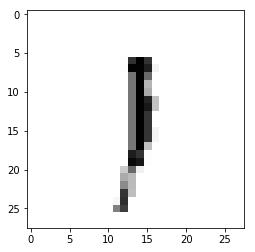

Epoch : 4 cost :  0.7105723979256369
Accuracy : 0.2324
label : [1]
Prediction : [0]


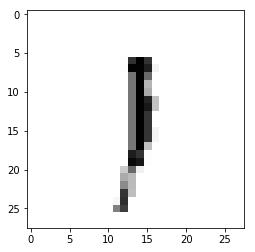

Epoch : 4 cost :  0.7146662647073918
Accuracy : 0.2305
label : [1]
Prediction : [0]


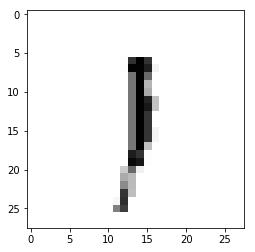

Epoch : 4 cost :  0.7188192267851395
Accuracy : 0.2306
label : [1]
Prediction : [0]


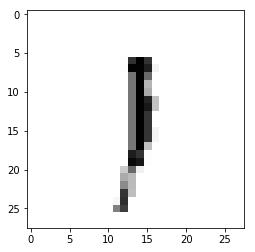

Epoch : 4 cost :  0.7229636799205432
Accuracy : 0.2344
label : [1]
Prediction : [0]


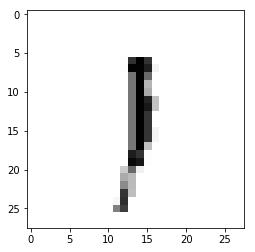

Epoch : 4 cost :  0.7270935145291414
Accuracy : 0.2346
label : [1]
Prediction : [0]


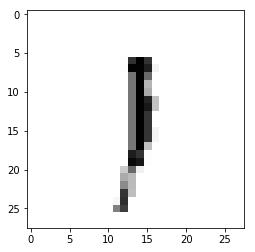

Epoch : 4 cost :  0.7312365818023681
Accuracy : 0.2349
label : [1]
Prediction : [0]


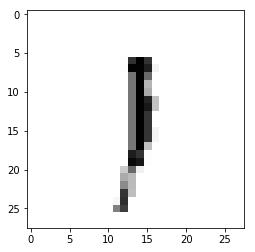

Epoch : 4 cost :  0.7353780148246071
Accuracy : 0.2342
label : [1]
Prediction : [0]


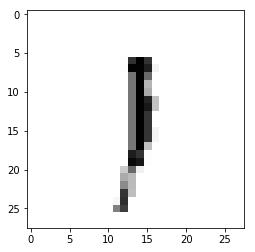

Epoch : 4 cost :  0.7394968240911309
Accuracy : 0.2351
label : [1]
Prediction : [0]


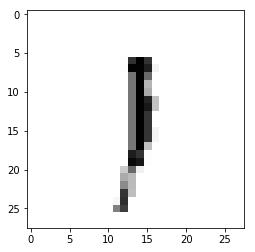

Epoch : 4 cost :  0.7436249628933992
Accuracy : 0.2353
label : [1]
Prediction : [0]


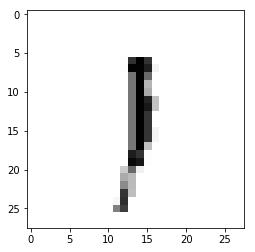

Epoch : 4 cost :  0.7477202606201171
Accuracy : 0.2339
label : [1]
Prediction : [0]


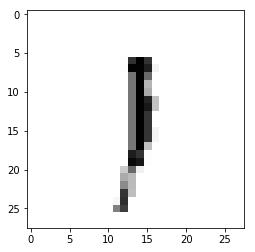

Epoch : 4 cost :  0.7518189161474054
Accuracy : 0.2332
label : [1]
Prediction : [0]


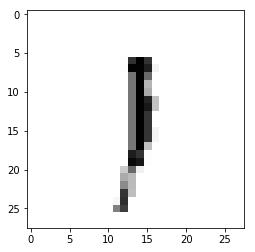

Epoch : 4 cost :  0.755951452255249
Accuracy : 0.2339
label : [1]
Prediction : [0]


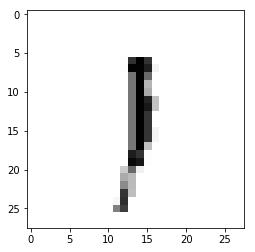

Epoch : 4 cost :  0.7600609315525401
Accuracy : 0.2325
label : [1]
Prediction : [0]


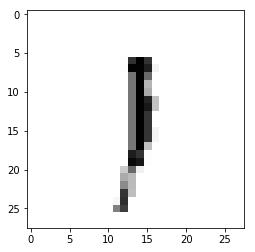

Epoch : 4 cost :  0.7641862674192947
Accuracy : 0.2321
label : [1]
Prediction : [0]


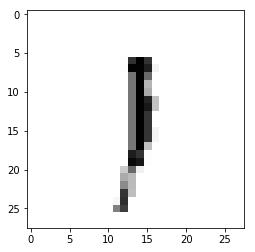

Epoch : 4 cost :  0.7682848826321688
Accuracy : 0.2308
label : [1]
Prediction : [0]


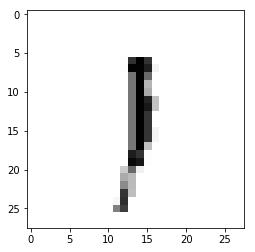

Epoch : 4 cost :  0.7724339541521938
Accuracy : 0.2306
label : [1]
Prediction : [0]


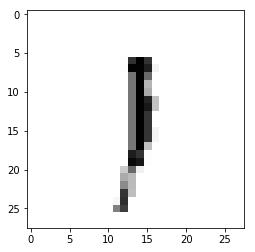

Epoch : 4 cost :  0.7765299784053454
Accuracy : 0.2281
label : [1]
Prediction : [0]


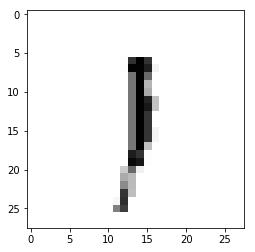

Epoch : 4 cost :  0.7806297180869362
Accuracy : 0.2275
label : [1]
Prediction : [0]


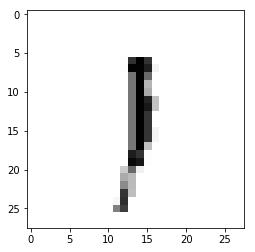

Epoch : 4 cost :  0.7847171189568258
Accuracy : 0.2278
label : [1]
Prediction : [0]


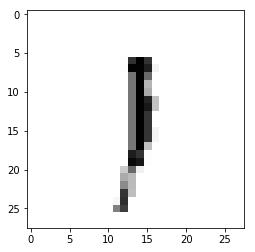

Epoch : 4 cost :  0.7888354063034057
Accuracy : 0.2286
label : [1]
Prediction : [0]


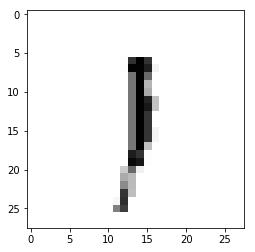

Epoch : 4 cost :  0.7929988280209627
Accuracy : 0.2287
label : [1]
Prediction : [0]


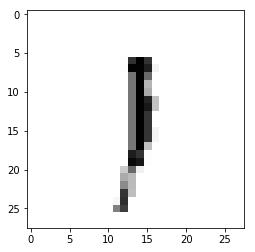

Epoch : 4 cost :  0.7971401903846046
Accuracy : 0.2314
label : [1]
Prediction : [0]


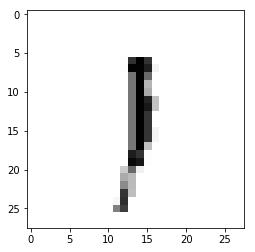

Epoch : 4 cost :  0.8012572223489933
Accuracy : 0.2311
label : [1]
Prediction : [0]


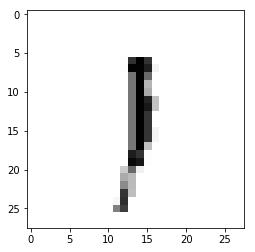

Epoch : 4 cost :  0.8053754958239467
Accuracy : 0.2319
label : [1]
Prediction : [0]


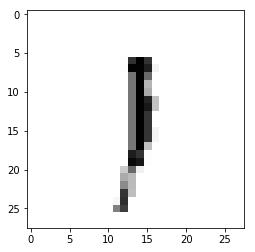

Epoch : 4 cost :  0.8094951087778264
Accuracy : 0.2311
label : [1]
Prediction : [0]


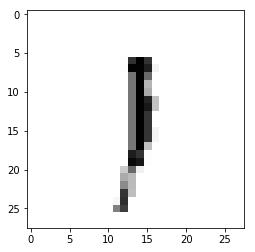

Epoch : 4 cost :  0.8136099663647738
Accuracy : 0.2311
label : [1]
Prediction : [0]


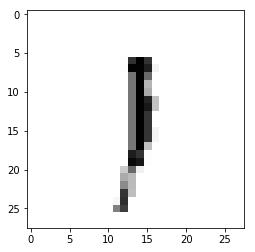

Epoch : 4 cost :  0.8177485487677834
Accuracy : 0.2324
label : [1]
Prediction : [0]


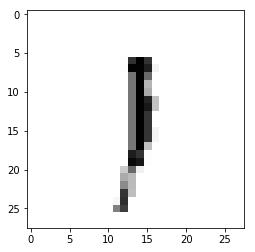

Epoch : 4 cost :  0.8218489170074462
Accuracy : 0.2312
label : [1]
Prediction : [0]


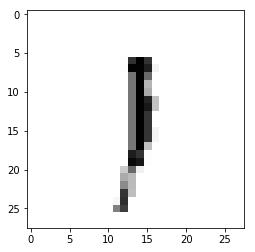

Epoch : 4 cost :  0.8259614740718494
Accuracy : 0.2297
label : [1]
Prediction : [0]


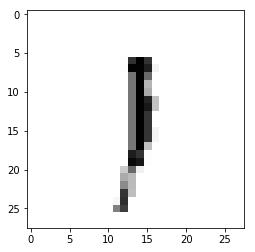

Epoch : 4 cost :  0.8300878516110506
Accuracy : 0.233
label : [1]
Prediction : [0]


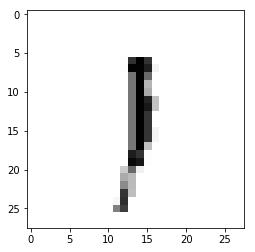

Epoch : 4 cost :  0.8342365832762284
Accuracy : 0.2359
label : [1]
Prediction : [0]


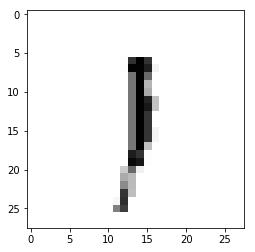

Epoch : 4 cost :  0.8383449198982932
Accuracy : 0.2336
label : [1]
Prediction : [0]


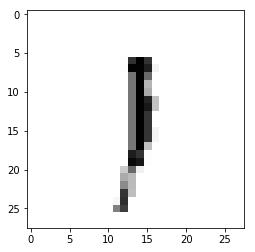

Epoch : 4 cost :  0.8424492012370716
Accuracy : 0.2323
label : [1]
Prediction : [0]


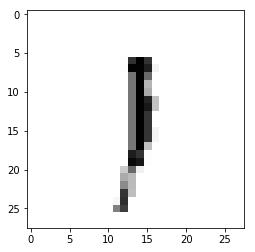

Epoch : 4 cost :  0.846561592275446
Accuracy : 0.2298
label : [1]
Prediction : [0]


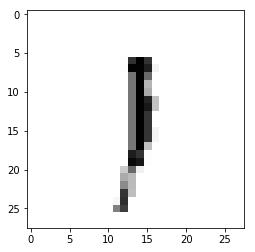

Epoch : 4 cost :  0.85072217984633
Accuracy : 0.2305
label : [1]
Prediction : [0]


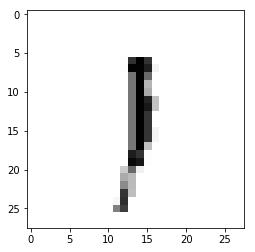

Epoch : 4 cost :  0.854843760837208
Accuracy : 0.228
label : [1]
Prediction : [0]


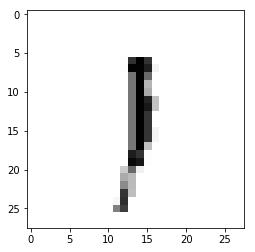

Epoch : 4 cost :  0.8589891897548327
Accuracy : 0.2286
label : [1]
Prediction : [0]


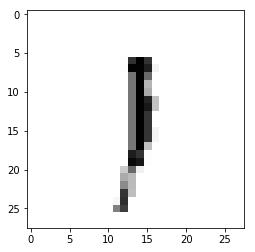

Epoch : 4 cost :  0.8631260286677966
Accuracy : 0.2278
label : [1]
Prediction : [0]


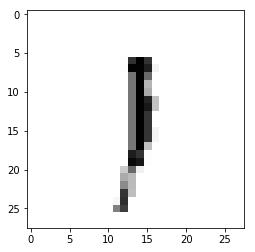

Epoch : 4 cost :  0.8672255568070845
Accuracy : 0.2273
label : [1]
Prediction : [0]


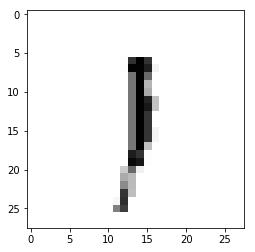

Epoch : 4 cost :  0.8713044712760231
Accuracy : 0.2226
label : [1]
Prediction : [0]


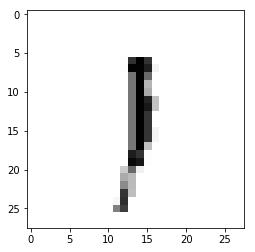

Epoch : 4 cost :  0.8754756853797218
Accuracy : 0.2213
label : [1]
Prediction : [0]


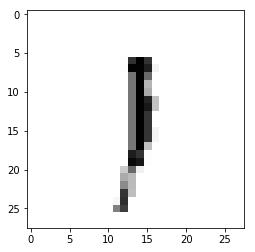

Epoch : 4 cost :  0.879618887901306
Accuracy : 0.2231
label : [1]
Prediction : [0]


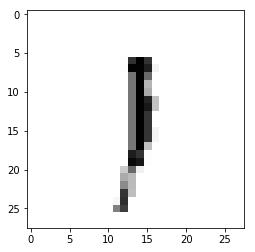

Epoch : 4 cost :  0.8837190268256446
Accuracy : 0.2208
label : [1]
Prediction : [0]


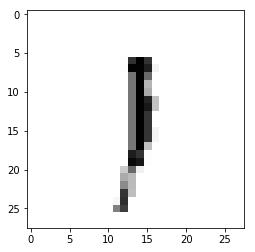

Epoch : 4 cost :  0.8878321699662641
Accuracy : 0.2181
label : [1]
Prediction : [0]


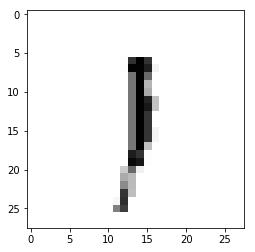

Epoch : 4 cost :  0.8919590655240145
Accuracy : 0.222
label : [1]
Prediction : [0]


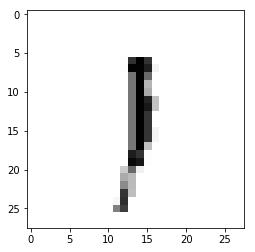

Epoch : 4 cost :  0.8960993714766068
Accuracy : 0.2231
label : [1]
Prediction : [0]


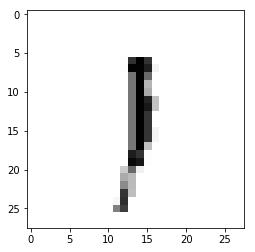

Epoch : 4 cost :  0.900198707147078
Accuracy : 0.204
label : [1]
Prediction : [0]


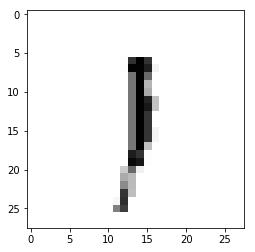

Epoch : 4 cost :  0.9043094444274901
Accuracy : 0.2047
label : [1]
Prediction : [0]


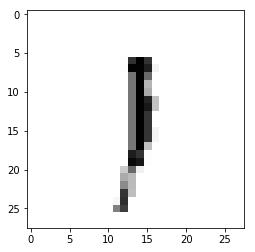

Epoch : 4 cost :  0.9084239079735494
Accuracy : 0.2071
label : [1]
Prediction : [0]


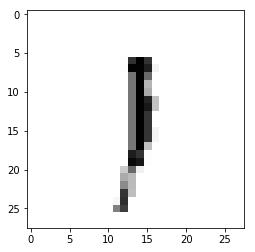

Epoch : 4 cost :  0.9125509470159355
Accuracy : 0.2049
label : [1]
Prediction : [0]


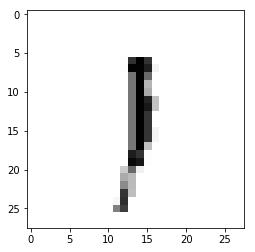

Epoch : 4 cost :  0.9166913097554985
Accuracy : 0.2243
label : [1]
Prediction : [0]


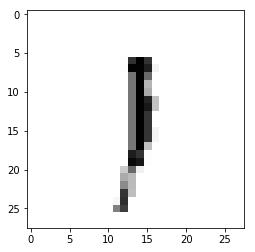

Epoch : 4 cost :  0.9207911339673127
Accuracy : 0.2263
label : [1]
Prediction : [0]


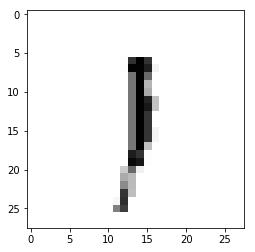

Epoch : 4 cost :  0.9249057687412607
Accuracy : 0.2256
label : [1]
Prediction : [0]


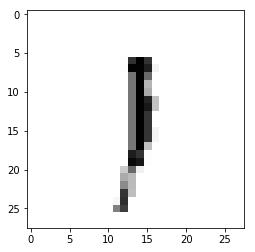

Epoch : 4 cost :  0.9290294790267943
Accuracy : 0.2337
label : [1]
Prediction : [0]


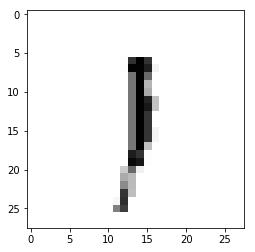

Epoch : 4 cost :  0.9331158230521461
Accuracy : 0.2307
label : [1]
Prediction : [0]


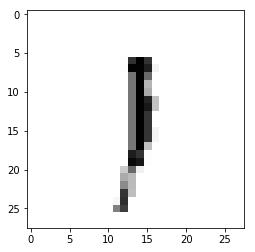

Epoch : 4 cost :  0.9372327583486383
Accuracy : 0.2306
label : [1]
Prediction : [0]


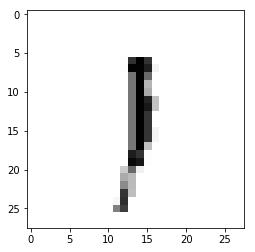

Epoch : 4 cost :  0.9413431791825727
Accuracy : 0.2303
label : [1]
Prediction : [0]


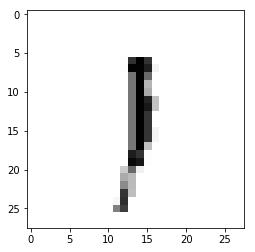

Epoch : 4 cost :  0.9454918215491555
Accuracy : 0.2318
label : [1]
Prediction : [0]


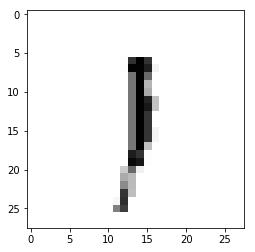

Epoch : 4 cost :  0.9496451503580267
Accuracy : 0.2369
label : [1]
Prediction : [0]


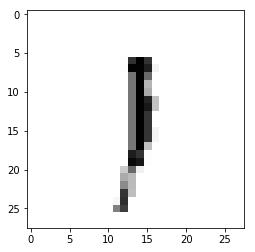

Epoch : 4 cost :  0.9537564585425636
Accuracy : 0.2368
label : [1]
Prediction : [0]


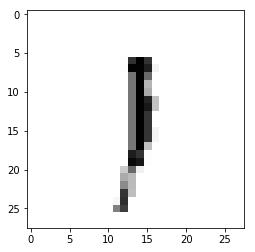

Epoch : 4 cost :  0.9578415588899092
Accuracy : 0.2343
label : [1]
Prediction : [0]


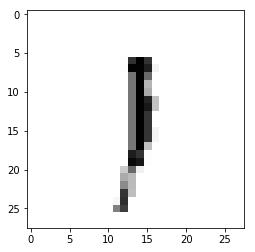

Epoch : 4 cost :  0.9619512683695013
Accuracy : 0.237
label : [1]
Prediction : [0]


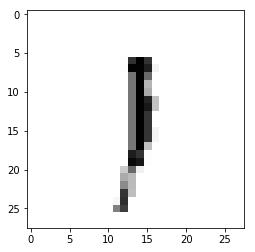

Epoch : 4 cost :  0.9660726499557495
Accuracy : 0.2364
label : [1]
Prediction : [0]


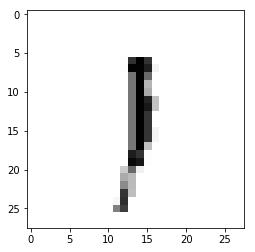

Epoch : 4 cost :  0.9701979940587824
Accuracy : 0.235
label : [1]
Prediction : [0]


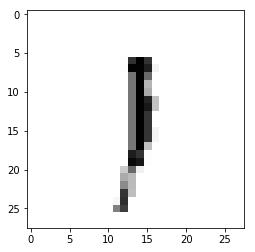

Epoch : 4 cost :  0.9743185567855834
Accuracy : 0.2355
label : [1]
Prediction : [0]


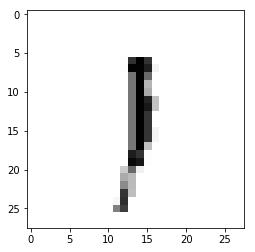

Epoch : 4 cost :  0.9783837977322665
Accuracy : 0.2333
label : [1]
Prediction : [0]


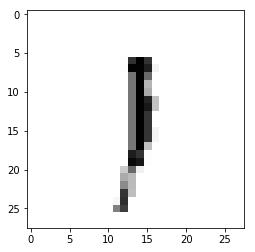

Epoch : 4 cost :  0.9824876065687699
Accuracy : 0.2319
label : [1]
Prediction : [0]


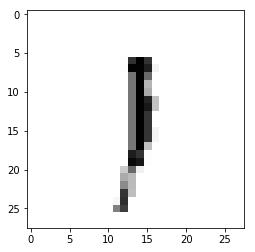

Epoch : 4 cost :  0.9866050390763715
Accuracy : 0.2313
label : [1]
Prediction : [0]


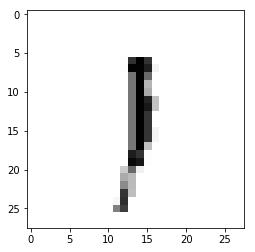

Epoch : 4 cost :  0.990716379772533
Accuracy : 0.2093
label : [1]
Prediction : [0]


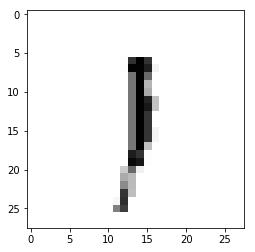

Epoch : 4 cost :  0.9948160392587835
Accuracy : 0.201
label : [1]
Prediction : [0]


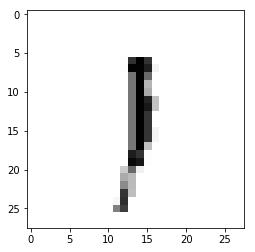

Epoch : 4 cost :  0.9989418519626964
Accuracy : 0.1999
label : [1]
Prediction : [0]


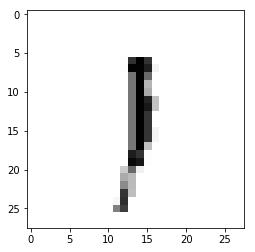

Epoch : 4 cost :  1.0030271343751387
Accuracy : 0.2031
label : [1]
Prediction : [0]


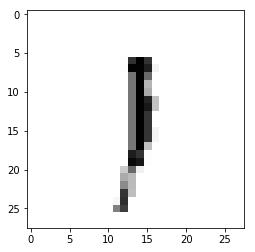

Epoch : 4 cost :  1.0071564782749522
Accuracy : 0.1999
label : [1]
Prediction : [0]


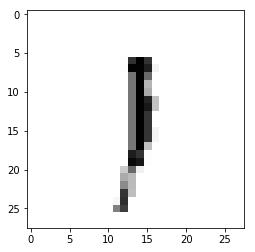

Epoch : 4 cost :  1.0112956987727773
Accuracy : 0.2027
label : [1]
Prediction : [0]


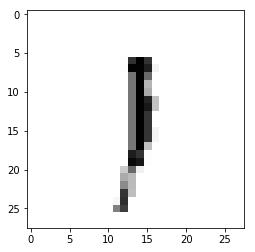

Epoch : 4 cost :  1.015410563729026
Accuracy : 0.2044
label : [1]
Prediction : [0]


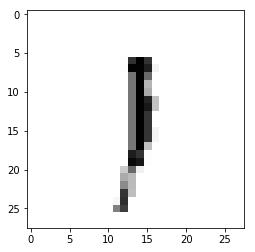

Epoch : 4 cost :  1.0195564339377663
Accuracy : 0.2049
label : [1]
Prediction : [0]


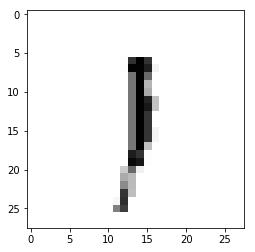

Epoch : 4 cost :  1.023657752383839
Accuracy : 0.2053
label : [1]
Prediction : [0]


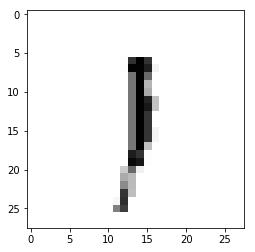

Epoch : 4 cost :  1.0278238938071511
Accuracy : 0.2028
label : [1]
Prediction : [0]


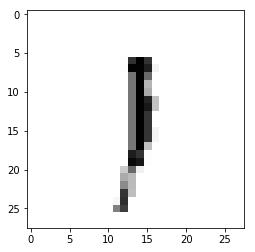

Epoch : 4 cost :  1.0319014345515858
Accuracy : 0.2029
label : [1]
Prediction : [0]


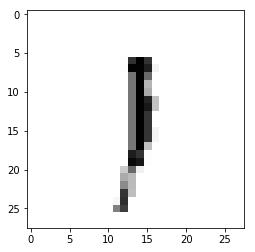

Epoch : 4 cost :  1.0360196126591075
Accuracy : 0.2038
label : [1]
Prediction : [0]


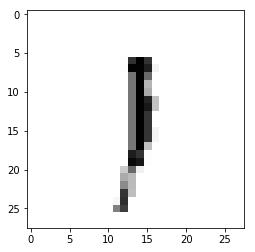

Epoch : 4 cost :  1.04013689734719
Accuracy : 0.2036
label : [1]
Prediction : [0]


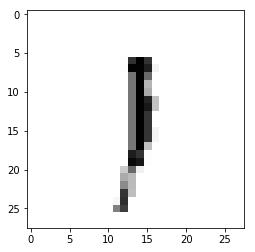

Epoch : 4 cost :  1.0442354869842527
Accuracy : 0.2038
label : [1]
Prediction : [0]


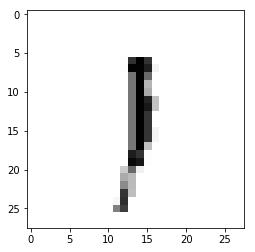

Epoch : 4 cost :  1.048324265046553
Accuracy : 0.2035
label : [1]
Prediction : [0]


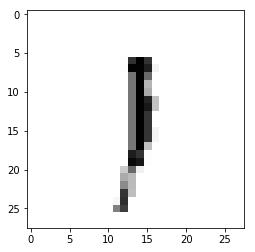

Epoch : 4 cost :  1.0524419212341307
Accuracy : 0.2024
label : [1]
Prediction : [0]


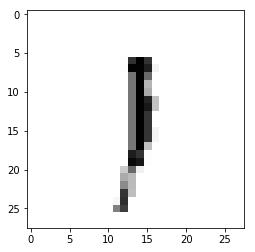

Epoch : 4 cost :  1.0565451296893031
Accuracy : 0.2025
label : [1]
Prediction : [0]


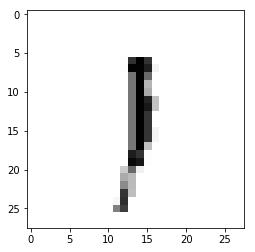

Epoch : 4 cost :  1.0606802875345402
Accuracy : 0.2032
label : [1]
Prediction : [0]


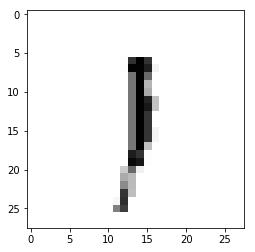

Epoch : 4 cost :  1.0648182240399446
Accuracy : 0.2032
label : [1]
Prediction : [0]


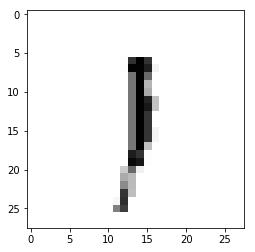

Epoch : 4 cost :  1.0689234035665338
Accuracy : 0.2039
label : [1]
Prediction : [0]


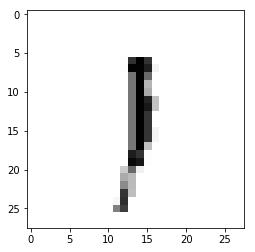

Epoch : 4 cost :  1.073069679520347
Accuracy : 0.2059
label : [1]
Prediction : [0]


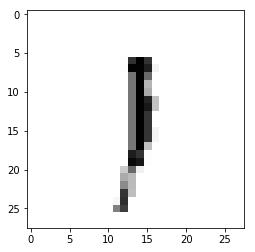

Epoch : 4 cost :  1.0771670813993974
Accuracy : 0.2047
label : [1]
Prediction : [0]


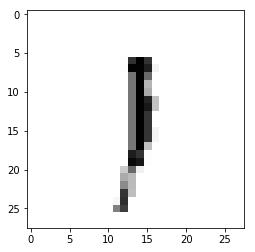

Epoch : 4 cost :  1.0812598657608032
Accuracy : 0.2035
label : [1]
Prediction : [0]


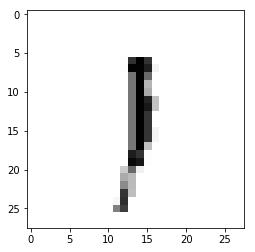

Epoch : 4 cost :  1.0853868865966798
Accuracy : 0.2041
label : [1]
Prediction : [0]


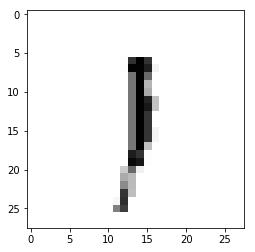

Epoch : 4 cost :  1.089515830386769
Accuracy : 0.2023
label : [1]
Prediction : [0]


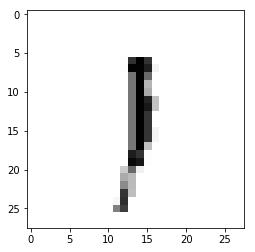

Epoch : 4 cost :  1.0936047892137009
Accuracy : 0.2052
label : [1]
Prediction : [0]


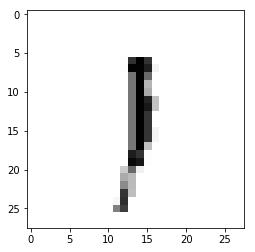

Epoch : 4 cost :  1.0977135237780486
Accuracy : 0.208
label : [1]
Prediction : [0]


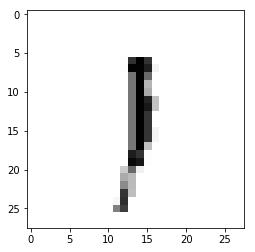

Epoch : 4 cost :  1.1018567830866035
Accuracy : 0.2079
label : [1]
Prediction : [0]


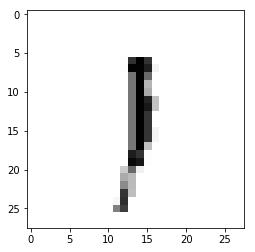

Epoch : 4 cost :  1.1059709288857202
Accuracy : 0.2136
label : [1]
Prediction : [0]


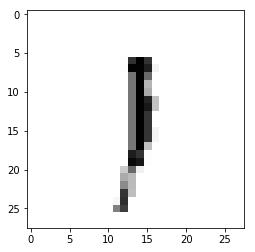

Epoch : 4 cost :  1.110101672085849
Accuracy : 0.2155
label : [1]
Prediction : [0]


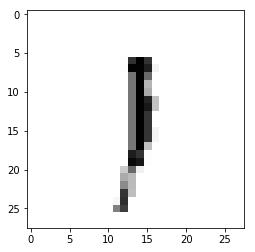

Epoch : 4 cost :  1.1142262775247749
Accuracy : 0.2104
label : [1]
Prediction : [0]


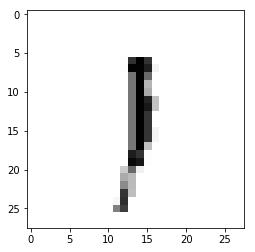

Epoch : 4 cost :  1.1183137065714057
Accuracy : 0.2136
label : [1]
Prediction : [0]


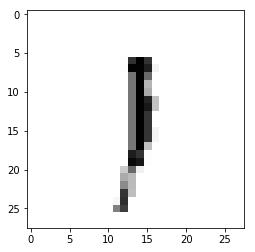

Epoch : 4 cost :  1.12240113735199
Accuracy : 0.2133
label : [1]
Prediction : [0]


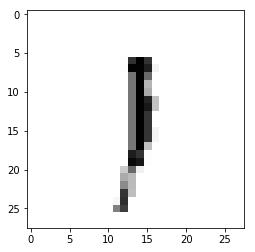

Epoch : 4 cost :  1.1264687347412112
Accuracy : 0.2348
label : [1]
Prediction : [0]


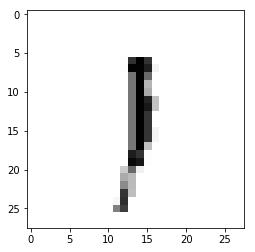

Epoch : 4 cost :  1.1306025739149617
Accuracy : 0.2372
label : [1]
Prediction : [0]


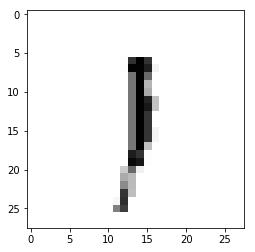

Epoch : 4 cost :  1.1347122162038632
Accuracy : 0.2342
label : [1]
Prediction : [0]


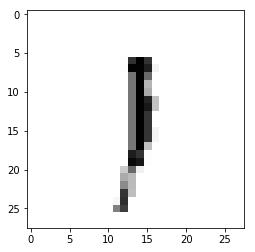

Epoch : 4 cost :  1.1387864932146943
Accuracy : 0.2391
label : [1]
Prediction : [0]


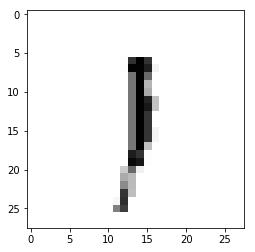

Epoch : 4 cost :  1.1428572251579983
Accuracy : 0.2414
label : [1]
Prediction : [0]


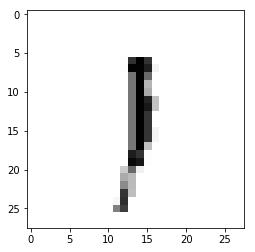

Epoch : 4 cost :  1.146959977149964
Accuracy : 0.2404
label : [1]
Prediction : [0]


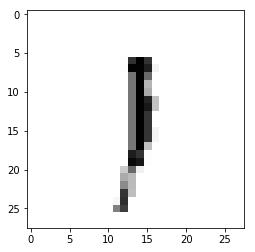

Epoch : 4 cost :  1.1510614516518338
Accuracy : 0.2403
label : [1]
Prediction : [0]


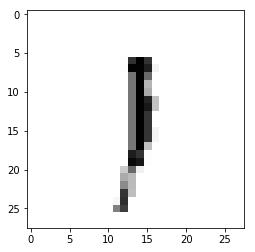

Epoch : 4 cost :  1.1551675666462298
Accuracy : 0.2421
label : [1]
Prediction : [0]


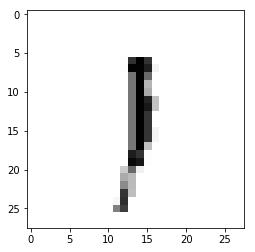

Epoch : 4 cost :  1.159288405071606
Accuracy : 0.2403
label : [1]
Prediction : [0]


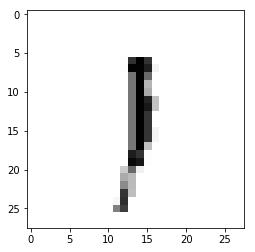

Epoch : 4 cost :  1.1633545437726114
Accuracy : 0.2371
label : [1]
Prediction : [0]


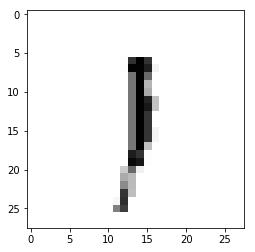

Epoch : 4 cost :  1.1674450531872842
Accuracy : 0.2372
label : [1]
Prediction : [0]


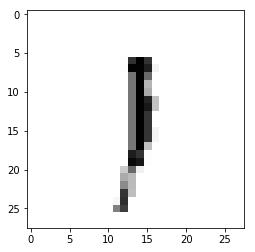

Epoch : 4 cost :  1.1715523750131787
Accuracy : 0.2178
label : [1]
Prediction : [0]


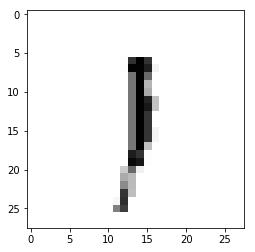

Epoch : 4 cost :  1.1756483697891242
Accuracy : 0.2111
label : [1]
Prediction : [0]


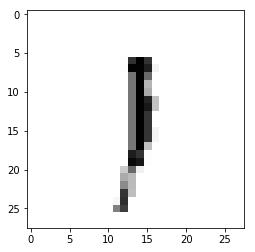

Epoch : 4 cost :  1.1797837937961932
Accuracy : 0.2056
label : [1]
Prediction : [0]


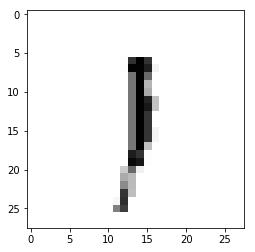

Epoch : 4 cost :  1.1839095263047659
Accuracy : 0.2029
label : [1]
Prediction : [0]


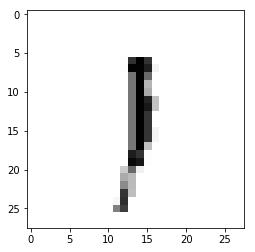

Epoch : 4 cost :  1.1880448163639423
Accuracy : 0.2051
label : [1]
Prediction : [0]


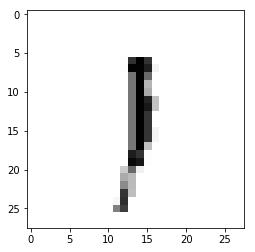

Epoch : 4 cost :  1.1921676835146826
Accuracy : 0.2082
label : [1]
Prediction : [0]


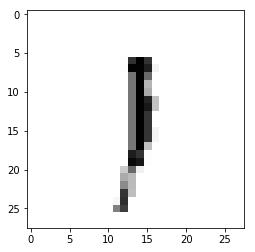

Epoch : 4 cost :  1.196271034154026
Accuracy : 0.2112
label : [1]
Prediction : [0]


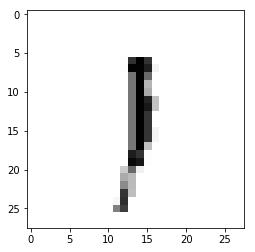

Epoch : 4 cost :  1.2003982882066215
Accuracy : 0.2076
label : [1]
Prediction : [0]


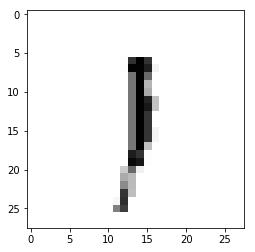

Epoch : 4 cost :  1.2044983139905072
Accuracy : 0.2121
label : [1]
Prediction : [0]


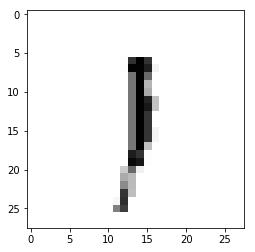

Epoch : 4 cost :  1.208585475574841
Accuracy : 0.2122
label : [1]
Prediction : [0]


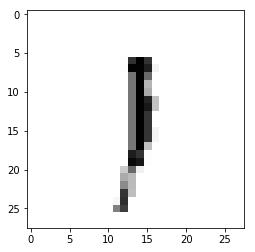

Epoch : 4 cost :  1.2126985497908167
Accuracy : 0.2168
label : [1]
Prediction : [0]


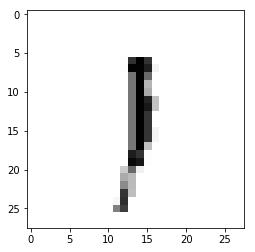

Epoch : 4 cost :  1.216814237941396
Accuracy : 0.2234
label : [1]
Prediction : [0]


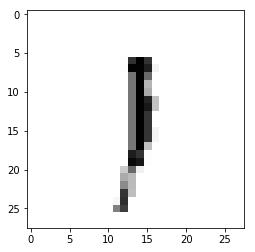

Epoch : 4 cost :  1.2209552812576303
Accuracy : 0.2092
label : [1]
Prediction : [0]


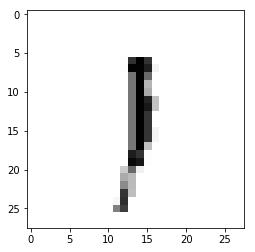

Epoch : 4 cost :  1.225061708797109
Accuracy : 0.2116
label : [1]
Prediction : [0]


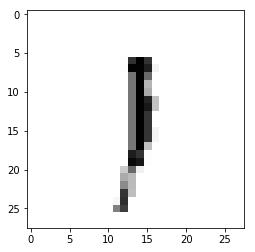

Epoch : 4 cost :  1.22918472333388
Accuracy : 0.216
label : [1]
Prediction : [0]


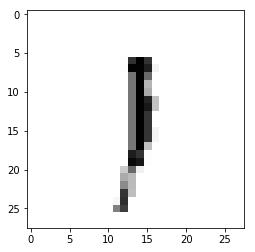

Epoch : 4 cost :  1.233321059400386
Accuracy : 0.2142
label : [1]
Prediction : [0]


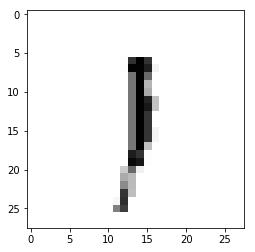

Epoch : 4 cost :  1.2374350690841684
Accuracy : 0.2215
label : [1]
Prediction : [0]


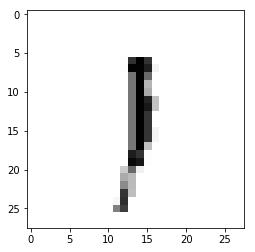

Epoch : 4 cost :  1.2415631706064407
Accuracy : 0.2233
label : [1]
Prediction : [0]


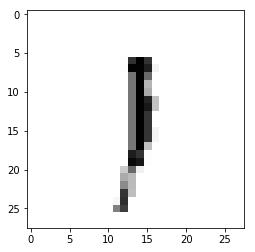

Epoch : 4 cost :  1.2456593444130648
Accuracy : 0.2238
label : [1]
Prediction : [0]


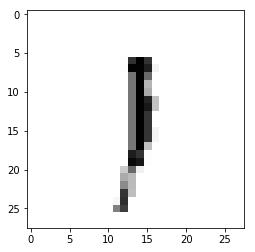

Epoch : 4 cost :  1.2497743021358154
Accuracy : 0.244
label : [1]
Prediction : [0]


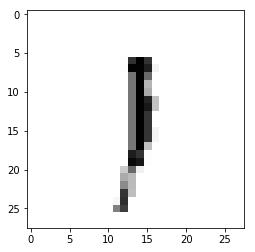

Epoch : 4 cost :  1.253886280493304
Accuracy : 0.228
label : [1]
Prediction : [0]


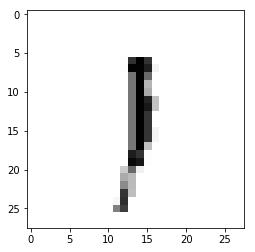

Epoch : 4 cost :  1.2579718303680432
Accuracy : 0.2169
label : [1]
Prediction : [0]


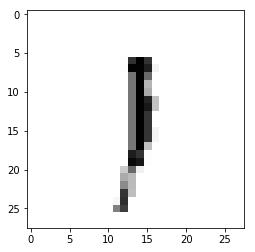

Epoch : 4 cost :  1.2621168509396652
Accuracy : 0.2077
label : [1]
Prediction : [0]


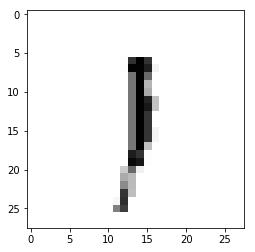

Epoch : 4 cost :  1.2662044954299938
Accuracy : 0.2256
label : [1]
Prediction : [0]


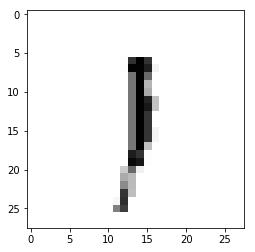

Epoch : 4 cost :  1.270329259525647
Accuracy : 0.2273
label : [1]
Prediction : [0]


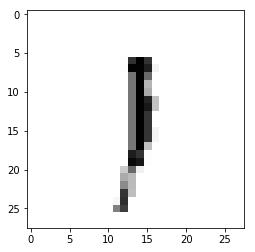

Epoch : 4 cost :  1.2744439142400579
Accuracy : 0.2435
label : [1]
Prediction : [0]


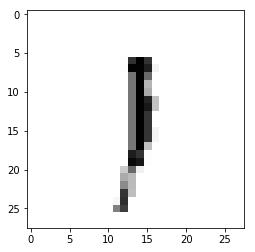

Epoch : 4 cost :  1.2785457823493274
Accuracy : 0.232
label : [1]
Prediction : [0]


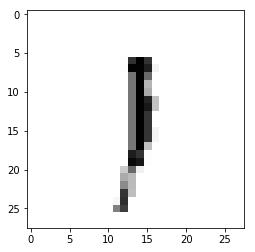

Epoch : 4 cost :  1.28265969623219
Accuracy : 0.2322
label : [1]
Prediction : [0]


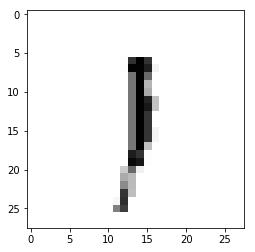

Epoch : 4 cost :  1.2867972850799572
Accuracy : 0.2456
label : [1]
Prediction : [0]


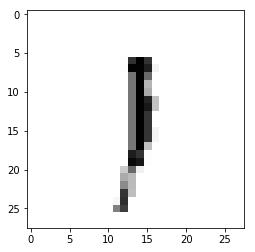

Epoch : 4 cost :  1.2909233179959394
Accuracy : 0.2326
label : [1]
Prediction : [0]


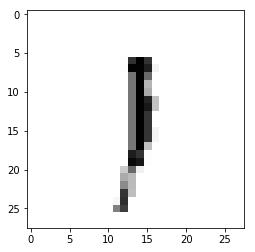

Epoch : 4 cost :  1.295036919333719
Accuracy : 0.2305
label : [1]
Prediction : [0]


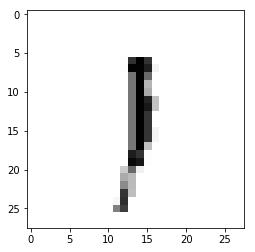

Epoch : 4 cost :  1.2991445957530638
Accuracy : 0.2324
label : [1]
Prediction : [0]


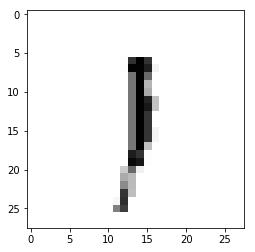

Epoch : 4 cost :  1.3032602795687598
Accuracy : 0.232
label : [1]
Prediction : [0]


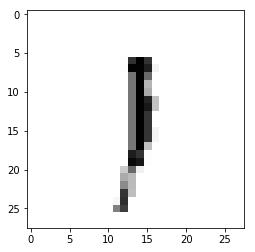

Epoch : 4 cost :  1.3073445927013059
Accuracy : 0.232
label : [1]
Prediction : [0]


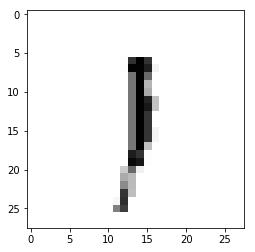

Epoch : 4 cost :  1.311438732580706
Accuracy : 0.2317
label : [1]
Prediction : [0]


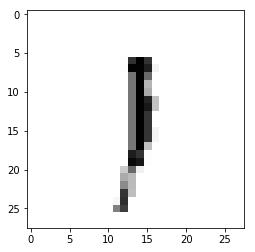

Epoch : 4 cost :  1.3155933094024668
Accuracy : 0.2323
label : [1]
Prediction : [0]


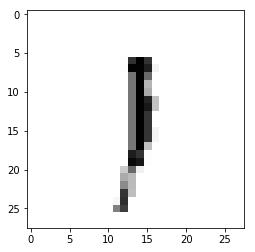

Epoch : 4 cost :  1.3196861839294443
Accuracy : 0.2324
label : [1]
Prediction : [0]


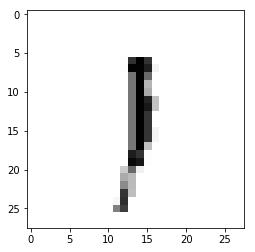

Epoch : 4 cost :  1.323775394179605
Accuracy : 0.2328
label : [1]
Prediction : [0]


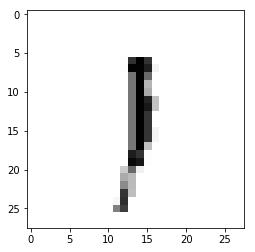

Epoch : 4 cost :  1.327835045294329
Accuracy : 0.2358
label : [1]
Prediction : [0]


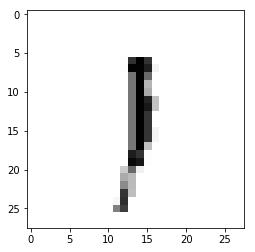

Epoch : 4 cost :  1.3319157483360993
Accuracy : 0.2494
label : [1]
Prediction : [0]


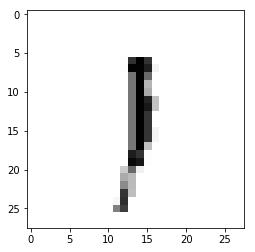

Epoch : 4 cost :  1.336017526279797
Accuracy : 0.2522
label : [1]
Prediction : [0]


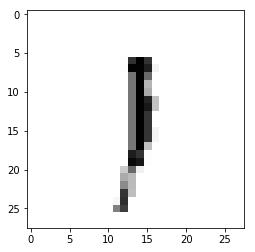

Epoch : 4 cost :  1.3401373078606353
Accuracy : 0.253
label : [1]
Prediction : [0]


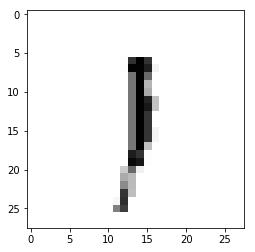

Epoch : 4 cost :  1.3442110217701313
Accuracy : 0.2532
label : [1]
Prediction : [0]


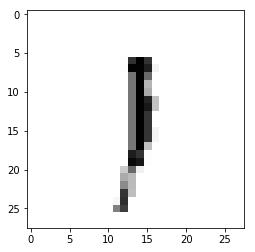

Epoch : 4 cost :  1.3483027748628105
Accuracy : 0.252
label : [1]
Prediction : [0]


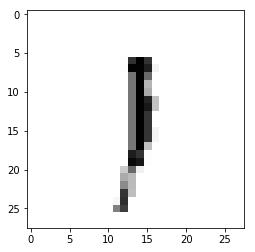

Epoch : 4 cost :  1.3523540865291257
Accuracy : 0.2523
label : [1]
Prediction : [0]


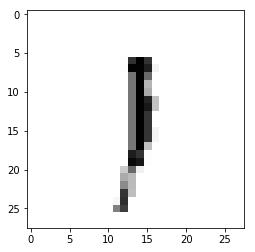

Epoch : 4 cost :  1.356459507075224
Accuracy : 0.2494
label : [1]
Prediction : [0]


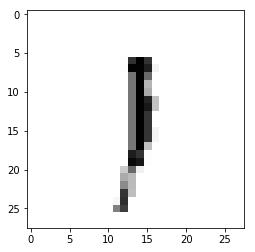

Epoch : 4 cost :  1.3605633215470756
Accuracy : 0.2487
label : [1]
Prediction : [0]


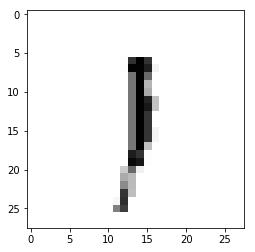

Epoch : 4 cost :  1.3646808476881556
Accuracy : 0.2477
label : [1]
Prediction : [0]


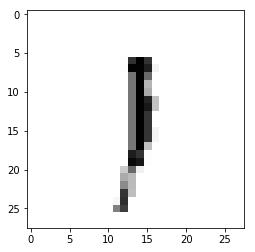

Epoch : 4 cost :  1.3688076569817291
Accuracy : 0.2522
label : [1]
Prediction : [0]


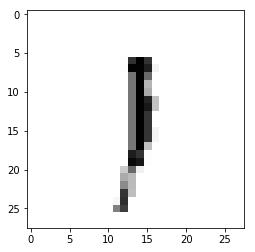

Epoch : 4 cost :  1.3729272859746768
Accuracy : 0.2535
label : [1]
Prediction : [0]


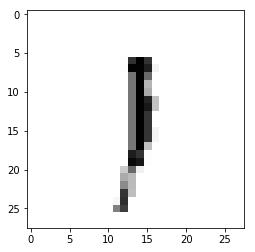

Epoch : 4 cost :  1.3770332006974662
Accuracy : 0.2535
label : [1]
Prediction : [0]


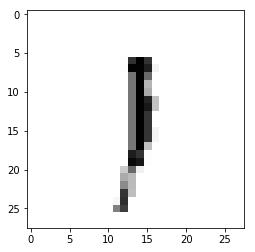

Epoch : 4 cost :  1.3811430025100715
Accuracy : 0.235
label : [1]
Prediction : [0]


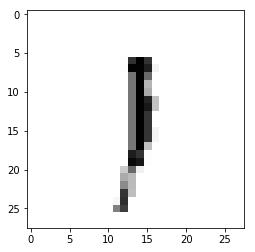

Epoch : 4 cost :  1.3852672594243838
Accuracy : 0.2384
label : [1]
Prediction : [0]


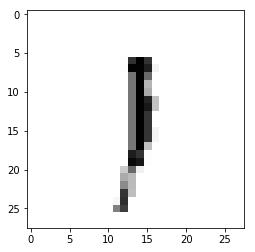

Epoch : 4 cost :  1.389333238168197
Accuracy : 0.2407
label : [1]
Prediction : [0]


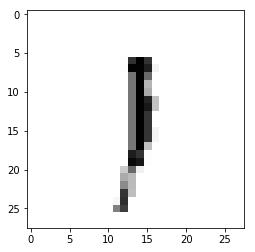

Epoch : 4 cost :  1.393435401049528
Accuracy : 0.2525
label : [1]
Prediction : [0]


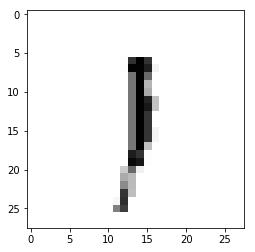

Epoch : 4 cost :  1.397531637278471
Accuracy : 0.2328
label : [1]
Prediction : [0]


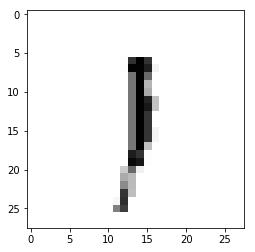

Epoch : 4 cost :  1.401614774790678
Accuracy : 0.2409
label : [1]
Prediction : [0]


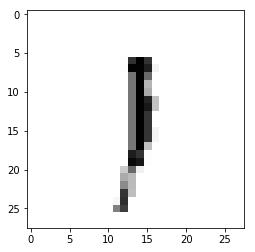

Epoch : 4 cost :  1.4057061581178154
Accuracy : 0.2439
label : [1]
Prediction : [0]


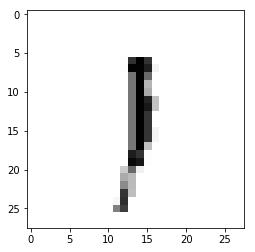

Epoch : 4 cost :  1.4098141418803831
Accuracy : 0.2444
label : [1]
Prediction : [0]


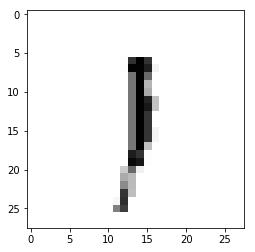

Epoch : 4 cost :  1.4139367420023148
Accuracy : 0.2435
label : [1]
Prediction : [0]


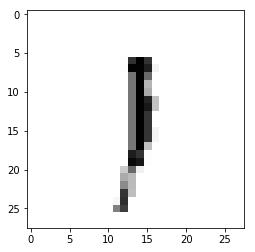

Epoch : 4 cost :  1.418039751919834
Accuracy : 0.2423
label : [1]
Prediction : [0]


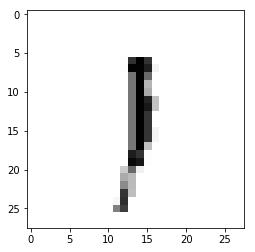

Epoch : 4 cost :  1.4221279348026632
Accuracy : 0.2418
label : [1]
Prediction : [0]


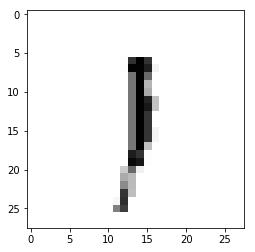

Epoch : 4 cost :  1.426206404946068
Accuracy : 0.2424
label : [1]
Prediction : [0]


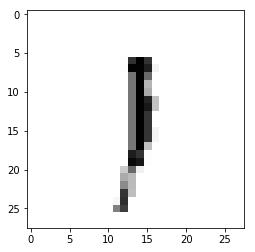

Epoch : 4 cost :  1.430327248139816
Accuracy : 0.2426
label : [1]
Prediction : [0]


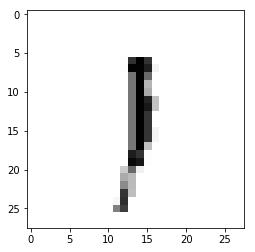

Epoch : 4 cost :  1.4344101376967007
Accuracy : 0.2299
label : [1]
Prediction : [0]


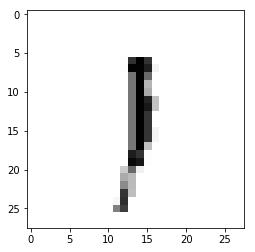

Epoch : 4 cost :  1.438554533178157
Accuracy : 0.2301
label : [1]
Prediction : [0]


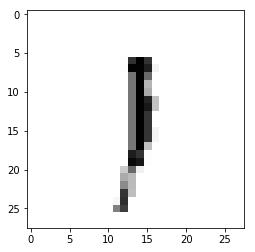

Epoch : 4 cost :  1.4426678627187566
Accuracy : 0.2262
label : [1]
Prediction : [0]


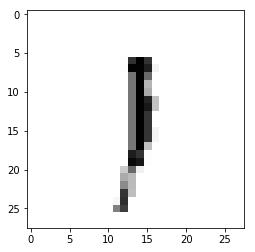

Epoch : 4 cost :  1.4468030075593439
Accuracy : 0.2236
label : [1]
Prediction : [0]


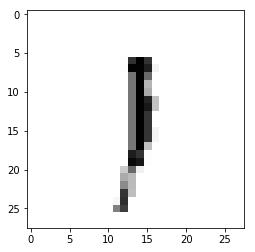

Epoch : 4 cost :  1.4509210122715355
Accuracy : 0.2262
label : [1]
Prediction : [0]


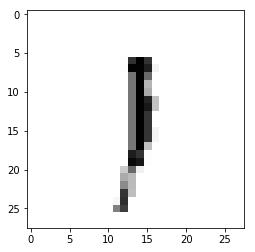

Epoch : 4 cost :  1.4550256737795755
Accuracy : 0.2273
label : [1]
Prediction : [0]


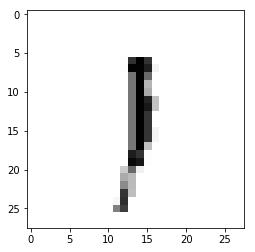

Epoch : 4 cost :  1.459143211191352
Accuracy : 0.2245
label : [1]
Prediction : [0]


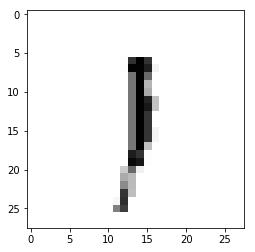

Epoch : 4 cost :  1.4632658052444472
Accuracy : 0.2274
label : [1]
Prediction : [0]


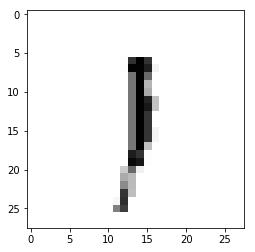

Epoch : 4 cost :  1.4673857389796878
Accuracy : 0.2295
label : [1]
Prediction : [0]


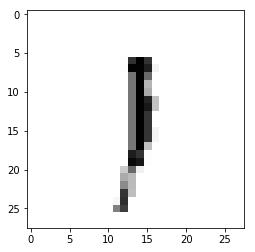

Epoch : 4 cost :  1.47146633538333
Accuracy : 0.227
label : [1]
Prediction : [0]


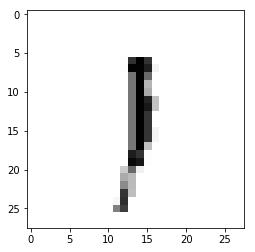

Epoch : 4 cost :  1.4755594322898185
Accuracy : 0.203
label : [1]
Prediction : [0]


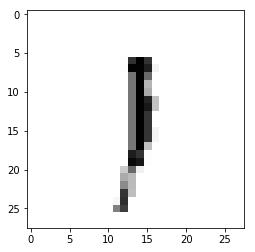

Epoch : 4 cost :  1.4796620299599401
Accuracy : 0.204
label : [1]
Prediction : [0]


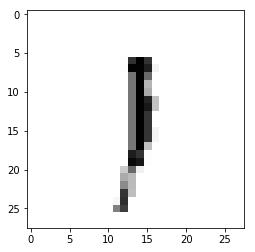

Epoch : 4 cost :  1.483766035166655
Accuracy : 0.2285
label : [1]
Prediction : [0]


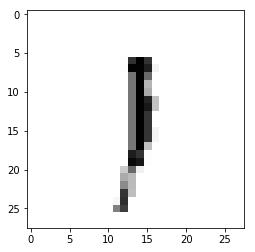

Epoch : 4 cost :  1.487862081094223
Accuracy : 0.2029
label : [1]
Prediction : [0]


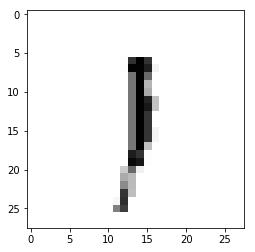

Epoch : 4 cost :  1.491958290880378
Accuracy : 0.2067
label : [1]
Prediction : [0]


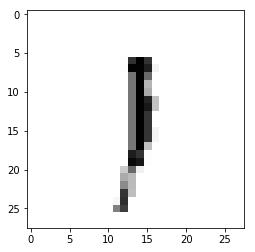

Epoch : 4 cost :  1.4959980643879296
Accuracy : 0.2035
label : [1]
Prediction : [0]


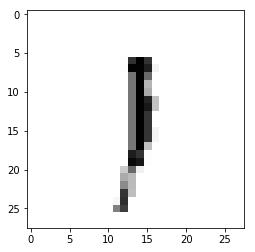

Epoch : 4 cost :  1.5001257129149015
Accuracy : 0.2045
label : [1]
Prediction : [0]


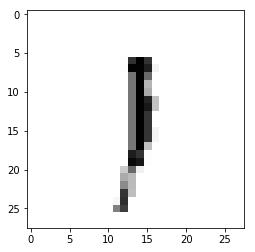

Epoch : 4 cost :  1.504210246259517
Accuracy : 0.223
label : [1]
Prediction : [0]


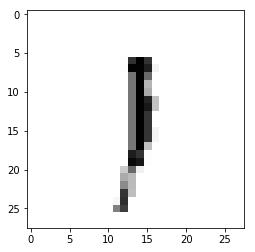

Epoch : 4 cost :  1.5083118603446277
Accuracy : 0.2281
label : [1]
Prediction : [0]


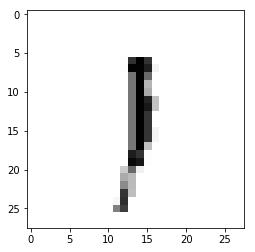

Epoch : 4 cost :  1.5123614098808993
Accuracy : 0.2247
label : [1]
Prediction : [0]


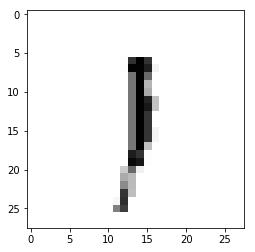

Epoch : 4 cost :  1.5164735312895352
Accuracy : 0.2055
label : [1]
Prediction : [0]


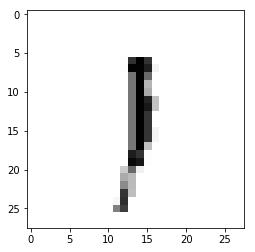

Epoch : 4 cost :  1.5205472005497336
Accuracy : 0.2066
label : [1]
Prediction : [0]


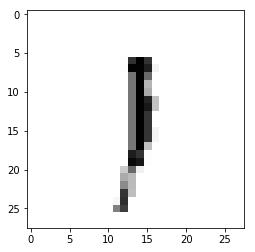

Epoch : 4 cost :  1.5246453974463734
Accuracy : 0.2039
label : [1]
Prediction : [0]


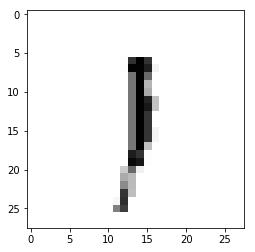

Epoch : 4 cost :  1.5287498963962913
Accuracy : 0.204
label : [1]
Prediction : [0]


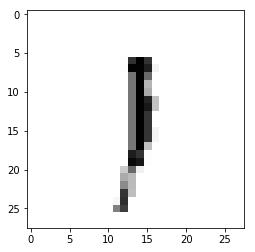

Epoch : 4 cost :  1.532855007431725
Accuracy : 0.2234
label : [1]
Prediction : [0]


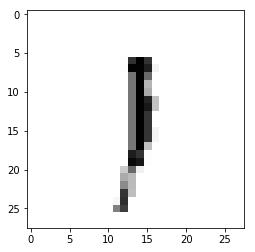

Epoch : 4 cost :  1.5369457916779965
Accuracy : 0.2278
label : [1]
Prediction : [0]


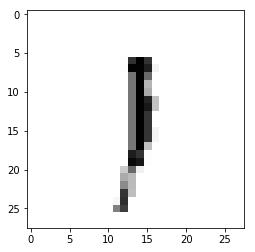

Epoch : 4 cost :  1.5410741949081435
Accuracy : 0.2234
label : [1]
Prediction : [0]


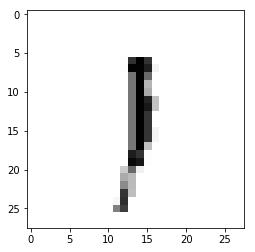

Epoch : 4 cost :  1.54517144506628
Accuracy : 0.2218
label : [1]
Prediction : [0]


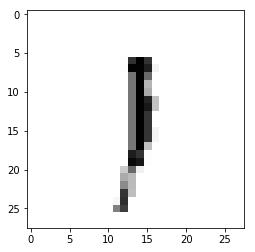

Epoch : 4 cost :  1.5492797279357924
Accuracy : 0.2225
label : [1]
Prediction : [0]


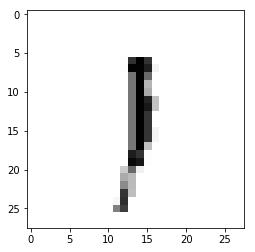

Epoch : 4 cost :  1.55336668404666
Accuracy : 0.2183
label : [1]
Prediction : [0]


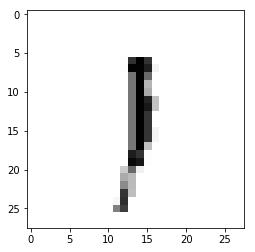

Epoch : 4 cost :  1.5575016277486642
Accuracy : 0.2234
label : [1]
Prediction : [0]


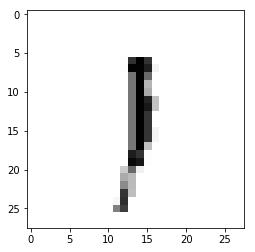

Epoch : 4 cost :  1.5615939989956957
Accuracy : 0.2184
label : [1]
Prediction : [0]


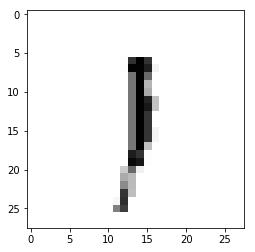

Epoch : 4 cost :  1.5656863117218032
Accuracy : 0.2287
label : [1]
Prediction : [0]


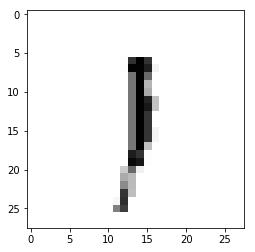

Epoch : 4 cost :  1.569762276736174
Accuracy : 0.2436
label : [1]
Prediction : [0]


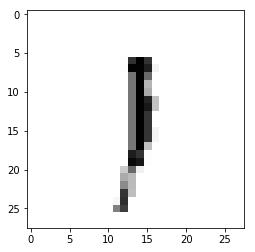

Epoch : 4 cost :  1.5738527792150336
Accuracy : 0.2425
label : [1]
Prediction : [0]


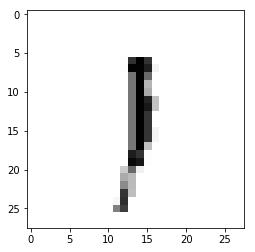

Epoch : 4 cost :  1.5779528110677559
Accuracy : 0.2299
label : [1]
Prediction : [0]


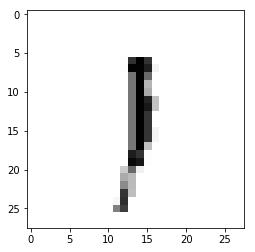

Epoch : 4 cost :  1.5820869233391515
Accuracy : 0.2227
label : [1]
Prediction : [0]


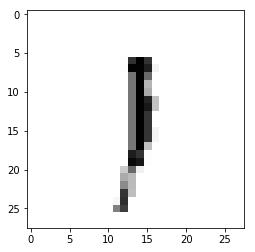

Epoch : 4 cost :  1.5861948117342874
Accuracy : 0.2055
label : [1]
Prediction : [0]


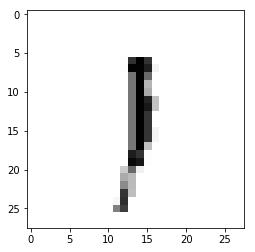

Epoch : 4 cost :  1.5902763462066662
Accuracy : 0.2038
label : [1]
Prediction : [0]


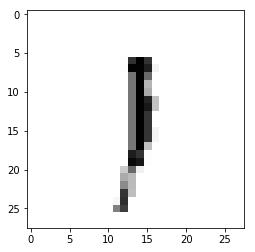

Epoch : 4 cost :  1.5943581377376221
Accuracy : 0.2043
label : [1]
Prediction : [0]


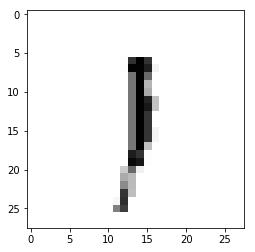

Epoch : 4 cost :  1.5984357283332142
Accuracy : 0.2053
label : [1]
Prediction : [0]


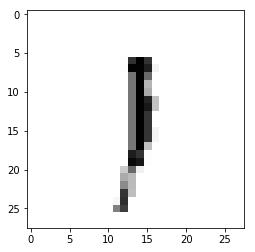

Epoch : 4 cost :  1.6025379367308195
Accuracy : 0.2053
label : [1]
Prediction : [0]


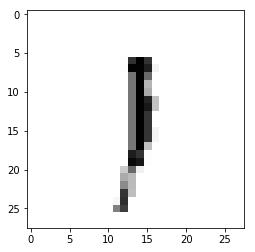

Epoch : 4 cost :  1.6066208462281673
Accuracy : 0.2009
label : [1]
Prediction : [0]


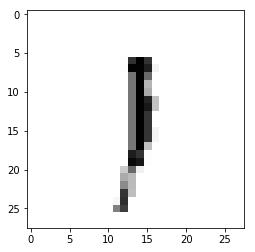

Epoch : 4 cost :  1.6107065144452193
Accuracy : 0.2094
label : [1]
Prediction : [0]


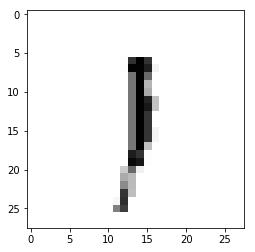

Epoch : 4 cost :  1.6147838336771196
Accuracy : 0.2091
label : [1]
Prediction : [0]


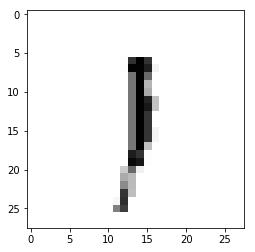

Epoch : 4 cost :  1.6188613354076051
Accuracy : 0.2231
label : [1]
Prediction : [0]


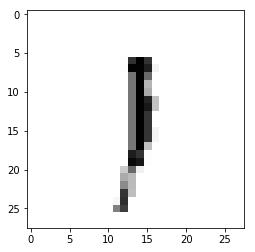

Epoch : 4 cost :  1.6229275634072056
Accuracy : 0.2049
label : [1]
Prediction : [0]


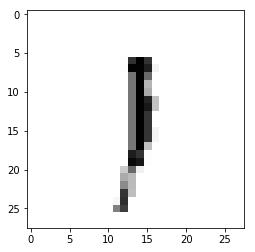

Epoch : 4 cost :  1.6270574279264982
Accuracy : 0.2008
label : [1]
Prediction : [0]


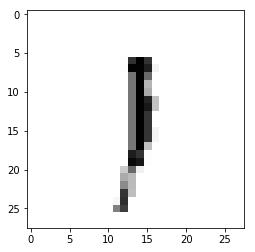

Epoch : 4 cost :  1.6311170105500667
Accuracy : 0.2023
label : [1]
Prediction : [0]


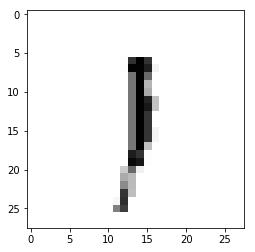

Epoch : 4 cost :  1.635160188674928
Accuracy : 0.2169
label : [1]
Prediction : [0]


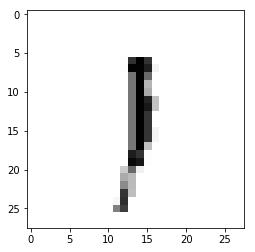

Epoch : 4 cost :  1.6392357470772496
Accuracy : 0.2193
label : [1]
Prediction : [0]


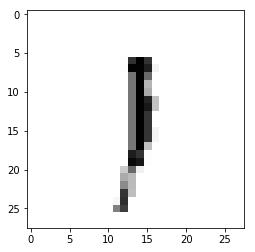

Epoch : 4 cost :  1.6433215756849822
Accuracy : 0.2397
label : [1]
Prediction : [0]


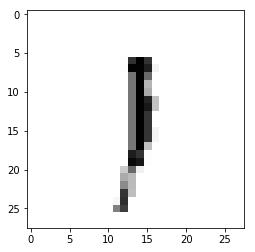

Epoch : 4 cost :  1.6473986161838892
Accuracy : 0.2424
label : [1]
Prediction : [0]


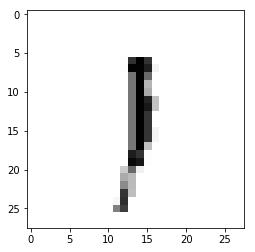

Epoch : 4 cost :  1.6514787236127
Accuracy : 0.2453
label : [1]
Prediction : [0]


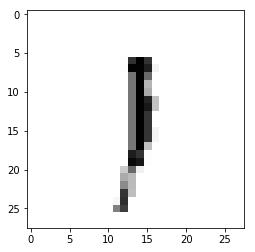

Epoch : 4 cost :  1.655589036074553
Accuracy : 0.2467
label : [1]
Prediction : [0]


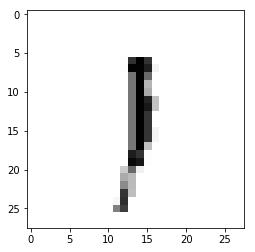

Epoch : 4 cost :  1.6596713391217333
Accuracy : 0.2473
label : [1]
Prediction : [0]


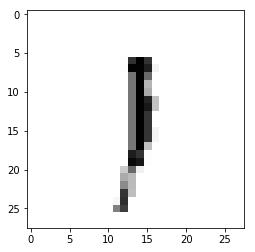

Epoch : 4 cost :  1.6638002200560151
Accuracy : 0.2488
label : [1]
Prediction : [0]


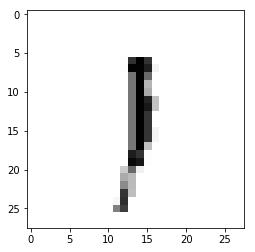

Epoch : 4 cost :  1.6678826154362087
Accuracy : 0.2486
label : [1]
Prediction : [0]


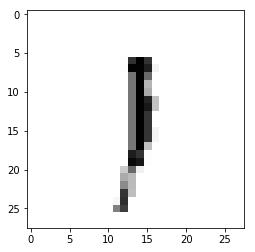

Epoch : 4 cost :  1.6719702989404868
Accuracy : 0.2453
label : [1]
Prediction : [0]


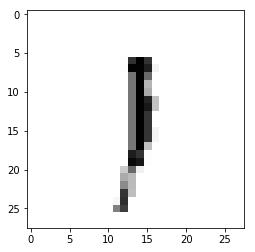

Epoch : 4 cost :  1.676010471257298
Accuracy : 0.2434
label : [1]
Prediction : [0]


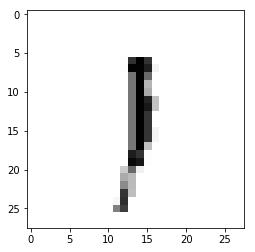

Epoch : 4 cost :  1.6800968178835798
Accuracy : 0.2405
label : [1]
Prediction : [0]


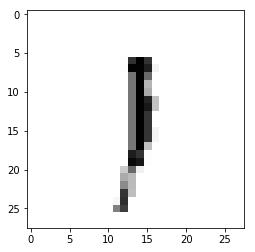

Epoch : 4 cost :  1.6841886008869533
Accuracy : 0.2395
label : [1]
Prediction : [0]


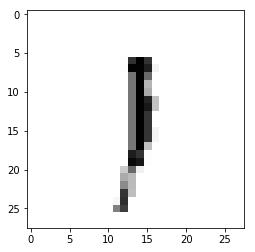

Epoch : 4 cost :  1.6882800839164056
Accuracy : 0.2255
label : [1]
Prediction : [0]


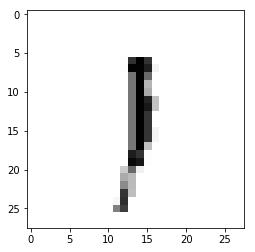

Epoch : 4 cost :  1.6923820820721729
Accuracy : 0.2215
label : [1]
Prediction : [0]


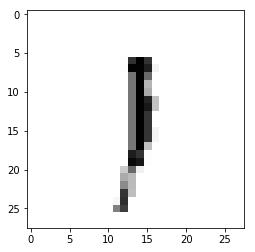

Epoch : 4 cost :  1.696502554199914
Accuracy : 0.2185
label : [1]
Prediction : [0]


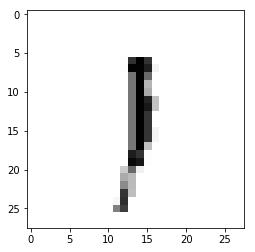

Epoch : 4 cost :  1.7006330008940278
Accuracy : 0.2156
label : [1]
Prediction : [0]


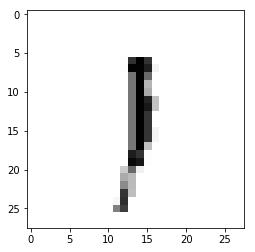

Epoch : 4 cost :  1.7046921834078717
Accuracy : 0.2162
label : [1]
Prediction : [0]


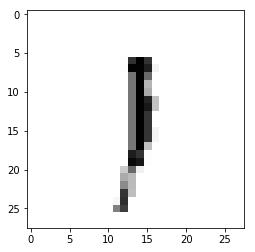

Epoch : 4 cost :  1.7088012348521855
Accuracy : 0.214
label : [1]
Prediction : [0]


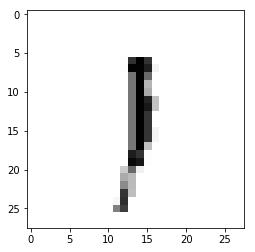

Epoch : 4 cost :  1.7128767984563669
Accuracy : 0.2153
label : [1]
Prediction : [0]


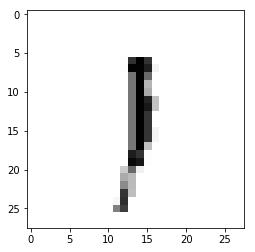

Epoch : 4 cost :  1.7169793753190488
Accuracy : 0.2168
label : [1]
Prediction : [0]


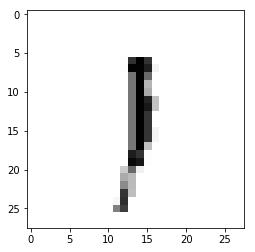

Epoch : 4 cost :  1.721080737113954
Accuracy : 0.2165
label : [1]
Prediction : [0]


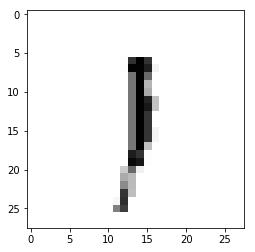

Epoch : 4 cost :  1.7251426523382027
Accuracy : 0.2152
label : [1]
Prediction : [0]


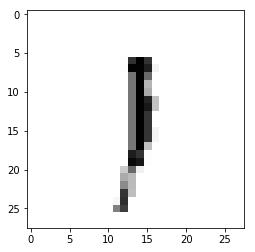

Epoch : 4 cost :  1.7292315695502556
Accuracy : 0.2171
label : [1]
Prediction : [0]


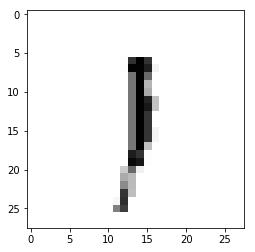

Epoch : 4 cost :  1.7333224014802426
Accuracy : 0.2167
label : [1]
Prediction : [0]


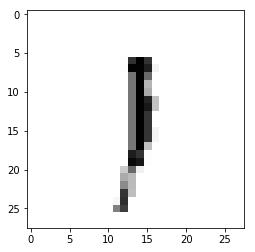

Epoch : 4 cost :  1.7374142742156997
Accuracy : 0.2173
label : [1]
Prediction : [0]


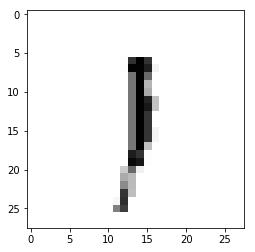

Epoch : 4 cost :  1.7414952412518603
Accuracy : 0.2164
label : [1]
Prediction : [0]


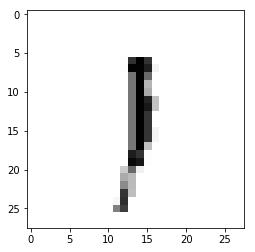

Epoch : 4 cost :  1.7455611376328917
Accuracy : 0.2183
label : [1]
Prediction : [0]


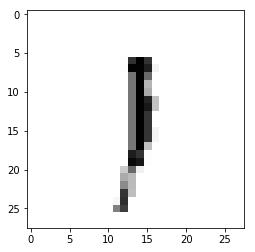

Epoch : 4 cost :  1.7496164608001723
Accuracy : 0.2195
label : [1]
Prediction : [0]


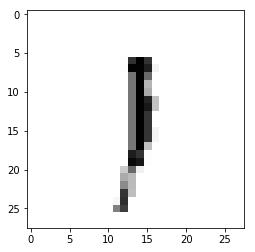

Epoch : 4 cost :  1.7537137274308652
Accuracy : 0.219
label : [1]
Prediction : [0]


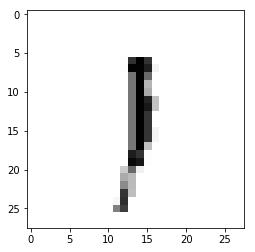

Epoch : 4 cost :  1.7577975013039342
Accuracy : 0.2208
label : [1]
Prediction : [0]


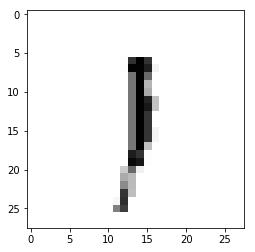

Epoch : 4 cost :  1.761908023574137
Accuracy : 0.22
label : [1]
Prediction : [0]


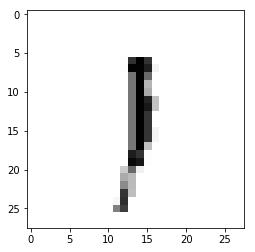

Epoch : 4 cost :  1.766019214716826
Accuracy : 0.2202
label : [1]
Prediction : [0]


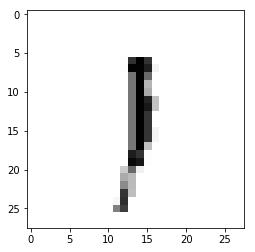

Epoch : 4 cost :  1.7700949499823846
Accuracy : 0.2227
label : [1]
Prediction : [0]


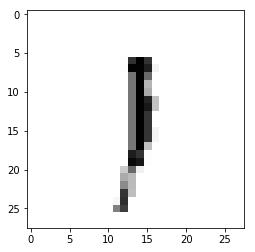

Epoch : 4 cost :  1.7741592220826599
Accuracy : 0.2217
label : [1]
Prediction : [0]


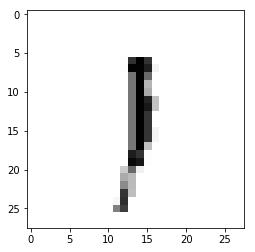

Epoch : 4 cost :  1.7782494202527148
Accuracy : 0.2207
label : [1]
Prediction : [0]


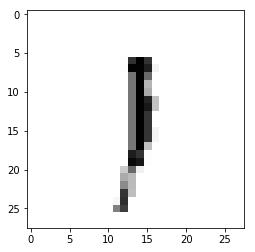

Epoch : 4 cost :  1.782312859188428
Accuracy : 0.2208
label : [1]
Prediction : [0]


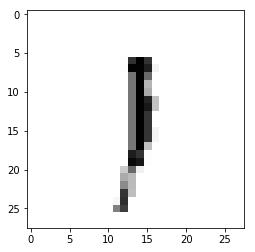

Epoch : 4 cost :  1.7863639311356994
Accuracy : 0.2204
label : [1]
Prediction : [0]


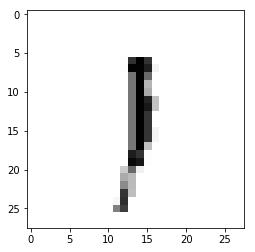

Epoch : 4 cost :  1.7904257678985611
Accuracy : 0.2205
label : [1]
Prediction : [0]


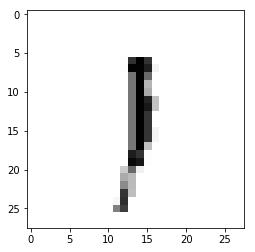

Epoch : 4 cost :  1.7944895874370244
Accuracy : 0.2215
label : [1]
Prediction : [0]


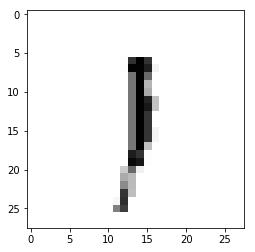

Epoch : 4 cost :  1.7985760359330627
Accuracy : 0.2219
label : [1]
Prediction : [0]


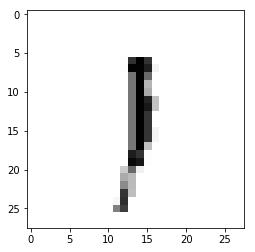

Epoch : 4 cost :  1.802628234083004
Accuracy : 0.2234
label : [1]
Prediction : [0]


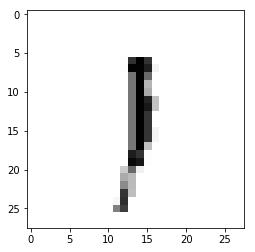

Epoch : 4 cost :  1.8067482796582326
Accuracy : 0.2256
label : [1]
Prediction : [0]


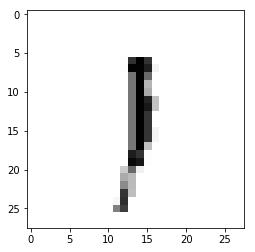

Epoch : 4 cost :  1.8108541466973063
Accuracy : 0.2427
label : [1]
Prediction : [0]


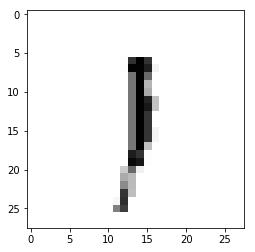

Epoch : 4 cost :  1.8149452907388879
Accuracy : 0.2245
label : [1]
Prediction : [0]


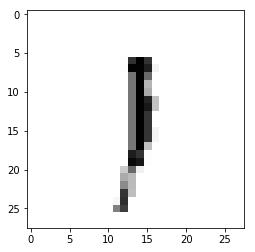

Epoch : 4 cost :  1.8190335325761293
Accuracy : 0.2231
label : [1]
Prediction : [0]


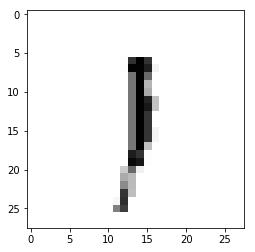

Epoch : 4 cost :  1.8230449347062563
Accuracy : 0.2221
label : [1]
Prediction : [0]


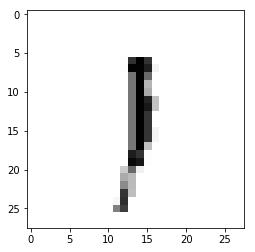

Epoch : 4 cost :  1.8270972178199092
Accuracy : 0.2214
label : [1]
Prediction : [0]


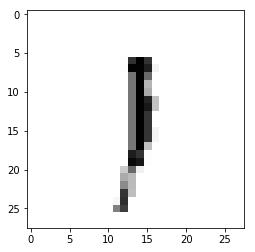

Epoch : 4 cost :  1.8311852082339217
Accuracy : 0.2206
label : [1]
Prediction : [0]


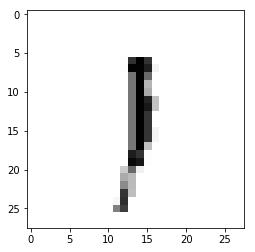

Epoch : 4 cost :  1.8352405708486401
Accuracy : 0.2183
label : [1]
Prediction : [0]


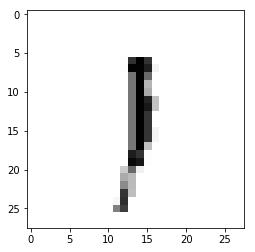

Epoch : 4 cost :  1.8393279123306292
Accuracy : 0.2189
label : [1]
Prediction : [0]


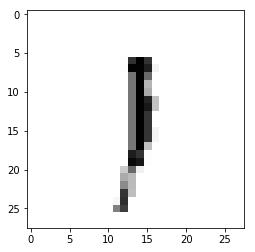

Epoch : 4 cost :  1.8434351010756076
Accuracy : 0.231
label : [1]
Prediction : [0]


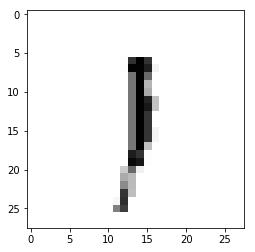

Epoch : 4 cost :  1.8475033647363852
Accuracy : 0.232
label : [1]
Prediction : [0]


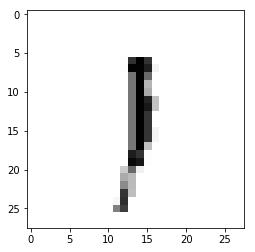

Epoch : 4 cost :  1.8515580909902416
Accuracy : 0.2333
label : [1]
Prediction : [0]


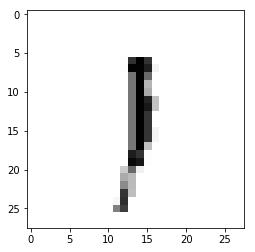

Epoch : 4 cost :  1.8556706623597596
Accuracy : 0.2322
label : [1]
Prediction : [0]


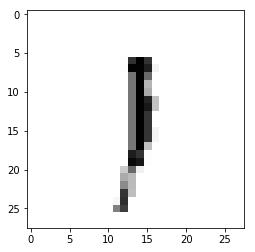

Epoch : 4 cost :  1.8597295223582893
Accuracy : 0.233
label : [1]
Prediction : [0]


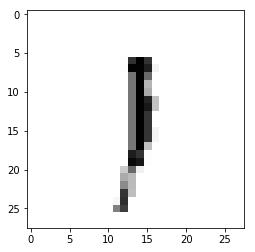

Epoch : 4 cost :  1.863806989843197
Accuracy : 0.2304
label : [1]
Prediction : [0]


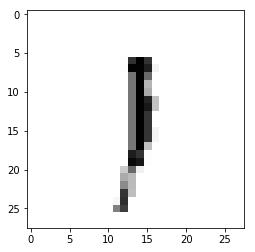

Epoch : 4 cost :  1.867851481437685
Accuracy : 0.2262
label : [1]
Prediction : [0]


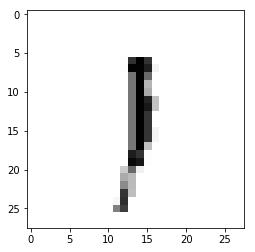

Epoch : 4 cost :  1.8719094358791024
Accuracy : 0.2324
label : [1]
Prediction : [0]


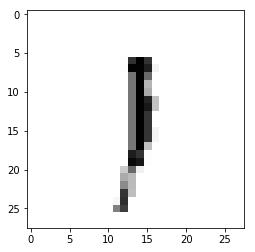

Epoch : 4 cost :  1.8760599387775787
Accuracy : 0.2352
label : [1]
Prediction : [0]


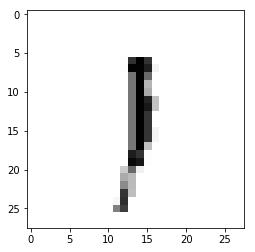

Epoch : 4 cost :  1.88011691613631
Accuracy : 0.2363
label : [1]
Prediction : [0]


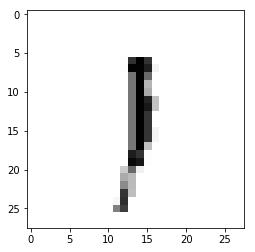

Epoch : 4 cost :  1.8842179081656736
Accuracy : 0.2343
label : [1]
Prediction : [0]


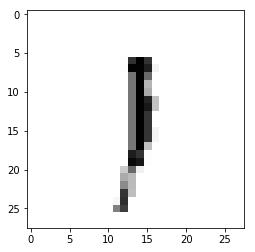

Epoch : 4 cost :  1.888294428912078
Accuracy : 0.2355
label : [1]
Prediction : [0]


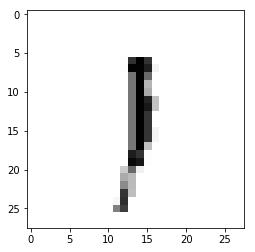

Epoch : 4 cost :  1.8923792327534088
Accuracy : 0.2358
label : [1]
Prediction : [0]


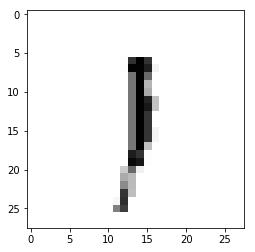

Epoch : 4 cost :  1.8964461773092116
Accuracy : 0.2371
label : [1]
Prediction : [0]


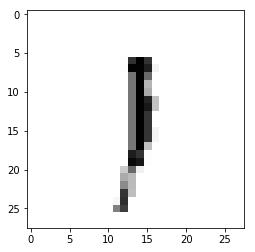

Epoch : 4 cost :  1.9005254745483418
Accuracy : 0.2395
label : [1]
Prediction : [0]


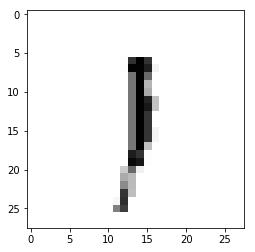

Epoch : 4 cost :  1.9046254361759551
Accuracy : 0.2365
label : [1]
Prediction : [0]


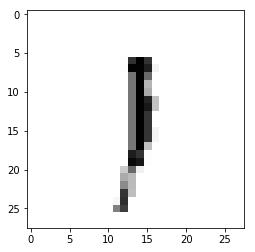

Epoch : 4 cost :  1.908725335814738
Accuracy : 0.2349
label : [1]
Prediction : [0]


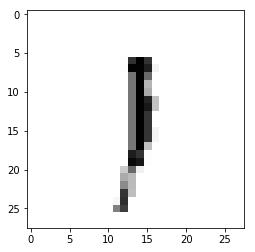

Epoch : 4 cost :  1.9128271740133131
Accuracy : 0.2285
label : [1]
Prediction : [0]


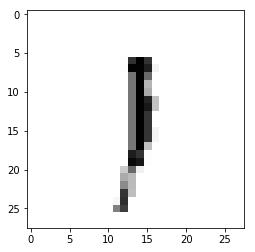

Epoch : 4 cost :  1.916929628198799
Accuracy : 0.2326
label : [1]
Prediction : [0]


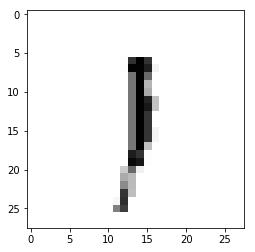

Epoch : 4 cost :  1.920998679074376
Accuracy : 0.2312
label : [1]
Prediction : [0]


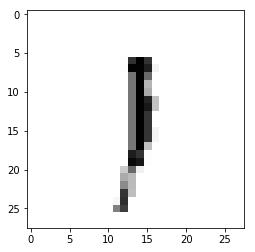

Epoch : 4 cost :  1.9250831365585346
Accuracy : 0.2224
label : [1]
Prediction : [0]


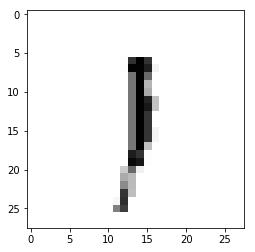

Epoch : 4 cost :  1.929193162051116
Accuracy : 0.2238
label : [1]
Prediction : [0]


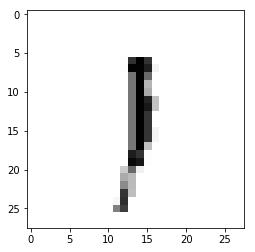

Epoch : 4 cost :  1.9332467863776486
Accuracy : 0.2209
label : [1]
Prediction : [0]


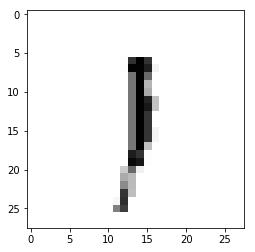

Epoch : 4 cost :  1.9372690937735837
Accuracy : 0.2208
label : [1]
Prediction : [0]


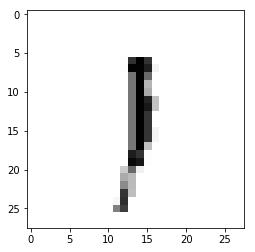

Epoch : 4 cost :  1.941364530650054
Accuracy : 0.2097
label : [1]
Prediction : [0]


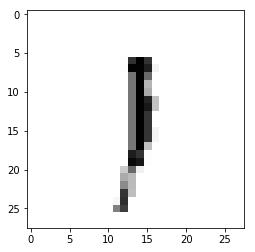

Epoch : 4 cost :  1.9454242840680227
Accuracy : 0.2074
label : [1]
Prediction : [0]


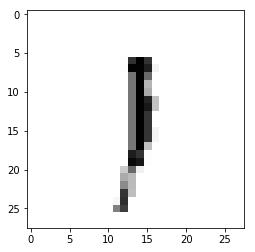

Epoch : 4 cost :  1.9495027637481708
Accuracy : 0.2044
label : [1]
Prediction : [0]


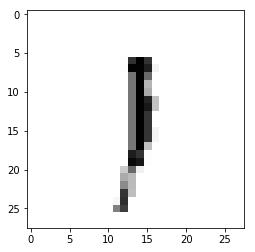

Epoch : 4 cost :  1.953585611256688
Accuracy : 0.2045
label : [1]
Prediction : [0]


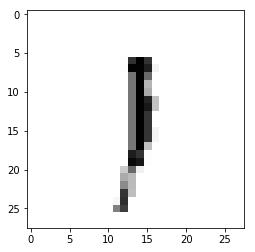

Epoch : 4 cost :  1.957653977654199
Accuracy : 0.2029
label : [1]
Prediction : [0]


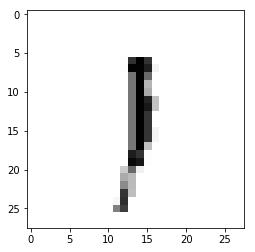

Epoch : 4 cost :  1.961730867732657
Accuracy : 0.2039
label : [1]
Prediction : [0]


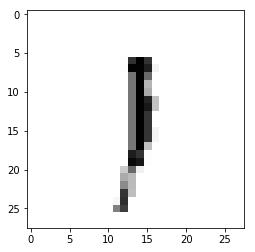

Epoch : 4 cost :  1.9658042803677667
Accuracy : 0.2146
label : [1]
Prediction : [0]


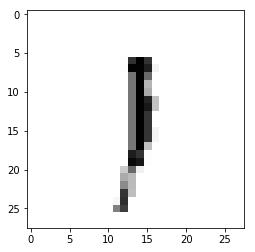

Epoch : 4 cost :  1.9698752702366242
Accuracy : 0.2176
label : [1]
Prediction : [0]


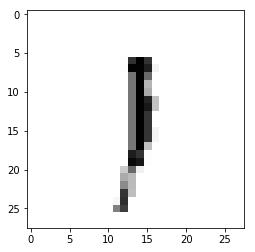

Epoch : 4 cost :  1.9738822087374621
Accuracy : 0.2313
label : [1]
Prediction : [0]


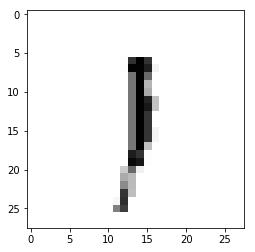

Epoch : 4 cost :  1.977949779250407
Accuracy : 0.2337
label : [1]
Prediction : [0]


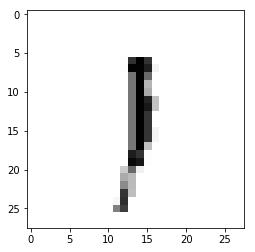

Epoch : 4 cost :  1.9820052519711602
Accuracy : 0.232
label : [1]
Prediction : [0]


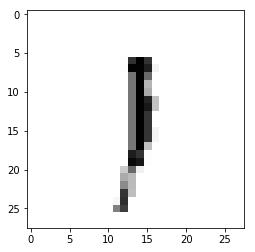

Epoch : 4 cost :  1.9860449474508133
Accuracy : 0.2368
label : [1]
Prediction : [0]


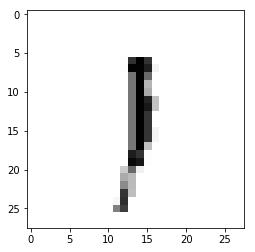

Epoch : 4 cost :  1.9901473764939763
Accuracy : 0.2381
label : [1]
Prediction : [0]


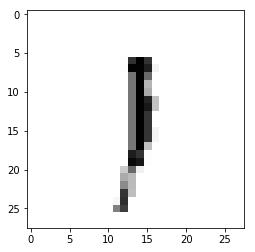

Epoch : 4 cost :  1.9942329259352272
Accuracy : 0.2383
label : [1]
Prediction : [0]


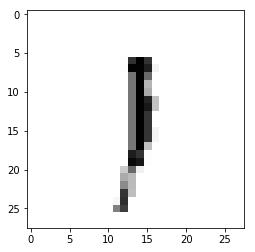

Epoch : 4 cost :  1.9983111052079656
Accuracy : 0.239
label : [1]
Prediction : [0]


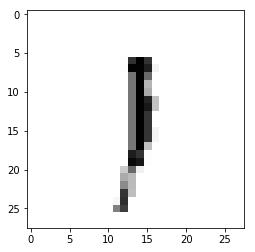

Epoch : 4 cost :  2.0023966308073584
Accuracy : 0.2404
label : [1]
Prediction : [0]


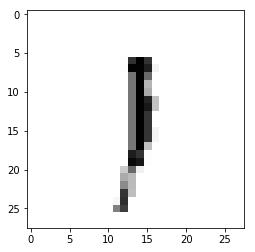

Epoch : 4 cost :  2.0064553954384565
Accuracy : 0.2399
label : [1]
Prediction : [0]


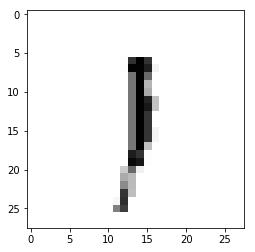

Epoch : 4 cost :  2.010516228242356
Accuracy : 0.2399
label : [1]
Prediction : [0]


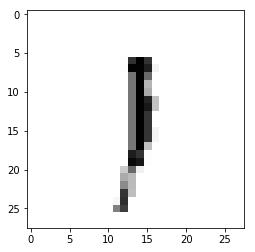

Epoch : 4 cost :  2.0145701005242107
Accuracy : 0.2405
label : [1]
Prediction : [0]


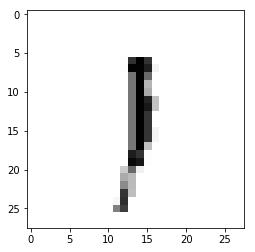

Epoch : 4 cost :  2.0186593337492527
Accuracy : 0.2395
label : [1]
Prediction : [0]


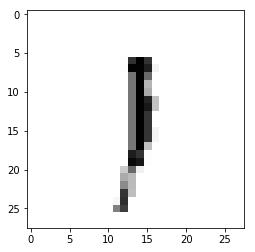

Epoch : 4 cost :  2.0227728939056413
Accuracy : 0.2344
label : [1]
Prediction : [0]


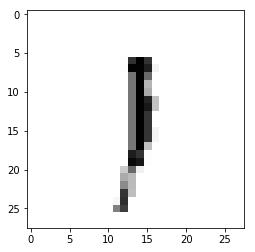

Epoch : 4 cost :  2.0268329026482337
Accuracy : 0.24
label : [1]
Prediction : [0]


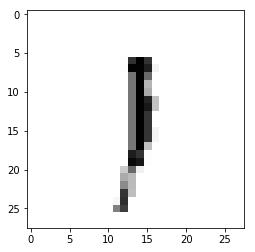

Epoch : 4 cost :  2.030877322717148
Accuracy : 0.2418
label : [1]
Prediction : [0]


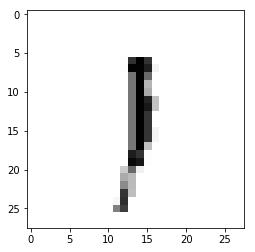

Epoch : 4 cost :  2.0349556953256793
Accuracy : 0.2423
label : [1]
Prediction : [0]


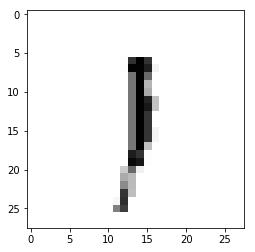

Epoch : 4 cost :  2.039017279364847
Accuracy : 0.2428
label : [1]
Prediction : [0]


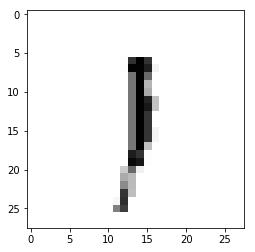

Epoch : 4 cost :  2.043068323135377
Accuracy : 0.2438
label : [1]
Prediction : [0]


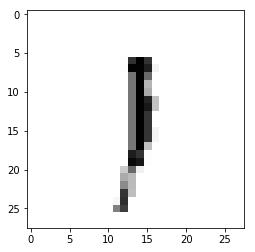

Epoch : 4 cost :  2.0471507276188254
Accuracy : 0.2444
label : [1]
Prediction : [0]


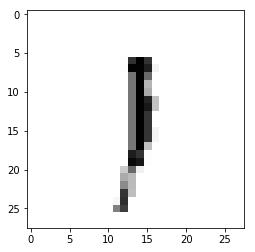

Epoch : 4 cost :  2.0511800609935427
Accuracy : 0.2482
label : [1]
Prediction : [0]


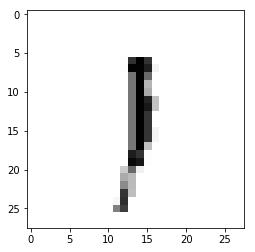

Epoch : 4 cost :  2.055229777856308
Accuracy : 0.2505
label : [1]
Prediction : [0]


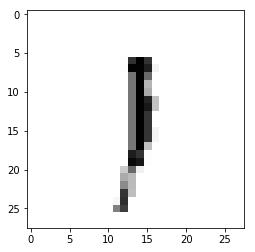

Epoch : 4 cost :  2.0593151270259527
Accuracy : 0.2501
label : [1]
Prediction : [0]


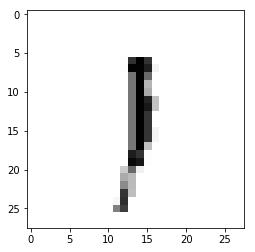

Epoch : 4 cost :  2.0633495720950057
Accuracy : 0.251
label : [1]
Prediction : [0]


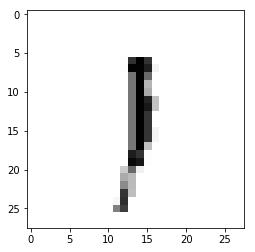

Epoch : 4 cost :  2.06745879433372
Accuracy : 0.25
label : [1]
Prediction : [0]


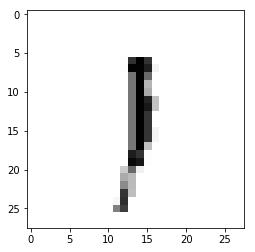

Epoch : 4 cost :  2.071545952450147
Accuracy : 0.2494
label : [1]
Prediction : [0]


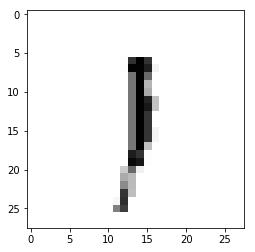

Epoch : 4 cost :  2.075600040609188
Accuracy : 0.2483
label : [1]
Prediction : [0]


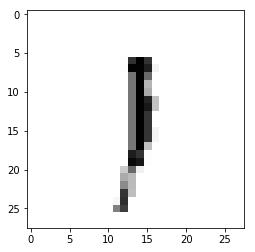

Epoch : 4 cost :  2.0796570938283763
Accuracy : 0.2492
label : [1]
Prediction : [0]


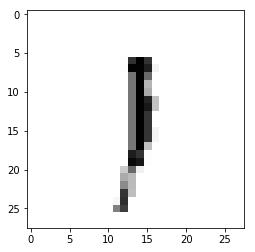

Epoch : 4 cost :  2.083687889792704
Accuracy : 0.2475
label : [1]
Prediction : [0]


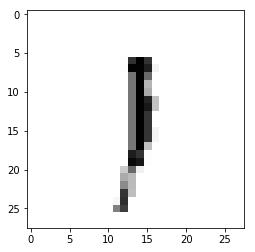

Epoch : 4 cost :  2.0877635067159495
Accuracy : 0.2482
label : [1]
Prediction : [0]


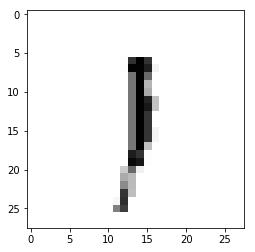

Epoch : 4 cost :  2.0918875343149375
Accuracy : 0.2483
label : [1]
Prediction : [0]


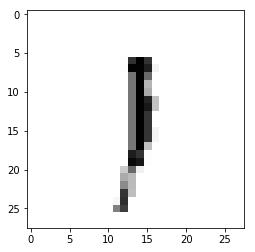

Epoch : 4 cost :  2.0959616730429924
Accuracy : 0.2489
label : [1]
Prediction : [0]


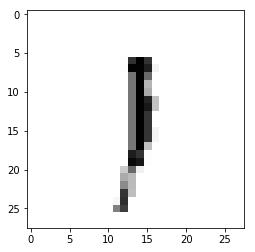

Epoch : 4 cost :  2.1000605002316575
Accuracy : 0.2499
label : [1]
Prediction : [0]


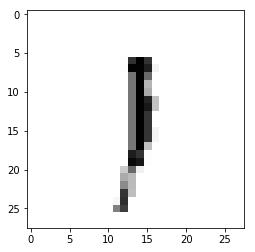

Epoch : 4 cost :  2.1041305390271288
Accuracy : 0.25
label : [1]
Prediction : [0]


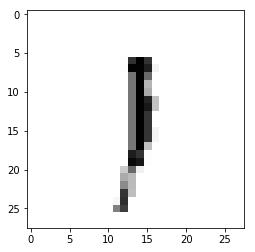

Epoch : 4 cost :  2.10820780884136
Accuracy : 0.2485
label : [1]
Prediction : [0]


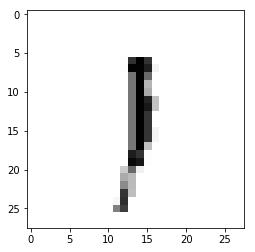

Epoch : 4 cost :  2.1122696404023618
Accuracy : 0.2497
label : [1]
Prediction : [0]


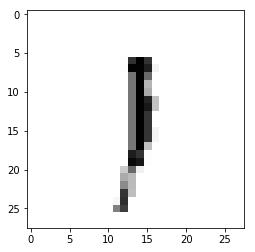

Epoch : 4 cost :  2.116306989409708
Accuracy : 0.2475
label : [1]
Prediction : [0]


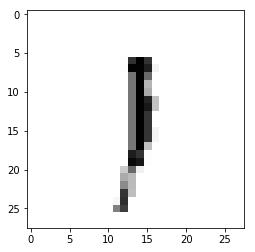

Epoch : 4 cost :  2.1203437631780466
Accuracy : 0.2496
label : [1]
Prediction : [0]


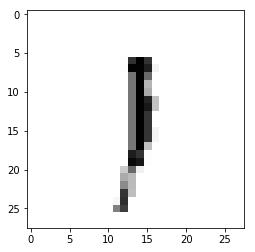

Epoch : 4 cost :  2.124445363391531
Accuracy : 0.2499
label : [1]
Prediction : [0]


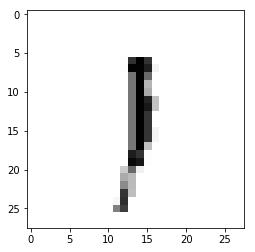

Epoch : 4 cost :  2.128502614714884
Accuracy : 0.25
label : [1]
Prediction : [0]


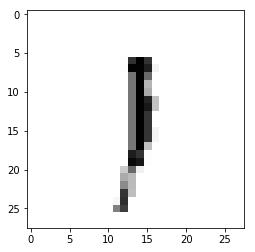

Epoch : 4 cost :  2.1325126587260868
Accuracy : 0.2507
label : [1]
Prediction : [0]


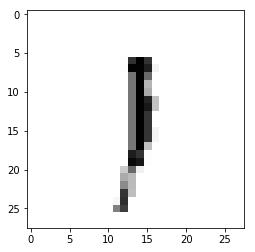

Epoch : 4 cost :  2.1365490991419027
Accuracy : 0.2512
label : [1]
Prediction : [0]


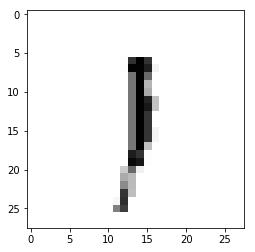

Epoch : 4 cost :  2.140654344125229
Accuracy : 0.2547
label : [1]
Prediction : [0]


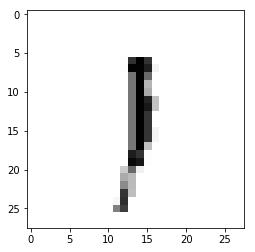

Epoch : 4 cost :  2.1446915548497993
Accuracy : 0.2524
label : [1]
Prediction : [0]


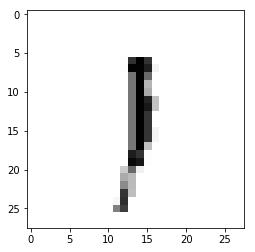

Epoch : 4 cost :  2.1487446997382436
Accuracy : 0.2532
label : [1]
Prediction : [0]


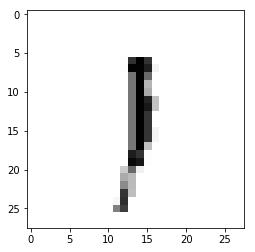

Epoch : 4 cost :  2.1527463197708143
Accuracy : 0.2509
label : [1]
Prediction : [0]


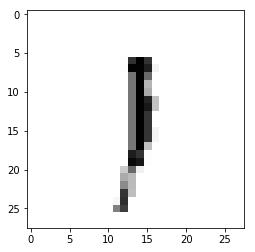

Epoch : 4 cost :  2.1568216427889753
Accuracy : 0.2518
label : [1]
Prediction : [0]


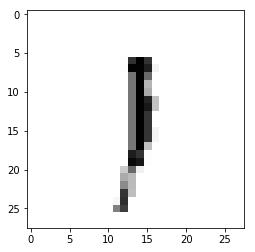

Epoch : 4 cost :  2.160860720114276
Accuracy : 0.251
label : [1]
Prediction : [0]


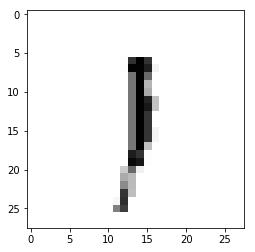

Epoch : 4 cost :  2.164918591325935
Accuracy : 0.2474
label : [1]
Prediction : [0]


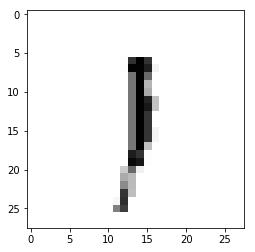

Epoch : 4 cost :  2.168956467021597
Accuracy : 0.2479
label : [1]
Prediction : [0]


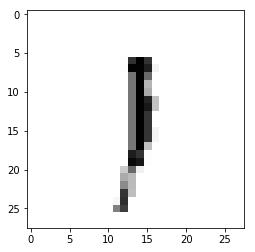

Epoch : 4 cost :  2.1730805379694176
Accuracy : 0.2489
label : [1]
Prediction : [0]


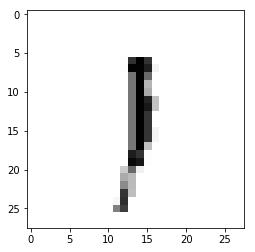

Epoch : 4 cost :  2.17718852823431
Accuracy : 0.2494
label : [1]
Prediction : [0]


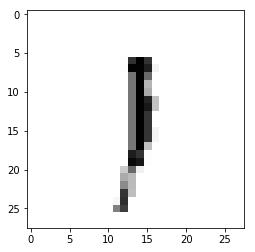

Epoch : 4 cost :  2.181251584399832
Accuracy : 0.2505
label : [1]
Prediction : [0]


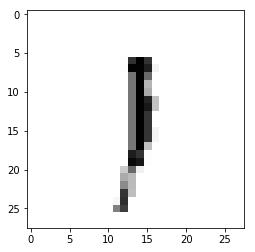

Epoch : 4 cost :  2.1852738419446096
Accuracy : 0.25
label : [1]
Prediction : [0]


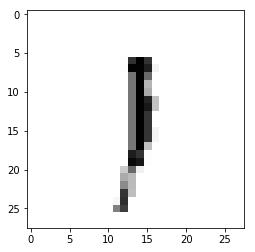

Epoch : 4 cost :  2.1893858046965184
Accuracy : 0.251
label : [1]
Prediction : [0]


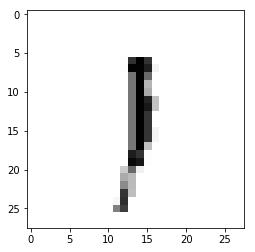

Epoch : 4 cost :  2.193507445075297
Accuracy : 0.2514
label : [1]
Prediction : [0]


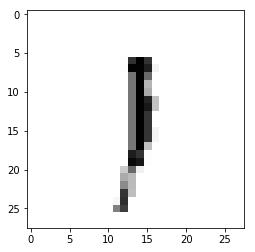

Epoch : 4 cost :  2.1975908205725947
Accuracy : 0.2496
label : [1]
Prediction : [0]


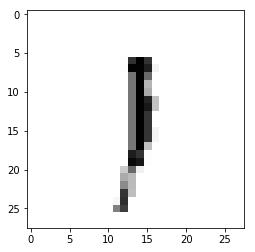

Epoch : 4 cost :  2.2016647005081196
Accuracy : 0.2505
label : [1]
Prediction : [0]


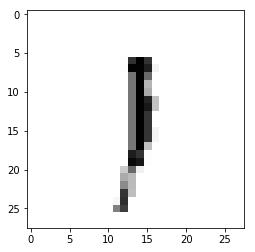

Epoch : 4 cost :  2.2057007399472344
Accuracy : 0.252
label : [1]
Prediction : [0]


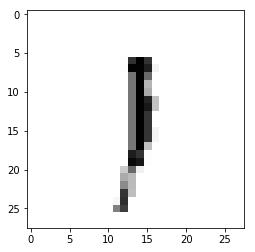

Epoch : 4 cost :  2.209740438461306
Accuracy : 0.2517
label : [1]
Prediction : [0]


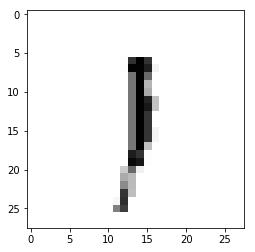

Epoch : 4 cost :  2.2138203785636232
Accuracy : 0.2459
label : [1]
Prediction : [0]


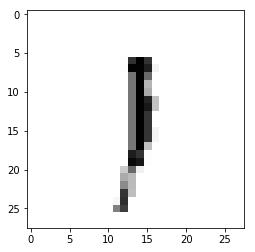

Epoch : 4 cost :  2.2179049517891647
Accuracy : 0.2495
label : [1]
Prediction : [0]


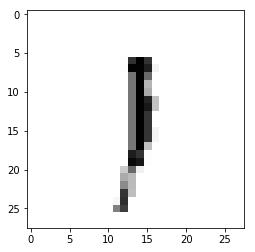

Epoch : 4 cost :  2.2219995741410714
Accuracy : 0.2454
label : [1]
Prediction : [0]


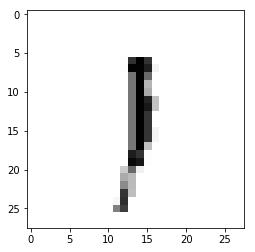

Epoch : 4 cost :  2.225997708927504
Accuracy : 0.2502
label : [1]
Prediction : [0]


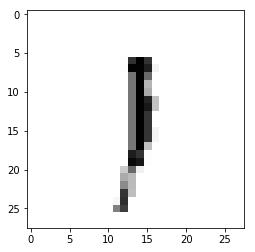

Epoch : 4 cost :  2.230093487826263
Accuracy : 0.2508
label : [1]
Prediction : [0]


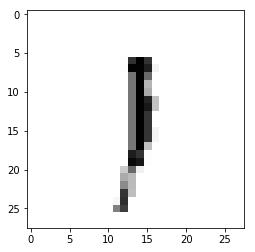

Epoch : 4 cost :  2.23419156117873
Accuracy : 0.2537
label : [1]
Prediction : [0]


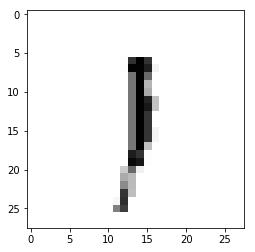

Epoch : 4 cost :  2.2382640825618423
Accuracy : 0.2557
label : [1]
Prediction : [0]


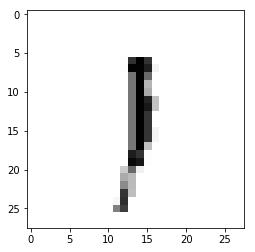

Epoch : 4 cost :  2.2423460995067277
Accuracy : 0.2545
label : [1]
Prediction : [0]


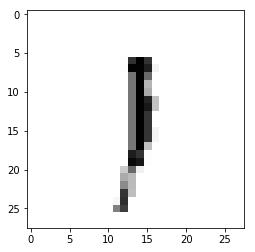

Epoch : 4 cost :  2.246411082961345
Accuracy : 0.253
label : [1]
Prediction : [0]


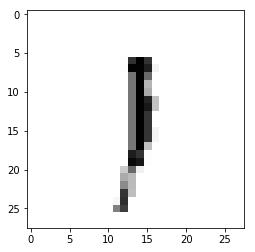

Epoch : 4 cost :  2.250463986396792
Accuracy : 0.2527
label : [1]
Prediction : [0]


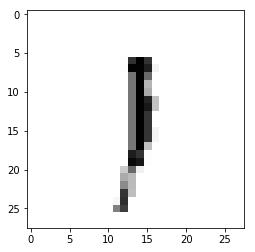

Epoch : 4 cost :  2.2544821531122405
Accuracy : 0.2548
label : [1]
Prediction : [0]


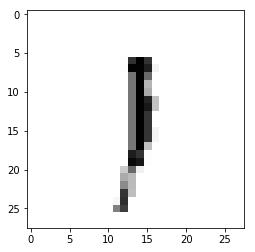

Epoch : 4 cost :  2.258539367589086
Accuracy : 0.2535
label : [1]
Prediction : [0]


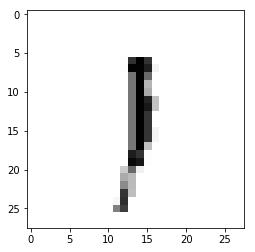

Epoch : 5 cost :  0.0040604604374278675
Accuracy : 0.2528
label : [1]
Prediction : [0]


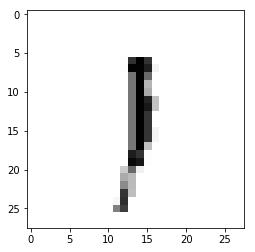

Epoch : 5 cost :  0.008129653497175737
Accuracy : 0.2494
label : [1]
Prediction : [0]


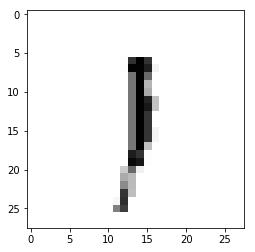

Epoch : 5 cost :  0.012158941355618564
Accuracy : 0.2455
label : [1]
Prediction : [0]


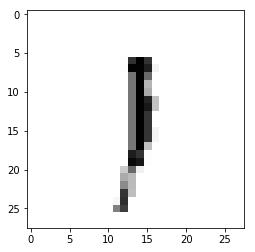

Epoch : 5 cost :  0.01623267433860085
Accuracy : 0.2457
label : [1]
Prediction : [0]


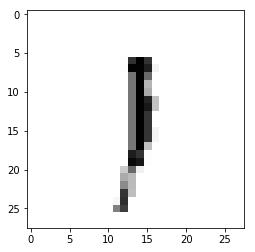

Epoch : 5 cost :  0.020261461518027567
Accuracy : 0.2434
label : [1]
Prediction : [0]


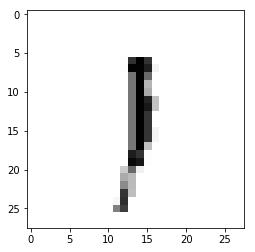

Epoch : 5 cost :  0.02436431191184304
Accuracy : 0.2432
label : [1]
Prediction : [0]


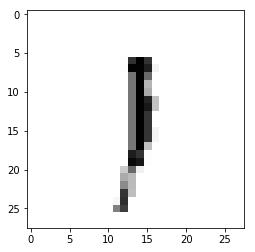

Epoch : 5 cost :  0.028439883318814366
Accuracy : 0.2439
label : [1]
Prediction : [0]


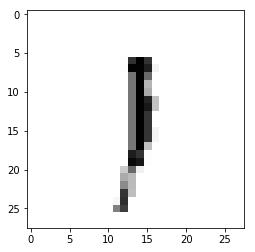

Epoch : 5 cost :  0.03244256192987616
Accuracy : 0.2493
label : [1]
Prediction : [0]


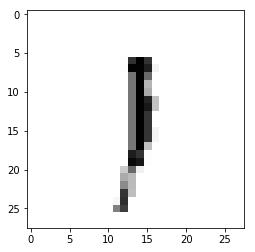

Epoch : 5 cost :  0.03646886348724365
Accuracy : 0.2479
label : [1]
Prediction : [0]


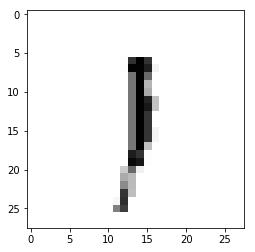

Epoch : 5 cost :  0.040522884022105826
Accuracy : 0.242
label : [1]
Prediction : [0]


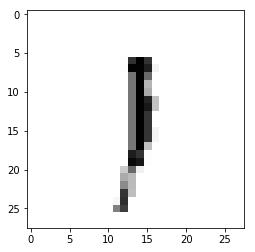

Epoch : 5 cost :  0.04456296573985707
Accuracy : 0.2433
label : [1]
Prediction : [0]


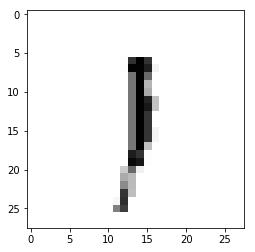

Epoch : 5 cost :  0.048514304594560104
Accuracy : 0.2427
label : [1]
Prediction : [0]


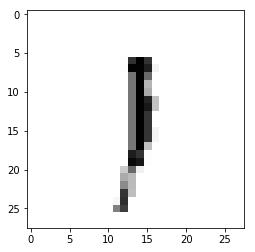

Epoch : 5 cost :  0.05257477716966109
Accuracy : 0.2416
label : [1]
Prediction : [0]


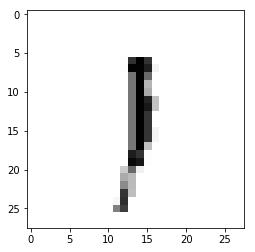

Epoch : 5 cost :  0.056647724238308994
Accuracy : 0.2455
label : [1]
Prediction : [0]


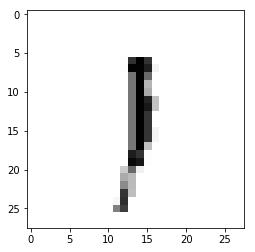

Epoch : 5 cost :  0.06071787790818648
Accuracy : 0.2462
label : [1]
Prediction : [0]


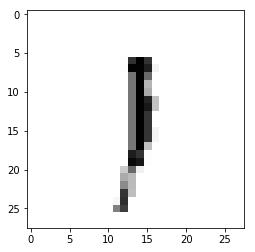

Epoch : 5 cost :  0.06475390737706965
Accuracy : 0.2473
label : [1]
Prediction : [0]


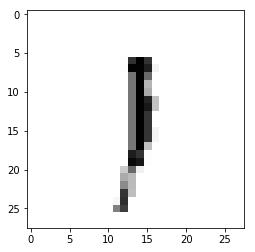

Epoch : 5 cost :  0.06882020256736063
Accuracy : 0.2455
label : [1]
Prediction : [0]


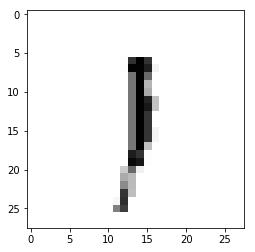

Epoch : 5 cost :  0.07285393584858288
Accuracy : 0.2511
label : [1]
Prediction : [0]


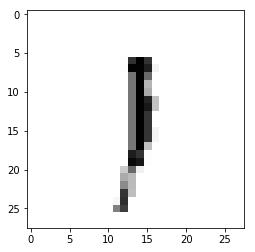

Epoch : 5 cost :  0.07692768226970326
Accuracy : 0.2492
label : [1]
Prediction : [0]


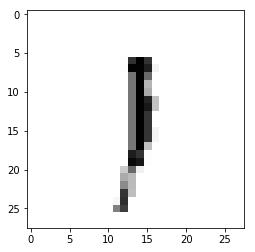

Epoch : 5 cost :  0.08098523530093106
Accuracy : 0.253
label : [1]
Prediction : [0]


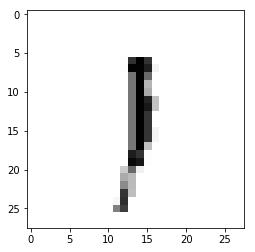

Epoch : 5 cost :  0.08500689203088933
Accuracy : 0.2526
label : [1]
Prediction : [0]


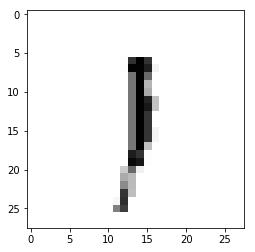

Epoch : 5 cost :  0.08910239002921364
Accuracy : 0.2549
label : [1]
Prediction : [0]


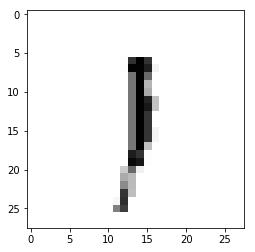

Epoch : 5 cost :  0.09312717090953479
Accuracy : 0.2552
label : [1]
Prediction : [0]


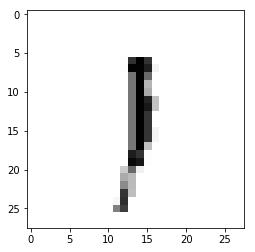

Epoch : 5 cost :  0.09719386317513205
Accuracy : 0.2565
label : [1]
Prediction : [0]


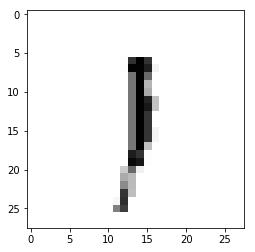

Epoch : 5 cost :  0.1012686690417203
Accuracy : 0.2558
label : [1]
Prediction : [0]


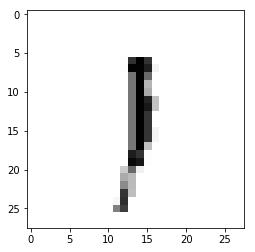

Epoch : 5 cost :  0.10530570853840221
Accuracy : 0.2551
label : [1]
Prediction : [0]


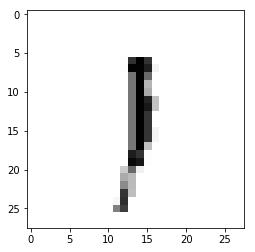

Epoch : 5 cost :  0.1093062786622481
Accuracy : 0.2504
label : [1]
Prediction : [0]


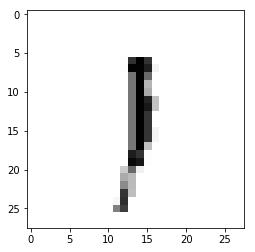

Epoch : 5 cost :  0.11335806673223323
Accuracy : 0.2494
label : [1]
Prediction : [0]


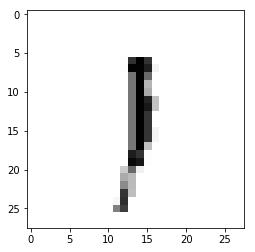

Epoch : 5 cost :  0.1173820261521773
Accuracy : 0.2522
label : [1]
Prediction : [0]


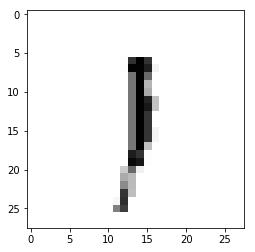

Epoch : 5 cost :  0.12152260520241479
Accuracy : 0.2585
label : [1]
Prediction : [0]


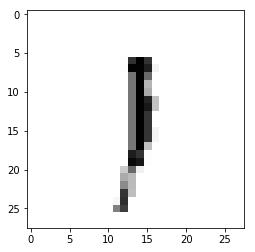

Epoch : 5 cost :  0.12558509783311325
Accuracy : 0.2531
label : [1]
Prediction : [0]


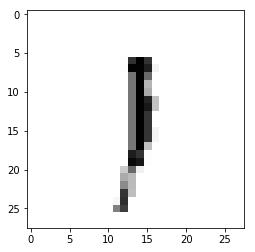

Epoch : 5 cost :  0.12960372144525703
Accuracy : 0.2507
label : [1]
Prediction : [0]


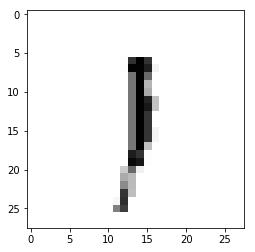

Epoch : 5 cost :  0.13369450612501665
Accuracy : 0.2556
label : [1]
Prediction : [0]


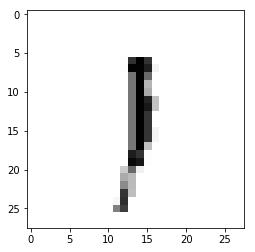

Epoch : 5 cost :  0.1377204331484708
Accuracy : 0.2539
label : [1]
Prediction : [0]


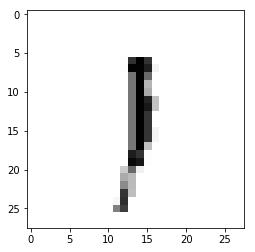

Epoch : 5 cost :  0.1417517532001842
Accuracy : 0.2541
label : [1]
Prediction : [0]


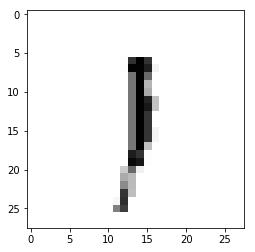

Epoch : 5 cost :  0.1458559088273482
Accuracy : 0.2558
label : [1]
Prediction : [0]


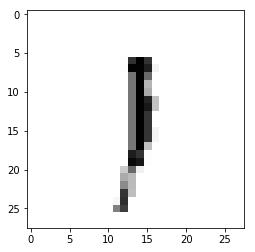

Epoch : 5 cost :  0.1499477529525757
Accuracy : 0.2544
label : [1]
Prediction : [0]


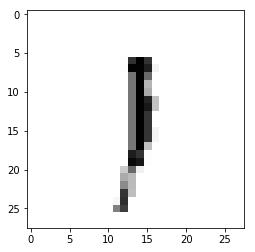

Epoch : 5 cost :  0.15398549643429846
Accuracy : 0.2554
label : [1]
Prediction : [0]


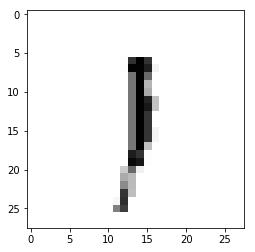

Epoch : 5 cost :  0.15802325898950753
Accuracy : 0.251
label : [1]
Prediction : [0]


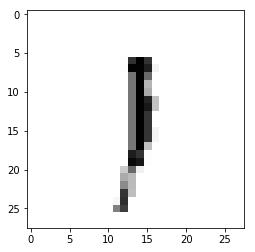

Epoch : 5 cost :  0.1620506251942028
Accuracy : 0.2507
label : [1]
Prediction : [0]


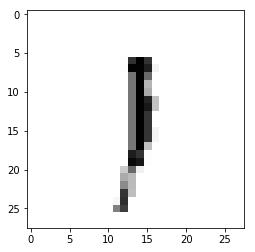

Epoch : 5 cost :  0.16608201287009502
Accuracy : 0.2515
label : [1]
Prediction : [0]


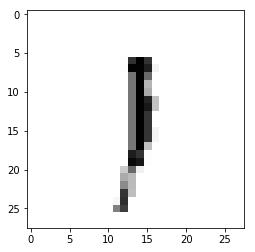

Epoch : 5 cost :  0.1700878966938366
Accuracy : 0.2532
label : [1]
Prediction : [0]


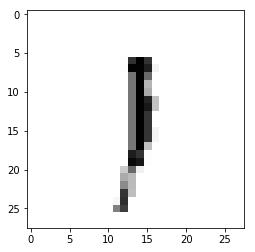

Epoch : 5 cost :  0.17416818055239594
Accuracy : 0.2513
label : [1]
Prediction : [0]


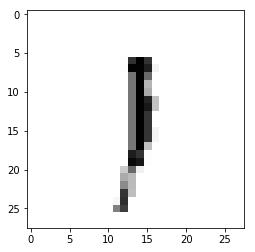

Epoch : 5 cost :  0.17820229833776305
Accuracy : 0.2508
label : [1]
Prediction : [0]


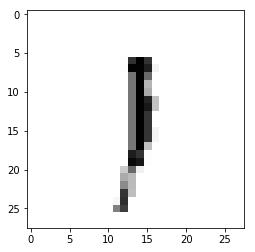

Epoch : 5 cost :  0.18224690784107558
Accuracy : 0.2509
label : [1]
Prediction : [0]


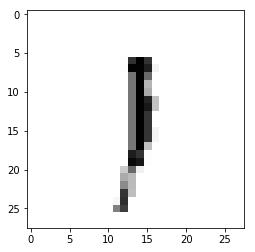

Epoch : 5 cost :  0.18627697467803958
Accuracy : 0.2505
label : [1]
Prediction : [0]


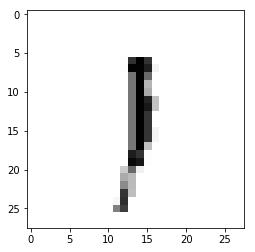

Epoch : 5 cost :  0.19033979545940055
Accuracy : 0.2508
label : [1]
Prediction : [0]


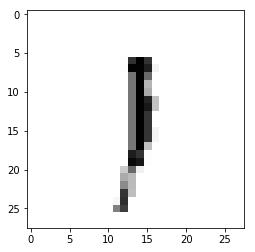

Epoch : 5 cost :  0.1943573011051525
Accuracy : 0.2535
label : [1]
Prediction : [0]


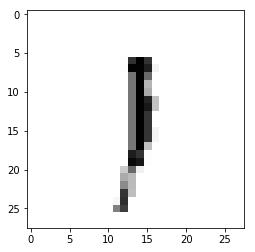

Epoch : 5 cost :  0.19840307365764273
Accuracy : 0.2555
label : [1]
Prediction : [0]


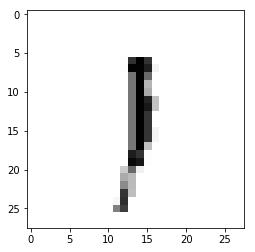

Epoch : 5 cost :  0.2024923471970992
Accuracy : 0.2541
label : [1]
Prediction : [0]


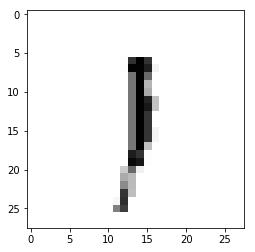

Epoch : 5 cost :  0.206535721692172
Accuracy : 0.2475
label : [1]
Prediction : [0]


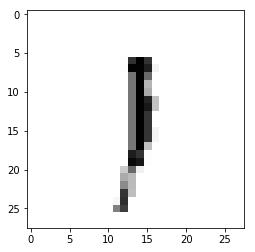

Epoch : 5 cost :  0.2105819602446123
Accuracy : 0.2464
label : [1]
Prediction : [0]


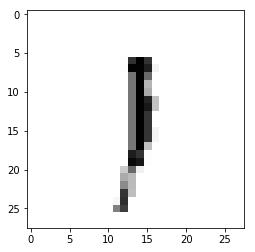

Epoch : 5 cost :  0.21462245160883126
Accuracy : 0.2435
label : [1]
Prediction : [0]


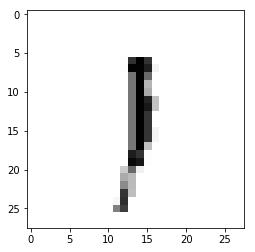

Epoch : 5 cost :  0.21861918276006528
Accuracy : 0.2434
label : [1]
Prediction : [0]


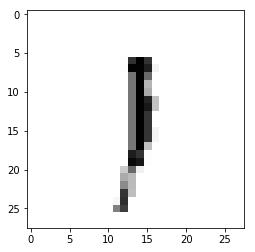

Epoch : 5 cost :  0.2226992667805065
Accuracy : 0.2456
label : [1]
Prediction : [0]


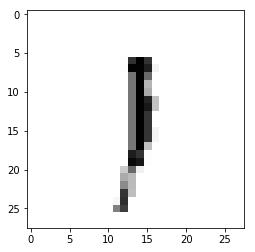

Epoch : 5 cost :  0.2267895568500866
Accuracy : 0.2425
label : [1]
Prediction : [0]


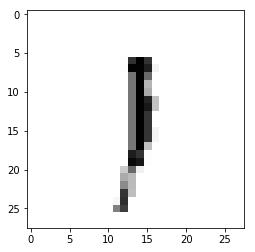

Epoch : 5 cost :  0.23076171918348837
Accuracy : 0.2448
label : [1]
Prediction : [0]


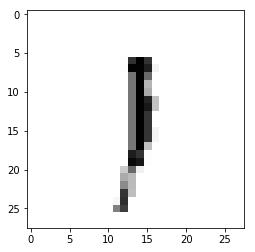

Epoch : 5 cost :  0.23485036633231426
Accuracy : 0.2394
label : [1]
Prediction : [0]


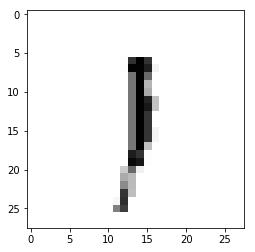

Epoch : 5 cost :  0.2389153744957664
Accuracy : 0.2363
label : [1]
Prediction : [0]


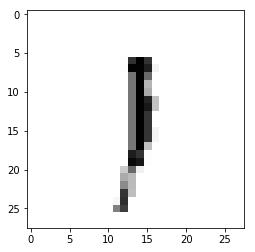

Epoch : 5 cost :  0.24297243161634968
Accuracy : 0.2375
label : [1]
Prediction : [0]


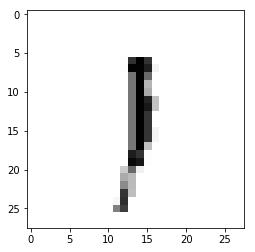

Epoch : 5 cost :  0.2470959368619052
Accuracy : 0.2434
label : [1]
Prediction : [0]


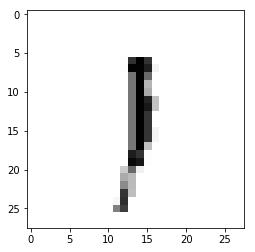

Epoch : 5 cost :  0.251132627400485
Accuracy : 0.2462
label : [1]
Prediction : [0]


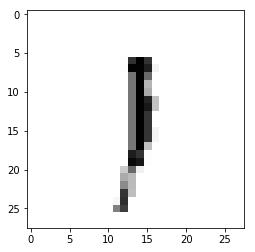

Epoch : 5 cost :  0.25521071000532675
Accuracy : 0.2439
label : [1]
Prediction : [0]


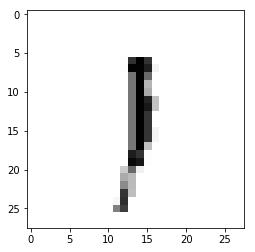

Epoch : 5 cost :  0.25925717050378977
Accuracy : 0.2391
label : [1]
Prediction : [0]


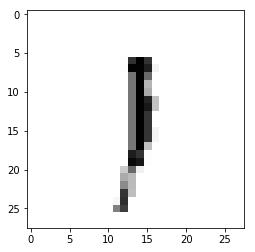

Epoch : 5 cost :  0.26329628250815656
Accuracy : 0.2353
label : [1]
Prediction : [0]


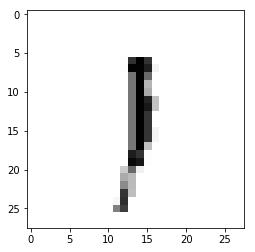

Epoch : 5 cost :  0.26736946192654704
Accuracy : 0.2425
label : [1]
Prediction : [0]


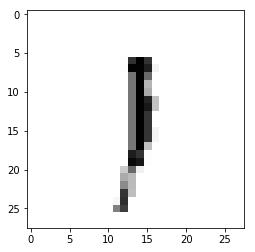

Epoch : 5 cost :  0.2713803352009167
Accuracy : 0.2399
label : [1]
Prediction : [0]


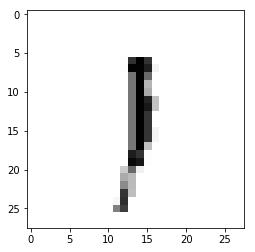

Epoch : 5 cost :  0.2754815249009567
Accuracy : 0.2404
label : [1]
Prediction : [0]


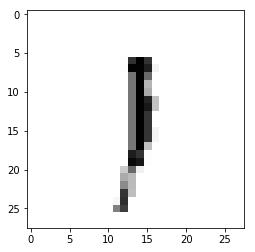

Epoch : 5 cost :  0.2794146724180743
Accuracy : 0.2486
label : [1]
Prediction : [0]


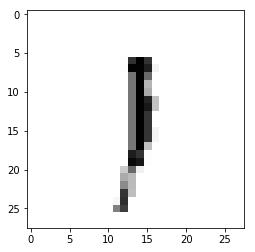

Epoch : 5 cost :  0.2834516672654586
Accuracy : 0.2491
label : [1]
Prediction : [0]


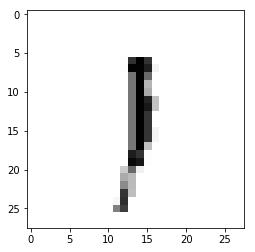

Epoch : 5 cost :  0.2874802914532749
Accuracy : 0.2432
label : [1]
Prediction : [0]


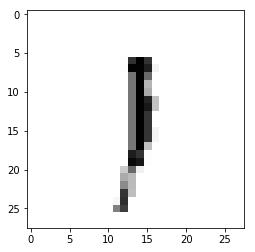

Epoch : 5 cost :  0.2915168909593063
Accuracy : 0.2429
label : [1]
Prediction : [0]


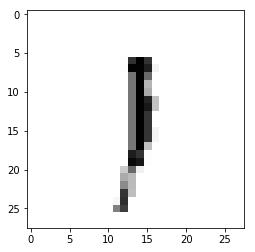

Epoch : 5 cost :  0.2955165438218551
Accuracy : 0.2444
label : [1]
Prediction : [0]


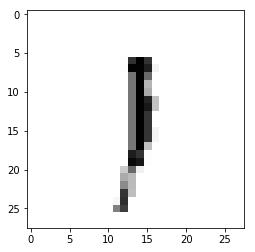

Epoch : 5 cost :  0.2995376244458286
Accuracy : 0.2435
label : [1]
Prediction : [0]


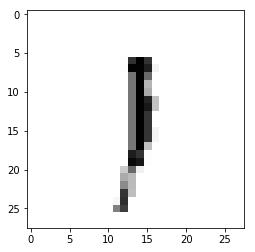

Epoch : 5 cost :  0.3035836293480614
Accuracy : 0.2406
label : [1]
Prediction : [0]


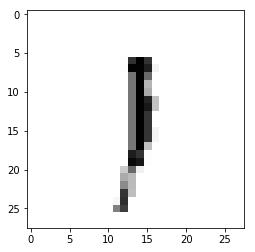

Epoch : 5 cost :  0.30756524779579864
Accuracy : 0.2466
label : [1]
Prediction : [0]


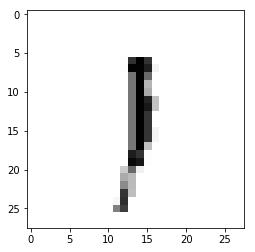

Epoch : 5 cost :  0.31160495844754316
Accuracy : 0.2456
label : [1]
Prediction : [0]


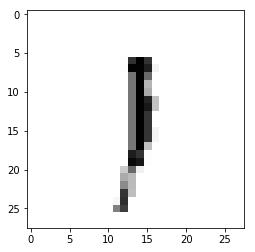

Epoch : 5 cost :  0.3156499875675549
Accuracy : 0.2456
label : [1]
Prediction : [0]


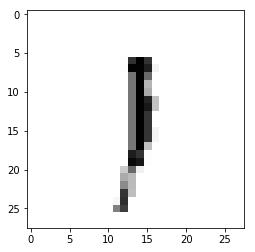

Epoch : 5 cost :  0.3196557417782871
Accuracy : 0.2285
label : [1]
Prediction : [0]


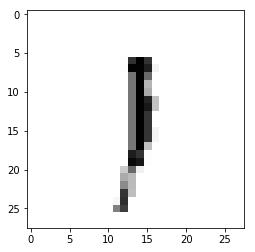

Epoch : 5 cost :  0.3237524622136897
Accuracy : 0.24
label : [1]
Prediction : [0]


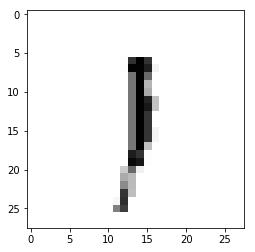

Epoch : 5 cost :  0.3277821068330245
Accuracy : 0.247
label : [1]
Prediction : [0]


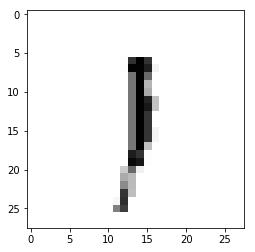

Epoch : 5 cost :  0.3317622939023105
Accuracy : 0.2478
label : [1]
Prediction : [0]


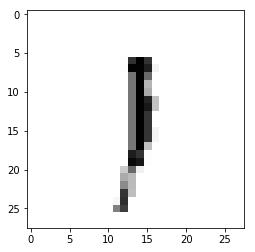

Epoch : 5 cost :  0.3358641173622825
Accuracy : 0.2478
label : [1]
Prediction : [0]


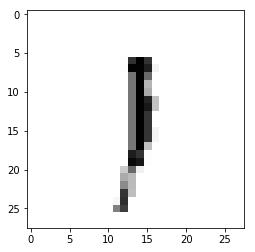

Epoch : 5 cost :  0.3398956463553689
Accuracy : 0.2479
label : [1]
Prediction : [0]


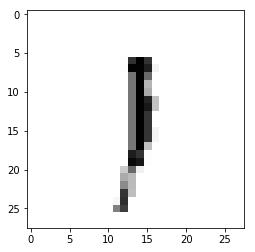

Epoch : 5 cost :  0.3439647574858232
Accuracy : 0.2346
label : [1]
Prediction : [0]


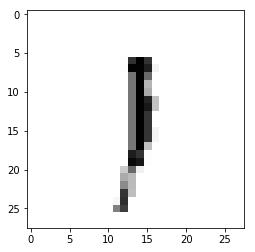

Epoch : 5 cost :  0.3479988557642157
Accuracy : 0.2344
label : [1]
Prediction : [0]


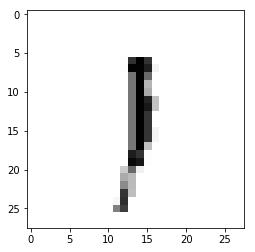

Epoch : 5 cost :  0.35201695528897375
Accuracy : 0.2379
label : [1]
Prediction : [0]


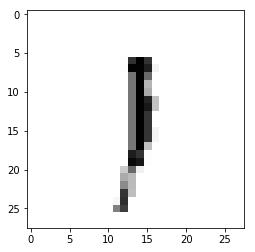

Epoch : 5 cost :  0.3561301053654064
Accuracy : 0.241
label : [1]
Prediction : [0]


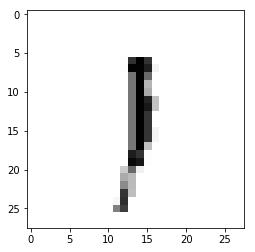

Epoch : 5 cost :  0.3602169444344261
Accuracy : 0.2521
label : [1]
Prediction : [0]


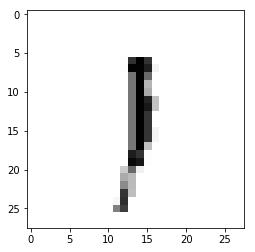

Epoch : 5 cost :  0.3642237515883013
Accuracy : 0.2529
label : [1]
Prediction : [0]


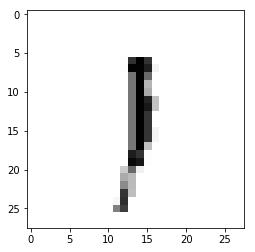

Epoch : 5 cost :  0.36828264973380354
Accuracy : 0.2573
label : [1]
Prediction : [0]


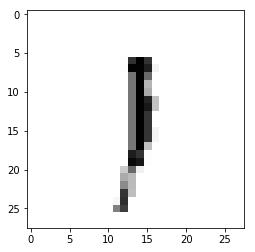

Epoch : 5 cost :  0.37229786526073116
Accuracy : 0.2588
label : [1]
Prediction : [0]


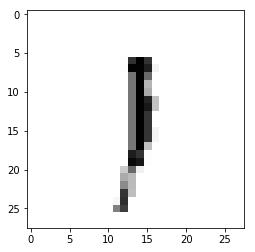

Epoch : 5 cost :  0.3763763956590133
Accuracy : 0.2563
label : [1]
Prediction : [0]


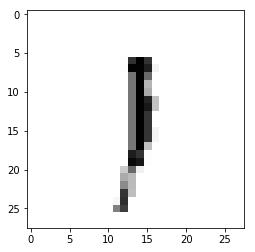

Epoch : 5 cost :  0.3803762609308417
Accuracy : 0.258
label : [1]
Prediction : [0]


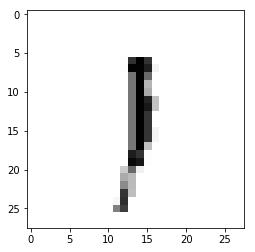

Epoch : 5 cost :  0.38444527886130603
Accuracy : 0.2595
label : [1]
Prediction : [0]


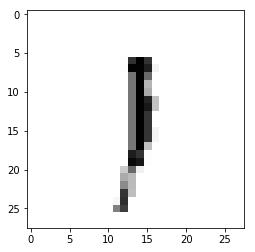

Epoch : 5 cost :  0.3884313917160035
Accuracy : 0.2571
label : [1]
Prediction : [0]


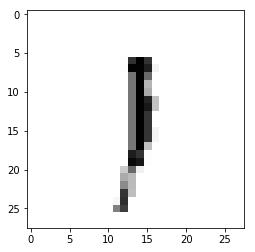

Epoch : 5 cost :  0.3924760653755882
Accuracy : 0.257
label : [1]
Prediction : [0]


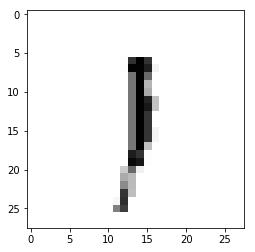

Epoch : 5 cost :  0.39648530179804026
Accuracy : 0.2424
label : [1]
Prediction : [0]


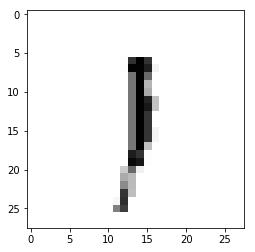

Epoch : 5 cost :  0.4004454911838879
Accuracy : 0.2555
label : [1]
Prediction : [0]


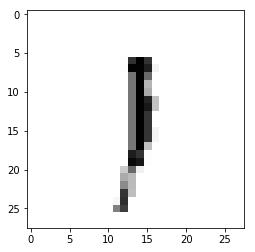

Epoch : 5 cost :  0.40449255032972864
Accuracy : 0.2411
label : [1]
Prediction : [0]


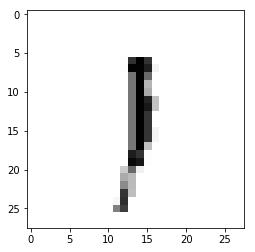

Epoch : 5 cost :  0.40858743971044376
Accuracy : 0.2448
label : [1]
Prediction : [0]


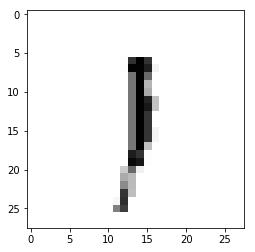

Epoch : 5 cost :  0.412561150897633
Accuracy : 0.2452
label : [1]
Prediction : [0]


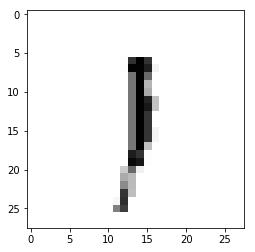

Epoch : 5 cost :  0.41655977899378005
Accuracy : 0.2571
label : [1]
Prediction : [0]


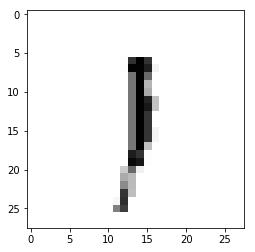

Epoch : 5 cost :  0.42056054332039583
Accuracy : 0.244
label : [1]
Prediction : [0]


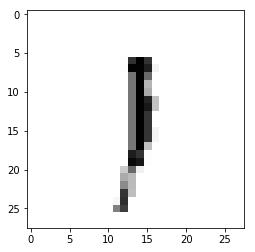

Epoch : 5 cost :  0.4246593874151057
Accuracy : 0.2455
label : [1]
Prediction : [0]


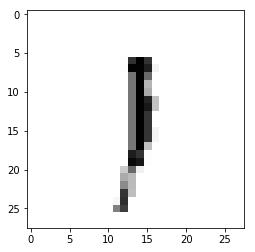

Epoch : 5 cost :  0.42865430571816193
Accuracy : 0.2441
label : [1]
Prediction : [0]


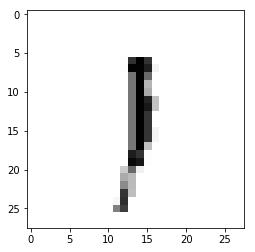

Epoch : 5 cost :  0.4326757998899981
Accuracy : 0.256
label : [1]
Prediction : [0]


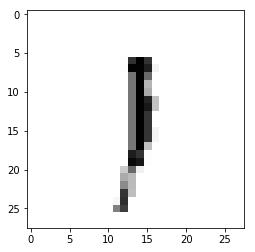

Epoch : 5 cost :  0.4367104434967042
Accuracy : 0.251
label : [1]
Prediction : [0]


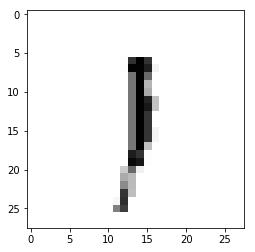

Epoch : 5 cost :  0.44075262719934644
Accuracy : 0.2533
label : [1]
Prediction : [0]


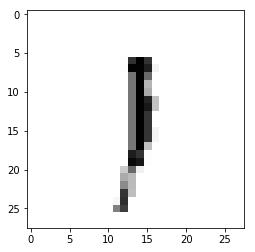

Epoch : 5 cost :  0.44471777265722107
Accuracy : 0.2574
label : [1]
Prediction : [0]


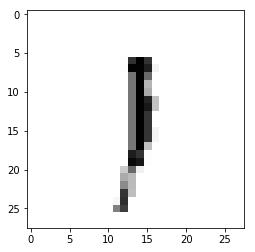

Epoch : 5 cost :  0.44873343944549565
Accuracy : 0.2517
label : [1]
Prediction : [0]


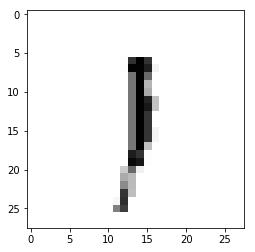

Epoch : 5 cost :  0.45274102774533365
Accuracy : 0.2505
label : [1]
Prediction : [0]


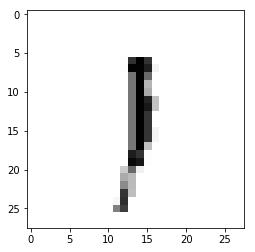

Epoch : 5 cost :  0.45678558262911717
Accuracy : 0.2313
label : [1]
Prediction : [0]


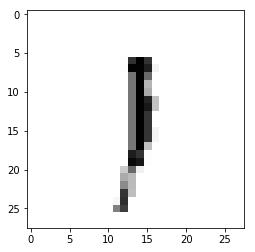

Epoch : 5 cost :  0.4607647557692095
Accuracy : 0.2424
label : [1]
Prediction : [0]


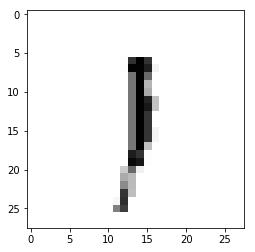

Epoch : 5 cost :  0.464727017662742
Accuracy : 0.2517
label : [1]
Prediction : [0]


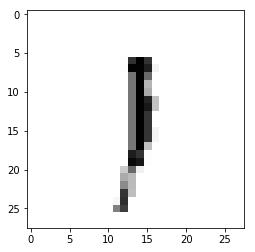

Epoch : 5 cost :  0.468777627511458
Accuracy : 0.2298
label : [1]
Prediction : [0]


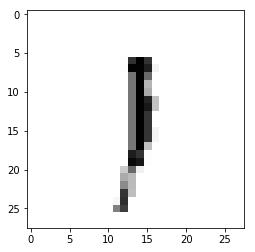

Epoch : 5 cost :  0.472796839800748
Accuracy : 0.2303
label : [1]
Prediction : [0]


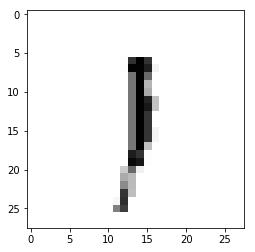

Epoch : 5 cost :  0.4768188485232267
Accuracy : 0.2307
label : [1]
Prediction : [0]


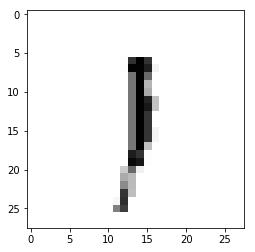

Epoch : 5 cost :  0.4808144799145786
Accuracy : 0.2342
label : [1]
Prediction : [0]


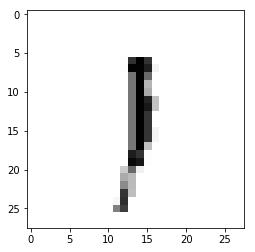

Epoch : 5 cost :  0.4848518935116855
Accuracy : 0.2302
label : [1]
Prediction : [0]


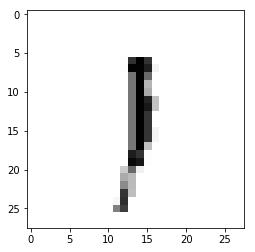

Epoch : 5 cost :  0.4889042888988149
Accuracy : 0.2255
label : [1]
Prediction : [0]


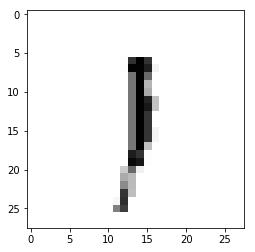

Epoch : 5 cost :  0.4929341702027755
Accuracy : 0.2272
label : [1]
Prediction : [0]


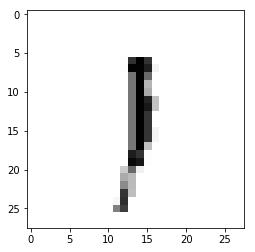

Epoch : 5 cost :  0.496970594146035
Accuracy : 0.2259
label : [1]
Prediction : [0]


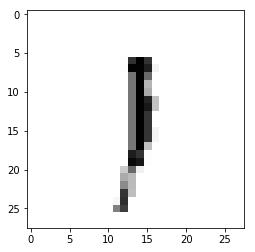

Epoch : 5 cost :  0.5010311989350753
Accuracy : 0.2152
label : [1]
Prediction : [0]


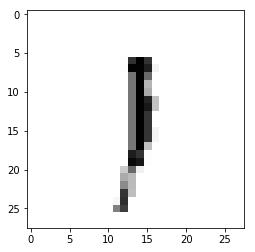

Epoch : 5 cost :  0.5050917794487694
Accuracy : 0.2137
label : [1]
Prediction : [0]


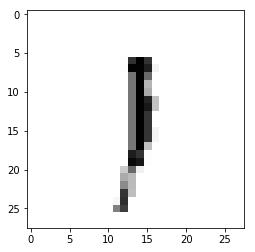

Epoch : 5 cost :  0.5090528999675404
Accuracy : 0.2262
label : [1]
Prediction : [0]


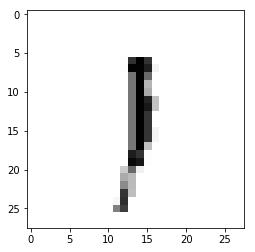

Epoch : 5 cost :  0.5130706661397761
Accuracy : 0.2271
label : [1]
Prediction : [0]


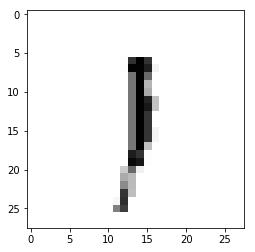

Epoch : 5 cost :  0.5171326823668048
Accuracy : 0.2286
label : [1]
Prediction : [0]


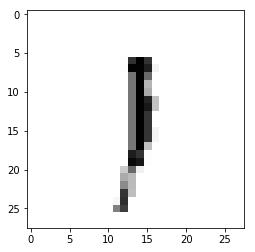

Epoch : 5 cost :  0.5211205703561957
Accuracy : 0.2299
label : [1]
Prediction : [0]


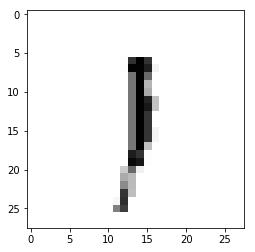

Epoch : 5 cost :  0.5251826516064731
Accuracy : 0.2271
label : [1]
Prediction : [0]


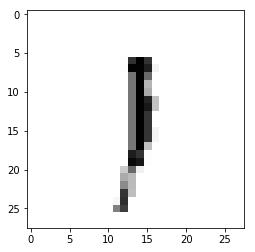

Epoch : 5 cost :  0.5291345743699508
Accuracy : 0.2279
label : [1]
Prediction : [0]


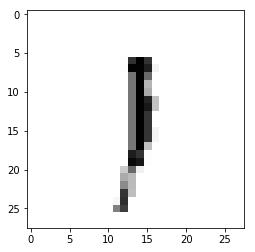

Epoch : 5 cost :  0.5332200176065619
Accuracy : 0.232
label : [1]
Prediction : [0]


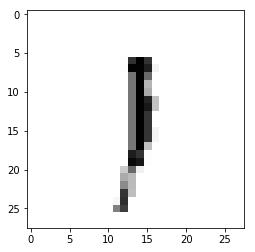

Epoch : 5 cost :  0.5372239542007446
Accuracy : 0.2296
label : [1]
Prediction : [0]


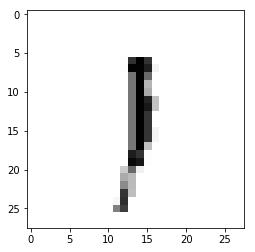

Epoch : 5 cost :  0.5412317631461404
Accuracy : 0.2299
label : [1]
Prediction : [0]


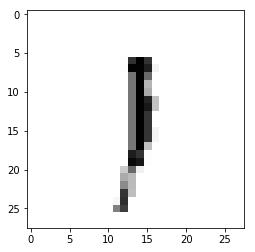

Epoch : 5 cost :  0.5452138103138318
Accuracy : 0.2337
label : [1]
Prediction : [0]


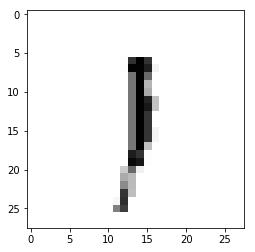

Epoch : 5 cost :  0.5493218838084829
Accuracy : 0.2299
label : [1]
Prediction : [0]


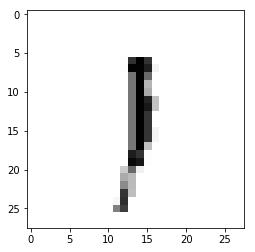

Epoch : 5 cost :  0.5533410067991779
Accuracy : 0.2282
label : [1]
Prediction : [0]


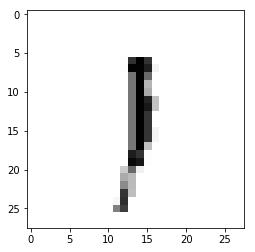

Epoch : 5 cost :  0.5573904882777823
Accuracy : 0.2288
label : [1]
Prediction : [0]


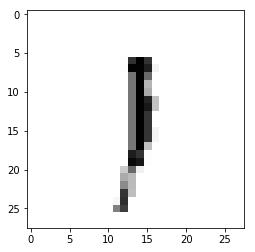

Epoch : 5 cost :  0.5614561900225554
Accuracy : 0.2279
label : [1]
Prediction : [0]


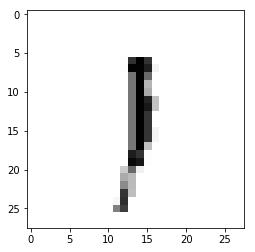

Epoch : 5 cost :  0.5654510159925983
Accuracy : 0.2287
label : [1]
Prediction : [0]


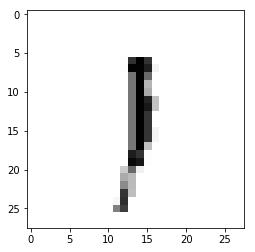

Epoch : 5 cost :  0.5694889003580269
Accuracy : 0.23
label : [1]
Prediction : [0]


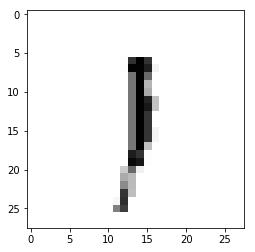

Epoch : 5 cost :  0.5735355299169369
Accuracy : 0.23
label : [1]
Prediction : [0]


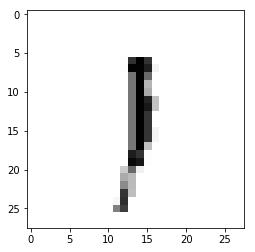

Epoch : 5 cost :  0.5775468891317196
Accuracy : 0.2231
label : [1]
Prediction : [0]


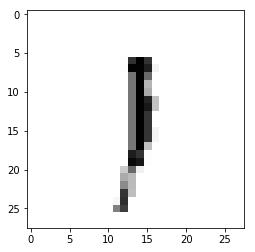

Epoch : 5 cost :  0.581569232940674
Accuracy : 0.2272
label : [1]
Prediction : [0]


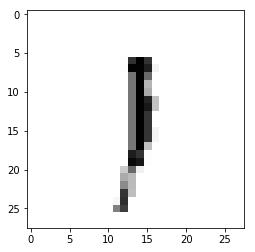

Epoch : 5 cost :  0.5856194777922198
Accuracy : 0.2272
label : [1]
Prediction : [0]


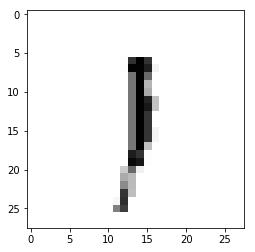

Epoch : 5 cost :  0.5897062028538098
Accuracy : 0.2268
label : [1]
Prediction : [0]


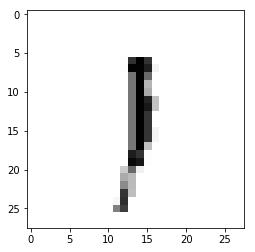

Epoch : 5 cost :  0.5937246075543492
Accuracy : 0.228
label : [1]
Prediction : [0]


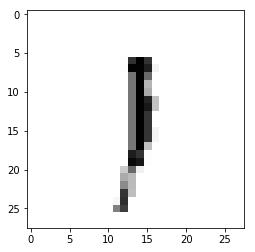

Epoch : 5 cost :  0.597783157608726
Accuracy : 0.2271
label : [1]
Prediction : [0]


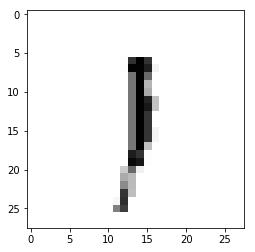

Epoch : 5 cost :  0.6017588593743066
Accuracy : 0.228
label : [1]
Prediction : [0]


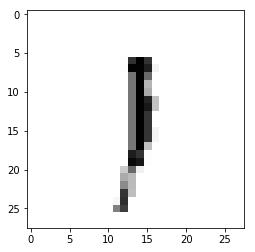

Epoch : 5 cost :  0.6057765418832954
Accuracy : 0.2294
label : [1]
Prediction : [0]


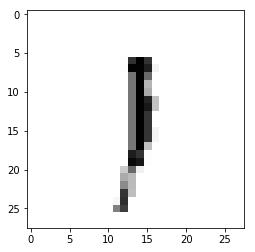

Epoch : 5 cost :  0.6098283503272319
Accuracy : 0.2298
label : [1]
Prediction : [0]


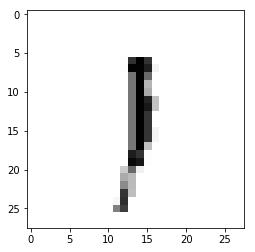

Epoch : 5 cost :  0.6138246813687414
Accuracy : 0.2332
label : [1]
Prediction : [0]


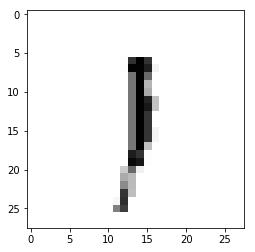

Epoch : 5 cost :  0.61789814862338
Accuracy : 0.2557
label : [1]
Prediction : [0]


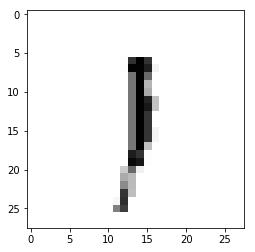

Epoch : 5 cost :  0.6219500350952151
Accuracy : 0.2336
label : [1]
Prediction : [0]


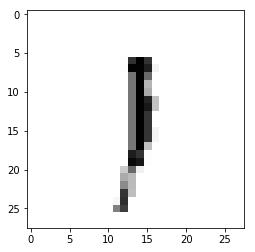

Epoch : 5 cost :  0.626006227840077
Accuracy : 0.2311
label : [1]
Prediction : [0]


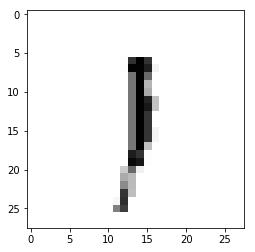

Epoch : 5 cost :  0.6299626632170245
Accuracy : 0.2322
label : [1]
Prediction : [0]


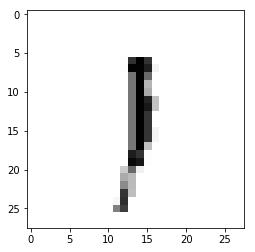

Epoch : 5 cost :  0.6340407670627942
Accuracy : 0.2165
label : [1]
Prediction : [0]


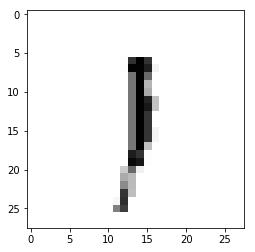

Epoch : 5 cost :  0.6380094008012253
Accuracy : 0.2147
label : [1]
Prediction : [0]


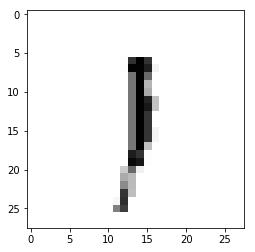

Epoch : 5 cost :  0.6419852135398172
Accuracy : 0.2142
label : [1]
Prediction : [0]


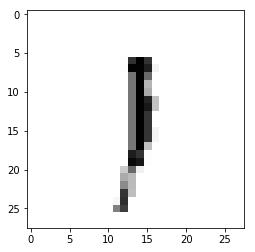

Epoch : 5 cost :  0.6459986300901934
Accuracy : 0.2191
label : [1]
Prediction : [0]


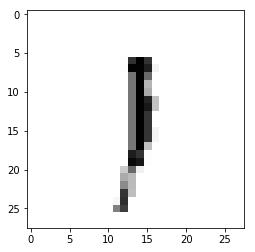

Epoch : 5 cost :  0.6499912669441917
Accuracy : 0.2148
label : [1]
Prediction : [0]


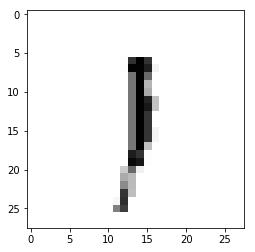

Epoch : 5 cost :  0.6539277627251365
Accuracy : 0.231
label : [1]
Prediction : [0]


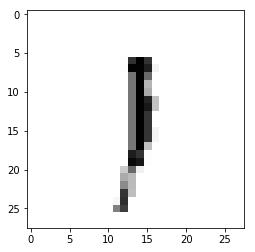

Epoch : 5 cost :  0.6579676198959351
Accuracy : 0.2299
label : [1]
Prediction : [0]


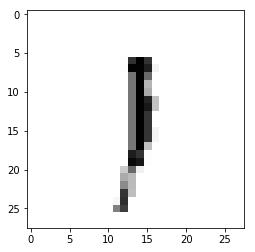

Epoch : 5 cost :  0.6620208631862294
Accuracy : 0.2164
label : [1]
Prediction : [0]


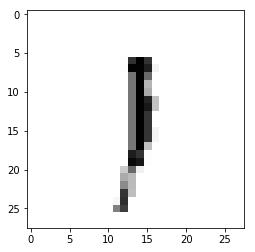

Epoch : 5 cost :  0.6660854062167082
Accuracy : 0.2296
label : [1]
Prediction : [0]


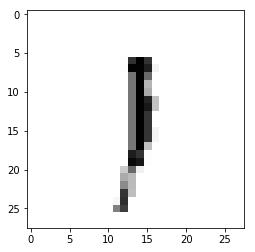

Epoch : 5 cost :  0.6701126532121139
Accuracy : 0.236
label : [1]
Prediction : [0]


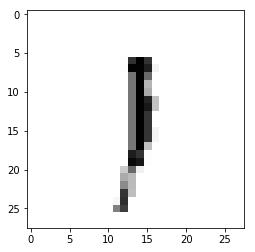

Epoch : 5 cost :  0.6741731010783804
Accuracy : 0.2322
label : [1]
Prediction : [0]


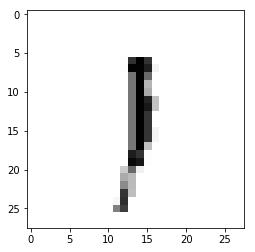

Epoch : 5 cost :  0.6781324434280397
Accuracy : 0.2346
label : [1]
Prediction : [0]


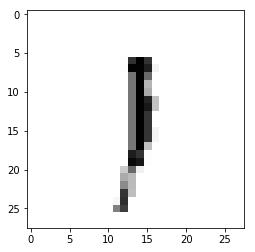

Epoch : 5 cost :  0.6821210197968918
Accuracy : 0.2325
label : [1]
Prediction : [0]


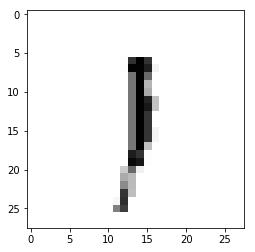

Epoch : 5 cost :  0.6860265987569637
Accuracy : 0.2321
label : [1]
Prediction : [0]


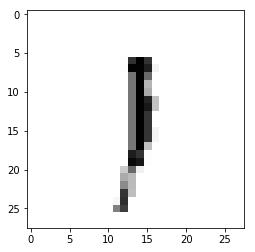

Epoch : 5 cost :  0.6900632416118276
Accuracy : 0.2324
label : [1]
Prediction : [0]


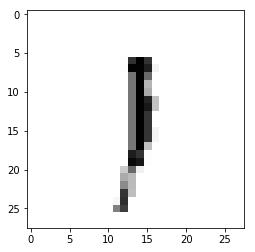

Epoch : 5 cost :  0.6940662605112251
Accuracy : 0.2401
label : [1]
Prediction : [0]


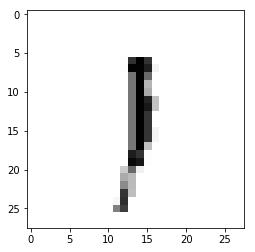

Epoch : 5 cost :  0.6980261915380307
Accuracy : 0.2444
label : [1]
Prediction : [0]


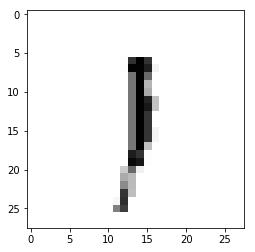

Epoch : 5 cost :  0.7020351019772618
Accuracy : 0.2498
label : [1]
Prediction : [0]


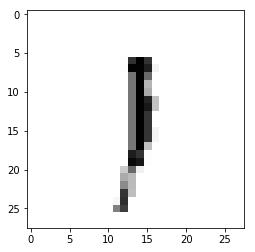

Epoch : 5 cost :  0.706006956100464
Accuracy : 0.2502
label : [1]
Prediction : [0]


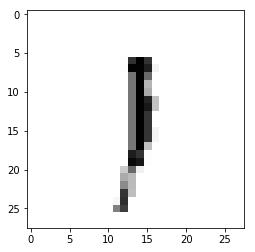

Epoch : 5 cost :  0.7100177877599545
Accuracy : 0.2545
label : [1]
Prediction : [0]


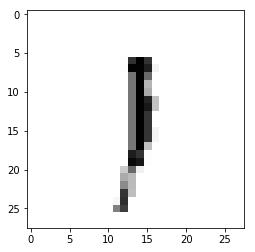

Epoch : 5 cost :  0.7140334974635734
Accuracy : 0.256
label : [1]
Prediction : [0]


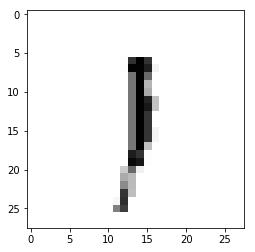

Epoch : 5 cost :  0.718073821934787
Accuracy : 0.2557
label : [1]
Prediction : [0]


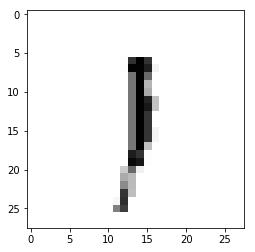

Epoch : 5 cost :  0.7221085730465978
Accuracy : 0.2602
label : [1]
Prediction : [0]


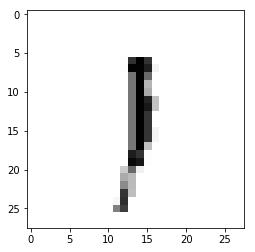

Epoch : 5 cost :  0.7261432626030664
Accuracy : 0.2576
label : [1]
Prediction : [0]


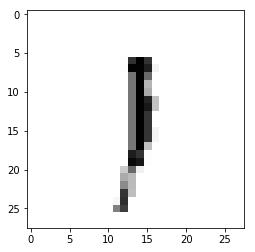

Epoch : 5 cost :  0.7301549603722314
Accuracy : 0.2603
label : [1]
Prediction : [0]


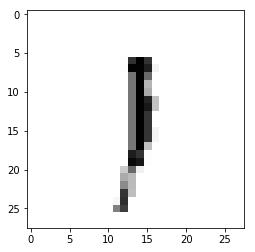

Epoch : 5 cost :  0.734183509133079
Accuracy : 0.2661
label : [1]
Prediction : [0]


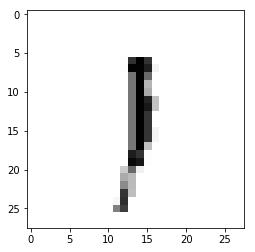

Epoch : 5 cost :  0.7381719498200852
Accuracy : 0.2676
label : [1]
Prediction : [0]


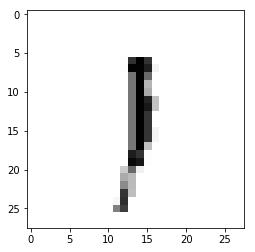

Epoch : 5 cost :  0.7421594658764927
Accuracy : 0.2706
label : [1]
Prediction : [0]


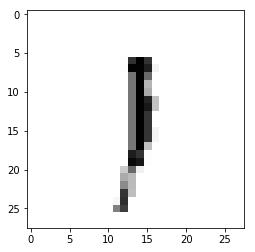

Epoch : 5 cost :  0.7461716556549074
Accuracy : 0.2702
label : [1]
Prediction : [0]


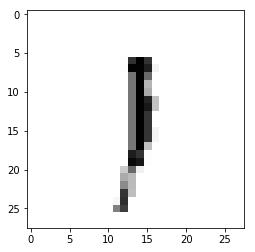

Epoch : 5 cost :  0.7501384327628398
Accuracy : 0.269
label : [1]
Prediction : [0]


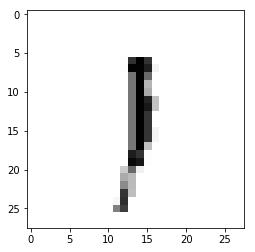

Epoch : 5 cost :  0.754128540212458
Accuracy : 0.2685
label : [1]
Prediction : [0]


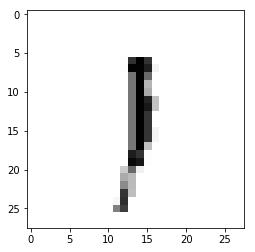

Epoch : 5 cost :  0.758092687780207
Accuracy : 0.2686
label : [1]
Prediction : [0]


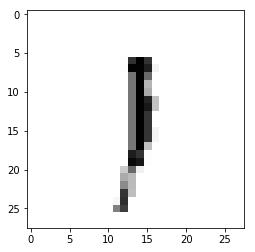

Epoch : 5 cost :  0.7620519490675494
Accuracy : 0.2681
label : [1]
Prediction : [0]


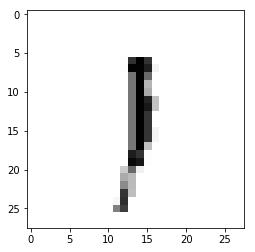

Epoch : 5 cost :  0.7660213687203148
Accuracy : 0.2656
label : [1]
Prediction : [0]


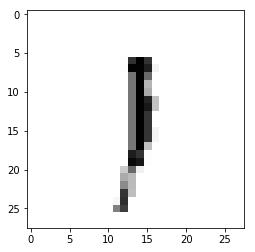

Epoch : 5 cost :  0.7699436456506903
Accuracy : 0.2688
label : [1]
Prediction : [0]


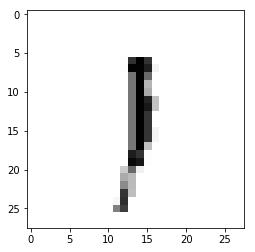

Epoch : 5 cost :  0.7739787795326927
Accuracy : 0.2691
label : [1]
Prediction : [0]


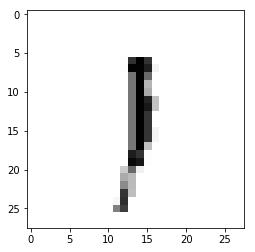

Epoch : 5 cost :  0.7780314952676947
Accuracy : 0.2636
label : [1]
Prediction : [0]


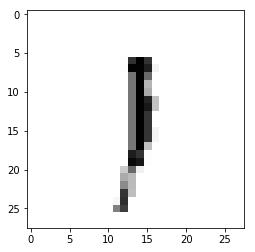

Epoch : 5 cost :  0.7820377956737171
Accuracy : 0.2613
label : [1]
Prediction : [0]


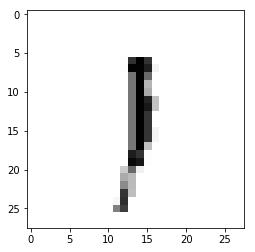

Epoch : 5 cost :  0.785973766933788
Accuracy : 0.2647
label : [1]
Prediction : [0]


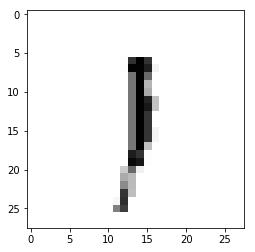

Epoch : 5 cost :  0.7899259840358387
Accuracy : 0.2635
label : [1]
Prediction : [0]


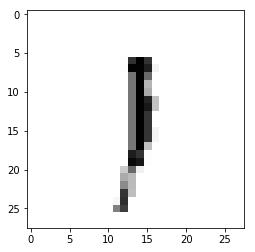

Epoch : 5 cost :  0.7939614430340853
Accuracy : 0.2601
label : [1]
Prediction : [0]


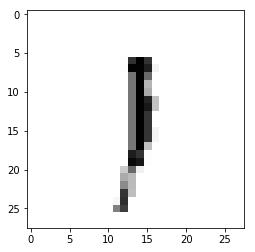

Epoch : 5 cost :  0.7979915623231367
Accuracy : 0.2584
label : [1]
Prediction : [0]


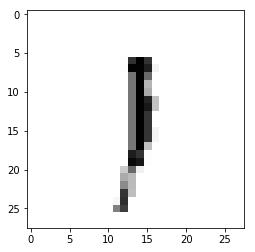

Epoch : 5 cost :  0.8019131916219537
Accuracy : 0.2575
label : [1]
Prediction : [0]


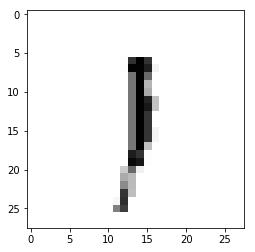

Epoch : 5 cost :  0.8059385906566272
Accuracy : 0.2581
label : [1]
Prediction : [0]


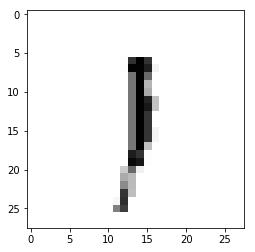

Epoch : 5 cost :  0.8099456722086125
Accuracy : 0.2665
label : [1]
Prediction : [0]


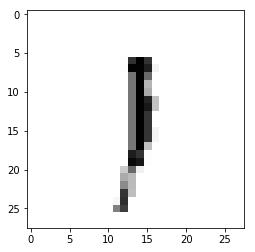

Epoch : 5 cost :  0.8139336711710148
Accuracy : 0.2675
label : [1]
Prediction : [0]


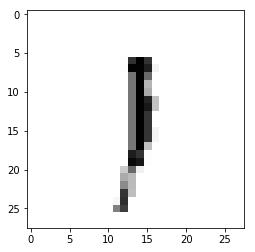

Epoch : 5 cost :  0.8178973778811366
Accuracy : 0.2687
label : [1]
Prediction : [0]


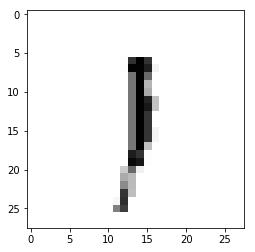

Epoch : 5 cost :  0.8218906970457595
Accuracy : 0.2674
label : [1]
Prediction : [0]


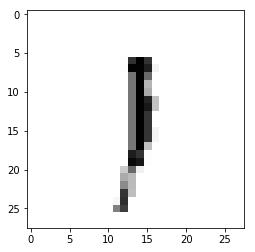

Epoch : 5 cost :  0.825839698964899
Accuracy : 0.2667
label : [1]
Prediction : [0]


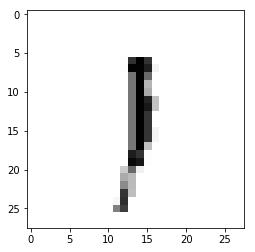

Epoch : 5 cost :  0.8298353936455464
Accuracy : 0.2587
label : [1]
Prediction : [0]


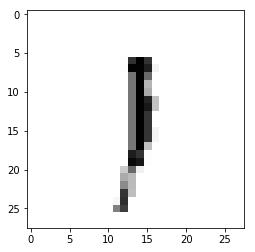

Epoch : 5 cost :  0.8337663819573139
Accuracy : 0.2587
label : [1]
Prediction : [0]


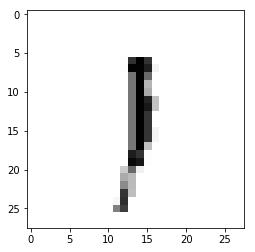

Epoch : 5 cost :  0.8377477914636782
Accuracy : 0.2581
label : [1]
Prediction : [0]


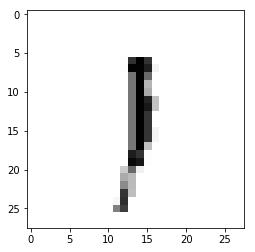

Epoch : 5 cost :  0.8417163831537416
Accuracy : 0.2577
label : [1]
Prediction : [0]


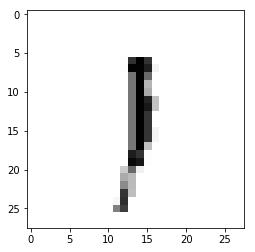

Epoch : 5 cost :  0.8457213263078166
Accuracy : 0.2575
label : [1]
Prediction : [0]


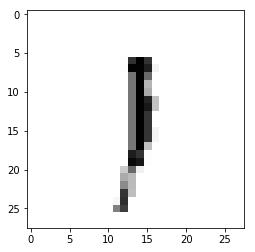

Epoch : 5 cost :  0.849651362679221
Accuracy : 0.2582
label : [1]
Prediction : [0]


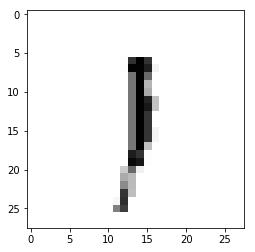

Epoch : 5 cost :  0.8537007635289968
Accuracy : 0.2585
label : [1]
Prediction : [0]


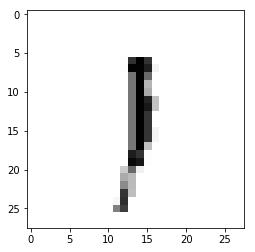

Epoch : 5 cost :  0.8576631563360037
Accuracy : 0.2575
label : [1]
Prediction : [0]


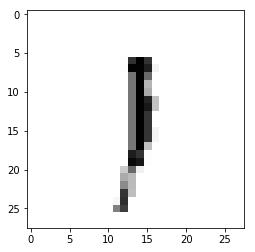

Epoch : 5 cost :  0.8617090186205772
Accuracy : 0.2592
label : [1]
Prediction : [0]


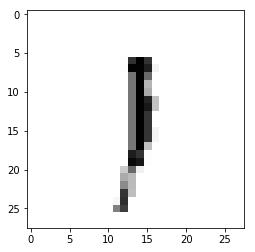

Epoch : 5 cost :  0.8656753665750672
Accuracy : 0.2634
label : [1]
Prediction : [0]


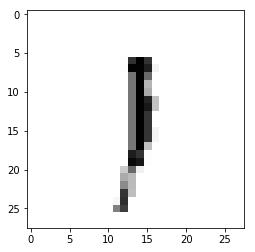

Epoch : 5 cost :  0.8696605574000961
Accuracy : 0.2626
label : [1]
Prediction : [0]


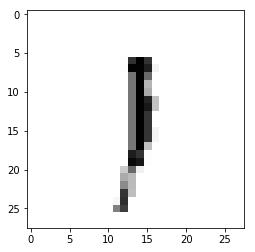

Epoch : 5 cost :  0.8736230932582504
Accuracy : 0.2578
label : [1]
Prediction : [0]


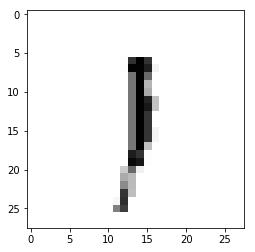

Epoch : 5 cost :  0.8775981708006421
Accuracy : 0.2576
label : [1]
Prediction : [0]


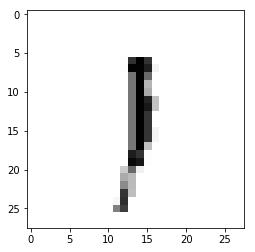

Epoch : 5 cost :  0.881513121344826
Accuracy : 0.2567
label : [1]
Prediction : [0]


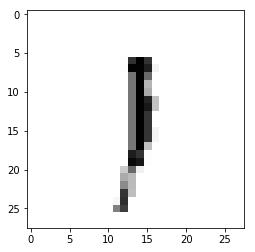

Epoch : 5 cost :  0.8854065604643383
Accuracy : 0.255
label : [1]
Prediction : [0]


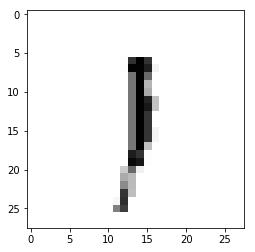

Epoch : 5 cost :  0.8894062835519959
Accuracy : 0.2556
label : [1]
Prediction : [0]


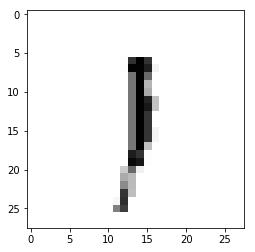

Epoch : 5 cost :  0.8934025461023499
Accuracy : 0.2554
label : [1]
Prediction : [0]


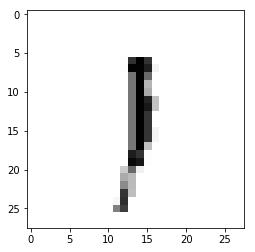

Epoch : 5 cost :  0.897319103587757
Accuracy : 0.2555
label : [1]
Prediction : [0]


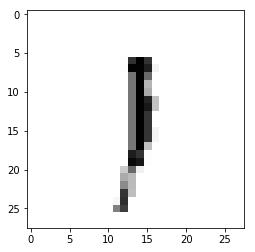

Epoch : 5 cost :  0.9013130227002226
Accuracy : 0.2572
label : [1]
Prediction : [0]


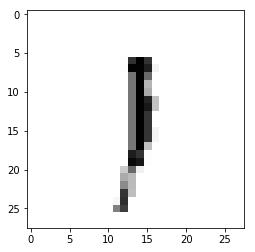

Epoch : 5 cost :  0.9052528121254656
Accuracy : 0.2489
label : [1]
Prediction : [0]


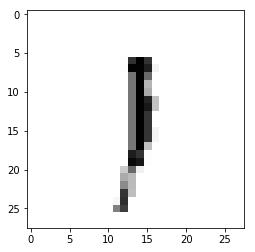

Epoch : 5 cost :  0.9093128026615485
Accuracy : 0.2554
label : [1]
Prediction : [0]


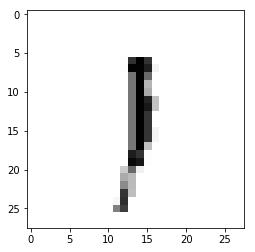

Epoch : 5 cost :  0.913301281062039
Accuracy : 0.2488
label : [1]
Prediction : [0]


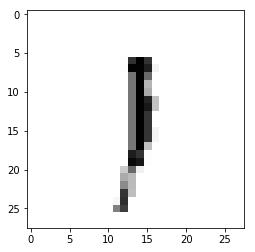

Epoch : 5 cost :  0.9172302657907655
Accuracy : 0.2479
label : [1]
Prediction : [0]


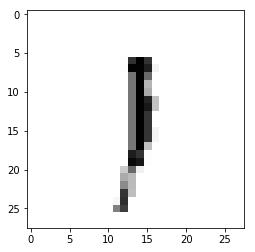

Epoch : 5 cost :  0.9212278916619037
Accuracy : 0.2478
label : [1]
Prediction : [0]


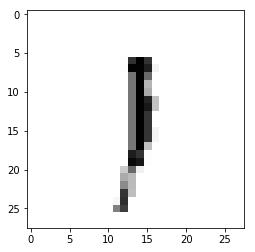

Epoch : 5 cost :  0.9251965652812607
Accuracy : 0.2478
label : [1]
Prediction : [0]


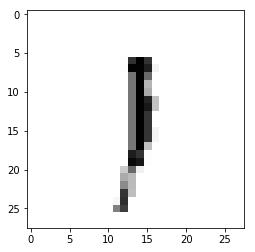

Epoch : 5 cost :  0.9291539005799723
Accuracy : 0.249
label : [1]
Prediction : [0]


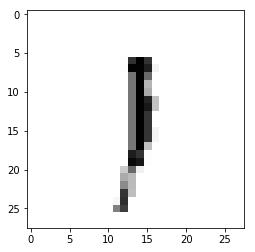

Epoch : 5 cost :  0.9331034369902172
Accuracy : 0.2488
label : [1]
Prediction : [0]


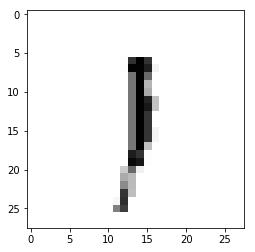

Epoch : 5 cost :  0.9370357335697516
Accuracy : 0.2503
label : [1]
Prediction : [0]


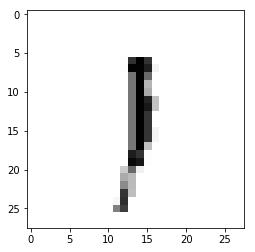

Epoch : 5 cost :  0.9410253620147699
Accuracy : 0.2571
label : [1]
Prediction : [0]


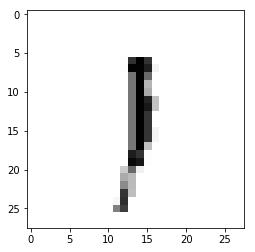

Epoch : 5 cost :  0.9450424289703363
Accuracy : 0.2493
label : [1]
Prediction : [0]


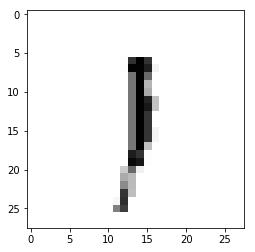

Epoch : 5 cost :  0.949049035852605
Accuracy : 0.2507
label : [1]
Prediction : [0]


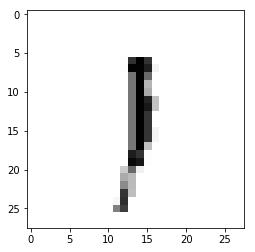

Epoch : 5 cost :  0.9530022733861744
Accuracy : 0.2584
label : [1]
Prediction : [0]


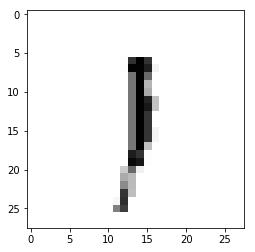

Epoch : 5 cost :  0.9569725205681535
Accuracy : 0.2581
label : [1]
Prediction : [0]


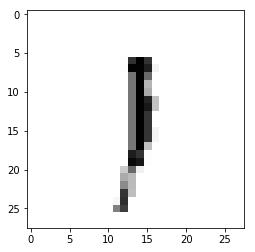

Epoch : 5 cost :  0.9610178730704562
Accuracy : 0.2566
label : [1]
Prediction : [0]


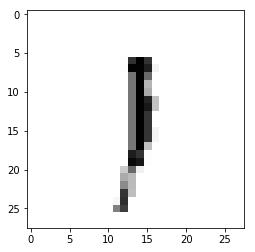

Epoch : 5 cost :  0.9650416734001848
Accuracy : 0.2572
label : [1]
Prediction : [0]


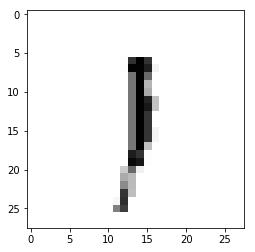

Epoch : 5 cost :  0.9689964714917264
Accuracy : 0.2587
label : [1]
Prediction : [0]


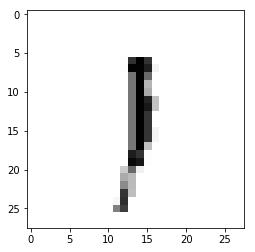

Epoch : 5 cost :  0.9729840881174255
Accuracy : 0.2566
label : [1]
Prediction : [0]


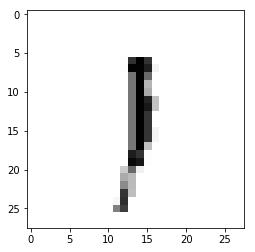

Epoch : 5 cost :  0.9768713062459766
Accuracy : 0.2568
label : [1]
Prediction : [0]


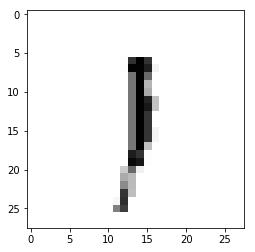

Epoch : 5 cost :  0.9809596733613442
Accuracy : 0.2564
label : [1]
Prediction : [0]


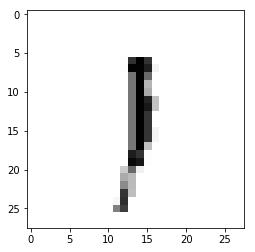

Epoch : 5 cost :  0.9849028192866927
Accuracy : 0.2543
label : [1]
Prediction : [0]


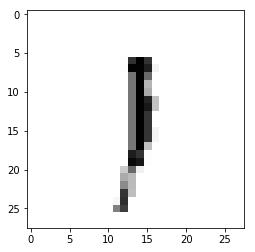

Epoch : 5 cost :  0.9888572341745544
Accuracy : 0.239
label : [1]
Prediction : [0]


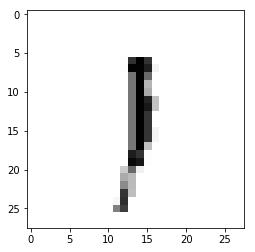

Epoch : 5 cost :  0.9928437488729298
Accuracy : 0.253
label : [1]
Prediction : [0]


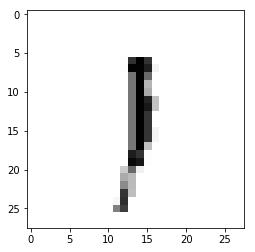

Epoch : 5 cost :  0.9968151552026917
Accuracy : 0.2514
label : [1]
Prediction : [0]


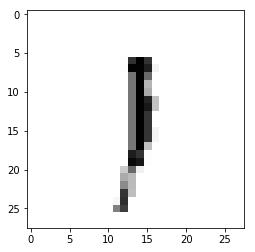

Epoch : 5 cost :  1.00082582430406
Accuracy : 0.2509
label : [1]
Prediction : [0]


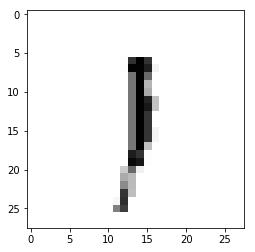

Epoch : 5 cost :  1.004712479331276
Accuracy : 0.2545
label : [1]
Prediction : [0]


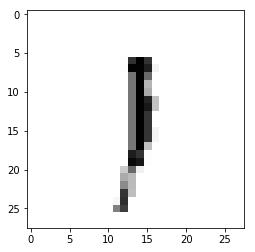

Epoch : 5 cost :  1.0086113869060165
Accuracy : 0.2483
label : [1]
Prediction : [0]


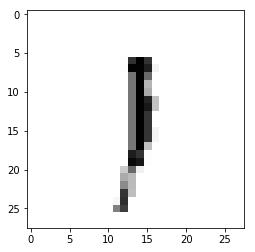

Epoch : 5 cost :  1.0125695471330118
Accuracy : 0.2557
label : [1]
Prediction : [0]


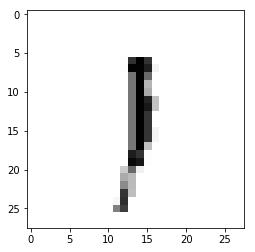

Epoch : 5 cost :  1.016527088338678
Accuracy : 0.2591
label : [1]
Prediction : [0]


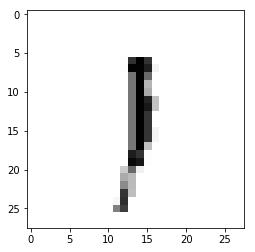

Epoch : 5 cost :  1.0204778393832117
Accuracy : 0.2583
label : [1]
Prediction : [0]


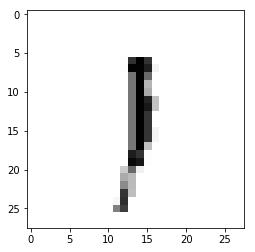

Epoch : 5 cost :  1.024441722523082
Accuracy : 0.2591
label : [1]
Prediction : [0]


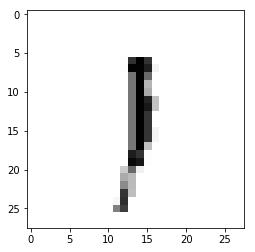

Epoch : 5 cost :  1.028346959460865
Accuracy : 0.2594
label : [1]
Prediction : [0]


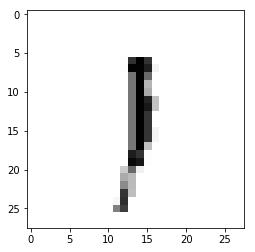

Epoch : 5 cost :  1.0323263675516299
Accuracy : 0.2596
label : [1]
Prediction : [0]


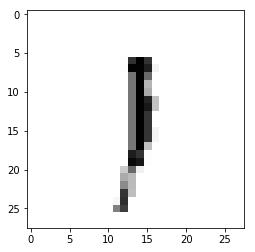

Epoch : 5 cost :  1.0362198279120702
Accuracy : 0.2599
label : [1]
Prediction : [0]


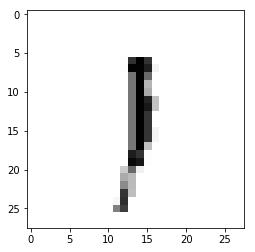

Epoch : 5 cost :  1.0402394615520127
Accuracy : 0.2603
label : [1]
Prediction : [0]


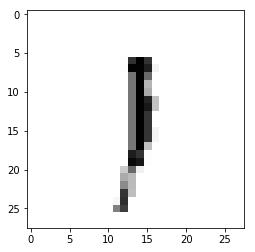

Epoch : 5 cost :  1.044269925464283
Accuracy : 0.26
label : [1]
Prediction : [0]


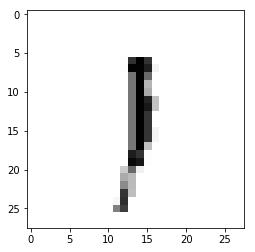

Epoch : 5 cost :  1.0481989539753305
Accuracy : 0.259
label : [1]
Prediction : [0]


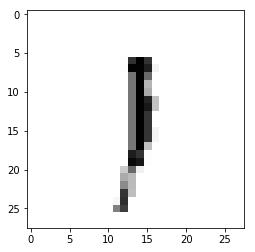

Epoch : 5 cost :  1.0522179681604555
Accuracy : 0.2597
label : [1]
Prediction : [0]


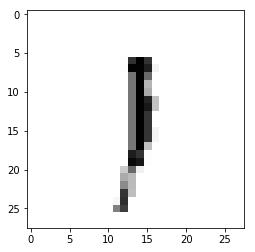

Epoch : 5 cost :  1.0561817147515034
Accuracy : 0.2595
label : [1]
Prediction : [0]


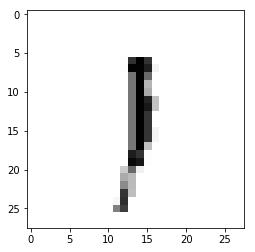

Epoch : 5 cost :  1.0601265053315594
Accuracy : 0.2588
label : [1]
Prediction : [0]


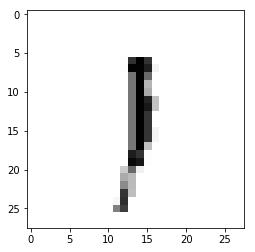

Epoch : 5 cost :  1.0640975592353126
Accuracy : 0.2594
label : [1]
Prediction : [0]


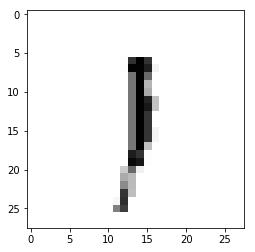

Epoch : 5 cost :  1.0680801356922496
Accuracy : 0.2599
label : [1]
Prediction : [0]


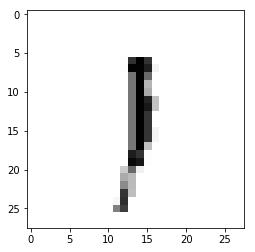

Epoch : 5 cost :  1.072086236260154
Accuracy : 0.2663
label : [1]
Prediction : [0]


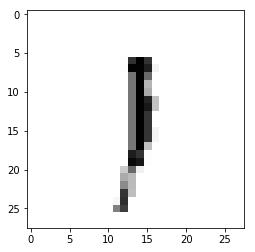

Epoch : 5 cost :  1.0760597775199197
Accuracy : 0.2688
label : [1]
Prediction : [0]


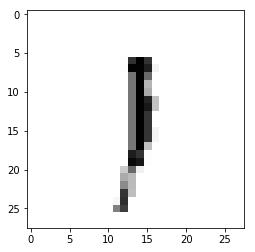

Epoch : 5 cost :  1.0800646513158625
Accuracy : 0.2721
label : [1]
Prediction : [0]


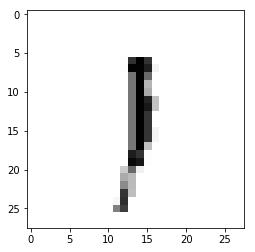

Epoch : 5 cost :  1.0839988353035668
Accuracy : 0.2721
label : [1]
Prediction : [0]


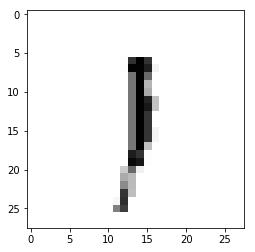

Epoch : 5 cost :  1.0878871228478173
Accuracy : 0.2715
label : [1]
Prediction : [0]


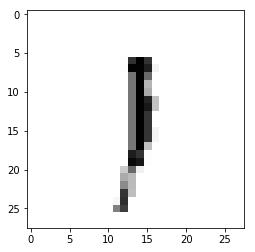

Epoch : 5 cost :  1.0918338411504573
Accuracy : 0.2701
label : [1]
Prediction : [0]


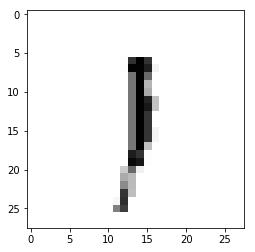

Epoch : 5 cost :  1.0957926069606436
Accuracy : 0.2712
label : [1]
Prediction : [0]


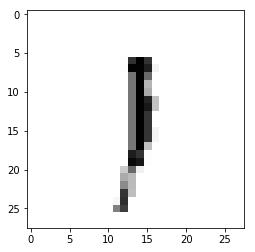

Epoch : 5 cost :  1.0997691011428834
Accuracy : 0.2726
label : [1]
Prediction : [0]


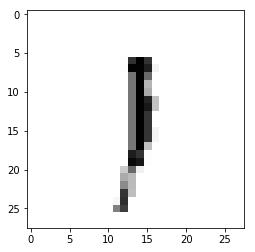

Epoch : 5 cost :  1.1037264160676437
Accuracy : 0.2718
label : [1]
Prediction : [0]


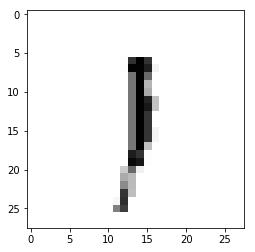

Epoch : 5 cost :  1.1076784372329713
Accuracy : 0.2694
label : [1]
Prediction : [0]


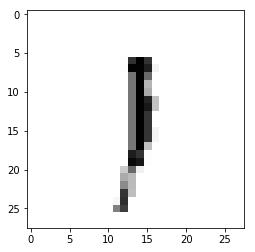

Epoch : 5 cost :  1.1116639757156372
Accuracy : 0.2735
label : [1]
Prediction : [0]


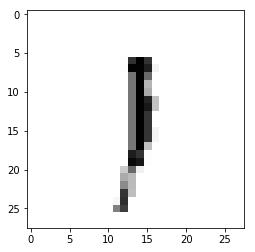

Epoch : 5 cost :  1.1156141337481413
Accuracy : 0.2733
label : [1]
Prediction : [0]


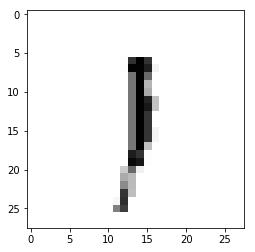

Epoch : 5 cost :  1.119627071727406
Accuracy : 0.2738
label : [1]
Prediction : [0]


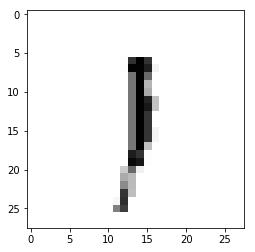

Epoch : 5 cost :  1.1235292690450496
Accuracy : 0.2742
label : [1]
Prediction : [0]


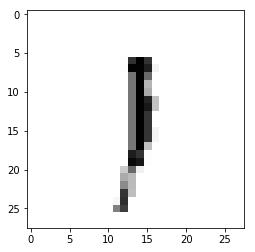

Epoch : 5 cost :  1.1275322138179433
Accuracy : 0.2739
label : [1]
Prediction : [0]


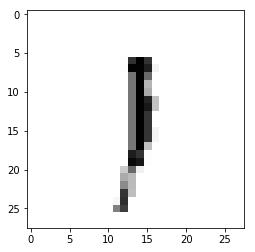

Epoch : 5 cost :  1.131557690013539
Accuracy : 0.2697
label : [1]
Prediction : [0]


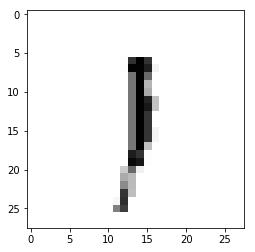

Epoch : 5 cost :  1.1355615464123814
Accuracy : 0.2548
label : [1]
Prediction : [0]


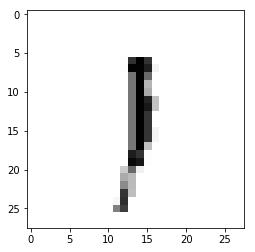

Epoch : 5 cost :  1.1394810607216577
Accuracy : 0.2505
label : [1]
Prediction : [0]


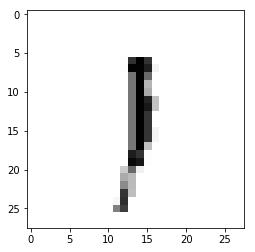

Epoch : 5 cost :  1.143398262804205
Accuracy : 0.2464
label : [1]
Prediction : [0]


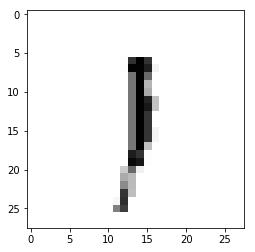

Epoch : 5 cost :  1.1473736446554013
Accuracy : 0.2473
label : [1]
Prediction : [0]


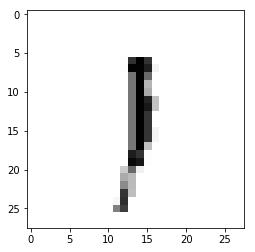

Epoch : 5 cost :  1.1512441427057443
Accuracy : 0.2594
label : [1]
Prediction : [0]


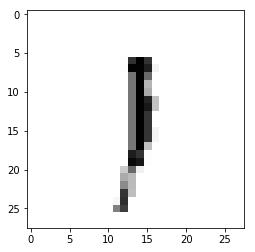

Epoch : 5 cost :  1.1551311657645489
Accuracy : 0.2464
label : [1]
Prediction : [0]


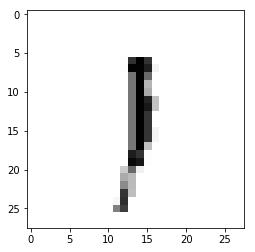

Epoch : 5 cost :  1.1591559267044071
Accuracy : 0.2485
label : [1]
Prediction : [0]


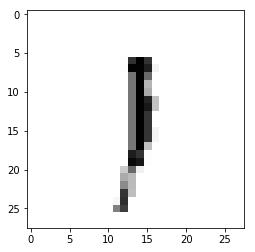

Epoch : 5 cost :  1.1631111153689302
Accuracy : 0.247
label : [1]
Prediction : [0]


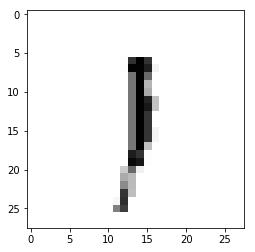

Epoch : 5 cost :  1.167041093652899
Accuracy : 0.2475
label : [1]
Prediction : [0]


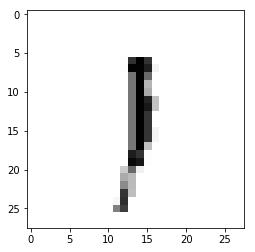

Epoch : 5 cost :  1.1710790941931988
Accuracy : 0.2544
label : [1]
Prediction : [0]


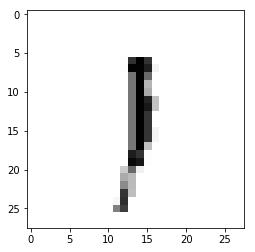

Epoch : 5 cost :  1.1750048195232048
Accuracy : 0.2533
label : [1]
Prediction : [0]


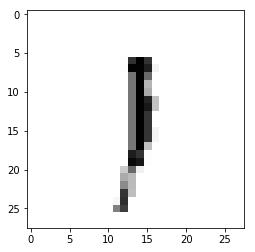

Epoch : 5 cost :  1.1789318279786547
Accuracy : 0.2473
label : [1]
Prediction : [0]


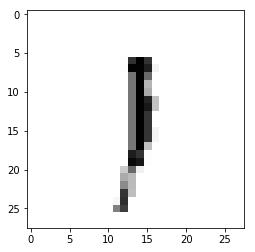

Epoch : 5 cost :  1.1828315245021477
Accuracy : 0.2484
label : [1]
Prediction : [0]


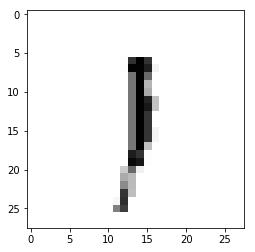

Epoch : 5 cost :  1.1867638739672577
Accuracy : 0.2476
label : [1]
Prediction : [0]


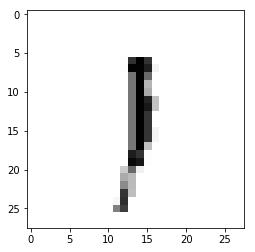

Epoch : 5 cost :  1.1906945627385923
Accuracy : 0.248
label : [1]
Prediction : [0]


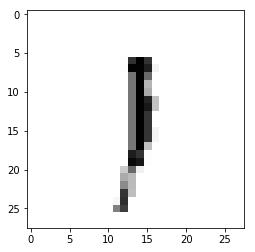

Epoch : 5 cost :  1.194669338139621
Accuracy : 0.2485
label : [1]
Prediction : [0]


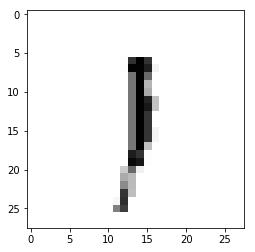

Epoch : 5 cost :  1.1985353261774239
Accuracy : 0.261
label : [1]
Prediction : [0]


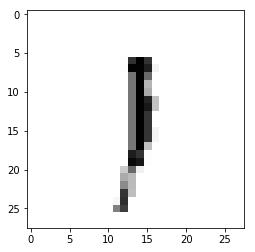

Epoch : 5 cost :  1.2024144796891647
Accuracy : 0.2718
label : [1]
Prediction : [0]


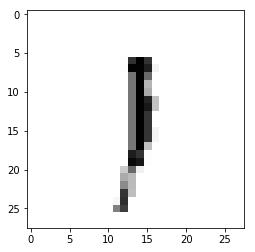

Epoch : 5 cost :  1.2063006015257403
Accuracy : 0.2725
label : [1]
Prediction : [0]


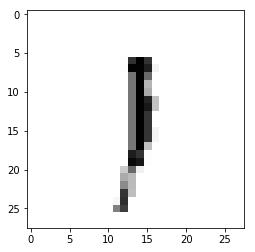

Epoch : 5 cost :  1.2102000934427435
Accuracy : 0.2748
label : [1]
Prediction : [0]


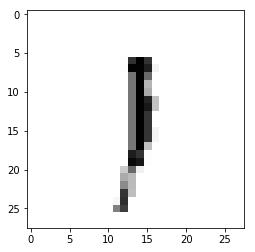

Epoch : 5 cost :  1.2142204119942406
Accuracy : 0.2748
label : [1]
Prediction : [0]


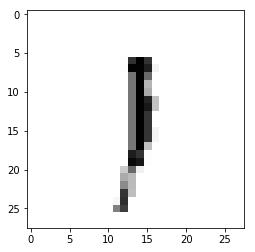

Epoch : 5 cost :  1.2181552085009488
Accuracy : 0.2769
label : [1]
Prediction : [0]


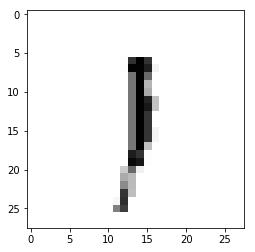

Epoch : 5 cost :  1.221981223713268
Accuracy : 0.2769
label : [1]
Prediction : [0]


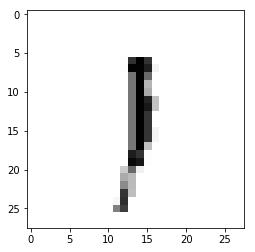

Epoch : 5 cost :  1.2259329990907148
Accuracy : 0.2774
label : [1]
Prediction : [0]


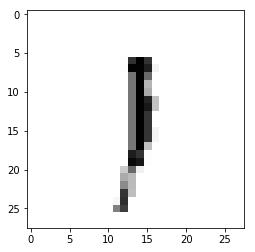

Epoch : 5 cost :  1.2297872192209416
Accuracy : 0.277
label : [1]
Prediction : [0]


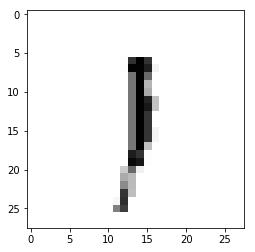

Epoch : 5 cost :  1.2338058168237858
Accuracy : 0.2768
label : [1]
Prediction : [0]


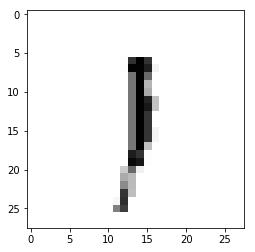

Epoch : 5 cost :  1.2377783974734218
Accuracy : 0.278
label : [1]
Prediction : [0]


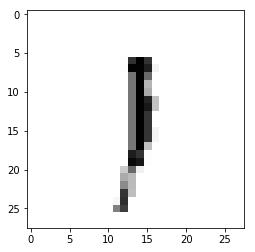

Epoch : 5 cost :  1.2416170480034565
Accuracy : 0.2709
label : [1]
Prediction : [0]


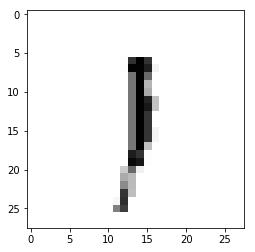

Epoch : 5 cost :  1.245554878494956
Accuracy : 0.268
label : [1]
Prediction : [0]


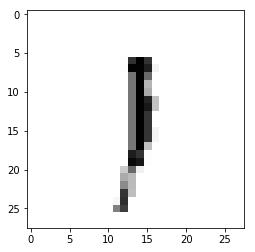

Epoch : 5 cost :  1.249542612162503
Accuracy : 0.2685
label : [1]
Prediction : [0]


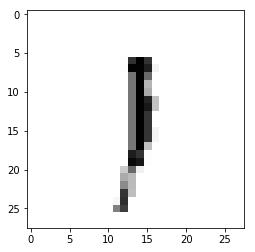

Epoch : 5 cost :  1.2535055789080531
Accuracy : 0.2677
label : [1]
Prediction : [0]


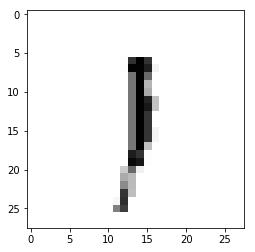

Epoch : 5 cost :  1.2573630267923528
Accuracy : 0.2662
label : [1]
Prediction : [0]


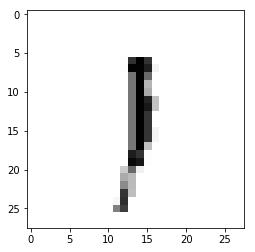

Epoch : 5 cost :  1.2612750001387163
Accuracy : 0.2657
label : [1]
Prediction : [0]


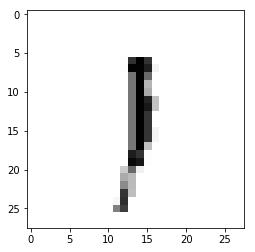

Epoch : 5 cost :  1.265183077725497
Accuracy : 0.2647
label : [1]
Prediction : [0]


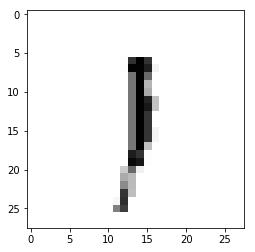

Epoch : 5 cost :  1.269095634547147
Accuracy : 0.264
label : [1]
Prediction : [0]


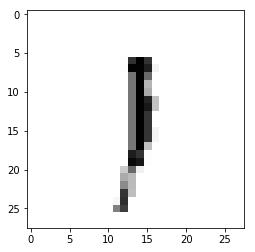

Epoch : 5 cost :  1.27296932220459
Accuracy : 0.2649
label : [1]
Prediction : [0]


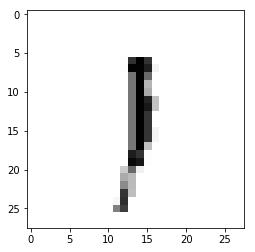

Epoch : 5 cost :  1.276860374103893
Accuracy : 0.2648
label : [1]
Prediction : [0]


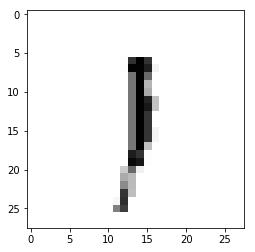

Epoch : 5 cost :  1.2807998609542848
Accuracy : 0.2654
label : [1]
Prediction : [0]


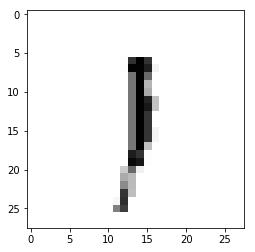

Epoch : 5 cost :  1.2847462233630094
Accuracy : 0.2652
label : [1]
Prediction : [0]


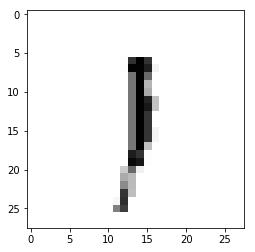

Epoch : 5 cost :  1.2885530042648314
Accuracy : 0.2649
label : [1]
Prediction : [0]


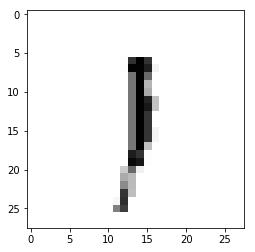

Epoch : 5 cost :  1.2924293140931562
Accuracy : 0.2637
label : [1]
Prediction : [0]


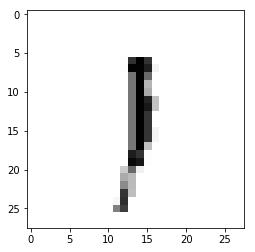

Epoch : 5 cost :  1.2962293780933727
Accuracy : 0.2651
label : [1]
Prediction : [0]


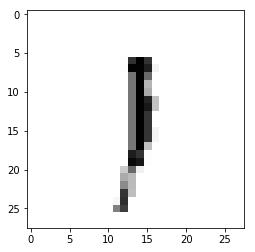

Epoch : 5 cost :  1.3000303004004738
Accuracy : 0.2651
label : [1]
Prediction : [0]


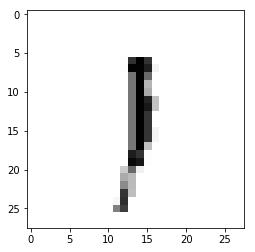

Epoch : 5 cost :  1.3039143640344792
Accuracy : 0.2666
label : [1]
Prediction : [0]


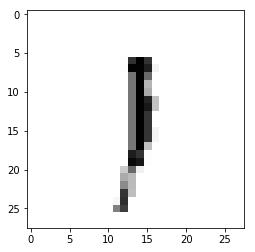

Epoch : 5 cost :  1.3078664536909623
Accuracy : 0.2656
label : [1]
Prediction : [0]


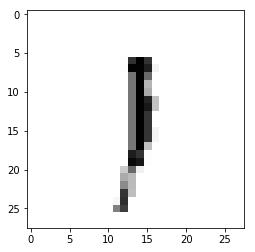

Epoch : 5 cost :  1.311739739071239
Accuracy : 0.265
label : [1]
Prediction : [0]


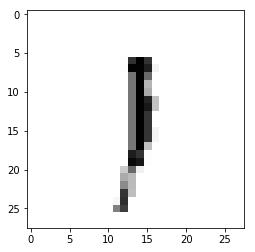

Epoch : 5 cost :  1.3156529651988635
Accuracy : 0.2653
label : [1]
Prediction : [0]


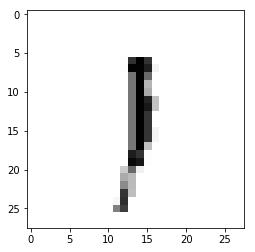

Epoch : 5 cost :  1.319519583528692
Accuracy : 0.2659
label : [1]
Prediction : [0]


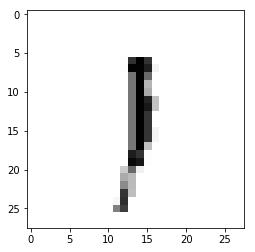

Epoch : 5 cost :  1.3234333653883499
Accuracy : 0.2663
label : [1]
Prediction : [0]


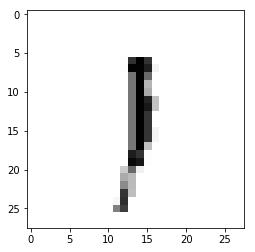

Epoch : 5 cost :  1.3272829224846578
Accuracy : 0.2659
label : [1]
Prediction : [0]


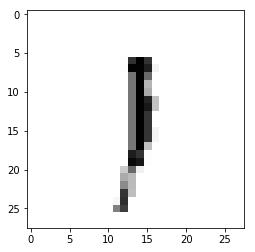

Epoch : 5 cost :  1.331165963519703
Accuracy : 0.2657
label : [1]
Prediction : [0]


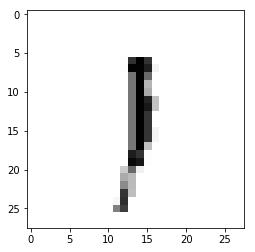

Epoch : 5 cost :  1.3351364365490999
Accuracy : 0.2663
label : [1]
Prediction : [0]


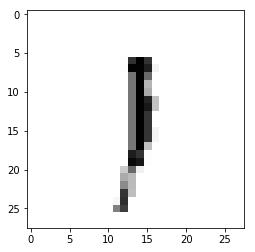

Epoch : 5 cost :  1.3390192235599863
Accuracy : 0.2652
label : [1]
Prediction : [0]


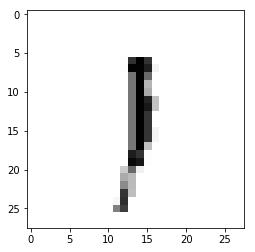

Epoch : 5 cost :  1.342916973720897
Accuracy : 0.2671
label : [1]
Prediction : [0]


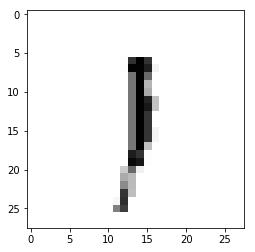

Epoch : 5 cost :  1.3468846494501285
Accuracy : 0.2663
label : [1]
Prediction : [0]


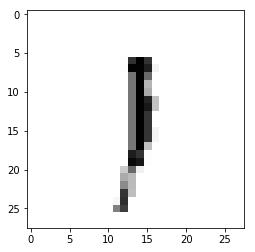

Epoch : 5 cost :  1.3507682150060478
Accuracy : 0.2665
label : [1]
Prediction : [0]


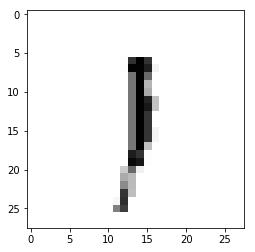

Epoch : 5 cost :  1.3547243230993096
Accuracy : 0.2669
label : [1]
Prediction : [0]


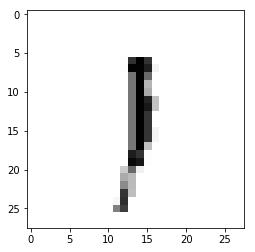

Epoch : 5 cost :  1.3586881923675536
Accuracy : 0.2646
label : [1]
Prediction : [0]


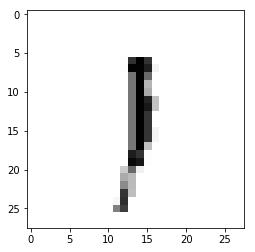

Epoch : 5 cost :  1.3626115651564163
Accuracy : 0.265
label : [1]
Prediction : [0]


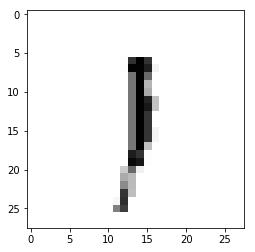

Epoch : 5 cost :  1.3665706023302944
Accuracy : 0.2648
label : [1]
Prediction : [0]


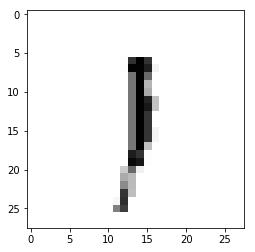

Epoch : 5 cost :  1.3704653189399023
Accuracy : 0.264
label : [1]
Prediction : [0]


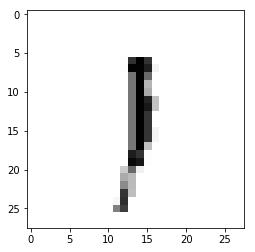

Epoch : 5 cost :  1.3744332447918977
Accuracy : 0.2391
label : [1]
Prediction : [0]


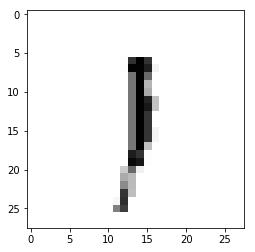

Epoch : 5 cost :  1.378379556049
Accuracy : 0.2403
label : [1]
Prediction : [0]


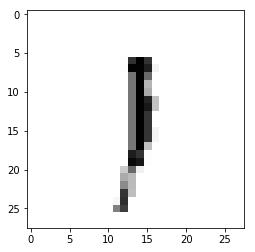

Epoch : 5 cost :  1.3822676658630368
Accuracy : 0.2399
label : [1]
Prediction : [0]


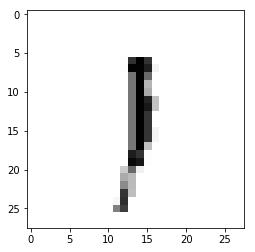

Epoch : 5 cost :  1.386233646652915
Accuracy : 0.2533
label : [1]
Prediction : [0]


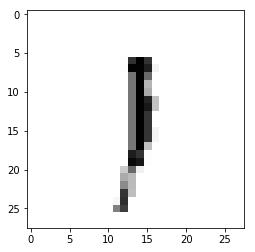

Epoch : 5 cost :  1.390152380683205
Accuracy : 0.2575
label : [1]
Prediction : [0]


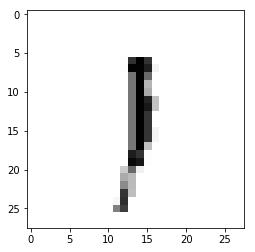

Epoch : 5 cost :  1.3941574443470344
Accuracy : 0.2475
label : [1]
Prediction : [0]


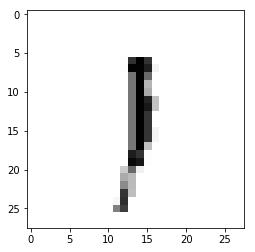

Epoch : 5 cost :  1.398124774152582
Accuracy : 0.2489
label : [1]
Prediction : [0]


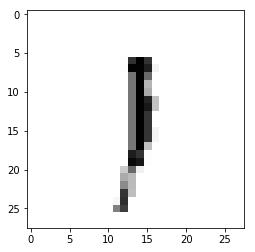

Epoch : 5 cost :  1.4019789197228167
Accuracy : 0.2503
label : [1]
Prediction : [0]


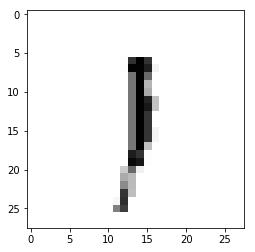

Epoch : 5 cost :  1.4058488078550855
Accuracy : 0.2495
label : [1]
Prediction : [0]


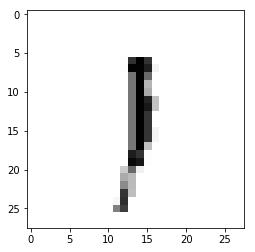

Epoch : 5 cost :  1.4098563519391143
Accuracy : 0.2597
label : [1]
Prediction : [0]


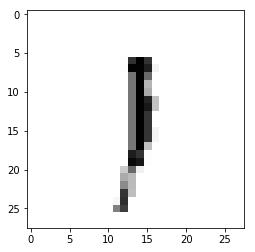

Epoch : 5 cost :  1.413779076229442
Accuracy : 0.2562
label : [1]
Prediction : [0]


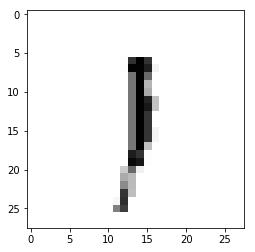

Epoch : 5 cost :  1.417661045247858
Accuracy : 0.2649
label : [1]
Prediction : [0]


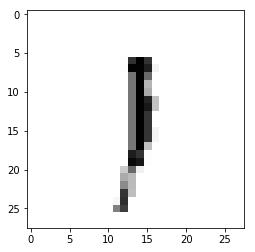

Epoch : 5 cost :  1.4214650032737035
Accuracy : 0.2641
label : [1]
Prediction : [0]


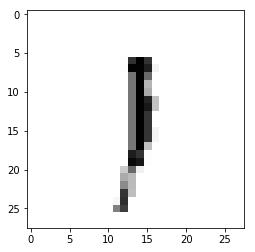

Epoch : 5 cost :  1.4253727375377305
Accuracy : 0.2651
label : [1]
Prediction : [0]


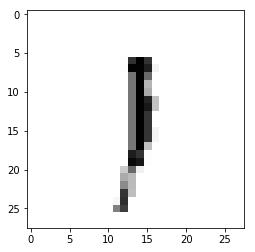

Epoch : 5 cost :  1.4293324938687408
Accuracy : 0.2656
label : [1]
Prediction : [0]


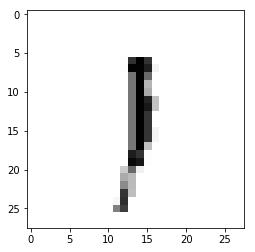

Epoch : 5 cost :  1.4332526831193402
Accuracy : 0.2662
label : [1]
Prediction : [0]


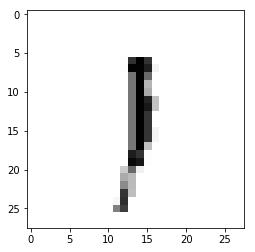

Epoch : 5 cost :  1.4371299067410555
Accuracy : 0.2655
label : [1]
Prediction : [0]


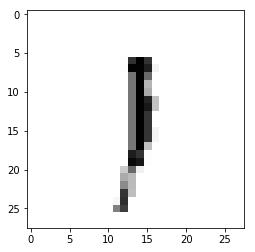

Epoch : 5 cost :  1.4410897371985694
Accuracy : 0.2662
label : [1]
Prediction : [0]


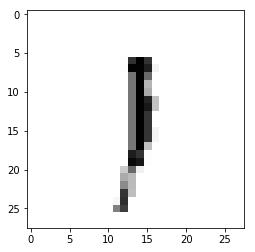

Epoch : 5 cost :  1.445039818937128
Accuracy : 0.2686
label : [1]
Prediction : [0]


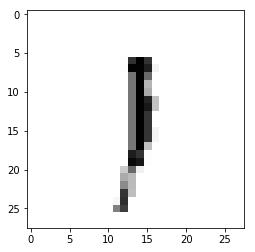

Epoch : 5 cost :  1.4489835544065994
Accuracy : 0.2687
label : [1]
Prediction : [0]


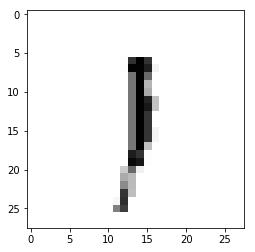

Epoch : 5 cost :  1.4528068538145584
Accuracy : 0.2677
label : [1]
Prediction : [0]


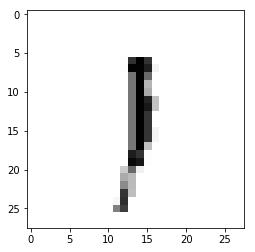

Epoch : 5 cost :  1.4566459668766367
Accuracy : 0.2671
label : [1]
Prediction : [0]


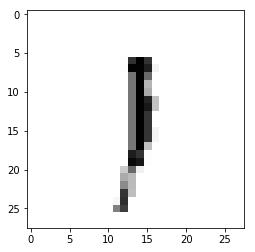

Epoch : 5 cost :  1.4604990941827947
Accuracy : 0.2661
label : [1]
Prediction : [0]


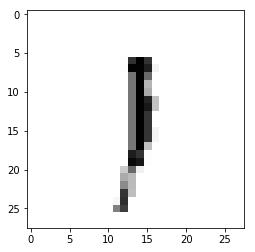

Epoch : 5 cost :  1.4643560934066773
Accuracy : 0.2654
label : [1]
Prediction : [0]


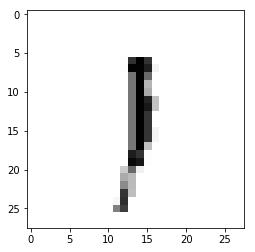

Epoch : 5 cost :  1.4682307382063433
Accuracy : 0.266
label : [1]
Prediction : [0]


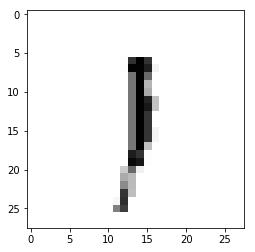

Epoch : 5 cost :  1.472208745696328
Accuracy : 0.2671
label : [1]
Prediction : [0]


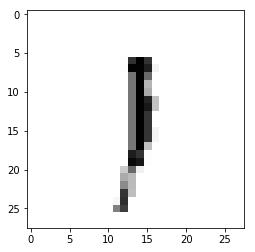

Epoch : 5 cost :  1.475986793691462
Accuracy : 0.2676
label : [1]
Prediction : [0]


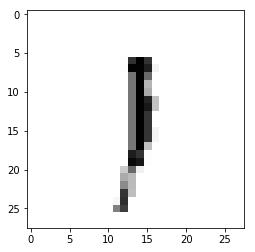

Epoch : 5 cost :  1.479911370277405
Accuracy : 0.2664
label : [1]
Prediction : [0]


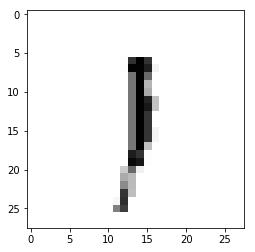

Epoch : 5 cost :  1.4837969810312446
Accuracy : 0.2667
label : [1]
Prediction : [0]


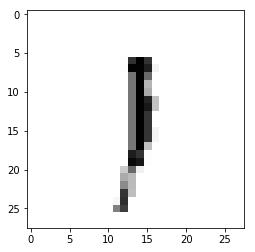

Epoch : 5 cost :  1.4876875391873448
Accuracy : 0.2689
label : [1]
Prediction : [0]


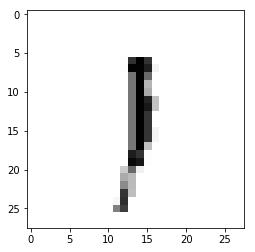

Epoch : 5 cost :  1.491575255393982
Accuracy : 0.2685
label : [1]
Prediction : [0]


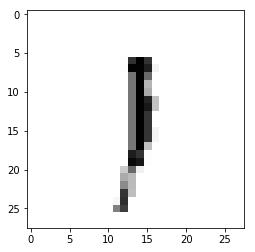

Epoch : 5 cost :  1.495468221144243
Accuracy : 0.2677
label : [1]
Prediction : [0]


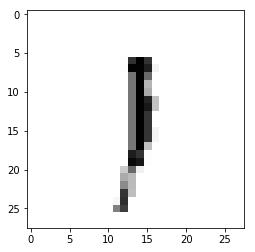

Epoch : 5 cost :  1.499277415275574
Accuracy : 0.2694
label : [1]
Prediction : [0]


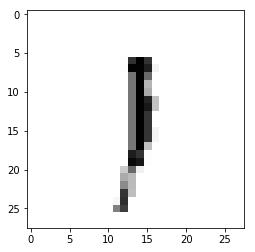

Epoch : 5 cost :  1.5031463748758491
Accuracy : 0.2703
label : [1]
Prediction : [0]


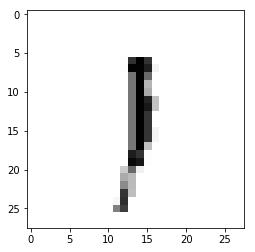

Epoch : 5 cost :  1.507061605020003
Accuracy : 0.2698
label : [1]
Prediction : [0]


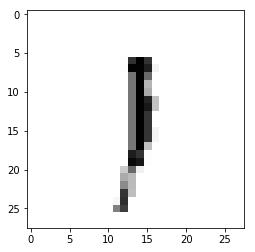

Epoch : 5 cost :  1.5110341063412753
Accuracy : 0.2687
label : [1]
Prediction : [0]


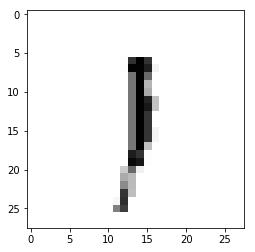

Epoch : 5 cost :  1.51501371123574
Accuracy : 0.2524
label : [1]
Prediction : [0]


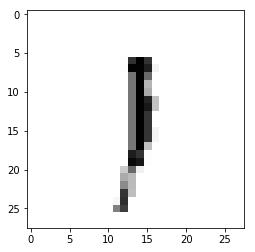

Epoch : 5 cost :  1.5189347288825297
Accuracy : 0.2516
label : [1]
Prediction : [0]


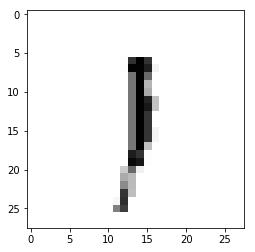

Epoch : 5 cost :  1.5227680262652312
Accuracy : 0.2519
label : [1]
Prediction : [0]


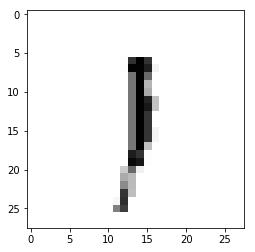

Epoch : 5 cost :  1.5266059103879064
Accuracy : 0.2508
label : [1]
Prediction : [0]


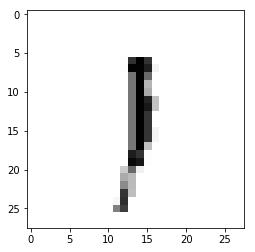

Epoch : 5 cost :  1.530412867719477
Accuracy : 0.2527
label : [1]
Prediction : [0]


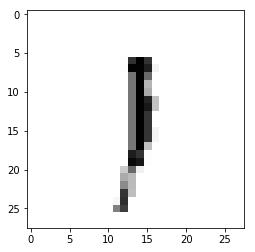

Epoch : 5 cost :  1.5343810354579581
Accuracy : 0.2684
label : [1]
Prediction : [0]


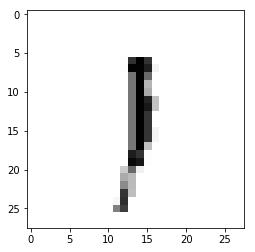

Epoch : 5 cost :  1.5382749258388175
Accuracy : 0.2692
label : [1]
Prediction : [0]


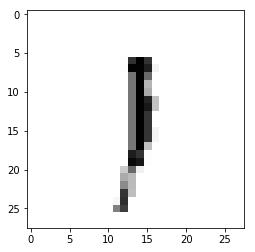

Epoch : 5 cost :  1.542279049699957
Accuracy : 0.2728
label : [1]
Prediction : [0]


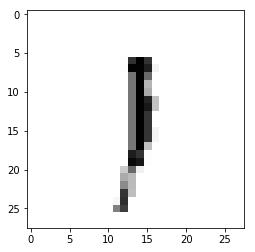

Epoch : 5 cost :  1.5461624301563612
Accuracy : 0.2748
label : [1]
Prediction : [0]


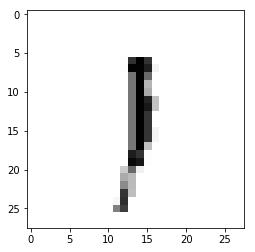

Epoch : 5 cost :  1.5499247815392236
Accuracy : 0.2717
label : [1]
Prediction : [0]


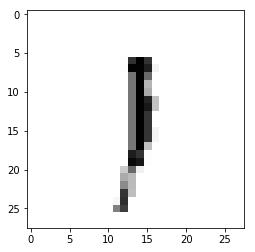

Epoch : 5 cost :  1.5539238036762586
Accuracy : 0.2788
label : [1]
Prediction : [0]


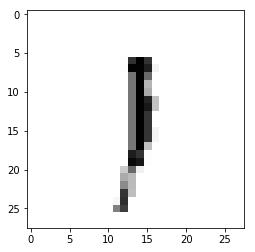

Epoch : 5 cost :  1.557747569517656
Accuracy : 0.2744
label : [1]
Prediction : [0]


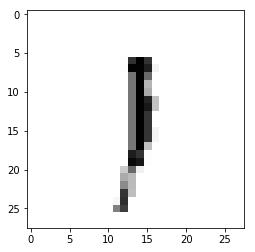

Epoch : 5 cost :  1.5616919400475242
Accuracy : 0.2749
label : [1]
Prediction : [0]


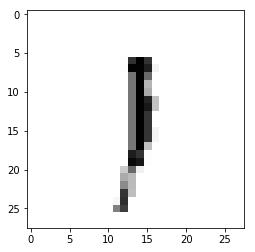

Epoch : 5 cost :  1.5655346523631704
Accuracy : 0.2816
label : [1]
Prediction : [0]


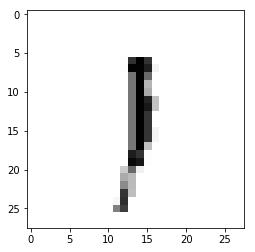

Epoch : 5 cost :  1.569507839462974
Accuracy : 0.2747
label : [1]
Prediction : [0]


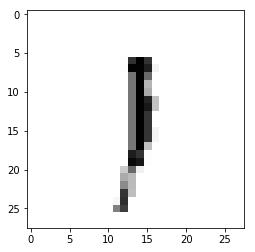

Epoch : 5 cost :  1.5735750228708443
Accuracy : 0.2843
label : [1]
Prediction : [0]


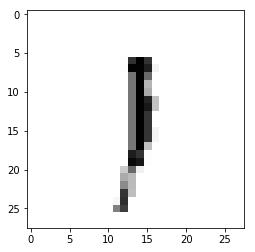

Epoch : 5 cost :  1.5775052547454835
Accuracy : 0.2865
label : [1]
Prediction : [0]


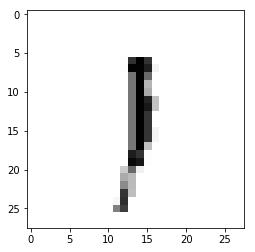

Epoch : 5 cost :  1.5814456077055499
Accuracy : 0.2806
label : [1]
Prediction : [0]


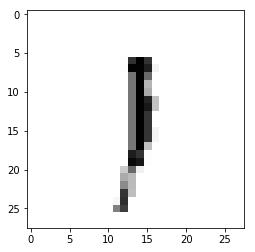

Epoch : 5 cost :  1.5852899776805531
Accuracy : 0.2751
label : [1]
Prediction : [0]


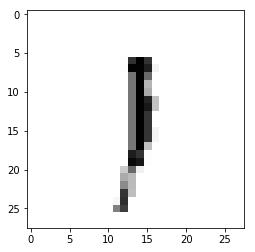

Epoch : 5 cost :  1.5892278346148405
Accuracy : 0.274
label : [1]
Prediction : [0]


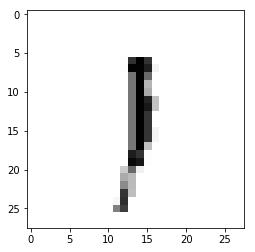

Epoch : 5 cost :  1.5930887647108598
Accuracy : 0.2743
label : [1]
Prediction : [0]


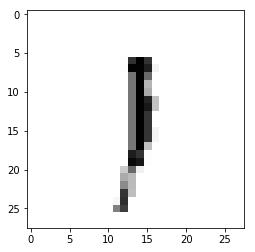

Epoch : 5 cost :  1.597002838308161
Accuracy : 0.2733
label : [1]
Prediction : [0]


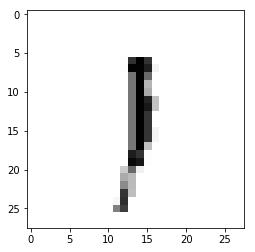

Epoch : 5 cost :  1.6008320400931617
Accuracy : 0.2728
label : [1]
Prediction : [0]


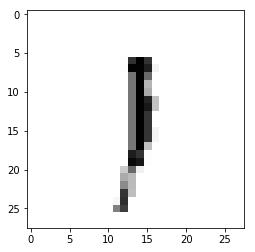

Epoch : 5 cost :  1.6046612912958318
Accuracy : 0.2747
label : [1]
Prediction : [0]


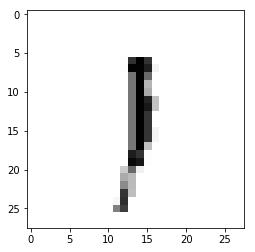

Epoch : 5 cost :  1.608532372821461
Accuracy : 0.2762
label : [1]
Prediction : [0]


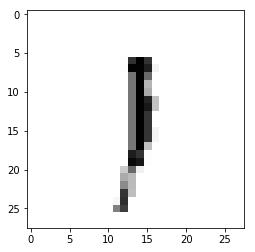

Epoch : 5 cost :  1.6124309010939164
Accuracy : 0.2769
label : [1]
Prediction : [0]


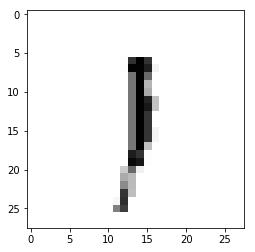

Epoch : 5 cost :  1.6163264339620416
Accuracy : 0.2772
label : [1]
Prediction : [0]


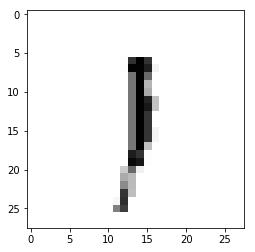

Epoch : 5 cost :  1.6201910920576614
Accuracy : 0.278
label : [1]
Prediction : [0]


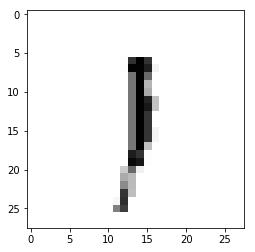

Epoch : 5 cost :  1.6241036748886106
Accuracy : 0.2774
label : [1]
Prediction : [0]


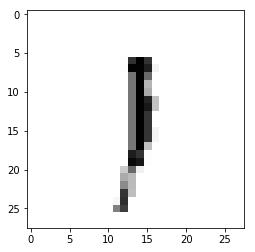

Epoch : 5 cost :  1.628002772764726
Accuracy : 0.2779
label : [1]
Prediction : [0]


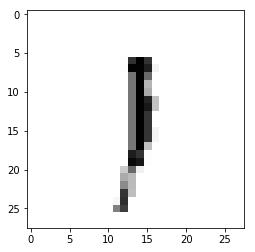

Epoch : 5 cost :  1.631924339641224
Accuracy : 0.2775
label : [1]
Prediction : [0]


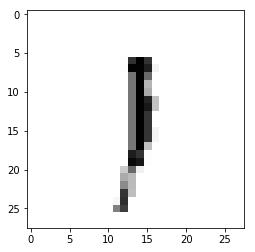

Epoch : 5 cost :  1.6358393114263359
Accuracy : 0.2776
label : [1]
Prediction : [0]


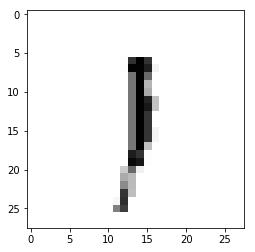

Epoch : 5 cost :  1.6397457070784134
Accuracy : 0.2782
label : [1]
Prediction : [0]


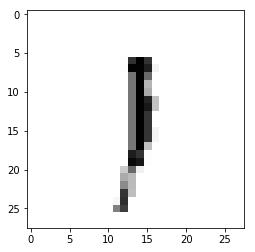

Epoch : 5 cost :  1.6436011734875764
Accuracy : 0.2783
label : [1]
Prediction : [0]


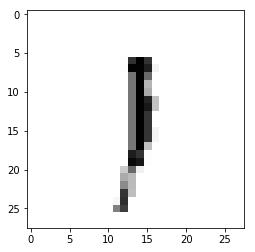

Epoch : 5 cost :  1.6474868947809391
Accuracy : 0.2779
label : [1]
Prediction : [0]


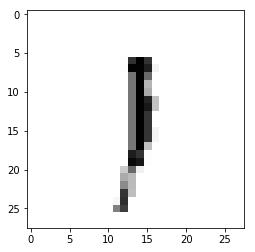

Epoch : 5 cost :  1.6513014078140258
Accuracy : 0.2762
label : [1]
Prediction : [0]


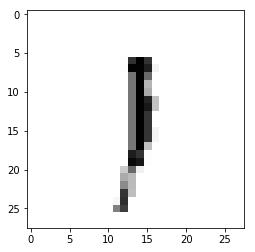

Epoch : 5 cost :  1.6552629019997336
Accuracy : 0.2767
label : [1]
Prediction : [0]


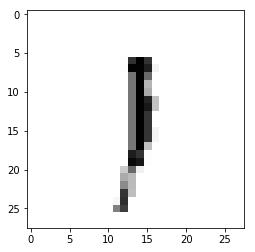

Epoch : 5 cost :  1.6590862421555952
Accuracy : 0.2746
label : [1]
Prediction : [0]


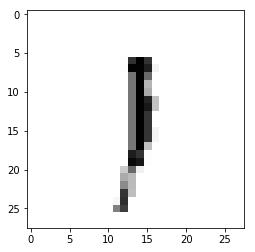

Epoch : 5 cost :  1.6629433120380748
Accuracy : 0.2688
label : [1]
Prediction : [0]


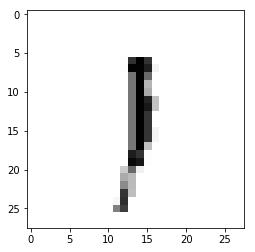

Epoch : 5 cost :  1.6667738966508345
Accuracy : 0.2733
label : [1]
Prediction : [0]


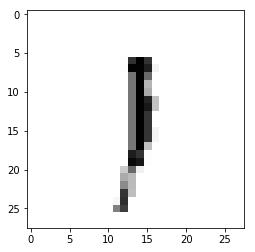

Epoch : 5 cost :  1.6705848056619819
Accuracy : 0.2661
label : [1]
Prediction : [0]


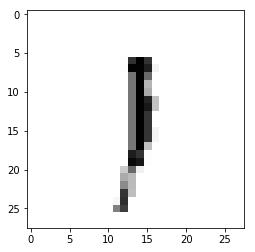

Epoch : 5 cost :  1.6743378587202593
Accuracy : 0.2701
label : [1]
Prediction : [0]


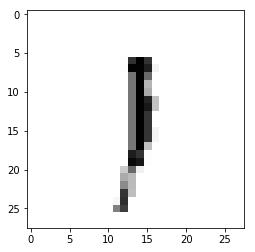

Epoch : 5 cost :  1.678127318729054
Accuracy : 0.284
label : [1]
Prediction : [0]


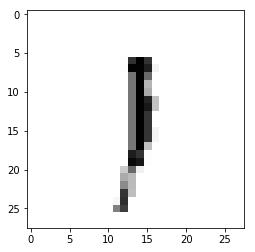

Epoch : 5 cost :  1.6819905276732012
Accuracy : 0.283
label : [1]
Prediction : [0]


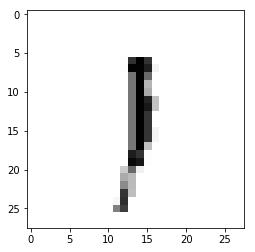

Epoch : 5 cost :  1.6858214365352284
Accuracy : 0.2833
label : [1]
Prediction : [0]


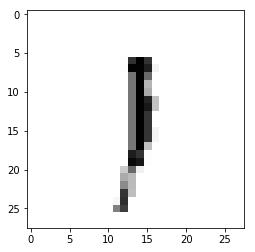

Epoch : 5 cost :  1.6896782727675004
Accuracy : 0.2831
label : [1]
Prediction : [0]


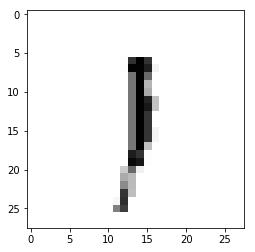

Epoch : 5 cost :  1.6936110071702437
Accuracy : 0.2839
label : [1]
Prediction : [0]


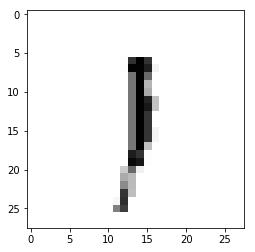

Epoch : 5 cost :  1.6975738221948797
Accuracy : 0.2757
label : [1]
Prediction : [0]


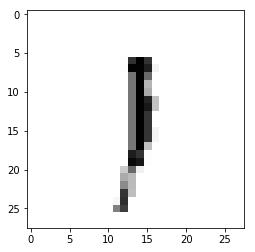

Epoch : 5 cost :  1.7014948350732977
Accuracy : 0.2737
label : [1]
Prediction : [0]


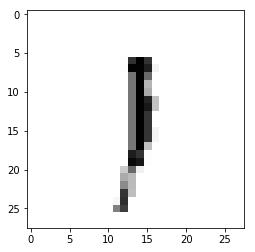

Epoch : 5 cost :  1.705264048576355
Accuracy : 0.2767
label : [1]
Prediction : [0]


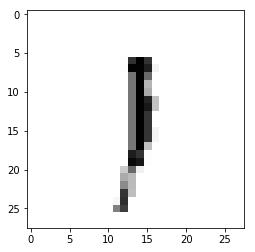

Epoch : 5 cost :  1.709243564605713
Accuracy : 0.2722
label : [1]
Prediction : [0]


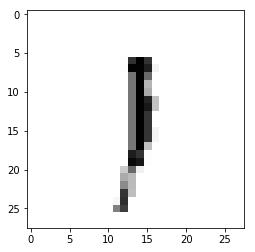

Epoch : 5 cost :  1.7130983725461093
Accuracy : 0.2586
label : [1]
Prediction : [0]


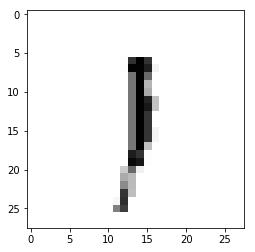

Epoch : 5 cost :  1.716899236765775
Accuracy : 0.2579
label : [1]
Prediction : [0]


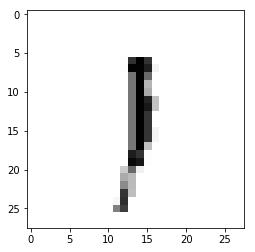

Epoch : 5 cost :  1.7208060411973434
Accuracy : 0.2754
label : [1]
Prediction : [0]


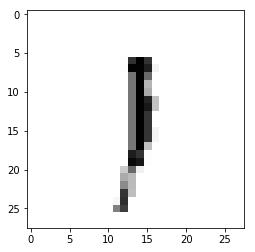

Epoch : 5 cost :  1.7246853104504674
Accuracy : 0.2674
label : [1]
Prediction : [0]


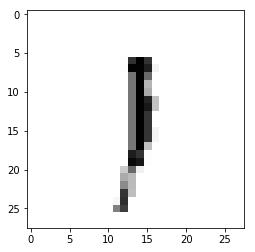

Epoch : 5 cost :  1.7286644259366124
Accuracy : 0.2675
label : [1]
Prediction : [0]


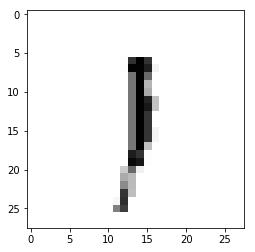

Epoch : 5 cost :  1.7324050647562201
Accuracy : 0.2679
label : [1]
Prediction : [0]


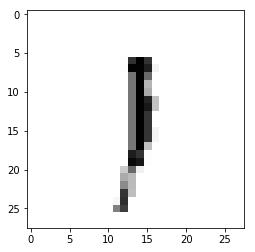

Epoch : 5 cost :  1.736324826153842
Accuracy : 0.269
label : [1]
Prediction : [0]


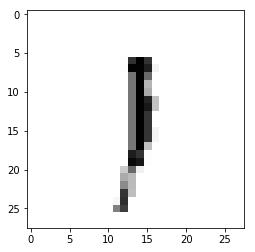

Epoch : 5 cost :  1.7401844653216276
Accuracy : 0.2688
label : [1]
Prediction : [0]


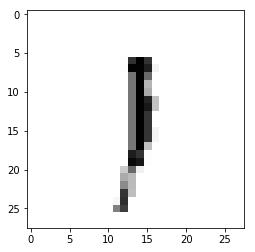

Epoch : 5 cost :  1.7440348339080811
Accuracy : 0.2663
label : [1]
Prediction : [0]


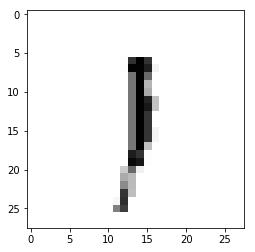

Epoch : 5 cost :  1.7478686930916527
Accuracy : 0.2691
label : [1]
Prediction : [0]


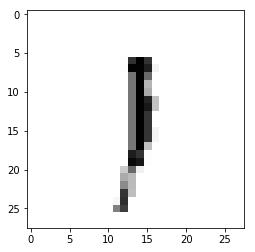

Epoch : 5 cost :  1.7516499306938866
Accuracy : 0.2674
label : [1]
Prediction : [0]


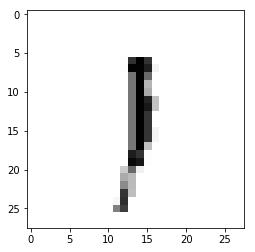

Epoch : 5 cost :  1.755545734058727
Accuracy : 0.2682
label : [1]
Prediction : [0]


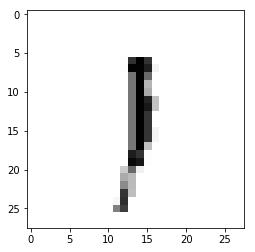

Epoch : 5 cost :  1.7594800983775747
Accuracy : 0.2704
label : [1]
Prediction : [0]


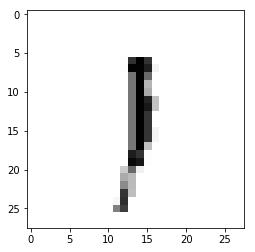

Epoch : 5 cost :  1.7634464706074109
Accuracy : 0.2671
label : [1]
Prediction : [0]


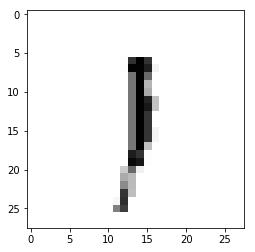

Epoch : 5 cost :  1.76734995061701
Accuracy : 0.2664
label : [1]
Prediction : [0]


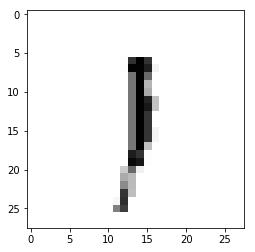

Epoch : 5 cost :  1.77125160260634
Accuracy : 0.2652
label : [1]
Prediction : [0]


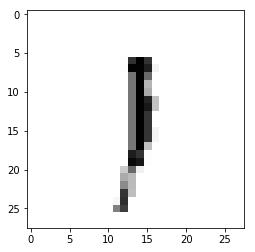

Epoch : 5 cost :  1.7750588109276513
Accuracy : 0.2647
label : [1]
Prediction : [0]


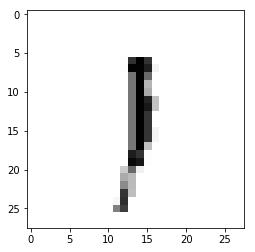

Epoch : 5 cost :  1.7789731277119032
Accuracy : 0.2655
label : [1]
Prediction : [0]


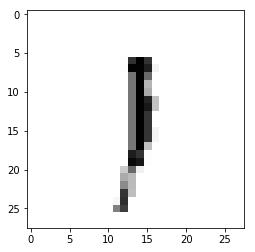

Epoch : 5 cost :  1.782802059000189
Accuracy : 0.2659
label : [1]
Prediction : [0]


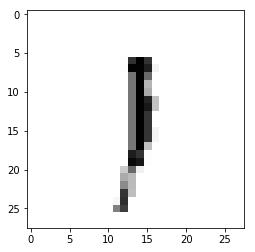

Epoch : 5 cost :  1.786890529285778
Accuracy : 0.2668
label : [1]
Prediction : [0]


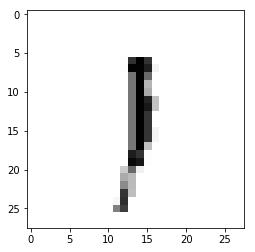

Epoch : 5 cost :  1.7907673042470762
Accuracy : 0.2683
label : [1]
Prediction : [0]


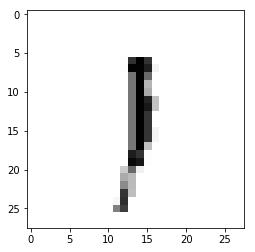

Epoch : 5 cost :  1.7946889981356537
Accuracy : 0.2709
label : [1]
Prediction : [0]


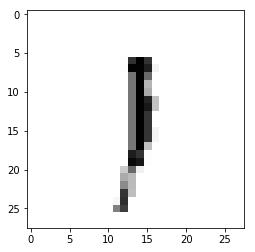

Epoch : 5 cost :  1.7984151827205315
Accuracy : 0.2769
label : [1]
Prediction : [0]


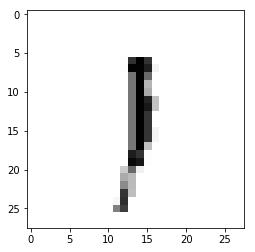

Epoch : 5 cost :  1.8023093800111254
Accuracy : 0.2746
label : [1]
Prediction : [0]


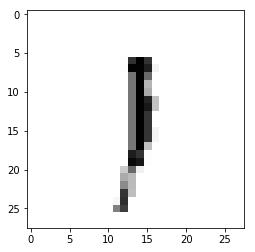

Epoch : 5 cost :  1.8061719465255741
Accuracy : 0.2785
label : [1]
Prediction : [0]


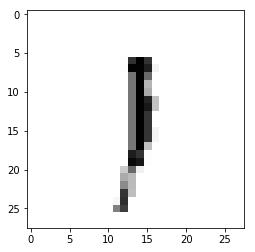

Epoch : 5 cost :  1.809959491382946
Accuracy : 0.2759
label : [1]
Prediction : [0]


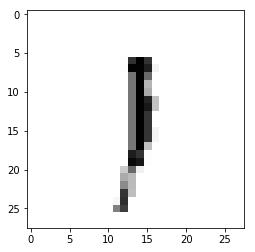

Epoch : 5 cost :  1.8137200828032063
Accuracy : 0.2763
label : [1]
Prediction : [0]


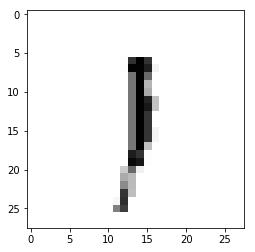

Epoch : 5 cost :  1.8175879764556888
Accuracy : 0.2781
label : [1]
Prediction : [0]


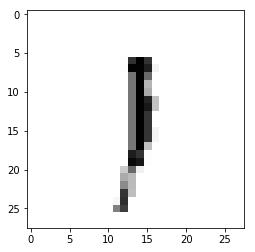

Epoch : 5 cost :  1.8214966682954272
Accuracy : 0.2812
label : [1]
Prediction : [0]


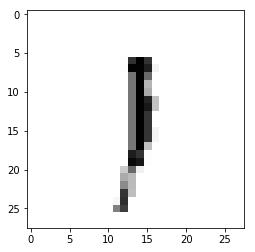

Epoch : 5 cost :  1.8253516153855762
Accuracy : 0.2796
label : [1]
Prediction : [0]


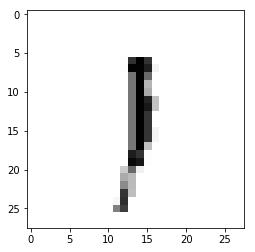

Epoch : 5 cost :  1.8291517027941622
Accuracy : 0.2807
label : [1]
Prediction : [0]


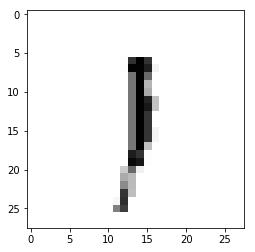

Epoch : 5 cost :  1.8330800628662114
Accuracy : 0.2797
label : [1]
Prediction : [0]


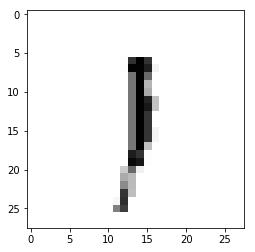

Epoch : 5 cost :  1.8369300330768936
Accuracy : 0.28
label : [1]
Prediction : [0]


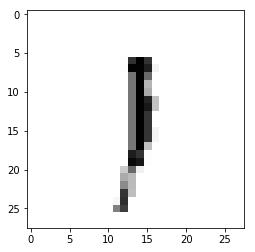

Epoch : 5 cost :  1.8407748998295181
Accuracy : 0.2789
label : [1]
Prediction : [0]


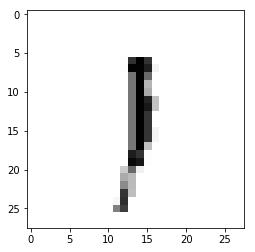

Epoch : 5 cost :  1.8446661168878733
Accuracy : 0.2794
label : [1]
Prediction : [0]


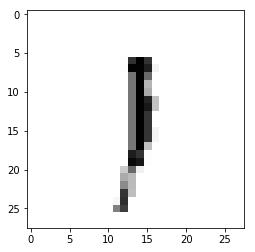

Epoch : 5 cost :  1.8485089080983947
Accuracy : 0.2805
label : [1]
Prediction : [0]


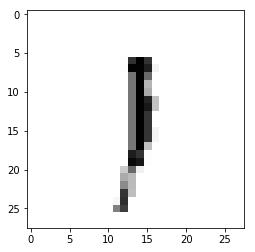

Epoch : 5 cost :  1.852290200753646
Accuracy : 0.2807
label : [1]
Prediction : [0]


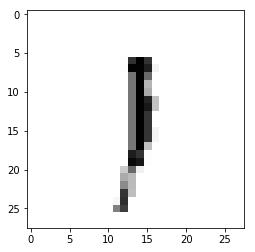

Epoch : 5 cost :  1.8560461321744057
Accuracy : 0.2798
label : [1]
Prediction : [0]


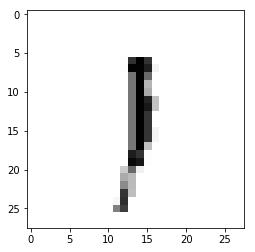

Epoch : 5 cost :  1.8599096332896845
Accuracy : 0.2798
label : [1]
Prediction : [0]


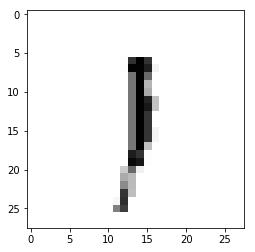

Epoch : 5 cost :  1.8637189245224004
Accuracy : 0.2815
label : [1]
Prediction : [0]


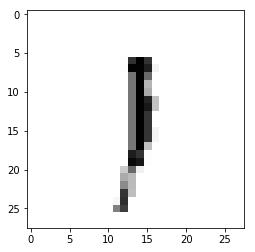

Epoch : 5 cost :  1.867605232758956
Accuracy : 0.2804
label : [1]
Prediction : [0]


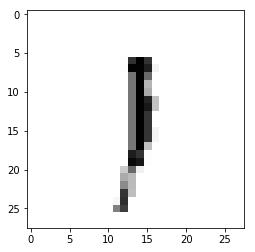

Epoch : 5 cost :  1.871392249194059
Accuracy : 0.279
label : [1]
Prediction : [0]


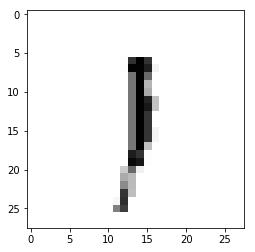

Epoch : 5 cost :  1.875038758191196
Accuracy : 0.2781
label : [1]
Prediction : [0]


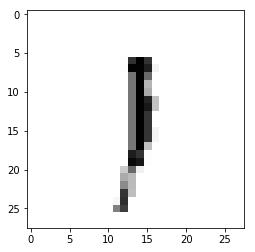

Epoch : 5 cost :  1.8787914211099805
Accuracy : 0.2773
label : [1]
Prediction : [0]


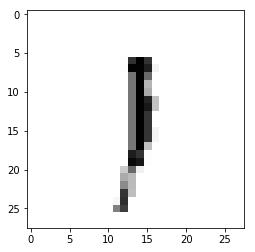

Epoch : 5 cost :  1.8826027610085234
Accuracy : 0.277
label : [1]
Prediction : [0]


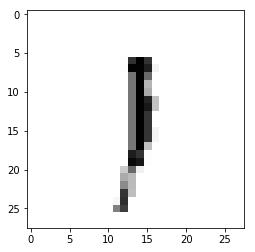

Epoch : 5 cost :  1.8864937491850426
Accuracy : 0.2794
label : [1]
Prediction : [0]


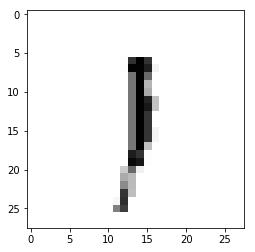

Epoch : 5 cost :  1.8903683467344812
Accuracy : 0.2799
label : [1]
Prediction : [0]


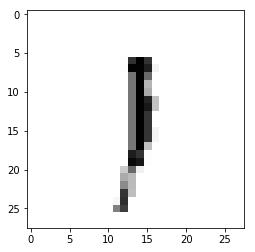

Epoch : 5 cost :  1.894206060062756
Accuracy : 0.283
label : [1]
Prediction : [0]


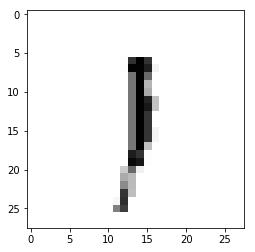

Epoch : 5 cost :  1.8981397724151619
Accuracy : 0.291
label : [1]
Prediction : [0]


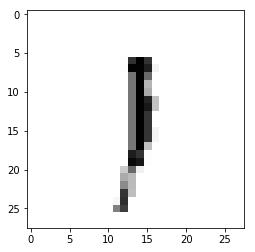

Epoch : 5 cost :  1.9020113771612002
Accuracy : 0.2903
label : [1]
Prediction : [0]


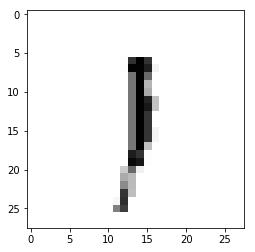

Epoch : 5 cost :  1.9059272657741209
Accuracy : 0.2899
label : [1]
Prediction : [0]


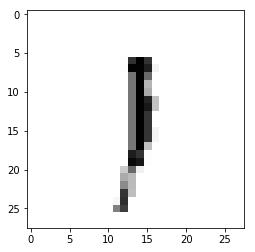

Epoch : 5 cost :  1.9096979674426
Accuracy : 0.2918
label : [1]
Prediction : [0]


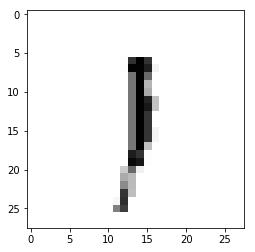

Epoch : 5 cost :  1.9135907251184645
Accuracy : 0.2825
label : [1]
Prediction : [0]


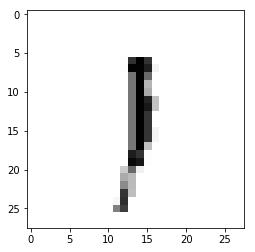

Epoch : 5 cost :  1.9173801500147047
Accuracy : 0.283
label : [1]
Prediction : [0]


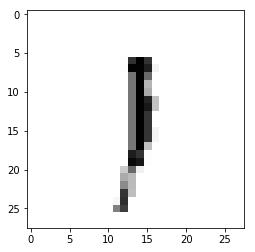

Epoch : 5 cost :  1.9211642308668666
Accuracy : 0.2813
label : [1]
Prediction : [0]


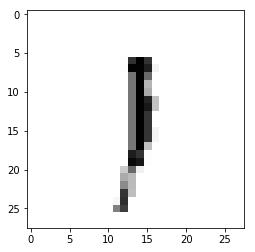

Epoch : 5 cost :  1.9250726483084948
Accuracy : 0.2814
label : [1]
Prediction : [0]


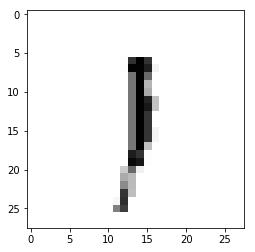

Epoch : 5 cost :  1.9289080008593482
Accuracy : 0.2819
label : [1]
Prediction : [0]


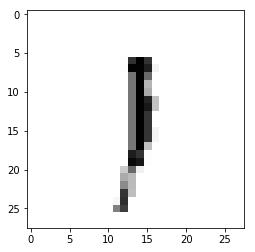

Epoch : 5 cost :  1.9327151584625253
Accuracy : 0.2824
label : [1]
Prediction : [0]


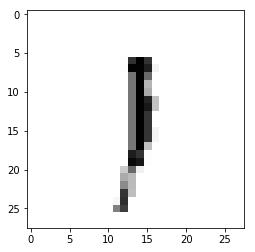

Epoch : 5 cost :  1.9366778607801967
Accuracy : 0.2813
label : [1]
Prediction : [0]


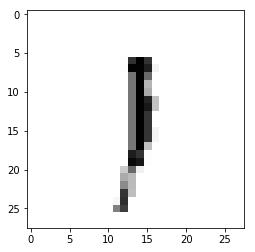

Epoch : 5 cost :  1.94039735143835
Accuracy : 0.2825
label : [1]
Prediction : [0]


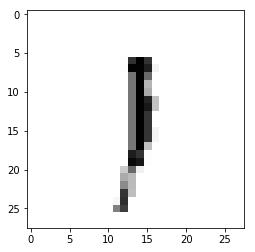

Epoch : 5 cost :  1.9443477565591996
Accuracy : 0.2843
label : [1]
Prediction : [0]


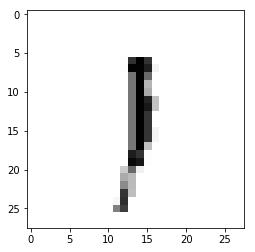

Epoch : 5 cost :  1.9481974757801412
Accuracy : 0.2824
label : [1]
Prediction : [0]


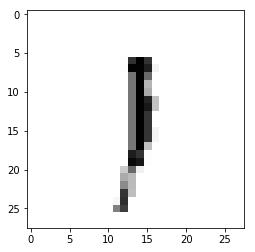

Epoch : 5 cost :  1.9519896372881813
Accuracy : 0.2842
label : [1]
Prediction : [0]


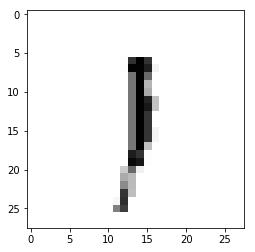

Epoch : 5 cost :  1.9558238038149758
Accuracy : 0.2918
label : [1]
Prediction : [0]


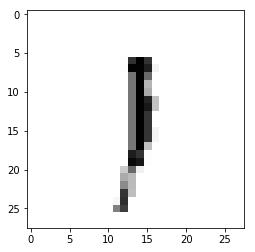

Epoch : 5 cost :  1.9596405774896806
Accuracy : 0.2919
label : [1]
Prediction : [0]


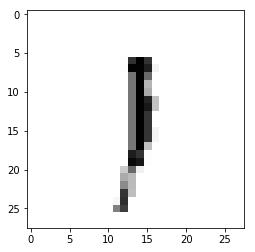

Epoch : 5 cost :  1.9635357314890092
Accuracy : 0.2904
label : [1]
Prediction : [0]


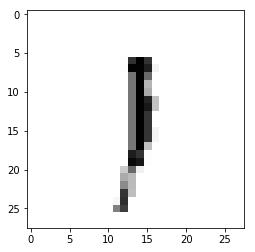

Epoch : 5 cost :  1.9673788088018254
Accuracy : 0.2906
label : [1]
Prediction : [0]


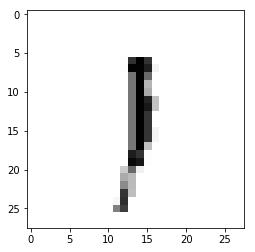

Epoch : 5 cost :  1.9711851024627696
Accuracy : 0.2898
label : [1]
Prediction : [0]


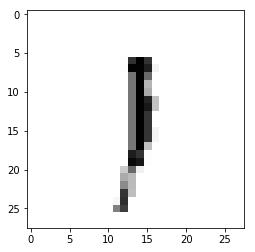

Epoch : 5 cost :  1.9751119227842862
Accuracy : 0.2883
label : [1]
Prediction : [0]


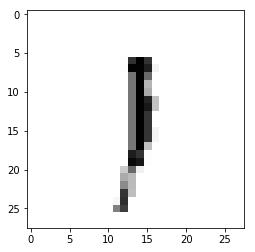

Epoch : 5 cost :  1.9789107097278953
Accuracy : 0.2866
label : [1]
Prediction : [0]


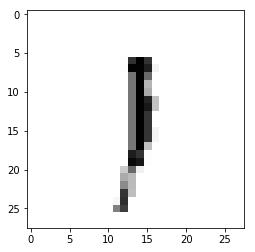

Epoch : 5 cost :  1.9827322868867365
Accuracy : 0.2871
label : [1]
Prediction : [0]


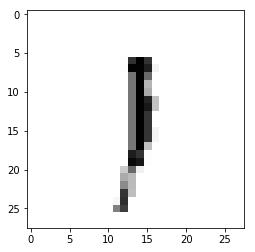

Epoch : 5 cost :  1.986594003764067
Accuracy : 0.2867
label : [1]
Prediction : [0]


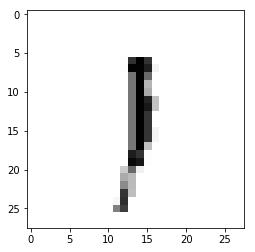

Epoch : 5 cost :  1.9904844821583152
Accuracy : 0.2854
label : [1]
Prediction : [0]


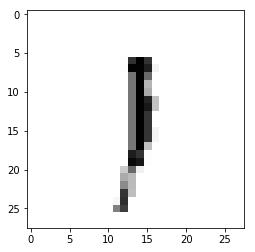

Epoch : 5 cost :  1.994258099902761
Accuracy : 0.2833
label : [1]
Prediction : [0]


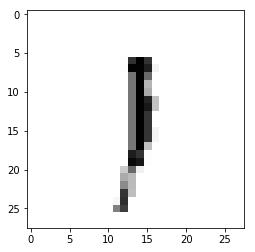

Epoch : 5 cost :  1.9981522122296431
Accuracy : 0.2797
label : [1]
Prediction : [0]


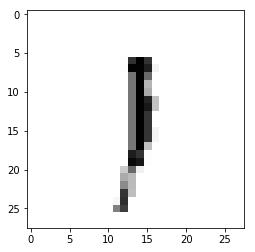

Epoch : 5 cost :  2.0019841129129596
Accuracy : 0.2739
label : [1]
Prediction : [0]


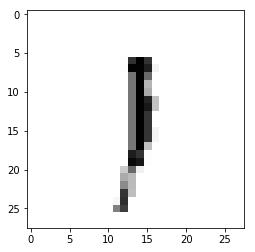

Epoch : 5 cost :  2.005769681497055
Accuracy : 0.2746
label : [1]
Prediction : [0]


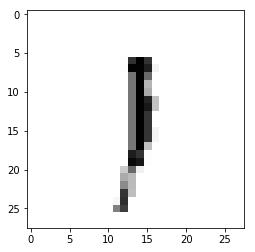

Epoch : 5 cost :  2.0096681339090536
Accuracy : 0.2827
label : [1]
Prediction : [0]


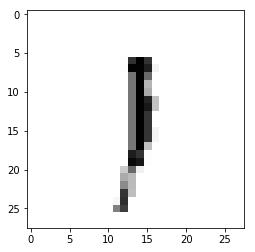

Epoch : 5 cost :  2.0136088189211776
Accuracy : 0.2887
label : [1]
Prediction : [0]


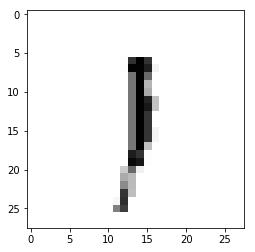

Epoch : 5 cost :  2.017513358809733
Accuracy : 0.2749
label : [1]
Prediction : [0]


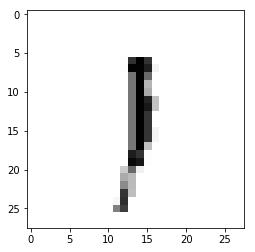

Epoch : 5 cost :  2.0212423385273346
Accuracy : 0.2875
label : [1]
Prediction : [0]


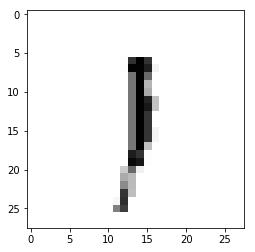

Epoch : 5 cost :  2.025148727677087
Accuracy : 0.2887
label : [1]
Prediction : [0]


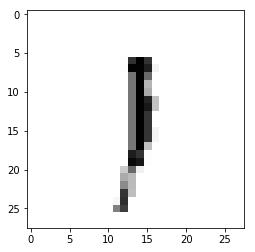

Epoch : 5 cost :  2.0290165281295796
Accuracy : 0.2724
label : [1]
Prediction : [0]


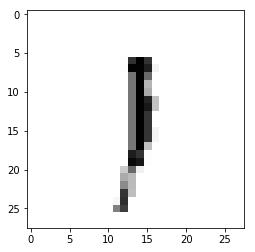

Epoch : 5 cost :  2.0327074415033533
Accuracy : 0.2729
label : [1]
Prediction : [0]


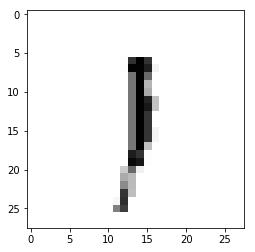

Epoch : 5 cost :  2.0366422328082017
Accuracy : 0.2906
label : [1]
Prediction : [0]


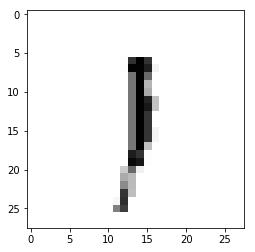

Epoch : 5 cost :  2.0405825558575734
Accuracy : 0.282
label : [1]
Prediction : [0]


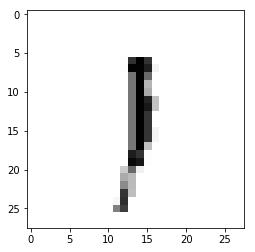

Epoch : 5 cost :  2.044425577683884
Accuracy : 0.2814
label : [1]
Prediction : [0]


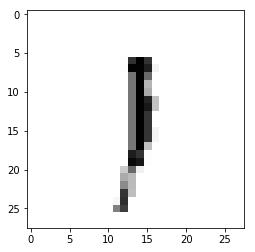

Epoch : 5 cost :  2.048235522183507
Accuracy : 0.2812
label : [1]
Prediction : [0]


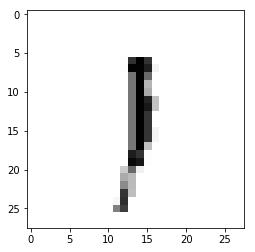

Epoch : 5 cost :  2.052081824215978
Accuracy : 0.2808
label : [1]
Prediction : [0]


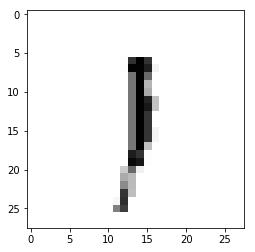

Epoch : 5 cost :  2.055917087468236
Accuracy : 0.2817
label : [1]
Prediction : [0]


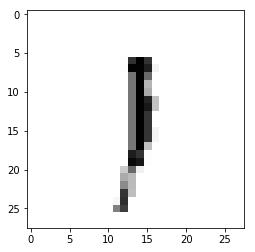

Epoch : 5 cost :  2.0596048155697932
Accuracy : 0.2827
label : [1]
Prediction : [0]


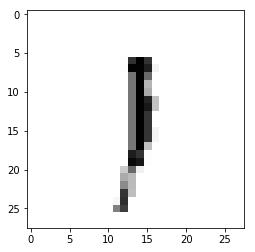

Epoch : 5 cost :  2.06358645482497
Accuracy : 0.2809
label : [1]
Prediction : [0]


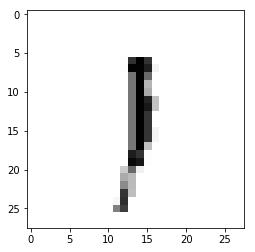

Epoch : 5 cost :  2.0675189525430877
Accuracy : 0.2809
label : [1]
Prediction : [0]


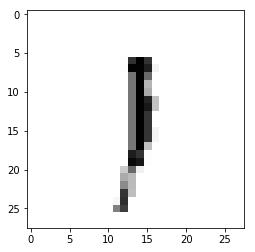

Epoch : 5 cost :  2.0713635106520245
Accuracy : 0.2817
label : [1]
Prediction : [0]


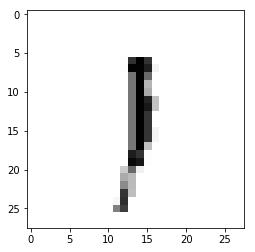

Epoch : 5 cost :  2.075178136825564
Accuracy : 0.2814
label : [1]
Prediction : [0]


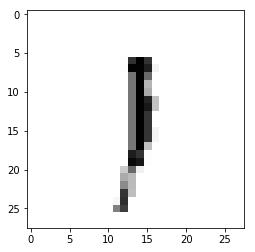

Epoch : 5 cost :  2.079070674289359
Accuracy : 0.2809
label : [1]
Prediction : [0]


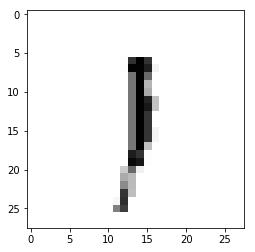

Epoch : 5 cost :  2.082885219400582
Accuracy : 0.2816
label : [1]
Prediction : [0]


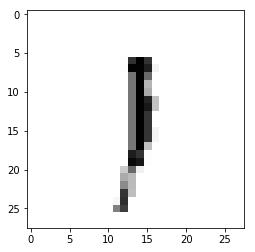

Epoch : 5 cost :  2.0868154126947602
Accuracy : 0.2817
label : [1]
Prediction : [0]


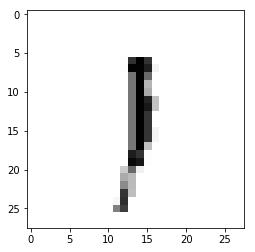

Epoch : 5 cost :  2.090689420700076
Accuracy : 0.2814
label : [1]
Prediction : [0]


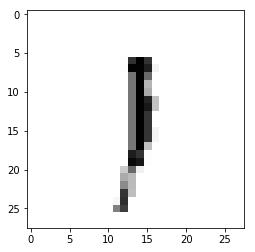

Epoch : 5 cost :  2.0945733755285114
Accuracy : 0.2822
label : [1]
Prediction : [0]


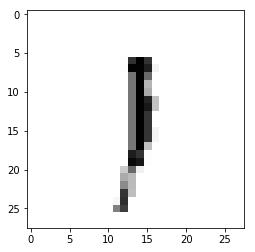

Epoch : 5 cost :  2.098427591757343
Accuracy : 0.281
label : [1]
Prediction : [0]


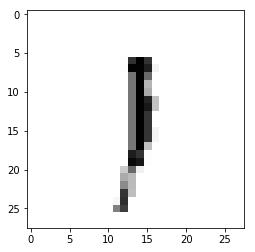

Epoch : 5 cost :  2.1023284508965254
Accuracy : 0.2815
label : [1]
Prediction : [0]


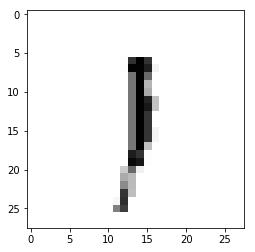

Epoch : 5 cost :  2.1061974555795864
Accuracy : 0.2815
label : [1]
Prediction : [0]


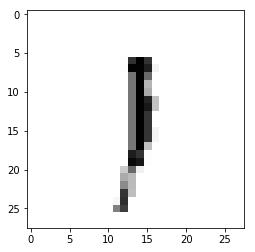

Epoch : 5 cost :  2.1100172836130335
Accuracy : 0.2812
label : [1]
Prediction : [0]


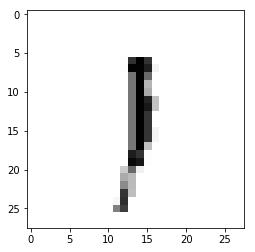

Epoch : 5 cost :  2.113747217871928
Accuracy : 0.2821
label : [1]
Prediction : [0]


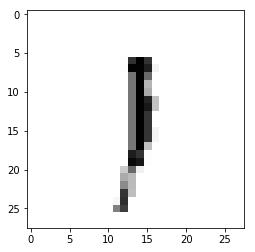

Epoch : 5 cost :  2.11761975114996
Accuracy : 0.2824
label : [1]
Prediction : [0]


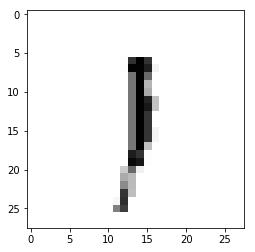

Epoch : 5 cost :  2.1215069306980503
Accuracy : 0.2827
label : [1]
Prediction : [0]


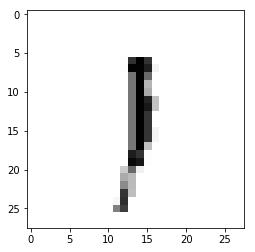

Epoch : 5 cost :  2.1252922877398426
Accuracy : 0.2833
label : [1]
Prediction : [0]


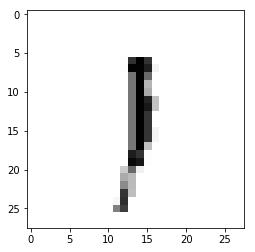

Epoch : 5 cost :  2.129133824868638
Accuracy : 0.2805
label : [1]
Prediction : [0]


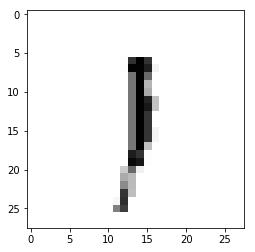

Epoch : 5 cost :  2.133026377071036
Accuracy : 0.2805
label : [1]
Prediction : [0]


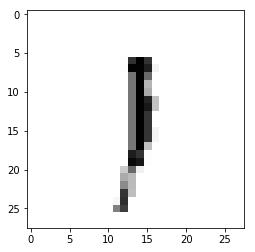

Epoch : 5 cost :  2.136784690510145
Accuracy : 0.282
label : [1]
Prediction : [0]


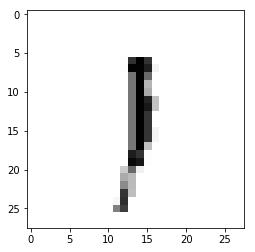

Epoch : 5 cost :  2.1405472946167015
Accuracy : 0.2727
label : [1]
Prediction : [0]


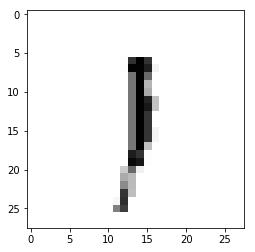

Epoch : 5 cost :  2.1444267827814296
Accuracy : 0.2706
label : [1]
Prediction : [0]


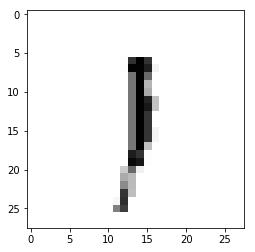

Epoch : 5 cost :  2.1482836515253263
Accuracy : 0.2712
label : [1]
Prediction : [0]


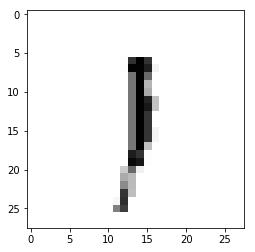

Epoch : 5 cost :  2.152204979549757
Accuracy : 0.2699
label : [1]
Prediction : [0]


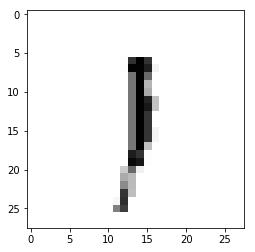

Epoch : 5 cost :  2.155974697199737
Accuracy : 0.2721
label : [1]
Prediction : [0]


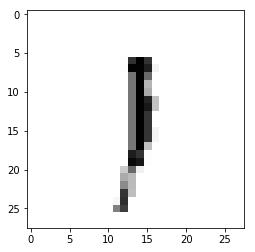

Epoch : 5 cost :  2.15975495901975
Accuracy : 0.2718
label : [1]
Prediction : [0]


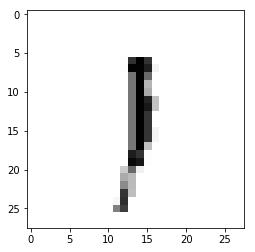

Epoch : 5 cost :  2.163601591803813
Accuracy : 0.2761
label : [1]
Prediction : [0]


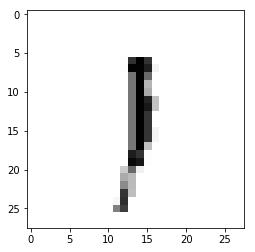

Epoch : 5 cost :  2.1674651856855935
Accuracy : 0.2764
label : [1]
Prediction : [0]


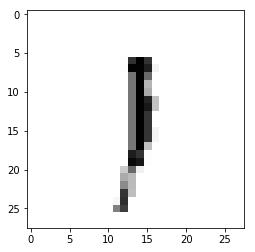

Epoch : 5 cost :  2.171287002996967
Accuracy : 0.2774
label : [1]
Prediction : [0]


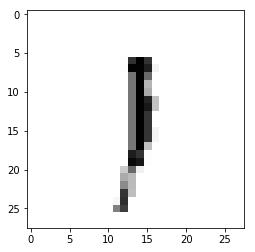

Epoch : 6 cost :  0.003848921602422541
Accuracy : 0.284
label : [1]
Prediction : [0]


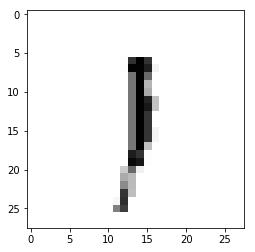

Epoch : 6 cost :  0.007684310132806951
Accuracy : 0.283
label : [1]
Prediction : [0]


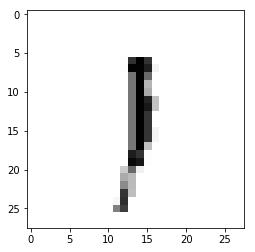

Epoch : 6 cost :  0.011412682099775834
Accuracy : 0.2833
label : [1]
Prediction : [0]


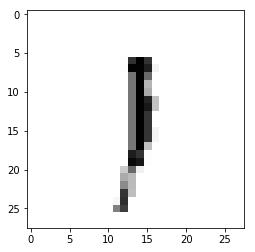

Epoch : 6 cost :  0.015291393453424626
Accuracy : 0.2845
label : [1]
Prediction : [0]


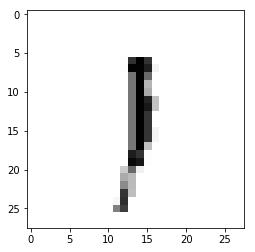

Epoch : 6 cost :  0.019176109053871848
Accuracy : 0.2836
label : [1]
Prediction : [0]


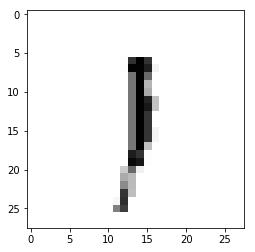

Epoch : 6 cost :  0.02307871081612327
Accuracy : 0.2838
label : [1]
Prediction : [0]


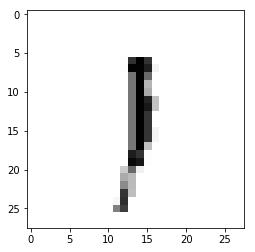

Epoch : 6 cost :  0.026884824579412287
Accuracy : 0.2842
label : [1]
Prediction : [0]


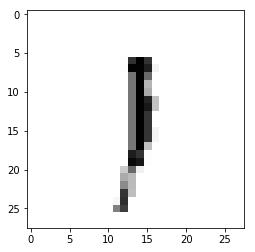

Epoch : 6 cost :  0.030891140591014516
Accuracy : 0.2847
label : [1]
Prediction : [0]


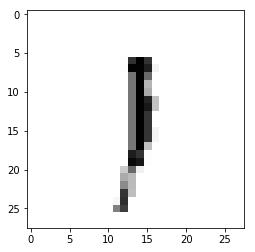

Epoch : 6 cost :  0.03475872603329745
Accuracy : 0.2846
label : [1]
Prediction : [0]


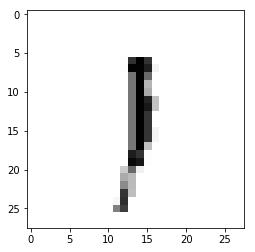

Epoch : 6 cost :  0.03855069030414928
Accuracy : 0.2847
label : [1]
Prediction : [0]


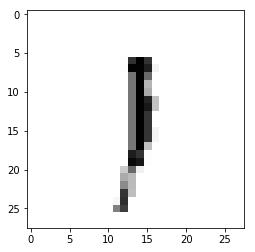

Epoch : 6 cost :  0.042256160215897995
Accuracy : 0.285
label : [1]
Prediction : [0]


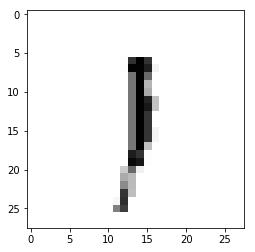

Epoch : 6 cost :  0.04612255053086715
Accuracy : 0.2851
label : [1]
Prediction : [0]


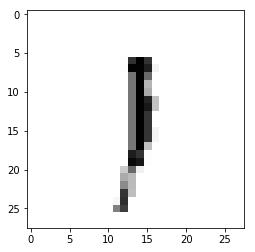

Epoch : 6 cost :  0.04987805583260276
Accuracy : 0.286
label : [1]
Prediction : [0]


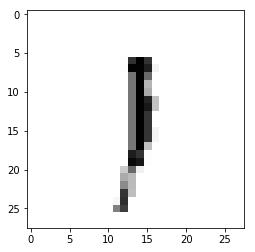

Epoch : 6 cost :  0.053694929209622475
Accuracy : 0.2798
label : [1]
Prediction : [0]


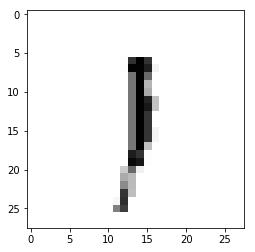

Epoch : 6 cost :  0.057546403191306376
Accuracy : 0.2791
label : [1]
Prediction : [0]


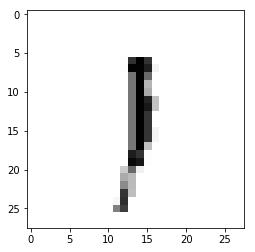

Epoch : 6 cost :  0.061274450475519354
Accuracy : 0.2792
label : [1]
Prediction : [0]


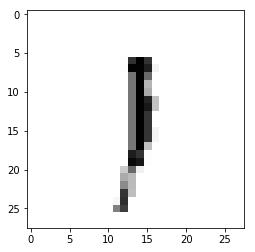

Epoch : 6 cost :  0.06496462345123291
Accuracy : 0.2783
label : [1]
Prediction : [0]


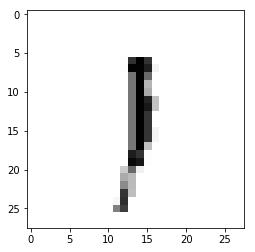

Epoch : 6 cost :  0.06894499518654564
Accuracy : 0.2796
label : [1]
Prediction : [0]


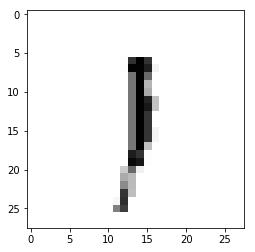

Epoch : 6 cost :  0.07285884857177735
Accuracy : 0.2824
label : [1]
Prediction : [0]


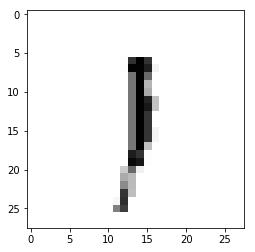

Epoch : 6 cost :  0.07668276309967041
Accuracy : 0.2875
label : [1]
Prediction : [0]


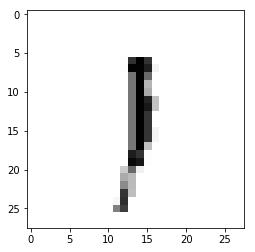

Epoch : 6 cost :  0.08049366300756282
Accuracy : 0.286
label : [1]
Prediction : [0]


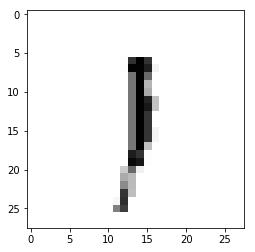

Epoch : 6 cost :  0.08434244936162776
Accuracy : 0.2861
label : [1]
Prediction : [0]


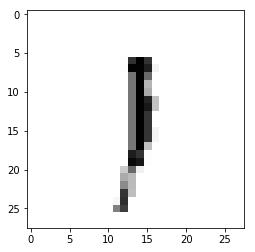

Epoch : 6 cost :  0.08818163048137319
Accuracy : 0.2868
label : [1]
Prediction : [0]


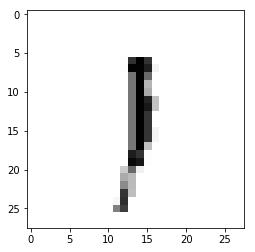

Epoch : 6 cost :  0.09199472427368165
Accuracy : 0.287
label : [1]
Prediction : [0]


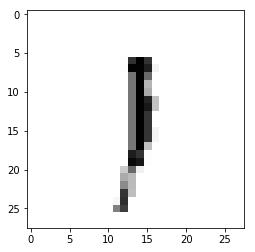

Epoch : 6 cost :  0.09582723834297874
Accuracy : 0.2871
label : [1]
Prediction : [0]


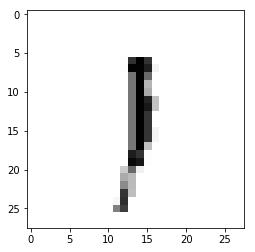

Epoch : 6 cost :  0.0995406740361994
Accuracy : 0.2875
label : [1]
Prediction : [0]


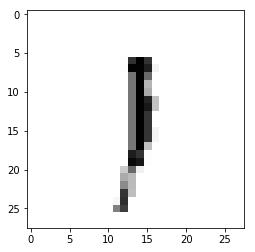

Epoch : 6 cost :  0.10336160312999379
Accuracy : 0.288
label : [1]
Prediction : [0]


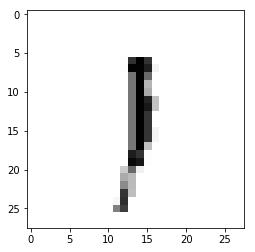

Epoch : 6 cost :  0.10702683102000844
Accuracy : 0.288
label : [1]
Prediction : [0]


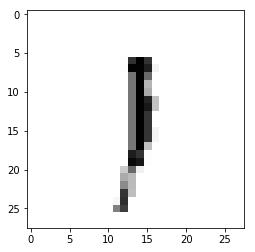

Epoch : 6 cost :  0.11075076840140603
Accuracy : 0.2876
label : [1]
Prediction : [0]


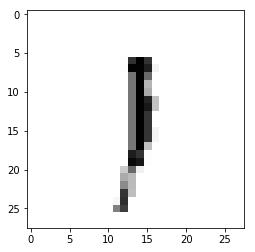

Epoch : 6 cost :  0.11459032578901812
Accuracy : 0.2895
label : [1]
Prediction : [0]


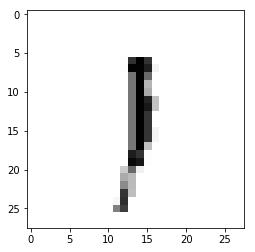

Epoch : 6 cost :  0.11840555624528366
Accuracy : 0.289
label : [1]
Prediction : [0]


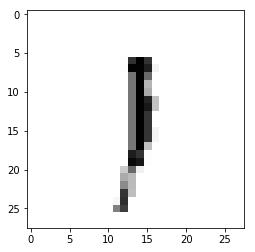

Epoch : 6 cost :  0.1221757897463712
Accuracy : 0.2891
label : [1]
Prediction : [0]


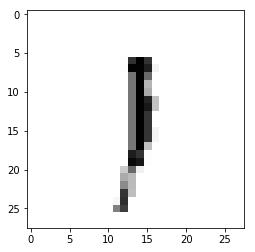

Epoch : 6 cost :  0.12603877371007746
Accuracy : 0.2891
label : [1]
Prediction : [0]


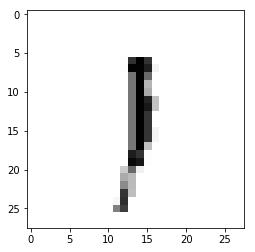

Epoch : 6 cost :  0.1297603802247481
Accuracy : 0.2892
label : [1]
Prediction : [0]


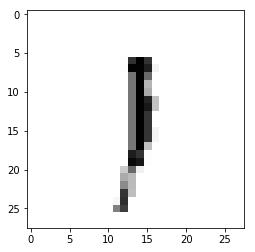

Epoch : 6 cost :  0.13357766498218884
Accuracy : 0.2893
label : [1]
Prediction : [0]


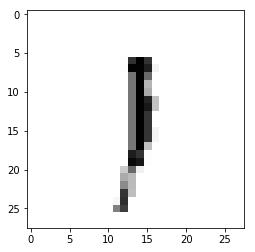

Epoch : 6 cost :  0.13738197803497315
Accuracy : 0.2894
label : [1]
Prediction : [0]


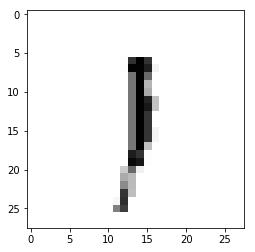

Epoch : 6 cost :  0.14135994000868365
Accuracy : 0.2883
label : [1]
Prediction : [0]


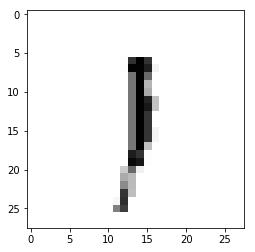

Epoch : 6 cost :  0.14513571305708453
Accuracy : 0.2878
label : [1]
Prediction : [0]


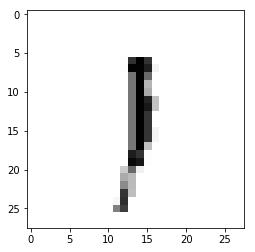

Epoch : 6 cost :  0.14885641748254952
Accuracy : 0.2881
label : [1]
Prediction : [0]


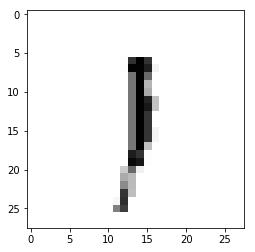

Epoch : 6 cost :  0.15263654145327485
Accuracy : 0.2892
label : [1]
Prediction : [0]


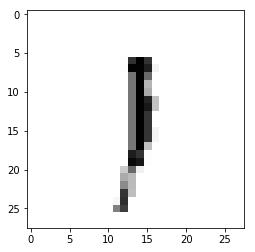

Epoch : 6 cost :  0.15647627873854209
Accuracy : 0.2887
label : [1]
Prediction : [0]


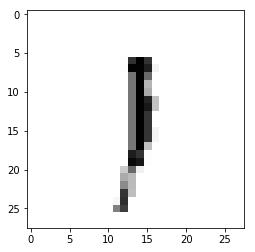

Epoch : 6 cost :  0.16023214513605297
Accuracy : 0.2893
label : [1]
Prediction : [0]


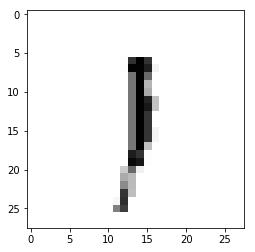

Epoch : 6 cost :  0.16404908917166974
Accuracy : 0.2886
label : [1]
Prediction : [0]


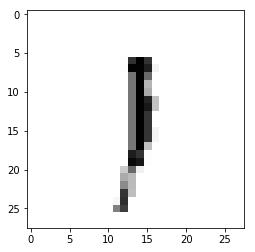

Epoch : 6 cost :  0.16774322293021465
Accuracy : 0.2882
label : [1]
Prediction : [0]


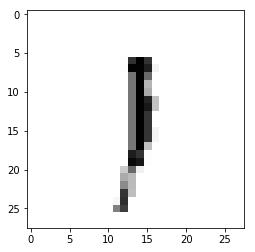

Epoch : 6 cost :  0.17147403977134015
Accuracy : 0.2884
label : [1]
Prediction : [0]


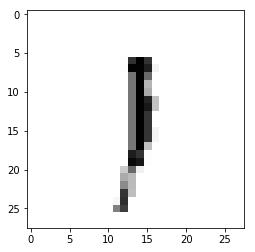

Epoch : 6 cost :  0.17512386712160982
Accuracy : 0.2884
label : [1]
Prediction : [0]


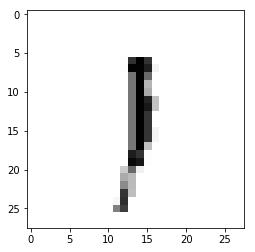

Epoch : 6 cost :  0.17876364057714295
Accuracy : 0.2886
label : [1]
Prediction : [0]


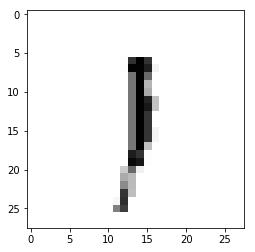

Epoch : 6 cost :  0.18265456286343668
Accuracy : 0.2891
label : [1]
Prediction : [0]


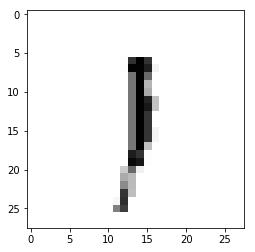

Epoch : 6 cost :  0.1862703063271263
Accuracy : 0.2883
label : [1]
Prediction : [0]


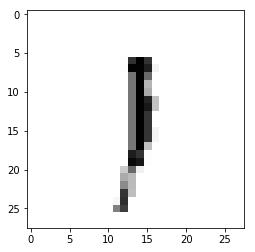

Epoch : 6 cost :  0.19022373546253557
Accuracy : 0.2881
label : [1]
Prediction : [0]


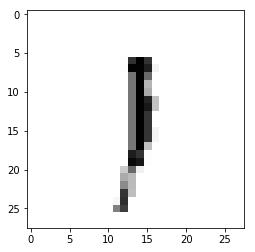

Epoch : 6 cost :  0.19401585232127802
Accuracy : 0.2885
label : [1]
Prediction : [0]


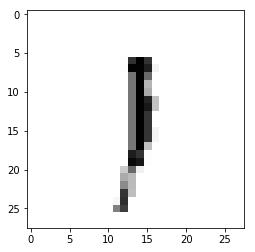

Epoch : 6 cost :  0.19786912397904835
Accuracy : 0.2888
label : [1]
Prediction : [0]


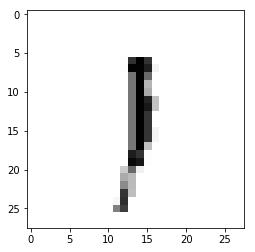

Epoch : 6 cost :  0.20163627494465228
Accuracy : 0.2886
label : [1]
Prediction : [0]


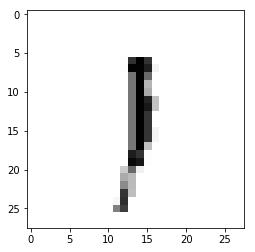

Epoch : 6 cost :  0.20551656289534143
Accuracy : 0.289
label : [1]
Prediction : [0]


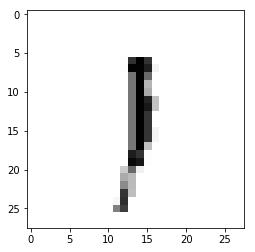

Epoch : 6 cost :  0.20937495838512082
Accuracy : 0.2897
label : [1]
Prediction : [0]


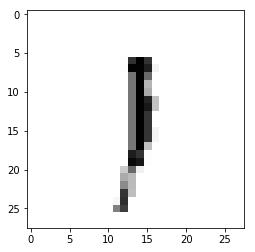

Epoch : 6 cost :  0.21310980103232652
Accuracy : 0.2886
label : [1]
Prediction : [0]


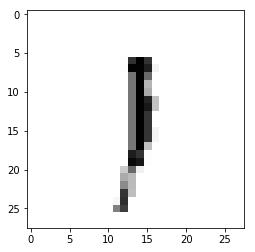

Epoch : 6 cost :  0.21690893693403773
Accuracy : 0.2889
label : [1]
Prediction : [0]


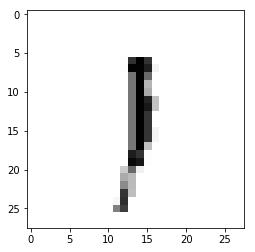

Epoch : 6 cost :  0.2206901095130228
Accuracy : 0.2888
label : [1]
Prediction : [0]


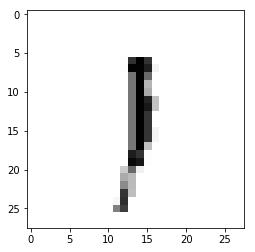

Epoch : 6 cost :  0.22440044403076181
Accuracy : 0.2886
label : [1]
Prediction : [0]


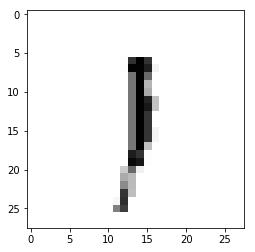

Epoch : 6 cost :  0.2281708795374091
Accuracy : 0.2901
label : [1]
Prediction : [0]


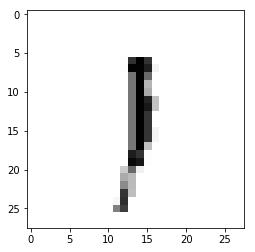

Epoch : 6 cost :  0.23182959946719095
Accuracy : 0.3002
label : [1]
Prediction : [0]


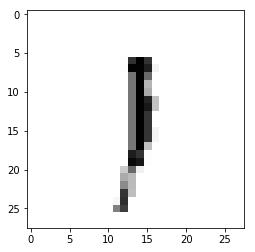

Epoch : 6 cost :  0.23564569690010775
Accuracy : 0.29
label : [1]
Prediction : [0]


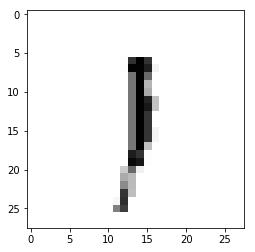

Epoch : 6 cost :  0.23940800363367265
Accuracy : 0.2898
label : [1]
Prediction : [0]


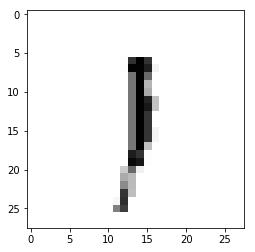

Epoch : 6 cost :  0.24312816749919555
Accuracy : 0.3007
label : [1]
Prediction : [0]


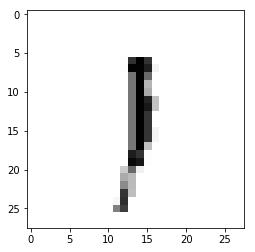

Epoch : 6 cost :  0.24679049145091675
Accuracy : 0.2992
label : [1]
Prediction : [0]


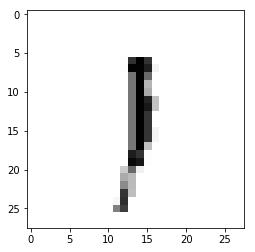

Epoch : 6 cost :  0.2507664641467009
Accuracy : 0.3004
label : [1]
Prediction : [0]


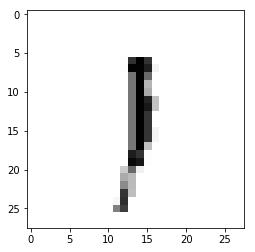

Epoch : 6 cost :  0.2543751783804461
Accuracy : 0.3002
label : [1]
Prediction : [0]


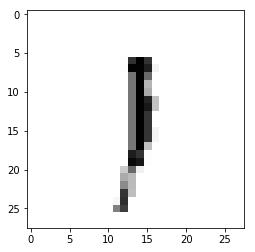

Epoch : 6 cost :  0.2582267030802641
Accuracy : 0.2986
label : [1]
Prediction : [0]


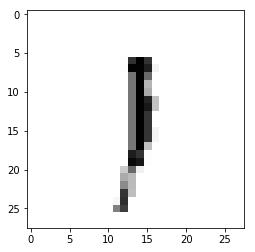

Epoch : 6 cost :  0.2619660483707082
Accuracy : 0.2979
label : [1]
Prediction : [0]


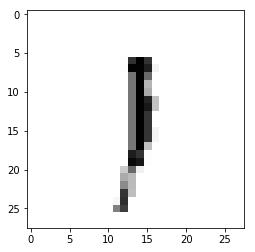

Epoch : 6 cost :  0.2660433242537759
Accuracy : 0.2985
label : [1]
Prediction : [0]


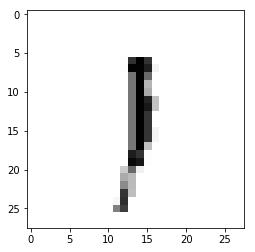

Epoch : 6 cost :  0.26989243962548004
Accuracy : 0.3001
label : [1]
Prediction : [0]


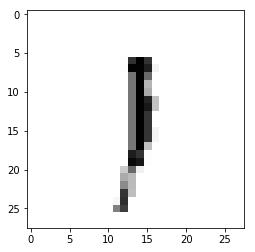

Epoch : 6 cost :  0.27357456922531137
Accuracy : 0.2998
label : [1]
Prediction : [0]


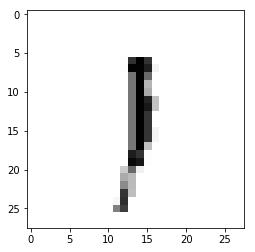

Epoch : 6 cost :  0.2774223091385582
Accuracy : 0.2896
label : [1]
Prediction : [0]


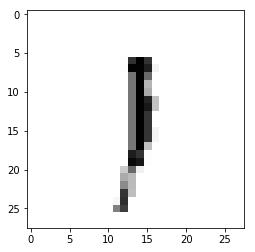

Epoch : 6 cost :  0.28121246446262715
Accuracy : 0.2997
label : [1]
Prediction : [0]


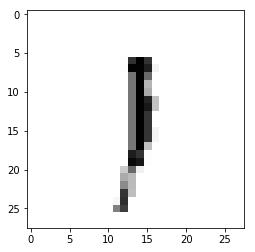

Epoch : 6 cost :  0.2851058689030735
Accuracy : 0.2886
label : [1]
Prediction : [0]


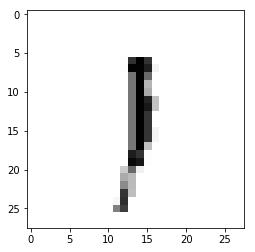

Epoch : 6 cost :  0.288964650630951
Accuracy : 0.2896
label : [1]
Prediction : [0]


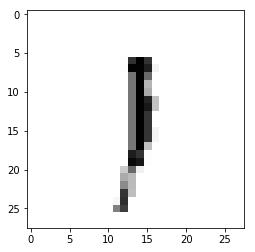

Epoch : 6 cost :  0.2928398962454363
Accuracy : 0.2896
label : [1]
Prediction : [0]


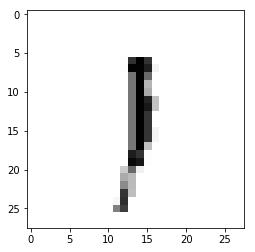

Epoch : 6 cost :  0.2966815048998053
Accuracy : 0.2895
label : [1]
Prediction : [0]


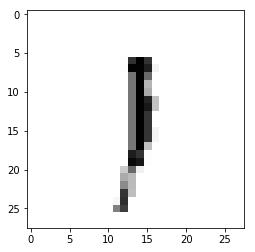

Epoch : 6 cost :  0.30048442168669276
Accuracy : 0.2902
label : [1]
Prediction : [0]


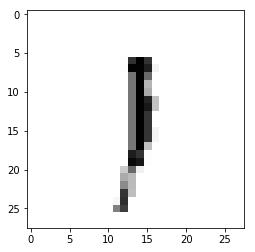

Epoch : 6 cost :  0.3043078225309199
Accuracy : 0.2903
label : [1]
Prediction : [0]


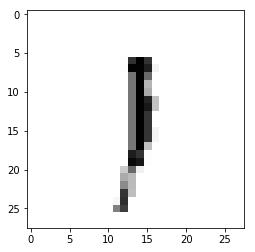

Epoch : 6 cost :  0.3079672386429527
Accuracy : 0.2894
label : [1]
Prediction : [0]


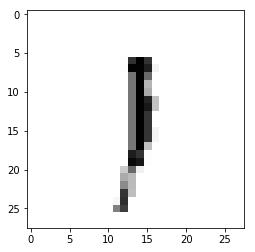

Epoch : 6 cost :  0.31164398128336135
Accuracy : 0.2894
label : [1]
Prediction : [0]


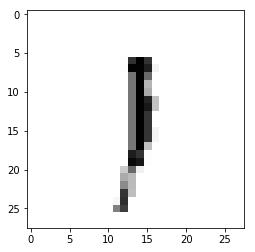

Epoch : 6 cost :  0.3154232959313827
Accuracy : 0.2904
label : [1]
Prediction : [0]


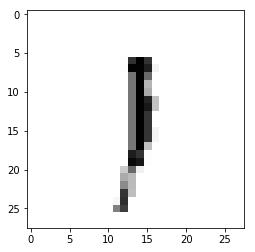

Epoch : 6 cost :  0.31918443051251505
Accuracy : 0.2896
label : [1]
Prediction : [0]


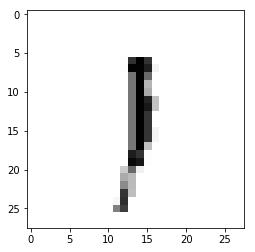

Epoch : 6 cost :  0.3228917808966204
Accuracy : 0.2896
label : [1]
Prediction : [0]


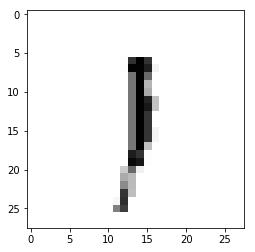

Epoch : 6 cost :  0.32656970652666967
Accuracy : 0.29
label : [1]
Prediction : [0]


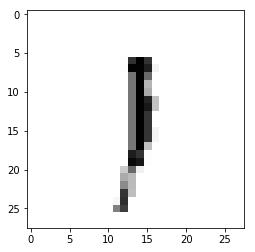

Epoch : 6 cost :  0.3305041059580717
Accuracy : 0.2965
label : [1]
Prediction : [0]


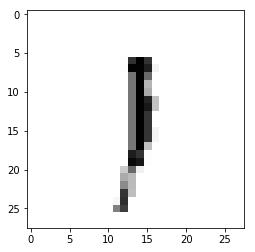

Epoch : 6 cost :  0.33436572790145885
Accuracy : 0.2972
label : [1]
Prediction : [0]


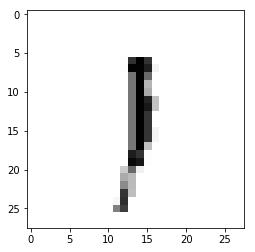

Epoch : 6 cost :  0.33824622696096257
Accuracy : 0.298
label : [1]
Prediction : [0]


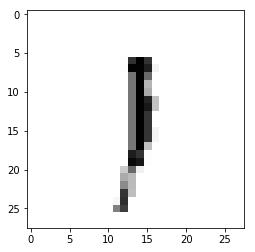

Epoch : 6 cost :  0.34188732342286554
Accuracy : 0.2878
label : [1]
Prediction : [0]


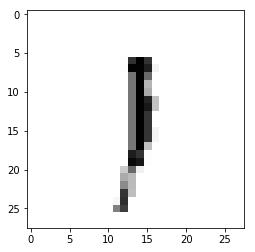

Epoch : 6 cost :  0.34563996640118694
Accuracy : 0.2987
label : [1]
Prediction : [0]


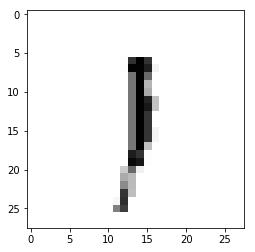

Epoch : 6 cost :  0.3493505965579641
Accuracy : 0.299
label : [1]
Prediction : [0]


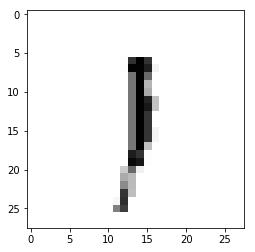

Epoch : 6 cost :  0.35311813766306105
Accuracy : 0.2889
label : [1]
Prediction : [0]


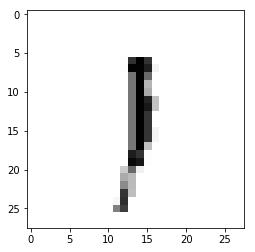

Epoch : 6 cost :  0.35710492892698814
Accuracy : 0.2868
label : [1]
Prediction : [0]


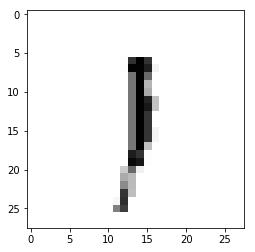

Epoch : 6 cost :  0.36088559692556216
Accuracy : 0.2869
label : [1]
Prediction : [0]


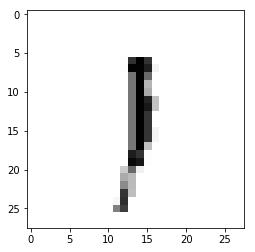

Epoch : 6 cost :  0.36457794297825213
Accuracy : 0.2869
label : [1]
Prediction : [0]


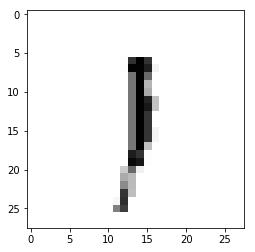

Epoch : 6 cost :  0.368402544151653
Accuracy : 0.2866
label : [1]
Prediction : [0]


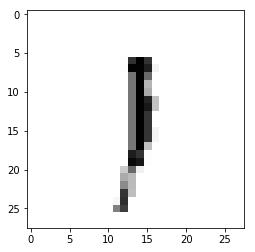

Epoch : 6 cost :  0.37201268369501295
Accuracy : 0.2868
label : [1]
Prediction : [0]


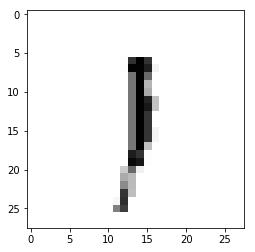

Epoch : 6 cost :  0.37581395972858783
Accuracy : 0.2878
label : [1]
Prediction : [0]


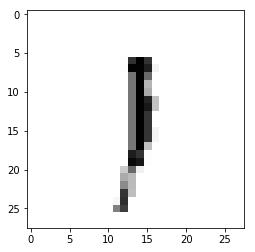

Epoch : 6 cost :  0.37958845311945144
Accuracy : 0.2878
label : [1]
Prediction : [0]


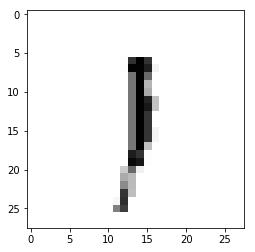

Epoch : 6 cost :  0.38334995009682404
Accuracy : 0.2875
label : [1]
Prediction : [0]


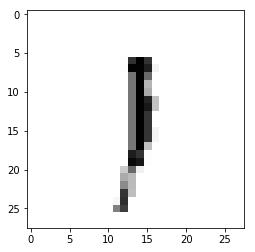

Epoch : 6 cost :  0.38704539212313577
Accuracy : 0.2874
label : [1]
Prediction : [0]


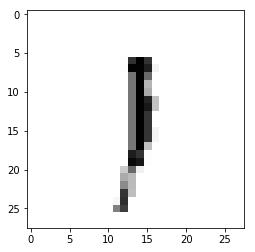

Epoch : 6 cost :  0.3908115412972191
Accuracy : 0.2867
label : [1]
Prediction : [0]


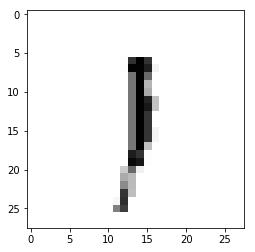

Epoch : 6 cost :  0.3945436798442495
Accuracy : 0.2863
label : [1]
Prediction : [0]


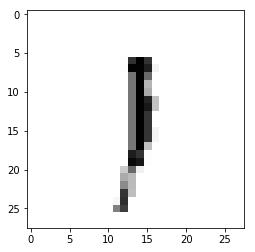

Epoch : 6 cost :  0.39825869690288207
Accuracy : 0.2862
label : [1]
Prediction : [0]


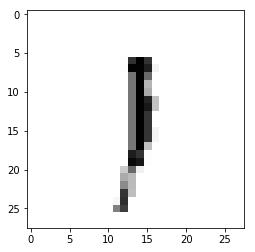

Epoch : 6 cost :  0.4019782911647451
Accuracy : 0.2961
label : [1]
Prediction : [0]


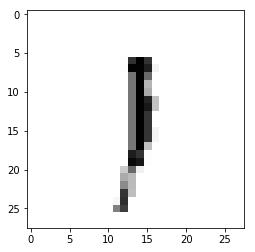

Epoch : 6 cost :  0.4058601344715466
Accuracy : 0.2964
label : [1]
Prediction : [0]


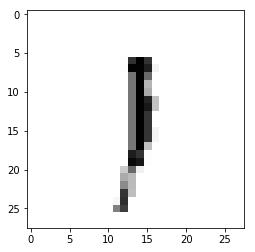

Epoch : 6 cost :  0.40983309442346755
Accuracy : 0.2966
label : [1]
Prediction : [0]


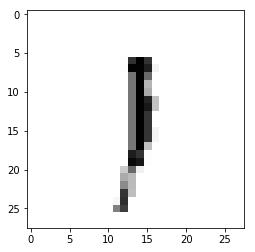

Epoch : 6 cost :  0.4134324845400724
Accuracy : 0.2963
label : [1]
Prediction : [0]


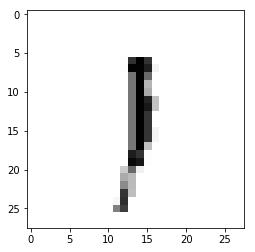

Epoch : 6 cost :  0.41704663211649123
Accuracy : 0.296
label : [1]
Prediction : [0]


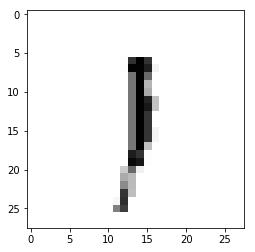

Epoch : 6 cost :  0.42077107537876485
Accuracy : 0.2968
label : [1]
Prediction : [0]


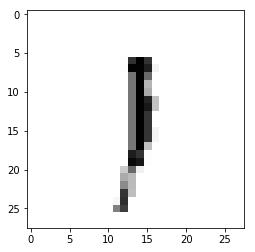

Epoch : 6 cost :  0.42455864841287794
Accuracy : 0.2976
label : [1]
Prediction : [0]


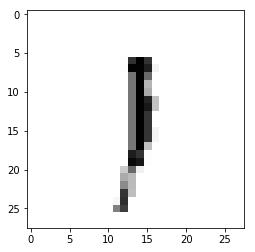

Epoch : 6 cost :  0.42833085125142883
Accuracy : 0.2977
label : [1]
Prediction : [0]


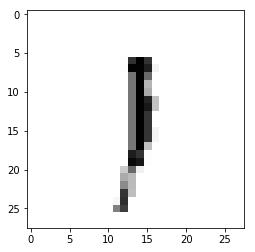

Epoch : 6 cost :  0.4320472884178162
Accuracy : 0.2971
label : [1]
Prediction : [0]


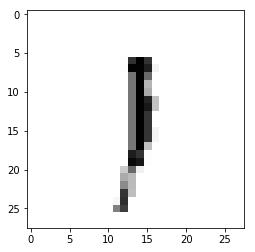

Epoch : 6 cost :  0.43596772605722606
Accuracy : 0.2876
label : [1]
Prediction : [0]


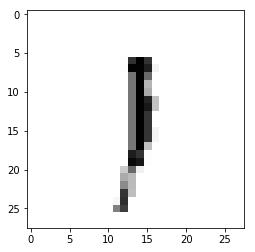

Epoch : 6 cost :  0.4396923505176198
Accuracy : 0.286
label : [1]
Prediction : [0]


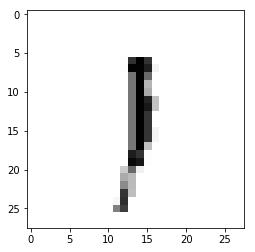

Epoch : 6 cost :  0.44336398276415745
Accuracy : 0.2869
label : [1]
Prediction : [0]


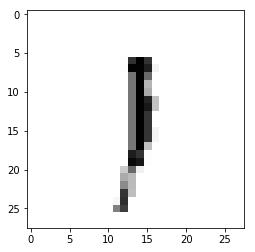

Epoch : 6 cost :  0.44725896596908576
Accuracy : 0.2872
label : [1]
Prediction : [0]


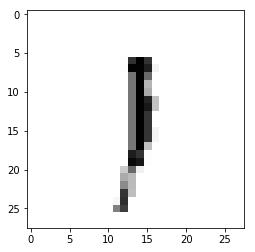

Epoch : 6 cost :  0.4508979110284286
Accuracy : 0.2866
label : [1]
Prediction : [0]


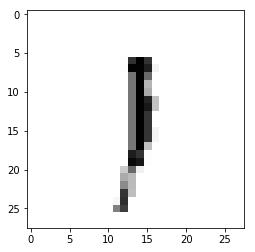

Epoch : 6 cost :  0.45466440482573084
Accuracy : 0.2895
label : [1]
Prediction : [0]


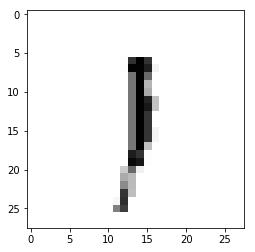

Epoch : 6 cost :  0.4585483865304428
Accuracy : 0.2876
label : [1]
Prediction : [0]


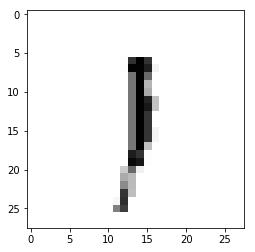

Epoch : 6 cost :  0.4622472713210367
Accuracy : 0.2861
label : [1]
Prediction : [0]


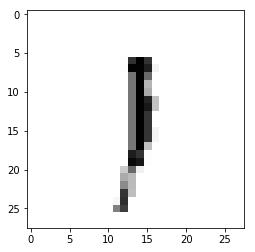

Epoch : 6 cost :  0.46593781406229207
Accuracy : 0.286
label : [1]
Prediction : [0]


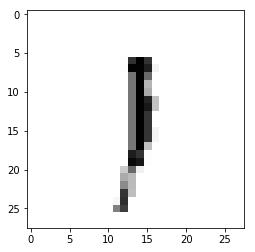

Epoch : 6 cost :  0.46965933561325085
Accuracy : 0.287
label : [1]
Prediction : [0]


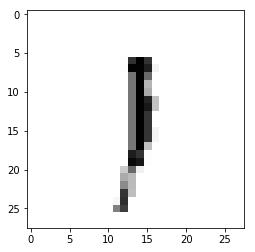

Epoch : 6 cost :  0.47351169867949067
Accuracy : 0.2889
label : [1]
Prediction : [0]


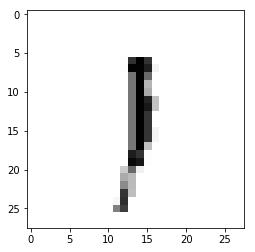

Epoch : 6 cost :  0.47739908803593045
Accuracy : 0.2894
label : [1]
Prediction : [0]


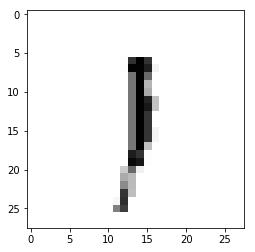

Epoch : 6 cost :  0.48119666901501756
Accuracy : 0.2882
label : [1]
Prediction : [0]


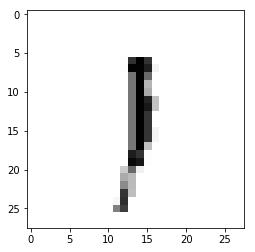

Epoch : 6 cost :  0.4849330097978767
Accuracy : 0.2888
label : [1]
Prediction : [0]


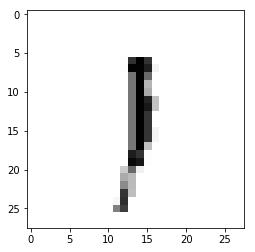

Epoch : 6 cost :  0.4886903075738388
Accuracy : 0.2889
label : [1]
Prediction : [0]


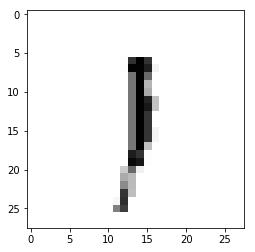

Epoch : 6 cost :  0.49244526017795925
Accuracy : 0.2895
label : [1]
Prediction : [0]


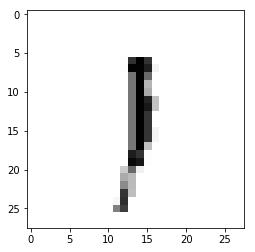

Epoch : 6 cost :  0.49619724208658406
Accuracy : 0.3011
label : [1]
Prediction : [0]


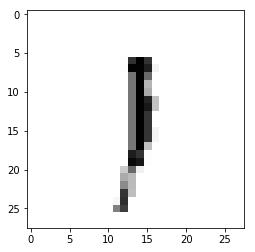

Epoch : 6 cost :  0.4998299340768295
Accuracy : 0.2991
label : [1]
Prediction : [0]


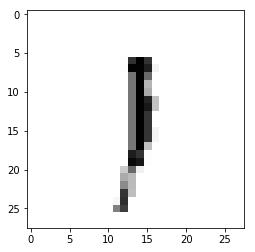

Epoch : 6 cost :  0.5036655215783554
Accuracy : 0.2995
label : [1]
Prediction : [0]


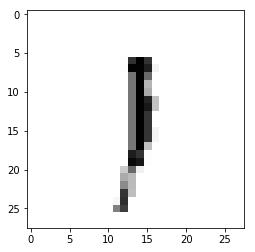

Epoch : 6 cost :  0.5073738308386371
Accuracy : 0.3
label : [1]
Prediction : [0]


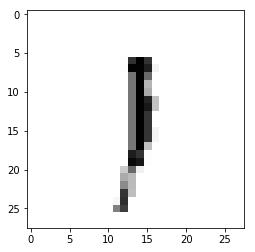

Epoch : 6 cost :  0.5111874140392652
Accuracy : 0.2903
label : [1]
Prediction : [0]


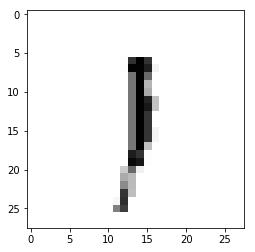

Epoch : 6 cost :  0.5149586055495523
Accuracy : 0.2922
label : [1]
Prediction : [0]


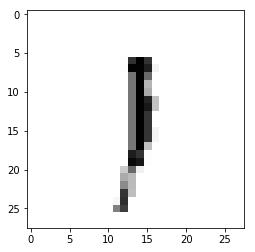

Epoch : 6 cost :  0.5187142569368537
Accuracy : 0.2911
label : [1]
Prediction : [0]


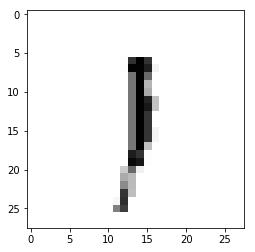

Epoch : 6 cost :  0.5223769731955096
Accuracy : 0.2919
label : [1]
Prediction : [0]


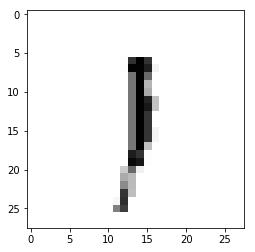

Epoch : 6 cost :  0.526066361990842
Accuracy : 0.2912
label : [1]
Prediction : [0]


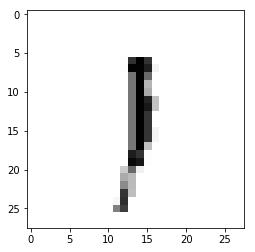

Epoch : 6 cost :  0.5297701625390486
Accuracy : 0.2916
label : [1]
Prediction : [0]


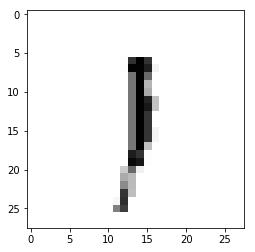

Epoch : 6 cost :  0.5335905077240684
Accuracy : 0.2903
label : [1]
Prediction : [0]


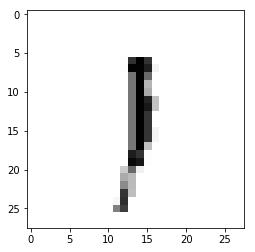

Epoch : 6 cost :  0.5373200141299854
Accuracy : 0.2894
label : [1]
Prediction : [0]


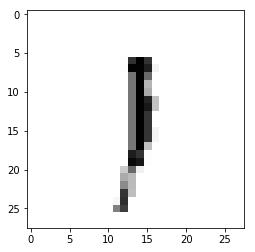

Epoch : 6 cost :  0.5410553570227189
Accuracy : 0.2886
label : [1]
Prediction : [0]


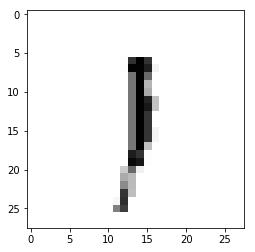

Epoch : 6 cost :  0.5448724601485512
Accuracy : 0.2894
label : [1]
Prediction : [0]


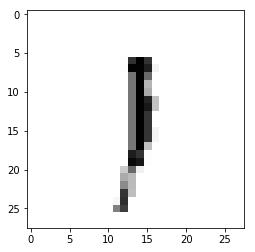

Epoch : 6 cost :  0.5486496957865628
Accuracy : 0.2899
label : [1]
Prediction : [0]


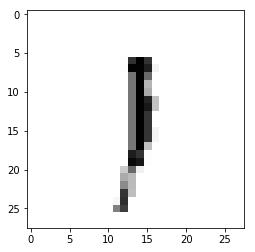

Epoch : 6 cost :  0.5524910200725901
Accuracy : 0.29
label : [1]
Prediction : [0]


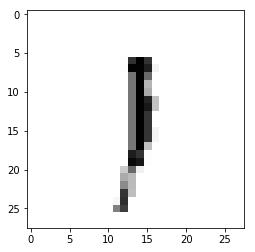

Epoch : 6 cost :  0.5561674969846551
Accuracy : 0.2895
label : [1]
Prediction : [0]


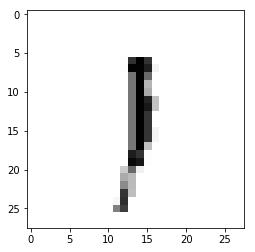

Epoch : 6 cost :  0.5599647883935407
Accuracy : 0.2891
label : [1]
Prediction : [0]


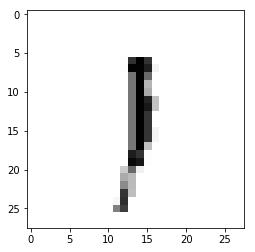

Epoch : 6 cost :  0.563676679567857
Accuracy : 0.3017
label : [1]
Prediction : [0]


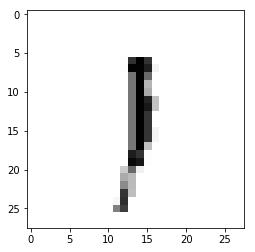

Epoch : 6 cost :  0.5674439692497252
Accuracy : 0.2889
label : [1]
Prediction : [0]


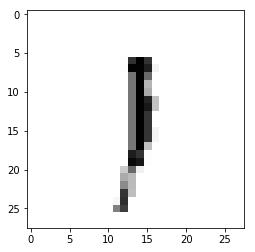

Epoch : 6 cost :  0.571032782901417
Accuracy : 0.2983
label : [1]
Prediction : [0]


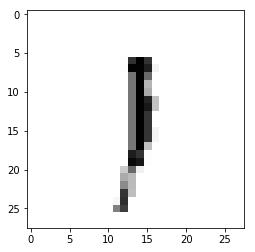

Epoch : 6 cost :  0.5747575070641257
Accuracy : 0.2969
label : [1]
Prediction : [0]


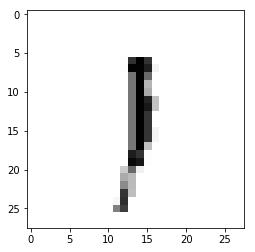

Epoch : 6 cost :  0.578526080304926
Accuracy : 0.2963
label : [1]
Prediction : [0]


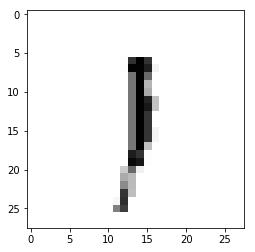

Epoch : 6 cost :  0.5822034159573641
Accuracy : 0.2829
label : [1]
Prediction : [0]


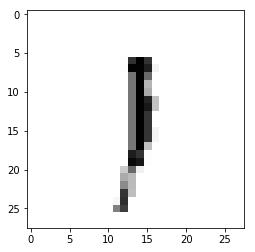

Epoch : 6 cost :  0.5859310804713855
Accuracy : 0.284
label : [1]
Prediction : [0]


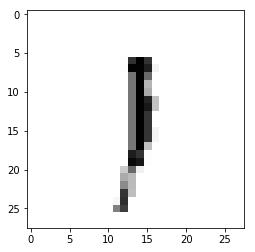

Epoch : 6 cost :  0.5896835561232132
Accuracy : 0.2851
label : [1]
Prediction : [0]


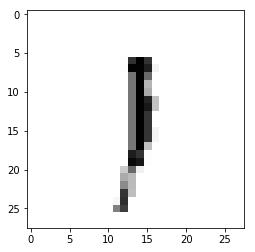

Epoch : 6 cost :  0.5934124426408246
Accuracy : 0.2857
label : [1]
Prediction : [0]


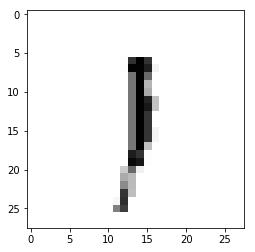

Epoch : 6 cost :  0.5972427927364001
Accuracy : 0.2865
label : [1]
Prediction : [0]


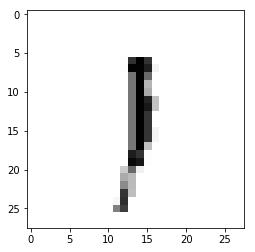

Epoch : 6 cost :  0.6009976495396006
Accuracy : 0.2855
label : [1]
Prediction : [0]


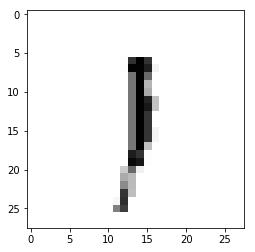

Epoch : 6 cost :  0.6048646822842683
Accuracy : 0.2769
label : [1]
Prediction : [0]


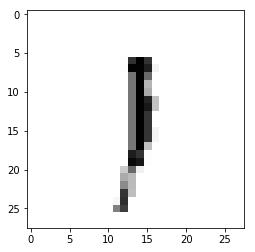

Epoch : 6 cost :  0.6084449393099003
Accuracy : 0.2716
label : [1]
Prediction : [0]


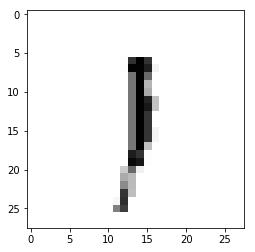

Epoch : 6 cost :  0.6121827973018992
Accuracy : 0.2705
label : [1]
Prediction : [0]


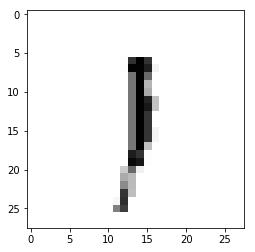

Epoch : 6 cost :  0.6159290480613707
Accuracy : 0.27
label : [1]
Prediction : [0]


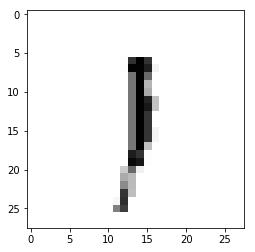

Epoch : 6 cost :  0.6197748255729674
Accuracy : 0.2753
label : [1]
Prediction : [0]


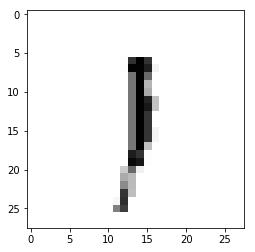

Epoch : 6 cost :  0.6234227702834387
Accuracy : 0.2728
label : [1]
Prediction : [0]


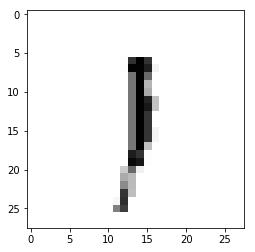

Epoch : 6 cost :  0.6271672632477499
Accuracy : 0.2806
label : [1]
Prediction : [0]


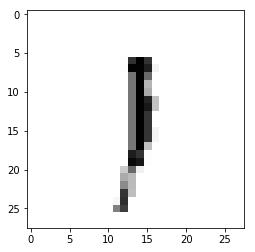

Epoch : 6 cost :  0.630842222950675
Accuracy : 0.288
label : [1]
Prediction : [0]


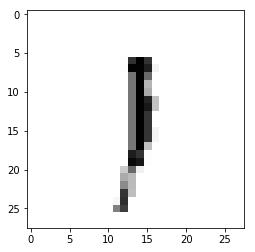

Epoch : 6 cost :  0.6345738109675318
Accuracy : 0.2861
label : [1]
Prediction : [0]


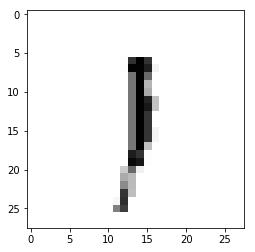

Epoch : 6 cost :  0.6383103988387365
Accuracy : 0.2863
label : [1]
Prediction : [0]


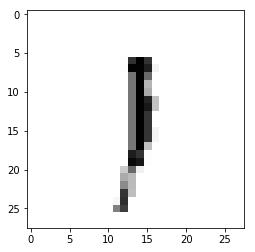

Epoch : 6 cost :  0.6420709126645866
Accuracy : 0.2846
label : [1]
Prediction : [0]


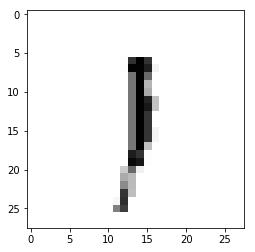

Epoch : 6 cost :  0.6458888411521909
Accuracy : 0.2865
label : [1]
Prediction : [0]


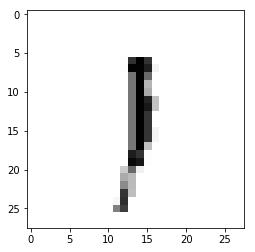

Epoch : 6 cost :  0.6495934042063624
Accuracy : 0.2751
label : [1]
Prediction : [0]


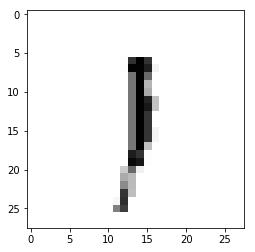

Epoch : 6 cost :  0.6533306466449388
Accuracy : 0.2701
label : [1]
Prediction : [0]


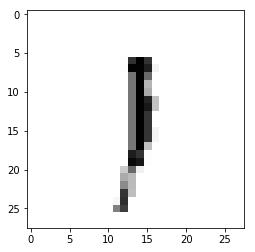

Epoch : 6 cost :  0.6570196266607802
Accuracy : 0.2686
label : [1]
Prediction : [0]


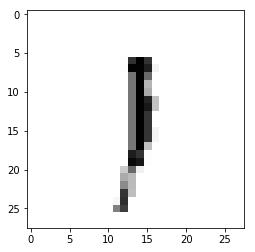

Epoch : 6 cost :  0.6606106159903783
Accuracy : 0.2608
label : [1]
Prediction : [0]


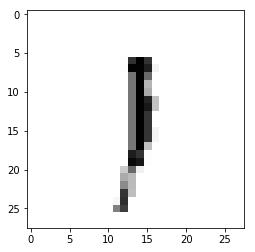

Epoch : 6 cost :  0.6643452687696974
Accuracy : 0.2605
label : [1]
Prediction : [0]


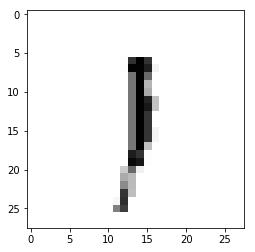

Epoch : 6 cost :  0.6680849361419674
Accuracy : 0.2602
label : [1]
Prediction : [0]


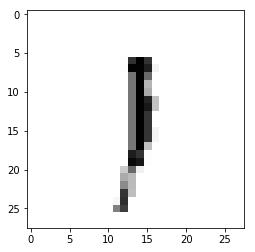

Epoch : 6 cost :  0.6716185032237656
Accuracy : 0.2602
label : [1]
Prediction : [0]


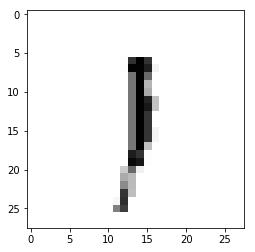

Epoch : 6 cost :  0.6751443169333714
Accuracy : 0.2722
label : [1]
Prediction : [0]


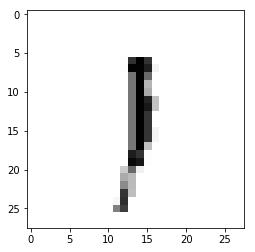

Epoch : 6 cost :  0.678880101984197
Accuracy : 0.2736
label : [1]
Prediction : [0]


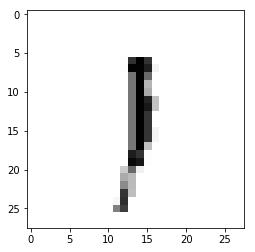

Epoch : 6 cost :  0.6826163248582315
Accuracy : 0.2707
label : [1]
Prediction : [0]


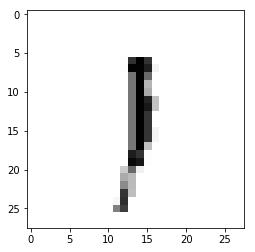

Epoch : 6 cost :  0.6863907363198016
Accuracy : 0.2675
label : [1]
Prediction : [0]


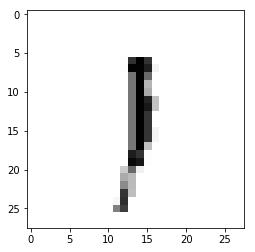

Epoch : 6 cost :  0.6901953562823205
Accuracy : 0.2662
label : [1]
Prediction : [0]


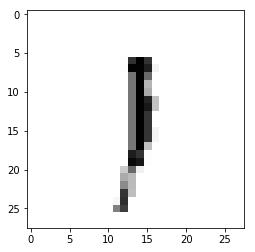

Epoch : 6 cost :  0.6938751749558879
Accuracy : 0.2671
label : [1]
Prediction : [0]


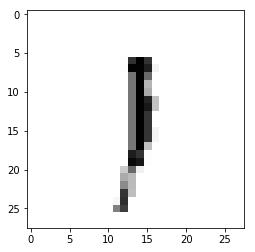

Epoch : 6 cost :  0.6975546836853024
Accuracy : 0.2668
label : [1]
Prediction : [0]


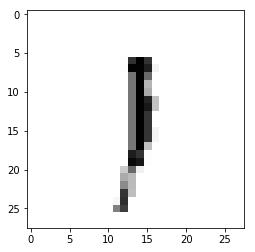

Epoch : 6 cost :  0.7011763999678868
Accuracy : 0.265
label : [1]
Prediction : [0]


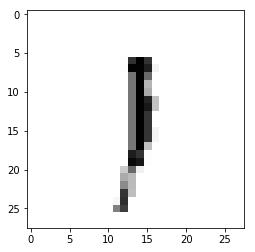

Epoch : 6 cost :  0.7051052767580203
Accuracy : 0.2651
label : [1]
Prediction : [0]


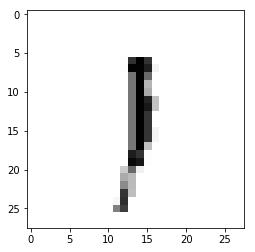

Epoch : 6 cost :  0.708734272393313
Accuracy : 0.2676
label : [1]
Prediction : [0]


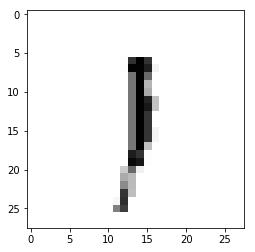

Epoch : 6 cost :  0.7122705225511028
Accuracy : 0.2675
label : [1]
Prediction : [0]


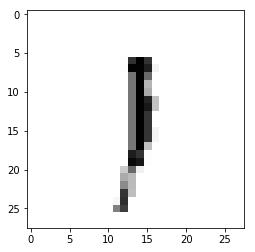

Epoch : 6 cost :  0.7158980467102741
Accuracy : 0.2793
label : [1]
Prediction : [0]


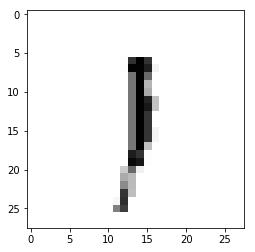

Epoch : 6 cost :  0.7197131068056277
Accuracy : 0.2675
label : [1]
Prediction : [0]


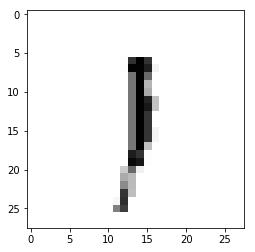

Epoch : 6 cost :  0.7234216726909981
Accuracy : 0.2647
label : [1]
Prediction : [0]


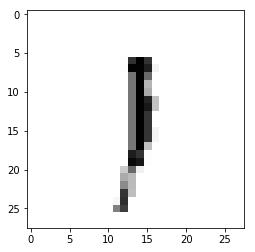

Epoch : 6 cost :  0.7272018785910169
Accuracy : 0.2651
label : [1]
Prediction : [0]


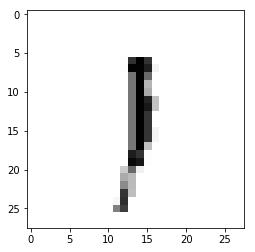

Epoch : 6 cost :  0.7310438379374413
Accuracy : 0.2639
label : [1]
Prediction : [0]


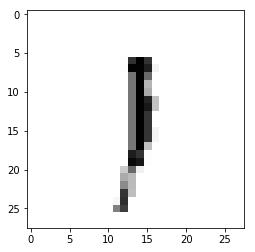

Epoch : 6 cost :  0.7347835178808728
Accuracy : 0.2638
label : [1]
Prediction : [0]


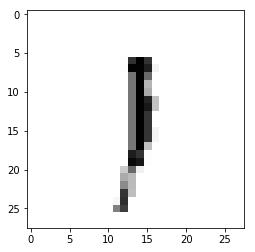

Epoch : 6 cost :  0.7384539068828925
Accuracy : 0.2628
label : [1]
Prediction : [0]


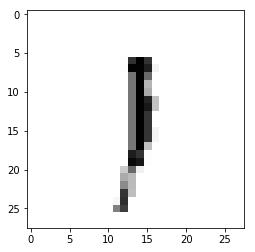

Epoch : 6 cost :  0.7421722808751188
Accuracy : 0.2633
label : [1]
Prediction : [0]


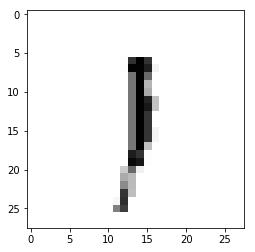

Epoch : 6 cost :  0.7456802173094311
Accuracy : 0.2631
label : [1]
Prediction : [0]


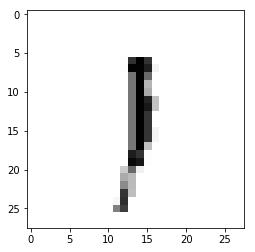

Epoch : 6 cost :  0.7492699477889316
Accuracy : 0.2632
label : [1]
Prediction : [0]


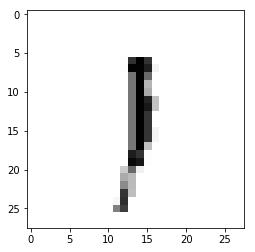

Epoch : 6 cost :  0.7529453643885521
Accuracy : 0.2643
label : [1]
Prediction : [0]


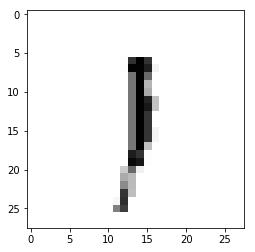

Epoch : 6 cost :  0.7566106815771618
Accuracy : 0.2641
label : [1]
Prediction : [0]


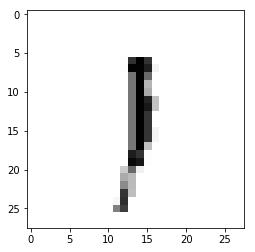

Epoch : 6 cost :  0.7602326575192533
Accuracy : 0.2608
label : [1]
Prediction : [0]


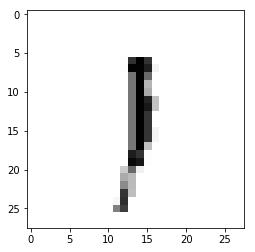

Epoch : 6 cost :  0.764000443111766
Accuracy : 0.2608
label : [1]
Prediction : [0]


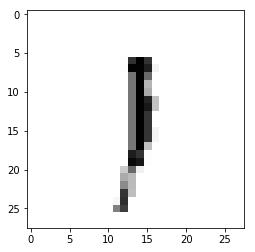

Epoch : 6 cost :  0.7678953864357683
Accuracy : 0.2613
label : [1]
Prediction : [0]


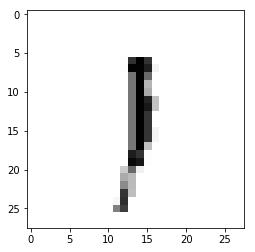

Epoch : 6 cost :  0.7716177532889621
Accuracy : 0.2621
label : [1]
Prediction : [0]


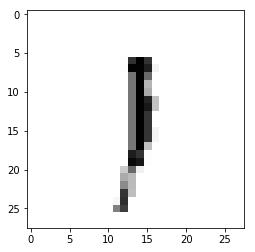

Epoch : 6 cost :  0.7751973436095493
Accuracy : 0.262
label : [1]
Prediction : [0]


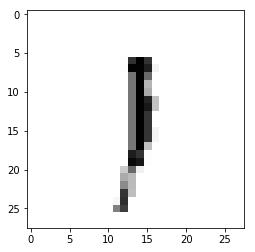

Epoch : 6 cost :  0.7790057765353805
Accuracy : 0.2625
label : [1]
Prediction : [0]


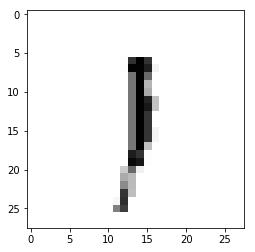

Epoch : 6 cost :  0.7828544536503874
Accuracy : 0.2627
label : [1]
Prediction : [0]


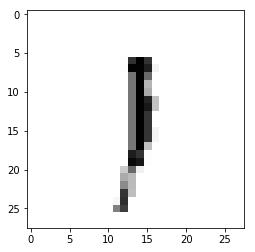

Epoch : 6 cost :  0.7865946030616756
Accuracy : 0.2633
label : [1]
Prediction : [0]


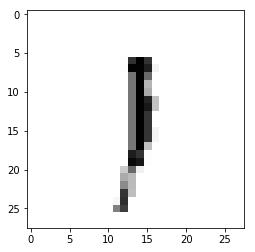

Epoch : 6 cost :  0.7903532320802857
Accuracy : 0.263
label : [1]
Prediction : [0]


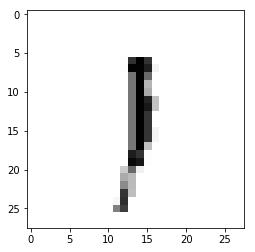

Epoch : 6 cost :  0.7939859888770359
Accuracy : 0.2624
label : [1]
Prediction : [0]


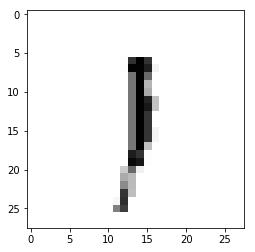

Epoch : 6 cost :  0.7976592844182789
Accuracy : 0.2624
label : [1]
Prediction : [0]


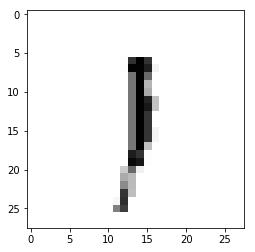

Epoch : 6 cost :  0.8014582764018661
Accuracy : 0.263
label : [1]
Prediction : [0]


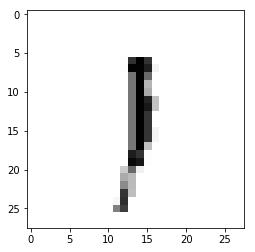

Epoch : 6 cost :  0.8050983879782931
Accuracy : 0.2624
label : [1]
Prediction : [0]


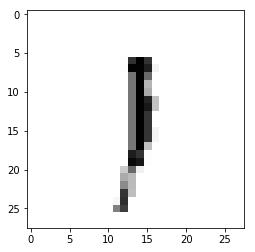

Epoch : 6 cost :  0.8089126409183843
Accuracy : 0.2629
label : [1]
Prediction : [0]


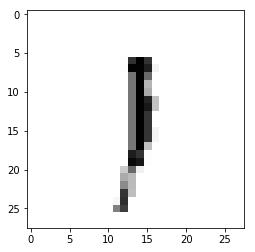

Epoch : 6 cost :  0.8126715963537037
Accuracy : 0.2628
label : [1]
Prediction : [0]


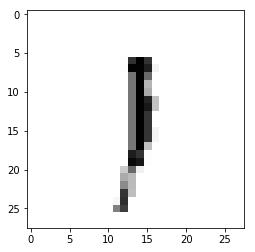

Epoch : 6 cost :  0.8164045052094887
Accuracy : 0.263
label : [1]
Prediction : [0]


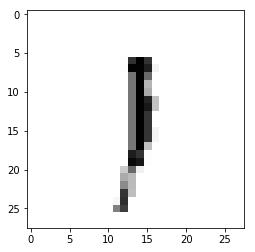

Epoch : 6 cost :  0.8201499891281122
Accuracy : 0.2633
label : [1]
Prediction : [0]


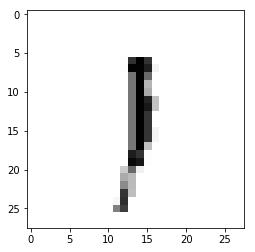

Epoch : 6 cost :  0.8238883066177363
Accuracy : 0.2646
label : [1]
Prediction : [0]


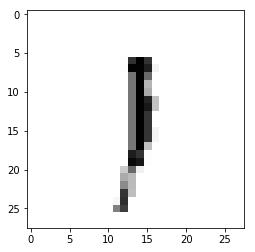

Epoch : 6 cost :  0.8275509305433788
Accuracy : 0.2661
label : [1]
Prediction : [0]


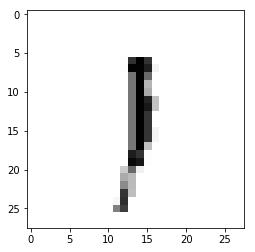

Epoch : 6 cost :  0.8311895266446195
Accuracy : 0.2631
label : [1]
Prediction : [0]


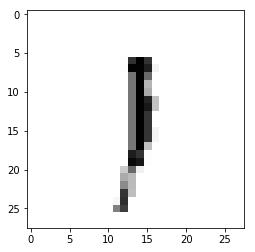

Epoch : 6 cost :  0.8349327278137202
Accuracy : 0.264
label : [1]
Prediction : [0]


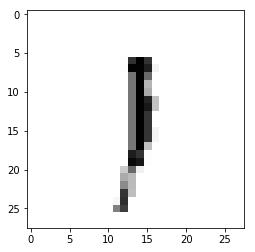

Epoch : 6 cost :  0.8386648399179627
Accuracy : 0.264
label : [1]
Prediction : [0]


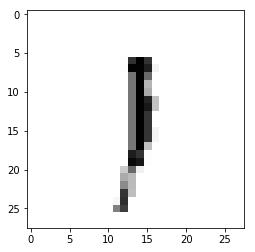

Epoch : 6 cost :  0.8424300254474981
Accuracy : 0.2639
label : [1]
Prediction : [0]


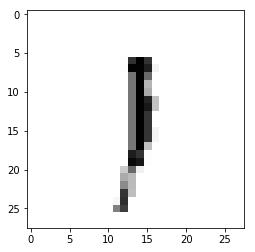

Epoch : 6 cost :  0.8461820615421637
Accuracy : 0.2634
label : [1]
Prediction : [0]


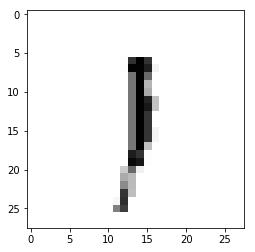

Epoch : 6 cost :  0.8500052772868758
Accuracy : 0.2636
label : [1]
Prediction : [0]


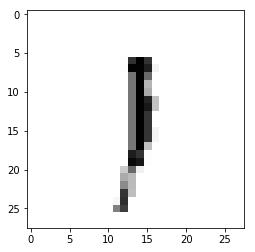

Epoch : 6 cost :  0.853568353002721
Accuracy : 0.2625
label : [1]
Prediction : [0]


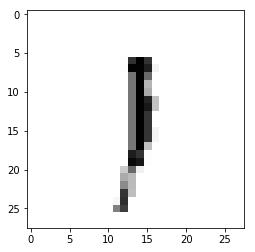

Epoch : 6 cost :  0.8572068108211859
Accuracy : 0.2632
label : [1]
Prediction : [0]


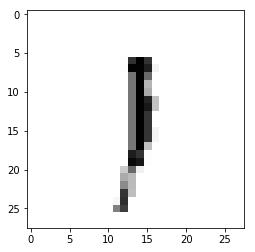

Epoch : 6 cost :  0.8608267032016402
Accuracy : 0.264
label : [1]
Prediction : [0]


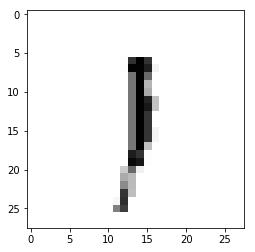

Epoch : 6 cost :  0.8646020648696201
Accuracy : 0.2652
label : [1]
Prediction : [0]


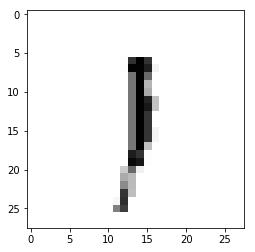

Epoch : 6 cost :  0.8682214923338452
Accuracy : 0.268
label : [1]
Prediction : [0]


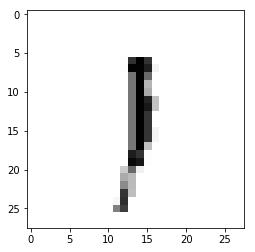

Epoch : 6 cost :  0.8718169403076167
Accuracy : 0.2684
label : [1]
Prediction : [0]


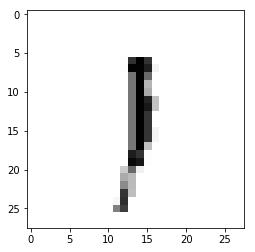

Epoch : 6 cost :  0.8756137622486456
Accuracy : 0.27
label : [1]
Prediction : [0]


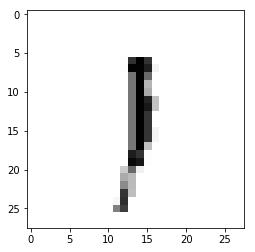

Epoch : 6 cost :  0.8793802798878058
Accuracy : 0.2682
label : [1]
Prediction : [0]


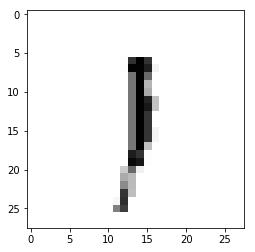

Epoch : 6 cost :  0.8830932855606074
Accuracy : 0.2679
label : [1]
Prediction : [0]


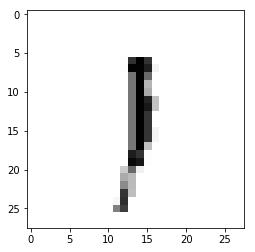

Epoch : 6 cost :  0.8866899069872765
Accuracy : 0.2679
label : [1]
Prediction : [0]


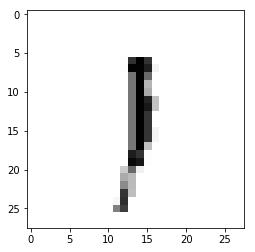

Epoch : 6 cost :  0.8904708251086143
Accuracy : 0.2675
label : [1]
Prediction : [0]


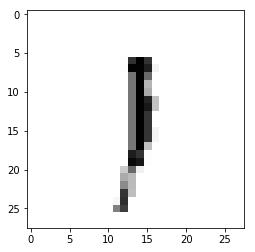

Epoch : 6 cost :  0.8941185608777128
Accuracy : 0.2738
label : [1]
Prediction : [0]


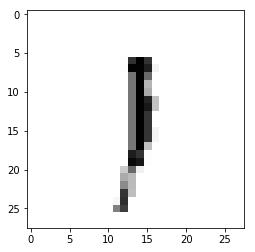

Epoch : 6 cost :  0.8979243985089383
Accuracy : 0.282
label : [1]
Prediction : [0]


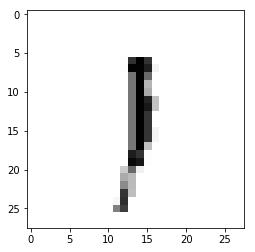

Epoch : 6 cost :  0.9014900970458979
Accuracy : 0.2832
label : [1]
Prediction : [0]


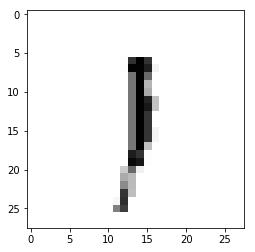

Epoch : 6 cost :  0.9052468013763422
Accuracy : 0.2827
label : [1]
Prediction : [0]


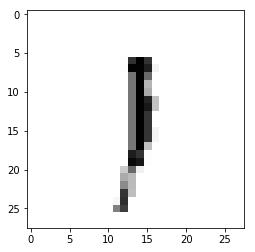

Epoch : 6 cost :  0.9088977523283519
Accuracy : 0.2829
label : [1]
Prediction : [0]


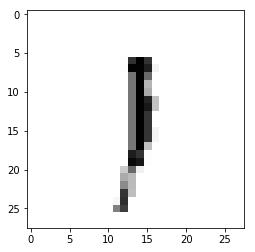

Epoch : 6 cost :  0.9125064854188393
Accuracy : 0.2738
label : [1]
Prediction : [0]


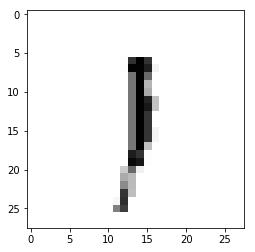

Epoch : 6 cost :  0.9160864164612503
Accuracy : 0.2847
label : [1]
Prediction : [0]


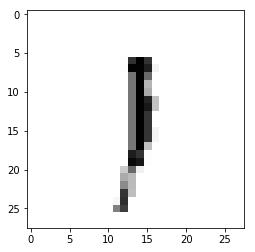

Epoch : 6 cost :  0.9198332385583351
Accuracy : 0.2889
label : [1]
Prediction : [0]


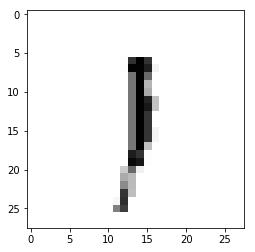

Epoch : 6 cost :  0.9234200291200111
Accuracy : 0.2765
label : [1]
Prediction : [0]


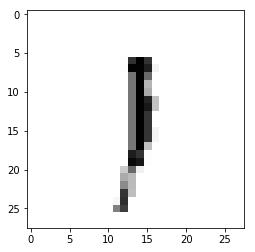

Epoch : 6 cost :  0.9271466090462418
Accuracy : 0.2772
label : [1]
Prediction : [0]


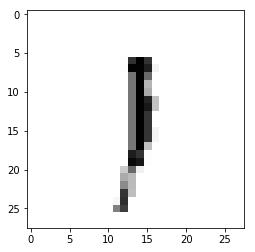

Epoch : 6 cost :  0.9308190449801351
Accuracy : 0.2796
label : [1]
Prediction : [0]


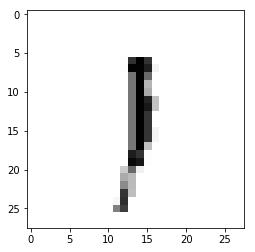

Epoch : 6 cost :  0.9346056847138832
Accuracy : 0.2782
label : [1]
Prediction : [0]


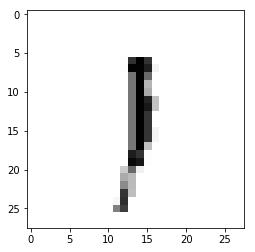

Epoch : 6 cost :  0.9382555354725224
Accuracy : 0.279
label : [1]
Prediction : [0]


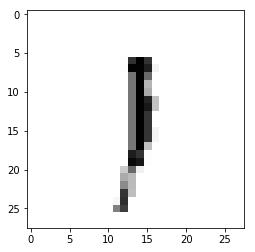

Epoch : 6 cost :  0.9419686412811272
Accuracy : 0.2808
label : [1]
Prediction : [0]


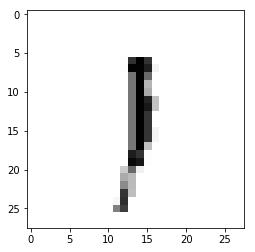

Epoch : 6 cost :  0.9457441269267682
Accuracy : 0.2789
label : [1]
Prediction : [0]


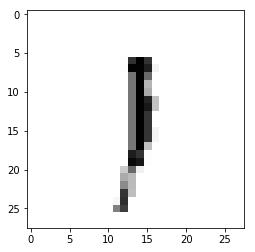

Epoch : 6 cost :  0.9494108087366271
Accuracy : 0.2812
label : [1]
Prediction : [0]


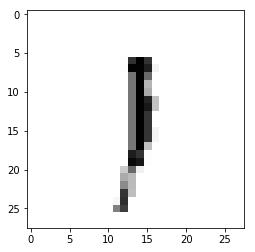

Epoch : 6 cost :  0.9531426195664833
Accuracy : 0.2812
label : [1]
Prediction : [0]


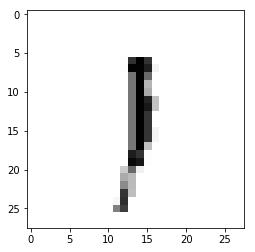

Epoch : 6 cost :  0.9569437209042629
Accuracy : 0.2803
label : [1]
Prediction : [0]


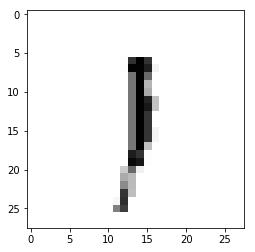

Epoch : 6 cost :  0.9606049446626137
Accuracy : 0.2791
label : [1]
Prediction : [0]


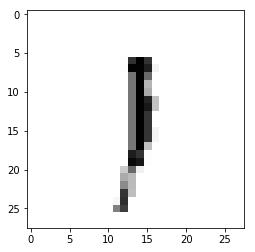

Epoch : 6 cost :  0.9641265374963928
Accuracy : 0.2773
label : [1]
Prediction : [0]


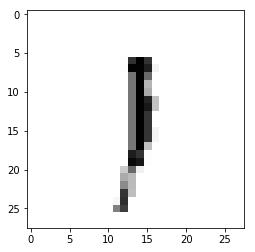

Epoch : 6 cost :  0.9679568030617448
Accuracy : 0.2768
label : [1]
Prediction : [0]


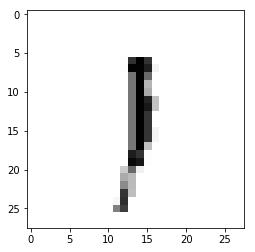

Epoch : 6 cost :  0.9716932734576132
Accuracy : 0.2767
label : [1]
Prediction : [0]


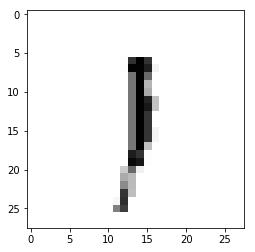

Epoch : 6 cost :  0.9755011450160628
Accuracy : 0.2629
label : [1]
Prediction : [0]


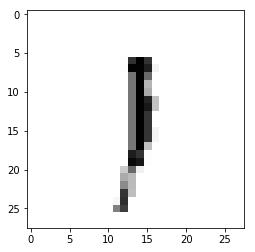

Epoch : 6 cost :  0.9794558434052895
Accuracy : 0.261
label : [1]
Prediction : [0]


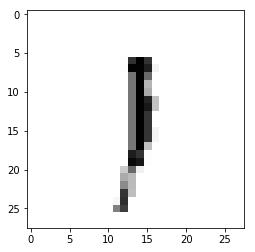

Epoch : 6 cost :  0.9831461139158763
Accuracy : 0.2627
label : [1]
Prediction : [0]


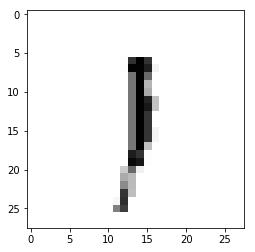

Epoch : 6 cost :  0.986891728747974
Accuracy : 0.2612
label : [1]
Prediction : [0]


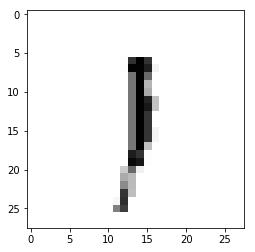

Epoch : 6 cost :  0.9905159646814513
Accuracy : 0.2634
label : [1]
Prediction : [0]


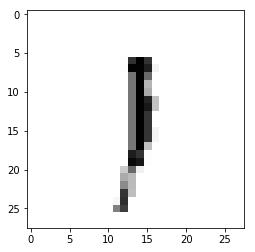

Epoch : 6 cost :  0.9942340950532387
Accuracy : 0.2738
label : [1]
Prediction : [0]


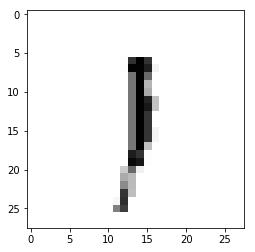

Epoch : 6 cost :  0.9980519494143393
Accuracy : 0.2657
label : [1]
Prediction : [0]


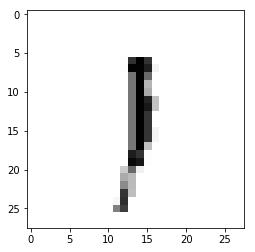

Epoch : 6 cost :  1.0017597970095542
Accuracy : 0.2773
label : [1]
Prediction : [0]


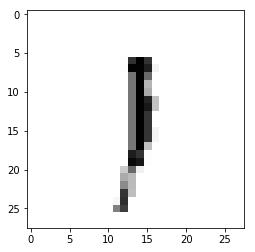

Epoch : 6 cost :  1.0054379849000405
Accuracy : 0.2777
label : [1]
Prediction : [0]


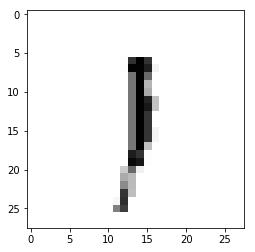

Epoch : 6 cost :  1.009362178715792
Accuracy : 0.2678
label : [1]
Prediction : [0]


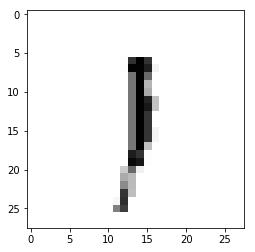

Epoch : 6 cost :  1.013150433193553
Accuracy : 0.2667
label : [1]
Prediction : [0]


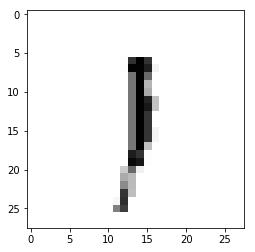

Epoch : 6 cost :  1.0170439655130554
Accuracy : 0.278
label : [1]
Prediction : [0]


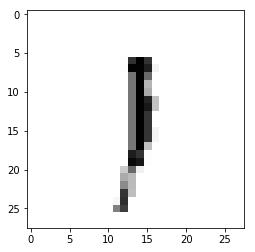

Epoch : 6 cost :  1.0207290623404757
Accuracy : 0.2774
label : [1]
Prediction : [0]


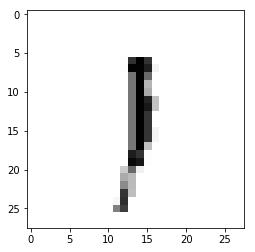

Epoch : 6 cost :  1.0243875347484235
Accuracy : 0.2789
label : [1]
Prediction : [0]


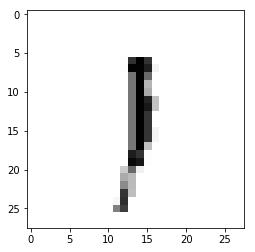

Epoch : 6 cost :  1.027969191507859
Accuracy : 0.2782
label : [1]
Prediction : [0]


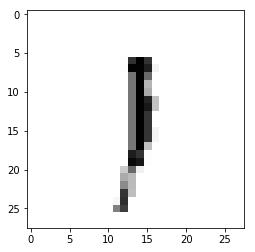

Epoch : 6 cost :  1.0317004075917324
Accuracy : 0.2773
label : [1]
Prediction : [0]


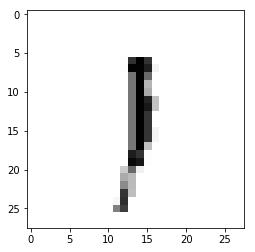

Epoch : 6 cost :  1.0354395283352238
Accuracy : 0.2792
label : [1]
Prediction : [0]


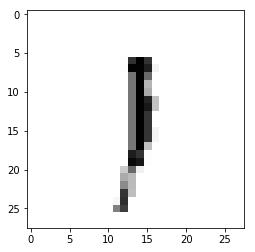

Epoch : 6 cost :  1.0391708137772293
Accuracy : 0.2808
label : [1]
Prediction : [0]


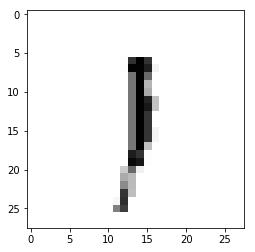

Epoch : 6 cost :  1.0428642539544533
Accuracy : 0.2794
label : [1]
Prediction : [0]


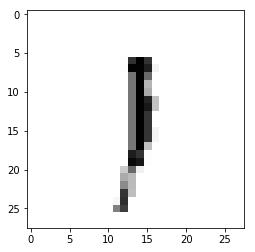

Epoch : 6 cost :  1.046634868491779
Accuracy : 0.28
label : [1]
Prediction : [0]


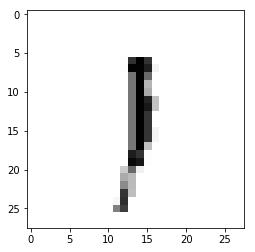

Epoch : 6 cost :  1.0503626288067205
Accuracy : 0.281
label : [1]
Prediction : [0]


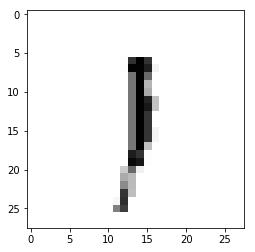

Epoch : 6 cost :  1.0540467866984276
Accuracy : 0.2823
label : [1]
Prediction : [0]


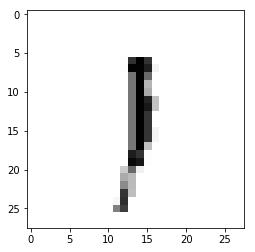

Epoch : 6 cost :  1.0577337033098388
Accuracy : 0.2825
label : [1]
Prediction : [0]


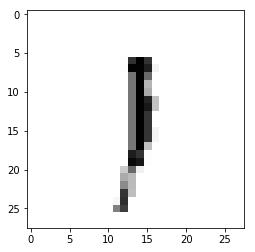

Epoch : 6 cost :  1.0614697649262161
Accuracy : 0.2818
label : [1]
Prediction : [0]


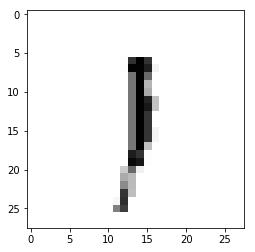

Epoch : 6 cost :  1.0651076631112526
Accuracy : 0.2832
label : [1]
Prediction : [0]


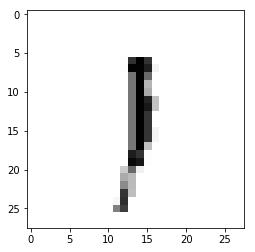

Epoch : 6 cost :  1.0686563855951476
Accuracy : 0.281
label : [1]
Prediction : [0]


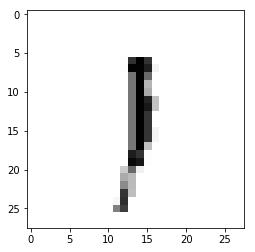

Epoch : 6 cost :  1.0724206798726856
Accuracy : 0.283
label : [1]
Prediction : [0]


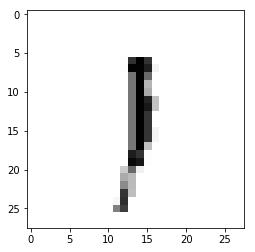

Epoch : 6 cost :  1.0760636585408985
Accuracy : 0.2823
label : [1]
Prediction : [0]


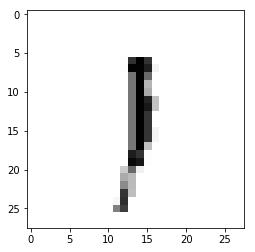

Epoch : 6 cost :  1.0795690337094388
Accuracy : 0.2826
label : [1]
Prediction : [0]


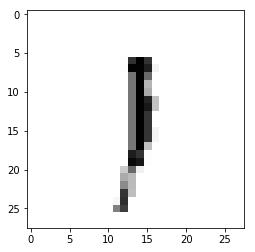

Epoch : 6 cost :  1.0833664178848261
Accuracy : 0.284
label : [1]
Prediction : [0]


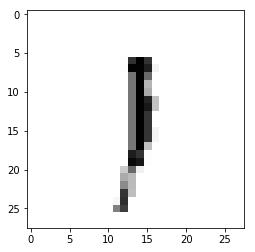

Epoch : 6 cost :  1.0870404937050553
Accuracy : 0.2838
label : [1]
Prediction : [0]


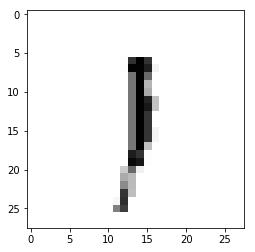

Epoch : 6 cost :  1.0906626983122385
Accuracy : 0.2822
label : [1]
Prediction : [0]


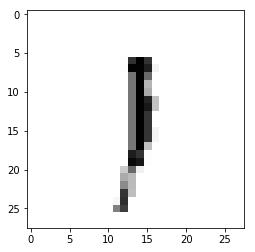

Epoch : 6 cost :  1.0943127350373694
Accuracy : 0.281
label : [1]
Prediction : [0]


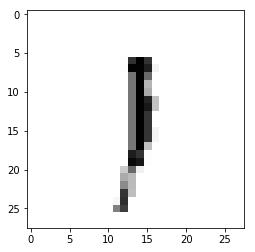

Epoch : 6 cost :  1.098036379380659
Accuracy : 0.2795


In [ ]:
training_epoch = 15
batch_size = 100

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    
    for epoch in range(training_epoch):
        avg_cost = 0
        total_batch = int(mnist.train.num_examples / batch_size)
        
        for i in range(total_batch):
            batch_xs,batch_ys = mnist.train.next_batch(batch_size)
            c,_ = sess.run([cost1,optimizer1],feed_dict={X:batch_xs,Y:batch_ys})
            avg_cost += c / total_batch
            print("Epoch :",(epoch+1),"cost : ",avg_cost)
            print("Accuracy :",accuracy1.eval(session=sess,
                                            feed_dict={X:mnist.test.images,Y:mnist.test.labels}))
            print("label :",sess.run(tf.argmax(mnist.test.labels[r:r+1],1)))
            print("Prediction :", sess.run(tf.argmax(hypo,1),feed_dict={X:mnist.test.images[r:r+1]}))
            plt.imshow(mnist.test.images[r:r + 1].reshape(28,28),cmap='Greys',interpolation='nearest')
            plt.show()
       

In [5]:
x=2
print(x += 3)

SyntaxError: invalid syntax (<ipython-input-5-4180b352a9ad>, line 2)